# Notebook 02 — Integración y análisis geoespacial

## Análisis geoespacial integrado de la calidad del aire en Barcelona

Este notebook desarrolla la fase de **integración, análisis y modelización geoespacial** del proyecto a partir de las fuentes previamente depuradas y homogeneizadas en `LF_01_Preprocesado_Fuentes_Geoespaciales`.

El objetivo es construir una base territorial común que permita analizar la **distribución espacial del NO₂** y estudiar su relación con las principales características de movilidad, estructura urbana, condiciones socioeconómicas y variables territoriales de Barcelona.

El flujo de trabajo comprende:

* integración de las fuentes geoespaciales previamente procesadas;
* construcción y validación de la base analítica espacial;
* análisis exploratorio y caracterización territorial;
* evaluación de la autocorrelación espacial;
* estimación y diagnóstico de modelos OLS, SAR y SEM;
* modelización mediante XGBoost e interpretación con SHAP;
* análisis de patrones espaciales locales mediante LISA;
* análisis de asociaciones espaciales mediante Moran bivariado;
* generación de cartografía temática y síntesis de los resultados geoespaciales.

De este modo, el notebook combina **estadística espacial, econometría espacial y aprendizaje automático**, permitiendo contrastar la capacidad explicativa y predictiva de los diferentes enfoques e identificar los principales patrones territoriales asociados a la contaminación atmosférica.

> **Flujo de trabajo:** preintegración → integración geoespacial → análisis exploratorio → modelización espacial → aprendizaje automático → interpretación → cartografía y síntesis


# FASE 1 — PREPARACIÓN, ARMONIZACIÓN Y ENRIQUECIMIENTO DE LAS CAPAS GEOESPACIALES

In [1]:
# ============================================================
# 1. MONTAJE DE GOOGLE DRIVE
# ============================================================

from google.colab import drive

drive.mount("/content/drive")

print("=" * 100)
print("GOOGLE DRIVE MONTADO CORRECTAMENTE")
print("=" * 100)

Mounted at /content/drive
GOOGLE DRIVE MONTADO CORRECTAMENTE


##  2 . Configuración del entorno de análisis geoespacial

Se configura el entorno de trabajo necesario para desarrollar la fase de **integración y análisis geoespacial** del proyecto.

Se cargan las principales librerías destinadas al tratamiento tabular, manipulación de información vectorial y raster, representación gráfica y gestión de rutas. Asimismo, se establecen opciones generales de visualización y presentación de resultados para mantener una estructura homogénea a lo largo del notebook.

Esta configuración constituye la base común sobre la que se realizarán posteriormente la carga, integración, validación y análisis de los productos previamente generados en la fase de preintegración.

In [2]:
# ============================================================
# 2. CONFIGURACIÓN DEL ENTORNO DE ANÁLISIS GEOESPACIAL
# ============================================================

import os
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt

import rasterio

# ------------------------------------------------------------
# CONFIGURACIÓN GENERAL
# ------------------------------------------------------------

warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)

plt.rcParams["figure.figsize"] = (10, 8)

# ------------------------------------------------------------
# CONTROL DE INICIO
# ------------------------------------------------------------

print("=" * 100)
print("INTEGRACIÓN Y ANÁLISIS GEOESPACIAL")
print("=" * 100)

print("\n✓ Librerías cargadas correctamente.")
print("✓ Entorno de análisis geoespacial configurado.")

INTEGRACIÓN Y ANÁLISIS GEOESPACIAL

✓ Librerías cargadas correctamente.
✓ Entorno de análisis geoespacial configurado.


## 3 . Configuración de rutas del proyecto

Se define la estructura de directorios utilizada durante la fase de **integración y análisis geoespacial**, diferenciando explícitamente los productos de entrada procedentes del preprocesado y los resultados generados en este notebook.

Como fuente de entrada se utiliza exclusivamente el directorio `PREINTEGRACION`, que contiene las capas y tablas previamente depuradas, homogeneizadas y validadas. De este modo, la integración se realiza sobre productos consolidados, sin necesidad de volver a acceder a los datos originales.

Los resultados de esta fase se organizan dentro del directorio `INTEGRACION`, estructurado en cuatro grupos:

* `FIGURAS`: representaciones gráficas y cartográficas.
* `CAPAS`: productos geoespaciales derivados de la integración.
* `TABLAS`: resultados tabulares y controles intermedios.
* `DATASETS`: conjuntos de datos integrados destinados a las etapas posteriores de análisis y modelización.

Finalmente, se verifica la existencia del directorio de preintegración y se crean automáticamente los directorios de salida necesarios, garantizando una estructura de trabajo **reproducible, trazable y ordenada**.


In [3]:

# ============================================================
# 3. CONFIGURACIÓN DE RUTAS DEL PROYECTO
# ============================================================

from pathlib import Path

print("=" * 100)
print("CONFIGURACIÓN DE RUTAS DEL PROYECTO")
print("=" * 100)

# ------------------------------------------------------------
# 1. DIRECTORIO GENERAL DEL TFM
# ------------------------------------------------------------

RUTA_BASE = Path(
    "/content/drive/MyDrive/TFM"
)

# ------------------------------------------------------------
# 2. DIRECTORIO DEL BLOQUE GEOESPACIAL
# ------------------------------------------------------------

RUTA_GEOESPACIAL = (
    RUTA_BASE
    / "10_Machine_Learning_Geoespacial"
)

# ------------------------------------------------------------
# 3. DIRECTORIO DE PREINTEGRACIÓN
# ------------------------------------------------------------

# Los productos utilizados en este notebook proceden
# exclusivamente de la fase previa de preintegración.

RUTA_PREINTEGRACION = (
    RUTA_GEOESPACIAL
    / "PREINTEGRACION"
)

# ------------------------------------------------------------
# 4. DIRECTORIO DE RESULTADOS DEL NOTEBOOK 02
# ------------------------------------------------------------

RUTA_INTEGRACION = (
    RUTA_GEOESPACIAL
    / "INTEGRACION"
)

RUTA_INTEGRACION.mkdir(
    parents=True,
    exist_ok=True
)

# ------------------------------------------------------------
# 5. SUBDIRECTORIOS DE RESULTADOS
# ------------------------------------------------------------

RUTA_FIGURAS = (
    RUTA_INTEGRACION
    / "FIGURAS"
)

RUTA_CAPAS = (
    RUTA_INTEGRACION
    / "CAPAS"
)

RUTA_TABLAS = (
    RUTA_INTEGRACION
    / "TABLAS"
)

RUTA_DATASETS = (
    RUTA_INTEGRACION
    / "DATASETS"
)

# ------------------------------------------------------------
# 6. CREACIÓN DE DIRECTORIOS
# ------------------------------------------------------------

for carpeta in [
    RUTA_FIGURAS,
    RUTA_CAPAS,
    RUTA_TABLAS,
    RUTA_DATASETS
]:
    carpeta.mkdir(
        parents=True,
        exist_ok=True
    )

# ------------------------------------------------------------
# 7. COMPROBACIÓN DE RUTAS
# ------------------------------------------------------------

print("\nDirectorio general:")
print(RUTA_BASE)

print("\nBloque geoespacial:")
print(RUTA_GEOESPACIAL)

print("\nDirectorio de entrada:")
print(RUTA_PREINTEGRACION)

print("\nDirectorio de integración:")
print(RUTA_INTEGRACION)

print("\nSubdirectorios de salida:")
print(f"FIGURAS  : {RUTA_FIGURAS}")
print(f"CAPAS    : {RUTA_CAPAS}")
print(f"TABLAS   : {RUTA_TABLAS}")
print(f"DATASETS : {RUTA_DATASETS}")

# ------------------------------------------------------------
# 8. VALIDACIONES
# ------------------------------------------------------------

if not RUTA_PREINTEGRACION.exists():
    raise FileNotFoundError(
        "No se encuentra el directorio PREINTEGRACION:\n"
        f"{RUTA_PREINTEGRACION}"
    )

assert RUTA_INTEGRACION.exists()
assert RUTA_FIGURAS.exists()
assert RUTA_CAPAS.exists()
assert RUTA_TABLAS.exists()
assert RUTA_DATASETS.exists()

# ------------------------------------------------------------
# 9. RESULTADO
# ------------------------------------------------------------

print("\n✓ Directorio PREINTEGRACION localizado correctamente.")
print("✓ Directorios de integración creados o verificados.")
print("✓ Estructura de rutas preparada para el notebook 02.")



CONFIGURACIÓN DE RUTAS DEL PROYECTO

Directorio general:
/content/drive/MyDrive/TFM

Bloque geoespacial:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial

Directorio de entrada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/PREINTEGRACION

Directorio de integración:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION

Subdirectorios de salida:
FIGURAS  : /content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS
CAPAS    : /content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/CAPAS
TABLAS   : /content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/TABLAS
DATASETS : /content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/DATASETS

✓ Directorio PREINTEGRACION localizado correctamente.
✓ Directorios de integración creados o verificados.
✓ Estructura de rutas preparada para el notebook 02.


#### Resultados

La configuración de rutas se ha completado correctamente y queda establecida la estructura de trabajo correspondiente a la fase de **integración y análisis geoespacial**.

El directorio `PREINTEGRACION` ha sido localizado y validado como fuente de entrada de los productos previamente procesados. Asimismo, se ha creado y verificado el directorio `INTEGRACION`, destinado a almacenar exclusivamente los resultados generados durante este notebook.

La estructura de salida queda organizada en cuatro subdirectorios independientes:

* `FIGURAS`, para las representaciones gráficas y cartográficas.
* `CAPAS`, para los productos vectoriales y geoespaciales derivados.
* `TABLAS`, para resultados tabulares y controles de integración.
* `DATASETS`, para los conjuntos de datos consolidados que servirán de entrada a las fases posteriores de análisis y modelización.

Todas las rutas necesarias se encuentran disponibles y correctamente configuradas. Con ello, queda garantizada la **separación entre los productos de preintegración y los nuevos productos derivados de la integración geoespacial**, manteniendo la trazabilidad y reproducibilidad del flujo de trabajo.


## 4 . Auditoría de los datos de entrada

Se realiza una auditoría sistemática de los productos almacenados en el directorio `PREINTEGRACION`, que constituye la fuente única de datos de entrada para esta fase de integración y análisis geoespacial.

El procedimiento recorre de forma recursiva toda la estructura de preintegración e identifica los archivos disponibles, registrando para cada uno su nombre, formato, tamaño, ubicación relativa y ruta completa. De este modo, se obtiene un inventario consolidado de los productos generados y validados durante la fase anterior.

Además, se generan resúmenes por **formato de archivo** y por **ubicación dentro de PREINTEGRACION**, lo que permite comprobar la composición del conjunto de entrada y detectar posibles ausencias, duplicidades o inconsistencias antes de iniciar la carga de las capas.

Esta auditoría constituye un control previo de trazabilidad y disponibilidad física de los datos, garantizando que la integración posterior se realice exclusivamente sobre productos previamente preparados y validados.


In [4]:

# ============================================================
# 4. AUDITORÍA DE LOS DATOS DE ENTRADA
# ============================================================

import os
import pandas as pd

print("=" * 100)
print("AUDITORÍA DE LOS PRODUCTOS DE PREINTEGRACIÓN")
print("=" * 100)

# ------------------------------------------------------------
# 1. INVENTARIO DE ARCHIVOS
# ------------------------------------------------------------

archivos = []

for raiz, carpetas, ficheros in os.walk(RUTA_PREINTEGRACION):

    for fichero in ficheros:

        ruta = os.path.join(
            raiz,
            fichero
        )

        ruta_relativa = os.path.relpath(
            ruta,
            RUTA_PREINTEGRACION
        )

        subcarpeta = os.path.dirname(
            ruta_relativa
        )

        if subcarpeta == "":
            subcarpeta = "RAÍZ_PREINTEGRACION"

        archivos.append(
            {
                "ARCHIVO": fichero,
                "FORMATO": os.path.splitext(
                    fichero
                )[1].lower(),
                "TAMAÑO_MB": round(
                    os.path.getsize(ruta)
                    / 1024**2,
                    3
                ),
                "SUBCARPETA": subcarpeta,
                "RUTA_COMPLETA": ruta
            }
        )

# ------------------------------------------------------------
# 2. CREAR TABLA DE AUDITORÍA
# ------------------------------------------------------------

auditoria_inputs = pd.DataFrame(
    archivos
)

if auditoria_inputs.empty:

    raise FileNotFoundError(
        "El directorio PREINTEGRACION está vacío."
    )

auditoria_inputs = (
    auditoria_inputs
    .sort_values(
        [
            "SUBCARPETA",
            "FORMATO",
            "ARCHIVO"
        ]
    )
    .reset_index(
        drop=True
    )
)

# ------------------------------------------------------------
# 3. RESUMEN GENERAL
# ------------------------------------------------------------

numero_archivos = len(
    auditoria_inputs
)

tamano_total_mb = (
    auditoria_inputs[
        "TAMAÑO_MB"
    ]
    .sum()
)

numero_formatos = (
    auditoria_inputs[
        "FORMATO"
    ]
    .nunique()
)

numero_subcarpetas = (
    auditoria_inputs[
        "SUBCARPETA"
    ]
    .nunique()
)

print(
    f"\nNúmero de archivos encontrados : "
    f"{numero_archivos:,}"
)

print(
    f"Formatos diferentes            : "
    f"{numero_formatos:,}"
)

print(
    f"Ubicaciones con archivos       : "
    f"{numero_subcarpetas:,}"
)

print(
    f"Tamaño total                   : "
    f"{tamano_total_mb:,.2f} MB"
)

# ------------------------------------------------------------
# 4. MOSTRAR INVENTARIO
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("INVENTARIO DE PRODUCTOS")
print("=" * 100)

display(
    auditoria_inputs
)

# ------------------------------------------------------------
# 5. RESUMEN POR FORMATO
# ------------------------------------------------------------

resumen_formatos = (
    auditoria_inputs
    .groupby(
        "FORMATO",
        dropna=False
    )
    .agg(
        ARCHIVOS=(
            "ARCHIVO",
            "count"
        ),
        TAMAÑO_TOTAL_MB=(
            "TAMAÑO_MB",
            "sum"
        )
    )
    .reset_index()
    .sort_values(
        "ARCHIVOS",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

resumen_formatos[
    "TAMAÑO_TOTAL_MB"
] = (
    resumen_formatos[
        "TAMAÑO_TOTAL_MB"
    ]
    .round(3)
)

print("\n" + "=" * 100)
print("RESUMEN POR FORMATO")
print("=" * 100)

display(
    resumen_formatos
)

# ------------------------------------------------------------
# 6. RESUMEN POR UBICACIÓN
# ------------------------------------------------------------

resumen_subcarpetas = (
    auditoria_inputs
    .groupby(
        "SUBCARPETA"
    )
    .agg(
        ARCHIVOS=(
            "ARCHIVO",
            "count"
        ),
        TAMAÑO_TOTAL_MB=(
            "TAMAÑO_MB",
            "sum"
        )
    )
    .reset_index()
    .sort_values(
        "SUBCARPETA"
    )
    .reset_index(
        drop=True
    )
)

resumen_subcarpetas[
    "TAMAÑO_TOTAL_MB"
] = (
    resumen_subcarpetas[
        "TAMAÑO_TOTAL_MB"
    ]
    .round(3)
)

print("\n" + "=" * 100)
print("RESUMEN POR UBICACIÓN")
print("=" * 100)

display(
    resumen_subcarpetas
)

# ------------------------------------------------------------
# 7. VALIDACIONES
# ------------------------------------------------------------

assert numero_archivos > 0

assert auditoria_inputs[
    "RUTA_COMPLETA"
].notna().all()

assert auditoria_inputs[
    "ARCHIVO"
].notna().all()

assert (
    auditoria_inputs[
        "TAMAÑO_MB"
    ] >= 0
).all()

# ------------------------------------------------------------
# 8. RESULTADO
# ------------------------------------------------------------

print(
    "\n✓ Directorio PREINTEGRACION auditado correctamente."
)

print(
    "✓ Inventario completo de productos generado."
)

print(
    "✓ Formatos y ubicaciones de entrada identificados."
)

print(
    "✓ Datos preparados para la carga y auditoría geoespacial."
)



AUDITORÍA DE LOS PRODUCTOS DE PREINTEGRACIÓN

Número de archivos encontrados : 13
Formatos diferentes            : 3
Ubicaciones con archivos       : 4
Tamaño total                   : 21.17 MB

INVENTARIO DE PRODUCTOS


,ARCHIVO,FORMATO,TAMAÑO_MB,SUBCARPETA,RUTA_COMPLETA
0,control_aforos_anuales.csv,.csv,0.000,02_Trafico_Rodado_y_Aforos,/content/drive/MyDrive/TFM/10_Machine_Learning...
1,df_aforos_anual_apto.csv,.csv,0.477,02_Trafico_Rodado_y_Aforos,/content/drive/MyDrive/TFM/10_Machine_Learning...
2,df_aforos_anual_maestro.csv,.csv,0.559,02_Trafico_Rodado_y_Aforos,/content/drive/MyDrive/TFM/10_Machine_Learning...
3,aforos_anuales_barcelona.gpkg,.gpkg,1.523,02_Trafico_Rodado_y_Aforos,/content/drive/MyDrive/TFM/10_Machine_Learning...
4,control_usos_suelo.csv,.csv,0.000,03_Usos_del_Suelo,/content/drive/MyDrive/TFM/10_Machine_Learning...
5,df_usos_suelo_barcelona.csv,.csv,1.613,03_Usos_del_Suelo,/content/drive/MyDrive/TFM/10_Machine_Learning...
6,usos_suelo_barcelona.gpkg,.gpkg,13.270,03_Usos_del_Suelo,/content/drive/MyDrive/TFM/10_Machine_Learning...
7,control_elevacion.csv,.csv,0.000,05_Elevacion,/content/drive/MyDrive/TFM/10_Machine_Learning...
8,df_elevacion_barcelona.csv,.csv,0.246,05_Elevacion,/content/drive/MyDrive/TFM/10_Machine_Learning...
9,elevacion_barcelona.gpkg,.gpkg,0.449,05_Elevacion,/content/drive/MyDrive/TFM/10_Machine_Learning...



RESUMEN POR FORMATO


,FORMATO,ARCHIVOS,TAMAÑO_TOTAL_MB
0,.csv,8,2.895
1,.gpkg,4,18.265
2,.tif,1,0.013



RESUMEN POR UBICACIÓN


,SUBCARPETA,ARCHIVOS,TAMAÑO_TOTAL_MB
0,02_Trafico_Rodado_y_Aforos,4,2.559
1,03_Usos_del_Suelo,3,14.883
2,05_Elevacion,4,0.708
3,RAÍZ_PREINTEGRACION,2,3.023



✓ Directorio PREINTEGRACION auditado correctamente.
✓ Inventario completo de productos generado.
✓ Formatos y ubicaciones de entrada identificados.
✓ Datos preparados para la carga y auditoría geoespacial.


#### Resultados

La auditoría de los productos de preintegración se ha completado correctamente, identificándose **13 archivos**, distribuidos en **4 ubicaciones** y correspondientes a **3 formatos de almacenamiento** (`CSV`, `GeoPackage` y `GeoTIFF`). El conjunto ocupa aproximadamente **21,17 MB**.

El inventario confirma la disponibilidad de los productos correspondientes a las **unidades administrativas, tráfico rodado y aforos, usos del suelo y elevación**, incluyendo tanto los conjuntos de datos destinados a la integración como sus respectivos archivos de control.

Por formatos, se han identificado **8 archivos CSV**, **4 GeoPackage** y **1 raster GeoTIFF**. Los GeoPackage concentran la mayor parte del volumen de información, con aproximadamente **18,27 MB**, debido principalmente al componente geométrico de las capas vectoriales.

La distribución por ubicación muestra una estructura organizada y coherente de los productos de entrada: **4 archivos de tráfico rodado y aforos, 3 de usos del suelo, 4 de elevación y 2 productos administrativos en la raíz de `PREINTEGRACION`**.

No se han detectado problemas de disponibilidad durante la auditoría. Por tanto, el inventario de preintegración queda **verificado y preparado para iniciar la carga controlada de las capas que participarán en la integración geoespacial**.


## 5 . Definición y validación de las capas de entrada

Una vez auditado el contenido de `PREINTEGRACION`, se definen de forma explícita los productos geoespaciales que participarán en la fase de integración.

Las rutas se construyen exclusivamente a partir de los productos previamente **depurados, validados y exportados**, evitando recurrir nuevamente a las fuentes originales o a directorios provisionales utilizados durante etapas anteriores del procesamiento.

En esta fase se incorporan como entradas principales las **unidades administrativas**, los **aforos de tráfico rodado**, los **usos del suelo** y la **información altimétrica**, tanto en formato vectorial como raster cuando resulta necesario.

Para cada producto se comprueba su existencia física, formato y tamaño antes de iniciar la carga efectiva de las capas. Este control garantiza que la integración se realice únicamente sobre productos disponibles y consolidados, manteniendo la trazabilidad del flujo de trabajo.


In [5]:

# ============================================================
# 5. DEFINICIÓN Y VALIDACIÓN DE LAS CAPAS DE ENTRADA
# ============================================================

from pathlib import Path
import pandas as pd

print("=" * 100)
print("DEFINICIÓN Y VALIDACIÓN DE LAS CAPAS DE ENTRADA")
print("=" * 100)


# ------------------------------------------------------------
# 1. DIRECTORIO DE PREINTEGRACIÓN
# ------------------------------------------------------------

RUTA_PREINTEGRACION = Path(
    RUTA_PREINTEGRACION
)


# ------------------------------------------------------------
# 2. UNIDADES ADMINISTRATIVAS
# ------------------------------------------------------------

RUTA_ADMIN = (
    RUTA_PREINTEGRACION
    / "unidades_administrativas_barcelona.gpkg"
)


# ------------------------------------------------------------
# 3. TRÁFICO RODADO Y AFOROS
# ------------------------------------------------------------

RUTA_AFOROS = (
    RUTA_PREINTEGRACION
    / "02_Trafico_Rodado_y_Aforos"
    / "aforos_anuales_barcelona.gpkg"
)


# ------------------------------------------------------------
# 4. USOS DEL SUELO
# ------------------------------------------------------------

RUTA_USOS = (
    RUTA_PREINTEGRACION
    / "03_Usos_del_Suelo"
    / "usos_suelo_barcelona.gpkg"
)


# ------------------------------------------------------------
# 5. ELEVACIÓN
# ------------------------------------------------------------

RUTA_ELEVACION = (
    RUTA_PREINTEGRACION
    / "05_Elevacion"
    / "elevacion_barcelona.gpkg"
)

RUTA_MDT = (
    RUTA_PREINTEGRACION
    / "05_Elevacion"
    / "mdt200_barcelona_recortado.tif"
)


# ------------------------------------------------------------
# 6. DICCIONARIO DE PRODUCTOS DE ENTRADA
# ------------------------------------------------------------

rutas_entrada = {
    "Unidades administrativas": RUTA_ADMIN,
    "Aforos": RUTA_AFOROS,
    "Usos del suelo": RUTA_USOS,
    "Elevación vectorial": RUTA_ELEVACION,
    "MDT recortado": RUTA_MDT
}


# ------------------------------------------------------------
# 7. VALIDACIÓN FÍSICA DE LOS ARCHIVOS
# ------------------------------------------------------------

resumen_rutas = []

for nombre, ruta in rutas_entrada.items():

    existe = ruta.exists()

    resumen_rutas.append(
        {
            "PRODUCTO": nombre,
            "EXISTE": existe,
            "FORMATO": (
                ruta.suffix.lower()
                if existe
                else None
            ),
            "TAMAÑO_MB": (
                round(
                    ruta.stat().st_size
                    / 1024**2,
                    3
                )
                if existe
                else None
            ),
            "RUTA": str(ruta)
        }
    )


resumen_rutas = pd.DataFrame(
    resumen_rutas
)


# ------------------------------------------------------------
# 8. MOSTRAR CONTROL
# ------------------------------------------------------------

print("\nProductos definidos para la integración:\n")

display(
    resumen_rutas
)


# ------------------------------------------------------------
# 9. DETECTAR PRODUCTOS AUSENTES
# ------------------------------------------------------------

capas_faltantes = (
    resumen_rutas
    .loc[
        ~resumen_rutas["EXISTE"],
        "PRODUCTO"
    ]
    .tolist()
)

if capas_faltantes:

    raise FileNotFoundError(
        "Faltan los siguientes productos "
        "de entrada:\n- "
        + "\n- ".join(
            capas_faltantes
        )
    )


# ------------------------------------------------------------
# 10. VALIDACIONES
# ------------------------------------------------------------

assert resumen_rutas[
    "EXISTE"
].all()

assert (
    resumen_rutas[
        "TAMAÑO_MB"
    ] > 0
).all()

assert (
    resumen_rutas[
        "FORMATO"
    ]
    .isin(
        [
            ".gpkg",
            ".tif"
        ]
    )
    .all()
)


# ------------------------------------------------------------
# 11. RESULTADO
# ------------------------------------------------------------

print(
    "\n✓ Todas las capas principales de entrada "
    "están disponibles."
)

print(
    "✓ Las rutas proceden exclusivamente "
    "de PREINTEGRACION."
)

print(
    "✓ Productos preparados para la carga "
    "y auditoría geoespacial."
)


DEFINICIÓN Y VALIDACIÓN DE LAS CAPAS DE ENTRADA

Productos definidos para la integración:



,PRODUCTO,EXISTE,FORMATO,TAMAÑO_MB,RUTA
0,Unidades administrativas,True,.gpkg,3.023,/content/drive/MyDrive/TFM/10_Machine_Learning...
1,Aforos,True,.gpkg,1.523,/content/drive/MyDrive/TFM/10_Machine_Learning...
2,Usos del suelo,True,.gpkg,13.270,/content/drive/MyDrive/TFM/10_Machine_Learning...
3,Elevación vectorial,True,.gpkg,0.449,/content/drive/MyDrive/TFM/10_Machine_Learning...
4,MDT recortado,True,.tif,0.013,/content/drive/MyDrive/TFM/10_Machine_Learning...



✓ Todas las capas principales de entrada están disponibles.
✓ Las rutas proceden exclusivamente de PREINTEGRACION.
✓ Productos preparados para la carga y auditoría geoespacial.


#### Resultados

La validación de las capas de entrada se ha completado correctamente. Todos los productos definidos para la fase de integración se encuentran disponibles en el directorio `PREINTEGRACION` y han sido localizados sin incidencias.

Se han verificado cinco productos principales: **unidades administrativas**, **aforos**, **usos del suelo**, **elevación vectorial** y **MDT recortado**. Los cuatro primeros se encuentran en formato `GeoPackage`, mientras que el modelo digital del terreno se mantiene en formato raster `GeoTIFF`.

La comprobación confirma además que todas las rutas utilizadas proceden exclusivamente de la estructura definitiva de `PREINTEGRACION`, evitando dependencias con directorios provisionales o fuentes originales utilizadas durante las fases anteriores.

Los productos quedan, por tanto, **correctamente definidos, disponibles y preparados para iniciar la carga efectiva y la auditoría conjunta de sus propiedades geoespaciales**.


## 6 . Carga y auditoría de las capas vectoriales

Una vez verificadas las rutas de los productos de entrada, se procede a la **carga efectiva de las capas vectoriales** que participarán en la integración geoespacial.

Se incorporan los distintos niveles de las **unidades administrativas de Barcelona** —distritos, barrios, áreas estadísticas básicas (AEB) y secciones censales— y se reconstruye el límite municipal mediante la disolución de la capa de distritos. Asimismo, se cargan las capas previamente validadas de **aforos de tráfico rodado, usos del suelo y elevación**.

Para cada capa se realiza una auditoría conjunta de sus principales características estructurales y espaciales, incluyendo el número de registros y variables, el sistema de referencia de coordenadas (CRS), los tipos de geometría y la presencia de geometrías nulas, vacías o inválidas.

Finalmente, se aplican controles automáticos sobre la estructura esperada de las unidades administrativas y de los productos de entrada. Esta comprobación permite verificar la **integridad geométrica y coherencia espacial de las capas antes de iniciar las operaciones de integración geoespacial**.


In [6]:

# ============================================================
# 6. CARGA Y AUDITORÍA DE LAS CAPAS VECTORIALES
# ============================================================

import geopandas as gpd
import pandas as pd

print("=" * 100)
print("CARGA Y AUDITORÍA DE LAS CAPAS VECTORIALES")
print("=" * 100)


# ------------------------------------------------------------
# 1. CARGA DE LAS UNIDADES ADMINISTRATIVAS
# ------------------------------------------------------------

gdf_distritos = gpd.read_file(
    RUTA_ADMIN,
    layer="distritos"
)

gdf_barrios = gpd.read_file(
    RUTA_ADMIN,
    layer="barrios"
)

gdf_aeb = gpd.read_file(
    RUTA_ADMIN,
    layer="aeb"
)

gdf_secciones = gpd.read_file(
    RUTA_ADMIN,
    layer="secciones_censales"
)


# ------------------------------------------------------------
# 2. RECONSTRUCCIÓN DEL TÉRMINO MUNICIPAL
# ------------------------------------------------------------

gdf_municipio = (
    gdf_distritos
    .dissolve()
    .reset_index(drop=True)
)


# ------------------------------------------------------------
# 3. CARGA DE AFOROS
# ------------------------------------------------------------

# Se utiliza la capa previamente validada como apta
# para la integración geoespacial.

gdf_aforos = gpd.read_file(
    RUTA_AFOROS,
    layer="aforos_anual_apto"
)


# ------------------------------------------------------------
# 4. CARGA DE USOS DEL SUELO
# ------------------------------------------------------------

gdf_usos = gpd.read_file(
    RUTA_USOS,
    layer="usos_suelo"
)


# ------------------------------------------------------------
# 5. CARGA DE ELEVACIÓN VECTORIAL
# ------------------------------------------------------------

gdf_elevacion = gpd.read_file(
    RUTA_ELEVACION,
    layer="elevacion_mdt200"
)


# ------------------------------------------------------------
# 6. DICCIONARIO DE CAPAS VECTORIALES
# ------------------------------------------------------------

capas_vectoriales = {
    "Municipio": gdf_municipio,
    "Distritos": gdf_distritos,
    "Barrios": gdf_barrios,
    "AEB": gdf_aeb,
    "Secciones censales": gdf_secciones,
    "Aforos": gdf_aforos,
    "Usos del suelo": gdf_usos,
    "Elevación": gdf_elevacion
}


# ------------------------------------------------------------
# 7. AUDITORÍA GENERAL
# ------------------------------------------------------------

resumen_carga = []

for nombre, capa in capas_vectoriales.items():

    tipos_geometria = (
        capa.geometry
        .geom_type
        .dropna()
        .value_counts()
        .to_dict()
    )

    resumen_carga.append(
        {
            "CAPA": nombre,

            "REGISTROS": len(
                capa
            ),

            "COLUMNAS": len(
                capa.columns
            ),

            "CRS": str(
                capa.crs
            ),

            "TIPOS_GEOMETRIA": str(
                tipos_geometria
            ),

            "GEOMETRIAS_NULAS": int(
                capa.geometry
                .isna()
                .sum()
            ),

            "GEOMETRIAS_VACIAS": int(
                capa.geometry
                .is_empty
                .sum()
            ),

            "GEOMETRIAS_INVALIDAS": int(
                (
                    ~capa.geometry.is_valid
                )
                .sum()
            )
        }
    )


resumen_carga = pd.DataFrame(
    resumen_carga
)

print("\n" + "=" * 100)
print("RESUMEN DE CAPAS VECTORIALES")
print("=" * 100)

display(
    resumen_carga
)


# ------------------------------------------------------------
# 8. COMPROBACIÓN DE CRS
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("COMPROBACIÓN DE CRS")
print("=" * 100)

crs_detectados = {
    nombre: str(
        capa.crs
    )
    for nombre, capa
    in capas_vectoriales.items()
}

for nombre, crs in crs_detectados.items():

    print(
        f"{nombre:<22}: {crs}"
    )


# ------------------------------------------------------------
# 9. DETECCIÓN DE INCIDENCIAS
# ------------------------------------------------------------

capas_sin_crs = [
    nombre
    for nombre, capa
    in capas_vectoriales.items()
    if capa.crs is None
]

capas_con_geometrias_nulas = [
    nombre
    for nombre, capa
    in capas_vectoriales.items()
    if (
        capa.geometry
        .isna()
        .sum()
        > 0
    )
]

capas_con_geometrias_vacias = [
    nombre
    for nombre, capa
    in capas_vectoriales.items()
    if (
        capa.geometry
        .is_empty
        .sum()
        > 0
    )
]

capas_con_geometrias_invalidas = [
    nombre
    for nombre, capa
    in capas_vectoriales.items()
    if (
        ~capa.geometry.is_valid
    ).sum() > 0
]


# ------------------------------------------------------------
# 10. RESULTADO DE LA VALIDACIÓN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESULTADO DE LA VALIDACIÓN")
print("=" * 100)

print(
    "Capas sin CRS:",
    capas_sin_crs
    if capas_sin_crs
    else "Ninguna"
)

print(
    "Capas con geometrías nulas:",
    capas_con_geometrias_nulas
    if capas_con_geometrias_nulas
    else "Ninguna"
)

print(
    "Capas con geometrías vacías:",
    capas_con_geometrias_vacias
    if capas_con_geometrias_vacias
    else "Ninguna"
)

print(
    "Capas con geometrías inválidas:",
    capas_con_geometrias_invalidas
    if capas_con_geometrias_invalidas
    else "Ninguna"
)


# ------------------------------------------------------------
# 11. VALIDACIONES AUTOMÁTICAS
# ------------------------------------------------------------

if capas_sin_crs:

    raise ValueError(
        "Existen capas sin CRS definido: "
        + ", ".join(
            capas_sin_crs
        )
    )

assert len(
    gdf_distritos
) == 10

assert len(
    gdf_barrios
) == 73

assert len(
    gdf_aeb
) == 233

assert len(
    gdf_secciones
) == 1068

assert len(
    gdf_municipio
) == 1

assert (
    gdf_aforos[
        "Id_aforament"
    ]
    .nunique()
    == 487
)

assert (
    gdf_elevacion.crs
    .to_epsg()
    == 25831
)


# ------------------------------------------------------------
# 12. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Capas vectoriales cargadas correctamente."
)

print(
    "✓ Unidades administrativas disponibles "
    "en todos los niveles espaciales."
)

print(
    "✓ Capa de aforos aptos cargada."
)

print(
    "✓ Usos del suelo cargados."
)

print(
    "✓ Elevación vectorial cargada."
)

print(
    "✓ Auditoría geométrica y de CRS completada."
)


CARGA Y AUDITORÍA DE LAS CAPAS VECTORIALES

RESUMEN DE CAPAS VECTORIALES


,CAPA,REGISTROS,COLUMNAS,CRS,TIPOS_GEOMETRIA,GEOMETRIAS_NULAS,GEOMETRIAS_VACIAS,GEOMETRIAS_INVALIDAS
0,Municipio,1,5,EPSG:25831,{'MultiPolygon': 1},0,0,0
1,Distritos,10,5,EPSG:25831,{'MultiPolygon': 10},0,0,0
2,Barrios,73,7,EPSG:25831,{'MultiPolygon': 73},0,0,0
3,AEB,233,9,EPSG:25831,{'MultiPolygon': 233},0,0,0
4,Secciones censales,1068,11,EPSG:25831,{'MultiPolygon': 1068},0,0,0
5,Aforos,2746,22,EPSG:25831,{'Point': 2746},0,0,0
6,Usos del suelo,14320,7,EPSG:25831,{'MultiPolygon': 14320},0,0,0
7,Elevación,2519,9,EPSG:25831,{'Point': 2519},0,0,0



COMPROBACIÓN DE CRS
Municipio             : EPSG:25831
Distritos             : EPSG:25831
Barrios               : EPSG:25831
AEB                   : EPSG:25831
Secciones censales    : EPSG:25831
Aforos                : EPSG:25831
Usos del suelo        : EPSG:25831
Elevación             : EPSG:25831

RESULTADO DE LA VALIDACIÓN
Capas sin CRS: Ninguna
Capas con geometrías nulas: Ninguna
Capas con geometrías vacías: Ninguna
Capas con geometrías inválidas: Ninguna

✓ Capas vectoriales cargadas correctamente.
✓ Unidades administrativas disponibles en todos los niveles espaciales.
✓ Capa de aforos aptos cargada.
✓ Usos del suelo cargados.
✓ Elevación vectorial cargada.
✓ Auditoría geométrica y de CRS completada.


#### Resultados

La carga y auditoría conjunta de las capas vectoriales se ha completado correctamente. Se han incorporado **ocho capas geoespaciales** correspondientes al término municipal, distritos, barrios, áreas estadísticas básicas, secciones censales, aforos, usos del suelo y elevación.

Todas las capas se encuentran armonizadas en **EPSG:25831**, lo que garantiza la compatibilidad espacial necesaria para las operaciones posteriores de integración. La estructura geométrica es coherente con la naturaleza de cada fuente: las unidades administrativas y los usos del suelo se representan mediante geometrías poligonales, mientras que los aforos y la elevación se representan mediante geometrías puntuales.

La auditoría confirma la disponibilidad de **10 distritos, 73 barrios, 233 AEB y 1.068 secciones censales**, junto con **2.746 registros de aforos aptos**, **14.320 polígonos de usos del suelo** y **2.519 puntos altimétricos**.

No se han detectado capas sin sistema de referencia ni geometrías nulas, vacías o inválidas. Por tanto, el conjunto vectorial queda **geométricamente validado, espacialmente homogeneizado y preparado para iniciar las operaciones de integración geoespacial**.


## 7 . Carga y auditoría del Modelo Digital del Terreno

Se carga el **Modelo Digital del Terreno (MDT) recortado al término municipal de Barcelona**, generado y validado previamente durante la fase de preintegración.

El raster se mantiene en su **sistema de referencia espacial nativo**, preservando sus características originales y evitando transformaciones innecesarias sobre la información altimétrica. La lectura se realiza mediante una matriz enmascarada, permitiendo diferenciar correctamente las celdas con información válida de aquellas clasificadas como `NoData`.

La auditoría caracteriza la estructura del raster mediante el análisis de sus dimensiones, número de bandas, resolución espacial, cobertura de celdas válidas y `NoData`, transformación afín y extensión espacial. Asimismo, se calculan estadísticos descriptivos básicos de la elevación.

Finalmente, se aplican controles automáticos sobre la existencia de valores válidos, la ausencia de valores no finitos, la estructura de una única banda y la conservación de la **resolución espacial de 200 × 200 m**.

Esta comprobación permite verificar la integridad del producto raster antes de utilizar la información altimétrica en las posteriores fases de integración y análisis geoespacial.


In [7]:

# ============================================================
# 7. CARGA Y AUDITORÍA DEL MODELO DIGITAL DEL TERRENO
# ============================================================

import rasterio
import numpy as np
import pandas as pd

print("=" * 100)
print("CARGA Y AUDITORÍA DEL MODELO DIGITAL DEL TERRENO")
print("=" * 100)


# ------------------------------------------------------------
# 1. APERTURA DEL RASTER
# ------------------------------------------------------------

mdt = rasterio.open(
    RUTA_MDT
)

mdt_array = mdt.read(
    1,
    masked=True
)

nodata = mdt.nodata


# ------------------------------------------------------------
# 2. EXTRAER CELDAS VÁLIDAS
# ------------------------------------------------------------

elevacion = (
    mdt_array
    .compressed()
    .astype(float)
)

if elevacion.size == 0:

    raise ValueError(
        "El MDT no contiene celdas válidas."
    )


# ------------------------------------------------------------
# 3. INDICADORES DE COBERTURA
# ------------------------------------------------------------

n_celdas_totales = (
    mdt_array.size
)

n_celdas_validas = (
    elevacion.size
)

n_celdas_nodata = int(
    np.ma.count_masked(
        mdt_array
    )
)

pct_validas = (
    n_celdas_validas
    / n_celdas_totales
    * 100
)

pct_nodata = (
    n_celdas_nodata
    / n_celdas_totales
    * 100
)


# ------------------------------------------------------------
# 4. RESUMEN DEL MDT
# ------------------------------------------------------------

resumen_mdt = pd.DataFrame(
    {
        "INDICADOR": [

            "CRS",

            "Resolución X (m)",

            "Resolución Y (m)",

            "Filas",

            "Columnas",

            "Número de bandas",

            "Número total de celdas",

            "Celdas válidas",

            "Celdas NoData",

            "Celdas válidas (%)",

            "Celdas NoData (%)",

            "Valor NoData",

            "Elevación mínima (m)",

            "Elevación máxima (m)",

            "Elevación media (m)",

            "Elevación mediana (m)",

            "Desviación estándar (m)"
        ],

        "VALOR": [

            str(
                mdt.crs
            ),

            float(
                abs(
                    mdt.res[0]
                )
            ),

            float(
                abs(
                    mdt.res[1]
                )
            ),

            mdt.height,

            mdt.width,

            mdt.count,

            n_celdas_totales,

            n_celdas_validas,

            n_celdas_nodata,

            round(
                pct_validas,
                2
            ),

            round(
                pct_nodata,
                2
            ),

            nodata,

            round(
                float(
                    np.min(
                        elevacion
                    )
                ),
                2
            ),

            round(
                float(
                    np.max(
                        elevacion
                    )
                ),
                2
            ),

            round(
                float(
                    np.mean(
                        elevacion
                    )
                ),
                2
            ),

            round(
                float(
                    np.median(
                        elevacion
                    )
                ),
                2
            ),

            round(
                float(
                    np.std(
                        elevacion
                    )
                ),
                2
            )
        ]
    }
)


print("\n" + "=" * 100)
print("RESUMEN DEL MDT")
print("=" * 100)

display(
    resumen_mdt
)


# ------------------------------------------------------------
# 5. TRANSFORMACIÓN Y EXTENSIÓN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("TRANSFORMACIÓN AFFINE")
print("=" * 100)

print(
    mdt.transform
)


print("\n" + "=" * 100)
print("EXTENSIÓN ESPACIAL")
print("=" * 100)

print(
    mdt.bounds
)


# ------------------------------------------------------------
# 6. VALIDACIONES
# ------------------------------------------------------------

assert (
    mdt.count
    == 1
), (
    "El MDT debe contener una única banda."
)

assert (
    n_celdas_validas
    > 0
), (
    "El MDT no contiene celdas válidas."
)

assert (
    np.isfinite(
        elevacion
    ).all()
), (
    "Existen valores no finitos en el MDT."
)

assert np.isclose(
    abs(
        mdt.res[0]
    ),
    200.0
), (
    "La resolución X del MDT no es 200 m."
)

assert np.isclose(
    abs(
        mdt.res[1]
    ),
    200.0
), (
    "La resolución Y del MDT no es 200 m."
)

assert (
    n_celdas_validas
    + n_celdas_nodata
    == n_celdas_totales
), (
    "El balance entre celdas válidas y NoData "
    "no coincide con el total."
)


# ------------------------------------------------------------
# 7. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ MDT cargado correctamente."
)

print(
    "✓ Información altimétrica válida disponible."
)

print(
    "✓ Resolución espacial de 200 × 200 m verificada."
)

print(
    "✓ Auditoría raster completada correctamente."
)


CARGA Y AUDITORÍA DEL MODELO DIGITAL DEL TERRENO

RESUMEN DEL MDT


,INDICADOR,VALOR
0,CRS,EPSG:3043
1,Resolución X (m),200.0
2,Resolución Y (m),200.0
3,Filas,85
4,Columnas,75
5,Número de bandas,1
6,Número total de celdas,6375
7,Celdas válidas,2519
8,Celdas NoData,3856
9,Celdas válidas (%),39.51



TRANSFORMACIÓN AFFINE
| 200.00, 0.00, 420619.00|
| 0.00,-200.00, 4591219.00|
| 0.00, 0.00, 1.00|

EXTENSIÓN ESPACIAL
BoundingBox(left=420618.99999996583, bottom=4574219.000170096, right=435618.99999996583, top=4591219.000170096)

✓ MDT cargado correctamente.
✓ Información altimétrica válida disponible.
✓ Resolución espacial de 200 × 200 m verificada.
✓ Auditoría raster completada correctamente.


#### Resultados

La carga y auditoría del Modelo Digital del Terreno se ha completado correctamente. El raster mantiene su sistema de referencia nativo **EPSG:3043**, una resolución espacial de **200 × 200 m** y una estructura de una única banda.

El MDT recortado presenta **85 filas y 75 columnas**, con un total de **6.375 celdas**. De ellas, **2.519 (39,51 %)** contienen información altimétrica válida, mientras que **3.856 (60,49 %)** corresponden a valores `NoData`.

La elevación dentro del ámbito municipal oscila entre **−5,51 m y 486,62 m**, con una media de **94,33 m**, una mediana de **45,94 m** y una desviación estándar de **110,69 m**, confirmando la marcada heterogeneidad altimétrica previamente identificada.

La transformación afín y la extensión espacial del raster se encuentran correctamente definidas, y las validaciones automáticas confirman la ausencia de valores no finitos y la conservación de la resolución original.

El MDT queda, por tanto, **correctamente cargado y validado como producto raster de referencia**, mientras que la capa vectorial de elevación armonizada a `EPSG:25831` será la utilizada para las operaciones directas de integración con el resto de capas geoespaciales.


## 8 . Homogeneización y validación del CRS de integración

Una vez cargadas y auditadas las distintas fuentes geoespaciales, se establece **EPSG:25831 (ETRS89 / UTM zona 31N)** como sistema de referencia común para las operaciones de integración vectorial.

Las capas administrativas, los aforos, los usos del suelo y la información vectorial de elevación se comprueban y, únicamente cuando resulta necesario, se reproyectan temporalmente al CRS de integración. De este modo se garantiza la compatibilidad espacial entre todas las fuentes sin modificar los productos originales almacenados en la fase de preintegración.

Tras la homogeneización se realiza una nueva auditoría de las geometrías, verificando el número de registros, el sistema de referencia, los tipos geométricos y la ausencia de geometrías nulas, vacías o inválidas.

Adicionalmente, se comprueba el **solape espacial de cada capa con el término municipal de Barcelona**, permitiendo detectar posibles elementos situados fuera del ámbito de estudio antes de efectuar cruces, agregaciones o uniones espaciales.

El Modelo Digital del Terreno se mantiene en su **CRS raster nativo (EPSG:3043)**, mientras que su representación vectorial previamente generada en **EPSG:25831** permite incorporar la información altimétrica al proceso de integración sin necesidad de reproyectar el raster original.

Esta etapa establece, por tanto, un **marco espacial común y validado para las operaciones posteriores de integración geoespacial**.


In [8]:

# ============================================================
# 8. HOMOGENEIZACIÓN Y VALIDACIÓN DEL CRS DE INTEGRACIÓN
# ============================================================

import geopandas as gpd
import pandas as pd

print("=" * 100)
print("HOMOGENEIZACIÓN Y VALIDACIÓN DEL CRS DE INTEGRACIÓN")
print("=" * 100)


# ------------------------------------------------------------
# 1. DEFINIR CRS COMÚN DE INTEGRACIÓN
# ------------------------------------------------------------

CRS_INTEGRACION = "EPSG:25831"

print(
    f"\nCRS común de integración: "
    f"{CRS_INTEGRACION}"
)


# ------------------------------------------------------------
# 2. CAPAS QUE PARTICIPARÁN EN LA INTEGRACIÓN VECTORIAL
# ------------------------------------------------------------

capas_integracion = {
    "Municipio": gdf_municipio,
    "Distritos": gdf_distritos,
    "Barrios": gdf_barrios,
    "AEB": gdf_aeb,
    "Secciones censales": gdf_secciones,
    "Aforos": gdf_aforos,
    "Usos del suelo": gdf_usos,
    "Elevación": gdf_elevacion
}


# ------------------------------------------------------------
# 3. HOMOGENEIZACIÓN DE CRS
# ------------------------------------------------------------

capas_integracion_25831 = {}

for nombre, capa in capas_integracion.items():

    if capa.crs is None:

        raise ValueError(
            f"La capa '{nombre}' no tiene CRS definido."
        )

    if capa.crs.to_epsg() != 25831:

        capa_homogeneizada = (
            capa
            .to_crs(
                epsg=25831
            )
            .copy()
        )

    else:

        capa_homogeneizada = (
            capa.copy()
        )

    capas_integracion_25831[
        nombre
    ] = capa_homogeneizada


# ------------------------------------------------------------
# 4. ACTUALIZAR OBJETOS DE TRABAJO
# ------------------------------------------------------------

gdf_municipio = (
    capas_integracion_25831[
        "Municipio"
    ]
)

gdf_distritos = (
    capas_integracion_25831[
        "Distritos"
    ]
)

gdf_barrios = (
    capas_integracion_25831[
        "Barrios"
    ]
)

gdf_aeb = (
    capas_integracion_25831[
        "AEB"
    ]
)

gdf_secciones = (
    capas_integracion_25831[
        "Secciones censales"
    ]
)

gdf_aforos = (
    capas_integracion_25831[
        "Aforos"
    ]
)

gdf_usos = (
    capas_integracion_25831[
        "Usos del suelo"
    ]
)

gdf_elevacion = (
    capas_integracion_25831[
        "Elevación"
    ]
)


# ------------------------------------------------------------
# 5. AUDITORÍA TRAS LA HOMOGENEIZACIÓN
# ------------------------------------------------------------

resumen_crs_integracion = []

for nombre, capa in capas_integracion_25831.items():

    tipos_geometria = (
        capa.geometry
        .geom_type
        .dropna()
        .value_counts()
        .to_dict()
    )

    resumen_crs_integracion.append(
        {
            "CAPA": nombre,

            "REGISTROS": len(
                capa
            ),

            "CRS": str(
                capa.crs
            ),

            "TIPOS_GEOMETRIA": str(
                tipos_geometria
            ),

            "GEOMETRIAS_NULAS": int(
                capa.geometry
                .isna()
                .sum()
            ),

            "GEOMETRIAS_VACIAS": int(
                capa.geometry
                .is_empty
                .sum()
            ),

            "GEOMETRIAS_INVALIDAS": int(
                (
                    ~capa.geometry.is_valid
                )
                .sum()
            )
        }
    )


resumen_crs_integracion = pd.DataFrame(
    resumen_crs_integracion
)


print("\n" + "=" * 100)
print("CONTROL DEL CRS DE INTEGRACIÓN")
print("=" * 100)

display(
    resumen_crs_integracion
)


# ------------------------------------------------------------
# 6. COMPROBAR COBERTURA RESPECTO AL MUNICIPIO
# ------------------------------------------------------------

geometria_municipio = (
    gdf_municipio
    .geometry
    .union_all()
)


resumen_cobertura = []

for nombre, capa in capas_integracion_25831.items():

    if nombre == "Municipio":

        intersectan = len(
            capa
        )

    else:

        intersectan = int(
            capa.geometry
            .intersects(
                geometria_municipio
            )
            .sum()
        )

    fuera = (
        len(capa)
        - intersectan
    )

    porcentaje = (
        100
        * intersectan
        / len(capa)
        if len(capa) > 0
        else 0
    )

    resumen_cobertura.append(
        {
            "CAPA": nombre,
            "REGISTROS": len(capa),
            "INTERSECTAN_MUNICIPIO": intersectan,
            "FUERA_MUNICIPIO": fuera,
            "PORCENTAJE_CUBIERTO": round(
                porcentaje,
                2
            )
        }
    )


resumen_cobertura = pd.DataFrame(
    resumen_cobertura
)


print("\n" + "=" * 100)
print("COBERTURA RESPECTO AL TÉRMINO MUNICIPAL")
print("=" * 100)

display(
    resumen_cobertura
)


# ------------------------------------------------------------
# 7. VALIDACIONES AUTOMÁTICAS
# ------------------------------------------------------------

assert (
    resumen_crs_integracion[
        "CRS"
    ]
    == CRS_INTEGRACION
).all(), (
    "No todas las capas están en EPSG:25831."
)

assert (
    resumen_crs_integracion[
        "GEOMETRIAS_NULAS"
    ]
    == 0
).all(), (
    "Existen geometrías nulas."
)

assert (
    resumen_crs_integracion[
        "GEOMETRIAS_VACIAS"
    ]
    == 0
).all(), (
    "Existen geometrías vacías."
)

assert (
    resumen_crs_integracion[
        "GEOMETRIAS_INVALIDAS"
    ]
    == 0
).all(), (
    "Existen geometrías inválidas."
)

assert (
    resumen_cobertura[
        "INTERSECTAN_MUNICIPIO"
    ]
    > 0
).all(), (
    "Existe alguna capa sin solape "
    "con el término municipal."
)


# ------------------------------------------------------------
# 8. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Todas las capas vectoriales están "
    "armonizadas en EPSG:25831."
)

print(
    "✓ Geometrías verificadas correctamente."
)

print(
    "✓ Solape con el término municipal comprobado."
)

print(
    "✓ Capas preparadas para iniciar "
    "la integración geoespacial."
)



HOMOGENEIZACIÓN Y VALIDACIÓN DEL CRS DE INTEGRACIÓN

CRS común de integración: EPSG:25831

CONTROL DEL CRS DE INTEGRACIÓN


,CAPA,REGISTROS,CRS,TIPOS_GEOMETRIA,GEOMETRIAS_NULAS,GEOMETRIAS_VACIAS,GEOMETRIAS_INVALIDAS
0,Municipio,1,EPSG:25831,{'MultiPolygon': 1},0,0,0
1,Distritos,10,EPSG:25831,{'MultiPolygon': 10},0,0,0
2,Barrios,73,EPSG:25831,{'MultiPolygon': 73},0,0,0
3,AEB,233,EPSG:25831,{'MultiPolygon': 233},0,0,0
4,Secciones censales,1068,EPSG:25831,{'MultiPolygon': 1068},0,0,0
5,Aforos,2746,EPSG:25831,{'Point': 2746},0,0,0
6,Usos del suelo,14320,EPSG:25831,{'MultiPolygon': 14320},0,0,0
7,Elevación,2519,EPSG:25831,{'Point': 2519},0,0,0



COBERTURA RESPECTO AL TÉRMINO MUNICIPAL


,CAPA,REGISTROS,INTERSECTAN_MUNICIPIO,FUERA_MUNICIPIO,PORCENTAJE_CUBIERTO
0,Municipio,1,1,0,100.00
1,Distritos,10,10,0,100.00
2,Barrios,73,73,0,100.00
3,AEB,233,233,0,100.00
4,Secciones censales,1068,1068,0,100.00
5,Aforos,2746,2746,0,100.00
6,Usos del suelo,14320,14300,20,99.86
7,Elevación,2519,2519,0,100.00



✓ Todas las capas vectoriales están armonizadas en EPSG:25831.
✓ Geometrías verificadas correctamente.
✓ Solape con el término municipal comprobado.
✓ Capas preparadas para iniciar la integración geoespacial.


#### Resultados

La homogeneización espacial se ha completado correctamente, estableciendo **EPSG:25831** como sistema de referencia común para todas las capas vectoriales utilizadas en la integración. La auditoría confirma que las ocho capas conservan la totalidad de sus registros y no presentan geometrías nulas, vacías ni inválidas.

La comprobación de cobertura respecto al término municipal muestra un **solape del 100 %** para las unidades administrativas, los aforos y la capa vectorial de elevación. En el caso de los usos del suelo, **14.300 de los 14.320 polígonos** intersectan el municipio, lo que representa una cobertura del **99,86 %**, quedando únicamente 20 geometrías fuera del límite municipal.

Este pequeño número de polígonos exteriores no compromete la integración y puede responder a geometrías situadas en el entorno inmediato del límite administrativo. Se conservarán en esta fase, evitando eliminar información antes de determinar su relevancia en las operaciones espaciales posteriores.

En consecuencia, las capas quedan **geométricamente validadas, armonizadas en EPSG:25831 y preparadas para iniciar la integración geoespacial**.


## 9 . Asignación de elevación a los aforos

Una vez establecido **EPSG:25831 como sistema de referencia común para la integración vectorial**, se incorpora la información altimétrica del Modelo Digital del Terreno a la capa de aforos.

Para ello se utiliza la **capa vectorial de elevación derivada del MDT de 200 m**, previamente generada y armonizada al CRS de integración. A cada registro de aforo se le asigna el punto altimétrico más próximo mediante una unión espacial por proximidad.

Además del valor de **elevación en metros (`ELEVACION_M`)**, se conserva el identificador de la celda del MDT asociada y se calcula la **distancia entre el aforo y el centro de dicha celda (`DIST_MDT_M`)**, que se utiliza como indicador de control de la asignación espacial.

Posteriormente se verifica la integridad del resultado mediante el control del número de registros y estaciones, la ausencia de elevaciones nulas o no finitas y la distribución de las distancias de asignación.

Finalmente, se comprueba la **consistencia temporal de la elevación para cada estación de aforo**, dado que una misma localización debería conservar un valor altimétrico estable entre los distintos años de la serie.

Esta operación permite incorporar la **componente topográfica como variable explicativa** de los aforos, manteniendo simultáneamente la trazabilidad espacial respecto a la malla original del MDT.


In [9]:

# ============================================================
# 9. ASIGNACIÓN DE ELEVACIÓN A LOS AFOROS
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd

print("=" * 100)
print("ASIGNACIÓN DE ELEVACIÓN A LOS AFOROS")
print("=" * 100)


# ------------------------------------------------------------
# 1. PREPARAR CAPA DE ELEVACIÓN
# ------------------------------------------------------------

columnas_elevacion = [
    "ID_CELDA_MDT",
    "ELEVACION_M",
    "geometry"
]

gdf_elevacion_join = (
    gdf_elevacion[
        columnas_elevacion
    ]
    .copy()
)


# ------------------------------------------------------------
# 2. COMPROBAR CRS
# ------------------------------------------------------------

assert (
    gdf_aforos.crs.to_epsg()
    == 25831
)

assert (
    gdf_elevacion_join.crs.to_epsg()
    == 25831
)

print(
    "\n✓ Aforos y elevación en EPSG:25831."
)


# ------------------------------------------------------------
# 3. ELIMINAR ELEVACIÓN PREVIA SI EXISTE
# ------------------------------------------------------------

columnas_eliminar = [
    "ELEVACION_M",
    "ID_CELDA_MDT",
    "DIST_MDT_M"
]

for columna in columnas_eliminar:

    if columna in gdf_aforos.columns:

        gdf_aforos = (
            gdf_aforos
            .drop(
                columns=columna
            )
        )


# ------------------------------------------------------------
# 4. ASIGNAR CELDA MDT MÁS PRÓXIMA
# ------------------------------------------------------------

gdf_aforos_elev = gpd.sjoin_nearest(
    gdf_aforos,
    gdf_elevacion_join,
    how="left",
    distance_col="DIST_MDT_M"
)


# ------------------------------------------------------------
# 5. ELIMINAR ÍNDICE AUXILIAR
# ------------------------------------------------------------

if "index_right" in gdf_aforos_elev.columns:

    gdf_aforos_elev = (
        gdf_aforos_elev
        .drop(
            columns="index_right"
        )
    )


# ------------------------------------------------------------
# 6. ACTUALIZAR CAPA DE TRABAJO
# ------------------------------------------------------------

gdf_aforos = (
    gdf_aforos_elev
    .copy()
)


# ------------------------------------------------------------
# 7. INDICADORES DE CONTROL
# ------------------------------------------------------------

n_registros = len(
    gdf_aforos
)

n_aforos = (
    gdf_aforos[
        "Id_aforament"
    ]
    .nunique()
)

n_elevaciones_validas = int(
    gdf_aforos[
        "ELEVACION_M"
    ]
    .notna()
    .sum()
)

n_elevaciones_nulas = int(
    gdf_aforos[
        "ELEVACION_M"
    ]
    .isna()
    .sum()
)

distancia_maxima = (
    gdf_aforos[
        "DIST_MDT_M"
    ]
    .max()
)

distancia_media = (
    gdf_aforos[
        "DIST_MDT_M"
    ]
    .mean()
)


# ------------------------------------------------------------
# 8. RESUMEN
# ------------------------------------------------------------

resumen_elevacion_aforos = pd.DataFrame(
    {
        "INDICADOR": [
            "Registros año-aforo",
            "Aforos únicos",
            "Elevaciones válidas",
            "Elevaciones nulas",
            "Elevación mínima (m)",
            "Elevación máxima (m)",
            "Elevación media (m)",
            "Elevación mediana (m)",
            "Distancia media al centro MDT (m)",
            "Distancia máxima al centro MDT (m)"
        ],

        "VALOR": [
            n_registros,

            n_aforos,

            n_elevaciones_validas,

            n_elevaciones_nulas,

            round(
                gdf_aforos[
                    "ELEVACION_M"
                ].min(),
                2
            ),

            round(
                gdf_aforos[
                    "ELEVACION_M"
                ].max(),
                2
            ),

            round(
                gdf_aforos[
                    "ELEVACION_M"
                ].mean(),
                2
            ),

            round(
                gdf_aforos[
                    "ELEVACION_M"
                ].median(),
                2
            ),

            round(
                distancia_media,
                2
            ),

            round(
                distancia_maxima,
                2
            )
        ]
    }
)

display(
    resumen_elevacion_aforos
)


# ------------------------------------------------------------
# 9. CONSISTENCIA TEMPORAL POR ESTACIÓN
# ------------------------------------------------------------

inconsistencias_elevacion = (
    gdf_aforos
    .groupby(
        "Id_aforament"
    )[
        "ELEVACION_M"
    ]
    .nunique(
        dropna=False
    )
    .gt(1)
    .sum()
)

print(
    "\nEstaciones con más de una elevación:",
    int(
        inconsistencias_elevacion
    )
)


# ------------------------------------------------------------
# 10. VALIDACIONES AUTOMÁTICAS
# ------------------------------------------------------------

assert (
    len(
        gdf_aforos
    )
    == 2746
), (
    "Ha cambiado el número de registros de aforos."
)

assert (
    gdf_aforos[
        "Id_aforament"
    ]
    .nunique()
    == 487
), (
    "Ha cambiado el número de estaciones de aforo."
)

assert (
    n_elevaciones_nulas
    == 0
), (
    "Existen registros sin elevación asignada."
)

assert (
    np.isfinite(
        gdf_aforos[
            "ELEVACION_M"
        ]
    ).all()
), (
    "Existen valores de elevación no finitos."
)

assert (
    np.isfinite(
        gdf_aforos[
            "DIST_MDT_M"
        ]
    ).all()
), (
    "Existen distancias al MDT no finitas."
)


# ------------------------------------------------------------
# 11. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Elevación asignada a todos los registros de aforo."
)

print(
    "✓ Se conserva el identificador de la celda MDT asociada."
)

print(
    "✓ Distancia al centro de celda registrada como "
    "control espacial."
)

if inconsistencias_elevacion == 0:

    print(
        "✓ La elevación es estable para cada "
        "estación de aforo."
    )

else:

    print(
        "⚠ Existen estaciones con más de una elevación. "
        "Se revisarán sus coordenadas antes de la integración final."
    )

print(
    "\n✓ Aforos preparados para continuar "
    "la integración geoespacial."
)


ASIGNACIÓN DE ELEVACIÓN A LOS AFOROS

✓ Aforos y elevación en EPSG:25831.


,INDICADOR,VALOR
0,Registros año-aforo,2746.00
1,Aforos únicos,487.00
2,Elevaciones válidas,2746.00
3,Elevaciones nulas,0.00
4,Elevación mínima (m),0.00
5,Elevación máxima (m),178.13
6,Elevación media (m),49.89
7,Elevación mediana (m),34.87
8,Distancia media al centro MDT (m),76.88
9,Distancia máxima al centro MDT (m),138.87



Estaciones con más de una elevación: 0

✓ Elevación asignada a todos los registros de aforo.
✓ Se conserva el identificador de la celda MDT asociada.
✓ Distancia al centro de celda registrada como control espacial.
✓ La elevación es estable para cada estación de aforo.

✓ Aforos preparados para continuar la integración geoespacial.


#### Resultados

La asignación de elevación a los aforos se ha completado correctamente para los **2.746 registros año-aforo**, correspondientes a **487 estaciones únicas**.

Todos los registros han recibido un valor altimétrico válido, sin elevaciones nulas. Las cotas asignadas oscilan entre **0,00 m y 178,13 m**, con una elevación media de **49,89 m** y una mediana de **34,87 m**.

La distancia media entre cada aforo y el centro de la celda MDT asociada es de **76,88 m**, mientras que la distancia máxima alcanza **138,87 m**. Estos valores son coherentes con una malla raster de **200 × 200 m** y confirman una asignación espacial próxima a los centros de celda utilizados como referencia altimétrica.

La comprobación temporal no detecta ninguna estación con más de un valor de elevación entre años. Por tanto, la altitud se mantiene **estable para cada estación de aforo**, como corresponde a una característica espacial estática.

En consecuencia, la capa de aforos queda enriquecida con `ELEVACION_M`, `ID_CELDA_MDT` y `DIST_MDT_M`, manteniendo la trazabilidad respecto al MDT y quedando preparada para continuar con la integración geoespacial.


## 10 . Control de calidad de la asignación altimétrica

Tras incorporar la elevación a los aforos, se realiza un **control específico de calidad de la asignación altimétrica** con el objetivo de comprobar la coherencia espacial de los valores obtenidos.

En primer lugar, se verifica la ausencia de elevaciones nulas y la **estabilidad temporal de la altitud para cada estación de aforo**, comprobando que una misma localización mantiene un único valor de elevación a lo largo de los distintos años disponibles.

A continuación, se analiza la distribución de las distancias entre las estaciones de aforo y los centros de las celdas del MDT utilizadas para asignar la elevación. Como referencia geométrica, para una celda de **200 × 200 m** la distancia máxima teórica entre su centro y cualquiera de sus vértices es de aproximadamente **141,42 m**.

Se calculan estadísticos descriptivos de estas distancias y se identifican las estaciones con las mayores separaciones respecto al centro de la celda asignada, permitiendo evaluar la calidad espacial del procedimiento de vecino más próximo.

Finalmente, se aplican validaciones automáticas para comprobar que no existen valores altimétricos ausentes o inconsistentes y que ninguna asignación supera el límite geométrico compatible con la resolución del MDT.

Este control permite validar la **fiabilidad de la variable topográfica incorporada a los aforos antes de continuar con las siguientes operaciones de integración geoespacial**.


In [10]:

# ============================================================
# 10. CONTROL DE CALIDAD DE LA ASIGNACIÓN ALTIMÉTRICA
# ============================================================

import numpy as np
import pandas as pd

print("=" * 100)
print("CONTROL DE CALIDAD DE LA ASIGNACIÓN ALTIMÉTRICA")
print("=" * 100)


# ------------------------------------------------------------
# 1. CONTROL DE ELEVACIONES NULAS
# ------------------------------------------------------------

n_elevaciones_nulas = int(
    gdf_aforos[
        "ELEVACION_M"
    ]
    .isna()
    .sum()
)

aforos_elevacion_nula = int(
    gdf_aforos.loc[
        gdf_aforos[
            "ELEVACION_M"
        ].isna(),
        "Id_aforament"
    ]
    .nunique()
)


# ------------------------------------------------------------
# 2. CONTROL DE CONSISTENCIA POR ESTACIÓN
# ------------------------------------------------------------

control_estaciones = (
    gdf_aforos
    .groupby(
        "Id_aforament"
    )
    .agg(
        NUM_ANIOS=(
            "Any",
            "nunique"
        ),
        NUM_ELEVACIONES=(
            "ELEVACION_M",
            lambda x:
            x.nunique(
                dropna=False
            )
        ),
        ELEVACION_MIN=(
            "ELEVACION_M",
            "min"
        ),
        ELEVACION_MAX=(
            "ELEVACION_M",
            "max"
        ),
        DIST_MDT_MEDIA=(
            "DIST_MDT_M",
            "mean"
        ),
        DIST_MDT_MAX=(
            "DIST_MDT_M",
            "max"
        )
    )
    .reset_index()
)

control_estaciones[
    "RANGO_ELEVACION_M"
] = (
    control_estaciones[
        "ELEVACION_MAX"
    ]
    - control_estaciones[
        "ELEVACION_MIN"
    ]
)

n_estaciones_inconsistentes = int(
    (
        control_estaciones[
            "NUM_ELEVACIONES"
        ] > 1
    )
    .sum()
)


# ------------------------------------------------------------
# 3. DISTRIBUCIÓN DE DISTANCIAS AL CENTRO DEL MDT
# ------------------------------------------------------------

distancias = (
    gdf_aforos[
        "DIST_MDT_M"
    ]
    .dropna()
)

q25_dist = (
    distancias
    .quantile(0.25)
)

q50_dist = (
    distancias
    .quantile(0.50)
)

q75_dist = (
    distancias
    .quantile(0.75)
)

q95_dist = (
    distancias
    .quantile(0.95)
)


# ------------------------------------------------------------
# 4. CONTROL RESPECTO A LA GEOMETRÍA DE LA CELDA
# ------------------------------------------------------------

# En una celda de 200 × 200 m, la distancia máxima teórica
# desde cualquier punto de la celda hasta su centro es
# la mitad de su diagonal.

distancia_maxima_teorica = np.sqrt(
    100**2
    + 100**2
)

n_distancias_superiores = int(
    (
        distancias
        > distancia_maxima_teorica
    )
    .sum()
)


# ------------------------------------------------------------
# 5. RESUMEN DE CONTROL
# ------------------------------------------------------------

resumen_control_altimetrico = pd.DataFrame(
    {
        "INDICADOR": [
            "Registros año-aforo",
            "Aforos únicos",
            "Elevaciones nulas",
            "Aforos con elevación nula",
            "Estaciones con elevación variable",
            "Distancia media MDT (m)",
            "Distancia mediana MDT (m)",
            "Percentil 75 distancia (m)",
            "Percentil 95 distancia (m)",
            "Distancia máxima MDT (m)",
            "Máximo teórico celda 200 m (m)",
            "Registros por encima del máximo teórico"
        ],

        "VALOR": [
            len(
                gdf_aforos
            ),

            gdf_aforos[
                "Id_aforament"
            ]
            .nunique(),

            n_elevaciones_nulas,

            aforos_elevacion_nula,

            n_estaciones_inconsistentes,

            round(
                distancias.mean(),
                2
            ),

            round(
                q50_dist,
                2
            ),

            round(
                q75_dist,
                2
            ),

            round(
                q95_dist,
                2
            ),

            round(
                distancias.max(),
                2
            ),

            round(
                distancia_maxima_teorica,
                2
            ),

            n_distancias_superiores
        ]
    }
)


print("\n" + "=" * 100)
print("RESUMEN DEL CONTROL ALTIMÉTRICO")
print("=" * 100)

display(
    resumen_control_altimetrico
)


# ------------------------------------------------------------
# 6. ESTACIONES CON MAYOR DISTANCIA DE ASIGNACIÓN
# ------------------------------------------------------------

control_distancias_aforo = (
    gdf_aforos
    .groupby(
        "Id_aforament"
    )
    .agg(
        DIST_MDT_MEDIA=(
            "DIST_MDT_M",
            "mean"
        ),
        DIST_MDT_MAX=(
            "DIST_MDT_M",
            "max"
        ),
        ELEVACION_M=(
            "ELEVACION_M",
            "first"
        )
    )
    .reset_index()
    .sort_values(
        "DIST_MDT_MAX",
        ascending=False
    )
)

print(
    "\nEstaciones con mayor distancia "
    "al centro de celda MDT:"
)

display(
    control_distancias_aforo
    .head(10)
    .round(2)
)


# ------------------------------------------------------------
# 7. VALIDACIONES AUTOMÁTICAS
# ------------------------------------------------------------

assert (
    n_elevaciones_nulas
    == 0
), (
    "Existen registros sin elevación."
)

assert (
    aforos_elevacion_nula
    == 0
), (
    "Existen estaciones sin elevación."
)

assert (
    n_estaciones_inconsistentes
    == 0
), (
    "Existen estaciones con elevación variable."
)

assert (
    n_distancias_superiores
    == 0
), (
    "Existen asignaciones cuya distancia supera "
    "el máximo teórico de una celda de 200 × 200 m."
)

assert (
    np.isfinite(
        distancias
    ).all()
), (
    "Existen distancias no finitas."
)


# ------------------------------------------------------------
# 8. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ No existen elevaciones nulas."
)

print(
    "✓ La elevación es constante para cada estación."
)

print(
    "✓ Todas las distancias de asignación son compatibles "
    "con la resolución espacial del MDT."
)

print(
    "✓ Control de calidad altimétrico superado."
)



CONTROL DE CALIDAD DE LA ASIGNACIÓN ALTIMÉTRICA

RESUMEN DEL CONTROL ALTIMÉTRICO


,INDICADOR,VALOR
0,Registros año-aforo,2746.00
1,Aforos únicos,487.00
2,Elevaciones nulas,0.00
3,Aforos con elevación nula,0.00
4,Estaciones con elevación variable,0.00
5,Distancia media MDT (m),76.88
6,Distancia mediana MDT (m),79.69
7,Percentil 75 distancia (m),97.13
8,Percentil 95 distancia (m),120.64
9,Distancia máxima MDT (m),138.87



Estaciones con mayor distancia al centro de celda MDT:


,Id_aforament,DIST_MDT_MEDIA,DIST_MDT_MAX,ELEVACION_M
136,2017,138.87,138.87,34.87
422,7038,135.00,135.00,15.61
14,10017,134.59,134.59,8.53
186,38-SMD-1,133.03,133.03,11.20
247,4057,131.83,131.83,17.40
74,11031,130.77,130.77,111.93
187,38-SMD-2,128.50,128.50,11.20
232,4041,127.83,127.83,40.29
80,13-SMD-1,127.68,127.68,157.37
266,4076,127.39,127.39,20.58



✓ No existen elevaciones nulas.
✓ La elevación es constante para cada estación.
✓ Todas las distancias de asignación son compatibles con la resolución espacial del MDT.
✓ Control de calidad altimétrico superado.


#### Resultados

El control de calidad de la asignación altimétrica se ha superado correctamente para los **2.746 registros año-aforo** correspondientes a **487 estaciones únicas**.

No se detectan **elevaciones nulas**, estaciones sin valor altimétrico ni estaciones con elevación variable entre años, lo que confirma la estabilidad temporal esperada de esta variable espacial estática.

La distancia media entre los aforos y el centro de la celda MDT asignada es de **76,88 m**, con una mediana de **79,69 m**. El percentil 75 se sitúa en **97,13 m** y el percentil 95 en **120,64 m**, mientras que la distancia máxima observada alcanza **138,87 m**.

Este valor máximo se mantiene por debajo del límite geométrico teórico de **141,42 m** correspondiente a la distancia entre el centro y una esquina de una celda de **200 × 200 m**. Ningún registro supera dicho umbral.

Las estaciones con mayores distancias de asignación continúan, por tanto, dentro del rango espacial compatible con la resolución del MDT. En consecuencia, la asignación altimétrica puede considerarse **geométricamente coherente, completa y estable**, quedando validada para su utilización en las siguientes fases de integración geoespacial.


## 11 . Cálculo de estadísticas altimétricas por sección censal

Con el objetivo de incorporar la topografía a una escala espacial compatible con las unidades territoriales del análisis, se calculan **estadísticas zonales de elevación para cada sección censal de Barcelona**.

Las geometrías de las secciones se reproyectan temporalmente al **CRS nativo del MDT (EPSG:3043)** exclusivamente para realizar el muestreo raster. La capa original de secciones se mantiene en **EPSG:25831**, preservando así el sistema de referencia común utilizado en la integración vectorial.

Para cada sección censal se extraen las celdas del MDT que intersectan su geometría mediante `all_touched=True`, decisión especialmente adecuada dada la resolución de **200 × 200 m** del raster y el reducido tamaño de algunas secciones.

A partir de las celdas válidas se calculan la **elevación media, mediana, mínima, máxima y desviación estándar**, junto con el número de celdas del MDT utilizadas en cada unidad espacial.

Finalmente, se evalúa la cobertura altimétrica obtenida y se aplican controles automáticos sobre el número de secciones, la disponibilidad de valores válidos y la consistencia de las estadísticas generadas.

Esta operación permite transformar la información topográfica raster en **variables territoriales directamente integrables a escala de sección censal**.


In [11]:

# ============================================================
# 11. CÁLCULO DE ESTADÍSTICAS ALTIMÉTRICAS
# POR SECCIÓN CENSAL
# ============================================================

import numpy as np
import pandas as pd

from rasterio.mask import mask
from shapely.geometry import mapping

print("=" * 100)
print("CÁLCULO DE ESTADÍSTICAS ALTIMÉTRICAS POR SECCIÓN CENSAL")
print("=" * 100)


# ------------------------------------------------------------
# 1. PREPARAR SECCIONES EN EL CRS NATIVO DEL MDT
# ------------------------------------------------------------

gdf_secciones_mdt = (
    gdf_secciones
    .to_crs(
        mdt.crs
    )
    .copy()
)

print(
    f"\nCRS secciones original : "
    f"{gdf_secciones.crs}"
)

print(
    f"CRS secciones MDT      : "
    f"{gdf_secciones_mdt.crs}"
)

print(
    f"Secciones censales     : "
    f"{len(gdf_secciones_mdt):,}"
)


# ------------------------------------------------------------
# 2. FUNCIÓN DE ESTADÍSTICAS ZONALES
# ------------------------------------------------------------

def estadisticas_elevacion_poligono(geometria):

    """
    Calcula estadísticas altimétricas del MDT para
    una geometría poligonal.

    Se utiliza all_touched=True debido a la resolución
    espacial de 200 m del MDT y al reducido tamaño de
    algunas secciones censales.
    """

    try:

        raster_recortado, _ = mask(
            mdt,
            [mapping(geometria)],
            crop=True,
            filled=False,
            all_touched=True
        )

        valores = raster_recortado[0]

        if np.ma.isMaskedArray(
            valores
        ):

            valores_validos = (
                valores
                .compressed()
            )

        else:

            valores_validos = (
                valores[
                    valores
                    != mdt.nodata
                ]
            )

        valores_validos = (
            valores_validos[
                np.isfinite(
                    valores_validos
                )
            ]
        )

        if len(
            valores_validos
        ) == 0:

            return pd.Series(
                {
                    "ELEVACION_MEDIA_M":
                        np.nan,

                    "ELEVACION_MEDIANA_M":
                        np.nan,

                    "ELEVACION_MIN_M":
                        np.nan,

                    "ELEVACION_MAX_M":
                        np.nan,

                    "ELEVACION_STD_M":
                        np.nan,

                    "N_CELDAS_MDT":
                        0
                }
            )

        return pd.Series(
            {
                "ELEVACION_MEDIA_M":
                    float(
                        np.mean(
                            valores_validos
                        )
                    ),

                "ELEVACION_MEDIANA_M":
                    float(
                        np.median(
                            valores_validos
                        )
                    ),

                "ELEVACION_MIN_M":
                    float(
                        np.min(
                            valores_validos
                        )
                    ),

                "ELEVACION_MAX_M":
                    float(
                        np.max(
                            valores_validos
                        )
                    ),

                "ELEVACION_STD_M":
                    float(
                        np.std(
                            valores_validos
                        )
                    ),

                "N_CELDAS_MDT":
                    int(
                        len(
                            valores_validos
                        )
                    )
            }
        )

    except Exception:

        return pd.Series(
            {
                "ELEVACION_MEDIA_M":
                    np.nan,

                "ELEVACION_MEDIANA_M":
                    np.nan,

                "ELEVACION_MIN_M":
                    np.nan,

                "ELEVACION_MAX_M":
                    np.nan,

                "ELEVACION_STD_M":
                    np.nan,

                "N_CELDAS_MDT":
                    0
            }
        )


# ------------------------------------------------------------
# 3. APLICAR ESTADÍSTICAS A LAS SECCIONES
# ------------------------------------------------------------

estadisticas_secciones = (
    gdf_secciones_mdt
    .geometry
    .apply(
        estadisticas_elevacion_poligono
    )
)


# ------------------------------------------------------------
# 4. INCORPORAR RESULTADOS A LA CAPA DE SECCIONES
# ------------------------------------------------------------

for columna in (
    estadisticas_secciones
    .columns
):

    gdf_secciones[
        columna
    ] = (
        estadisticas_secciones[
            columna
        ]
        .values
    )


# ------------------------------------------------------------
# 5. REDONDEAR VARIABLES ALTIMÉTRICAS
# ------------------------------------------------------------

columnas_elevacion = [
    "ELEVACION_MEDIA_M",
    "ELEVACION_MEDIANA_M",
    "ELEVACION_MIN_M",
    "ELEVACION_MAX_M",
    "ELEVACION_STD_M"
]

gdf_secciones[
    columnas_elevacion
] = (
    gdf_secciones[
        columnas_elevacion
    ]
    .round(2)
)


# ------------------------------------------------------------
# 6. INDICADORES DE CONTROL
# ------------------------------------------------------------

n_secciones = len(
    gdf_secciones
)

n_con_elevacion = int(
    gdf_secciones[
        "ELEVACION_MEDIA_M"
    ]
    .notna()
    .sum()
)

n_sin_elevacion = int(
    gdf_secciones[
        "ELEVACION_MEDIA_M"
    ]
    .isna()
    .sum()
)

pct_con_elevacion = (
    100
    * n_con_elevacion
    / n_secciones
)


# ------------------------------------------------------------
# 7. RESUMEN
# ------------------------------------------------------------

resumen_elevacion_secciones = pd.DataFrame(
    {
        "INDICADOR": [
            "Secciones totales",
            "Secciones con elevación",
            "Secciones sin elevación",
            "Cobertura altimétrica (%)",
            "Elevación media mínima (m)",
            "Elevación media máxima (m)",
            "Elevación media global (m)",
            "Mediana global (m)",
            "Desviación media intra-sección (m)",
            "Celdas MDT medias por sección"
        ],

        "VALOR": [
            n_secciones,

            n_con_elevacion,

            n_sin_elevacion,

            round(
                pct_con_elevacion,
                2
            ),

            round(
                gdf_secciones[
                    "ELEVACION_MEDIA_M"
                ]
                .min(),
                2
            ),

            round(
                gdf_secciones[
                    "ELEVACION_MEDIA_M"
                ]
                .max(),
                2
            ),

            round(
                gdf_secciones[
                    "ELEVACION_MEDIA_M"
                ]
                .mean(),
                2
            ),

            round(
                gdf_secciones[
                    "ELEVACION_MEDIA_M"
                ]
                .median(),
                2
            ),

            round(
                gdf_secciones[
                    "ELEVACION_STD_M"
                ]
                .mean(),
                2
            ),

            round(
                gdf_secciones[
                    "N_CELDAS_MDT"
                ]
                .mean(),
                2
            )
        ]
    }
)

print("\n" + "=" * 100)
print("RESUMEN ALTIMÉTRICO POR SECCIÓN CENSAL")
print("=" * 100)

display(
    resumen_elevacion_secciones
)


# ------------------------------------------------------------
# 8. VALIDACIONES AUTOMÁTICAS
# ------------------------------------------------------------

assert (
    len(
        gdf_secciones
    )
    == 1068
), (
    "Ha cambiado el número de secciones censales."
)

assert (
    n_con_elevacion
    > 0
), (
    "No se ha obtenido elevación para ninguna sección."
)

assert (
    (
        gdf_secciones[
            "N_CELDAS_MDT"
        ]
        >= 0
    )
    .all()
), (
    "Existen recuentos negativos de celdas MDT."
)

assert (
    np.isfinite(
        gdf_secciones.loc[
            gdf_secciones[
                "ELEVACION_MEDIA_M"
            ]
            .notna(),
            "ELEVACION_MEDIA_M"
        ]
    )
    .all()
), (
    "Existen elevaciones medias no finitas."
)


# ------------------------------------------------------------
# 9. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Estadísticas altimétricas calculadas "
    "por sección censal."
)

print(
    "✓ Se conserva la capa original "
    "en EPSG:25831."
)

print(
    "✓ El MDT se utiliza únicamente para "
    "el cálculo zonal en su CRS nativo."
)

print(
    "✓ Variables altimétricas preparadas "
    "para la integración geoespacial."
)



CÁLCULO DE ESTADÍSTICAS ALTIMÉTRICAS POR SECCIÓN CENSAL

CRS secciones original : EPSG:25831
CRS secciones MDT      : PROJCS["ETRS89 / UTM zone 31N (N-E)",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",3],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Northing",NORTH],AXIS["Easting",EAST],AUTHORITY["EPSG","3043"]]
Secciones censales     : 1,068

RESUMEN ALTIMÉTRICO POR SECCIÓN CENSAL


,INDICADOR,VALOR
0,Secciones totales,1068.00
1,Secciones con elevación,1068.00
2,Secciones sin elevación,0.00
3,Cobertura altimétrica (%),100.00
4,Elevación media mínima (m),2.54
5,Elevación media máxima (m),341.03
6,Elevación media global (m),50.55
7,Mediana global (m),36.02
8,Desviación media intra-sección (m),6.27
9,Celdas MDT medias por sección,6.73



✓ Estadísticas altimétricas calculadas por sección censal.
✓ Se conserva la capa original en EPSG:25831.
✓ El MDT se utiliza únicamente para el cálculo zonal en su CRS nativo.
✓ Variables altimétricas preparadas para la integración geoespacial.


#### Resultados

El cálculo de estadísticas altimétricas por sección censal se ha completado correctamente para las **1.068 secciones censales de Barcelona**, alcanzándose una **cobertura altimétrica del 100 %**. Ninguna sección queda sin información de elevación.

La elevación media por sección oscila entre **2,54 m y 341,03 m**, con una media global de **50,55 m** y una mediana de **36,02 m**. Esta diferencia confirma nuevamente una distribución territorial asimétrica, con predominio de secciones situadas a cotas relativamente bajas y un número menor de unidades localizadas en zonas elevadas.

La **desviación estándar media intra-sección es de 6,27 m**, lo que indica una variabilidad altimétrica interna generalmente moderada dentro de cada unidad censal. El cálculo utiliza, en promedio, **6,73 celdas del MDT por sección**, proporcionando una base suficiente para representar la topografía a esta escala territorial.

La operación se ha realizado reproyectando únicamente de forma temporal las geometrías al **CRS nativo del MDT (EPSG:3043)**, mientras que la capa de secciones censales se conserva en **EPSG:25831** para la integración vectorial posterior.

En consecuencia, las secciones censales quedan enriquecidas con estadísticas de **elevación media, mediana, mínima, máxima, desviación estándar y número de celdas MDT utilizadas**, quedando la componente topográfica completamente preparada para su incorporación al dataset geoespacial integrado.


## 12 . Exportación y validación de las capas geoespaciales enriquecidas

Una vez completadas las operaciones de enriquecimiento altimétrico, se procede a la **exportación de los productos geoespaciales generados durante esta primera fase de integración**.

Se exportan dos productos principales:

* La capa de **aforos enriquecidos**, que incorpora la elevación asignada a cada estación a partir del MDT.
* La capa de **secciones censales enriquecidas**, que incorpora las estadísticas altimétricas calculadas para cada unidad territorial.

Las capas vectoriales se conservan en el sistema de referencia común del proyecto, **EPSG:25831**, y se generan tanto en formato **GeoPackage**, para preservar la componente espacial, como en **CSV**, para facilitar su utilización posterior en procesos tabulares, análisis estadístico y modelización.

Tras la exportación, los archivos son releídos y sometidos a una **validación automática**, comprobando la conservación del número de registros, el CRS, la integridad de las geometrías y la existencia física de los productos generados. También se verifican específicamente la cobertura altimétrica completa de los aforos y de las secciones censales.

Finalmente, se genera un **informe de control de exportación**, dejando documentada la integridad de los productos obtenidos y cerrando formalmente esta primera fase de integración geoespacial.


In [12]:

# ============================================================
# 12. EXPORTACIÓN Y VALIDACIÓN DE LAS CAPAS GEOESPACIALES
# ENRIQUECIDAS
# ============================================================

from pathlib import Path

import pandas as pd
import geopandas as gpd

print("=" * 100)
print("EXPORTACIÓN Y VALIDACIÓN DE LAS CAPAS ENRIQUECIDAS")
print("=" * 100)


# ------------------------------------------------------------
# 1. DIRECTORIO DE DESTINO
# ------------------------------------------------------------

RUTA_CAPAS_ENRIQUECIDAS = (
    RUTA_CAPAS
    / "CAPAS_ENRIQUECIDAS"
)

RUTA_CAPAS_ENRIQUECIDAS.mkdir(
    parents=True,
    exist_ok=True
)

print("\nDirectorio de salida:")
print(RUTA_CAPAS_ENRIQUECIDAS)


# ------------------------------------------------------------
# 2. DEFINICIÓN DE CAPAS A EXPORTAR
# ------------------------------------------------------------

capas_enriquecidas = {

    "Aforos": {
        "gdf": gdf_aforos,
        "archivo": "aforos_enriquecidos",
        "layer": "aforos_enriquecidos"
    },

    "Secciones censales": {
        "gdf": gdf_secciones,
        "archivo": "secciones_censales_enriquecidas",
        "layer": "secciones_censales_enriquecidas"
    }
}


# ------------------------------------------------------------
# 3. EXPORTACIÓN
# ------------------------------------------------------------

resumen_exportacion = []

for nombre, config in capas_enriquecidas.items():

    gdf = config["gdf"].copy()

    nombre_archivo = config["archivo"]

    nombre_layer = config["layer"]

    ruta_gpkg = (
        RUTA_CAPAS_ENRIQUECIDAS
        / f"{nombre_archivo}.gpkg"
    )

    ruta_csv = (
        RUTA_CAPAS_ENRIQUECIDAS
        / f"{nombre_archivo}.csv"
    )

    # --------------------------------------------------------
    # GeoPackage
    # --------------------------------------------------------

    if ruta_gpkg.exists():
        ruta_gpkg.unlink()

    gdf.to_file(
        ruta_gpkg,
        layer=nombre_layer,
        driver="GPKG"
    )

    # --------------------------------------------------------
    # CSV tabular
    # --------------------------------------------------------

    (
        gdf
        .drop(
            columns="geometry"
        )
        .to_csv(
            ruta_csv,
            index=False,
            encoding="utf-8-sig"
        )
    )

    # --------------------------------------------------------
    # Relectura
    # --------------------------------------------------------

    gdf_check = gpd.read_file(
        ruta_gpkg,
        layer=nombre_layer
    )

    df_check = pd.read_csv(
        ruta_csv,
        low_memory=False
    )

    # --------------------------------------------------------
    # Controles
    # --------------------------------------------------------

    geometrías_nulas = int(
        gdf_check
        .geometry
        .isna()
        .sum()
    )

    geometrías_vacias = int(
        gdf_check
        .geometry
        .is_empty
        .sum()
    )

    geometrías_invalidas = int(
        (
            ~gdf_check
            .geometry
            .is_valid
        )
        .sum()
    )

    resumen_exportacion.append(
        {
            "CAPA": nombre,

            "REGISTROS_ORIGEN": len(
                gdf
            ),

            "REGISTROS_GPKG": len(
                gdf_check
            ),

            "REGISTROS_CSV": len(
                df_check
            ),

            "COLUMNAS": len(
                gdf.columns
            ),

            "CRS": str(
                gdf_check.crs
            ),

            "GEOMETRIAS_NULAS":
                geometrías_nulas,

            "GEOMETRIAS_VACIAS":
                geometrías_vacias,

            "GEOMETRIAS_INVALIDAS":
                geometrías_invalidas,

            "GPKG_EXISTE":
                ruta_gpkg.exists(),

            "CSV_EXISTE":
                ruta_csv.exists()
        }
    )


# ------------------------------------------------------------
# 4. TABLA DE CONTROL
# ------------------------------------------------------------

resumen_exportacion = pd.DataFrame(
    resumen_exportacion
)

resumen_exportacion[
    "REGISTROS_CORRECTOS"
] = (
    (
        resumen_exportacion[
            "REGISTROS_ORIGEN"
        ]
        ==
        resumen_exportacion[
            "REGISTROS_GPKG"
        ]
    )
    &
    (
        resumen_exportacion[
            "REGISTROS_ORIGEN"
        ]
        ==
        resumen_exportacion[
            "REGISTROS_CSV"
        ]
    )
)

resumen_exportacion[
    "CRS_CORRECTO"
] = (
    resumen_exportacion[
        "CRS"
    ]
    == "EPSG:25831"
)

resumen_exportacion[
    "GEOMETRIA_CORRECTA"
] = (
    (
        resumen_exportacion[
            "GEOMETRIAS_NULAS"
        ]
        == 0
    )
    &
    (
        resumen_exportacion[
            "GEOMETRIAS_VACIAS"
        ]
        == 0
    )
    &
    (
        resumen_exportacion[
            "GEOMETRIAS_INVALIDAS"
        ]
        == 0
    )
)

resumen_exportacion[
    "ARCHIVOS_CORRECTOS"
] = (
    resumen_exportacion[
        [
            "GPKG_EXISTE",
            "CSV_EXISTE"
        ]
    ]
    .all(
        axis=1
    )
)

resumen_exportacion[
    "VALIDACION_FINAL"
] = (
    resumen_exportacion[
        [
            "REGISTROS_CORRECTOS",
            "CRS_CORRECTO",
            "GEOMETRIA_CORRECTA",
            "ARCHIVOS_CORRECTOS"
        ]
    ]
    .all(
        axis=1
    )
)


print("\n" + "=" * 100)
print("CONTROL DE EXPORTACIÓN")
print("=" * 100)

display(
    resumen_exportacion
)


# ------------------------------------------------------------
# 5. CONTROLES ESPECÍFICOS DE LOS PRODUCTOS
# ------------------------------------------------------------

assert (
    len(
        gdf_aforos
    )
    == 2746
), (
    "El número de registros de aforos no es el esperado."
)

assert (
    gdf_aforos[
        "Id_aforament"
    ]
    .nunique()
    == 487
), (
    "El número de aforos únicos no es el esperado."
)

assert (
    gdf_aforos[
        "ELEVACION_M"
    ]
    .isna()
    .sum()
    == 0
), (
    "Existen aforos sin elevación."
)

assert (
    len(
        gdf_secciones
    )
    == 1068
), (
    "El número de secciones censales no es el esperado."
)

assert (
    gdf_secciones[
        "ELEVACION_MEDIA_M"
    ]
    .isna()
    .sum()
    == 0
), (
    "Existen secciones censales sin elevación media."
)


# ------------------------------------------------------------
# 6. VALIDACIÓN FINAL
# ------------------------------------------------------------

assert (
    resumen_exportacion[
        "VALIDACION_FINAL"
    ]
    .all()
), (
    "Se ha detectado algún problema "
    "en la exportación de las capas enriquecidas."
)


# ------------------------------------------------------------
# 7. EXPORTACIÓN DEL INFORME DE CONTROL
# ------------------------------------------------------------

ruta_control = (
    RUTA_TABLAS
    / "control_capas_enriquecidas.csv"
)

resumen_exportacion.to_csv(
    ruta_control,
    index=False,
    encoding="utf-8-sig"
)

print(
    "\n✓ Informe de control exportado."
)


# ------------------------------------------------------------
# 8. RESUMEN FINAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN FINAL DE LA FASE")
print("=" * 100)

print(
    f"\nAforos enriquecidos        : "
    f"{len(gdf_aforos):,} registros"
)

print(
    f"Secciones enriquecidas     : "
    f"{len(gdf_secciones):,} registros"
)

print("\nArchivos generados:")

for archivo in sorted(
    RUTA_CAPAS_ENRIQUECIDAS.iterdir()
):

    print(
        " -",
        archivo.name
    )

print(
    "\nInforme de control:"
)

print(
    ruta_control
)

print(
    "\n✓ Exportación completada y validada correctamente."
)

print(
    "✓ Primera fase de integración geoespacial cerrada."
)


EXPORTACIÓN Y VALIDACIÓN DE LAS CAPAS ENRIQUECIDAS

Directorio de salida:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/CAPAS/CAPAS_ENRIQUECIDAS

CONTROL DE EXPORTACIÓN


,CAPA,REGISTROS_ORIGEN,REGISTROS_GPKG,REGISTROS_CSV,COLUMNAS,CRS,GEOMETRIAS_NULAS,GEOMETRIAS_VACIAS,GEOMETRIAS_INVALIDAS,GPKG_EXISTE,CSV_EXISTE,REGISTROS_CORRECTOS,CRS_CORRECTO,GEOMETRIA_CORRECTA,ARCHIVOS_CORRECTOS,VALIDACION_FINAL
0,Aforos,2746,2746,2746,25,EPSG:25831,0,0,0,True,True,True,True,True,True,True
1,Secciones censales,1068,1068,1068,17,EPSG:25831,0,0,0,True,True,True,True,True,True,True



✓ Informe de control exportado.

RESUMEN FINAL DE LA FASE

Aforos enriquecidos        : 2,746 registros
Secciones enriquecidas     : 1,068 registros

Archivos generados:
 - aforos_enriquecidos.csv
 - aforos_enriquecidos.gpkg
 - secciones_censales_enriquecidas.csv
 - secciones_censales_enriquecidas.gpkg

Informe de control:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/TABLAS/control_capas_enriquecidas.csv

✓ Exportación completada y validada correctamente.
✓ Primera fase de integración geoespacial cerrada.


#### Resultados

La exportación y validación de las capas geoespaciales enriquecidas se ha completado correctamente.

La capa de **aforos enriquecidos** conserva los **2.746 registros originales**, mientras que la capa de **secciones censales enriquecidas** mantiene las **1.068 unidades territoriales**. En ambos casos, el número de registros coincide exactamente entre los objetos de origen, los archivos `GeoPackage` y las versiones tabulares `CSV`.

Las dos capas se encuentran en **EPSG:25831** y no presentan geometrías nulas, vacías o inválidas. Todas las comprobaciones de integridad, sistema de referencia, existencia física de archivos y conservación de registros han resultado satisfactorias.

Se han generado los siguientes productos:

* `aforos_enriquecidos.gpkg`
* `aforos_enriquecidos.csv`
* `secciones_censales_enriquecidas.gpkg`
* `secciones_censales_enriquecidas.csv`

Adicionalmente, se ha exportado el informe `control_capas_enriquecidas.csv`, que documenta la validación de los productos generados.

Con esta operación queda **cerrada y validada la primera fase de integración geoespacial**, disponiéndose ya de capas enriquecidas y trazables que servirán como base para las siguientes operaciones de integración, construcción de variables territoriales y generación del dataset geoespacial consolidado.


## 13 . Auditoría de variables disponibles

Antes de iniciar la segunda fase de integración geoespacial, se realiza una auditoría específica de las **variables disponibles en las principales capas de trabajo**.

Se analizan los aforos enriquecidos, las secciones censales enriquecidas, los usos del suelo y la capa vectorial de elevación, registrando para cada variable su **tipo de dato, número de valores nulos, porcentaje de ausencia y cardinalidad**.

Este control permite identificar posibles problemas de calidad antes de realizar nuevos cruces espaciales y facilita la selección de las variables que podrán incorporarse al dataset geoespacial consolidado.

Además, se genera un resumen global por capa y se destacan específicamente aquellas variables que contienen valores nulos, con el objetivo de definir posteriormente la estrategia de tratamiento más adecuada.

Esta auditoría constituye el **punto de transición entre la preparación de las capas enriquecidas y la segunda fase de integración**, orientada ya a la construcción de variables territoriales y del dataset espacial final.


In [13]:

# ============================================================
# 13. AUDITORÍA DE VARIABLES DISPONIBLES
# ============================================================

import pandas as pd

print("=" * 100)
print("AUDITORÍA DE VARIABLES DISPONIBLES")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPAS A AUDITAR
# ------------------------------------------------------------

capas = {

    "AFOROS ENRIQUECIDOS":
        gdf_aforos,

    "SECCIONES CENSALES ENRIQUECIDAS":
        gdf_secciones,

    "USOS DEL SUELO":
        gdf_usos,

    "ELEVACIÓN":
        gdf_elevacion
}


# ------------------------------------------------------------
# 2. AUDITORÍA POR CAPA
# ------------------------------------------------------------

resumen_global_variables = []

for nombre, gdf in capas.items():

    print("\n")
    print("=" * 100)
    print(nombre)
    print("=" * 100)

    resumen = []

    for columna in gdf.columns:

        es_geometria = (
            columna
            == gdf.geometry.name
        )

        n_nulos = int(
            gdf[columna]
            .isna()
            .sum()
        )

        pct_nulos = round(
            100
            * n_nulos
            / len(gdf),
            2
        )

        if es_geometria:

            n_unicos = "-"

        else:

            n_unicos = int(
                gdf[columna]
                .nunique(
                    dropna=True
                )
            )

        resumen.append(
            {
                "VARIABLE": columna,

                "TIPO": str(
                    gdf[columna].dtype
                ),

                "NULOS": n_nulos,

                "NULOS_%": pct_nulos,

                "UNICOS": n_unicos
            }
        )

        resumen_global_variables.append(
            {
                "CAPA": nombre,

                "VARIABLE": columna,

                "TIPO": str(
                    gdf[columna].dtype
                ),

                "NULOS": n_nulos,

                "NULOS_%": pct_nulos,

                "UNICOS": n_unicos
            }
        )

    resumen = pd.DataFrame(
        resumen
    )

    display(
        resumen
    )


# ------------------------------------------------------------
# 3. TABLA GLOBAL
# ------------------------------------------------------------

resumen_global_variables = pd.DataFrame(
    resumen_global_variables
)


# ------------------------------------------------------------
# 4. VARIABLES CON VALORES NULOS
# ------------------------------------------------------------

variables_con_nulos = (
    resumen_global_variables
    .loc[
        resumen_global_variables[
            "NULOS"
        ] > 0
    ]
    .copy()
)


print("\n" + "=" * 100)
print("VARIABLES CON VALORES NULOS")
print("=" * 100)

if variables_con_nulos.empty:

    print(
        "\n✓ No se detectan variables "
        "con valores nulos."
    )

else:

    display(
        variables_con_nulos
        .sort_values(
            [
                "NULOS_%",
                "CAPA"
            ],
            ascending=[
                False,
                True
            ]
        )
        .reset_index(
            drop=True
        )
    )


# ------------------------------------------------------------
# 5. RESUMEN POR CAPA
# ------------------------------------------------------------

resumen_capas_variables = (
    resumen_global_variables
    .groupby(
        "CAPA"
    )
    .agg(
        VARIABLES=(
            "VARIABLE",
            "count"
        ),

        VARIABLES_CON_NULOS=(
            "NULOS",
            lambda x:
            int(
                (x > 0)
                .sum()
            )
        ),

        TOTAL_NULOS=(
            "NULOS",
            "sum"
        )
    )
    .reset_index()
)


print("\n" + "=" * 100)
print("RESUMEN DE VARIABLES POR CAPA")
print("=" * 100)

display(
    resumen_capas_variables
)


# ------------------------------------------------------------
# 6. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Auditoría de variables completada."
)

print(
    "✓ Tipos, cardinalidad y valores nulos identificados."
)

print(
    "✓ Variables preparadas para definir "
    "la estrategia de integración de la fase 2."
)



AUDITORÍA DE VARIABLES DISPONIBLES


AFOROS ENRIQUECIDOS


,VARIABLE,TIPO,NULOS,NULOS_%,UNICOS
0,Any,int64,0,0.00,7
1,Id_aforament,object,0,0.00,487
2,IMD_MEDIA,float64,0,0.00,2743
3,IMD_MEDIANA,float64,0,0.00,2639
4,IMD_MIN,float64,0,0.00,2533
5,IMD_MAX,float64,0,0.00,2667
6,IMD_STD,float64,0,0.00,2741
7,DIAS_DISPONIBLES,int64,0,0.00,4
8,DIAS_CALENDARIO,int64,0,0.00,2
9,DESC_AFORO,object,0,0.00,721




SECCIONES CENSALES ENRIQUECIDAS


,VARIABLE,TIPO,NULOS,NULOS_%,UNICOS
0,DISTRICTE,object,0,0.0,10
1,BARRI,object,0,0.0,73
2,AEB,object,0,0.0,233
3,SEC_CENS,object,0,0.0,181
4,CLAVE_BARRIO,object,0,0.0,73
5,CLAVE_AEB,object,0,0.0,233
6,CLAVE_SECCION,object,0,0.0,1068
7,CODI_UA,object,1068,100.0,0
8,TIPUS_UA,object,0,0.0,1
9,NOM,object,1068,100.0,0




USOS DEL SUELO


,VARIABLE,TIPO,NULOS,NULOS_%,UNICOS
0,CLAU,object,0,0.0,1003
1,Descripcio,object,0,0.0,1047
2,FAMILIA,object,0,0.0,21
3,USO_FUNCIONAL,object,0,0.0,6
4,AREA_CALCULADA_M2,float64,0,0.0,13898
5,AREA_CALCULADA_HA,float64,0,0.0,13898
6,geometry,geometry,0,0.0,-




ELEVACIÓN


,VARIABLE,TIPO,NULOS,NULOS_%,UNICOS
0,ID_CELDA_MDT,int64,0,0.0,2519
1,FILA_RASTER,int64,0,0.0,82
2,COLUMNA_RASTER,int64,0,0.0,73
3,X_MDT,float64,0,0.0,73
4,Y_MDT,float64,0,0.0,82
5,ELEVACION_M,float64,0,0.0,2470
6,X_ETRS89,float64,0,0.0,73
7,Y_ETRS89,float64,0,0.0,82
8,geometry,geometry,0,0.0,-



VARIABLES CON VALORES NULOS


,CAPA,VARIABLE,TIPO,NULOS,NULOS_%,UNICOS
0,SECCIONES CENSALES ENRIQUECIDAS,CODI_UA,object,1068,100.00,0
1,SECCIONES CENSALES ENRIQUECIDAS,NOM,object,1068,100.00,0
2,AFOROS ENRIQUECIDOS,TIPO_EQUIPO,object,3,0.11,3



RESUMEN DE VARIABLES POR CAPA


,CAPA,VARIABLES,VARIABLES_CON_NULOS,TOTAL_NULOS
0,AFOROS ENRIQUECIDOS,25,1,3
1,ELEVACIÓN,9,0,0
2,SECCIONES CENSALES ENRIQUECIDAS,17,2,2136
3,USOS DEL SUELO,7,0,0



✓ Auditoría de variables completada.
✓ Tipos, cardinalidad y valores nulos identificados.
✓ Variables preparadas para definir la estrategia de integración de la fase 2.


#### Resultados

La auditoría de variables confirma una **alta calidad y completitud de las capas preparadas para la integración geoespacial**.

La capa de **aforos enriquecidos** contiene 25 variables y presenta una cobertura prácticamente completa. Únicamente `TIPO_EQUIPO` registra **3 valores nulos (0,11 %)**, mientras que las variables de intensidad de tráfico, localización, cobertura y elevación no presentan ausencias.

Las **secciones censales enriquecidas** contienen 17 variables. Las variables territoriales y altimétricas presentan cobertura completa, incluyendo `ELEVACION_MEDIA_M`, `ELEVACION_MEDIANA_M`, `ELEVACION_MIN_M`, `ELEVACION_MAX_M`, `ELEVACION_STD_M` y `N_CELDAS_MDT`. Los campos `CODI_UA` y `NOM` presentan un **100 % de valores nulos**, por lo que no aportan información útil para las posteriores operaciones de integración. La identificación espacial queda garantizada mediante `CLAVE_SECCION`, con **1.068 valores únicos**.

La capa de **usos del suelo** presenta cobertura completa en sus siete variables, sin valores nulos, incluyendo la clasificación funcional y las superficies calculadas. Asimismo, la capa vectorial de **elevación** dispone de información completa para sus **2.519 celdas MDT**.  

En conjunto, únicamente se detectan tres variables con valores ausentes: `CODI_UA`, `NOM` y `TIPO_EQUIPO`. Los dos primeros campos están completamente vacíos y el tercero presenta una ausencia residual, por lo que **no resulta necesario realizar procesos de imputación en esta etapa**.

La auditoría confirma, por tanto, que las capas presentan una estructura consistente y un nivel de completitud adecuado para iniciar la **segunda fase de integración geoespacial y construcción de variables territoriales**.


# FASE 2 — ANÁLISIS EXPLORATORIO GEOESPACIAL

## 14 . Preparación de las bases para el análisis exploratorio

En esta etapa se preparan las **bases geoespaciales que servirán de soporte al análisis exploratorio**, partiendo exclusivamente de las capas previamente depuradas, armonizadas y validadas durante la primera fase.

Para evitar la repetición temporal de una misma localización, los registros de **aforos correspondientes al periodo 2018–2024 se agregan por estación**, obteniendo valores representativos de intensidad media diaria y elevación para cada punto de medida.

Las **secciones censales enriquecidas**, los **usos del suelo** y la **capa vectorial de elevación** se mantienen en su unidad espacial original, preservando las variables y geometrías obtenidas durante las etapas anteriores.

Finalmente, se realiza una comprobación de la **cardinalidad, sistema de referencia, tipo e integridad de las geometrías** de cada base exploratoria. De este modo se establece un conjunto de capas coherente y validado sobre el que desarrollar los análisis descriptivos y espaciales posteriores.


In [14]:

# ============================================================
# 14. PREPARACIÓN DE LAS BASES PARA EL ANÁLISIS EXPLORATORIO
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("PREPARACIÓN DE LAS BASES EXPLORATORIAS")
print("=" * 100)


# ------------------------------------------------------------
# 1. AFORO MEDIO 2018–2024 POR ESTACIÓN
# ------------------------------------------------------------

columnas_agregacion_aforos = {
    "IMD_MEDIA": "mean",
    "IMD_MEDIANA": "mean",
    "IMD_MIN": "mean",
    "IMD_MAX": "mean",
    "IMD_STD": "mean",
    "ELEVACION_M": "median"
}

df_aforos_media = (
    gdf_aforos
    .groupby(
        "Id_aforament",
        as_index=False
    )
    .agg(columnas_agregacion_aforos)
)


# ------------------------------------------------------------
# 2. INFORMACIÓN DESCRIPTIVA Y GEOMETRÍA DE LOS AFOROS
# ------------------------------------------------------------

columnas_descriptivas = [
    columna
    for columna in [
        "Id_aforament",
        "DESC_AFORO",
        "TIPO_AFORO",
        "TIPO_EQUIPO",
        "NUM_CARRILES",
        "X_ETRS89",
        "Y_ETRS89",
        "geometry"
    ]
    if columna in gdf_aforos.columns
]

datos_estaciones = (
    gdf_aforos[
        columnas_descriptivas
    ]
    .drop_duplicates(
        subset="Id_aforament"
    )
)

gdf_aforos_exploracion = gpd.GeoDataFrame(
    df_aforos_media.merge(
        datos_estaciones,
        on="Id_aforament",
        how="left"
    ),
    geometry="geometry",
    crs=gdf_aforos.crs
)


# ------------------------------------------------------------
# 3. SECCIONES CENSALES ENRIQUECIDAS
# ------------------------------------------------------------

gdf_secciones_exploracion = (
    gdf_secciones.copy()
)


# ------------------------------------------------------------
# 4. USOS DEL SUELO
# ------------------------------------------------------------

gdf_usos_exploracion = (
    gdf_usos.copy()
)


# ------------------------------------------------------------
# 5. ELEVACIÓN VECTORIAL
# ------------------------------------------------------------

gdf_elevacion_exploracion = (
    gdf_elevacion.copy()
)


# ------------------------------------------------------------
# 6. DICCIONARIO DE BASES EXPLORATORIAS
# ------------------------------------------------------------

bases_exploratorias = {
    "Aforo medio por estación":
        gdf_aforos_exploracion,

    "Secciones censales":
        gdf_secciones_exploracion,

    "Usos del suelo":
        gdf_usos_exploracion,

    "Elevación":
        gdf_elevacion_exploracion
}


# ------------------------------------------------------------
# 7. AUDITORÍA DE LAS BASES
# ------------------------------------------------------------

resumen_bases = []

for nombre, gdf in bases_exploratorias.items():

    tipos_geometria = (
        gdf.geometry
        .geom_type
        .dropna()
        .unique()
    )

    resumen_bases.append({
        "BASE": nombre,
        "REGISTROS": len(gdf),
        "COLUMNAS": len(gdf.columns),
        "CRS": str(gdf.crs),
        "TIPO_GEOMETRIA": ", ".join(tipos_geometria),
        "GEOMETRIAS_NULAS": int(
            gdf.geometry.isna().sum()
        ),
        "GEOMETRIAS_INVALIDAS": int(
            (~gdf.geometry.is_valid).sum()
        )
    })

resumen_bases = pd.DataFrame(
    resumen_bases
)

display(resumen_bases)


# ------------------------------------------------------------
# 8. COMPROBACIONES DE CARDINALIDAD
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("COMPROBACIONES DE CARDINALIDAD")
print("=" * 100)

print(
    f"\nEstaciones de aforo únicas  : "
    f"{gdf_aforos_exploracion['Id_aforament'].nunique():,}"
)

print(
    f"Secciones censales          : "
    f"{len(gdf_secciones_exploracion):,}"
)

print(
    f"Polígonos de usos del suelo : "
    f"{len(gdf_usos_exploracion):,}"
)

print(
    f"Puntos de elevación         : "
    f"{len(gdf_elevacion_exploracion):,}"
)


# ------------------------------------------------------------
# 9. VALIDACIÓN FINAL
# ------------------------------------------------------------

if (
    resumen_bases["GEOMETRIAS_NULAS"] > 0
).any():

    print(
        "\nAviso: existen geometrías nulas "
        "en alguna base exploratoria."
    )

if (
    resumen_bases["GEOMETRIAS_INVALIDAS"] > 0
).any():

    print(
        "\nAviso: existen geometrías inválidas "
        "en alguna base exploratoria."
    )

print(
    "\n✓ Bases exploratorias preparadas correctamente."
)

print(
    "✓ Aforos agregados a una observación por estación."
)

print(
    "✓ Secciones censales, usos del suelo y elevación "
    "conservados para el análisis espacial."
)

print(
    "✓ Fase exploratoria preparada para comenzar."
)



PREPARACIÓN DE LAS BASES EXPLORATORIAS


,BASE,REGISTROS,COLUMNAS,CRS,TIPO_GEOMETRIA,GEOMETRIAS_NULAS,GEOMETRIAS_INVALIDAS
0,Aforo medio por estación,487,14,EPSG:25831,Point,0,0
1,Secciones censales,1068,17,EPSG:25831,MultiPolygon,0,0
2,Usos del suelo,14320,7,EPSG:25831,MultiPolygon,0,0
3,Elevación,2519,9,EPSG:25831,Point,0,0



COMPROBACIONES DE CARDINALIDAD

Estaciones de aforo únicas  : 487
Secciones censales          : 1,068
Polígonos de usos del suelo : 14,320
Puntos de elevación         : 2,519

✓ Bases exploratorias preparadas correctamente.
✓ Aforos agregados a una observación por estación.
✓ Secciones censales, usos del suelo y elevación conservados para el análisis espacial.
✓ Fase exploratoria preparada para comenzar.


#### Resultados

La preparación de las bases para el análisis exploratorio geoespacial se ha completado correctamente. Las cuatro capas presentan un **sistema de referencia común EPSG:25831** y no se detectan geometrías nulas ni inválidas.

La agregación temporal de los aforos ha permitido obtener **487 estaciones únicas**, evitando la repetición de una misma localización para los diferentes años del periodo de estudio. Esta base constituye la representación espacial de referencia para el análisis exploratorio del tráfico.

Las restantes fuentes mantienen su unidad espacial original: **1.068 secciones censales**, **14.320 polígonos de usos del suelo** y **2.519 puntos correspondientes a las celdas válidas del MDT**.

La coexistencia de geometrías puntuales y poligonales permite abordar el análisis desde diferentes escalas territoriales, manteniendo la información de tráfico, estructura urbana y topografía en sus unidades espaciales de origen.

Los controles de cardinalidad, CRS e integridad geométrica resultan satisfactorios, por lo que las **bases exploratorias quedan preparadas y validadas para comenzar el análisis descriptivo y espacial de la Fase 2**.


## 15 . Estadísticas descriptivas de las variables principales

Una vez preparadas y validadas las bases exploratorias, se realiza una **caracterización estadística de las principales variables cuantitativas disponibles** antes de abordar su representación y análisis espacial.

El análisis considera las variables asociadas a la **intensidad de tráfico** y a la **componente altimétrica**, tanto en las estaciones de aforo como en las secciones censales.

Para cada variable se calculan el número de observaciones válidas, media, mediana, desviación estándar, valores mínimo y máximo y los percentiles 5, 25, 75 y 95. Asimismo, se obtiene el **coeficiente de variación**, utilizado como medida relativa de dispersión para comparar el grado de heterogeneidad entre variables expresadas en diferentes escalas.

Finalmente, las variables se ordenan según su coeficiente de variación, permitiendo identificar aquellas que presentan una **mayor variabilidad espacial** y que, por tanto, pueden resultar especialmente relevantes en las siguientes etapas del análisis exploratorio geoespacial.


In [15]:

# ============================================================
# 15. ESTADÍSTICAS DESCRIPTIVAS DE LAS VARIABLES PRINCIPALES
# ============================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("ESTADÍSTICAS DESCRIPTIVAS DE LAS VARIABLES PRINCIPALES")
print("=" * 100)


# ------------------------------------------------------------
# 1. VARIABLES CUANTITATIVAS DISPONIBLES
# ------------------------------------------------------------

variables = {

    "IMD media (veh/día)":
        gdf_aforos_exploracion["IMD_MEDIA"],

    "IMD mediana (veh/día)":
        gdf_aforos_exploracion["IMD_MEDIANA"],

    "IMD mínima (veh/día)":
        gdf_aforos_exploracion["IMD_MIN"],

    "IMD máxima (veh/día)":
        gdf_aforos_exploracion["IMD_MAX"],

    "Elevación aforos (m)":
        gdf_aforos_exploracion["ELEVACION_M"],

    "Elevación media secciones (m)":
        gdf_secciones_exploracion["ELEVACION_MEDIA_M"],

    "Elevación mediana secciones (m)":
        gdf_secciones_exploracion["ELEVACION_MEDIANA_M"],

    "Elevación mínima secciones (m)":
        gdf_secciones_exploracion["ELEVACION_MIN_M"],

    "Elevación máxima secciones (m)":
        gdf_secciones_exploracion["ELEVACION_MAX_M"],

    "Desviación elevación secciones (m)":
        gdf_secciones_exploracion["ELEVACION_STD_M"]
}


# ------------------------------------------------------------
# 2. CÁLCULO DE ESTADÍSTICAS
# ------------------------------------------------------------

estadisticas = []

for nombre, serie in variables.items():

    serie = pd.to_numeric(
        serie,
        errors="coerce"
    )

    serie_valida = (
        serie
        .replace(
            [np.inf, -np.inf],
            np.nan
        )
        .dropna()
    )

    media = serie_valida.mean()

    desviacion = serie_valida.std()

    coef_variacion = (
        100 * desviacion / media
        if pd.notna(media) and media != 0
        else np.nan
    )

    estadisticas.append({

        "VARIABLE": nombre,

        "N": int(
            serie_valida.count()
        ),

        "MEDIA": round(
            media,
            2
        ),

        "MEDIANA": round(
            serie_valida.median(),
            2
        ),

        "DESV_STD": round(
            desviacion,
            2
        ),

        "MINIMO": round(
            serie_valida.min(),
            2
        ),

        "P5": round(
            serie_valida.quantile(0.05),
            2
        ),

        "P25": round(
            serie_valida.quantile(0.25),
            2
        ),

        "P75": round(
            serie_valida.quantile(0.75),
            2
        ),

        "P95": round(
            serie_valida.quantile(0.95),
            2
        ),

        "MAXIMO": round(
            serie_valida.max(),
            2
        ),

        "COEF_VAR_%": round(
            coef_variacion,
            2
        )
    })


estadisticas = pd.DataFrame(
    estadisticas
)

display(
    estadisticas
)


# ------------------------------------------------------------
# 3. VARIABLES ORDENADAS POR HETEROGENEIDAD
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("VARIABLES ORDENADAS POR COEFICIENTE DE VARIACIÓN")
print("=" * 100)

estadisticas_heterogeneidad = (
    estadisticas
    .sort_values(
        "COEF_VAR_%",
        ascending=False,
        na_position="last"
    )
    .reset_index(
        drop=True
    )
)

display(
    estadisticas_heterogeneidad
)


# ------------------------------------------------------------
# 4. CONTROL FINAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("CONTROL DE LAS VARIABLES ANALIZADAS")
print("=" * 100)

print(
    f"\nVariables analizadas : "
    f"{len(estadisticas):,}"
)

print(
    f"Variables sin datos  : "
    f"{int((estadisticas['N'] == 0).sum()):,}"
)

print(
    f"Variables con datos  : "
    f"{int((estadisticas['N'] > 0).sum()):,}"
)

print(
    "\n✓ Estadísticas descriptivas calculadas correctamente."
)

print(
    "✓ Distribución y heterogeneidad de las variables "
    "cuantitativas caracterizadas."
)

print(
    "✓ Variables preparadas para continuar "
    "el análisis exploratorio geoespacial."
)



ESTADÍSTICAS DESCRIPTIVAS DE LAS VARIABLES PRINCIPALES


,VARIABLE,N,MEDIA,MEDIANA,DESV_STD,MINIMO,P5,P25,P75,P95,MAXIMO,COEF_VAR_%
0,IMD media (veh/día),487,18315.81,12064.40,17446.91,496.55,2993.49,6531.77,22082.17,61124.18,79102.78,95.26
1,IMD mediana (veh/día),487,19363.96,12674.00,18358.63,452.17,3149.43,6957.75,23012.09,63674.64,83634.40,94.81
2,IMD mínima (veh/día),487,9683.48,5855.67,10019.05,319.33,1330.59,3029.42,10957.20,35045.07,48593.50,103.47
3,IMD máxima (veh/día),487,23324.36,15693.17,21507.60,954.33,3882.37,8822.29,28399.12,75308.20,138944.40,92.21
4,Elevación aforos (m),487,48.81,33.62,42.46,0.00,5.01,16.07,72.96,139.05,178.13,87.01
5,Elevación media secciones (m),1068,50.55,36.02,46.49,2.54,5.13,18.37,69.84,143.76,341.03,91.96
6,Elevación mediana secciones (m),1068,49.92,35.82,45.76,2.80,4.96,18.24,68.39,143.58,334.26,91.66
7,Elevación mínima secciones (m),1068,42.02,31.83,36.71,-5.51,3.58,14.14,60.32,116.77,207.14,87.36
8,Elevación máxima secciones (m),1068,60.97,40.98,61.20,3.22,6.45,22.25,79.67,179.76,486.62,100.38
9,Desviación elevación secciones (m),1068,6.27,3.42,8.85,0.00,0.68,2.00,6.40,20.80,86.56,141.23



VARIABLES ORDENADAS POR COEFICIENTE DE VARIACIÓN


,VARIABLE,N,MEDIA,MEDIANA,DESV_STD,MINIMO,P5,P25,P75,P95,MAXIMO,COEF_VAR_%
0,Desviación elevación secciones (m),1068,6.27,3.42,8.85,0.00,0.68,2.00,6.40,20.80,86.56,141.23
1,IMD mínima (veh/día),487,9683.48,5855.67,10019.05,319.33,1330.59,3029.42,10957.20,35045.07,48593.50,103.47
2,Elevación máxima secciones (m),1068,60.97,40.98,61.20,3.22,6.45,22.25,79.67,179.76,486.62,100.38
3,IMD media (veh/día),487,18315.81,12064.40,17446.91,496.55,2993.49,6531.77,22082.17,61124.18,79102.78,95.26
4,IMD mediana (veh/día),487,19363.96,12674.00,18358.63,452.17,3149.43,6957.75,23012.09,63674.64,83634.40,94.81
5,IMD máxima (veh/día),487,23324.36,15693.17,21507.60,954.33,3882.37,8822.29,28399.12,75308.20,138944.40,92.21
6,Elevación media secciones (m),1068,50.55,36.02,46.49,2.54,5.13,18.37,69.84,143.76,341.03,91.96
7,Elevación mediana secciones (m),1068,49.92,35.82,45.76,2.80,4.96,18.24,68.39,143.58,334.26,91.66
8,Elevación mínima secciones (m),1068,42.02,31.83,36.71,-5.51,3.58,14.14,60.32,116.77,207.14,87.36
9,Elevación aforos (m),487,48.81,33.62,42.46,0.00,5.01,16.07,72.96,139.05,178.13,87.01



CONTROL DE LAS VARIABLES ANALIZADAS

Variables analizadas : 10
Variables sin datos  : 0
Variables con datos  : 10

✓ Estadísticas descriptivas calculadas correctamente.
✓ Distribución y heterogeneidad de las variables cuantitativas caracterizadas.
✓ Variables preparadas para continuar el análisis exploratorio geoespacial.


### Resultados

Las estadísticas descriptivas muestran una **elevada heterogeneidad espacial tanto en la intensidad del tráfico como en las condiciones altimétricas**. Las diez variables analizadas presentan datos completos, sin variables vacías, por lo que el conjunto puede utilizarse directamente en las siguientes etapas del análisis exploratorio.

En las estaciones de aforo, la **IMD media alcanza 18.315,81 vehículos/día**, mientras que la mediana se sitúa en 12.064,40 vehículos/día. La diferencia entre ambas, junto con un coeficiente de variación del **95,26 %**, evidencia una distribución asimétrica y una fuerte concentración del tráfico en determinadas estaciones. La IMD máxima registrada alcanza valores muy elevados, llegando a 138.944,40 vehículos/día para la variable de máximos.

La componente altimétrica presenta igualmente una variabilidad considerable. Las estaciones de aforo se sitúan a una elevación media de **48,81 m**, mientras que la elevación media de las secciones censales alcanza **50,55 m**, mostrando una notable coherencia entre ambas representaciones espaciales. Las secciones abarcan, no obstante, un rango topográfico amplio, con elevaciones máximas que alcanzan **486,62 m**.

El coeficiente de variación identifica como variable más heterogénea la **desviación de la elevación dentro de las secciones censales (141,23 %)**, seguida de la IMD mínima (103,47 %) y de la elevación máxima de las secciones (100,38 %). Estos resultados reflejan la existencia de importantes contrastes territoriales tanto en la intensidad de tráfico como en la configuración topográfica de Barcelona.

En conjunto, la caracterización confirma que las variables presentan **variabilidad suficiente para justificar su análisis espacial**, quedando preparadas para estudiar su distribución territorial, relaciones y posibles patrones geoespaciales en las siguientes etapas.


## 16 . Configuración cartográfica común

Antes de iniciar la representación espacial de las variables se establece una **configuración cartográfica común** para garantizar la coherencia gráfica de todos los mapas generados durante el análisis exploratorio geoespacial.

Se define un **directorio específico para los mapas exploratorios**, junto con los parámetros generales de visualización y exportación de las figuras. Asimismo, se establece una **paleta gráfica homogénea**, que será reutilizada en las representaciones posteriores para mantener una identidad visual consistente a lo largo del análisis.

A partir de la extensión espacial del municipio de Barcelona se calculan unos **límites cartográficos comunes**, incorporando un pequeño margen alrededor del ámbito de estudio. Esto permite que los diferentes mapas puedan compararse directamente manteniendo la misma escala y encuadre territorial.

Finalmente, se crean funciones reutilizables para la **configuración de los ejes cartográficos y la exportación automática de las figuras en formatos PNG y PDF**, asegurando uniformidad en títulos, proporciones, resolución y presentación de los resultados.


In [16]:

# ============================================================
# 16. CONFIGURACIÓN CARTOGRÁFICA COMÚN
# ============================================================

from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl

print("=" * 100)
print("CONFIGURACIÓN CARTOGRÁFICA COMÚN")
print("=" * 100)


# ------------------------------------------------------------
# 1. DIRECTORIO DE FIGURAS EXPLORATORIAS
# ------------------------------------------------------------

RUTA_FIGURAS_MAPAS = (
    Path(RUTA_FIGURAS)
    / "MAPAS_EXPLORATORIOS"
)

RUTA_FIGURAS_MAPAS.mkdir(
    parents=True,
    exist_ok=True
)

print("\nDirectorio de mapas:")
print(RUTA_FIGURAS_MAPAS)


# ------------------------------------------------------------
# 2. PALETA GRÁFICA DEL PROYECTO
# ------------------------------------------------------------

COLOR_FONDO = "#F7F5F2"
COLOR_TEXTO = "#252525"
COLOR_BORDE = "#5A5A5A"
COLOR_NEUTRO = "#D9D9D9"

COLOR_PRINCIPAL = "#355C7D"
COLOR_SECUNDARIO = "#6C8EAD"
COLOR_ACENTO = "#C06C84"
COLOR_RESALTE = "#F67280"
COLOR_OSCURO = "#2F3E46"

CMAP_CONTINUO = "viridis"
CMAP_SECUENCIAL = "YlOrRd"
CMAP_DIVERGENTE = "RdBu_r"


# ------------------------------------------------------------
# 3. CONFIGURACIÓN GENERAL
# ------------------------------------------------------------

plt.rcParams.update({
    "figure.figsize": (10, 10),
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.titlesize": 16,
    "axes.labelsize": 11,
    "axes.edgecolor": COLOR_BORDE,
    "axes.linewidth": 0.8,
    "text.color": COLOR_TEXTO,
    "axes.labelcolor": COLOR_TEXTO,
    "axes.titlecolor": COLOR_TEXTO,
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})


# ------------------------------------------------------------
# 4. LÍMITES COMUNES DEL MUNICIPIO
# ------------------------------------------------------------

xmin, ymin, xmax, ymax = gdf_municipio.total_bounds

MARGEN_X = (xmax - xmin) * 0.03
MARGEN_Y = (ymax - ymin) * 0.03

LIMITES_MAPA = (
    xmin - MARGEN_X,
    xmax + MARGEN_X,
    ymin - MARGEN_Y,
    ymax + MARGEN_Y
)


# ------------------------------------------------------------
# 5. FUNCIÓN DE CONFIGURACIÓN CARTOGRÁFICA
# ------------------------------------------------------------

def configurar_ejes_mapa(
    ax,
    titulo,
    subtitulo=None
):
    """
    Aplica una configuración cartográfica homogénea
    a los mapas exploratorios del proyecto.
    """

    ax.set_xlim(
        LIMITES_MAPA[0],
        LIMITES_MAPA[1]
    )

    ax.set_ylim(
        LIMITES_MAPA[2],
        LIMITES_MAPA[3]
    )

    ax.set_aspect("equal")
    ax.set_axis_off()

    ax.set_title(
        titulo,
        loc="left",
        pad=18,
        fontweight="bold"
    )

    if subtitulo:
        ax.text(
            0,
            1.005,
            subtitulo,
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            fontsize=10,
            color="0.35"
        )

    return ax


# ------------------------------------------------------------
# 6. FUNCIÓN DE EXPORTACIÓN
# ------------------------------------------------------------

def guardar_figura(
    fig,
    nombre_archivo
):
    """
    Guarda una figura en formatos PNG y PDF.
    """

    ruta_png = (
        RUTA_FIGURAS_MAPAS
        / f"{nombre_archivo}.png"
    )

    ruta_pdf = (
        RUTA_FIGURAS_MAPAS
        / f"{nombre_archivo}.pdf"
    )

    fig.savefig(
        ruta_png,
        bbox_inches="tight",
        facecolor="white"
    )

    fig.savefig(
        ruta_pdf,
        bbox_inches="tight",
        facecolor="white"
    )

    print("\nFigura guardada:")
    print(ruta_png)
    print(ruta_pdf)


# ------------------------------------------------------------
# 7. CONTROL FINAL
# ------------------------------------------------------------

print("\nLímites cartográficos comunes:")

print(f"X mín : {LIMITES_MAPA[0]:.2f}")
print(f"X máx : {LIMITES_MAPA[1]:.2f}")
print(f"Y mín : {LIMITES_MAPA[2]:.2f}")
print(f"Y máx : {LIMITES_MAPA[3]:.2f}")

print("\n✓ Configuración cartográfica preparada.")
print("✓ Límites espaciales comunes definidos.")
print("✓ Paleta gráfica del proyecto establecida.")
print("✓ Exportación automática PNG/PDF disponible.")



CONFIGURACIÓN CARTOGRÁFICA COMÚN

Directorio de mapas:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS

Límites cartográficos comunes:
X mín : 420372.46
X máx : 435920.39
Y mín : 4573778.94
Y máx : 4591569.53

✓ Configuración cartográfica preparada.
✓ Límites espaciales comunes definidos.
✓ Paleta gráfica del proyecto establecida.
✓ Exportación automática PNG/PDF disponible.


### Resultados

La configuración cartográfica común para el análisis exploratorio geoespacial se ha establecido correctamente.

El directorio específico de **mapas exploratorios** queda integrado dentro de la estructura de resultados del proyecto, permitiendo centralizar las figuras generadas durante esta fase.

Se han definido unos **límites espaciales comunes para el municipio de Barcelona**, comprendidos entre **420.372,46–435.920,39 m** en el eje X y **4.573.778,94–4.591.569,53 m** en el eje Y. Estos límites se utilizarán de forma homogénea en las representaciones posteriores, facilitando la comparación directa entre variables y capas territoriales.

Asimismo, queda establecida la **paleta gráfica común del proyecto**, junto con los parámetros de formato, resolución y proporción de las figuras.

Finalmente, las funciones de configuración cartográfica y exportación permiten automatizar la generación de mapas en **PNG y PDF**, garantizando una presentación homogénea y reproducible durante toda la fase exploratoria.

**✓ Configuración cartográfica validada y preparada para comenzar la representación espacial de las variables.**


## 17 . Mapa de elevación media por sección censal

Una vez caracterizada estadísticamente la componente altimétrica, se analiza su **distribución espacial sobre el territorio de Barcelona** mediante la representación de la elevación media de cada sección censal.

La variable cartografiada corresponde a la **elevación media obtenida a partir del Modelo Digital del Terreno (MDT) de 200 m**, previamente calculada para las 1.068 secciones censales durante la fase de integración geoespacial.

Para mejorar la interpretación visual y reducir la influencia de valores extremos, la escala cromática se establece mediante un **rango robusto comprendido entre los percentiles 2 y 98** de la distribución. Las secciones situadas fuera de este intervalo conservan su representación mediante los valores extremos de la escala.

La cartografía mantiene los **límites, encuadre, simbología y configuración gráfica común** definidos para la fase exploratoria, incorporando además los límites de distrito como referencia territorial.

El resultado permite identificar los principales **gradientes altimétricos y contrastes topográficos de la ciudad**, proporcionando una primera aproximación visual a la posible influencia de la elevación sobre la distribución espacial de las restantes variables analizadas.


MAPA DE ELEVACIÓN MEDIA POR SECCIÓN CENSAL

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/01_elevacion_media_secciones.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/01_elevacion_media_secciones.pdf


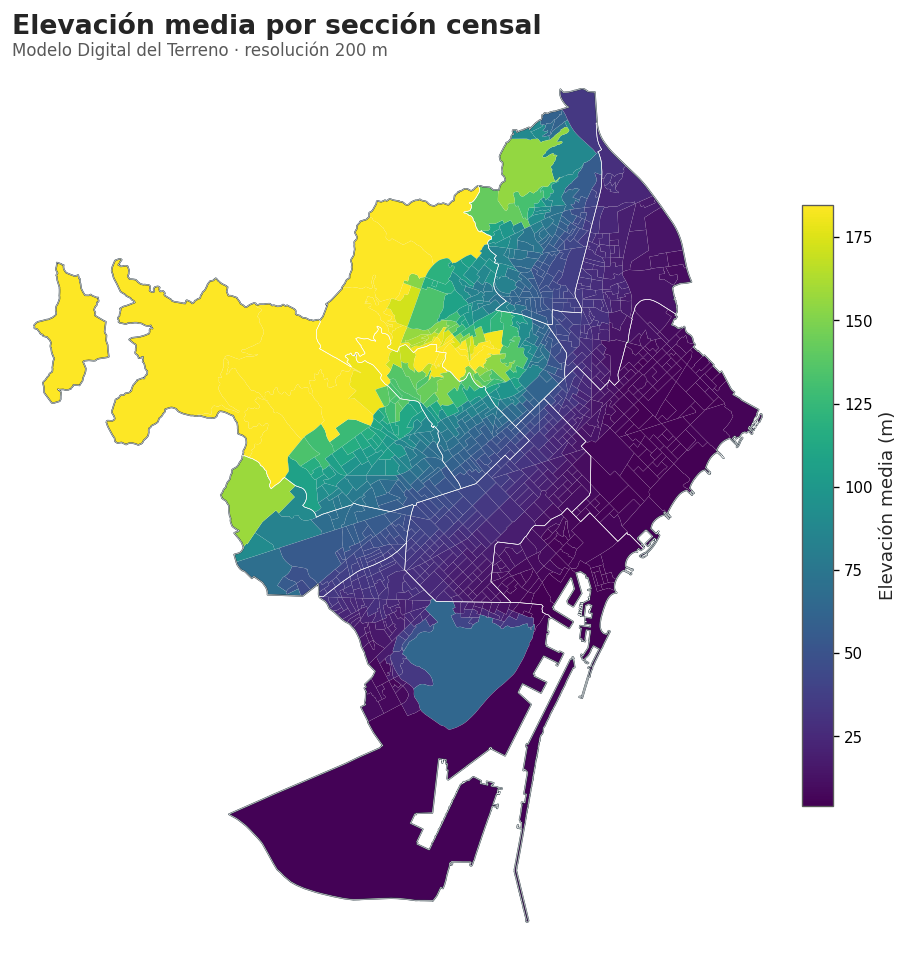


RESUMEN DEL MAPA

Secciones totales  : 1,068
Secciones válidas  : 1,068
Secciones sin dato : 0
Rango representado : 4.19 – 184.62 m

✓ Mapa de elevación media generado correctamente.
✓ Escala cromática común aplicada.
✓ Figura exportada en PNG y PDF.


In [17]:

# ============================================================
# 17. MAPA DE ELEVACIÓN MEDIA POR SECCIÓN CENSAL
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA DE ELEVACIÓN MEDIA POR SECCIÓN CENSAL")
print("=" * 100)


# ------------------------------------------------------------
# 1. BASE EXPLORATORIA
# ------------------------------------------------------------

gdf_elevacion_secciones = (
    gdf_secciones_exploracion
    .copy()
)

VARIABLE_ELEVACION = "ELEVACION_MEDIA_M"


# ------------------------------------------------------------
# 2. VALIDACIÓN DE LA VARIABLE
# ------------------------------------------------------------

if VARIABLE_ELEVACION not in gdf_elevacion_secciones.columns:

    raise KeyError(
        f"No existe la columna '{VARIABLE_ELEVACION}'. "
        "Debe calcularse previamente la elevación por sección censal."
    )


gdf_elevacion_secciones[
    VARIABLE_ELEVACION
] = (
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
)


n_total = len(
    gdf_elevacion_secciones
)

n_validos = int(
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .isna()
    .sum()
)


if n_validos == 0:

    raise ValueError(
        "La variable ELEVACION_MEDIA_M "
        "no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. RANGO VISUAL ROBUSTO
# ------------------------------------------------------------

vmin = float(
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .quantile(0.02)
)

vmax = float(
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .quantile(0.98)
)


if (
    not np.isfinite(vmin)
    or not np.isfinite(vmax)
):

    raise ValueError(
        "No se ha podido calcular "
        "un rango válido de elevación."
    )


if vmin == vmax:

    vmin = float(
        gdf_elevacion_secciones[
            VARIABLE_ELEVACION
        ]
        .min()
    )

    vmax = float(
        gdf_elevacion_secciones[
            VARIABLE_ELEVACION
        ]
        .max()
    )


# ------------------------------------------------------------
# 4. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)


# ------------------------------------------------------------
# 5. FONDO MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.plot(
    ax=ax,
    facecolor=COLOR_FONDO,
    edgecolor="none"
)


# ------------------------------------------------------------
# 6. SECCIONES SIN DATO
# ------------------------------------------------------------

gdf_elevacion_secciones[
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .isna()
].plot(
    ax=ax,
    facecolor=COLOR_NEUTRO,
    edgecolor="white",
    linewidth=0.03
)


# ------------------------------------------------------------
# 7. SECCIONES CON ELEVACIÓN
# ------------------------------------------------------------

gdf_elevacion_secciones[
    gdf_elevacion_secciones[
        VARIABLE_ELEVACION
    ]
    .notna()
].plot(
    column=VARIABLE_ELEVACION,
    cmap=CMAP_CONTINUO,
    vmin=vmin,
    vmax=vmax,
    linewidth=0.03,
    edgecolor="white",
    ax=ax
)


# ------------------------------------------------------------
# 8. LÍMITE MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.boundary.plot(
    ax=ax,
    linewidth=0.9,
    color=COLOR_OSCURO
)


# ------------------------------------------------------------
# 9. LÍMITES DE DISTRITOS
# ------------------------------------------------------------

gdf_distritos.boundary.plot(
    ax=ax,
    linewidth=0.35,
    color="white",
    alpha=0.90
)


# ------------------------------------------------------------
# 10. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap=CMAP_CONTINUO
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "Elevación media (m)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)


# ------------------------------------------------------------
# 11. CONFIGURACIÓN CARTOGRÁFICA
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Elevación media por sección censal",
    "Modelo Digital del Terreno · resolución 200 m"
)


# ------------------------------------------------------------
# 12. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "01_elevacion_media_secciones"
)


plt.show()


# ------------------------------------------------------------
# 13. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nSecciones totales  : "
    f"{n_total:,}"
)

print(
    f"Secciones válidas  : "
    f"{n_validos:,}"
)

print(
    f"Secciones sin dato : "
    f"{n_nulos:,}"
)

print(
    f"Rango representado : "
    f"{vmin:.2f} – {vmax:.2f} m"
)

print(
    "\n✓ Mapa de elevación media generado correctamente."
)

print(
    "✓ Escala cromática común aplicada."
)

print(
    "✓ Figura exportada en PNG y PDF."
)



### Resultados

El mapa de elevación media por sección censal muestra un **patrón espacial claramente estructurado**, con un marcado gradiente altimétrico desde las áreas próximas al litoral hacia los sectores interiores de mayor cota.

Las **menores elevaciones** se concentran principalmente en la franja litoral, el sector portuario y buena parte del tejido urbano central y oriental. A medida que se avanza hacia el **oeste y noroeste del municipio**, la elevación aumenta progresivamente, configurando una transición espacial continua y fácilmente identificable.

Las cotas más elevadas se localizan fundamentalmente en los sectores occidentales y noroccidentales, mientras que aparecen también **contrastes altimétricos locales** asociados a la configuración topográfica de la ciudad.

La representación mediante un rango robusto entre los **percentiles 2 y 98** permite visualizar con mayor claridad el gradiente territorial, evitando que los valores extremos condicionen excesivamente la escala cromática. Las secciones situadas por encima o por debajo de estos límites quedan representadas mediante los extremos de la escala.

En conjunto, la cartografía confirma que la **elevación presenta una estructura espacial suficientemente marcada como para ser considerada una variable explicativa relevante** en las etapas posteriores del análisis geoespacial y en el estudio de su posible relación con el tráfico y las variables ambientales.


## 18 . Mapa exploratorio de intensidad media diaria de tráfico (2018–2024)

Una vez preparada la información de aforos a nivel de estación, se analiza la **distribución espacial de la intensidad media diaria (IMD) del tráfico** en Barcelona durante el periodo 2018–2024.

Para evitar la repetición temporal de las estaciones presentes en varios años, se utiliza una única observación por punto de aforo, representada mediante su **IMD media del periodo completo**.

La intensidad del tráfico se representa simultáneamente mediante **color y tamaño de los puntos**, facilitando la identificación de las estaciones sometidas a mayores volúmenes de circulación. La escala gráfica se limita a los **percentiles 2 y 98**, reduciendo la influencia de valores extremos sobre la representación del conjunto.

El mapa mantiene la configuración cartográfica común definida para la fase exploratoria, incluyendo el **mismo encuadre municipal, límites de distrito y criterios gráficos**, lo que permitirá comparar posteriormente los patrones espaciales observados en tráfico, topografía, variables socioeconómicas y contaminación atmosférica.


MAPA EXPLORATORIO DE IMD MEDIO

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/02_IMD_medio_2018_2024.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/02_IMD_medio_2018_2024.pdf


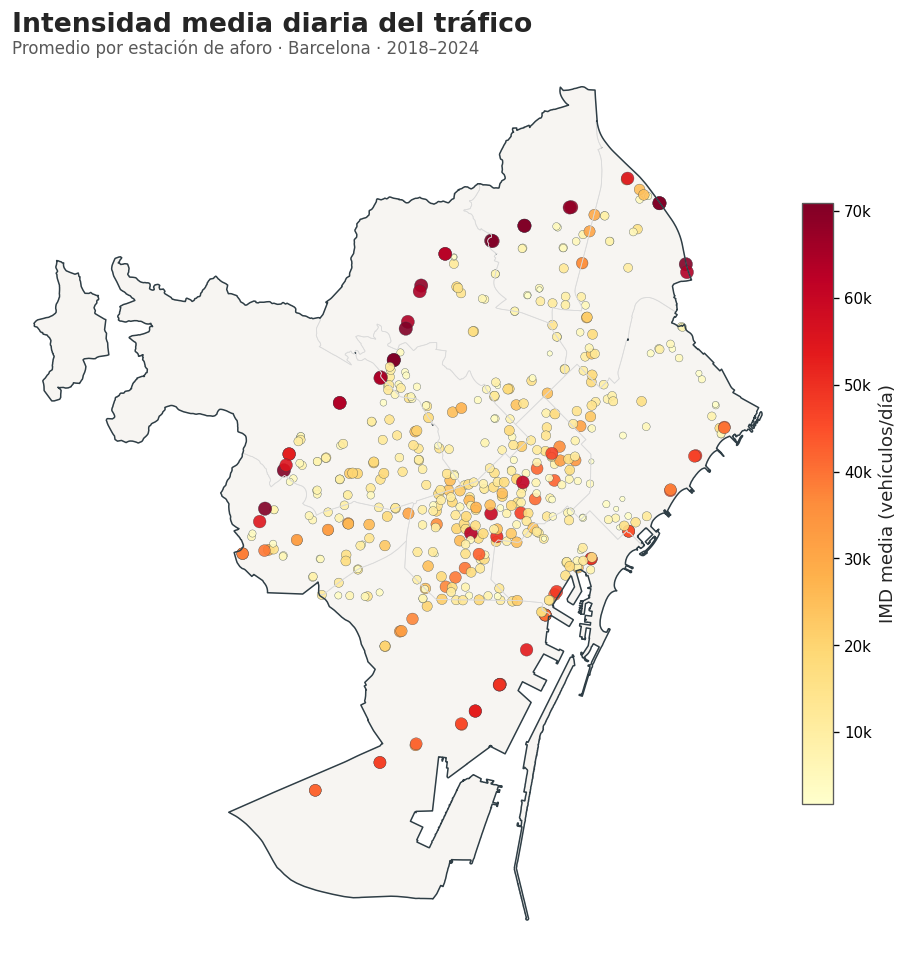


RESUMEN DEL MAPA

Estaciones representadas : 487
Percentil 2 IMD          : 1,761 vehículos/día
Percentil 98 IMD         : 70,913 vehículos/día
IMD media                : 18,316 vehículos/día
IMD mediana              : 12,064 vehículos/día

✓ Mapa exploratorio de IMD generado correctamente.
✓ Tamaño y color de los puntos representan la intensidad de tráfico.
✓ Figura exportada en PNG y PDF.


In [18]:
# ============================================================
# 18. MAPA EXPLORATORIO DE IMD MEDIO (2018–2024)
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA EXPLORATORIO DE IMD MEDIO")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

columnas_imd = [
    columna
    for columna in [
        "Id_aforament",
        "IMD_MEDIA",
        "DESC_AFORO",
        "TIPO_AFORO",
        "geometry"
    ]
    if columna in gdf_aforos_exploracion.columns
]

gdf_imd = (
    gdf_aforos_exploracion[
        columnas_imd
    ]
    .copy()
)


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_imd.empty:

    raise ValueError(
        "La capa media de aforos está vacía."
    )

if (
    gdf_imd[
        "IMD_MEDIA"
    ]
    .isna()
    .all()
):

    raise ValueError(
        "La variable IMD_MEDIA no contiene datos válidos."
    )


gdf_imd[
    "IMD_MEDIA"
] = (
    gdf_imd[
        "IMD_MEDIA"
    ]
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
)


# ------------------------------------------------------------
# 3. RANGO VISUAL ROBUSTO
# ------------------------------------------------------------

vmin = float(
    gdf_imd[
        "IMD_MEDIA"
    ]
    .quantile(0.02)
)

vmax = float(
    gdf_imd[
        "IMD_MEDIA"
    ]
    .quantile(0.98)
)


if (
    not np.isfinite(vmin)
    or not np.isfinite(vmax)
):

    raise ValueError(
        "No se ha podido calcular "
        "un rango válido de IMD."
    )


if vmin == vmax:

    vmin = float(
        gdf_imd[
            "IMD_MEDIA"
        ]
        .min()
    )

    vmax = float(
        gdf_imd[
            "IMD_MEDIA"
        ]
        .max()
    )


# ------------------------------------------------------------
# 4. TAMAÑO PROPORCIONAL DE LOS PUNTOS
# ------------------------------------------------------------

imd_normalizada = (
    gdf_imd[
        "IMD_MEDIA"
    ]
    .clip(
        lower=vmin,
        upper=vmax
    )
    - vmin
) / (
    vmax - vmin
)

gdf_imd[
    "TAMANO_PUNTO"
] = (
    10
    + 55
    * np.sqrt(
        imd_normalizada
    )
)


# ------------------------------------------------------------
# 5. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)


# ------------------------------------------------------------
# 6. FONDO MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.plot(
    ax=ax,
    facecolor=COLOR_FONDO,
    edgecolor="none"
)


# ------------------------------------------------------------
# 7. LÍMITES DE DISTRITOS
# ------------------------------------------------------------

gdf_distritos.boundary.plot(
    ax=ax,
    color=COLOR_NEUTRO,
    linewidth=0.45,
    alpha=0.90
)


# ------------------------------------------------------------
# 8. ESTACIONES DE AFORO
# ------------------------------------------------------------

gdf_imd.plot(
    column="IMD_MEDIA",
    cmap=CMAP_SECUENCIAL,
    vmin=vmin,
    vmax=vmax,
    markersize=gdf_imd[
        "TAMANO_PUNTO"
    ],
    edgecolor=COLOR_OSCURO,
    linewidth=0.20,
    alpha=0.90,
    ax=ax
)


# ------------------------------------------------------------
# 9. LÍMITE MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.boundary.plot(
    ax=ax,
    color=COLOR_OSCURO,
    linewidth=0.9
)


# ------------------------------------------------------------
# 10. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap=CMAP_SECUENCIAL
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "IMD media (vehículos/día)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)

barra.ax.yaxis.set_major_formatter(
    mpl.ticker.FuncFormatter(
        lambda valor, posicion:
        f"{valor / 1000:.0f}k"
    )
)


# ------------------------------------------------------------
# 11. CONFIGURACIÓN DEL MAPA
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Intensidad media diaria del tráfico",
    "Promedio por estación de aforo · Barcelona · 2018–2024"
)


# ------------------------------------------------------------
# 12. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "02_IMD_medio_2018_2024"
)

plt.show()


# ------------------------------------------------------------
# 13. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nEstaciones representadas : "
    f"{len(gdf_imd):,}"
)

print(
    f"Percentil 2 IMD          : "
    f"{vmin:,.0f} vehículos/día"
)

print(
    f"Percentil 98 IMD         : "
    f"{vmax:,.0f} vehículos/día"
)

print(
    f"IMD media                : "
    f"{gdf_imd['IMD_MEDIA'].mean():,.0f} vehículos/día"
)

print(
    f"IMD mediana              : "
    f"{gdf_imd['IMD_MEDIA'].median():,.0f} vehículos/día"
)

print(
    "\n✓ Mapa exploratorio de IMD generado correctamente."
)

print(
    "✓ Tamaño y color de los puntos representan "
    "la intensidad de tráfico."
)

print(
    "✓ Figura exportada en PNG y PDF."
)

### Resultados

El mapa exploratorio de intensidad media diaria permite identificar una **marcada heterogeneidad espacial del tráfico rodado en Barcelona** durante el periodo 2018–2024. Se representan **487 estaciones de aforo**, proporcionando una cobertura amplia del territorio municipal.

La IMD presenta una **media de 18.316 vehículos/día** y una **mediana de 12.064 vehículos/día**. La diferencia entre ambos estadísticos indica una distribución asimétrica, condicionada por la existencia de estaciones con intensidades de tráfico considerablemente superiores al conjunto.

Para mejorar la lectura cartográfica, la escala se ha limitado al intervalo comprendido entre los percentiles 2 y 98, correspondiente a **1.761 y 70.913 vehículos/día**, respectivamente. Esta normalización permite distinguir con mayor claridad los contrastes espaciales sin que los valores extremos condicionen la representación.

Espacialmente se observa una distribución **discontinua y vinculada a los principales ejes y accesos viarios**, con estaciones de elevada intensidad tanto en sectores periféricos como en determinados corredores interiores. Por el contrario, una parte importante de los puntos situados en el tejido urbano presenta intensidades bajas o intermedias.

La combinación de **tamaño y color proporcional a la IMD** facilita la identificación de los principales focos de intensidad circulatoria. Este patrón proporciona una base espacial especialmente relevante para analizar posteriormente la posible relación entre **tráfico rodado y contaminación atmosférica**.


## 19 . Recuperación y auditoría de la capa de contaminación

Antes de incorporar las variables de contaminación atmosférica al análisis exploratorio, se recupera y audita la **capa geoespacial de contaminación generada en las fases previas del proyecto**.

El objetivo de esta etapa es comprobar la estructura y calidad del producto existente antes de integrarlo en el pipeline geoespacial definitivo. Para ello se verifica la **disponibilidad del GeoPackage, las capas internas, el sistema de referencia espacial, el número de registros, las variables disponibles y la integridad de las geometrías**.

La auditoría permite además identificar la presencia y cobertura de las principales variables de contaminación —especialmente **NO₂, PM10 y PM2.5**— y comprobar la existencia de los identificadores espaciales y temporales necesarios para su posterior agregación y representación.

Esta comprobación se realiza inicialmente sobre el producto generado en la estructura anterior del proyecto, **sin modificarlo ni incorporarlo todavía al directorio definitivo de integración**.

El resultado permitirá determinar si la capa puede reutilizarse directamente o si requiere alguna transformación adicional antes de incorporarla al análisis exploratorio geoespacial.


In [19]:

# ============================================================
# 19. RECUPERACIÓN Y AUDITORÍA DE LA CAPA DE CONTAMINACIÓN
# ============================================================

from pathlib import Path

import geopandas as gpd
import pandas as pd

print("=" * 100)
print("RECUPERACIÓN Y AUDITORÍA DE LA CAPA DE CONTAMINACIÓN")
print("=" * 100)


# ------------------------------------------------------------
# 1. LOCALIZAR PRODUCTO DEL BORRADOR
# ------------------------------------------------------------

RUTA_CONTAMINACION_ANTIGUA = Path(
    "/content/drive/MyDrive/TFM/"
    "06_Analisis_Geoespacial/"
    "RESULTADOS/"
    "CAPAS_ENRIQUECIDAS/"
    "contaminacion_enriquecida.gpkg"
)


if not RUTA_CONTAMINACION_ANTIGUA.exists():

    raise FileNotFoundError(
        "No se encuentra la capa de contaminación:\n"
        f"{RUTA_CONTAMINACION_ANTIGUA}"
    )


print("\nArchivo localizado:")
print(RUTA_CONTAMINACION_ANTIGUA)


# ------------------------------------------------------------
# 2. IDENTIFICAR CAPAS DEL GEOPACKAGE
# ------------------------------------------------------------

capas_disponibles = (
    gpd.list_layers(
        RUTA_CONTAMINACION_ANTIGUA
    )
)

print("\nCapas disponibles:")

display(
    capas_disponibles
)


# ------------------------------------------------------------
# 3. LEER LA PRIMERA CAPA DISPONIBLE
# ------------------------------------------------------------

nombre_capa = (
    capas_disponibles
    .iloc[0]["name"]
)

gdf_contaminacion_exploracion = gpd.read_file(
    RUTA_CONTAMINACION_ANTIGUA,
    layer=nombre_capa
)


# ------------------------------------------------------------
# 4. INFORMACIÓN GENERAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("ESTRUCTURA DE LA CAPA")
print("=" * 100)

print(
    f"\nRegistros : "
    f"{len(gdf_contaminacion_exploracion):,}"
)

print(
    f"Columnas  : "
    f"{len(gdf_contaminacion_exploracion.columns):,}"
)

print(
    f"CRS       : "
    f"{gdf_contaminacion_exploracion.crs}"
)

print(
    "\nTipos de geometría:"
)

print(
    gdf_contaminacion_exploracion
    .geometry
    .geom_type
    .value_counts()
)


# ------------------------------------------------------------
# 5. AUDITORÍA DE VARIABLES
# ------------------------------------------------------------

auditoria_contaminacion = pd.DataFrame(
    {
        "VARIABLE":
            gdf_contaminacion_exploracion.columns,

        "TIPO": [
            str(
                gdf_contaminacion_exploracion[
                    columna
                ].dtype
            )
            for columna
            in gdf_contaminacion_exploracion.columns
        ],

        "NULOS": [
            int(
                gdf_contaminacion_exploracion[
                    columna
                ]
                .isna()
                .sum()
            )
            for columna
            in gdf_contaminacion_exploracion.columns
        ],

        "NULOS_%": [
            round(
                100
                * gdf_contaminacion_exploracion[
                    columna
                ]
                .isna()
                .mean(),
                2
            )
            for columna
            in gdf_contaminacion_exploracion.columns
        ]
    }
)


print("\n" + "=" * 100)
print("VARIABLES DISPONIBLES")
print("=" * 100)

display(
    auditoria_contaminacion
)


# ------------------------------------------------------------
# 6. CONTROL GEOMÉTRICO
# ------------------------------------------------------------

n_geometrias_nulas = int(
    gdf_contaminacion_exploracion
    .geometry
    .isna()
    .sum()
)

n_geometrias_vacias = int(
    gdf_contaminacion_exploracion
    .geometry
    .is_empty
    .sum()
)

n_geometrias_invalidas = int(
    (
        ~gdf_contaminacion_exploracion
        .geometry
        .is_valid
    )
    .sum()
)


print("\n" + "=" * 100)
print("CONTROL GEOMÉTRICO")
print("=" * 100)

print(
    f"\nGeometrías nulas     : "
    f"{n_geometrias_nulas:,}"
)

print(
    f"Geometrías vacías    : "
    f"{n_geometrias_vacias:,}"
)

print(
    f"Geometrías inválidas : "
    f"{n_geometrias_invalidas:,}"
)


# ------------------------------------------------------------
# 7. RESULTADO
# ------------------------------------------------------------

print(
    "\n✓ Capa de contaminación recuperada correctamente."
)

print(
    "✓ Estructura y variables auditadas."
)

print(
    "✓ Producto preparado para decidir su incorporación "
    "al pipeline geoespacial definitivo."
)



RECUPERACIÓN Y AUDITORÍA DE LA CAPA DE CONTAMINACIÓN

Archivo localizado:
/content/drive/MyDrive/TFM/06_Analisis_Geoespacial/RESULTADOS/CAPAS_ENRIQUECIDAS/contaminacion_enriquecida.gpkg

Capas disponibles:


,name,geometry_type
0,contaminacion_enriquecida,MultiLineString



ESTRUCTURA DE LA CAPA

Registros : 105,287
Columnas  : 17
CRS       : EPSG:25831

Tipos de geometría:
MultiLineString    105287
Name: count, dtype: int64

VARIABLES DISPONIBLES


,VARIABLE,TIPO,NULOS,NULOS_%
0,TRAM,object,0,0.00
1,AÑO,int64,0,0.00
2,NO2_RANGO,object,0,0.00
3,PM10_RANGO,object,0,0.00
4,PM25_RANGO,object,0,0.00
5,NO2_VALOR,float64,0,0.00
6,PM10_VALOR,float64,0,0.00
7,PM25_VALOR,float64,0,0.00
8,NO2_MIN,float64,0,0.00
9,PM10_MIN,float64,0,0.00



CONTROL GEOMÉTRICO

Geometrías nulas     : 0
Geometrías vacías    : 0
Geometrías inválidas : 0

✓ Capa de contaminación recuperada correctamente.
✓ Estructura y variables auditadas.
✓ Producto preparado para decidir su incorporación al pipeline geoespacial definitivo.


### Resultados

La recuperación de la capa geoespacial de contaminación ha permitido disponer de **105.287 registros y 17 variables**, representados mediante geometrías `MultiLineString` y referenciados en **EPSG:25831**, coincidente con el sistema de referencia adoptado para la integración geoespacial.

La capa conserva la dimensión **espaciotemporal por tramo y año**, mediante las variables `TRAM` y `AÑO`, e incluye los indicadores necesarios para caracterizar los principales contaminantes analizados: **NO₂, PM10 y PM2.5**. Las variables `NO2_VALOR`, `PM10_VALOR` y `PM25_VALOR` presentan **cobertura completa, sin valores nulos**, permitiendo su utilización directa en el análisis exploratorio.

La variable altimétrica `ELEVACION_M` presenta **798 valores ausentes, equivalentes al 0,76 % de los registros**. Esta incidencia no afecta a la representación espacial de los contaminantes, aunque deberá considerarse posteriormente en los análisis que incorporen conjuntamente contaminación y elevación.

El control de calidad geométrica no detecta incidencias: la capa presenta **0 geometrías nulas, 0 geometrías vacías y 0 geometrías inválidas**, confirmando su integridad espacial.

En conjunto, la auditoría confirma que la capa recuperada es **adecuada para su incorporación al análisis exploratorio geoespacial**, permitiendo construir posteriormente los valores medios por tramo para el periodo **2018–2024** y analizar la distribución espacial de NO₂, PM10 y PM2.5.


## 20 . Preparación de la base exploratoria de contaminación media (2018–2024)

Una vez recuperada y validada la capa geoespacial de contaminación, se construye una **base exploratoria agregada por tramo urbano** para caracterizar la exposición media durante el periodo 2018–2024.

Los registros originales conservan información anual para cada tramo, por lo que se calculan las **concentraciones medias de NO₂, PM10 y PM2.5** a lo largo del periodo completo. Cada tramo queda así representado mediante una única geometría y un valor medio para cada contaminante.

Además de las concentraciones medias, se mantienen indicadores de **cobertura temporal** (`N_ANIOS` y `N_REGISTROS`) que permiten conocer la cantidad de información disponible para cada tramo. Se define también la variable `COBERTURA_COMPLETA`, que identifica aquellos tramos con información correspondiente a los **siete años comprendidos entre 2018 y 2024**.

Esta comprobación resulta especialmente importante para evitar que diferencias en la disponibilidad temporal de los datos sean interpretadas posteriormente como diferencias exclusivamente espaciales en los niveles de contaminación.

La base resultante constituye la **unidad espacial de referencia para la cartografía exploratoria de NO₂, PM10 y PM2.5**, manteniendo el sistema de referencia y las geometrías previamente validadas.


In [20]:

# ============================================================
# 20. PREPARACIÓN DE LA BASE EXPLORATORIA DE CONTAMINACIÓN
#     MEDIA 2018–2024
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("PREPARACIÓN DE LA BASE EXPLORATORIA DE CONTAMINACIÓN")
print("=" * 100)


# ------------------------------------------------------------
# 1. COPIA DE TRABAJO
# ------------------------------------------------------------

gdf_contaminacion_trabajo = (
    gdf_contaminacion_exploracion
    .copy()
)


# ------------------------------------------------------------
# 2. VALIDACIÓN DE VARIABLES NECESARIAS
# ------------------------------------------------------------

columnas_necesarias = [
    "TRAM",
    "AÑO",
    "NO2_VALOR",
    "PM10_VALOR",
    "PM25_VALOR",
    "geometry"
]

columnas_faltantes = [
    columna
    for columna in columnas_necesarias
    if columna not in gdf_contaminacion_trabajo.columns
]

if columnas_faltantes:

    raise KeyError(
        "Faltan las siguientes variables necesarias: "
        + ", ".join(columnas_faltantes)
    )


# ------------------------------------------------------------
# 3. CONTROL DEL PERIODO TEMPORAL
# ------------------------------------------------------------

gdf_contaminacion_trabajo["AÑO"] = pd.to_numeric(
    gdf_contaminacion_trabajo["AÑO"],
    errors="coerce"
)

gdf_contaminacion_trabajo = (
    gdf_contaminacion_trabajo[
        gdf_contaminacion_trabajo["AÑO"]
        .between(2018, 2024)
    ]
    .copy()
)

if gdf_contaminacion_trabajo.empty:

    raise ValueError(
        "No existen registros de contaminación "
        "para el periodo 2018–2024."
    )


# ------------------------------------------------------------
# 4. ASEGURAR VARIABLES NUMÉRICAS
# ------------------------------------------------------------

variables_contaminacion = [
    "NO2_VALOR",
    "PM10_VALOR",
    "PM25_VALOR"
]

for variable in variables_contaminacion:

    gdf_contaminacion_trabajo[variable] = pd.to_numeric(
        gdf_contaminacion_trabajo[variable],
        errors="coerce"
    )

    gdf_contaminacion_trabajo[variable] = (
        gdf_contaminacion_trabajo[variable]
        .replace(
            [np.inf, -np.inf],
            np.nan
        )
    )


# ------------------------------------------------------------
# 5. GEOMETRÍA REPRESENTATIVA POR TRAMO
# ------------------------------------------------------------

geometrias_tramos = (
    gdf_contaminacion_trabajo[
        [
            "TRAM",
            "geometry"
        ]
    ]
    .drop_duplicates(
        subset="TRAM"
    )
    .copy()
)


# ------------------------------------------------------------
# 6. AGREGACIÓN 2018–2024 POR TRAMO
# ------------------------------------------------------------

df_contaminacion_media = (
    gdf_contaminacion_trabajo
    .groupby(
        "TRAM",
        as_index=False
    )
    .agg(
        NO2_MEDIA_2018_2024=(
            "NO2_VALOR",
            "mean"
        ),
        PM10_MEDIA_2018_2024=(
            "PM10_VALOR",
            "mean"
        ),
        PM25_MEDIA_2018_2024=(
            "PM25_VALOR",
            "mean"
        ),
        N_ANIOS=(
            "AÑO",
            "nunique"
        ),
        N_REGISTROS=(
            "AÑO",
            "size"
        )
    )
)


# ------------------------------------------------------------
# 7. CONSTRUIR GEODATAFRAME EXPLORATORIO
# ------------------------------------------------------------

gdf_contaminacion_media = gpd.GeoDataFrame(
    df_contaminacion_media.merge(
        geometrias_tramos,
        on="TRAM",
        how="left"
    ),
    geometry="geometry",
    crs=gdf_contaminacion_trabajo.crs
)


# ------------------------------------------------------------
# 8. CONTROL DE COBERTURA TEMPORAL
# ------------------------------------------------------------

gdf_contaminacion_media[
    "COBERTURA_COMPLETA"
] = (
    gdf_contaminacion_media[
        "N_ANIOS"
    ] == 7
)


# ------------------------------------------------------------
# 9. VALIDACIÓN DE LA BASE RESULTANTE
# ------------------------------------------------------------

resumen_contaminacion_media = pd.DataFrame(
    {
        "INDICADOR": [
            "Registros originales 2018–2024",
            "Tramos únicos",
            "CRS",
            "Geometrías nulas",
            "Geometrías inválidas",
            "Tramos con 7 años",
            "Tramos con cobertura incompleta",
            "NO2 medios válidos",
            "PM10 medios válidos",
            "PM2.5 medios válidos"
        ],
        "VALOR": [
            len(gdf_contaminacion_trabajo),
            len(gdf_contaminacion_media),
            str(gdf_contaminacion_media.crs),
            int(
                gdf_contaminacion_media
                .geometry
                .isna()
                .sum()
            ),
            int(
                (
                    ~gdf_contaminacion_media
                    .geometry
                    .is_valid
                )
                .sum()
            ),
            int(
                gdf_contaminacion_media[
                    "COBERTURA_COMPLETA"
                ]
                .sum()
            ),
            int(
                (
                    ~gdf_contaminacion_media[
                        "COBERTURA_COMPLETA"
                    ]
                )
                .sum()
            ),
            int(
                gdf_contaminacion_media[
                    "NO2_MEDIA_2018_2024"
                ]
                .notna()
                .sum()
            ),
            int(
                gdf_contaminacion_media[
                    "PM10_MEDIA_2018_2024"
                ]
                .notna()
                .sum()
            ),
            int(
                gdf_contaminacion_media[
                    "PM25_MEDIA_2018_2024"
                ]
                .notna()
                .sum()
            )
        ]
    }
)

display(
    resumen_contaminacion_media
)


# ------------------------------------------------------------
# 10. DISTRIBUCIÓN DE LA COBERTURA TEMPORAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("COBERTURA TEMPORAL POR TRAMO")
print("=" * 100)

cobertura_temporal = (
    gdf_contaminacion_media[
        "N_ANIOS"
    ]
    .value_counts()
    .sort_index()
    .rename_axis(
        "N_AÑOS"
    )
    .reset_index(
        name="N_TRAMOS"
    )
)

cobertura_temporal[
    "PORCENTAJE"
] = (
    100
    * cobertura_temporal[
        "N_TRAMOS"
    ]
    / len(gdf_contaminacion_media)
).round(2)

display(
    cobertura_temporal
)


# ------------------------------------------------------------
# 11. RESUMEN FINAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESULTADO")
print("=" * 100)

print(
    f"\nTramos resultantes           : "
    f"{len(gdf_contaminacion_media):,}"
)

print(
    f"Tramos con cobertura completa: "
    f"{gdf_contaminacion_media['COBERTURA_COMPLETA'].sum():,}"
)

print(
    f"Tramos cobertura incompleta  : "
    f"{(~gdf_contaminacion_media['COBERTURA_COMPLETA']).sum():,}"
)

print(
    "\n✓ Contaminación agregada por tramo para 2018–2024."
)

print(
    "✓ NO₂, PM10 y PM2.5 preparados para cartografía."
)

print(
    "✓ Cobertura temporal conservada como variable de control."
)

print(
    "✓ Base exploratoria de contaminación preparada correctamente."
)



PREPARACIÓN DE LA BASE EXPLORATORIA DE CONTAMINACIÓN


,INDICADOR,VALOR
0,Registros originales 2018–2024,105287
1,Tramos únicos,15041
2,CRS,EPSG:25831
3,Geometrías nulas,0
4,Geometrías inválidas,0
5,Tramos con 7 años,15041
6,Tramos con cobertura incompleta,0
7,NO2 medios válidos,15041
8,PM10 medios válidos,15041
9,PM2.5 medios válidos,15041



COBERTURA TEMPORAL POR TRAMO


,N_AÑOS,N_TRAMOS,PORCENTAJE
0,7,15041,100.0



RESULTADO

Tramos resultantes           : 15,041
Tramos con cobertura completa: 15,041
Tramos cobertura incompleta  : 0

✓ Contaminación agregada por tramo para 2018–2024.
✓ NO₂, PM10 y PM2.5 preparados para cartografía.
✓ Cobertura temporal conservada como variable de control.
✓ Base exploratoria de contaminación preparada correctamente.


### Resultados

La base exploratoria de contaminación para el periodo **2018–2024** se ha construido correctamente a partir de **105.287 registros anuales**, obteniéndose **15.041 tramos urbanos únicos**.

La cobertura temporal es completa en toda la red analizada: los **15.041 tramos disponen de información para los siete años del periodo**, sin ningún tramo con cobertura incompleta. Esto garantiza que las medias calculadas para NO₂, PM10 y PM2.5 son temporalmente comparables entre sí y no están condicionadas por diferencias en la disponibilidad anual de los datos.

La agregación ha generado valores medios válidos para los **15.041 tramos** en los tres contaminantes considerados: **NO₂, PM10 y PM2.5**, manteniendo además la geometría original de cada tramo y el sistema de referencia **EPSG:25831**.

No se han detectado geometrías nulas ni inválidas en la base resultante, por lo que la estructura espacial queda completamente preservada después de la agregación temporal.

En consecuencia, la contaminación atmosférica queda representada mediante una **base espacial homogénea, completa y comparable para 2018–2024**, preparada para la cartografía exploratoria individual de NO₂, PM10 y PM2.5 y para los análisis multivariantes posteriores.


## 21 . Mapa exploratorio de NO₂ medio (2018–2024)

Una vez construida la base de contaminación agregada por tramo, se analiza la **distribución espacial de la concentración media de dióxido de nitrógeno (NO₂)** en la red viaria de Barcelona durante el periodo 2018–2024.

El NO₂ constituye un indicador especialmente relevante en entornos urbanos por su estrecha vinculación con las **emisiones procedentes del tráfico rodado**, por lo que su representación permite realizar una primera identificación visual de los sectores de la ciudad sometidos a una mayor presión asociada a la movilidad.

Para cada uno de los **15.041 tramos urbanos** se utiliza la concentración media calculada para el conjunto del periodo. La cobertura temporal completa de los siete años garantiza la comparabilidad espacial entre los distintos tramos.

La representación utiliza una **escala cromática secuencial de verde a rojo**, reservando las tonalidades más cálidas para las concentraciones más elevadas. Para evitar que valores extremos condicionen excesivamente la lectura cartográfica, el rango visual se limita a los **percentiles 2 y 98**, conservándose los valores originales para los análisis estadísticos posteriores.

Este mapa constituye una primera aproximación a la **estructura espacial de la contaminación asociada al NO₂** y servirá posteriormente para estudiar su relación con la intensidad del tráfico, la estructura urbana, los usos del suelo, las características socioeconómicas y la topografía.


MAPA EXPLORATORIO DE NO₂ MEDIO (2018–2024)

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/03_NO2_medio_2018_2024.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/03_NO2_medio_2018_2024.pdf


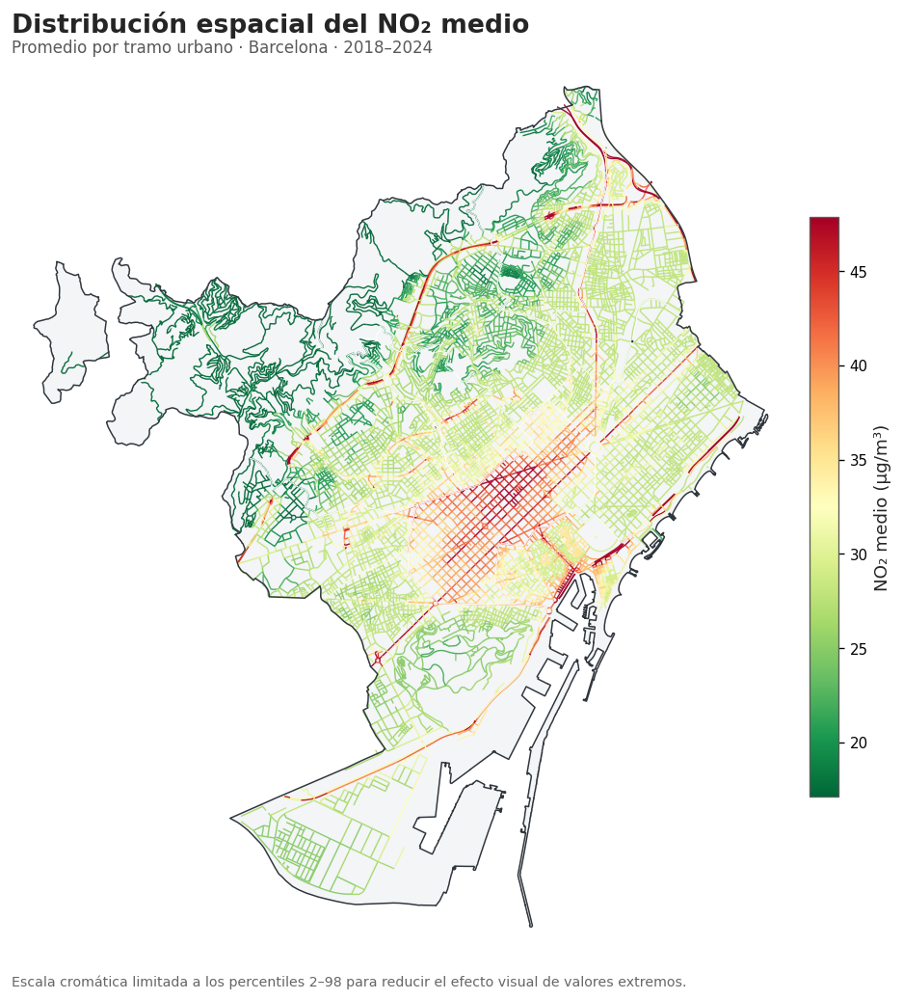


RESUMEN DEL MAPA

Tramos representados : 15,041
Tramos sin dato      : 0

NO₂ mínimo           : 12.86 µg/m³
Percentil 2          : 17.14 µg/m³
NO₂ medio            : 29.16 µg/m³
NO₂ mediano          : 27.86 µg/m³
Percentil 98         : 47.86 µg/m³
NO₂ máximo           : 70.00 µg/m³

✓ Mapa exploratorio de NO₂ generado correctamente.
✓ Se representan los valores medios por tramo para 2018–2024.
✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial.
✓ Figura exportada en PNG y PDF.


In [21]:

# ============================================================
# 21. MAPA EXPLORATORIO DE NO₂ MEDIO (2018–2024)
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA EXPLORATORIO DE NO₂ MEDIO (2018–2024)")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

VARIABLE_NO2 = "NO2_MEDIA_2018_2024"

gdf_no2 = gdf_contaminacion_media[
    [
        "TRAM",
        VARIABLE_NO2,
        "N_ANIOS",
        "COBERTURA_COMPLETA",
        "geometry"
    ]
].copy()


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_no2.empty:
    raise ValueError(
        "La base exploratoria de contaminación está vacía."
    )

if VARIABLE_NO2 not in gdf_no2.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_NO2}'. "
        "Ejecuta previamente la celda 21."
    )

gdf_no2[VARIABLE_NO2] = (
    gdf_no2[VARIABLE_NO2]
    .replace([np.inf, -np.inf], np.nan)
)

n_total = len(gdf_no2)

n_validos = int(
    gdf_no2[VARIABLE_NO2]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_no2[VARIABLE_NO2]
    .isna()
    .sum()
)

if n_validos == 0:
    raise ValueError(
        "La variable de NO₂ medio no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. ESTADÍSTICAS DESCRIPTIVAS
# ------------------------------------------------------------

media_no2 = float(
    gdf_no2[VARIABLE_NO2].mean()
)

mediana_no2 = float(
    gdf_no2[VARIABLE_NO2].median()
)

p02_no2 = float(
    gdf_no2[VARIABLE_NO2].quantile(0.02)
)

p98_no2 = float(
    gdf_no2[VARIABLE_NO2].quantile(0.98)
)

min_no2 = float(
    gdf_no2[VARIABLE_NO2].min()
)

max_no2 = float(
    gdf_no2[VARIABLE_NO2].max()
)


# ------------------------------------------------------------
# 4. RANGO CARTOGRÁFICO ROBUSTO
# ------------------------------------------------------------

vmin = p02_no2
vmax = p98_no2

if not np.isfinite(vmin) or not np.isfinite(vmax):
    raise ValueError(
        "No se ha podido determinar un rango cartográfico válido."
    )

if vmin == vmax:
    vmin = min_no2
    vmax = max_no2


# ------------------------------------------------------------
# 5. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)

# Fondo municipal

gdf_municipio.plot(
    ax=ax,
    facecolor="#f3f5f7",
    edgecolor="none"
)

# Red de tramos coloreada por NO₂

gdf_no2[
    gdf_no2[VARIABLE_NO2].notna()
].plot(
    column=VARIABLE_NO2,
    cmap="RdYlGn_r",
    vmin=vmin,
    vmax=vmax,
    linewidth=0.85,
    alpha=0.95,
    ax=ax
)

# Límites de distrito

gdf_distritos.boundary.plot(
    ax=ax,
    color="white",
    linewidth=0.45,
    alpha=0.85
)

# Límite municipal

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 6. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap="RdYlGn_r"
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "NO₂ medio (µg/m³)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)


# ------------------------------------------------------------
# 7. CONFIGURACIÓN CARTOGRÁFICA COMÚN
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Distribución espacial del NO₂ medio",
    "Promedio por tramo urbano · Barcelona · 2018–2024"
)


# ------------------------------------------------------------
# 8. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Escala cromática limitada a los percentiles 2–98 "
        "para reducir el efecto visual de valores extremos."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 9. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "03_NO2_medio_2018_2024"
)

plt.show()


# ------------------------------------------------------------
# 10. RESUMEN
# ------------------------------------------------------------

resumen_mapa_no2 = {
    "Tramos representados": n_validos,
    "Tramos sin dato": n_nulos,
    "NO2 mínimo": round(min_no2, 2),
    "Percentil 2": round(p02_no2, 2),
    "NO2 medio": round(media_no2, 2),
    "NO2 mediano": round(mediana_no2, 2),
    "Percentil 98": round(p98_no2, 2),
    "NO2 máximo": round(max_no2, 2)
}

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nTramos representados : {n_validos:,}"
)

print(
    f"Tramos sin dato      : {n_nulos:,}"
)

print(
    f"\nNO₂ mínimo           : {min_no2:.2f} µg/m³"
)

print(
    f"Percentil 2          : {p02_no2:.2f} µg/m³"
)

print(
    f"NO₂ medio            : {media_no2:.2f} µg/m³"
)

print(
    f"NO₂ mediano          : {mediana_no2:.2f} µg/m³"
)

print(
    f"Percentil 98         : {p98_no2:.2f} µg/m³"
)

print(
    f"NO₂ máximo           : {max_no2:.2f} µg/m³"
)

print(
    "\n✓ Mapa exploratorio de NO₂ generado correctamente."
)

print(
    "✓ Se representan los valores medios por tramo para 2018–2024."
)

print(
    "✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial."
)

print(
    "✓ Figura exportada en PNG y PDF."
)



### Resultados

La distribución espacial del NO₂ medio presenta una marcada heterogeneidad dentro del municipio de Barcelona. Para los **15.041 tramos analizados** se dispone de valores válidos, obteniéndose una cobertura espacial completa de la red considerada.

La concentración media durante el periodo 2018–2024 es de **29,16 µg/m³**, con una mediana de **27,86 µg/m³**. Los valores observados oscilan entre **12,86 y 70,00 µg/m³**, mientras que el intervalo comprendido entre los percentiles 2 y 98 se sitúa entre **17,14 y 47,86 µg/m³**.

Cartográficamente se observa una concentración de los valores más elevados en la **trama urbana central y a lo largo de determinados ejes viarios**, frente a niveles generalmente inferiores en sectores periféricos. El patrón obtenido sugiere, por tanto, la existencia de una estructura espacial definida que deberá contrastarse posteriormente con la **intensidad del tráfico, los usos del suelo, la densidad de población, las condiciones socioeconómicas y las características topográficas**.

La representación mediante el intervalo P2–P98 permite mejorar la discriminación espacial de las concentraciones sin modificar los valores empleados en los análisis estadísticos posteriores.

**Esta figura sí tiene calidad para la memoria del TFM.** Además, empieza a verse muy claramente por qué la Fase 3 va a ser interesante: visualmente ya tenemos patrones que después podremos intentar explicar estadísticamente.


## 22 . Mapa exploratorio de PM10 medio (2018–2024)

Tras el análisis de la distribución espacial del NO₂, se estudia la **concentración media de partículas PM10** en los tramos urbanos de Barcelona durante el periodo 2018–2024.

Las partículas PM10 presentan un origen más diverso que el NO₂, al estar relacionadas tanto con las **emisiones directas del tráfico** como con procesos de resuspensión de partículas, actividades urbanas y otras fuentes ambientales. Su análisis permite, por tanto, complementar la información proporcionada por el NO₂ y caracterizar diferentes componentes de la contaminación atmosférica urbana.

Para cada uno de los **15.041 tramos urbanos** se representa la concentración media obtenida a partir de los siete años del periodo de estudio. La disponibilidad de información para la totalidad de los tramos y años garantiza una base espacial y temporal homogénea.

Se mantiene la misma **escala cromática verde–amarillo–rojo** utilizada para el NO₂, de forma que las tonalidades cálidas identifican mayores concentraciones. Asimismo, la representación se limita visualmente a los **percentiles 2 y 98**, evitando que los valores extremos reduzcan la capacidad de distinguir los patrones espaciales predominantes.

La comparación posterior de la distribución de PM10 con la correspondiente al NO₂ y PM2.5 permitirá determinar si los distintos contaminantes presentan **patrones espaciales coincidentes o diferenciados** y estudiar su relación con el tráfico, los usos del suelo, la estructura socioeconómica, la densidad urbana y las características topográficas.


MAPA EXPLORATORIO DE PM10 MEDIO (2018–2024)

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/04_PM10_medio_2018_2024.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/04_PM10_medio_2018_2024.pdf


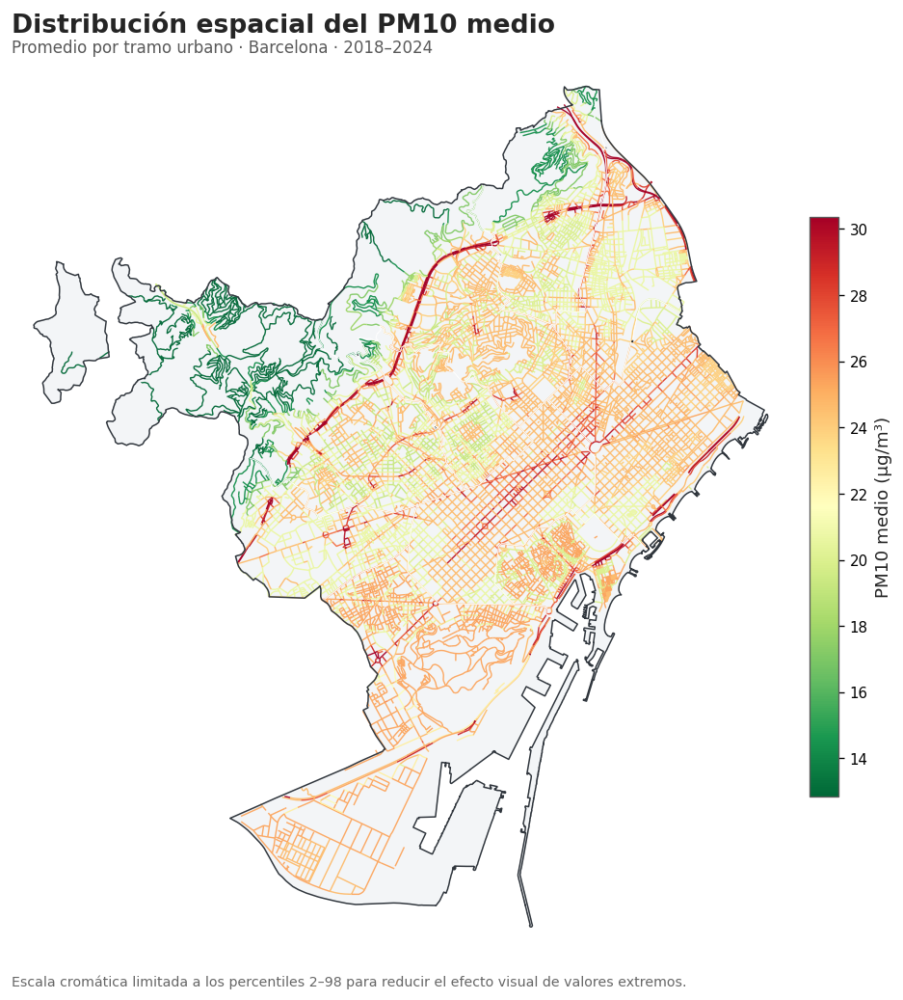


RESUMEN DEL MAPA

Tramos representados : 15,041
Tramos sin dato      : 0

PM10 mínimo          : 10.00 µg/m³
Percentil 2          : 12.86 µg/m³
PM10 medio           : 23.15 µg/m³
PM10 mediano         : 24.64 µg/m³
Percentil 98         : 30.36 µg/m³
PM10 máximo          : 40.00 µg/m³

✓ Mapa exploratorio de PM10 generado correctamente.
✓ Se representan los valores medios por tramo para 2018–2024.
✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial.
✓ Figura exportada en PNG y PDF.


In [22]:

# ============================================================
# 22. MAPA EXPLORATORIO DE PM10 MEDIO (2018–2024)
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA EXPLORATORIO DE PM10 MEDIO (2018–2024)")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

VARIABLE_PM10 = "PM10_MEDIA_2018_2024"

gdf_pm10 = gdf_contaminacion_media[
    [
        "TRAM",
        VARIABLE_PM10,
        "N_ANIOS",
        "COBERTURA_COMPLETA",
        "geometry"
    ]
].copy()


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_pm10.empty:
    raise ValueError(
        "La base exploratoria de contaminación está vacía."
    )

if VARIABLE_PM10 not in gdf_pm10.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_PM10}'. "
        "Ejecuta previamente la celda 21."
    )

gdf_pm10[VARIABLE_PM10] = (
    gdf_pm10[VARIABLE_PM10]
    .replace([np.inf, -np.inf], np.nan)
)

n_total = len(gdf_pm10)

n_validos = int(
    gdf_pm10[VARIABLE_PM10]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_pm10[VARIABLE_PM10]
    .isna()
    .sum()
)

if n_validos == 0:
    raise ValueError(
        "La variable de PM10 medio no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. ESTADÍSTICAS DESCRIPTIVAS
# ------------------------------------------------------------

media_pm10 = float(
    gdf_pm10[VARIABLE_PM10].mean()
)

mediana_pm10 = float(
    gdf_pm10[VARIABLE_PM10].median()
)

p02_pm10 = float(
    gdf_pm10[VARIABLE_PM10].quantile(0.02)
)

p98_pm10 = float(
    gdf_pm10[VARIABLE_PM10].quantile(0.98)
)

min_pm10 = float(
    gdf_pm10[VARIABLE_PM10].min()
)

max_pm10 = float(
    gdf_pm10[VARIABLE_PM10].max()
)


# ------------------------------------------------------------
# 4. RANGO CARTOGRÁFICO ROBUSTO
# ------------------------------------------------------------

vmin = p02_pm10
vmax = p98_pm10

if not np.isfinite(vmin) or not np.isfinite(vmax):
    raise ValueError(
        "No se ha podido determinar un rango cartográfico válido."
    )

if vmin == vmax:
    vmin = min_pm10
    vmax = max_pm10


# ------------------------------------------------------------
# 5. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)

# Fondo municipal

gdf_municipio.plot(
    ax=ax,
    facecolor="#f3f5f7",
    edgecolor="none"
)

# Red de tramos coloreada por PM10

gdf_pm10[
    gdf_pm10[VARIABLE_PM10].notna()
].plot(
    column=VARIABLE_PM10,
    cmap="RdYlGn_r",
    vmin=vmin,
    vmax=vmax,
    linewidth=0.85,
    alpha=0.95,
    ax=ax
)

# Límites de distrito

gdf_distritos.boundary.plot(
    ax=ax,
    color="white",
    linewidth=0.45,
    alpha=0.85
)

# Límite municipal

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 6. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap="RdYlGn_r"
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "PM10 medio (µg/m³)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)


# ------------------------------------------------------------
# 7. CONFIGURACIÓN CARTOGRÁFICA COMÚN
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Distribución espacial del PM10 medio",
    "Promedio por tramo urbano · Barcelona · 2018–2024"
)


# ------------------------------------------------------------
# 8. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Escala cromática limitada a los percentiles 2–98 "
        "para reducir el efecto visual de valores extremos."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 9. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "04_PM10_medio_2018_2024"
)

plt.show()


# ------------------------------------------------------------
# 10. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nTramos representados : {n_validos:,}"
)

print(
    f"Tramos sin dato      : {n_nulos:,}"
)

print(
    f"\nPM10 mínimo          : {min_pm10:.2f} µg/m³"
)

print(
    f"Percentil 2          : {p02_pm10:.2f} µg/m³"
)

print(
    f"PM10 medio           : {media_pm10:.2f} µg/m³"
)

print(
    f"PM10 mediano         : {mediana_pm10:.2f} µg/m³"
)

print(
    f"Percentil 98         : {p98_pm10:.2f} µg/m³"
)

print(
    f"PM10 máximo          : {max_pm10:.2f} µg/m³"
)

print(
    "\n✓ Mapa exploratorio de PM10 generado correctamente."
)

print(
    "✓ Se representan los valores medios por tramo para 2018–2024."
)

print(
    "✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial."
)

print(
    "✓ Figura exportada en PNG y PDF."
)




### Resultados

La concentración media de PM10 presenta una distribución espacial heterogénea en Barcelona, aunque con un patrón menos contrastado que el observado previamente para el NO₂. Los **15.041 tramos urbanos analizados disponen de valores válidos**, manteniéndose una cobertura espacial completa.

La concentración media para el periodo 2018–2024 es de **23,15 µg/m³**, mientras que la mediana alcanza **24,64 µg/m³**. Los valores oscilan entre **10,00 y 40,00 µg/m³**, situándose el intervalo comprendido entre los percentiles 2 y 98 entre **12,86 y 30,36 µg/m³**.

La representación cartográfica muestra concentraciones relativamente elevadas en diferentes sectores de la trama urbana y en determinados corredores viarios, mientras que los valores inferiores presentan una mayor presencia en áreas periféricas. En comparación visual con el NO₂, el PM10 muestra una **distribución espacial más extendida y menos polarizada**, lo que sugiere que ambos contaminantes no reproducen exactamente el mismo patrón territorial.

Estas diferencias serán analizadas posteriormente mediante técnicas estadísticas y espaciales, relacionando las concentraciones de los distintos contaminantes con la **intensidad del tráfico, los usos del suelo, la densidad de población, las características socioeconómicas y la elevación**.



## 23 . Mapa exploratorio de PM2.5 medio (2018–2024)

Como tercer contaminante atmosférico se analiza la **distribución espacial de la concentración media de partículas finas PM2.5** en los tramos urbanos de Barcelona durante el periodo 2018–2024.

Las PM2.5 constituyen una fracción especialmente relevante de la contaminación atmosférica debido a su reducido tamaño y a la diversidad de sus fuentes. Su comportamiento espacial puede diferir del observado para el NO₂ y las PM10, por lo que su incorporación permite completar la caracterización exploratoria de la contaminación particulada en el área de estudio.

Para cada uno de los **15.041 tramos urbanos** se representa la concentración media correspondiente al conjunto del periodo. La disponibilidad de información durante los siete años permite mantener una **cobertura temporal homogénea y directamente comparable** entre los diferentes tramos de la red.

Se conserva la misma convención gráfica empleada para NO₂ y PM10, utilizando una **escala cromática verde–amarillo–rojo**, en la que las tonalidades cálidas representan concentraciones superiores. El rango cartográfico se limita a los **percentiles 2 y 98** para reducir la influencia visual de los valores extremos sin modificar los datos utilizados en los análisis posteriores.

La comparación conjunta de los mapas de **NO₂, PM10 y PM2.5** permitirá identificar similitudes y diferencias en sus patrones territoriales y proporcionará una primera base para estudiar posteriormente su relación con el **tráfico, los usos del suelo, la densidad urbana, las características socioeconómicas y la topografía**.


MAPA EXPLORATORIO DE PM2.5 MEDIO (2018–2024)

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/05_PM25_medio_2018_2024.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/05_PM25_medio_2018_2024.pdf


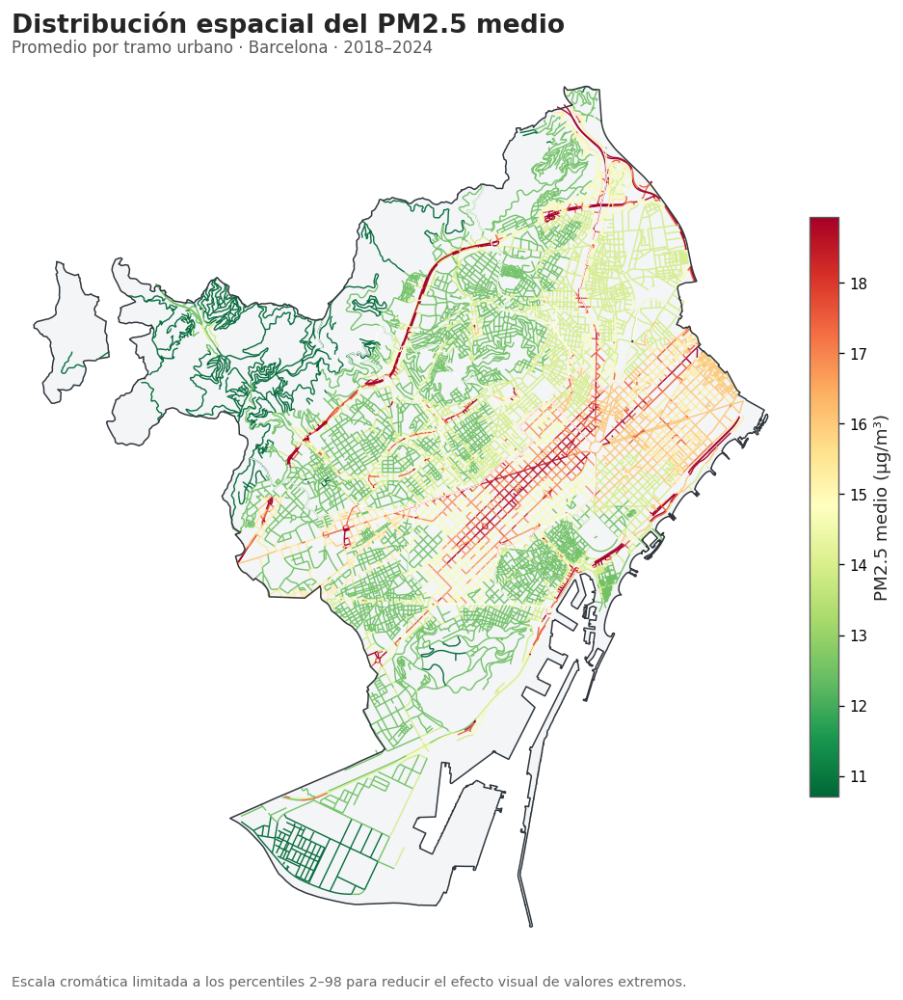


RESUMEN DEL MAPA

Tramos representados : 15,041
Tramos sin dato      : 0

PM2.5 mínimo         : 8.57 µg/m³
Percentil 2          : 10.71 µg/m³
PM2.5 medio          : 13.89 µg/m³
PM2.5 mediano        : 13.93 µg/m³
Percentil 98         : 18.93 µg/m³
PM2.5 máximo         : 25.00 µg/m³

✓ Mapa exploratorio de PM2.5 generado correctamente.
✓ Se representan los valores medios por tramo para 2018–2024.
✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial.
✓ Figura exportada en PNG y PDF.


In [23]:

# ============================================================
# 23. MAPA EXPLORATORIO DE PM2.5 MEDIO (2018–2024)
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA EXPLORATORIO DE PM2.5 MEDIO (2018–2024)")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

VARIABLE_PM25 = "PM25_MEDIA_2018_2024"

gdf_pm25 = gdf_contaminacion_media[
    [
        "TRAM",
        VARIABLE_PM25,
        "N_ANIOS",
        "COBERTURA_COMPLETA",
        "geometry"
    ]
].copy()


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_pm25.empty:
    raise ValueError(
        "La base exploratoria de contaminación está vacía."
    )

if VARIABLE_PM25 not in gdf_pm25.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_PM25}'. "
        "Ejecuta previamente la celda 21."
    )

gdf_pm25[VARIABLE_PM25] = (
    gdf_pm25[VARIABLE_PM25]
    .replace([np.inf, -np.inf], np.nan)
)

n_total = len(gdf_pm25)

n_validos = int(
    gdf_pm25[VARIABLE_PM25]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_pm25[VARIABLE_PM25]
    .isna()
    .sum()
)

if n_validos == 0:
    raise ValueError(
        "La variable de PM2.5 medio no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. ESTADÍSTICAS DESCRIPTIVAS
# ------------------------------------------------------------

media_pm25 = float(
    gdf_pm25[VARIABLE_PM25].mean()
)

mediana_pm25 = float(
    gdf_pm25[VARIABLE_PM25].median()
)

p02_pm25 = float(
    gdf_pm25[VARIABLE_PM25].quantile(0.02)
)

p98_pm25 = float(
    gdf_pm25[VARIABLE_PM25].quantile(0.98)
)

min_pm25 = float(
    gdf_pm25[VARIABLE_PM25].min()
)

max_pm25 = float(
    gdf_pm25[VARIABLE_PM25].max()
)


# ------------------------------------------------------------
# 4. RANGO CARTOGRÁFICO ROBUSTO
# ------------------------------------------------------------

vmin = p02_pm25
vmax = p98_pm25

if not np.isfinite(vmin) or not np.isfinite(vmax):
    raise ValueError(
        "No se ha podido determinar un rango cartográfico válido."
    )

if vmin == vmax:
    vmin = min_pm25
    vmax = max_pm25


# ------------------------------------------------------------
# 5. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)

# Fondo municipal

gdf_municipio.plot(
    ax=ax,
    facecolor="#f3f5f7",
    edgecolor="none"
)

# Red de tramos coloreada por PM2.5

gdf_pm25[
    gdf_pm25[VARIABLE_PM25].notna()
].plot(
    column=VARIABLE_PM25,
    cmap="RdYlGn_r",
    vmin=vmin,
    vmax=vmax,
    linewidth=0.85,
    alpha=0.95,
    ax=ax
)

# Límites de distrito

gdf_distritos.boundary.plot(
    ax=ax,
    color="white",
    linewidth=0.45,
    alpha=0.85
)

# Límite municipal

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 6. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap="RdYlGn_r"
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "PM2.5 medio (µg/m³)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)


# ------------------------------------------------------------
# 7. CONFIGURACIÓN CARTOGRÁFICA COMÚN
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Distribución espacial del PM2.5 medio",
    "Promedio por tramo urbano · Barcelona · 2018–2024"
)


# ------------------------------------------------------------
# 8. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Escala cromática limitada a los percentiles 2–98 "
        "para reducir el efecto visual de valores extremos."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 9. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "05_PM25_medio_2018_2024"
)

plt.show()


# ------------------------------------------------------------
# 10. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nTramos representados : {n_validos:,}"
)

print(
    f"Tramos sin dato      : {n_nulos:,}"
)

print(
    f"\nPM2.5 mínimo         : {min_pm25:.2f} µg/m³"
)

print(
    f"Percentil 2          : {p02_pm25:.2f} µg/m³"
)

print(
    f"PM2.5 medio          : {media_pm25:.2f} µg/m³"
)

print(
    f"PM2.5 mediano        : {mediana_pm25:.2f} µg/m³"
)

print(
    f"Percentil 98         : {p98_pm25:.2f} µg/m³"
)

print(
    f"PM2.5 máximo         : {max_pm25:.2f} µg/m³"
)

print(
    "\n✓ Mapa exploratorio de PM2.5 generado correctamente."
)

print(
    "✓ Se representan los valores medios por tramo para 2018–2024."
)

print(
    "✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial."
)

print(
    "✓ Figura exportada en PNG y PDF."
)



### Resultados

El mapa exploratorio de PM2.5 presenta una **cobertura espacial completa**, con valores válidos para los **15.041 tramos urbanos** analizados durante el periodo 2018–2024 y sin tramos carentes de información.

La concentración media de PM2.5 es de **13,89 µg/m³**, prácticamente coincidente con la mediana de **13,93 µg/m³**. Los valores oscilan entre **8,57 y 25,00 µg/m³**, mientras que el intervalo comprendido entre los percentiles 2 y 98 se sitúa entre **10,71 y 18,93 µg/m³**.

La representación cartográfica evidencia una **estructura espacial diferenciada**, con concentraciones superiores en determinados sectores centrales y orientales de Barcelona y a lo largo de algunos corredores urbanos, mientras que los valores más reducidos se localizan principalmente en sectores periféricos.

La comparación visual con los patrones obtenidos para NO₂ y PM10 muestra que los tres contaminantes presentan **zonas de coincidencia, pero no reproducen exactamente la misma distribución territorial**. Estas diferencias justifican su tratamiento independiente en los análisis espaciales y multivariantes posteriores.

La utilización del intervalo **P2–P98** como rango de representación permite mejorar la discriminación de los patrones espaciales sin modificar los valores originales utilizados en los análisis estadísticos.


## 24 . Recuperación y auditoría de la capa socioeconómica

Antes de representar las variables de **renta y densidad de población**, se recupera y audita la capa socioeconómica generada en una fase anterior del proyecto.

El objetivo es comprobar que este producto contiene las **variables territoriales necesarias para el análisis exploratorio**, así como verificar su estructura, sistema de referencia espacial, número de registros y calidad geométrica antes de incorporarlo al pipeline geoespacial definitivo.

La auditoría revisa de forma específica la disponibilidad de los campos asociados a la **identificación de la sección censal, renta por persona y densidad de población**, además de cuantificar posibles valores ausentes en el resto de variables.

Asimismo, se comprueba la integridad de las geometrías mediante el control de elementos nulos, vacíos o inválidos y se verifica el CRS de la capa para asegurar su compatibilidad con el sistema común de integración **EPSG:25831**.

Esta etapa permitirá determinar si la información socioeconómica puede incorporarse directamente a la fase exploratoria y utilizarse posteriormente en los análisis de relaciones espaciales y multivariantes.


In [24]:
# ============================================================
# 24. RECUPERACIÓN Y AUDITORÍA DE LA CAPA SOCIOECONÓMICA
# ============================================================

from pathlib import Path

import geopandas as gpd
import pandas as pd

print("=" * 100)
print("RECUPERACIÓN Y AUDITORÍA DE LA CAPA SOCIOECONÓMICA")
print("=" * 100)


# ------------------------------------------------------------
# 1. DIRECTORIO DE PRODUCTOS DEL BORRADOR
# ------------------------------------------------------------

RUTA_CAPAS_ANTIGUAS = Path(
    "/content/drive/MyDrive/TFM/"
    "06_Analisis_Geoespacial/"
    "RESULTADOS/"
    "CAPAS_ENRIQUECIDAS"
)

if not RUTA_CAPAS_ANTIGUAS.exists():

    raise FileNotFoundError(
        "No se encuentra el directorio de capas enriquecidas:\n"
        f"{RUTA_CAPAS_ANTIGUAS}"
    )


# ------------------------------------------------------------
# 2. LOCALIZAR POSIBLES PRODUCTOS SOCIOECONÓMICOS
# ------------------------------------------------------------

candidatos = sorted(
    [
        archivo
        for archivo in RUTA_CAPAS_ANTIGUAS.glob("*.gpkg")
        if any(
            termino in archivo.name.lower()
            for termino in [
                "socio",
                "renta",
                "indicador",
                "seccion"
            ]
        )
    ]
)

print("\nGeoPackages candidatos:")

for archivo in candidatos:
    print(" -", archivo.name)


if len(candidatos) == 0:

    raise FileNotFoundError(
        "No se ha localizado ningún GeoPackage "
        "socioeconómico en la carpeta de capas enriquecidas."
    )


# ------------------------------------------------------------
# 3. SELECCIONAR PRODUCTO
# ------------------------------------------------------------

RUTA_SOCIO_ANTIGUA = candidatos[0]

print("\nProducto seleccionado:")
print(RUTA_SOCIO_ANTIGUA)


# ------------------------------------------------------------
# 4. IDENTIFICAR CAPAS DEL GEOPACKAGE
# ------------------------------------------------------------

capas_disponibles = gpd.list_layers(
    RUTA_SOCIO_ANTIGUA
)

print("\nCapas disponibles:")

display(
    capas_disponibles
)


# ------------------------------------------------------------
# 5. CARGAR PRIMERA CAPA
# ------------------------------------------------------------

nombre_capa = (
    capas_disponibles
    .iloc[0]["name"]
)

gdf_socio_exploracion = gpd.read_file(
    RUTA_SOCIO_ANTIGUA,
    layer=nombre_capa
)


# ------------------------------------------------------------
# 6. INFORMACIÓN GENERAL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("ESTRUCTURA DE LA CAPA")
print("=" * 100)

print(
    f"\nRegistros : "
    f"{len(gdf_socio_exploracion):,}"
)

print(
    f"Columnas  : "
    f"{len(gdf_socio_exploracion.columns):,}"
)

print(
    f"CRS       : "
    f"{gdf_socio_exploracion.crs}"
)

print("\nTipos de geometría:")

print(
    gdf_socio_exploracion
    .geometry
    .geom_type
    .value_counts()
)


# ------------------------------------------------------------
# 7. AUDITORÍA DE VARIABLES
# ------------------------------------------------------------

auditoria_socio = pd.DataFrame(
    {
        "VARIABLE":
            gdf_socio_exploracion.columns,

        "TIPO": [
            str(
                gdf_socio_exploracion[
                    columna
                ].dtype
            )
            for columna
            in gdf_socio_exploracion.columns
        ],

        "NULOS": [
            int(
                gdf_socio_exploracion[
                    columna
                ]
                .isna()
                .sum()
            )
            for columna
            in gdf_socio_exploracion.columns
        ],

        "NULOS_%": [
            round(
                100
                * gdf_socio_exploracion[
                    columna
                ]
                .isna()
                .mean(),
                2
            )
            for columna
            in gdf_socio_exploracion.columns
        ]
    }
)


print("\n" + "=" * 100)
print("VARIABLES DISPONIBLES")
print("=" * 100)

display(
    auditoria_socio
)


# ------------------------------------------------------------
# 8. COMPROBAR VARIABLES CLAVE
# ------------------------------------------------------------

variables_clave = [
    "CLAVE_SECCION",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA"
]

control_variables_clave = pd.DataFrame(
    {
        "VARIABLE": variables_clave,

        "DISPONIBLE": [
            variable
            in gdf_socio_exploracion.columns
            for variable
            in variables_clave
        ]
    }
)

print("\n" + "=" * 100)
print("VARIABLES CLAVE PARA EL ANÁLISIS")
print("=" * 100)

display(
    control_variables_clave
)


# ------------------------------------------------------------
# 9. CONTROL GEOMÉTRICO
# ------------------------------------------------------------

n_geometrias_nulas = int(
    gdf_socio_exploracion
    .geometry
    .isna()
    .sum()
)

n_geometrias_vacias = int(
    gdf_socio_exploracion
    .geometry
    .is_empty
    .sum()
)

n_geometrias_invalidas = int(
    (
        ~gdf_socio_exploracion
        .geometry
        .is_valid
    )
    .sum()
)


print("\n" + "=" * 100)
print("CONTROL GEOMÉTRICO")
print("=" * 100)

print(
    f"\nGeometrías nulas     : "
    f"{n_geometrias_nulas:,}"
)

print(
    f"Geometrías vacías    : "
    f"{n_geometrias_vacias:,}"
)

print(
    f"Geometrías inválidas : "
    f"{n_geometrias_invalidas:,}"
)


# ------------------------------------------------------------
# 10. RESULTADO FINAL
# ------------------------------------------------------------

print(
    "\n✓ Capa socioeconómica recuperada."
)

print(
    "✓ Variables y geometrías auditadas."
)

print(
    "✓ Producto preparado para comprobar "
    "renta y densidad antes de la cartografía."
)

RECUPERACIÓN Y AUDITORÍA DE LA CAPA SOCIOECONÓMICA

GeoPackages candidatos:
 - socioeconomicos_enriquecidos.gpkg

Producto seleccionado:
/content/drive/MyDrive/TFM/06_Analisis_Geoespacial/RESULTADOS/CAPAS_ENRIQUECIDAS/socioeconomicos_enriquecidos.gpkg

Capas disponibles:


,name,geometry_type
0,socioeconomicos_enriquecidos,MultiPolygon



ESTRUCTURA DE LA CAPA

Registros : 1,068
Columnas  : 27
CRS       : EPSG:25831

Tipos de geometría:
MultiPolygon    1068
Name: count, dtype: int64

VARIABLES DISPONIBLES


,VARIABLE,TIPO,NULOS,NULOS_%
0,DISTRICTE,object,0,0.0
1,BARRI,object,0,0.0
2,AEB,object,0,0.0
3,SEC_CENS,object,0,0.0
4,GRANBARRI,object,0,0.0
5,ZUA,object,0,0.0
6,LITERAL,object,0,0.0
7,PERIMETRE,float64,0,0.0
8,AREA,float64,0,0.0
9,CLAVE_SECCION,object,0,0.0



VARIABLES CLAVE PARA EL ANÁLISIS


,VARIABLE,DISPONIBLE
0,CLAVE_SECCION,True
1,RENTA_EUR_PERSONA,True
2,DENSIDAD_HAB_HA,True
3,DENSIDAD_NETA_HAB_HA,True



CONTROL GEOMÉTRICO

Geometrías nulas     : 0
Geometrías vacías    : 0
Geometrías inválidas : 0

✓ Capa socioeconómica recuperada.
✓ Variables y geometrías auditadas.
✓ Producto preparado para comprobar renta y densidad antes de la cartografía.


### Resultados

La recuperación de la capa socioeconómica se ha realizado correctamente a partir del producto geoespacial previamente enriquecido. La base contiene **1.068 secciones censales y 27 variables**, todas ellas representadas mediante geometrías `MultiPolygon` y en el sistema de referencia común **EPSG:25831**.

La auditoría confirma una **cobertura completa de las variables necesarias para el análisis exploratorio**. Se encuentran disponibles los identificadores territoriales, la **renta por persona**, la **densidad de población bruta y neta** y las variables altimétricas derivadas del MDT. Las variables analizadas no presentan valores nulos.

En particular, las cuatro variables clave comprobadas (`CLAVE_SECCION`, `RENTA_EUR_PERSONA`, `DENSIDAD_HAB_HA` y `DENSIDAD_NETA_HAB_HA`) están disponibles en la totalidad de la base, permitiendo continuar directamente con su representación y análisis espacial.

El control geométrico tampoco detecta incidencias: existen **0 geometrías nulas, 0 geometrías vacías y 0 geometrías inválidas**, por lo que la capa presenta una integridad espacial completa y queda preparada para su utilización en las siguientes etapas del análisis.



## 25 . Mapa exploratorio de renta disponible por sección censal

Una vez recuperada y validada la información socioeconómica, se analiza la **distribución espacial de la renta disponible por persona** en las secciones censales de Barcelona.

La variable `RENTA_EUR_PERSONA` se representa a escala de sección censal, manteniendo la geometría territorial original y el sistema de referencia común **EPSG:25831**. La cobertura completa de las **1.068 secciones censales** permite realizar una comparación espacial homogénea del nivel de renta en el conjunto del municipio.

Para mejorar la lectura cartográfica y reducir la influencia de valores extremos, la escala cromática se limita a los **percentiles 2 y 98** de la distribución. Los valores más elevados se representan mediante tonalidades más intensas, facilitando la identificación de contrastes territoriales y posibles agrupaciones espaciales.

El mapa mantiene la configuración gráfica común definida para la fase exploratoria, incluyendo los límites municipales y de distrito como referencia espacial.

Esta representación permite caracterizar la **estructura socioeconómica del territorio** y constituye una base para analizar posteriormente su relación con la contaminación atmosférica, la intensidad del tráfico, la densidad urbana, los usos del suelo y la topografía.


MAPA EXPLORATORIO DE RENTA DISPONIBLE

Año(s) de referencia:
[np.int64(2023)]

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/06_renta_disponible_secciones.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/06_renta_disponible_secciones.pdf


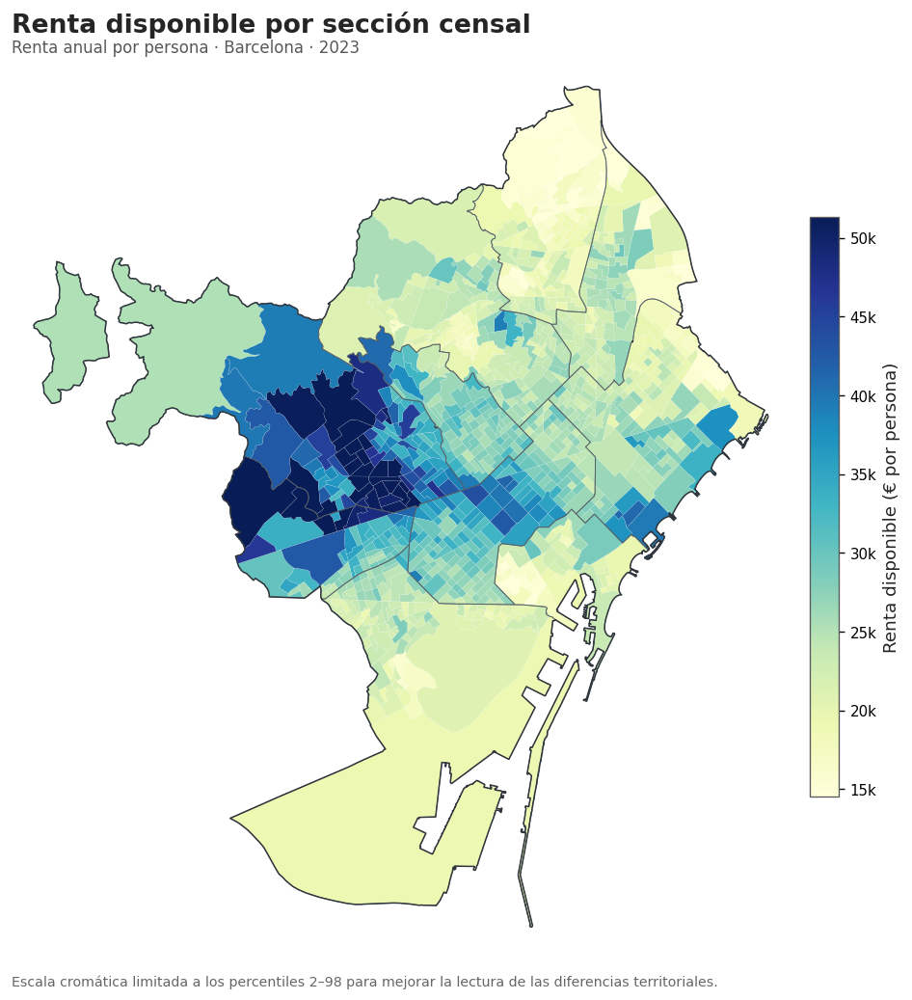


RESUMEN DEL MAPA

Secciones representadas : 1,068
Secciones sin dato      : 0

Renta mínima            : 11,097 €/persona
Percentil 2             : 14,543 €/persona
Renta media             : 26,319 €/persona
Renta mediana           : 24,926 €/persona
Percentil 98            : 51,334 €/persona
Renta máxima            : 54,089 €/persona

✓ Mapa exploratorio de renta generado correctamente.
✓ Se representan los valores por sección censal.
✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial.
✓ Figura exportada en PNG y PDF.


In [25]:

# ============================================================
# 26. MAPA EXPLORATORIO DE RENTA DISPONIBLE
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

print("=" * 100)
print("MAPA EXPLORATORIO DE RENTA DISPONIBLE")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

VARIABLE_RENTA = "RENTA_EUR_PERSONA"

gdf_renta = gdf_socio_exploracion[
    [
        "CLAVE_SECCION",
        "NOMBRE_DISTRITO",
        "NOMBRE_BARRIO",
        "ANIO_RENTA",
        VARIABLE_RENTA,
        "geometry"
    ]
].copy()


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_renta.empty:
    raise ValueError(
        "La capa socioeconómica está vacía."
    )

if VARIABLE_RENTA not in gdf_renta.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_RENTA}'."
    )

gdf_renta[VARIABLE_RENTA] = (
    pd.to_numeric(
        gdf_renta[VARIABLE_RENTA],
        errors="coerce"
    )
    .replace([np.inf, -np.inf], np.nan)
)

n_total = len(gdf_renta)

n_validos = int(
    gdf_renta[VARIABLE_RENTA]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_renta[VARIABLE_RENTA]
    .isna()
    .sum()
)

if n_validos == 0:
    raise ValueError(
        "La variable de renta no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. AÑO DE REFERENCIA
# ------------------------------------------------------------

anios_renta = sorted(
    gdf_renta["ANIO_RENTA"]
    .dropna()
    .unique()
)

print("\nAño(s) de referencia:")
print(anios_renta)


# ------------------------------------------------------------
# 4. ESTADÍSTICAS DESCRIPTIVAS
# ------------------------------------------------------------

renta_min = float(
    gdf_renta[VARIABLE_RENTA].min()
)

renta_p02 = float(
    gdf_renta[VARIABLE_RENTA].quantile(0.02)
)

renta_media = float(
    gdf_renta[VARIABLE_RENTA].mean()
)

renta_mediana = float(
    gdf_renta[VARIABLE_RENTA].median()
)

renta_p98 = float(
    gdf_renta[VARIABLE_RENTA].quantile(0.98)
)

renta_max = float(
    gdf_renta[VARIABLE_RENTA].max()
)


# ------------------------------------------------------------
# 5. RANGO CARTOGRÁFICO ROBUSTO
# ------------------------------------------------------------

vmin = renta_p02
vmax = renta_p98

if not np.isfinite(vmin) or not np.isfinite(vmax):
    raise ValueError(
        "No se ha podido determinar un rango cartográfico válido."
    )

if vmin == vmax:
    vmin = renta_min
    vmax = renta_max


# ------------------------------------------------------------
# 6. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)

# Secciones censales

gdf_renta[
    gdf_renta[VARIABLE_RENTA].notna()
].plot(
    column=VARIABLE_RENTA,
    cmap="YlGnBu",
    vmin=vmin,
    vmax=vmax,
    linewidth=0.06,
    edgecolor="white",
    ax=ax
)

# Límites de distrito

gdf_distritos.boundary.plot(
    ax=ax,
    color="#4f5963",
    linewidth=0.55,
    alpha=0.80
)

# Límite municipal

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 7. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap="YlGnBu"
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "Renta disponible (€ por persona)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)

barra.ax.yaxis.set_major_formatter(
    mpl.ticker.FuncFormatter(
        lambda valor, posicion:
        f"{valor / 1000:.0f}k"
    )
)


# ------------------------------------------------------------
# 8. CONFIGURACIÓN CARTOGRÁFICA
# ------------------------------------------------------------

anio_texto = (
    str(int(anios_renta[0]))
    if len(anios_renta) == 1
    else " / ".join(
        str(int(anio))
        for anio in anios_renta
    )
)

configurar_ejes_mapa(
    ax,
    "Renta disponible por sección censal",
    f"Renta anual por persona · Barcelona · {anio_texto}"
)


# ------------------------------------------------------------
# 9. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Escala cromática limitada a los percentiles 2–98 "
        "para mejorar la lectura de las diferencias territoriales."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 10. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "06_renta_disponible_secciones"
)

plt.show()


# ------------------------------------------------------------
# 11. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nSecciones representadas : {n_validos:,}"
)

print(
    f"Secciones sin dato      : {n_nulos:,}"
)

print(
    f"\nRenta mínima            : {renta_min:,.0f} €/persona"
)

print(
    f"Percentil 2             : {renta_p02:,.0f} €/persona"
)

print(
    f"Renta media             : {renta_media:,.0f} €/persona"
)

print(
    f"Renta mediana           : {renta_mediana:,.0f} €/persona"
)

print(
    f"Percentil 98            : {renta_p98:,.0f} €/persona"
)

print(
    f"Renta máxima            : {renta_max:,.0f} €/persona"
)

print(
    "\n✓ Mapa exploratorio de renta generado correctamente."
)

print(
    "✓ Se representan los valores por sección censal."
)

print(
    "✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial."
)

print(
    "✓ Figura exportada en PNG y PDF."
)



### Resultados

El análisis de la renta disponible presenta una **cobertura completa de las 1.068 secciones censales de Barcelona**, sin valores ausentes. Los datos corresponden al año **2023**.

La renta media se sitúa en **26.319 €/persona**, frente a una mediana de **24.926 €/persona**. Los valores oscilan entre **11.097 y 54.089 €/persona**, mientras que el intervalo comprendido entre los percentiles 2 y 98 alcanza **14.543–51.334 €/persona**.

La representación cartográfica evidencia un **marcado contraste socioeconómico territorial**, con una concentración de rentas más elevadas principalmente en sectores occidentales y centrales-occidentales del municipio, frente a valores inferiores en amplias zonas del norte, nordeste y determinados sectores meridionales.

Este patrón confirma la existencia de una **estructura socioeconómica espacialmente diferenciada** y justifica la incorporación de la renta como variable explicativa en los análisis espaciales y multivariantes posteriores, donde se estudiará su posible asociación con la contaminación atmosférica, el tráfico y otras características del entorno urbano.

La utilización del intervalo **P2–P98** mejora la discriminación cartográfica de las diferencias territoriales sin modificar los valores originales empleados en los análisis posteriores.


## 26 . Mapa exploratorio de densidad de población por sección censal

La densidad de población constituye una variable fundamental para caracterizar la **intensidad de ocupación del tejido urbano** y complementar la información socioeconómica incorporada previamente mediante la renta disponible.

En esta etapa se representa la variable `DENSIDAD_HAB_HA`, expresada en **habitantes por hectárea**, para las **1.068 secciones censales de Barcelona**. La densidad neta (`DENSIDAD_NETA_HAB_HA`) se conserva en la base para su utilización posterior en los análisis espaciales y multivariantes.

La representación mantiene la configuración cartográfica común de la fase exploratoria y utiliza una escala secuencial **amarillo–naranja–rojo (`YlOrRd`)**, adecuada para identificar las zonas con mayor intensidad de ocupación residencial.

Para reducir el efecto visual de valores extremos, el rango cromático se limita a los **percentiles 2 y 98**, manteniéndose los valores originales sin truncar para los análisis estadísticos posteriores.

El análisis permitirá identificar **patrones de concentración y dispersión de la población** dentro del municipio y proporcionará una nueva dimensión territorial para estudiar posteriormente las relaciones entre densidad urbana, tráfico, contaminación atmosférica, renta, topografía y usos del suelo.


MAPA EXPLORATORIO DE DENSIDAD DE POBLACIÓN

Año(s) de referencia:
[np.int64(2021)]

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/07_densidad_poblacion_secciones.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/07_densidad_poblacion_secciones.pdf


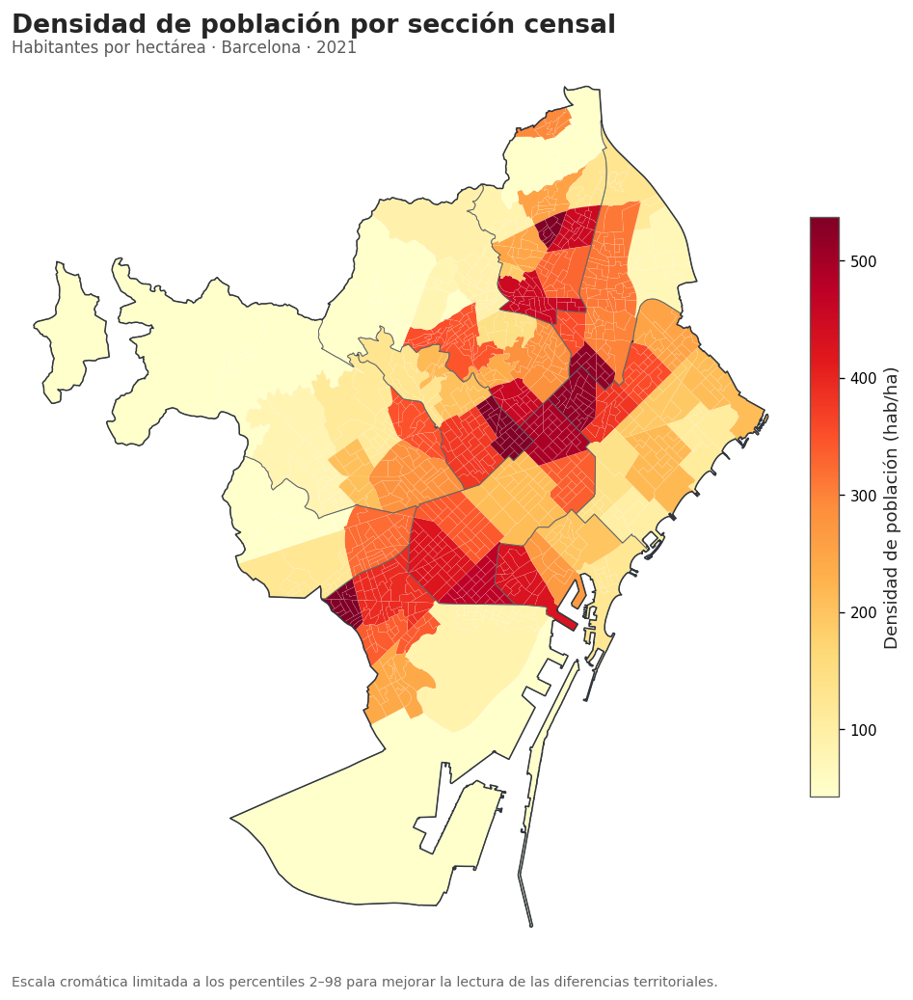


RESUMEN DEL MAPA

Secciones representadas : 1,068
Secciones sin dato      : 0

Densidad mínima         : 1 hab/ha
Percentil 2             : 43 hab/ha
Densidad media          : 309 hab/ha
Densidad mediana        : 322 hab/ha
Percentil 98            : 537 hab/ha
Densidad máxima         : 593 hab/ha

✓ Mapa exploratorio de densidad generado correctamente.
✓ Se representan los valores por sección censal.
✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial.
✓ Figura exportada en PNG y PDF.


In [26]:

# ============================================================
# 26. MAPA EXPLORATORIO DE DENSIDAD DE POBLACIÓN
# ============================================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

print("=" * 100)
print("MAPA EXPLORATORIO DE DENSIDAD DE POBLACIÓN")
print("=" * 100)


# ------------------------------------------------------------
# 1. CAPA DE TRABAJO
# ------------------------------------------------------------

VARIABLE_DENSIDAD = "DENSIDAD_HAB_HA"

gdf_densidad = gdf_socio_exploracion[
    [
        "CLAVE_SECCION",
        "NOMBRE_DISTRITO",
        "NOMBRE_BARRIO",
        "ANIO_DENSIDAD",
        VARIABLE_DENSIDAD,
        "DENSIDAD_NETA_HAB_HA",
        "geometry"
    ]
].copy()


# ------------------------------------------------------------
# 2. VALIDACIONES
# ------------------------------------------------------------

if gdf_densidad.empty:
    raise ValueError(
        "La capa socioeconómica está vacía."
    )

if VARIABLE_DENSIDAD not in gdf_densidad.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_DENSIDAD}'."
    )

gdf_densidad[VARIABLE_DENSIDAD] = (
    pd.to_numeric(
        gdf_densidad[VARIABLE_DENSIDAD],
        errors="coerce"
    )
    .replace([np.inf, -np.inf], np.nan)
)

n_total = len(gdf_densidad)

n_validos = int(
    gdf_densidad[VARIABLE_DENSIDAD]
    .notna()
    .sum()
)

n_nulos = int(
    gdf_densidad[VARIABLE_DENSIDAD]
    .isna()
    .sum()
)

if n_validos == 0:
    raise ValueError(
        "La variable de densidad no contiene valores válidos."
    )


# ------------------------------------------------------------
# 3. AÑO DE REFERENCIA
# ------------------------------------------------------------

anios_densidad = sorted(
    gdf_densidad["ANIO_DENSIDAD"]
    .dropna()
    .unique()
)

print("\nAño(s) de referencia:")
print(anios_densidad)


# ------------------------------------------------------------
# 4. ESTADÍSTICAS DESCRIPTIVAS
# ------------------------------------------------------------

densidad_min = float(
    gdf_densidad[VARIABLE_DENSIDAD].min()
)

densidad_p02 = float(
    gdf_densidad[VARIABLE_DENSIDAD].quantile(0.02)
)

densidad_media = float(
    gdf_densidad[VARIABLE_DENSIDAD].mean()
)

densidad_mediana = float(
    gdf_densidad[VARIABLE_DENSIDAD].median()
)

densidad_p98 = float(
    gdf_densidad[VARIABLE_DENSIDAD].quantile(0.98)
)

densidad_max = float(
    gdf_densidad[VARIABLE_DENSIDAD].max()
)


# ------------------------------------------------------------
# 5. RANGO CARTOGRÁFICO ROBUSTO
# ------------------------------------------------------------

vmin = densidad_p02
vmax = densidad_p98

if not np.isfinite(vmin) or not np.isfinite(vmax):
    raise ValueError(
        "No se ha podido determinar un rango cartográfico válido."
    )

if vmin == vmax:
    vmin = densidad_min
    vmax = densidad_max


# ------------------------------------------------------------
# 6. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)

# Secciones censales

gdf_densidad[
    gdf_densidad[VARIABLE_DENSIDAD].notna()
].plot(
    column=VARIABLE_DENSIDAD,
    cmap="YlOrRd",
    vmin=vmin,
    vmax=vmax,
    linewidth=0.06,
    edgecolor="white",
    ax=ax
)

# Límites de distrito

gdf_distritos.boundary.plot(
    ax=ax,
    color="#5a5f66",
    linewidth=0.55,
    alpha=0.80
)

# Límite municipal

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 7. BARRA DE COLOR
# ------------------------------------------------------------

normalizador = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax
)

mappable = mpl.cm.ScalarMappable(
    norm=normalizador,
    cmap="YlOrRd"
)

mappable.set_array([])

barra = fig.colorbar(
    mappable,
    ax=ax,
    shrink=0.65,
    pad=0.02
)

barra.set_label(
    "Densidad de población (hab/ha)",
    fontsize=11
)

barra.ax.tick_params(
    labelsize=9
)


# ------------------------------------------------------------
# 8. CONFIGURACIÓN CARTOGRÁFICA
# ------------------------------------------------------------

anio_texto = (
    str(int(anios_densidad[0]))
    if len(anios_densidad) == 1
    else " / ".join(
        str(int(anio))
        for anio in anios_densidad
    )
)

configurar_ejes_mapa(
    ax,
    "Densidad de población por sección censal",
    f"Habitantes por hectárea · Barcelona · {anio_texto}"
)


# ------------------------------------------------------------
# 9. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Escala cromática limitada a los percentiles 2–98 "
        "para mejorar la lectura de las diferencias territoriales."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 10. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "07_densidad_poblacion_secciones"
)

plt.show()


# ------------------------------------------------------------
# 11. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nSecciones representadas : {n_validos:,}"
)

print(
    f"Secciones sin dato      : {n_nulos:,}"
)

print(
    f"\nDensidad mínima         : {densidad_min:,.0f} hab/ha"
)

print(
    f"Percentil 2             : {densidad_p02:,.0f} hab/ha"
)

print(
    f"Densidad media          : {densidad_media:,.0f} hab/ha"
)

print(
    f"Densidad mediana        : {densidad_mediana:,.0f} hab/ha"
)

print(
    f"Percentil 98            : {densidad_p98:,.0f} hab/ha"
)

print(
    f"Densidad máxima         : {densidad_max:,.0f} hab/ha"
)

print(
    "\n✓ Mapa exploratorio de densidad generado correctamente."
)

print(
    "✓ Se representan los valores por sección censal."
)

print(
    "✓ Escala robusta P2–P98 aplicada para mejorar la lectura espacial."
)

print(
    "✓ Figura exportada en PNG y PDF."
)



### Resultados

El análisis de la densidad de población presenta una **cobertura completa de las 1.068 secciones censales de Barcelona**, sin valores ausentes. La información utilizada corresponde al año **2021**.

La densidad media se sitúa en **309 hab/ha**, mientras que la mediana alcanza **322 hab/ha**. Los valores presentan un amplio rango, comprendido entre **1 y 593 hab/ha**, mientras que el intervalo delimitado por los percentiles 2 y 98 se sitúa entre **43 y 537 hab/ha**.

La distribución cartográfica evidencia una **marcada heterogeneidad espacial**, con concentraciones elevadas de población en diferentes sectores del tejido urbano consolidado y valores considerablemente inferiores en áreas periféricas, grandes espacios abiertos y zonas con menor componente residencial.

El patrón espacial obtenido difiere del observado para la renta disponible, mostrando que **densidad de población y nivel socioeconómico constituyen dimensiones territoriales diferenciadas**. Esta circunstancia justifica la incorporación independiente de ambas variables en los posteriores análisis de relaciones espaciales y multivariantes.

La utilización del intervalo **P2–P98** permite mejorar la discriminación cartográfica de los contrastes territoriales sin modificar los valores originales empleados en los análisis estadísticos.



## 27 . Caracterización exploratoria de los usos del suelo

La capa de usos del suelo se incorpora al análisis exploratorio espacial como una variable territorial destinada a caracterizar la estructura funcional del municipio de Barcelona.

En primer lugar, se recupera la capa `usos_suelo_barcelona.gpkg` y se comprueba su correcta integración en el sistema de referencia espacial del proyecto (**EPSG:25831**). Asimismo, se realizan controles sobre la existencia de geometrías nulas, vacías o inválidas.

Posteriormente, se identifica la variable categórica correspondiente al uso del suelo y se construye una base específica para la exploración espacial. Para cada categoría se calcula el número de polígonos y la superficie ocupada, expresada en hectáreas, obteniendo además su porcentaje respecto de la superficie total cartografiada.

La caracterización permite conocer la **composición y distribución territorial de los diferentes usos del suelo** y constituye la preparación necesaria para su posterior representación cartográfica.

Esta variable resulta especialmente relevante para el análisis posterior, ya que permitirá estudiar la posible relación entre la estructura funcional del territorio y la distribución espacial de la contaminación atmosférica, el tráfico y las características socioeconómicas y demográficas.

La información de usos del suelo se conservará además como variable espacial de contexto para la **Fase 3 — Relaciones espaciales y análisis multivariante**.



In [27]:

# ============================================================
# 27. CARACTERIZACIÓN EXPLORATORIA DE LOS USOS DEL SUELO
# ============================================================

from pathlib import Path
import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("CARACTERIZACIÓN EXPLORATORIA DE LOS USOS DEL SUELO")
print("=" * 100)


# ------------------------------------------------------------
# 1. RUTA DE LA CAPA
# ------------------------------------------------------------

RUTA_USOS_SUELO = Path(
    "/content/drive/MyDrive/TFM/"
    "10_Machine_Learning_Geoespacial/"
    "PREINTEGRACION/"
    "03_Usos_del_Suelo/"
    "usos_suelo_barcelona.gpkg"
)

if not RUTA_USOS_SUELO.exists():
    raise FileNotFoundError(
        "No se encuentra el archivo de usos del suelo:\n"
        f"{RUTA_USOS_SUELO}"
    )


# ------------------------------------------------------------
# 2. CARGA DE LA CAPA
# ------------------------------------------------------------

gdf_usos_suelo = gpd.read_file(
    RUTA_USOS_SUELO
)

if gdf_usos_suelo.empty:
    raise ValueError(
        "La capa de usos del suelo está vacía."
    )

print("\nCapa recuperada correctamente.")

print(
    f"Registros : {len(gdf_usos_suelo):,}"
)

print(
    f"Columnas  : {len(gdf_usos_suelo.columns):,}"
)

print(
    f"CRS       : {gdf_usos_suelo.crs}"
)


# ------------------------------------------------------------
# 3. VALIDACIÓN ESPACIAL
# ------------------------------------------------------------

if gdf_usos_suelo.crs is None:
    raise ValueError(
        "La capa de usos del suelo no tiene CRS definido."
    )

# Homogeneizar con el CRS general del proyecto

if gdf_usos_suelo.crs.to_epsg() != 25831:

    print(
        "\nReproyectando usos del suelo a EPSG:25831..."
    )

    gdf_usos_suelo = (
        gdf_usos_suelo
        .to_crs(epsg=25831)
    )


n_geometrias_nulas = int(
    gdf_usos_suelo.geometry
    .isna()
    .sum()
)

n_geometrias_vacias = int(
    gdf_usos_suelo.geometry
    .is_empty
    .sum()
)

n_geometrias_invalidas = int(
    (~gdf_usos_suelo.geometry.is_valid)
    .sum()
)


# ------------------------------------------------------------
# 4. COLUMNAS DISPONIBLES
# ------------------------------------------------------------

print("\nColumnas disponibles:")

for columna in gdf_usos_suelo.columns:
    print(f" - {columna}")


# ------------------------------------------------------------
# 5. IDENTIFICACIÓN DE LA VARIABLE DE USO
# ------------------------------------------------------------

candidatas_uso = [
    "USO",
    "USO_SUELO",
    "TIPO_USO",
    "TIPUS_US",
    "CATEGORIA",
    "CATEGORIA_USO",
    "DESCRIPCION",
    "DESCRIPCIO",
    "DESC_USO",
    "NOM_US",
    "NOM_USO",
    "CLASE"
]

VARIABLE_USO = next(
    (
        columna
        for columna in candidatas_uso
        if columna in gdf_usos_suelo.columns
    ),
    None
)


# ------------------------------------------------------------
# 6. BÚSQUEDA AUTOMÁTICA SI EL NOMBRE NO ES ESTÁNDAR
# ------------------------------------------------------------

if VARIABLE_USO is None:

    columnas_texto = [
        columna
        for columna in gdf_usos_suelo.columns
        if (
            columna != "geometry"
            and (
                pd.api.types.is_object_dtype(
                    gdf_usos_suelo[columna]
                )
                or
                pd.api.types.is_string_dtype(
                    gdf_usos_suelo[columna]
                )
            )
        )
    ]

    # Buscar una columna categórica razonable:
    # más de una categoría y un número manejable de clases.

    candidatas_detectadas = []

    for columna in columnas_texto:

        n_categorias = (
            gdf_usos_suelo[columna]
            .nunique(dropna=True)
        )

        if 2 <= n_categorias <= 50:

            candidatas_detectadas.append(
                (
                    columna,
                    n_categorias
                )
            )

    if len(candidatas_detectadas) == 1:

        VARIABLE_USO = (
            candidatas_detectadas[0][0]
        )

    elif len(candidatas_detectadas) > 1:

        # Seleccionar la columna con menor número
        # de categorías como primera aproximación.

        candidatas_detectadas = sorted(
            candidatas_detectadas,
            key=lambda x: x[1]
        )

        VARIABLE_USO = (
            candidatas_detectadas[0][0]
        )

        print(
            "\nVariables categóricas detectadas:"
        )

        for columna, n_cat in candidatas_detectadas:

            print(
                f" - {columna}: "
                f"{n_cat:,} categorías"
            )


if VARIABLE_USO is None:

    raise KeyError(
        "No se ha podido identificar automáticamente "
        "la variable de usos del suelo."
    )


print(
    f"\nVariable utilizada para clasificar "
    f"los usos: {VARIABLE_USO}"
)


# ------------------------------------------------------------
# 7. CAPA EXPLORATORIA
# ------------------------------------------------------------

gdf_usos_exploracion = (
    gdf_usos_suelo[
        [
            VARIABLE_USO,
            "geometry"
        ]
    ]
    .copy()
)

gdf_usos_exploracion[
    VARIABLE_USO
] = (
    gdf_usos_exploracion[
        VARIABLE_USO
    ]
    .astype("string")
    .str.strip()
)


# ------------------------------------------------------------
# 8. CONTROL DE VALORES NULOS
# ------------------------------------------------------------

n_usos_nulos = int(
    gdf_usos_exploracion[
        VARIABLE_USO
    ]
    .isna()
    .sum()
)


# ------------------------------------------------------------
# 9. SUPERFICIE DE LOS POLÍGONOS
# ------------------------------------------------------------

gdf_usos_exploracion[
    "SUPERFICIE_HA"
] = (
    gdf_usos_exploracion
    .geometry
    .area
    / 10_000
)


# ------------------------------------------------------------
# 10. RESUMEN POR CATEGORÍA
# ------------------------------------------------------------

resumen_usos = (
    gdf_usos_exploracion
    .dropna(
        subset=[VARIABLE_USO]
    )
    .groupby(
        VARIABLE_USO,
        as_index=False
    )
    .agg(
        N_POLIGONOS=(
            VARIABLE_USO,
            "size"
        ),
        SUPERFICIE_HA=(
            "SUPERFICIE_HA",
            "sum"
        )
    )
)


# ------------------------------------------------------------
# 11. PORCENTAJE DE SUPERFICIE
# ------------------------------------------------------------

superficie_total_usos = float(
    resumen_usos[
        "SUPERFICIE_HA"
    ]
    .sum()
)

resumen_usos[
    "PORCENTAJE_SUPERFICIE"
] = (
    100
    * resumen_usos[
        "SUPERFICIE_HA"
    ]
    / superficie_total_usos
)

resumen_usos[
    "SUPERFICIE_HA"
] = (
    resumen_usos[
        "SUPERFICIE_HA"
    ]
    .round(2)
)

resumen_usos[
    "PORCENTAJE_SUPERFICIE"
] = (
    resumen_usos[
        "PORCENTAJE_SUPERFICIE"
    ]
    .round(2)
)

resumen_usos = (
    resumen_usos
    .sort_values(
        "SUPERFICIE_HA",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


# ------------------------------------------------------------
# 12. NÚMERO DE CATEGORÍAS
# ------------------------------------------------------------

n_categorias = int(
    resumen_usos[
        VARIABLE_USO
    ]
    .nunique()
)


# ------------------------------------------------------------
# 13. TABLA DE RESULTADOS
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DISTRIBUCIÓN DE LOS USOS DEL SUELO")
print("=" * 100)

display(
    resumen_usos
)


# ------------------------------------------------------------
# 14. RESUMEN DE CONTROL
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN")
print("=" * 100)

print(
    f"\nPolígonos analizados      : "
    f"{len(gdf_usos_exploracion):,}"
)

print(
    f"Categorías identificadas  : "
    f"{n_categorias:,}"
)

print(
    f"Usos sin categoría        : "
    f"{n_usos_nulos:,}"
)

print(
    f"Superficie cartografiada  : "
    f"{superficie_total_usos:,.2f} ha"
)

print(
    f"\nGeometrías nulas          : "
    f"{n_geometrias_nulas:,}"
)

print(
    f"Geometrías vacías         : "
    f"{n_geometrias_vacias:,}"
)

print(
    f"Geometrías inválidas      : "
    f"{n_geometrias_invalidas:,}"
)

print(
    f"CRS final                 : "
    f"{gdf_usos_exploracion.crs}"
)

print(
    "\n✓ Capa de usos del suelo recuperada correctamente."
)

print(
    "✓ Usos del suelo caracterizados por categoría."
)

print(
    "✓ Superficie y peso territorial calculados."
)

print(
    "✓ Integridad geométrica comprobada."
)

print(
    "✓ Base preparada para la cartografía exploratoria."
)



CARACTERIZACIÓN EXPLORATORIA DE LOS USOS DEL SUELO

Capa recuperada correctamente.
Registros : 14,320
Columnas  : 7
CRS       : EPSG:25831

Columnas disponibles:
 - CLAU
 - Descripcio
 - FAMILIA
 - USO_FUNCIONAL
 - AREA_CALCULADA_M2
 - AREA_CALCULADA_HA
 - geometry

Variables categóricas detectadas:
 - USO_FUNCIONAL: 6 categorías
 - FAMILIA: 21 categorías

Variable utilizada para clasificar los usos: USO_FUNCIONAL

DISTRIBUCIÓN DE LOS USOS DEL SUELO


,USO_FUNCIONAL,N_POLIGONOS,SUPERFICIE_HA,PORCENTAJE_SUPERFICIE
0,VERDE,2796,2986.68,36.91
1,RESIDENCIAL_URBANO,7882,2568.04,31.73
2,EQUIPAMIENTOS,2231,1028.12,12.70
3,INDUSTRIAL_PRODUCTIVO,580,625.81,7.73
4,PORTUARIO,93,587.75,7.26
5,TRANSPORTE_INFRAESTRUCTURAS,738,296.32,3.66



RESUMEN

Polígonos analizados      : 14,320
Categorías identificadas  : 6
Usos sin categoría        : 0
Superficie cartografiada  : 8,092.71 ha

Geometrías nulas          : 0
Geometrías vacías         : 0
Geometrías inválidas      : 0
CRS final                 : EPSG:25831

✓ Capa de usos del suelo recuperada correctamente.
✓ Usos del suelo caracterizados por categoría.
✓ Superficie y peso territorial calculados.
✓ Integridad geométrica comprobada.
✓ Base preparada para la cartografía exploratoria.


### Resultados

La capa de usos del suelo presenta **14.320 polígonos**, **6 categorías funcionales** y una superficie cartografiada total de **8.092,71 ha**, sin registros sin categoría.

La categoría **VERDE** constituye el uso con mayor peso territorial, con **2.986,68 ha (36,91%)**, seguida de **RESIDENCIAL_URBANO**, con **2.568,04 ha (31,73%)**. Los **EQUIPAMIENTOS** representan **1.028,12 ha (12,70%)**, mientras que **INDUSTRIAL_PRODUCTIVO** ocupa **625,81 ha (7,73%)**.

Los usos **PORTUARIO** y **TRANSPORTE_INFRAESTRUCTURAS** representan, respectivamente, **587,75 ha (7,26%)** y **296,32 ha (3,66%)**.

La capa presenta una **integridad geométrica completa**, con **0 geometrías nulas, 0 vacías y 0 inválidas**, y se encuentra correctamente integrada en **EPSG:25831**.

En consecuencia, la base queda **preparada para la cartografía exploratoria de usos del suelo y para su posterior incorporación a los análisis espaciales y multivariantes**.


## 28 . Mapa exploratorio de usos funcionales del suelo

La estructura funcional del territorio se representa espacialmente a partir de la clasificación agregada `USO_FUNCIONAL`, que agrupa los usos del suelo en seis categorías: **verde, residencial urbano, equipamientos, industrial-productivo, portuario y transporte e infraestructuras**.

El objetivo de esta representación es visualizar la **distribución espacial de las principales funciones urbanas** y complementar los mapas continuos de contaminación, tráfico, renta, densidad y elevación desarrollados anteriormente.

Para garantizar una lectura homogénea, se establece una **paleta categórica específica para los usos funcionales**, manteniendo los mismos colores para cada categoría en las representaciones posteriores del proyecto.

La cartografía permitirá identificar la estructura territorial de Barcelona y localizar espacialmente los principales ámbitos residenciales, espacios verdes, áreas productivas, equipamientos, espacios portuarios e infraestructuras de transporte.

Esta información será especialmente relevante en la siguiente fase, donde se estudiará la posible relación entre los **usos funcionales del territorio y la distribución espacial de los contaminantes**, junto con variables como tráfico, densidad de población, renta y elevación.

MAPA EXPLORATORIO DE USOS FUNCIONALES DEL SUELO

Categorías representadas:
 - EQUIPAMIENTOS
 - INDUSTRIAL_PRODUCTIVO
 - PORTUARIO
 - RESIDENCIAL_URBANO
 - TRANSPORTE_INFRAESTRUCTURAS
 - VERDE

Figura guardada:
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/08_usos_funcionales_suelo.png
/content/drive/MyDrive/TFM/10_Machine_Learning_Geoespacial/INTEGRACION/FIGURAS/MAPAS_EXPLORATORIOS/08_usos_funcionales_suelo.pdf


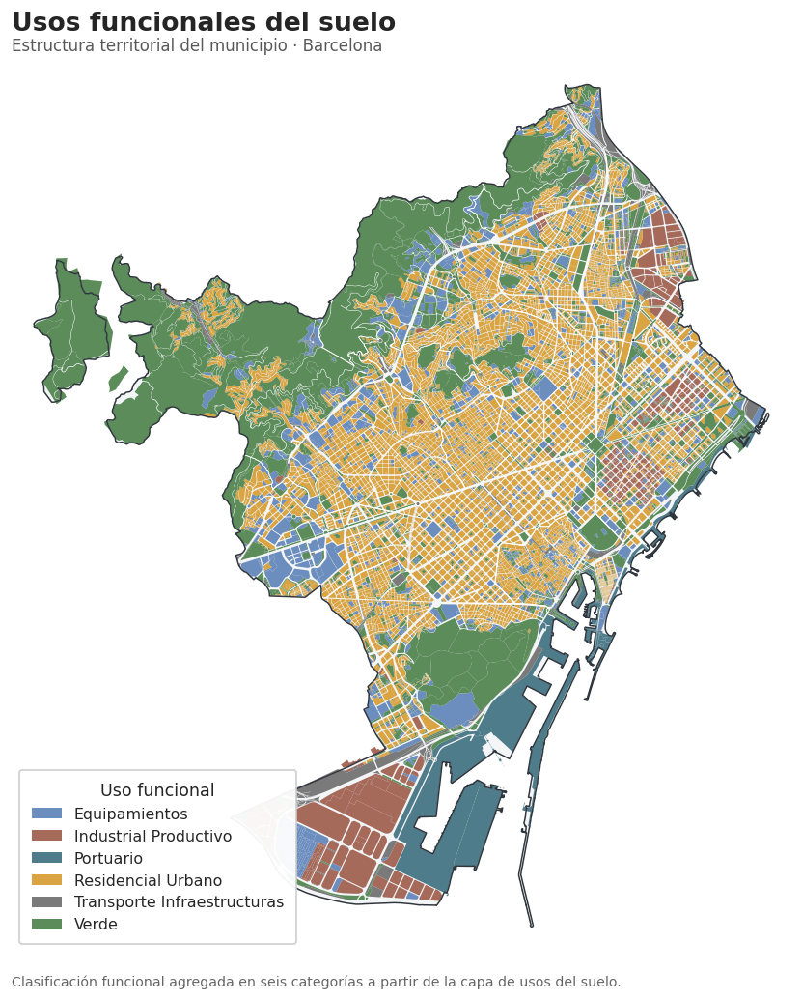


RESUMEN DEL MAPA

Polígonos representados : 14,320
Categorías              : 6
Superficie total        : 8,092.71 ha

Distribución territorial:


,USO_FUNCIONAL,N_POLIGONOS,SUPERFICIE_HA,PORCENTAJE_SUPERFICIE
0,VERDE,2796,2986.68,36.91
1,RESIDENCIAL_URBANO,7882,2568.04,31.73
2,EQUIPAMIENTOS,2231,1028.12,12.70
3,INDUSTRIAL_PRODUCTIVO,580,625.81,7.73
4,PORTUARIO,93,587.75,7.26
5,TRANSPORTE_INFRAESTRUCTURAS,738,296.32,3.66



✓ Mapa exploratorio de usos funcionales generado correctamente.
✓ Se representan las seis categorías funcionales.
✓ Paleta categórica fija establecida para el proyecto.
✓ Figura exportada en PNG y PDF.


In [28]:
# ============================================================
# 28. MAPA EXPLORATORIO DE USOS FUNCIONALES DEL SUELO
# ============================================================

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd

print("=" * 100)
print("MAPA EXPLORATORIO DE USOS FUNCIONALES DEL SUELO")
print("=" * 100)


# ------------------------------------------------------------
# 1. VALIDACIÓN
# ------------------------------------------------------------

if "gdf_usos_exploracion" not in globals():
    raise NameError(
        "No existe gdf_usos_exploracion. "
        "Ejecuta previamente la celda 28."
    )

if gdf_usos_exploracion.empty:
    raise ValueError(
        "La capa de usos del suelo está vacía."
    )

VARIABLE_USO = "USO_FUNCIONAL"

if VARIABLE_USO not in gdf_usos_exploracion.columns:
    raise KeyError(
        f"No existe la variable '{VARIABLE_USO}'."
    )


# ------------------------------------------------------------
# 2. COPIA DE TRABAJO
# ------------------------------------------------------------

gdf_usos_mapa = (
    gdf_usos_exploracion
    .copy()
)

gdf_usos_mapa[VARIABLE_USO] = (
    gdf_usos_mapa[VARIABLE_USO]
    .astype("string")
    .str.strip()
)


# ------------------------------------------------------------
# 3. CATEGORÍAS
# ------------------------------------------------------------

categorias = [
    categoria
    for categoria in
    gdf_usos_mapa[VARIABLE_USO]
    .dropna()
    .unique()
]

categorias = sorted(
    categorias
)

print("\nCategorías representadas:")

for categoria in categorias:
    print(f" - {categoria}")


# ------------------------------------------------------------
# 4. PALETA CATEGÓRICA DEL PROYECTO
# ------------------------------------------------------------

paleta_usos = {
    "VERDE": "#5B8C5A",
    "RESIDENCIAL_URBANO": "#D9A441",
    "EQUIPAMIENTOS": "#6C8EBF",
    "INDUSTRIAL_PRODUCTIVO": "#A66A5B",
    "PORTUARIO": "#4F7C8A",
    "TRANSPORTE_INFRAESTRUCTURAS": "#7A7A7A"
}


# Comprobar que todas las categorías tienen color

colores_faltantes = [
    categoria
    for categoria in categorias
    if categoria not in paleta_usos
]

if colores_faltantes:
    raise ValueError(
        "No existe color definido para: "
        + ", ".join(colores_faltantes)
    )


# ------------------------------------------------------------
# 5. FIGURA
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 10)
)


# ------------------------------------------------------------
# 6. FONDO MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.plot(
    ax=ax,
    facecolor="#f3f5f7",
    edgecolor="none"
)


# ------------------------------------------------------------
# 7. REPRESENTACIÓN DE LOS USOS
# ------------------------------------------------------------

for categoria in categorias:

    gdf_usos_mapa[
        gdf_usos_mapa[VARIABLE_USO]
        == categoria
    ].plot(
        ax=ax,
        color=paleta_usos[categoria],
        edgecolor="none",
        linewidth=0
    )


# ------------------------------------------------------------
# 8. LÍMITES DE DISTRITO
# ------------------------------------------------------------

gdf_distritos.boundary.plot(
    ax=ax,
    color="white",
    linewidth=0.45,
    alpha=0.85
)


# ------------------------------------------------------------
# 9. LÍMITE MUNICIPAL
# ------------------------------------------------------------

gdf_municipio.boundary.plot(
    ax=ax,
    color="#30363d",
    linewidth=0.90
)


# ------------------------------------------------------------
# 10. LEYENDA
# ------------------------------------------------------------

leyenda = [
    Patch(
        facecolor=paleta_usos[categoria],
        edgecolor="none",
        label=categoria.replace(
            "_",
            " "
        ).title()
    )
    for categoria in categorias
]

ax.legend(
    handles=leyenda,
    title="Uso funcional",
    loc="lower left",
    frameon=True,
    framealpha=0.95,
    fontsize=9.5,
    title_fontsize=10.5,
    borderpad=0.8
)


# ------------------------------------------------------------
# 11. TÍTULO
# ------------------------------------------------------------

configurar_ejes_mapa(
    ax,
    "Usos funcionales del suelo",
    "Estructura territorial del municipio · Barcelona"
)


# ------------------------------------------------------------
# 12. NOTA METODOLÓGICA
# ------------------------------------------------------------

ax.text(
    0,
    -0.025,
    (
        "Clasificación funcional agregada en seis categorías "
        "a partir de la capa de usos del suelo."
    ),
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=8.5,
    color="0.40"
)


# ------------------------------------------------------------
# 13. EXPORTACIÓN
# ------------------------------------------------------------

guardar_figura(
    fig,
    "08_usos_funcionales_suelo"
)

plt.show()


# ------------------------------------------------------------
# 14. RESUMEN
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("RESUMEN DEL MAPA")
print("=" * 100)

print(
    f"\nPolígonos representados : "
    f"{len(gdf_usos_mapa):,}"
)

print(
    f"Categorías              : "
    f"{len(categorias)}"
)

print(
    f"Superficie total        : "
    f"{gdf_usos_mapa['SUPERFICIE_HA'].sum():,.2f} ha"
)

print("\nDistribución territorial:")

display(
    resumen_usos[
        [
            VARIABLE_USO,
            "N_POLIGONOS",
            "SUPERFICIE_HA",
            "PORCENTAJE_SUPERFICIE"
        ]
    ]
)

print(
    "\n✓ Mapa exploratorio de usos funcionales generado correctamente."
)

print(
    "✓ Se representan las seis categorías funcionales."
)

print(
    "✓ Paleta categórica fija establecida para el proyecto."
)

print(
    "✓ Figura exportada en PNG y PDF."
)

### Resultados

El mapa de usos funcionales representa correctamente los **14.320 polígonos** de la capa, agrupados en **seis categorías funcionales** y con una superficie cartografiada total de **8.092,71 ha**.

La representación muestra con claridad la estructura territorial de Barcelona: el **uso residencial urbano** domina gran parte del tejido urbano consolidado, mientras que los **espacios verdes** presentan una fuerte presencia en las áreas periféricas y en determinados grandes espacios interiores. Los equipamientos aparecen distribuidos de forma más fragmentada, mientras que los usos **industrial-productivo, portuario y de transporte e infraestructuras** muestran una concentración territorial mucho más específica.

La distribución cuantitativa confirma que **verde (36,91%) y residencial urbano (31,73%)** concentran conjuntamente el **68,64% de la superficie cartografiada**, seguidos por equipamientos (12,70%), industrial-productivo (7,73%), portuario (7,26%) y transporte e infraestructuras (3,66%).

La clasificación funcional resulta especialmente adecuada para la siguiente fase, ya que permite pasar de variables espaciales continuas a una **variable categórica territorial** que podrá incorporarse al análisis de las relaciones entre usos urbanos, tráfico y contaminación.



## 29 . Integracion y auditoria usos del suelo


> **Cierre de la Fase 2 — Integración y exploración espacial**

Esta celda completa la preparación espacial de los **usos funcionales del
suelo** para su posterior incorporación al análisis estadístico y espacial.

La capa de usos del suelo se integra espacialmente con las **1.068 secciones
censales**, calculando para cada sección la proporción de superficie ocupada
por las seis categorías funcionales identificadas:

- **Verde**
- **Residencial urbano**
- **Equipamientos**
- **Industrial-productivo**
- **Portuario**
- **Transporte e infraestructuras**

La integración incluye el control de la cobertura territorial y de posibles
solapamientos geométricos. Cuando la superficie cartografiada supera la
superficie de una sección, los usos se ajustan proporcionalmente para evitar
porcentajes superiores al 100 %.

Además de las seis variables funcionales, se conserva la **superficie sin
clasificar** como variable residual. De este modo, no se oculta la parte de
la superficie de las secciones que no queda representada por la capa de usos.

### Variables finales

- `PCT_VERDE`
- `PCT_RESIDENCIAL`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`
- `PCT_USOS_CARTOGRAFIADOS`
- `PCT_SIN_CLASIFICAR`

Finalmente se comprueba la consistencia de las variables y se verifica que
la suma de superficie funcional y superficie sin clasificar sea igual al
100 % en todas las secciones.

Con esta celda se **cierra la Fase 2** y se deja preparada la información
espacial necesaria para iniciar la:




In [29]:
# ============================================================
# 29. INTEGRACIÓN Y AUDITORÍA FINAL DE USOS DEL SUELO
#     CIERRE DE LA FASE 2
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("30. INTEGRACIÓN Y AUDITORÍA FINAL DE USOS DEL SUELO")
print("=" * 100)


# ------------------------------------------------------------
# 1. RECUPERACIÓN DE LA BASE SOCIOECONÓMICA
# ------------------------------------------------------------

if "gdf_socio" not in globals():

    if "gdf_socio_exploracion" not in globals():

        raise NameError(
            "No existe gdf_socio ni gdf_socio_exploracion."
        )

    gdf_socio = (
        gdf_socio_exploracion
        .copy()
    )

    print(
        "\n✓ Base socioeconómica recuperada."
    )


# ------------------------------------------------------------
# 2. COMPROBACIÓN DE LA BASE DE USOS
# ------------------------------------------------------------

if "gdf_usos_exploracion" not in globals():

    raise NameError(
        "No existe gdf_usos_exploracion. "
        "Ejecuta previamente la preparación de usos del suelo."
    )

if "USO_FUNCIONAL" not in gdf_usos_exploracion.columns:

    raise KeyError(
        "No existe la variable USO_FUNCIONAL."
    )


print(
    f"\nPolígonos de usos disponibles : "
    f"{len(gdf_usos_exploracion):,}"
)


# ------------------------------------------------------------
# 3. HOMOGENEIZACIÓN DEL CRS
# ------------------------------------------------------------

if (
    gdf_usos_exploracion.crs
    != gdf_socio.crs
):

    print(
        "Reproyectando usos del suelo "
        "al CRS de las secciones censales..."
    )

    gdf_usos = (
        gdf_usos_exploracion
        .to_crs(
            gdf_socio.crs
        )
        .copy()
    )

else:

    gdf_usos = (
        gdf_usos_exploracion
        .copy()
    )


print(
    f"CRS de trabajo : {gdf_usos.crs}"
)


# ------------------------------------------------------------
# 4. PREPARACIÓN DE LAS SECCIONES CENSALES
# ------------------------------------------------------------

secciones = (
    gdf_socio[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ]
    .copy()
)

secciones = secciones[
    secciones.geometry.notna()
].copy()

secciones = secciones[
    ~secciones.geometry.is_empty
].copy()


secciones[
    "SUPERFICIE_SECCION_HA"
] = (
    secciones.geometry.area
    / 10000
)


# ------------------------------------------------------------
# 5. INTERSECCIÓN ESPACIAL
# ------------------------------------------------------------

print(
    "\nCalculando intersección "
    "usos del suelo × secciones censales..."
)

usos_secciones = gpd.overlay(
    gdf_usos[
        [
            "USO_FUNCIONAL",
            "geometry"
        ]
    ],
    secciones[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ],
    how="intersection"
)


# ------------------------------------------------------------
# 6. SUPERFICIE INTERSECTADA
# ------------------------------------------------------------

usos_secciones[
    "SUPERFICIE_USO_HA"
] = (
    usos_secciones.geometry.area
    / 10000
)


# ------------------------------------------------------------
# 7. AGREGACIÓN POR SECCIÓN Y USO
# ------------------------------------------------------------

superficie_usos = (
    usos_secciones
    .groupby(
        [
            "CLAVE_SECCION",
            "USO_FUNCIONAL"
        ],
        as_index=False
    )
    .agg(
        SUPERFICIE_USO_HA=(
            "SUPERFICIE_USO_HA",
            "sum"
        )
    )
)


# ------------------------------------------------------------
# 8. SUPERFICIE TOTAL CARTOGRAFIADA
# ------------------------------------------------------------

superficie_cartografiada = (
    superficie_usos
    .groupby(
        "CLAVE_SECCION",
        as_index=False
    )
    .agg(
        SUPERFICIE_CARTOGRAFIADA_HA=(
            "SUPERFICIE_USO_HA",
            "sum"
        )
    )
)


# ------------------------------------------------------------
# 9. CONTROL DE SOLAPAMIENTOS
# ------------------------------------------------------------

superficie_control = (
    superficie_cartografiada
    .merge(
        secciones[
            [
                "CLAVE_SECCION",
                "SUPERFICIE_SECCION_HA"
            ]
        ],
        on="CLAVE_SECCION",
        how="left",
        validate="one_to_one"
    )
)

superficie_control[
    "COBERTURA_BRUTA_PCT"
] = (
    100
    * superficie_control[
        "SUPERFICIE_CARTOGRAFIADA_HA"
    ]
    / superficie_control[
        "SUPERFICIE_SECCION_HA"
    ]
)


print(
    "\nControl preliminar de cobertura:"
)

print(
    f"Media   : "
    f"{superficie_control['COBERTURA_BRUTA_PCT'].mean():.2f}%"
)

print(
    f"Mínimo  : "
    f"{superficie_control['COBERTURA_BRUTA_PCT'].min():.2f}%"
)

print(
    f"Máximo  : "
    f"{superficie_control['COBERTURA_BRUTA_PCT'].max():.2f}%"
)

print(
    f">100 %  : "
    f"{(superficie_control['COBERTURA_BRUTA_PCT'] > 100).sum():,}"
)


# ------------------------------------------------------------
# 10. CORRECCIÓN DE PEQUEÑOS SOLAPAMIENTOS
# ------------------------------------------------------------

# Si la superficie agregada supera la superficie de la sección,
# se normalizan proporcionalmente los usos de esa sección para
# evitar porcentajes superiores al 100 %.

superficie_usos = (
    superficie_usos
    .merge(
        superficie_cartografiada[
            [
                "CLAVE_SECCION",
                "SUPERFICIE_CARTOGRAFIADA_HA"
            ]
        ],
        on="CLAVE_SECCION",
        how="left",
        validate="many_to_one"
    )
)

superficie_usos[
    "FACTOR_CORRECCION"
] = np.where(

    superficie_usos[
        "SUPERFICIE_CARTOGRAFIADA_HA"
    ]
    >
    superficie_usos[
        "CLAVE_SECCION"
    ].map(
        secciones.set_index(
            "CLAVE_SECCION"
        )[
            "SUPERFICIE_SECCION_HA"
        ]
    ),

    superficie_usos[
        "CLAVE_SECCION"
    ].map(
        secciones.set_index(
            "CLAVE_SECCION"
        )[
            "SUPERFICIE_SECCION_HA"
        ]
    )
    /
    superficie_usos[
        "SUPERFICIE_CARTOGRAFIADA_HA"
    ],

    1.0
)


superficie_usos[
    "SUPERFICIE_USO_CORREGIDA_HA"
] = (
    superficie_usos[
        "SUPERFICIE_USO_HA"
    ]
    *
    superficie_usos[
        "FACTOR_CORRECCION"
    ]
)


# ------------------------------------------------------------
# 11. PORCENTAJE DE CADA USO
# ------------------------------------------------------------

superficie_usos[
    "PORCENTAJE_USO"
] = (
    100
    * superficie_usos[
        "SUPERFICIE_USO_CORREGIDA_HA"
    ]
    /
    superficie_usos[
        "CLAVE_SECCION"
    ].map(
        secciones.set_index(
            "CLAVE_SECCION"
        )[
            "SUPERFICIE_SECCION_HA"
        ]
    )
)


# ------------------------------------------------------------
# 12. TRANSFORMACIÓN A FORMATO ANCHO
# ------------------------------------------------------------

variables_usos_originales = [
    "VERDE",
    "RESIDENCIAL_URBANO",
    "EQUIPAMIENTOS",
    "INDUSTRIAL_PRODUCTIVO",
    "PORTUARIO",
    "TRANSPORTE_INFRAESTRUCTURAS"
]


usos_por_seccion = (
    superficie_usos
    .pivot(
        index="CLAVE_SECCION",
        columns="USO_FUNCIONAL",
        values="PORCENTAJE_USO"
    )
    .fillna(0)
    .reset_index()
)


# ------------------------------------------------------------
# 13. RENOMBRADO DE VARIABLES
# ------------------------------------------------------------

renombrar_usos = {

    "VERDE":
        "PCT_VERDE",

    "RESIDENCIAL_URBANO":
        "PCT_RESIDENCIAL",

    "EQUIPAMIENTOS":
        "PCT_EQUIPAMIENTOS",

    "INDUSTRIAL_PRODUCTIVO":
        "PCT_INDUSTRIAL",

    "PORTUARIO":
        "PCT_PORTUARIO",

    "TRANSPORTE_INFRAESTRUCTURAS":
        "PCT_TRANSPORTE"
}


usos_por_seccion = (
    usos_por_seccion
    .rename(
        columns=renombrar_usos
    )
)


# ------------------------------------------------------------
# 14. GARANTIZAR LAS SEIS CATEGORÍAS
# ------------------------------------------------------------

variables_usos = [
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]


for variable in variables_usos:

    if variable not in usos_por_seccion.columns:

        usos_por_seccion[
            variable
        ] = 0.0


# ------------------------------------------------------------
# 15. BASE FINAL DE USOS DEL SUELO
# ------------------------------------------------------------

base_usos_suelo = (
    secciones[
        [
            "CLAVE_SECCION",
            "SUPERFICIE_SECCION_HA"
        ]
    ]
    .merge(
        usos_por_seccion[
            [
                "CLAVE_SECCION"
            ]
            + variables_usos
        ],
        on="CLAVE_SECCION",
        how="left",
        validate="one_to_one"
    )
)


base_usos_suelo[
    variables_usos
] = (
    base_usos_suelo[
        variables_usos
    ]
    .fillna(0)
)


# ------------------------------------------------------------
# 16. SUPERFICIE TOTAL REPRESENTADA
# ------------------------------------------------------------

base_usos_suelo[
    "PCT_USOS_CARTOGRAFIADOS"
] = (
    base_usos_suelo[
        variables_usos
    ]
    .sum(axis=1)
)


# ------------------------------------------------------------
# 17. SUPERFICIE SIN CLASIFICAR
# ------------------------------------------------------------

base_usos_suelo[
    "PCT_SIN_CLASIFICAR"
] = (
    100
    -
    base_usos_suelo[
        "PCT_USOS_CARTOGRAFIADOS"
    ]
)


# Control numérico por seguridad

base_usos_suelo[
    "PCT_SIN_CLASIFICAR"
] = (
    base_usos_suelo[
        "PCT_SIN_CLASIFICAR"
    ]
    .clip(
        lower=0,
        upper=100
    )
)


# ------------------------------------------------------------
# 18. AUDITORÍA FINAL DE USOS
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("AUDITORÍA FINAL DE USOS DEL SUELO")
print("=" * 100)


auditoria_usos = pd.DataFrame({

    "VARIABLE": (
        variables_usos
        + [
            "PCT_USOS_CARTOGRAFIADOS",
            "PCT_SIN_CLASIFICAR"
        ]
    ),

    "MEDIA_%": [
        round(
            base_usos_suelo[
                variable
            ].mean(),
            2
        )
        for variable in (
            variables_usos
            + [
                "PCT_USOS_CARTOGRAFIADOS",
                "PCT_SIN_CLASIFICAR"
            ]
        )
    ],

    "MEDIANA_%": [
        round(
            base_usos_suelo[
                variable
            ].median(),
            2
        )
        for variable in (
            variables_usos
            + [
                "PCT_USOS_CARTOGRAFIADOS",
                "PCT_SIN_CLASIFICAR"
            ]
        )
    ],

    "MÁXIMO_%": [
        round(
            base_usos_suelo[
                variable
            ].max(),
            2
        )
        for variable in (
            variables_usos
            + [
                "PCT_USOS_CARTOGRAFIADOS",
                "PCT_SIN_CLASIFICAR"
            ]
        )
    ]
})


display(
    auditoria_usos
)


# ------------------------------------------------------------
# 19. CONTROL DE CONSISTENCIA
# ------------------------------------------------------------

suma_final = (
    base_usos_suelo[
        variables_usos
    ]
    .sum(axis=1)
    +
    base_usos_suelo[
        "PCT_SIN_CLASIFICAR"
    ]
)


print(
    "\nControl de consistencia:"
)

print(
    f"Suma mínima : "
    f"{suma_final.min():.4f}%"
)

print(
    f"Suma máxima : "
    f"{suma_final.max():.4f}%"
)

print(
    f"Suma media  : "
    f"{suma_final.mean():.4f}%"
)


# ------------------------------------------------------------
# 20. VALIDACIONES FINALES
# ------------------------------------------------------------

if len(base_usos_suelo) != 1068:

    print(
        "\n⚠ Aviso: la base no contiene "
        "exactamente 1.068 secciones."
    )

else:

    print(
        "\n✓ 1.068 secciones censales representadas."
    )


if (
    base_usos_suelo[
        variables_usos
    ]
    .isna()
    .any()
    .any()
):

    raise ValueError(
        "Existen valores nulos en las variables "
        "de usos del suelo."
    )


if (
    base_usos_suelo[
        "PCT_SIN_CLASIFICAR"
    ]
    < 0
).any():

    raise ValueError(
        "Existen porcentajes negativos "
        "de superficie sin clasificar."
    )


# ------------------------------------------------------------
# 21. RESUMEN FINAL — CIERRE DE FASE 2
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("CIERRE DE LA FASE 2")
print("=" * 100)

print(
    f"\nSecciones analizadas       : "
    f"{len(base_usos_suelo):,}"
)

print(
    f"Categorías funcionales     : "
    f"{len(variables_usos)}"
)

print(
    f"Cobertura funcional media : "
    f"{base_usos_suelo['PCT_USOS_CARTOGRAFIADOS'].mean():.2f}%"
)

print(
    f"Superficie sin clasificar : "
    f"{base_usos_suelo['PCT_SIN_CLASIFICAR'].mean():.2f}%"
)

print(
    f"Máximo uso cartografiado  : "
    f"{base_usos_suelo['PCT_USOS_CARTOGRAFIADOS'].max():.2f}%"
)

print(
    "\n✓ Usos del suelo integrados espacialmente."
)

print(
    "✓ Solapamientos superiores al 100 % corregidos."
)

print(
    "✓ Superficie sin clasificar conservada como variable."
)

print(
    "✓ Seis variables funcionales preparadas."
)

print(
    "✓ Base de usos del suelo lista para la Fase 3."
)

print(
    "\n✓ FASE 2 CERRADA CORRECTAMENTE."
)

30. INTEGRACIÓN Y AUDITORÍA FINAL DE USOS DEL SUELO

✓ Base socioeconómica recuperada.

Polígonos de usos disponibles : 14,320
CRS de trabajo : EPSG:25831

Calculando intersección usos del suelo × secciones censales...

Control preliminar de cobertura:
Media   : 69.53%
Mínimo  : 28.21%
Máximo  : 100.63%
>100 %  : 1

AUDITORÍA FINAL DE USOS DEL SUELO


,VARIABLE,MEDIA_%,MEDIANA_%,MÁXIMO_%
0,PCT_VERDE,9.29,2.96,87.81
1,PCT_RESIDENCIAL,50.45,54.94,85.17
2,PCT_EQUIPAMIENTOS,7.31,3.31,70.03
3,PCT_INDUSTRIAL,1.17,0.00,72.12
4,PCT_PORTUARIO,0.24,0.00,51.19
5,PCT_TRANSPORTE,1.07,0.00,42.89
6,PCT_USOS_CARTOGRAFIADOS,69.53,70.23,100.00
7,PCT_SIN_CLASIFICAR,30.47,29.77,71.79



Control de consistencia:
Suma mínima : 100.0000%
Suma máxima : 100.0000%
Suma media  : 100.0000%

✓ 1.068 secciones censales representadas.

CIERRE DE LA FASE 2

Secciones analizadas       : 1,068
Categorías funcionales     : 6
Cobertura funcional media : 69.53%
Superficie sin clasificar : 30.47%
Máximo uso cartografiado  : 100.00%

✓ Usos del suelo integrados espacialmente.
✓ Solapamientos superiores al 100 % corregidos.
✓ Superficie sin clasificar conservada como variable.
✓ Seis variables funcionales preparadas.
✓ Base de usos del suelo lista para la Fase 3.

✓ FASE 2 CERRADA CORRECTAMENTE.



### Resultados

La capa de usos funcionales del suelo ha sido integrada correctamente con
las secciones censales de Barcelona mediante intersección espacial.

- **Secciones censales analizadas:** 1.068
- **Polígonos de usos de partida:** 14.320
- **Categorías funcionales:** 6
- **CRS de trabajo:** EPSG:25831
- **Cobertura funcional media:** 69,53 %
- **Superficie media sin clasificar:** 30,47 %

### Distribución media de los usos funcionales

| Uso funcional | Superficie media |
|---|---:|
| Residencial urbano | 50,45 % |
| Verde | 9,29 % |
| Equipamientos | 7,31 % |
| Industrial-productivo | 1,17 % |
| Transporte e infraestructuras | 1,07 % |
| Portuario | 0,24 % |
| Sin clasificar | 30,47 % |

La superficie sin clasificar se conserva explícitamente como variable residual,
evitando asumir que la capa de usos funcionales representa la totalidad del
territorio.

### Controles de calidad

- El único caso con cobertura bruta superior al 100 % fue corregido.
- **Cobertura funcional máxima final:** 100,00 %.
- **Suma mínima de las variables:** 100,00 %.
- **Suma máxima de las variables:** 100,00 %.
- **Suma media:** 100,00 %.
- No quedan valores nulos en las variables funcionales.
- Las seis categorías quedan preparadas para su incorporación al análisis
  espacial y multivariante.




## 30 . Construcción de la base maestra espacial

> **Inicio de la Fase 3 — Relaciones espaciales y análisis multivariante**

Esta celda construye la **base maestra espacial del estudio**, utilizando como
unidad común de análisis las **1.068 secciones censales de Barcelona**.

Se integran en una única base las principales variables ambientales,
territoriales, socioeconómicas, topográficas, de usos del suelo y de movilidad.

La contaminación atmosférica, disponible inicialmente a escala de tramo, se
asigna espacialmente a las secciones censales mediante **intersección
geométrica**. Los valores de NO₂, PM10 y PM2.5 se agregan mediante una
**media ponderada por la longitud de los tramos dentro de cada sección**.

La información de tráfico se incorpora mediante la asignación del **aforo más
próximo al centroide de cada sección censal**. Para cada sección se integran
el IMD y sus principales estadísticos, así como la distancia hasta el aforo
asignado. Se incluye además una transformación logarítmica del IMD para su
posterior utilización en los análisis estadísticos y multivariantes.

La base maestra incorpora:

- NO₂ medio ponderado.
- PM10 medio ponderado.
- PM2.5 medio ponderado.
- Número de tramos de contaminación.
- Longitud contaminada representada.
- IMD del aforo más próximo.
- Mediana, mínimo, máximo y desviación estándar del IMD.
- Distancia al aforo más próximo.
- Logaritmo del IMD.
- Renta disponible por persona.
- Densidad de población.
- Densidad neta de población.
- Elevación media.
- Porcentaje de superficie verde.
- Porcentaje residencial.
- Porcentaje de equipamientos.
- Porcentaje industrial.
- Porcentaje portuario.
- Porcentaje de transporte e infraestructuras.

Todas las capas espaciales se trabajan en **EPSG:25831**.

Finalmente se realiza una auditoría de cobertura, valores nulos, duplicados y
validez geométrica para garantizar la consistencia de la base resultante.

El resultado es una **base maestra espacial única por sección censal**, que
servirá como unidad de referencia para los análisis de correlación,
autocorrelación espacial, análisis multivariante y modelización posteriores.

In [30]:
# ============================================================
# 30. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL
# FASE 3 — INTEGRACIÓN ESPACIAL
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("30. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE BASES DE ENTRADA
# ============================================================

bases_necesarias = [
    "gdf_socio",
    "gdf_contaminacion_media",
    "gdf_aforos_exploracion",
    "base_usos_suelo"
]

print("\nBASES DE ENTRADA")
print("-" * 100)

for nombre in bases_necesarias:

    if nombre not in globals():

        raise NameError(
            f"No existe '{nombre}'. "
            "La celda 30 requiere las bases finales "
            "auditadas de las fases anteriores."
        )

    print(
        f"✓ {nombre:<30} "
        f"{type(globals()[nombre]).__name__}"
    )


# ============================================================
# 2. COLUMNAS CRÍTICAS
# ============================================================

columnas_socio = [
    "CLAVE_SECCION",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",
    "geometry"
]

columnas_contaminacion = [
    "TRAM",
    "NO2_MEDIA_2018_2024",
    "PM10_MEDIA_2018_2024",
    "PM25_MEDIA_2018_2024",
    "geometry"
]

columnas_trafico = [
    "Id_aforament",
    "IMD_MEDIA",
    "IMD_MEDIANA",
    "IMD_MIN",
    "IMD_MAX",
    "IMD_STD",
    "ELEVACION_M",
    "geometry"
]

columnas_usos = [
    "CLAVE_SECCION",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE",
    "PCT_USOS_CARTOGRAFIADOS",
    "PCT_SIN_CLASIFICAR"
]

for nombre, columnas, base in [
    ("socioeconomía", columnas_socio, gdf_socio),
    ("contaminación", columnas_contaminacion, gdf_contaminacion_media),
    ("tráfico", columnas_trafico, gdf_aforos_exploracion),
    ("usos del suelo", columnas_usos, base_usos_suelo)
]:

    faltantes = [
        c for c in columnas
        if c not in base.columns
    ]

    if faltantes:

        raise KeyError(
            f"Faltan columnas en {nombre}: "
            + ", ".join(faltantes)
        )

print("\n✓ Columnas críticas comprobadas.")


# ============================================================
# 3. BASE TERRITORIAL DE REFERENCIA
# ============================================================

base_maestra = (
    gdf_socio[
        columnas_socio
    ]
    .copy()
    .reset_index(drop=True)
)

print("\nBASE TERRITORIAL")
print("-" * 100)

print(
    f"Secciones censales : "
    f"{len(base_maestra):,}"
)

print(
    f"CRS                : "
    f"{base_maestra.crs}"
)


# ============================================================
# 4. VALIDACIÓN DE SECCIONES
# ============================================================

if base_maestra["CLAVE_SECCION"].isna().any():

    raise ValueError(
        "Existen CLAVE_SECCION nulas."
    )

if base_maestra["CLAVE_SECCION"].duplicated().any():

    raise ValueError(
        "Existen secciones censales duplicadas."
    )


# ============================================================
# 5. CRS DE ANÁLISIS
# ============================================================

CRS_ANALISIS = base_maestra.crs

if CRS_ANALISIS is None:

    raise ValueError(
        "La base socioeconómica no tiene CRS."
    )

contaminacion_sp = (
    gdf_contaminacion_media[
        columnas_contaminacion
    ]
    .copy()
)

trafico_sp = (
    gdf_aforos_exploracion[
        columnas_trafico
    ]
    .copy()
)

if contaminacion_sp.crs != CRS_ANALISIS:

    contaminacion_sp = (
        contaminacion_sp
        .to_crs(CRS_ANALISIS)
    )

if trafico_sp.crs != CRS_ANALISIS:

    trafico_sp = (
        trafico_sp
        .to_crs(CRS_ANALISIS)
    )

print(
    f"\nCRS de análisis : "
    f"{CRS_ANALISIS}"
)


# ============================================================
# 6. INTEGRACIÓN DE CONTAMINACIÓN
# ============================================================

print("\n" + "=" * 100)
print("INTEGRACIÓN DE CONTAMINACIÓN")
print("=" * 100)

interseccion_contaminacion = gpd.overlay(

    contaminacion_sp[
        [
            "TRAM",
            "NO2_MEDIA_2018_2024",
            "PM10_MEDIA_2018_2024",
            "PM25_MEDIA_2018_2024",
            "geometry"
        ]
    ],

    base_maestra[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ],

    how="intersection"
)

print(
    f"Fragmentos resultantes : "
    f"{len(interseccion_contaminacion):,}"
)


# ============================================================
# 7. LONGITUD INTERSECTADA
# ============================================================

interseccion_contaminacion[
    "LONGITUD_TRAMO_M"
] = (
    interseccion_contaminacion
    .geometry
    .length
)


# ============================================================
# 8. MEDIA PONDERADA POR LONGITUD
# ============================================================

def media_ponderada(grupo, variable):

    valores = pd.to_numeric(
        grupo[variable],
        errors="coerce"
    )

    pesos = pd.to_numeric(
        grupo["LONGITUD_TRAMO_M"],
        errors="coerce"
    )

    mascara = (
        valores.notna()
        & pesos.notna()
        & (pesos > 0)
    )

    if mascara.sum() == 0:

        return np.nan

    return np.average(
        valores[mascara],
        weights=pesos[mascara]
    )


registros_contaminacion = []

for clave, grupo in (
    interseccion_contaminacion
    .groupby("CLAVE_SECCION")
):

    registros_contaminacion.append({

        "CLAVE_SECCION":
            clave,

        "NO2_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "NO2_MEDIA_2018_2024"
            ),

        "PM10_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "PM10_MEDIA_2018_2024"
            ),

        "PM25_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "PM25_MEDIA_2018_2024"
            ),

        "N_TRAMOS_CONTAMINACION":
            grupo["TRAM"].nunique(),

        "LONGITUD_CONTAMINADA_M":
            grupo["LONGITUD_TRAMO_M"].sum()
    })


contaminacion_seccion = pd.DataFrame(
    registros_contaminacion
)


# ============================================================
# 9. INCORPORACIÓN DE CONTAMINACIÓN
# ============================================================

base_maestra = (
    base_maestra
    .merge(
        contaminacion_seccion,
        on="CLAVE_SECCION",
        how="left",
        validate="one_to_one"
    )
)


# ============================================================
# 10. INCORPORACIÓN DE USOS DEL SUELO
# ============================================================

print("\n" + "=" * 100)
print("INTEGRACIÓN DE USOS DEL SUELO")
print("=" * 100)

base_maestra = (
    base_maestra
    .merge(
        base_usos_suelo[
            columnas_usos
        ],
        on="CLAVE_SECCION",
        how="left",
        validate="one_to_one"
    )
)

print("✓ Usos del suelo incorporados.")


# ============================================================
# 11. PREPARACIÓN DEL TRÁFICO
# ============================================================

print("\n" + "=" * 100)
print("INTEGRACIÓN DEL TRÁFICO")
print("=" * 100)

print(
    f"Estaciones de aforo : "
    f"{len(trafico_sp):,}"
)

trafico_sp = trafico_sp[
    trafico_sp.geometry.notna()
    & ~trafico_sp.geometry.is_empty
].copy()

if trafico_sp.empty:

    raise ValueError(
        "No existen aforos válidos."
    )


# ============================================================
# 12. CENTROIDE DE CADA SECCIÓN CENSAL
# ============================================================
#
# Se utiliza el centroide como punto representativo
# de la sección para asignar el aforo más próximo.
# Esto evita empates derivados de utilizar directamente
# la geometría poligonal completa de la sección.
# ============================================================

puntos_seccion = base_maestra[
    [
        "CLAVE_SECCION",
        "geometry"
    ]
].copy()

puntos_seccion[
    "geometry"
] = (
    puntos_seccion
    .geometry
    .centroid
)

puntos_seccion = gpd.GeoDataFrame(
    puntos_seccion,
    geometry="geometry",
    crs=CRS_ANALISIS
)


# ============================================================
# 13. RENOMBRADO DE VARIABLES DE TRÁFICO
# ============================================================

trafico_sp = trafico_sp.rename(

    columns={

        "IMD_MEDIA":
            "IMD_AFORO_CERCANO",

        "IMD_MEDIANA":
            "IMD_MEDIANA_AFORO",

        "IMD_MIN":
            "IMD_MIN_AFORO",

        "IMD_MAX":
            "IMD_MAX_AFORO",

        "IMD_STD":
            "IMD_STD_AFORO",

        "ELEVACION_M":
            "ELEVACION_AFORO_M"
    }
)


# ============================================================
# 14. AFORO MÁS PRÓXIMO AL CENTROIDE
# ============================================================

asignacion_aforo = gpd.sjoin_nearest(

    puntos_seccion,

    trafico_sp[
        [
            "Id_aforament",
            "IMD_AFORO_CERCANO",
            "IMD_MEDIANA_AFORO",
            "IMD_MIN_AFORO",
            "IMD_MAX_AFORO",
            "IMD_STD_AFORO",
            "ELEVACION_AFORO_M",
            "geometry"
        ]
    ],

    how="left",

    distance_col="DISTANCIA_AFORO_M"
)


# ============================================================
# 15. RESOLUCIÓN DETERMINISTA DE EMPATES
# ============================================================

# Puede existir más de un aforo exactamente a la misma
# distancia del centroide. En ese caso se selecciona
# determinísticamente el Id_aforament menor.

asignacion_aforo = (
    asignacion_aforo
    .sort_values(
        [
            "CLAVE_SECCION",
            "DISTANCIA_AFORO_M",
            "Id_aforament"
        ]
    )
    .drop_duplicates(
        subset="CLAVE_SECCION",
        keep="first"
    )
    .reset_index(drop=True)
)


# ============================================================
# 16. COMPROBACIÓN DE LA ASIGNACIÓN
# ============================================================

duplicadas = (
    asignacion_aforo[
        "CLAVE_SECCION"
    ]
    .duplicated()
    .sum()
)

if duplicadas > 0:

    raise ValueError(
        f"La asignación de tráfico mantiene "
        f"{duplicadas:,} secciones duplicadas."
    )

if len(asignacion_aforo) != len(base_maestra):

    raise ValueError(
        "El número de secciones tras asignar tráfico "
        "no coincide con las 1.068 secciones censales."
    )

print(
    f"Secciones con aforo asignado : "
    f"{asignacion_aforo['IMD_AFORO_CERCANO'].notna().sum():,}"
)

print(
    f"Distancia media al aforo     : "
    f"{asignacion_aforo['DISTANCIA_AFORO_M'].mean():.2f} m"
)

print(
    f"Distancia máxima al aforo    : "
    f"{asignacion_aforo['DISTANCIA_AFORO_M'].max():.2f} m"
)


# ============================================================
# 17. INTEGRACIÓN DEL TRÁFICO EN BASE_MAESTRA
# ============================================================

columnas_aforo = [
    "CLAVE_SECCION",
    "Id_aforament",
    "IMD_AFORO_CERCANO",
    "IMD_MEDIANA_AFORO",
    "IMD_MIN_AFORO",
    "IMD_MAX_AFORO",
    "IMD_STD_AFORO",
    "ELEVACION_AFORO_M",
    "DISTANCIA_AFORO_M"
]

base_maestra = (
    base_maestra
    .merge(
        asignacion_aforo[
            columnas_aforo
        ],
        on="CLAVE_SECCION",
        how="left",
        validate="one_to_one"
    )
)


# ============================================================
# 18. LOG_IMD
# ============================================================

base_maestra[
    "LOG_IMD"
] = np.log1p(
    pd.to_numeric(
        base_maestra[
            "IMD_AFORO_CERCANO"
        ],
        errors="coerce"
    )
)


# ============================================================
# 19. AUDITORÍA
# ============================================================

print("\n" + "=" * 100)
print("AUDITORÍA DE LA BASE MAESTRA")
print("=" * 100)

variables_auditoria = [

    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",

    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",

    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",

    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

auditoria = []

for variable in variables_auditoria:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    )

    auditoria.append({

        "VARIABLE":
            variable,

        "VÁLIDOS":
            int(serie.notna().sum()),

        "NULOS":
            int(serie.isna().sum()),

        "COBERTURA_%":
            round(
                100 * serie.notna().mean(),
                2
            ),

        "MEDIA":
            round(serie.mean(), 2),

        "MEDIANA":
            round(serie.median(), 2),

        "MÍNIMO":
            round(serie.min(), 2),

        "MÁXIMO":
            round(serie.max(), 2)
    })


auditoria_base_maestra = pd.DataFrame(
    auditoria
)

display(
    auditoria_base_maestra
)


# ============================================================
# 20. CONTROL GEOMÉTRICO Y ESTRUCTURAL
# ============================================================

print("\n" + "=" * 100)
print("CONTROL GEOMÉTRICO Y ESTRUCTURAL")
print("=" * 100)

print(
    f"Secciones censales      : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables totales       : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"Geometrías nulas        : "
    f"{base_maestra.geometry.isna().sum():,}"
)

print(
    f"Geometrías vacías       : "
    f"{base_maestra.geometry.is_empty.sum():,}"
)

print(
    f"Geometrías inválidas    : "
    f"{(~base_maestra.geometry.is_valid).sum():,}"
)

print(
    f"Secciones duplicadas    : "
    f"{base_maestra['CLAVE_SECCION'].duplicated().sum():,}"
)

print(
    f"CRS                     : "
    f"{base_maestra.crs}"
)


# ============================================================
# 21. COBERTURA FINAL
# ============================================================

print("\n" + "=" * 100)
print("COBERTURA FINAL")
print("=" * 100)

print(
    f"Secciones totales : "
    f"{len(base_maestra):,}"
)

print(
    f"Con NO₂          : "
    f"{base_maestra['NO2_MEDIO_PONDERADO'].notna().sum():,}"
)

print(
    f"Con PM10         : "
    f"{base_maestra['PM10_MEDIO_PONDERADO'].notna().sum():,}"
)

print(
    f"Con PM2.5        : "
    f"{base_maestra['PM25_MEDIO_PONDERADO'].notna().sum():,}"
)

print(
    f"Con tráfico      : "
    f"{base_maestra['IMD_AFORO_CERCANO'].notna().sum():,}"
)


# ============================================================
# 22. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 30")
print("=" * 100)

print(
    f"\nSecciones censales : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables totales  : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"Tramos integrados  : "
    f"{base_maestra['N_TRAMOS_CONTAMINACION'].sum():,.0f}"
)

print(
    f"Aforos disponibles : "
    f"{len(trafico_sp):,}"
)

print(
    "\n✓ Base maestra construida desde las bases finales."
)

print(
    "✓ Contaminación integrada espacialmente."
)

print(
    "✓ Agregación ponderada por longitud de tramo."
)

print(
    "✓ Socioeconomía y topografía incorporadas."
)

print(
    "✓ Usos del suelo incorporados."
)

print(
    "✓ Aforo más próximo al centroide de cada sección."
)

print(
    "✓ Distancia al aforo calculada."
)

print(
    "✓ Empates resueltos mediante criterio determinista."
)

print(
    "✓ LOG_IMD calculado."
)

print(
    "✓ Geometrías y duplicados auditados."
)

print(
    "\n✓ BASE MAESTRA ESPACIAL COMPLETA."
)

print(
    "✓ LISTA PARA LA FASE 3."
)

30. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL

BASES DE ENTRADA
----------------------------------------------------------------------------------------------------
✓ gdf_socio                      GeoDataFrame
✓ gdf_contaminacion_media        GeoDataFrame
✓ gdf_aforos_exploracion         GeoDataFrame
✓ base_usos_suelo                DataFrame

✓ Columnas críticas comprobadas.

BASE TERRITORIAL
----------------------------------------------------------------------------------------------------
Secciones censales : 1,068
CRS                : EPSG:25831

CRS de análisis : EPSG:25831

INTEGRACIÓN DE CONTAMINACIÓN
Fragmentos resultantes : 22,597

INTEGRACIÓN DE USOS DEL SUELO
✓ Usos del suelo incorporados.

INTEGRACIÓN DEL TRÁFICO
Estaciones de aforo : 487
Secciones con aforo asignado : 1,068
Distancia media al aforo     : 249.94 m
Distancia máxima al aforo    : 3504.60 m

AUDITORÍA DE LA BASE MAESTRA


,VARIABLE,VÁLIDOS,NULOS,COBERTURA_%,MEDIA,MEDIANA,MÍNIMO,MÁXIMO
0,NO2_MEDIO_PONDERADO,1068,0,100.0,30.33,28.87,14.66,49.74
1,PM10_MEDIO_PONDERADO,1068,0,100.0,23.41,23.72,11.83,31.28
2,PM25_MEDIO_PONDERADO,1068,0,100.0,14.21,13.93,10.60,18.54
3,IMD_AFORO_CERCANO,1068,0,100.0,16436.80,11499.39,496.55,78020.43
4,DISTANCIA_AFORO_M,1068,0,100.0,249.94,197.56,10.92,3504.60
5,RENTA_EUR_PERSONA,1068,0,100.0,26319.27,24926.00,11097.00,54089.00
6,DENSIDAD_HAB_HA,1068,0,100.0,309.46,322.00,1.00,593.00
7,DENSIDAD_NETA_HAB_HA,1068,0,100.0,756.57,758.00,19.00,1368.00
8,ELEVACION_MEDIA_M,1068,0,100.0,50.55,36.02,2.54,341.03
9,PCT_VERDE,1068,0,100.0,9.29,2.96,0.00,87.81



CONTROL GEOMÉTRICO Y ESTRUCTURAL
Secciones censales      : 1,068
Variables totales       : 28
Geometrías nulas        : 0
Geometrías vacías       : 0
Geometrías inválidas    : 0
Secciones duplicadas    : 0
CRS                     : EPSG:25831

COBERTURA FINAL
Secciones totales : 1,068
Con NO₂          : 1,068
Con PM10         : 1,068
Con PM2.5        : 1,068
Con tráfico      : 1,068

RESUMEN FINAL — CELDA 30

Secciones censales : 1,068
Variables totales  : 28
Tramos integrados  : 22,597
Aforos disponibles : 487

✓ Base maestra construida desde las bases finales.
✓ Contaminación integrada espacialmente.
✓ Agregación ponderada por longitud de tramo.
✓ Socioeconomía y topografía incorporadas.
✓ Usos del suelo incorporados.
✓ Aforo más próximo al centroide de cada sección.
✓ Distancia al aforo calculada.
✓ Empates resueltos mediante criterio determinista.
✓ LOG_IMD calculado.
✓ Geometrías y duplicados auditados.

✓ BASE MAESTRA ESPACIAL COMPLETA.
✓ LISTA PARA LA FASE 3.


### Resultados

### Resultado de la integración espacial

Se ha construido la **base maestra espacial sobre las 1.068 secciones
censales de Barcelona**, integrando contaminación atmosférica, tráfico,
características socioeconómicas, topografía y usos funcionales del suelo.

La contaminación se ha integrado mediante **intersección geométrica** y
agregación ponderada por la **longitud de los tramos dentro de cada sección
censal**.

El tráfico se ha incorporado mediante la asignación del **aforo más próximo al
centroide de cada sección censal**, resolviendo los posibles empates mediante
un criterio determinista.

### Cobertura de la base maestra

| Indicador | Resultado |
|---|---:|
| Secciones censales | **1.068** |
| Variables totales | **28** |
| Fragmentos de contaminación integrados | **22.597** |
| Estaciones de aforo disponibles | **487** |
| Secciones con NO₂ | **1.068 (100 %)** |
| Secciones con PM10 | **1.068 (100 %)** |
| Secciones con PM2.5 | **1.068 (100 %)** |
| Secciones con tráfico | **1.068 (100 %)** |
| CRS | **EPSG:25831** |

### Estadísticos de contaminación

| Variable | Media (µg/m³) | Mediana (µg/m³) | Mínimo | Máximo |
|---|---:|---:|---:|---:|
| NO₂ | 30,33 | 28,87 | 14,66 | 49,74 |
| PM10 | 23,41 | 23,72 | 11,83 | 31,28 |
| PM2.5 | 14,21 | 13,93 | 10,60 | 18,54 |

### Estadísticos de tráfico

El IMD del aforo asignado presenta una media de **16.436,80 vehículos/día**,
una mediana de **11.499,39 vehículos/día**, un mínimo de **496,55** y un
máximo de **78.020,43 vehículos/día**.

La distancia media entre el centroide de la sección censal y el aforo
asignado es de **249,94 m**, con una mediana de **197,56 m**, un mínimo de
**10,92 m** y un máximo de **3.504,60 m**.

### Variables territoriales

Las variables territoriales presentan cobertura completa en las 1.068
secciones censales. Sus principales estadísticos son:

| Variable | Media | Mediana | Mínimo | Máximo |
|---|---:|---:|---:|---:|
| Renta (€/persona) | 26.319,27 | 24.926,00 | 11.097,00 | 54.089,00 |
| Densidad (hab/ha) | 309,46 | 322,00 | 1,00 | 593,00 |
| Densidad neta (hab/ha) | 756,57 | 758,00 | 19,00 | 1.368,00 |
| Elevación media (m) | 50,55 | 36,02 | 2,54 | 341,03 |
| Verde (%) | 9,29 | 2,96 | 0,00 | 87,81 |
| Residencial (%) | 50,45 | 54,94 | 0,00 | 85,17 |
| Equipamientos (%) | 7,31 | 3,31 | 0,00 | 70,03 |
| Industrial (%) | 1,17 | 0,00 | 0,00 | 72,12 |
| Portuario (%) | 0,24 | 0,00 | 0,00 | 51,19 |
| Transporte (%) | 1,07 | 0,00 | 0,00 | 42,89 |

### Control de calidad espacial

- **Geometrías nulas:** 0.
- **Geometrías vacías:** 0.
- **Geometrías inválidas:** 0.
- **Secciones duplicadas:** 0.
- **Cobertura de NO₂:** 100 %.
- **Cobertura de PM10:** 100 %.
- **Cobertura de PM2.5:** 100 %.
- **Cobertura de tráfico:** 100 %.
- **CRS:** EPSG:25831.

La base mantiene una correspondencia **uno a uno entre sección censal y
registro**, conservando las **1.068 secciones censales** sin duplicaciones.

### Resultado

✓ **1.068 secciones censales** integradas.  
✓ **22.597 fragmentos** de contaminación integrados espacialmente.  
✓ NO₂, PM10 y PM2.5 agregados mediante ponderación por longitud de tramo.  
✓ **487 estaciones de aforo** disponibles.  
✓ Aforo más próximo asignado a cada sección mediante su centroide.  
✓ Distancia al aforo calculada.  
✓ IMD y estadísticos de tráfico incorporados.  
✓ LOG_IMD calculado.  
✓ Socioeconomía y topografía incorporadas.  
✓ Usos del suelo incorporados.  
✓ Cobertura completa de las variables principales.  
✓ Geometrías válidas y ausencia de duplicados verificada.  
✓ **Base maestra espacial preparada para la Fase 3.**

In [31]:
# ============================================================
# INVENTARIO REAL DE OBJETOS DE FASE 1 Y FASE 2
# ============================================================

print("=" * 100)
print("OBJETOS REALES DISPONIBLES")
print("=" * 100)

objetos = [
    "gdf_contaminacion_media",
    "gdf_socio",
    "gdf_aforos_exploracion",
    "base_usos_suelo",
    "gdf_contaminacion_exploracion",
    "gdf_socio_exploracion",
    "gdf_aforos",
    "gdf_aforos_elev",
    "gdf_aforos_exploracion",
    "gdf_contaminacion_trabajo",
]

for nombre in objetos:

    if nombre in globals():

        obj = globals()[nombre]

        print(
            f"✓ {nombre:<30} "
            f"{type(obj).__name__}"
        )

        if hasattr(obj, "shape"):
            print(
                f"    filas={obj.shape[0]:,} "
                f"columnas={obj.shape[1]:,}"
            )

        if hasattr(obj, "crs"):
            print(
                f"    CRS={obj.crs}"
            )

    else:

        print(
            f"✗ {nombre:<30} NO EXISTE"
        )

OBJETOS REALES DISPONIBLES
✓ gdf_contaminacion_media        GeoDataFrame
    filas=15,041 columnas=8
    CRS=EPSG:25831
✓ gdf_socio                      GeoDataFrame
    filas=1,068 columnas=27
    CRS=EPSG:25831
✓ gdf_aforos_exploracion         GeoDataFrame
    filas=487 columnas=14
    CRS=EPSG:25831
✓ base_usos_suelo                DataFrame
    filas=1,068 columnas=10
✓ gdf_contaminacion_exploracion  GeoDataFrame
    filas=105,287 columnas=17
    CRS=EPSG:25831
✓ gdf_socio_exploracion          GeoDataFrame
    filas=1,068 columnas=27
    CRS=EPSG:25831
✓ gdf_aforos                     GeoDataFrame
    filas=2,746 columnas=25
    CRS=EPSG:25831
✓ gdf_aforos_elev                GeoDataFrame
    filas=2,746 columnas=25
    CRS=EPSG:25831
✓ gdf_aforos_exploracion         GeoDataFrame
    filas=487 columnas=14
    CRS=EPSG:25831
✓ gdf_contaminacion_trabajo      GeoDataFrame
    filas=105,287 columnas=17
    CRS=EPSG:25831


In [32]:

# ============================================================
# AUDITORÍA DEFINITIVA — FASE 1 + FASE 2
# NO MODIFICA NINGUNA BASE
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("AUDITORÍA DEFINITIVA — FASE 1 + FASE 2")
print("=" * 100)


# ============================================================
# 1. OBJETOS FINALES
# ============================================================

objetos = {
    "CONTAMINACIÓN": "gdf_contaminacion_media",
    "SOCIOECONOMÍA": "gdf_socio",
    "TRÁFICO": "gdf_aforos_exploracion",
    "USOS DEL SUELO": "base_usos_suelo"
}

print("\n" + "=" * 100)
print("1. OBJETOS FINALES")
print("=" * 100)

for bloque, nombre in objetos.items():

    if nombre not in globals():

        raise NameError(
            f"No existe el objeto final: {nombre}"
        )

    obj = globals()[nombre]

    print(
        f"✓ {bloque:<20} "
        f"{nombre:<30} "
        f"{type(obj).__name__}"
    )


# ============================================================
# 2. DIMENSIONES
# ============================================================

print("\n" + "=" * 100)
print("2. DIMENSIONES")
print("=" * 100)

for bloque, nombre in objetos.items():

    obj = globals()[nombre]

    print(
        f"\n{bloque}"
    )

    print(
        f"  Filas      : {len(obj):,}"
    )

    print(
        f"  Columnas   : {len(obj.columns):,}"
    )


# ============================================================
# 3. CRS — SOLO CAPAS ESPACIALES
# ============================================================

print("\n" + "=" * 100)
print("3. CONTROL DE CRS")
print("=" * 100)

capas_espaciales = {
    "CONTAMINACIÓN": gdf_contaminacion_media,
    "SOCIOECONOMÍA": gdf_socio,
    "TRÁFICO": gdf_aforos_exploracion
}

crs_esperado = "EPSG:25831"

for bloque, capa in capas_espaciales.items():

    crs_actual = str(capa.crs)

    print(
        f"{bloque:<20} : {crs_actual}"
    )

    if crs_actual != crs_esperado:

        raise ValueError(
            f"{bloque} tiene CRS {crs_actual}, "
            f"se esperaba {crs_esperado}."
        )


print(
    "\n✓ Todas las capas espaciales utilizan EPSG:25831."
)

print(
    "✓ base_usos_suelo es un DataFrame tabular y "
    "no requiere CRS propio."
)


# ============================================================
# 4. COLUMNAS CRÍTICAS
# ============================================================

print("\n" + "=" * 100)
print("4. COLUMNAS CRÍTICAS")
print("=" * 100)


columnas_criticas = {

    "gdf_contaminacion_media": [
        "TRAM",
        "NO2_MEDIA_2018_2024",
        "PM10_MEDIA_2018_2024",
        "PM25_MEDIA_2018_2024",
        "geometry"
    ],

    "gdf_socio": [
        "CLAVE_SECCION",
        "RENTA_EUR_PERSONA",
        "DENSIDAD_HAB_HA",
        "DENSIDAD_NETA_HAB_HA",
        "ELEVACION_MEDIA_M",
        "geometry"
    ],

    "gdf_aforos_exploracion": [
        "Id_aforament",
        "IMD_MEDIA",
        "IMD_MEDIANA",
        "IMD_MIN",
        "IMD_MAX",
        "IMD_STD",
        "geometry"
    ],

    "base_usos_suelo": [
        "CLAVE_SECCION",
        "PCT_VERDE",
        "PCT_RESIDENCIAL",
        "PCT_EQUIPAMIENTOS",
        "PCT_INDUSTRIAL",
        "PCT_PORTUARIO",
        "PCT_TRANSPORTE",
        "PCT_USOS_CARTOGRAFIADOS",
        "PCT_SIN_CLASIFICAR"
    ]
}


for nombre, columnas in columnas_criticas.items():

    base = globals()[nombre]

    faltantes = [
        columna
        for columna in columnas
        if columna not in base.columns
    ]

    if faltantes:

        raise KeyError(
            f"{nombre}: faltan las columnas "
            + ", ".join(faltantes)
        )

    print(
        f"✓ {nombre}: columnas críticas completas"
    )


# ============================================================
# 5. CONTROL GEOMÉTRICO
# ============================================================

print("\n" + "=" * 100)
print("5. CONTROL GEOMÉTRICO")
print("=" * 100)


for bloque, capa in capas_espaciales.items():

    nulas = int(
        capa.geometry.isna().sum()
    )

    vacias = int(
        capa.geometry.is_empty.sum()
    )

    invalidas = int(
        (~capa.geometry.is_valid).sum()
    )

    print(
        f"\n{bloque}"
    )

    print(
        f"  Geometrías nulas     : {nulas:,}"
    )

    print(
        f"  Geometrías vacías    : {vacias:,}"
    )

    print(
        f"  Geometrías inválidas : {invalidas:,}"
    )

    if nulas > 0 or vacias > 0 or invalidas > 0:

        raise ValueError(
            f"Problemas geométricos en {bloque}."
        )


print(
    "\n✓ Geometrías espaciales válidas."
)


# ============================================================
# 6. CONTROL DE SECCIONES CENSALES
# ============================================================

print("\n" + "=" * 100)
print("6. CONTROL DE SECCIONES CENSALES")
print("=" * 100)


socio = gdf_socio
usos = base_usos_suelo


n_secciones_socio = (
    socio["CLAVE_SECCION"]
    .nunique()
)

n_secciones_usos = (
    usos["CLAVE_SECCION"]
    .nunique()
)


duplicadas_socio = int(
    socio["CLAVE_SECCION"]
    .duplicated()
    .sum()
)

duplicadas_usos = int(
    usos["CLAVE_SECCION"]
    .duplicated()
    .sum()
)


nulas_socio = int(
    socio["CLAVE_SECCION"]
    .isna()
    .sum()
)

nulas_usos = int(
    usos["CLAVE_SECCION"]
    .isna()
    .sum()
)


print(
    f"Socioeconomía — secciones únicas : "
    f"{n_secciones_socio:,}"
)

print(
    f"Usos suelo — secciones únicas    : "
    f"{n_secciones_usos:,}"
)

print(
    f"Duplicadas socioeconomía         : "
    f"{duplicadas_socio:,}"
)

print(
    f"Duplicadas usos suelo             : "
    f"{duplicadas_usos:,}"
)

print(
    f"Nulas CLAVE_SECCION socio         : "
    f"{nulas_socio:,}"
)

print(
    f"Nulas CLAVE_SECCION usos          : "
    f"{nulas_usos:,}"
)


if duplicadas_socio > 0:

    raise ValueError(
        "Hay secciones duplicadas en gdf_socio."
    )

if duplicadas_usos > 0:

    raise ValueError(
        "Hay secciones duplicadas en base_usos_suelo."
    )


# ============================================================
# 7. CONSISTENCIA ENTRE SOCIOECONOMÍA Y USOS
# ============================================================

print("\n" + "=" * 100)
print("7. CONSISTENCIA SOCIOECONOMÍA — USOS DEL SUELO")
print("=" * 100)


claves_socio = set(
    socio["CLAVE_SECCION"]
    .dropna()
)

claves_usos = set(
    usos["CLAVE_SECCION"]
    .dropna()
)


solo_socio = claves_socio - claves_usos
solo_usos = claves_usos - claves_socio


print(
    f"Claves comunes : "
    f"{len(claves_socio & claves_usos):,}"
)

print(
    f"Solo socio     : "
    f"{len(solo_socio):,}"
)

print(
    f"Solo usos      : "
    f"{len(solo_usos):,}"
)


if solo_socio or solo_usos:

    raise ValueError(
        "Las claves de sección censal "
        "no coinciden entre socioeconomía y usos."
    )


print(
    "\n✓ Las 1.068 secciones son consistentes "
    "entre socioeconomía y usos del suelo."
)


# ============================================================
# 8. CONTROL DE CONTAMINACIÓN
# ============================================================

print("\n" + "=" * 100)
print("8. CONTROL DE CONTAMINACIÓN")
print("=" * 100)


contaminacion = gdf_contaminacion_media


for variable in [
    "NO2_MEDIA_2018_2024",
    "PM10_MEDIA_2018_2024",
    "PM25_MEDIA_2018_2024"
]:

    serie = pd.to_numeric(
        contaminacion[variable],
        errors="coerce"
    )

    print(
        f"\n{variable}"
    )

    print(
        f"  Válidos   : {serie.notna().sum():,}"
    )

    print(
        f"  Nulos     : {serie.isna().sum():,}"
    )

    print(
        f"  Media     : {serie.mean():.2f}"
    )

    print(
        f"  Mediana   : {serie.median():.2f}"
    )

    print(
        f"  Mínimo    : {serie.min():.2f}"
    )

    print(
        f"  Máximo    : {serie.max():.2f}"
    )


# ============================================================
# 9. CONTROL DE TRÁFICO
# ============================================================

print("\n" + "=" * 100)
print("9. CONTROL DE TRÁFICO")
print("=" * 100)


trafico = gdf_aforos_exploracion


imd = pd.to_numeric(
    trafico["IMD_MEDIA"],
    errors="coerce"
)


print(
    f"Aforos                       : "
    f"{len(trafico):,}"
)

print(
    f"IMD válidas                  : "
    f"{imd.notna().sum():,}"
)

print(
    f"IMD nulas                    : "
    f"{imd.isna().sum():,}"
)

print(
    f"IMD mínima                   : "
    f"{imd.min():,.2f}"
)

print(
    f"IMD máxima                   : "
    f"{imd.max():,.2f}"
)


if imd.notna().sum() == 0:

    raise ValueError(
        "No existen valores válidos de IMD."
    )


# ============================================================
# 10. CONTROL DE USOS DEL SUELO
# ============================================================

print("\n" + "=" * 100)
print("10. CONTROL DE USOS DEL SUELO")
print("=" * 100)


for variable in [

    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"

]:

    serie = pd.to_numeric(
        usos[variable],
        errors="coerce"
    )

    print(
        f"{variable:<25} "
        f"válidos={serie.notna().sum():,} "
        f"nulos={serie.isna().sum():,}"
    )


# ============================================================
# 11. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — FASE 1 + FASE 2")
print("=" * 100)

print(
    "\n✓ Contaminación preparada."
)

print(
    "✓ Socioeconomía preparada."
)

print(
    "✓ Tráfico preparado."
)

print(
    "✓ Usos del suelo preparados."
)

print(
    "✓ CRS espaciales coherentes."
)

print(
    "✓ Geometrías válidas."
)

print(
    "✓ Claves de sección censal consistentes."
)

print(
    "✓ Variables críticas disponibles."
)

print(
    "\n" + "=" * 100
)

print(
    "✓ FASE 1 Y FASE 2: AUDITORÍA SUPERADA"
)

print(
    "✓ LISTAS PARA INICIAR LA FASE 3 DESDE CERO"
)

print(
    "=" * 100
)



AUDITORÍA DEFINITIVA — FASE 1 + FASE 2

1. OBJETOS FINALES
✓ CONTAMINACIÓN        gdf_contaminacion_media        GeoDataFrame
✓ SOCIOECONOMÍA        gdf_socio                      GeoDataFrame
✓ TRÁFICO              gdf_aforos_exploracion         GeoDataFrame
✓ USOS DEL SUELO       base_usos_suelo                DataFrame

2. DIMENSIONES

CONTAMINACIÓN
  Filas      : 15,041
  Columnas   : 8

SOCIOECONOMÍA
  Filas      : 1,068
  Columnas   : 27

TRÁFICO
  Filas      : 487
  Columnas   : 14

USOS DEL SUELO
  Filas      : 1,068
  Columnas   : 10

3. CONTROL DE CRS
CONTAMINACIÓN        : EPSG:25831
SOCIOECONOMÍA        : EPSG:25831
TRÁFICO              : EPSG:25831

✓ Todas las capas espaciales utilizan EPSG:25831.
✓ base_usos_suelo es un DataFrame tabular y no requiere CRS propio.

4. COLUMNAS CRÍTICAS
✓ gdf_contaminacion_media: columnas críticas completas
✓ gdf_socio: columnas críticas completas
✓ gdf_aforos_exploracion: columnas críticas completas
✓ base_usos_suelo: columnas críticas co

# FASE 3 — RELACIONES ESPACIALES Y ANÁLISIS MULTIVARIANTE

## 31 . Comprobación de las bases de entrada

Esta celda realiza la **auditoría inicial de las bases finales procedentes de
las Fases 1 y 2**, antes de comenzar la construcción de la base maestra y los
análisis de la Fase 3.

Se comprueba que las cuatro bases de entrada definitivas se encuentran
disponibles y presentan la estructura esperada:

- `gdf_contaminacion_media`: contaminación atmosférica por tramo.
- `gdf_socio`: información socioeconómica, demográfica y topográfica por
  sección censal.
- `gdf_aforos_exploracion`: información de tráfico de los aforos válidos.
- `base_usos_suelo`: distribución de usos del suelo por sección censal.

La auditoría verifica:

1. existencia y tipo de los objetos;
2. dimensiones de las bases;
3. presencia de las variables críticas;
4. coherencia del sistema de referencia espacial;
5. validez de las geometrías;
6. consistencia de las claves de sección censal;
7. disponibilidad de las principales variables numéricas.

Las capas espaciales deberán mantener el sistema de referencia **EPSG:25831**,
mientras que `base_usos_suelo` se considera una base tabular asociada a las
secciones censales.

Esta celda **no modifica ninguna de las bases de entrada** ni realiza todavía
la integración espacial. Su finalidad es garantizar que el punto de partida
de la Fase 3 es reproducible y consistente.

> **Criterio de control:** si alguna comprobación falla, la construcción de la
> base maestra no se inicia hasta resolver el problema detectado.

In [33]:
# ============================================================
# 31. COMPROBACIÓN DE LAS BASES DE ENTRADA — FASE 3
# ============================================================

import pandas as pd
import geopandas as gpd
import numpy as np

print("=" * 100)
print("31. COMPROBACIÓN DE LAS BASES DE ENTRADA — FASE 3")
print("=" * 100)

# ============================================================
# 1. COMPROBAR EXISTENCIA DE LAS BASES FINALES
# ============================================================

nombres_entrada = [
    "gdf_contaminacion_media",
    "gdf_socio",
    "gdf_aforos_exploracion",
    "base_usos_suelo"
]

faltantes = [
    nombre
    for nombre in nombres_entrada
    if nombre not in globals()
]

if faltantes:
    raise NameError(
        "Faltan bases finales: "
        + ", ".join(faltantes)
    )

print("\n✓ Las cuatro bases finales existen.")

# ============================================================
# 2. INFORMACIÓN GENERAL
# ============================================================

print("\n" + "=" * 100)
print("1. BASES DE ENTRADA")
print("=" * 100)

for nombre in nombres_entrada:

    obj = globals()[nombre]

    print(f"\n✓ {nombre}")
    print(f"  Tipo       : {type(obj).__name__}")
    print(f"  Filas      : {len(obj):,}")
    print(f"  Columnas   : {len(obj.columns):,}")

    if isinstance(obj, gpd.GeoDataFrame):
        print(f"  CRS        : {obj.crs}")

# ============================================================
# 3. COMPROBACIÓN DE COLUMNAS CRÍTICAS
# ============================================================

columnas_criticas = {

    "gdf_contaminacion_media": [
        "TRAM",
        "NO2_MEDIA_2018_2024",
        "PM10_MEDIA_2018_2024",
        "PM25_MEDIA_2018_2024",
        "geometry"
    ],

    "gdf_socio": [
        "CLAVE_SECCION",
        "RENTA_EUR_PERSONA",
        "DENSIDAD_HAB_HA",
        "DENSIDAD_NETA_HAB_HA",
        "ELEVACION_MEDIA_M",
        "geometry"
    ],

    "gdf_aforos_exploracion": [
        "Id_aforament",
        "IMD_MEDIA",
        "IMD_MEDIANA",
        "IMD_MIN",
        "IMD_MAX",
        "IMD_STD",
        "geometry"
    ],

    "base_usos_suelo": [
        "CLAVE_SECCION",
        "PCT_VERDE",
        "PCT_RESIDENCIAL",
        "PCT_EQUIPAMIENTOS",
        "PCT_INDUSTRIAL",
        "PCT_PORTUARIO",
        "PCT_TRANSPORTE"
    ]
}

print("\n" + "=" * 100)
print("2. COLUMNAS CRÍTICAS")
print("=" * 100)

errores_columnas = []

for nombre, columnas in columnas_criticas.items():

    obj = globals()[nombre]

    faltantes_obj = [
        columna
        for columna in columnas
        if columna not in obj.columns
    ]

    if faltantes_obj:

        errores_columnas.append(
            f"{nombre}: {', '.join(faltantes_obj)}"
        )

    else:

        print(
            f"✓ {nombre}: columnas críticas completas"
        )

if errores_columnas:

    raise KeyError(
        "\nFaltan columnas críticas:\n"
        + "\n".join(errores_columnas)
    )

# ============================================================
# 4. CONTROL DE CRS
# ============================================================

print("\n" + "=" * 100)
print("3. CONTROL DE CRS")
print("=" * 100)

crs_esperado = "EPSG:25831"

capas_espaciales = [
    "gdf_contaminacion_media",
    "gdf_socio",
    "gdf_aforos_exploracion"
]

for nombre in capas_espaciales:

    obj = globals()[nombre]

    print(
        f"{nombre:30s}: {obj.crs}"
    )

    if obj.crs is None:

        raise ValueError(
            f"{nombre} no tiene CRS definido."
        )

    if str(obj.crs) != crs_esperado:

        raise ValueError(
            f"{nombre} utiliza {obj.crs}. "
            f"Se esperaba {crs_esperado}."
        )

print(
    "\n✓ Todas las capas espaciales utilizan EPSG:25831."
)

print(
    "✓ base_usos_suelo es tabular y no requiere CRS."
)

# ============================================================
# 5. CONTROL GEOMÉTRICO
# ============================================================

print("\n" + "=" * 100)
print("4. CONTROL GEOMÉTRICO")
print("=" * 100)

for nombre in capas_espaciales:

    gdf = globals()[nombre]

    nulas = int(
        gdf.geometry.isna().sum()
    )

    vacias = int(
        gdf.geometry.is_empty.sum()
    )

    invalidas = int(
        (~gdf.geometry.is_valid).sum()
    )

    print(f"\n{nombre}")
    print(f"  Geometrías nulas     : {nulas:,}")
    print(f"  Geometrías vacías    : {vacias:,}")
    print(f"  Geometrías inválidas : {invalidas:,}")

    if (
        nulas > 0
        or vacias > 0
        or invalidas > 0
    ):

        raise ValueError(
            f"{nombre} contiene geometrías no válidas."
        )

print(
    "\n✓ Geometrías espaciales válidas."
)

# ============================================================
# 6. CONTROL DE SECCIONES CENSALES
# ============================================================

print("\n" + "=" * 100)
print("5. CONTROL DE SECCIONES CENSALES")
print("=" * 100)

socio = gdf_socio[
    "CLAVE_SECCION"
]

usos = base_usos_suelo[
    "CLAVE_SECCION"
]

duplicadas_socio = int(
    socio.duplicated().sum()
)

duplicadas_usos = int(
    usos.duplicated().sum()
)

nulas_socio = int(
    socio.isna().sum()
)

nulas_usos = int(
    usos.isna().sum()
)

claves_socio = set(
    socio.dropna()
)

claves_usos = set(
    usos.dropna()
)

comunes = (
    claves_socio
    & claves_usos
)

solo_socio = (
    claves_socio
    - claves_usos
)

solo_usos = (
    claves_usos
    - claves_socio
)

print(
    f"Socioeconomía — secciones únicas : "
    f"{socio.nunique():,}"
)

print(
    f"Usos suelo — secciones únicas    : "
    f"{usos.nunique():,}"
)

print(
    f"Duplicadas socioeconomía         : "
    f"{duplicadas_socio:,}"
)

print(
    f"Duplicadas usos suelo             : "
    f"{duplicadas_usos:,}"
)

print(
    f"Nulas CLAVE_SECCION socio         : "
    f"{nulas_socio:,}"
)

print(
    f"Nulas CLAVE_SECCION usos          : "
    f"{nulas_usos:,}"
)

print(
    f"\nClaves comunes : {len(comunes):,}"
)

print(
    f"Solo socio     : {len(solo_socio):,}"
)

print(
    f"Solo usos      : {len(solo_usos):,}"
)

if (
    duplicadas_socio > 0
    or duplicadas_usos > 0
    or nulas_socio > 0
    or nulas_usos > 0
):

    raise ValueError(
        "Problemas detectados en las claves de sección censal."
    )

if (
    len(solo_socio) > 0
    or len(solo_usos) > 0
):

    raise ValueError(
        "Las claves de sección censal no coinciden "
        "entre socioeconomía y usos del suelo."
    )

print(
    "\n✓ Las secciones censales son consistentes."
)

# ============================================================
# 7. CONTROL DE VARIABLES NUMÉRICAS CRÍTICAS
# ============================================================

print("\n" + "=" * 100)
print("6. CONTROL DE VARIABLES NUMÉRICAS")
print("=" * 100)

variables_numericas = {

    "gdf_contaminacion_media": [
        "NO2_MEDIA_2018_2024",
        "PM10_MEDIA_2018_2024",
        "PM25_MEDIA_2018_2024"
    ],

    "gdf_aforos_exploracion": [
        "IMD_MEDIA",
        "IMD_MEDIANA",
        "IMD_MIN",
        "IMD_MAX",
        "IMD_STD"
    ],

    "gdf_socio": [
        "RENTA_EUR_PERSONA",
        "DENSIDAD_HAB_HA",
        "DENSIDAD_NETA_HAB_HA",
        "ELEVACION_MEDIA_M"
    ],

    "base_usos_suelo": [
        "PCT_VERDE",
        "PCT_RESIDENCIAL",
        "PCT_EQUIPAMIENTOS",
        "PCT_INDUSTRIAL",
        "PCT_PORTUARIO",
        "PCT_TRANSPORTE"
    ]
}

for nombre, variables in variables_numericas.items():

    obj = globals()[nombre]

    for variable in variables:

        serie = pd.to_numeric(
            obj[variable],
            errors="coerce"
        )

        n_validos = int(
            serie.notna().sum()
        )

        nulos = int(
            serie.isna().sum()
        )

        print(
            f"{nombre:30s} | "
            f"{variable:30s} | "
            f"válidos={n_validos:,} | "
            f"nulos={nulos:,}"
        )

# ============================================================
# 8. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN — CELDA 31")
print("=" * 100)

print(
    "\n✓ Las cuatro bases finales existen."
)

print(
    "✓ Columnas críticas completas."
)

print(
    "✓ CRS espaciales coherentes."
)

print(
    "✓ Geometrías válidas."
)

print(
    "✓ Secciones censales consistentes."
)

print(
    "✓ Variables numéricas críticas disponibles."
)

print(
    "\n✓ BASES DE ENTRADA VALIDADAS."
)

print(
    "✓ LISTA PARA CONSTRUIR LA BASE MAESTRA DE LA FASE 3."
)

31. COMPROBACIÓN DE LAS BASES DE ENTRADA — FASE 3

✓ Las cuatro bases finales existen.

1. BASES DE ENTRADA

✓ gdf_contaminacion_media
  Tipo       : GeoDataFrame
  Filas      : 15,041
  Columnas   : 8
  CRS        : EPSG:25831

✓ gdf_socio
  Tipo       : GeoDataFrame
  Filas      : 1,068
  Columnas   : 27
  CRS        : EPSG:25831

✓ gdf_aforos_exploracion
  Tipo       : GeoDataFrame
  Filas      : 487
  Columnas   : 14
  CRS        : EPSG:25831

✓ base_usos_suelo
  Tipo       : DataFrame
  Filas      : 1,068
  Columnas   : 10

2. COLUMNAS CRÍTICAS
✓ gdf_contaminacion_media: columnas críticas completas
✓ gdf_socio: columnas críticas completas
✓ gdf_aforos_exploracion: columnas críticas completas
✓ base_usos_suelo: columnas críticas completas

3. CONTROL DE CRS
gdf_contaminacion_media       : EPSG:25831
gdf_socio                     : EPSG:25831
gdf_aforos_exploracion        : EPSG:25831

✓ Todas las capas espaciales utilizan EPSG:25831.
✓ base_usos_suelo es tabular y no requiere CRS.


### Resultados

### Auditoría de las bases de entrada

La auditoría confirma que las **cuatro bases finales procedentes de las Fases 1
y 2** están disponibles y presentan la estructura necesaria para iniciar la
Fase 3.

### Bases verificadas

| Base | Tipo | Registros | Variables | CRS |
|---|---|---:|---:|---|
| Contaminación | GeoDataFrame | 15.041 | 8 | EPSG:25831 |
| Socioeconomía | GeoDataFrame | 1.068 | 27 | EPSG:25831 |
| Tráfico | GeoDataFrame | 487 | 14 | EPSG:25831 |
| Usos del suelo | DataFrame | 1.068 | 10 | — |

La base de usos del suelo es de naturaleza tabular y se encuentra asociada a
las secciones censales mediante `CLAVE_SECCION`.

### Control espacial

Todas las capas espaciales utilizan el sistema de referencia **EPSG:25831**.

El control geométrico muestra:

- **Geometrías nulas:** 0.
- **Geometrías vacías:** 0.
- **Geometrías inválidas:** 0.

Por tanto, las tres capas espaciales presentan geometrías válidas y un CRS
coherente para las operaciones espaciales posteriores.

### Control de las secciones censales

La información socioeconómica y los usos del suelo presentan:

- **1.068 secciones únicas** en cada base.
- **0 duplicados** en `CLAVE_SECCION`.
- **0 valores nulos** en `CLAVE_SECCION`.
- **1.068 claves comunes** entre ambas bases.
- **0 secciones presentes únicamente en socioeconomía**.
- **0 secciones presentes únicamente en usos del suelo**.

Esto garantiza la correspondencia completa entre las dos fuentes a escala de
sección censal.

### Control de variables críticas

Las variables ambientales presentan cobertura completa:

- NO₂: **15.041 valores válidos / 0 nulos**.
- PM10: **15.041 valores válidos / 0 nulos**.
- PM2.5: **15.041 valores válidos / 0 nulos**.

Las variables de tráfico también presentan cobertura completa en los **487
aforos**:

- IMD medio.
- IMD mediano.
- IMD mínimo.
- IMD máximo.
- Desviación estándar del IMD.

Todas presentan **487 valores válidos y 0 nulos**.

Las variables socioeconómicas y topográficas verificadas —renta, densidad,
densidad neta y elevación media— presentan **1.068 valores válidos y 0
nulos**.

Las variables de usos del suelo —verde, residencial, equipamientos,
industrial, portuario y transporte— presentan igualmente **1.068 valores
válidos y 0 nulos**.

### Resultado

✓ Cuatro bases finales disponibles.  
✓ Columnas críticas completas.  
✓ CRS espaciales coherentes (**EPSG:25831**).  
✓ Geometrías válidas.  
✓ **1.068 secciones censales consistentes** entre socioeconomía y usos del suelo.  
✓ Sin duplicados ni claves censales nulas.  
✓ Variables ambientales completas.  
✓ Variables de tráfico completas.  
✓ Variables socioeconómicas y topográficas completas.  
✓ Variables de usos del suelo completas.  
✓ **Bases de entrada validadas para la construcción de la base maestra.**

### Conclusión

La auditoría de la **celda 31** confirma que las bases procedentes de las
Fases 1 y 2 presentan las condiciones necesarias para iniciar de forma
controlada la **construcción de la base maestra espacial de la Fase 3**.

## 32 . Construcción de la base maestra espacial

Esta celda construye la **base maestra espacial de la Fase 3** a partir de
las cuatro bases finales validadas en la celda 31.

La unidad espacial de integración son las **1.068 secciones censales**.

Se integran:

- contaminación atmosférica;
- información socioeconómica;
- topografía;
- usos del suelo;
- intensidad media diaria de tráfico;
- distancia al aforo más próximo.

La contaminación se asigna a las secciones censales mediante intersección
espacial y se agrega mediante una **media ponderada por la longitud de los
tramos de contaminación contenidos en cada sección**.

El tráfico se incorpora mediante la asignación del **aforo más próximo al
centroide de cada sección censal**. En caso de empate espacial, se aplica un
criterio determinista para garantizar una única asignación por sección.

La celda realiza controles de cobertura, duplicados, geometría, CRS y valores
nulos antes de considerar completa la base maestra.

> **Criterio de integración:** la base maestra debe conservar exactamente
> una fila por sección censal.

In [34]:
# ============================================================
# 32. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL
# FASE 3 — RELACIONES ESPACIALES Y ANÁLISIS MULTIVARIANTE
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("32. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE BASES DE ENTRADA
# ============================================================

entradas = [
    "gdf_contaminacion_media",
    "gdf_socio",
    "gdf_aforos_exploracion",
    "base_usos_suelo"
]

faltantes = [
    nombre
    for nombre in entradas
    if nombre not in globals()
]

if faltantes:
    raise NameError(
        "Faltan bases de entrada: "
        + ", ".join(faltantes)
    )

print("\n✓ Las cuatro bases finales están disponibles.")

# ============================================================
# 2. BASE TERRITORIAL
# ============================================================

base_maestra = gdf_socio.copy()

if base_maestra["CLAVE_SECCION"].duplicated().any():
    raise ValueError(
        "gdf_socio contiene secciones censales duplicadas."
    )

print("\n" + "=" * 100)
print("BASE TERRITORIAL")
print("=" * 100)

print(
    f"Secciones censales : {len(base_maestra):,}"
)

print(
    f"CRS                : {base_maestra.crs}"
)

# ============================================================
# 3. CRS DE CONTAMINACIÓN
# ============================================================

if gdf_contaminacion_media.crs != base_maestra.crs:

    gdf_contaminacion_trabajo = (
        gdf_contaminacion_media
        .to_crs(base_maestra.crs)
        .copy()
    )

else:

    gdf_contaminacion_trabajo = (
        gdf_contaminacion_media
        .copy()
    )

print(
    f"CRS de análisis : {base_maestra.crs}"
)

# ============================================================
# 4. INTERSECCIÓN CONTAMINACIÓN × SECCIONES
# ============================================================

print(
    "\nAsignando los tramos de contaminación "
    "a las secciones censales..."
)

interseccion_contaminacion = gpd.overlay(
    gdf_contaminacion_trabajo[
        [
            "TRAM",
            "NO2_MEDIA_2018_2024",
            "PM10_MEDIA_2018_2024",
            "PM25_MEDIA_2018_2024",
            "geometry"
        ]
    ],
    base_maestra[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ],
    how="intersection"
)

print(
    f"Fragmentos resultantes : "
    f"{len(interseccion_contaminacion):,}"
)

# ============================================================
# 5. LONGITUD DE LOS FRAGMENTOS
# ============================================================

interseccion_contaminacion[
    "LONGITUD_TRAMO_M"
] = (
    interseccion_contaminacion
    .geometry
    .length
)

interseccion_contaminacion = (
    interseccion_contaminacion[
        interseccion_contaminacion[
            "LONGITUD_TRAMO_M"
        ] > 0
    ]
    .copy()
)

# ============================================================
# 6. FUNCIÓN DE MEDIA PONDERADA
# ============================================================

def media_ponderada(grupo, variable):

    valores = pd.to_numeric(
        grupo[variable],
        errors="coerce"
    )

    pesos = pd.to_numeric(
        grupo["LONGITUD_TRAMO_M"],
        errors="coerce"
    )

    mascara = (
        valores.notna()
        & pesos.notna()
        & (pesos > 0)
    )

    if mascara.sum() == 0:
        return np.nan

    return np.average(
        valores[mascara],
        weights=pesos[mascara]
    )

# ============================================================
# 7. AGREGACIÓN DE CONTAMINACIÓN POR SECCIÓN
# ============================================================

registros_contaminacion = []

for clave, grupo in (
    interseccion_contaminacion
    .groupby("CLAVE_SECCION")
):

    registros_contaminacion.append({

        "CLAVE_SECCION":
            clave,

        "NO2_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "NO2_MEDIA_2018_2024"
            ),

        "PM10_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "PM10_MEDIA_2018_2024"
            ),

        "PM25_MEDIO_PONDERADO":
            media_ponderada(
                grupo,
                "PM25_MEDIA_2018_2024"
            ),

        "N_TRAMOS_CONTAMINACION":
            grupo["TRAM"].nunique(),

        "LONGITUD_CONTAMINADA_M":
            grupo["LONGITUD_TRAMO_M"].sum()
    })

contaminacion_seccion = pd.DataFrame(
    registros_contaminacion
)

if contaminacion_seccion[
    "CLAVE_SECCION"
].duplicated().any():

    raise ValueError(
        "Existen varias filas de contaminación "
        "para una misma sección."
    )

# ============================================================
# 8. INTEGRACIÓN DE CONTAMINACIÓN
# ============================================================

base_maestra = base_maestra.merge(
    contaminacion_seccion,
    on="CLAVE_SECCION",
    how="left",
    validate="one_to_one"
)

# ============================================================
# 9. INTEGRACIÓN DE USOS DEL SUELO
# ============================================================

variables_usos = [
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE",
    "PCT_USOS_CARTOGRAFIADOS",
    "PCT_SIN_CLASIFICAR"
]

faltantes_usos = [
    variable
    for variable in variables_usos
    if variable not in base_usos_suelo.columns
]

if faltantes_usos:
    raise KeyError(
        "Faltan variables de usos del suelo: "
        + ", ".join(faltantes_usos)
    )

if base_usos_suelo[
    "CLAVE_SECCION"
].duplicated().any():

    raise ValueError(
        "base_usos_suelo contiene secciones duplicadas."
    )

base_maestra = base_maestra.merge(
    base_usos_suelo[
        ["CLAVE_SECCION"] + variables_usos
    ],
    on="CLAVE_SECCION",
    how="left",
    validate="one_to_one"
)

print("\n✓ Usos del suelo incorporados.")

# ============================================================
# 10. PREPARACIÓN DE AFOROS
# ============================================================

print(
    f"\nEstaciones de aforo : "
    f"{len(gdf_aforos_exploracion):,}"
)

gdf_aforos_trabajo = (
    gdf_aforos_exploracion
    .copy()
)

if gdf_aforos_trabajo.crs != base_maestra.crs:

    gdf_aforos_trabajo = (
        gdf_aforos_trabajo
        .to_crs(base_maestra.crs)
        .copy()
    )

columnas_aforo = [
    "Id_aforament",
    "IMD_MEDIA",
    "IMD_MEDIANA",
    "IMD_MIN",
    "IMD_MAX",
    "IMD_STD",
    "geometry"
]

gdf_aforos_trabajo = (
    gdf_aforos_trabajo[
        columnas_aforo
    ]
    .copy()
)

# ============================================================
# 11. CENTROIDE DE LAS SECCIONES
# ============================================================

secciones_centroides = (
    base_maestra[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ]
    .copy()
)

secciones_centroides[
    "geometry"
] = (
    secciones_centroides
    .geometry
    .centroid
)

# ============================================================
# 12. ASIGNACIÓN DEL AFORO MÁS PRÓXIMO
# ============================================================

aforo_cercano = gpd.sjoin_nearest(
    secciones_centroides,
    gdf_aforos_trabajo,
    how="left",
    distance_col="DISTANCIA_AFORO_M"
)

# ============================================================
# 13. RESOLUCIÓN DETERMINISTA DE EMPATES
# ============================================================

aforo_cercano = (
    aforo_cercano
    .sort_values(
        [
            "CLAVE_SECCION",
            "DISTANCIA_AFORO_M",
            "Id_aforament"
        ]
    )
    .drop_duplicates(
        subset="CLAVE_SECCION",
        keep="first"
    )
    .copy()
)

duplicadas_aforo = int(
    aforo_cercano[
        "CLAVE_SECCION"
    ].duplicated().sum()
)

if duplicadas_aforo > 0:

    raise ValueError(
        "No se ha conseguido una única asignación "
        "de aforo por sección."
    )

# ============================================================
# 14. VARIABLES DE TRÁFICO
# ============================================================

trafico_seccion = aforo_cercano[
    [
        "CLAVE_SECCION",
        "Id_aforament",
        "IMD_MEDIA",
        "IMD_MEDIANA",
        "IMD_MIN",
        "IMD_MAX",
        "IMD_STD",
        "DISTANCIA_AFORO_M"
    ]
].copy()

trafico_seccion = (
    trafico_seccion
    .rename(
        columns={
            "Id_aforament":
                "ID_AFORO_CERCANO",

            "IMD_MEDIA":
                "IMD_AFORO_CERCANO",

            "IMD_MEDIANA":
                "IMD_MEDIANA_AFORO",

            "IMD_MIN":
                "IMD_MIN_AFORO",

            "IMD_MAX":
                "IMD_MAX_AFORO",

            "IMD_STD":
                "IMD_STD_AFORO"
        }
    )
)

trafico_seccion[
    "LOG_IMD_AFORO_CERCANO"
] = np.log1p(
    pd.to_numeric(
        trafico_seccion[
            "IMD_AFORO_CERCANO"
        ],
        errors="coerce"
    )
)

# ============================================================
# 15. INTEGRACIÓN DEL TRÁFICO
# ============================================================

base_maestra = base_maestra.merge(
    trafico_seccion,
    on="CLAVE_SECCION",
    how="left",
    validate="one_to_one"
)

print(
    f"Secciones con aforo asignado : "
    f"{base_maestra['IMD_AFORO_CERCANO'].notna().sum():,}"
)

print(
    f"Distancia media al aforo     : "
    f"{base_maestra['DISTANCIA_AFORO_M'].mean():.2f} m"
)

print(
    f"Distancia máxima al aforo    : "
    f"{base_maestra['DISTANCIA_AFORO_M'].max():.2f} m"
)

# ============================================================
# 16. AUDITORÍA DE VARIABLES PRINCIPALES
# ============================================================

print("\n" + "=" * 100)
print("AUDITORÍA DE LA BASE MAESTRA")
print("=" * 100)

variables_auditoria = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

auditoria = []

for variable in variables_auditoria:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    )

    auditoria.append({

        "VARIABLE":
            variable,

        "VÁLIDOS":
            int(serie.notna().sum()),

        "NULOS":
            int(serie.isna().sum()),

        "COBERTURA_%":
            round(
                100 * serie.notna().mean(),
                2
            ),

        "MEDIA":
            round(serie.mean(), 2),

        "MEDIANA":
            round(serie.median(), 2),

        "MÍNIMO":
            round(serie.min(), 2),

        "MÁXIMO":
            round(serie.max(), 2)
    })

auditoria_base_maestra = pd.DataFrame(
    auditoria
)

display(
    auditoria_base_maestra
)

# ============================================================
# 17. CONTROLES ESTRUCTURALES
# ============================================================

print("\n" + "=" * 100)
print("CONTROL ESTRUCTURAL")
print("=" * 100)

duplicadas = int(
    base_maestra[
        "CLAVE_SECCION"
    ].duplicated().sum()
)

geometrias_nulas = int(
    base_maestra.geometry.isna().sum()
)

geometrias_vacias = int(
    base_maestra.geometry.is_empty.sum()
)

geometrias_invalidas = int(
    (~base_maestra.geometry.is_valid).sum()
)

print(
    f"Secciones censales      : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables totales       : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"Geometrías nulas        : "
    f"{geometrias_nulas:,}"
)

print(
    f"Geometrías vacías       : "
    f"{geometrias_vacias:,}"
)

print(
    f"Geometrías inválidas    : "
    f"{geometrias_invalidas:,}"
)

print(
    f"Secciones duplicadas    : "
    f"{duplicadas:,}"
)

print(
    f"CRS                     : "
    f"{base_maestra.crs}"
)

if duplicadas > 0:

    raise ValueError(
        "La base maestra contiene "
        "secciones censales duplicadas."
    )

if (
    geometrias_nulas > 0
    or geometrias_vacias > 0
    or geometrias_invalidas > 0
):

    raise ValueError(
        "La base maestra contiene "
        "geometrías problemáticas."
    )

# ============================================================
# 18. COBERTURA FINAL
# ============================================================

print("\n" + "=" * 100)
print("COBERTURA FINAL")
print("=" * 100)

for variable in [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M"
]:

    cobertura = int(
        base_maestra[
            variable
        ].notna().sum()
    )

    print(
        f"{variable:30s}: "
        f"{cobertura:,} / "
        f"{len(base_maestra):,}"
    )

# ============================================================
# 19. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 32")
print("=" * 100)

print(
    f"\nSecciones censales      : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables totales       : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"Tramos integrados       : "
    f"{base_maestra['N_TRAMOS_CONTAMINACION'].sum():,.0f}"
)

print(
    f"Aforos disponibles      : "
    f"{len(gdf_aforos_exploracion):,}"
)

print(
    "\n✓ Contaminación integrada espacialmente."
)

print(
    "✓ Agregación ponderada por longitud."
)

print(
    "✓ Socioeconomía y topografía incorporadas."
)

print(
    "✓ Usos del suelo incorporados."
)

print(
    "✓ Aforo más próximo asignado a cada sección."
)

print(
    "✓ Distancia al aforo calculada."
)

print(
    "✓ Empates resueltos mediante criterio determinista."
)

print(
    "✓ LOG_IMD calculado."
)

print(
    "✓ Geometrías y duplicados auditados."
)

print(
    "\n✓ BASE MAESTRA ESPACIAL COMPLETA."
)

print(
    "✓ LISTA PARA EL ANÁLISIS DE LA FASE 3."
)

32. CONSTRUCCIÓN DE LA BASE MAESTRA ESPACIAL

✓ Las cuatro bases finales están disponibles.

BASE TERRITORIAL
Secciones censales : 1,068
CRS                : EPSG:25831
CRS de análisis : EPSG:25831

Asignando los tramos de contaminación a las secciones censales...
Fragmentos resultantes : 22,597

✓ Usos del suelo incorporados.

Estaciones de aforo : 487
Secciones con aforo asignado : 1,068
Distancia media al aforo     : 249.94 m
Distancia máxima al aforo    : 3504.60 m

AUDITORÍA DE LA BASE MAESTRA


,VARIABLE,VÁLIDOS,NULOS,COBERTURA_%,MEDIA,MEDIANA,MÍNIMO,MÁXIMO
0,NO2_MEDIO_PONDERADO,1068,0,100.0,30.33,28.87,14.66,49.74
1,PM10_MEDIO_PONDERADO,1068,0,100.0,23.41,23.72,11.83,31.28
2,PM25_MEDIO_PONDERADO,1068,0,100.0,14.21,13.93,10.60,18.54
3,IMD_AFORO_CERCANO,1068,0,100.0,16436.80,11499.39,496.55,78020.43
4,DISTANCIA_AFORO_M,1068,0,100.0,249.94,197.56,10.92,3504.60
5,RENTA_EUR_PERSONA,1068,0,100.0,26319.27,24926.00,11097.00,54089.00
6,DENSIDAD_HAB_HA,1068,0,100.0,309.46,322.00,1.00,593.00
7,DENSIDAD_NETA_HAB_HA,1068,0,100.0,756.57,758.00,19.00,1368.00
8,ELEVACION_MEDIA_M,1068,0,100.0,50.55,36.02,2.54,341.03
9,PCT_VERDE,1068,0,100.0,9.29,2.96,0.00,87.81



CONTROL ESTRUCTURAL
Secciones censales      : 1,068
Variables totales       : 48
Geometrías nulas        : 0
Geometrías vacías       : 0
Geometrías inválidas    : 0
Secciones duplicadas    : 0
CRS                     : EPSG:25831

COBERTURA FINAL
NO2_MEDIO_PONDERADO           : 1,068 / 1,068
PM10_MEDIO_PONDERADO          : 1,068 / 1,068
PM25_MEDIO_PONDERADO          : 1,068 / 1,068
IMD_AFORO_CERCANO             : 1,068 / 1,068
DISTANCIA_AFORO_M             : 1,068 / 1,068

RESUMEN FINAL — CELDA 32

Secciones censales      : 1,068
Variables totales       : 48
Tramos integrados       : 22,597
Aforos disponibles      : 487

✓ Contaminación integrada espacialmente.
✓ Agregación ponderada por longitud.
✓ Socioeconomía y topografía incorporadas.
✓ Usos del suelo incorporados.
✓ Aforo más próximo asignado a cada sección.
✓ Distancia al aforo calculada.
✓ Empates resueltos mediante criterio determinista.
✓ LOG_IMD calculado.
✓ Geometrías y duplicados auditados.

✓ BASE MAESTRA ESPACIAL COMPLE

### Resultados

### Construcción de la base maestra espacial

La celda 32 ha permitido construir la **base maestra espacial del análisis**,
utilizando las **1.068 secciones censales de Barcelona como unidad espacial
común**.

La integración se ha realizado a partir de las cuatro bases finales
validadas en la celda 31:

- contaminación atmosférica;
- información socioeconómica y topográfica;
- tráfico;
- usos funcionales del suelo.

### Integración de la contaminación

La contaminación atmosférica se ha integrado mediante intersección espacial
entre los tramos de contaminación y las secciones censales.

Se obtuvieron **22.597 fragmentos resultantes** y los valores de NO₂, PM10 y
PM2.5 se agregaron mediante **media ponderada por la longitud de los tramos
contenidos en cada sección**.

La cobertura resultante fue completa:

- **NO₂:** 1.068 / 1.068 secciones (100 %).
- **PM10:** 1.068 / 1.068 secciones (100 %).
- **PM2.5:** 1.068 / 1.068 secciones (100 %).

Los valores agregados presentan:

| Variable | Media | Mediana | Mínimo | Máximo |
|---|---:|---:|---:|---:|
| NO₂ | 30,33 µg/m³ | 28,87 | 14,66 | 49,74 |
| PM10 | 23,41 µg/m³ | 23,72 | 11,83 | 31,28 |
| PM2.5 | 14,21 µg/m³ | 13,93 | 10,60 | 18,54 |

### Integración del tráfico

Se incorporaron los **487 aforos disponibles** mediante la asignación del
aforo más próximo al centroide de cada sección censal.

Las **1.068 secciones** recibieron un aforo y, por tanto, una estimación de
intensidad media diaria.

La distancia al aforo asignado presenta:

- **Distancia media:** 249,94 m.
- **Distancia mediana:** 197,56 m.
- **Distancia mínima:** 10,92 m.
- **Distancia máxima:** 3.504,60 m.

Los empates entre aforos a igual distancia fueron resueltos mediante un
criterio determinista, garantizando una única asignación por sección.

Además, se calculó `LOG_IMD_AFORO_CERCANO` para disponer de una transformación
logarítmica de la intensidad de tráfico en los análisis posteriores.

### Integración territorial

La base maestra mantiene conjuntamente:

- contaminación atmosférica;
- intensidad de tráfico;
- distancia al aforo;
- renta;
- densidad de población;
- densidad neta;
- elevación media;
- usos verdes;
- usos residenciales;
- equipamientos;
- usos industriales;
- superficie portuaria;
- superficie destinada a transporte.

La base resultante contiene **48 variables** y mantiene una única observación
por sección censal.

### Control de calidad

Los controles estructurales confirman:

- **Secciones censales:** 1.068.
- **Variables:** 48.
- **Geometrías nulas:** 0.
- **Geometrías vacías:** 0.
- **Geometrías inválidas:** 0.
- **Secciones duplicadas:** 0.
- **CRS:** EPSG:25831.

Las principales variables ambientales y de tráfico presentan **1.068
observaciones válidas de 1.068 posibles**, es decir, una cobertura del 100 %.

### Resultado

✓ Base maestra espacial construida.  
✓ 1.068 secciones censales como unidad común de análisis.  
✓ 22.597 fragmentos de contaminación integrados.  
✓ Contaminación agregada mediante ponderación por longitud.  
✓ NO₂, PM10 y PM2.5 con cobertura completa.  
✓ 487 aforos incorporados.  
✓ Aforo más próximo asignado a cada sección.  
✓ Distancia al aforo calculada.  
✓ Empates resueltos mediante criterio determinista.  
✓ `LOG_IMD` calculado.  
✓ Socioeconomía y topografía incorporadas.  
✓ Usos del suelo incorporados.  
✓ Geometrías y duplicados auditados.  
✓ **Base maestra de 1.068 × 48 preparada para los análisis de la Fase 3.**

### Conclusión

La celda 32 establece la **unidad espacial común y la base analítica integrada**
sobre la que se desarrollarán los análisis exploratorios, las relaciones entre
tráfico y contaminación, el análisis de correlaciones, la autocorrelación
espacial y el análisis multivariante.


## 33 . Análisis exploratorio de la base maestra

### Fase 3 — Relaciones espaciales y análisis multivariante

Una vez construida y validada la base maestra espacial, esta celda inicia
el análisis exploratorio de las variables integradas a escala de sección
censal.

El objetivo es caracterizar la distribución de las principales variables
ambientales, de tráfico, socioeconómicas, topográficas y de usos del suelo
antes de aplicar técnicas de correlación, análisis espacial y reducción de
dimensionalidad.

En particular, se analizarán:

- estadísticos descriptivos;
- medidas de posición y dispersión;
- percentiles;
- valores extremos mediante el criterio del rango intercuartílico (IQR);
- asimetría y curtosis;
- cobertura y valores nulos;
- consistencia de las variables porcentuales de usos del suelo;
- distribución de las variables de contaminación;
- distribución de la intensidad media diaria de tráfico.

Este análisis permitirá identificar posibles asimetrías, valores extremos y
patrones de distribución que deberán tenerse en cuenta en las etapas
posteriores del análisis multivariante.

**Importante:** en esta etapa no se realizan transformaciones ni eliminación
de observaciones. Los valores extremos se identifican únicamente con carácter
exploratorio para evitar modificar la información antes de estudiar sus
relaciones espaciales y estadísticas.



In [35]:

# ============================================================
# 33. ANÁLISIS EXPLORATORIO DE LA BASE MAESTRA
# FASE 3 — RELACIONES ESPACIALES Y ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("33. ANÁLISIS EXPLORATORIO DE LA BASE MAESTRA")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE BASE MAESTRA
# ============================================================

if "base_maestra" not in globals():
    raise NameError(
        "No existe 'base_maestra'. "
        "Ejecuta correctamente la celda 32 antes de continuar."
    )

print("\n✓ base_maestra disponible.")

# ============================================================
# 2. COMPROBACIÓN ESTRUCTURAL
# ============================================================

print("\n" + "=" * 100)
print("1. ESTRUCTURA DE LA BASE")
print("=" * 100)

print(
    f"\nSecciones censales : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables totales : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"CRS                : "
    f"{base_maestra.crs}"
)

print(
    f"Geometría          : "
    f"{base_maestra.geometry.geom_type.value_counts().to_dict()}"
)

# ============================================================
# 3. VARIABLES NUMÉRICAS
# ============================================================

variables_numericas = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "IMD_MEDIANA_AFORO",
    "IMD_MIN_AFORO",
    "IMD_MAX_AFORO",
    "IMD_STD_AFORO",
    "DISTANCIA_AFORO_M",
    "LOG_IMD_AFORO_CERCANO",
    "RENTA_EUR_PERSONA",
    "POBLACION",
    "SUPERFICIE_HA",
    "SUPERFICIE_RESIDENCIAL_HA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",
    "ELEVACION_MEDIANA_M",
    "ELEVACION_MIN_M",
    "ELEVACION_MAX_M",
    "N_CELDAS_MDT",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE",
    "PCT_USOS_CARTOGRAFIADOS",
    "PCT_SIN_CLASIFICAR",
    "N_TRAMOS_CONTAMINACION",
    "LONGITUD_CONTAMINADA_M"
]

variables_numericas = [
    variable
    for variable in variables_numericas
    if variable in base_maestra.columns
]

print(
    f"\nVariables numéricas analizadas : "
    f"{len(variables_numericas)}"
)

# ============================================================
# 4. TABLA DESCRIPTIVA
# ============================================================

print("\n" + "=" * 100)
print("2. ESTADÍSTICA DESCRIPTIVA")
print("=" * 100)

estadisticas_exploratorias = (
    base_maestra[
        variables_numericas
    ]
    .describe()
    .T
)

estadisticas_exploratorias[
    "nulos"
] = (
    base_maestra[
        variables_numericas
    ]
    .isna()
    .sum()
)

estadisticas_exploratorias[
    "cobertura_%"
] = (
    100
    * base_maestra[
        variables_numericas
    ]
    .notna()
    .mean()
)

estadisticas_exploratorias = (
    estadisticas_exploratorias[
        [
            "count",
            "nulos",
            "cobertura_%",
            "mean",
            "50%",
            "std",
            "min",
            "max"
        ]
    ]
    .rename(
        columns={
            "count": "VÁLIDOS",
            "mean": "MEDIA",
            "50%": "MEDIANA",
            "std": "DESVIACIÓN",
            "min": "MÍNIMO",
            "max": "MÁXIMO"
        }
    )
    .round(2)
)

display(
    estadisticas_exploratorias
)

# ============================================================
# 5. PERCENTILES DE LAS VARIABLES PRINCIPALES
# ============================================================

print("\n" + "=" * 100)
print("3. PERCENTILES — VARIABLES AMBIENTALES Y TRÁFICO")
print("=" * 100)

variables_principales = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M"
]

variables_principales = [
    variable
    for variable in variables_principales
    if variable in base_maestra.columns
]

percentiles = (
    base_maestra[
        variables_principales
    ]
    .quantile(
        [
            0.01,
            0.05,
            0.25,
            0.50,
            0.75,
            0.95,
            0.99
        ]
    )
    .T
)

percentiles.columns = [
    "P01",
    "P05",
    "P25",
    "P50",
    "P75",
    "P95",
    "P99"
]

display(
    percentiles.round(2)
)

# ============================================================
# 6. CONTROL DE VALORES EXTREMOS MEDIANTE IQR
# ============================================================

print("\n" + "=" * 100)
print("4. CONTROL EXPLORATORIO DE VALORES EXTREMOS")
print("=" * 100)

registros_outliers = []

for variable in variables_numericas:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    ).dropna()

    if len(serie) == 0:
        continue

    q1 = serie.quantile(0.25)
    q3 = serie.quantile(0.75)

    iqr = q3 - q1

    limite_inferior = q1 - 1.5 * iqr
    limite_superior = q3 + 1.5 * iqr

    n_outliers = int(
        (
            (serie < limite_inferior)
            |
            (serie > limite_superior)
        ).sum()
    )

    registros_outliers.append({

        "VARIABLE":
            variable,

        "P25":
            q1,

        "P75":
            q3,

        "IQR":
            iqr,

        "LÍMITE_INFERIOR":
            limite_inferior,

        "LÍMITE_SUPERIOR":
            limite_superior,

        "N_OUTLIERS_IQR":
            n_outliers,

        "PCT_OUTLIERS":
            100 * n_outliers / len(serie)
    })

outliers_exploracion = pd.DataFrame(
    registros_outliers
)

outliers_exploracion = (
    outliers_exploracion
    .sort_values(
        "PCT_OUTLIERS",
        ascending=False
    )
    .round(2)
)

display(
    outliers_exploracion
)

# ============================================================
# 7. DISTRIBUCIÓN DE VARIABLES CLAVE
# ============================================================

print("\n" + "=" * 100)
print("5. ASIMETRÍA DE VARIABLES")
print("=" * 100)

registros_asimetria = []

for variable in variables_numericas:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    ).dropna()

    if len(serie) == 0:
        continue

    registros_asimetria.append({

        "VARIABLE":
            variable,

        "ASIMETRÍA":
            serie.skew(),

        "CURTOSIS":
            serie.kurt()
    })

asimetria_exploracion = pd.DataFrame(
    registros_asimetria
)

asimetria_exploracion = (
    asimetria_exploracion
    .sort_values(
        "ASIMETRÍA",
        key=lambda x: x.abs(),
        ascending=False
    )
    .round(3)
)

display(
    asimetria_exploracion
)

# ============================================================
# 8. COMPROBACIÓN DE CONSISTENCIA DE PORCENTAJES
# ============================================================

print("\n" + "=" * 100)
print("6. CONTROL DE USOS DEL SUELO")
print("=" * 100)

variables_porcentaje = [
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

variables_porcentaje = [
    variable
    for variable in variables_porcentaje
    if variable in base_maestra.columns
]

for variable in variables_porcentaje:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    )

    fuera_rango = int(
        (
            (serie < 0)
            |
            (serie > 100)
        )
        .fillna(False)
        .sum()
    )

    print(
        f"{variable:30s}: "
        f"fuera de [0,100] = {fuera_rango}"
    )

# ============================================================
# 9. CONTROL DE IMD
# ============================================================

print("\n" + "=" * 100)
print("7. CONTROL DE TRÁFICO")
print("=" * 100)

imd = pd.to_numeric(
    base_maestra[
        "IMD_AFORO_CERCANO"
    ],
    errors="coerce"
)

print(
    f"IMD válidas       : "
    f"{imd.notna().sum():,}"
)

print(
    f"IMD nulas         : "
    f"{imd.isna().sum():,}"
)

print(
    f"IMD <= 0          : "
    f"{(imd <= 0).sum():,}"
)

print(
    f"IMD media         : "
    f"{imd.mean():,.2f}"
)

print(
    f"IMD mediana       : "
    f"{imd.median():,.2f}"
)

# ============================================================
# 10. CONTROL DE CONTAMINACIÓN
# ============================================================

print("\n" + "=" * 100)
print("8. CONTROL DE CONTAMINACIÓN")
print("=" * 100)

for variable in [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO"
]:

    serie = pd.to_numeric(
        base_maestra[variable],
        errors="coerce"
    )

    print(
        f"\n{variable}"
    )

    print(
        f"  válidos : {serie.notna().sum():,}"
    )

    print(
        f"  nulos   : {serie.isna().sum():,}"
    )

    print(
        f"  media   : {serie.mean():.2f}"
    )

    print(
        f"  mediana : {serie.median():.2f}"
    )

    print(
        f"  mínimo  : {serie.min():.2f}"
    )

    print(
        f"  máximo  : {serie.max():.2f}"
    )

# ============================================================
# 11. OBJETOS GENERADOS
# ============================================================

print("\n" + "=" * 100)
print("OBJETOS GENERADOS")
print("=" * 100)

print(
    "\n✓ estadisticas_exploratorias"
)

print(
    "✓ percentiles"
)

print(
    "✓ outliers_exploracion"
)

print(
    "✓ asimetria_exploracion"
)

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 33")
print("=" * 100)

print(
    f"\nSecciones analizadas : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables numéricas : "
    f"{len(variables_numericas):,}"
)

print(
    "\n✓ Estadística descriptiva calculada."
)

print(
    "✓ Percentiles calculados."
)

print(
    "✓ Valores extremos identificados "
    "de forma exploratoria."
)

print(
    "✓ Asimetría y curtosis calculadas."
)

print(
    "✓ Variables de usos del suelo auditadas."
)

print(
    "✓ Tráfico auditado."
)

print(
    "✓ Contaminación auditada."
)

print(
    "\n✓ EXPLORACIÓN INICIAL DE LA BASE MAESTRA COMPLETADA."
)

print(
    "✓ LISTA PARA EL ANÁLISIS DE CORRELACIONES."
)


33. ANÁLISIS EXPLORATORIO DE LA BASE MAESTRA

✓ base_maestra disponible.

1. ESTRUCTURA DE LA BASE

Secciones censales : 1,068
Variables totales : 48
CRS                : EPSG:25831
Geometría          : {'MultiPolygon': 1068}

Variables numéricas analizadas : 31

2. ESTADÍSTICA DESCRIPTIVA


,VÁLIDOS,nulos,cobertura_%,MEDIA,MEDIANA,DESVIACIÓN,MÍNIMO,MÁXIMO
NO2_MEDIO_PONDERADO,1068.0,0,100.0,30.33,28.87,5.40,14.66,49.74
PM10_MEDIO_PONDERADO,1068.0,0,100.0,23.41,23.72,2.13,11.83,31.28
PM25_MEDIO_PONDERADO,1068.0,0,100.0,14.21,13.93,1.52,10.60,18.54
IMD_AFORO_CERCANO,1068.0,0,100.0,16436.80,11499.39,16354.95,496.55,78020.43
IMD_MEDIANA_AFORO,1068.0,0,100.0,17383.76,12187.17,17194.03,452.17,83417.50
IMD_MIN_AFORO,1068.0,0,100.0,8699.52,5479.80,9536.77,319.33,48593.50
IMD_MAX_AFORO,1068.0,0,100.0,20809.71,14976.17,19746.27,954.33,138944.40
IMD_STD_AFORO,1068.0,0,100.0,2991.06,2272.42,2551.37,135.63,20953.36
DISTANCIA_AFORO_M,1068.0,0,100.0,249.94,197.56,231.19,10.92,3504.60
LOG_IMD_AFORO_CERCANO,1068.0,0,100.0,9.33,9.35,0.87,6.21,11.26



3. PERCENTILES — VARIABLES AMBIENTALES Y TRÁFICO


,P01,P05,P25,P50,P75,P95,P99
NO2_MEDIO_PONDERADO,19.57,22.68,27.68,28.87,33.18,40.72,45.91
PM10_MEDIO_PONDERADO,17.11,20.26,21.95,23.72,24.66,26.71,28.04
PM25_MEDIO_PONDERADO,12.37,12.50,12.92,13.93,15.23,17.24,18.08
IMD_AFORO_CERCANO,1251.90,3198.46,6421.53,11499.39,18477.65,63581.37,77097.57
DISTANCIA_AFORO_M,39.56,66.81,120.19,197.56,304.74,578.69,1175.74
RENTA_EUR_PERSONA,13933.61,16043.50,21346.75,24926.00,28946.75,42558.15,52550.99
DENSIDAD_HAB_HA,34.38,86.00,211.00,322.00,426.00,521.00,593.00
ELEVACION_MEDIA_M,3.11,5.13,18.37,36.02,69.84,143.76,197.72



4. CONTROL EXPLORATORIO DE VALORES EXTREMOS


,VARIABLE,P25,P75,IQR,LÍMITE_INFERIOR,LÍMITE_SUPERIOR,N_OUTLIERS_IQR,PCT_OUTLIERS
26,PCT_TRANSPORTE,0.00,0.00,0.00,0.00,0.00,253,23.69
5,IMD_MIN_AFORO,2908.68,9659.20,6750.52,-7217.10,19784.98,109,10.21
20,N_CELDAS_MDT,4.00,6.00,2.00,1.00,9.00,106,9.93
3,IMD_AFORO_CERCANO,6421.53,18477.65,12056.12,-11662.65,36561.82,104,9.74
30,LONGITUD_CONTAMINADA_M,546.33,1236.26,689.93,-488.56,2271.16,102,9.55
4,IMD_MEDIANA_AFORO,6825.93,19750.14,12924.21,-12560.39,39136.46,92,8.61
6,IMD_MAX_AFORO,8369.21,24364.21,15995.00,-15623.29,48356.71,91,8.52
21,PCT_VERDE,0.00,12.64,12.64,-18.95,31.59,84,7.87
12,SUPERFICIE_HA,73.40,141.00,67.60,-28.00,242.40,72,6.74
7,IMD_STD_AFORO,1260.20,3865.75,2605.55,-2648.12,7774.08,69,6.46



5. ASIMETRÍA DE VARIABLES


,VARIABLE,ASIMETRÍA,CURTOSIS
20,N_CELDAS_MDT,17.547,378.764
30,LONGITUD_CONTAMINADA_M,13.785,250.536
25,PCT_PORTUARIO,13.129,200.494
24,PCT_INDUSTRIAL,6.691,48.977
26,PCT_TRANSPORTE,5.935,47.173
29,N_TRAMOS_CONTAMINACION,5.795,58.738
12,SUPERFICIE_HA,5.334,48.805
8,DISTANCIA_AFORO_M,5.132,48.200
19,ELEVACION_MAX_M,2.547,9.725
21,PCT_VERDE,2.446,7.051



6. CONTROL DE USOS DEL SUELO
PCT_VERDE                     : fuera de [0,100] = 0
PCT_RESIDENCIAL               : fuera de [0,100] = 0
PCT_EQUIPAMIENTOS             : fuera de [0,100] = 0
PCT_INDUSTRIAL                : fuera de [0,100] = 0
PCT_PORTUARIO                 : fuera de [0,100] = 0
PCT_TRANSPORTE                : fuera de [0,100] = 0

7. CONTROL DE TRÁFICO
IMD válidas       : 1,068
IMD nulas         : 0
IMD <= 0          : 0
IMD media         : 16,436.80
IMD mediana       : 11,499.39

8. CONTROL DE CONTAMINACIÓN

NO2_MEDIO_PONDERADO
  válidos : 1,068
  nulos   : 0
  media   : 30.33
  mediana : 28.87
  mínimo  : 14.66
  máximo  : 49.74

PM10_MEDIO_PONDERADO
  válidos : 1,068
  nulos   : 0
  media   : 23.41
  mediana : 23.72
  mínimo  : 11.83
  máximo  : 31.28

PM25_MEDIO_PONDERADO
  válidos : 1,068
  nulos   : 0
  media   : 14.21
  mediana : 13.93
  mínimo  : 10.60
  máximo  : 18.54

OBJETOS GENERADOS

✓ estadisticas_exploratorias
✓ percentiles
✓ outliers_exploracion
✓ asime


### Resultados

### Análisis exploratorio de la base maestra

La celda 33 ha permitido realizar la primera caracterización estadística de
la base maestra espacial, formada por **1.068 secciones censales** y
**48 variables**, manteniendo el sistema de referencia **EPSG:25831**. Todas
las geometrías corresponden a `MultiPolygon`.

Se han analizado **31 variables numéricas**, incluyendo variables de
contaminación atmosférica, tráfico, socioeconomía, población, topografía y
usos del suelo.

### Contaminación atmosférica

Las tres variables de contaminación presentan cobertura completa sobre las
1.068 secciones censales:

| Variable | Media | Mediana | Desv. estándar | Mínimo | Máximo |
|---|---:|---:|---:|---:|---:|
| NO₂ | 30,33 | 28,87 | 5,40 | 14,66 | 49,74 |
| PM10 | 23,41 | 23,72 | 2,13 | 11,83 | 31,28 |
| PM2.5 | 14,21 | 13,93 | 1,52 | 10,60 | 18,54 |

Las tres variables presentan **1.068 valores válidos y ningún nulo**.

### Tráfico

La intensidad media diaria asignada al aforo más próximo presenta una
media de **16.436,80 vehículos/día** y una mediana de **11.499,39
vehículos/día**, con valores entre **496,55 y 78.020,43 vehículos/día**.
La cobertura es completa y no existen valores de IMD inferiores o iguales
a cero.

La transformación `LOG_IMD_AFORO_CERCANO` presenta una distribución mucho
menos asimétrica, con una media de **9,33** y una mediana de **9,35**.


### Distribución espacial y socioeconómica

La renta presenta una media de **26.319,27 €/persona**, mientras que la
densidad de población presenta una media de **309,46 hab/ha**. La elevación
media de las secciones es de **50,55 m**, aunque existe una elevada
variabilidad espacial, con valores entre **2,54 y 341,03 m**.

Los usos del suelo muestran una elevada heterogeneidad entre secciones. Por
ejemplo, `PCT_VERDE` presenta una media del **9,29 %**, mientras que
`PCT_RESIDENCIAL` alcanza el **50,45 %**.

### Valores extremos y asimetrías

El análisis exploratorio mediante el rango intercuartílico (IQR) identifica
valores extremos en distintas variables. Esto es especialmente evidente en
`PCT_TRANSPORTE`, `IMD_MIN_AFORO`, `N_CELDAS_MDT`, `IMD_AFORO_CERCANO` y
`LONGITUD_CONTAMINADA_M`.

Estos resultados **no implican la eliminación de dichas observaciones**.
Los valores extremos se mantienen para las fases posteriores y se tendrán
en cuenta al seleccionar transformaciones y técnicas estadísticas.

También se observa una elevada asimetría en determinadas variables,
especialmente `N_CELDAS_MDT`, `LONGITUD_CONTAMINADA_M`, `PCT_PORTUARIO`,
`PCT_INDUSTRIAL` y `PCT_TRANSPORTE`. En cambio, `LOG_IMD_AFORO_CERCANO`
presenta una asimetría prácticamente nula (-0,012).

### Control de los usos del suelo

Todas las variables porcentuales analizadas se encuentran dentro del rango
válido **[0,100]**, sin valores fuera de rango.

### Resultado

✓ Base maestra de **1.068 secciones censales** caracterizada
estadísticamente.  
✓ **31 variables numéricas** analizadas.  
✓ Estadísticos descriptivos calculados.  
✓ Percentiles calculados.  
✓ Valores extremos identificados mediante IQR.  
✓ Asimetría y curtosis calculadas.  
✓ Variables de contaminación auditadas.  
✓ Tráfico auditado.  
✓ Usos del suelo auditados.  
✓ No se han eliminado observaciones en esta fase exploratoria.  
✓ La base queda preparada para estudiar las **relaciones entre tráfico,
contaminación, características socioeconómicas, topografía y usos del
suelo**.

### Conclusión

El análisis exploratorio muestra una base espacial completa y heterogénea,
con distribuciones claramente asimétricas en algunas variables y una
distribución más estable en las variables de contaminación. Los resultados
justifican que las siguientes etapas incorporen transformaciones cuando
sean necesarias y controlen la redundancia entre variables antes del
análisis multivariante.




## 34 . Análisis de correlaciones

### Fase 3 — Relaciones espaciales y análisis multivariante

Una vez completado el análisis exploratorio de la base maestra, esta celda
estudia las relaciones estadísticas entre las principales variables
ambientales, de tráfico, socioeconómicas, topográficas y de usos del suelo.

El objetivo es identificar:

- relaciones entre los niveles de **NO₂, PM10 y PM2.5** y las variables
  explicativas;
- posibles relaciones lineales mediante la **correlación de Pearson**;
- relaciones monotónicas mediante la **correlación de Spearman**;
- variables explicativas potencialmente redundantes;
- posibles problemas de multicolinealidad antes del análisis multivariante;
- relaciones específicas entre las distintas medidas de tráfico.

Se calcularán dos matrices de correlación:

1. **Pearson**, para evaluar asociaciones lineales.
2. **Spearman**, más robusta frente a distribuciones asimétricas y valores
   extremos, identificados en la celda 33.

El análisis se realizará sin eliminar observaciones ni modificar las
variables originales.

Se prestará especial atención a la redundancia entre variables de tráfico,
ya que varias medidas proceden de los mismos aforos y podrían aportar
información parcialmente duplicada.

Los resultados de esta celda servirán para seleccionar y estructurar las
variables que posteriormente se utilizarán en el **análisis multivariante,
PCA y modelos predictivos**, evitando introducir variables redundantes de
forma innecesaria.



In [36]:

# ============================================================
# 34. ANÁLISIS DE CORRELACIONES
# FASE 3 — RELACIONES ESPACIALES Y ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("34. ANÁLISIS DE CORRELACIONES")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE LA BASE
# ============================================================

if "base_maestra" not in globals():
    raise NameError(
        "No existe 'base_maestra'. "
        "Ejecuta correctamente la celda 32 antes de continuar."
    )

print("\n✓ base_maestra disponible.")

# ============================================================
# 2. VARIABLES PARA EL ANÁLISIS
# ============================================================

# Variables objetivo: contaminación
variables_objetivo = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO"
]

# Variables explicativas principales
variables_explicativas = [
    "IMD_AFORO_CERCANO",
    "LOG_IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE",
    "PCT_USOS_CARTOGRAFIADOS",
    "PCT_SIN_CLASIFICAR",
    "N_TRAMOS_CONTAMINACION",
    "LONGITUD_CONTAMINADA_M"
]

variables_analisis = (
    variables_objetivo
    + variables_explicativas
)

variables_analisis = [
    variable
    for variable in variables_analisis
    if variable in base_maestra.columns
]

print(
    f"\nVariables consideradas : "
    f"{len(variables_analisis)}"
)

# ============================================================
# 3. MATRIZ DE CORRELACIÓN DE PEARSON
# ============================================================

print("\n" + "=" * 100)
print("1. CORRELACIÓN DE PEARSON")
print("=" * 100)

corr_pearson = (
    base_maestra[
        variables_analisis
    ]
    .corr(
        method="pearson"
    )
)

display(
    corr_pearson.round(3)
)

# ============================================================
# 4. MATRIZ DE CORRELACIÓN DE SPEARMAN
# ============================================================

print("\n" + "=" * 100)
print("2. CORRELACIÓN DE SPEARMAN")
print("=" * 100)

corr_spearman = (
    base_maestra[
        variables_analisis
    ]
    .corr(
        method="spearman"
    )
)

display(
    corr_spearman.round(3)
)

# ============================================================
# 5. CORRELACIONES CON LAS VARIABLES DE CONTAMINACIÓN
# ============================================================

print("\n" + "=" * 100)
print("3. CORRELACIONES CON CONTAMINACIÓN")
print("=" * 100)

registros_correlacion = []

for objetivo in variables_objetivo:

    if objetivo not in corr_pearson.columns:
        continue

    for variable in variables_analisis:

        if variable == objetivo:
            continue

        registros_correlacion.append({

            "CONTAMINANTE":
                objetivo,

            "VARIABLE":
                variable,

            "PEARSON":
                corr_pearson.loc[
                    objetivo,
                    variable
                ],

            "SPEARMAN":
                corr_spearman.loc[
                    objetivo,
                    variable
                ]
        })

correlaciones_contaminacion = (
    pd.DataFrame(
        registros_correlacion
    )
)

# ============================================================
# 6. DIFERENCIA ENTRE PEARSON Y SPEARMAN
# ============================================================

correlaciones_contaminacion[
    "DIF_ABS"
] = (
    correlaciones_contaminacion[
        "PEARSON"
    ]
    -
    correlaciones_contaminacion[
        "SPEARMAN"
    ]
).abs()

correlaciones_contaminacion = (
    correlaciones_contaminacion
    .sort_values(
        [
            "CONTAMINANTE",
            "PEARSON"
        ],
        ascending=[
            True,
            False
        ]
    )
    .reset_index(
        drop=True
    )
)

display(
    correlaciones_contaminacion.round(3)
)

# ============================================================
# 7. CORRELACIONES ABSOLUTAS MÁS ALTAS
# ============================================================

print("\n" + "=" * 100)
print("4. RELACIONES MÁS INTENSAS")
print("=" * 100)

correlaciones_fuertes = (
    correlaciones_contaminacion
    .copy()
)

correlaciones_fuertes[
    "ABS_PEARSON"
] = (
    correlaciones_fuertes[
        "PEARSON"
    ].abs()
)

correlaciones_fuertes = (
    correlaciones_fuertes
    .sort_values(
        "ABS_PEARSON",
        ascending=False
    )
)

display(
    correlaciones_fuertes[
        [
            "CONTAMINANTE",
            "VARIABLE",
            "PEARSON",
            "SPEARMAN"
        ]
    ]
    .head(20)
    .round(3)
)

# ============================================================
# 8. CORRELACIÓN ENTRE LAS VARIABLES EXPLICATIVAS
# ============================================================

print("\n" + "=" * 100)
print("5. REDUNDANCIA ENTRE VARIABLES EXPLICATIVAS")
print("=" * 100)

corr_explicativas = (
    base_maestra[
        variables_explicativas
    ]
    .corr(
        method="spearman"
    )
)

# Extraer únicamente pares distintos
pares_redundancia = []

for i, variable_1 in enumerate(
    corr_explicativas.columns
):

    for j, variable_2 in enumerate(
        corr_explicativas.columns
    ):

        if j <= i:
            continue

        valor = corr_explicativas.loc[
            variable_1,
            variable_2
        ]

        pares_redundancia.append({

            "VARIABLE_1":
                variable_1,

            "VARIABLE_2":
                variable_2,

            "SPEARMAN":
                valor,

            "ABS_SPEARMAN":
                abs(valor)
        })

pares_redundancia = (
    pd.DataFrame(
        pares_redundancia
    )
    .sort_values(
        "ABS_SPEARMAN",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

display(
    pares_redundancia
    .head(20)
    .round(3)
)

# ============================================================
# 9. DETECCIÓN DE REDUNDANCIA ALTA
# ============================================================

umbral_redundancia = 0.80

redundancias_altas = (
    pares_redundancia[
        pares_redundancia[
            "ABS_SPEARMAN"
        ] >= umbral_redundancia
    ]
    .copy()
)

print(
    f"\nPares con |Spearman| >= "
    f"{umbral_redundancia:.2f}: "
    f"{len(redundancias_altas)}"
)

if len(redundancias_altas) > 0:

    display(
        redundancias_altas.round(3)
    )

else:

    print(
        "✓ No se detectan relaciones "
        "extremadamente altas entre las "
        "variables explicativas."
    )

# ============================================================
# 10. CASO ESPECÍFICO: VARIABLES DE TRÁFICO
# ============================================================

print("\n" + "=" * 100)
print("6. REDUNDANCIA ENTRE VARIABLES DE TRÁFICO")
print("=" * 100)

variables_trafico = [
    "IMD_AFORO_CERCANO",
    "IMD_MEDIANA_AFORO",
    "IMD_MIN_AFORO",
    "IMD_MAX_AFORO",
    "IMD_STD_AFORO",
    "LOG_IMD_AFORO_CERCANO"
]

variables_trafico = [
    variable
    for variable in variables_trafico
    if variable in base_maestra.columns
]

corr_trafico = (
    base_maestra[
        variables_trafico
    ]
    .corr(
        method="spearman"
    )
)

display(
    corr_trafico.round(3)
)

# ============================================================
# 11. OBJETOS GENERADOS
# ============================================================

print("\n" + "=" * 100)
print("OBJETOS GENERADOS")
print("=" * 100)

print(
    "\n✓ corr_pearson"
)

print(
    "✓ corr_spearman"
)

print(
    "✓ correlaciones_contaminacion"
)

print(
    "✓ correlaciones_fuertes"
)

print(
    "✓ corr_explicativas"
)

print(
    "✓ pares_redundancia"
)

print(
    "✓ redundancias_altas"
)

print(
    "✓ corr_trafico"
)

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 34")
print("=" * 100)

print(
    f"\nSecciones analizadas : "
    f"{len(base_maestra):,}"
)

print(
    f"Variables analizadas : "
    f"{len(variables_analisis):,}"
)

print(
    "\n✓ Correlaciones de Pearson calculadas."
)

print(
    "✓ Correlaciones de Spearman calculadas."
)

print(
    "✓ Relaciones con NO₂, PM10 y PM2.5 evaluadas."
)

print(
    "✓ Redundancia entre variables explicativas evaluada."
)

print(
    "✓ Variables de tráfico analizadas específicamente."
)

print(
    "\n✓ ANÁLISIS DE CORRELACIONES COMPLETADO."
)

print(
    "✓ LISTA PARA EL ANÁLISIS MULTIVARIANTE."
)



34. ANÁLISIS DE CORRELACIONES

✓ base_maestra disponible.

Variables consideradas : 20

1. CORRELACIÓN DE PEARSON


,NO2_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,IMD_AFORO_CERCANO,LOG_IMD_AFORO_CERCANO,DISTANCIA_AFORO_M,RENTA_EUR_PERSONA,DENSIDAD_HAB_HA,DENSIDAD_NETA_HAB_HA,ELEVACION_MEDIA_M,PCT_VERDE,PCT_RESIDENCIAL,PCT_EQUIPAMIENTOS,PCT_INDUSTRIAL,PCT_PORTUARIO,PCT_TRANSPORTE,PCT_USOS_CARTOGRAFIADOS,PCT_SIN_CLASIFICAR,N_TRAMOS_CONTAMINACION,LONGITUD_CONTAMINADA_M
NO2_MEDIO_PONDERADO,1.000,0.542,0.721,-0.051,0.065,-0.393,0.185,0.220,0.128,-0.465,-0.231,0.010,-0.073,-0.035,0.073,0.014,-0.415,0.415,-0.177,-0.133
PM10_MEDIO_PONDERADO,0.542,1.000,0.658,-0.050,0.036,-0.308,-0.082,0.081,0.241,-0.379,-0.147,-0.076,0.000,0.007,0.075,0.040,-0.340,0.340,-0.103,-0.125
PM25_MEDIO_PONDERADO,0.721,0.658,1.000,0.005,0.042,-0.289,0.036,0.137,0.229,-0.399,-0.097,-0.187,-0.056,0.080,0.006,-0.003,-0.527,0.527,-0.178,-0.108
IMD_AFORO_CERCANO,-0.051,-0.050,0.005,1.000,0.865,0.310,-0.127,-0.189,-0.089,0.292,0.219,-0.214,0.096,0.066,0.096,0.146,0.142,-0.142,0.190,0.203
LOG_IMD_AFORO_CERCANO,0.065,0.036,0.042,0.865,1.000,0.203,-0.028,-0.080,-0.043,0.193,0.137,-0.115,0.050,0.010,0.095,0.123,0.118,-0.118,0.107,0.133
DISTANCIA_AFORO_M,-0.393,-0.308,-0.289,0.310,0.203,1.000,-0.239,-0.234,-0.102,0.261,0.359,-0.231,0.090,0.099,0.067,0.164,0.342,-0.342,0.335,0.404
RENTA_EUR_PERSONA,0.185,-0.082,0.036,-0.127,-0.028,-0.239,1.000,-0.173,-0.541,0.201,-0.047,0.085,0.020,-0.086,-0.030,-0.085,0.017,-0.017,0.052,0.061
DENSIDAD_HAB_HA,0.220,0.081,0.137,-0.189,-0.080,-0.234,-0.173,1.000,0.560,-0.250,-0.228,0.251,-0.153,-0.113,-0.110,-0.104,-0.164,0.164,-0.363,-0.299
DENSIDAD_NETA_HAB_HA,0.128,0.241,0.229,-0.089,-0.043,-0.102,-0.541,0.560,1.000,-0.470,-0.056,-0.070,-0.069,0.081,-0.000,-0.066,-0.271,0.271,-0.303,-0.270
ELEVACION_MEDIA_M,-0.465,-0.379,-0.399,0.292,0.193,0.261,0.201,-0.250,-0.470,1.000,0.230,0.042,0.072,-0.105,-0.094,-0.075,0.391,-0.391,0.212,0.229



2. CORRELACIÓN DE SPEARMAN


,NO2_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,IMD_AFORO_CERCANO,LOG_IMD_AFORO_CERCANO,DISTANCIA_AFORO_M,RENTA_EUR_PERSONA,DENSIDAD_HAB_HA,DENSIDAD_NETA_HAB_HA,ELEVACION_MEDIA_M,PCT_VERDE,PCT_RESIDENCIAL,PCT_EQUIPAMIENTOS,PCT_INDUSTRIAL,PCT_PORTUARIO,PCT_TRANSPORTE,PCT_USOS_CARTOGRAFIADOS,PCT_SIN_CLASIFICAR,N_TRAMOS_CONTAMINACION,LONGITUD_CONTAMINADA_M
NO2_MEDIO_PONDERADO,1.000,0.490,0.678,0.133,0.133,-0.460,0.283,0.244,0.165,-0.430,-0.152,-0.065,-0.033,-0.023,0.095,-0.061,-0.429,0.429,-0.203,-0.128
PM10_MEDIO_PONDERADO,0.490,1.000,0.576,0.121,0.121,-0.181,-0.078,0.056,0.244,-0.365,-0.012,-0.150,-0.016,0.021,0.114,-0.013,-0.305,0.305,-0.088,-0.030
PM25_MEDIO_PONDERADO,0.678,0.576,1.000,0.058,0.058,-0.371,0.128,0.142,0.214,-0.378,-0.031,-0.245,-0.034,0.091,0.040,-0.094,-0.546,0.546,-0.191,-0.089
IMD_AFORO_CERCANO,0.133,0.121,0.058,1.000,1.000,0.105,-0.032,-0.032,0.002,0.118,0.067,-0.058,0.023,0.001,0.086,0.147,0.084,-0.084,0.036,0.057
LOG_IMD_AFORO_CERCANO,0.133,0.121,0.058,1.000,1.000,0.105,-0.032,-0.032,0.002,0.118,0.067,-0.058,0.023,0.001,0.086,0.147,0.084,-0.084,0.036,0.057
DISTANCIA_AFORO_M,-0.460,-0.181,-0.371,0.105,0.105,1.000,-0.326,-0.213,-0.020,0.048,0.253,-0.099,0.104,0.136,0.013,0.182,0.364,-0.364,0.266,0.226
RENTA_EUR_PERSONA,0.283,-0.078,0.128,-0.032,-0.032,-0.326,1.000,-0.075,-0.472,0.213,-0.128,0.090,0.012,-0.060,-0.040,-0.021,-0.042,0.042,-0.033,0.058
DENSIDAD_HAB_HA,0.244,0.056,0.142,-0.032,-0.032,-0.213,-0.075,1.000,0.557,-0.071,-0.211,0.214,-0.194,-0.164,-0.114,-0.196,-0.165,0.165,-0.344,-0.407
DENSIDAD_NETA_HAB_HA,0.165,0.244,0.214,0.002,0.002,-0.020,-0.472,0.557,1.000,-0.445,-0.014,-0.066,-0.126,0.038,0.025,-0.181,-0.260,0.260,-0.301,-0.355
ELEVACION_MEDIA_M,-0.430,-0.365,-0.378,0.118,0.118,0.048,0.213,-0.071,-0.445,1.000,-0.051,0.206,0.022,-0.185,-0.179,-0.010,0.323,-0.323,0.107,0.082



3. CORRELACIONES CON CONTAMINACIÓN


,CONTAMINANTE,VARIABLE,PEARSON,SPEARMAN,DIF_ABS
0,NO2_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,0.721,0.678,0.043
1,NO2_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,0.542,0.490,0.052
2,NO2_MEDIO_PONDERADO,PCT_SIN_CLASIFICAR,0.415,0.429,0.014
3,NO2_MEDIO_PONDERADO,DENSIDAD_HAB_HA,0.220,0.244,0.024
4,NO2_MEDIO_PONDERADO,RENTA_EUR_PERSONA,0.185,0.283,0.098
5,NO2_MEDIO_PONDERADO,DENSIDAD_NETA_HAB_HA,0.128,0.165,0.037
6,NO2_MEDIO_PONDERADO,PCT_PORTUARIO,0.073,0.095,0.023
7,NO2_MEDIO_PONDERADO,LOG_IMD_AFORO_CERCANO,0.065,0.133,0.068
8,NO2_MEDIO_PONDERADO,PCT_TRANSPORTE,0.014,-0.061,0.075
9,NO2_MEDIO_PONDERADO,PCT_RESIDENCIAL,0.010,-0.065,0.076



4. RELACIONES MÁS INTENSAS


,CONTAMINANTE,VARIABLE,PEARSON,SPEARMAN
0,NO2_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,0.721,0.678
38,PM25_MEDIO_PONDERADO,NO2_MEDIO_PONDERADO,0.721,0.678
19,PM10_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,0.658,0.576
39,PM25_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,0.658,0.576
1,NO2_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,0.542,0.490
20,PM10_MEDIO_PONDERADO,NO2_MEDIO_PONDERADO,0.542,0.490
40,PM25_MEDIO_PONDERADO,PCT_SIN_CLASIFICAR,0.527,0.546
56,PM25_MEDIO_PONDERADO,PCT_USOS_CARTOGRAFIADOS,-0.527,-0.546
18,NO2_MEDIO_PONDERADO,ELEVACION_MEDIA_M,-0.465,-0.430
2,NO2_MEDIO_PONDERADO,PCT_SIN_CLASIFICAR,0.415,0.429



5. REDUNDANCIA ENTRE VARIABLES EXPLICATIVAS


,VARIABLE_1,VARIABLE_2,SPEARMAN,ABS_SPEARMAN
0,IMD_AFORO_CERCANO,LOG_IMD_AFORO_CERCANO,1.000,1.000
1,PCT_USOS_CARTOGRAFIADOS,PCT_SIN_CLASIFICAR,-1.000,1.000
2,N_TRAMOS_CONTAMINACION,LONGITUD_CONTAMINADA_M,0.912,0.912
3,PCT_VERDE,PCT_RESIDENCIAL,-0.651,0.651
4,DENSIDAD_HAB_HA,DENSIDAD_NETA_HAB_HA,0.557,0.557
5,PCT_RESIDENCIAL,PCT_EQUIPAMIENTOS,-0.521,0.521
6,RENTA_EUR_PERSONA,DENSIDAD_NETA_HAB_HA,-0.472,0.472
7,PCT_RESIDENCIAL,LONGITUD_CONTAMINADA_M,-0.452,0.452
8,PCT_EQUIPAMIENTOS,LONGITUD_CONTAMINADA_M,0.450,0.450
9,DENSIDAD_NETA_HAB_HA,ELEVACION_MEDIA_M,-0.445,0.445



Pares con |Spearman| >= 0.80: 3


,VARIABLE_1,VARIABLE_2,SPEARMAN,ABS_SPEARMAN
0,IMD_AFORO_CERCANO,LOG_IMD_AFORO_CERCANO,1.000,1.000
1,PCT_USOS_CARTOGRAFIADOS,PCT_SIN_CLASIFICAR,-1.000,1.000
2,N_TRAMOS_CONTAMINACION,LONGITUD_CONTAMINADA_M,0.912,0.912



6. REDUNDANCIA ENTRE VARIABLES DE TRÁFICO


,IMD_AFORO_CERCANO,IMD_MEDIANA_AFORO,IMD_MIN_AFORO,IMD_MAX_AFORO,IMD_STD_AFORO,LOG_IMD_AFORO_CERCANO
IMD_AFORO_CERCANO,1.000,0.999,0.979,0.997,0.958,1.000
IMD_MEDIANA_AFORO,0.999,1.000,0.974,0.996,0.964,0.999
IMD_MIN_AFORO,0.979,0.974,1.000,0.968,0.890,0.979
IMD_MAX_AFORO,0.997,0.996,0.968,1.000,0.970,0.997
IMD_STD_AFORO,0.958,0.964,0.890,0.970,1.000,0.958
LOG_IMD_AFORO_CERCANO,1.000,0.999,0.979,0.997,0.958,1.000



OBJETOS GENERADOS

✓ corr_pearson
✓ corr_spearman
✓ correlaciones_contaminacion
✓ correlaciones_fuertes
✓ corr_explicativas
✓ pares_redundancia
✓ redundancias_altas
✓ corr_trafico

RESUMEN FINAL — CELDA 34

Secciones analizadas : 1,068
Variables analizadas : 20

✓ Correlaciones de Pearson calculadas.
✓ Correlaciones de Spearman calculadas.
✓ Relaciones con NO₂, PM10 y PM2.5 evaluadas.
✓ Redundancia entre variables explicativas evaluada.
✓ Variables de tráfico analizadas específicamente.

✓ ANÁLISIS DE CORRELACIONES COMPLETADO.
✓ LISTA PARA EL ANÁLISIS MULTIVARIANTE.


### Resultados

### Análisis de correlaciones

Se analizaron las relaciones entre las principales variables ambientales,
de tráfico, socioeconómicas, topográficas y de usos del suelo sobre las
**1.068 secciones censales** de la base maestra.

Se calcularon correlaciones de **Pearson** y **Spearman**, permitiendo
evaluar tanto relaciones lineales como relaciones monotónicas.

### Relaciones entre contaminantes

Se observaron relaciones positivas entre los tres contaminantes:

| Relación | Pearson | Spearman |
|---|---:|---:|
| NO₂ – PM2.5 | 0,721 | 0,678 |
| PM10 – PM2.5 | 0,658 | 0,576 |
| NO₂ – PM10 | 0,542 | 0,490 |

La relación más elevada se obtiene entre **NO₂ y PM2.5**, indicando una
variación espacial parcialmente conjunta de ambos contaminantes.

### Relaciones entre contaminación y variables explicativas

Entre las relaciones más destacadas se encuentran:

- **NO₂ – Elevación media:** Pearson = −0,465.
- **NO₂ – Distancia al aforo:** Pearson = −0,393.
- **NO₂ – % usos cartografiados:** Pearson = −0,415.
- **PM10 – Elevación media:** Pearson = −0,379.
- **PM10 – Distancia al aforo:** Pearson = −0,308.
- **PM2.5 – % usos cartografiados:** Pearson = −0,527.
- **PM2.5 – Elevación media:** Pearson = −0,399.

Estas asociaciones se consideran relaciones exploratorias y no implican por
sí mismas causalidad.

### Redundancia entre variables

El análisis de Spearman permitió identificar **tres pares de variables con
|r| ≥ 0,80**:

| Variable 1 | Variable 2 | Spearman |
|---|---|---:|
| IMD aforo cercano | LOG_IMD aforo cercano | 1,000 |
| % usos cartografiados | % sin clasificar | −1,000 |
| Nº tramos de contaminación | Longitud contaminada | 0,912 |

Estas relaciones indican que determinadas variables contienen información
parcialmente redundante y deberán ser consideradas antes del análisis
multivariante.

### Redundancia de las variables de tráfico

Las diferentes estadísticas obtenidas de los aforos presentan correlaciones
muy elevadas entre sí. En particular, `IMD_AFORO_CERCANO` presenta una
correlación prácticamente perfecta con `LOG_IMD_AFORO_CERCANO` (Spearman =
1,000) y muy elevada con la mediana, máximo y mínimo del IMD.

Por tanto, **no se incorporarán automáticamente todas estas variables a los
modelos posteriores**. La selección se realizará atendiendo a su significado
físico y a la redundancia estadística.

### Resultado

- **1.068 secciones censales analizadas.**
- **20 variables** incluidas en el análisis de correlaciones.
- Correlaciones de Pearson calculadas.
- Correlaciones de Spearman calculadas.
- Relaciones con NO₂, PM10 y PM2.5 evaluadas.
- Redundancias entre variables explicativas identificadas.
- Variables de tráfico analizadas específicamente.
- No se han eliminado observaciones ni variables en esta etapa.

### Conclusión

El análisis confirma la existencia de relaciones relevantes entre la
contaminación atmosférica y variables asociadas al tráfico, la topografía y
la estructura territorial. Al mismo tiempo, se detectan grupos de variables
fuertemente redundantes que deberán depurarse antes del PCA y del modelado
predictivo.

**La base queda preparada para el análisis multivariante y la reducción de
dimensionalidad.**

## 35 . Diagnóstico de multicolinealidad mediante VIF

### Fase 3 — Relaciones espaciales y análisis multivariante

Tras identificar en la celda 34 las principales correlaciones y posibles
redundancias entre variables, esta celda evalúa la **multicolinealidad**
entre las variables candidatas al análisis multivariante.

Se utilizará el **factor de inflación de la varianza (VIF)** para cuantificar
hasta qué punto una variable puede explicarse mediante la combinación lineal
de las restantes variables incluidas en el análisis.

El diagnóstico permitirá:

- identificar variables con elevada multicolinealidad;
- confirmar las redundancias detectadas mediante las correlaciones;
- evaluar específicamente las distintas variables asociadas al tráfico;
- detectar posibles dependencias lineales entre variables territoriales;
- establecer una base objetiva para la posterior selección de variables.

De forma orientativa, se considerarán:

- **VIF < 2,5:** colinealidad baja;
- **2,5 ≤ VIF < 5:** colinealidad moderada;
- **5 ≤ VIF < 10:** colinealidad elevada;
- **VIF ≥ 10:** multicolinealidad muy elevada.

Estos umbrales se utilizarán únicamente como referencia diagnóstica y no
implicarán por sí mismos la eliminación automática de ninguna variable.

### Criterio metodológico

En esta etapa **no se modificará `base_maestra` ni se eliminarán variables**.
El objetivo es únicamente diagnosticar la estructura de dependencia entre
las variables.

La selección definitiva de variables se realizará posteriormente,
considerando conjuntamente:

- resultados de las correlaciones;
- VIF;
- significado físico de las variables;
- redundancia entre indicadores;
- objetivo del análisis multivariante.

De esta forma se evita realizar una selección arbitraria antes de conocer
completamente la estructura estadística de la base.

In [37]:

# ============================================================
# 35. DIAGNÓSTICO DE MULTICOLINEALIDAD — VIF
# FASE 3 — RELACIONES ESPACIALES Y ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

from statsmodels.stats.outliers_influence import variance_inflation_factor

print("=" * 100)
print("35. DIAGNÓSTICO DE MULTICOLINEALIDAD — VIF")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE BASE
# ============================================================

if "base_maestra" not in globals():
    raise NameError(
        "No existe 'base_maestra'. "
        "Ejecuta correctamente la celda 32 antes de continuar."
    )

print("\n✓ base_maestra disponible.")

# ============================================================
# 2. VARIABLES CANDIDATAS
# ============================================================

variables_vif = [
    "IMD_AFORO_CERCANO",
    "LOG_IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE",
    "PCT_USOS_CARTOGRAFIADOS",
    "PCT_SIN_CLASIFICAR",
    "N_TRAMOS_CONTAMINACION",
    "LONGITUD_CONTAMINADA_M"
]

variables_vif = [
    variable
    for variable in variables_vif
    if variable in base_maestra.columns
]

print(
    f"\nVariables candidatas : "
    f"{len(variables_vif)}"
)

# ============================================================
# 3. CONSTRUCCIÓN DE MATRIZ
# ============================================================

X_vif = (
    base_maestra[
        variables_vif
    ]
    .apply(
        pd.to_numeric,
        errors="coerce"
    )
    .copy()
)

# Eliminar columnas constantes
variables_constantes = [
    columna
    for columna in X_vif.columns
    if X_vif[columna].nunique(dropna=True) <= 1
]

if variables_constantes:

    print(
        "\nVariables constantes detectadas:"
    )

    for variable in variables_constantes:
        print(
            f"  - {variable}"
        )

    X_vif = X_vif.drop(
        columns=variables_constantes
    )

# Comprobación de nulos
nulos_vif = X_vif.isna().sum()

if nulos_vif.sum() > 0:

    print(
        "\nSe detectan valores nulos. "
        "Se imputarán únicamente para el cálculo del VIF "
        "mediante la mediana."
    )

    X_vif = X_vif.fillna(
        X_vif.median()
    )

else:

    print(
        "\n✓ No existen valores nulos "
        "en las variables del VIF."
    )

# ============================================================
# 4. COMPROBACIÓN DE VALORES FINITOS
# ============================================================

if not np.isfinite(
    X_vif.to_numpy()
).all():

    raise ValueError(
        "Existen valores infinitos o no finitos "
        "en las variables del VIF."
    )

print(
    "✓ Todas las observaciones son finitas."
)

# ============================================================
# 5. ESTANDARIZACIÓN
# ============================================================

# El VIF no depende de la escala, pero se estandariza
# para mejorar la estabilidad numérica.

X_vif_std = (
    X_vif
    - X_vif.mean()
)

desviaciones = X_vif_std.std(
    ddof=0
)

X_vif_std = (
    X_vif_std
    / desviaciones
)

# ============================================================
# 6. CÁLCULO DEL VIF
# ============================================================

print("\n" + "=" * 100)
print("RESULTADOS DEL VIF")
print("=" * 100)

registros_vif = []

for i, variable in enumerate(
    X_vif_std.columns
):

    try:

        vif = variance_inflation_factor(
            X_vif_std.values,
            i
        )

    except Exception:

        vif = np.inf

    registros_vif.append({

        "VARIABLE":
            variable,

        "VIF":
            vif
    })

vif_resultados = (
    pd.DataFrame(
        registros_vif
    )
    .sort_values(
        "VIF",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

display(
    vif_resultados.round(3)
)

# ============================================================
# 7. CLASIFICACIÓN EXPLORATORIA
# ============================================================

def clasificar_vif(valor):

    if np.isinf(valor):
        return "INFINITO"

    if valor >= 10:
        return "MUY ALTO"

    if valor >= 5:
        return "ALTO"

    if valor >= 2.5:
        return "MODERADO"

    return "BAJO"

vif_resultados[
    "INTERPRETACION"
] = (
    vif_resultados[
        "VIF"
    ]
    .apply(
        clasificar_vif
    )
)

print(
    "\nClasificación exploratoria:"
)

display(
    vif_resultados.round(3)
)

# ============================================================
# 8. VARIABLES CON MULTICOLINEALIDAD ELEVADA
# ============================================================

vif_altos = (
    vif_resultados[
        vif_resultados[
            "VIF"
        ] >= 5
    ]
    .copy()
)

print("\n" + "=" * 100)
print("VARIABLES CON VIF >= 5")
print("=" * 100)

print(
    f"\nNúmero de variables : "
    f"{len(vif_altos)}"
)

if len(vif_altos) > 0:

    display(
        vif_altos.round(3)
    )

else:

    print(
        "✓ No se detectan variables "
        "con VIF >= 5."
    )

# ============================================================
# 9. VARIABLES CON VIF INFINITO
# ============================================================

vif_infinitos = (
    vif_resultados[
        np.isinf(
            vif_resultados[
                "VIF"
            ]
        )
    ]
    .copy()
)

print("\n" + "=" * 100)
print("VIF INFINITO")
print("=" * 100)

print(
    f"\nNúmero de variables : "
    f"{len(vif_infinitos)}"
)

if len(vif_infinitos) > 0:

    display(
        vif_infinitos
    )

    print(
        "\n⚠ Existen dependencias lineales "
        "o casi lineales entre variables."
    )

else:

    print(
        "✓ No existen VIF infinitos."
    )

# ============================================================
# 10. CONTROL ESPECÍFICO DE TRÁFICO
# ============================================================

print("\n" + "=" * 100)
print("CONTROL ESPECÍFICO — TRÁFICO")
print("=" * 100)

variables_trafico_vif = [
    variable
    for variable in [
        "IMD_AFORO_CERCANO",
        "LOG_IMD_AFORO_CERCANO",
        "DISTANCIA_AFORO_M"
    ]
    if variable in vif_resultados[
        "VARIABLE"
    ].values
]

display(
    vif_resultados[
        vif_resultados[
            "VARIABLE"
        ].isin(
            variables_trafico_vif
        )
    ]
    .round(3)
)

# ============================================================
# 11. NO SE MODIFICA BASE_MAESTRA
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE INTEGRIDAD")
print("=" * 100)

print(
    f"\nFilas base_maestra : "
    f"{len(base_maestra):,}"
)

print(
    f"Columnas base_maestra : "
    f"{len(base_maestra.columns):,}"
)

print(
    "\n✓ base_maestra no ha sido modificada."
)

# ============================================================
# 12. OBJETOS GENERADOS
# ============================================================

print("\n" + "=" * 100)
print("OBJETOS GENERADOS")
print("=" * 100)

print(
    "\n✓ X_vif"
)

print(
    "✓ X_vif_std"
)

print(
    "✓ vif_resultados"
)

print(
    "✓ vif_altos"
)

print(
    "✓ vif_infinitos"
)

# ============================================================
# 13. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 35")
print("=" * 100)

print(
    f"\nVariables evaluadas : "
    f"{len(X_vif.columns)}"
)

print(
    f"Variables con VIF >= 5 : "
    f"{len(vif_altos)}"
)

print(
    f"Variables con VIF infinito : "
    f"{len(vif_infinitos)}"
)

print(
    "\n✓ Diagnóstico de multicolinealidad completado."
)

print(
    "✓ No se han eliminado variables."
)

print(
    "✓ No se ha modificado base_maestra."
)

print(
    "\n✓ LISTA PARA LA SELECCIÓN JUSTIFICADA "
    "DE VARIABLES DEL ANÁLISIS MULTIVARIANTE."
)



35. DIAGNÓSTICO DE MULTICOLINEALIDAD — VIF

✓ base_maestra disponible.

Variables candidatas : 17

✓ No existen valores nulos en las variables del VIF.
✓ Todas las observaciones son finitas.

RESULTADOS DEL VIF


/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stat

,VARIABLE,VIF
0,PCT_VERDE,1.000800e+15
1,PCT_TRANSPORTE,1.000800e+15
2,PCT_RESIDENCIAL,1.000800e+15
3,PCT_SIN_CLASIFICAR,1.000800e+15
4,PCT_USOS_CARTOGRAFIADOS,1.000800e+15
5,PCT_INDUSTRIAL,1.000800e+15
6,PCT_PORTUARIO,1.000800e+15
7,PCT_EQUIPAMIENTOS,1.000800e+15
8,IMD_AFORO_CERCANO,5.152000e+00
9,LOG_IMD_AFORO_CERCANO,4.499000e+00



Clasificación exploratoria:


,VARIABLE,VIF,INTERPRETACION
0,PCT_VERDE,1.000800e+15,MUY ALTO
1,PCT_TRANSPORTE,1.000800e+15,MUY ALTO
2,PCT_RESIDENCIAL,1.000800e+15,MUY ALTO
3,PCT_SIN_CLASIFICAR,1.000800e+15,MUY ALTO
4,PCT_USOS_CARTOGRAFIADOS,1.000800e+15,MUY ALTO
5,PCT_INDUSTRIAL,1.000800e+15,MUY ALTO
6,PCT_PORTUARIO,1.000800e+15,MUY ALTO
7,PCT_EQUIPAMIENTOS,1.000800e+15,MUY ALTO
8,IMD_AFORO_CERCANO,5.152000e+00,ALTO
9,LOG_IMD_AFORO_CERCANO,4.499000e+00,MODERADO



VARIABLES CON VIF >= 5

Número de variables : 9


,VARIABLE,VIF,INTERPRETACION
0,PCT_VERDE,1.000800e+15,MUY ALTO
1,PCT_TRANSPORTE,1.000800e+15,MUY ALTO
2,PCT_RESIDENCIAL,1.000800e+15,MUY ALTO
3,PCT_SIN_CLASIFICAR,1.000800e+15,MUY ALTO
4,PCT_USOS_CARTOGRAFIADOS,1.000800e+15,MUY ALTO
5,PCT_INDUSTRIAL,1.000800e+15,MUY ALTO
6,PCT_PORTUARIO,1.000800e+15,MUY ALTO
7,PCT_EQUIPAMIENTOS,1.000800e+15,MUY ALTO
8,IMD_AFORO_CERCANO,5.152000e+00,ALTO



VIF INFINITO

Número de variables : 0
✓ No existen VIF infinitos.

CONTROL ESPECÍFICO — TRÁFICO


,VARIABLE,VIF,INTERPRETACION
8,IMD_AFORO_CERCANO,5.152,ALTO
9,LOG_IMD_AFORO_CERCANO,4.499,MODERADO
16,DISTANCIA_AFORO_M,1.607,BAJO



CONTROL DE INTEGRIDAD

Filas base_maestra : 1,068
Columnas base_maestra : 48

✓ base_maestra no ha sido modificada.

OBJETOS GENERADOS

✓ X_vif
✓ X_vif_std
✓ vif_resultados
✓ vif_altos
✓ vif_infinitos

RESUMEN FINAL — CELDA 35

Variables evaluadas : 17
Variables con VIF >= 5 : 9
Variables con VIF infinito : 0

✓ Diagnóstico de multicolinealidad completado.
✓ No se han eliminado variables.
✓ No se ha modificado base_maestra.

✓ LISTA PARA LA SELECCIÓN JUSTIFICADA DE VARIABLES DEL ANÁLISIS MULTIVARIANTE.



### Resultados

### Diagnóstico de multicolinealidad mediante VIF

Se ha evaluado la multicolinealidad de las variables candidatas al análisis
multivariante mediante el **factor de inflación de la varianza (VIF)** sobre
las **1.068 secciones censales**.

Se analizaron **17 variables**, sin detectar valores nulos ni valores no
finitos.

### Resultados principales

Se identificaron **8 variables con VIF infinito**, correspondientes a las
variables porcentuales de usos del suelo. Este resultado refleja
dependencias lineales entre estas variables y confirma la necesidad de
seleccionarlas cuidadosamente antes del análisis multivariante.

Las principales variables con VIF elevado fueron:

| Variable | VIF | Interpretación |
|---|---:|---|
| PCT_VERDE | ∞ | Infinito |
| PCT_TRANSPORTE | ∞ | Infinito |
| PCT_RESIDENCIAL | ∞ | Infinito |
| PCT_SIN_CLASIFICAR | ∞ | Infinito |
| PCT_USOS_CARTOGRAFIADOS | ∞ | Infinito |
| PCT_INDUSTRIAL | ∞ | Infinito |
| PCT_PORTUARIO | ∞ | Infinito |
| PCT_EQUIPAMIENTOS | ∞ | Infinito |
| IMD_AFORO_CERCANO | 5,152 | Alto |
| LOG_IMD_AFORO_CERCANO | 4,499 | Moderado |
| N_TRAMOS_CONTAMINACION | 4,237 | Moderado |
| LONGITUD_CONTAMINADA_M | 4,201 | Moderado |
| DENSIDAD_NETA_HAB_HA | 2,791 | Moderado |
| DENSIDAD_HAB_HA | 1,797 | Bajo |
| RENTA_EUR_PERSONA | 1,796 | Bajo |
| ELEVACION_MEDIA_M | 1,733 | Bajo |
| DISTANCIA_AFORO_M | 1,607 | Bajo |



### Variables de tráfico

El análisis específico del bloque de tráfico confirma que `IMD_AFORO_CERCANO`
presenta un VIF de **5,152**, mientras que `LOG_IMD_AFORO_CERCANO` presenta
un VIF de **4,499**. La distancia al aforo presenta un VIF bajo (**1,607**).

Estos resultados indican que no resulta conveniente introducir
simultáneamente indicadores de tráfico altamente redundantes en los
modelos posteriores.

### Integridad de la base

El cálculo del VIF se realizó como diagnóstico y **no modificó la base
maestra**:

- Filas: **1.068**.
- Columnas: **48**.
- Variables evaluadas: **17**.
- Variables con VIF ≥ 5: **9**.
- Variables con VIF infinito: **8**.
- Variables eliminadas: **0**.

### Conclusión

El diagnóstico confirma la existencia de **multicolinealidad estructural en
el bloque de usos del suelo** y una redundancia elevada entre algunos
indicadores de tráfico y de contaminación.

Estos resultados se utilizarán en la siguiente etapa para realizar una
**selección justificada de variables**, manteniendo `base_maestra` intacta y
construyendo una base específica para el análisis multivariante.




## 36 . Selección justificada de variables para el análisis multivariante

### Fase 3 — Relaciones espaciales y análisis multivariante

Tras el análisis de correlaciones y el diagnóstico de multicolinealidad
realizados en las celdas 34 y 35, esta celda establece el conjunto inicial
de variables que se utilizará en el análisis multivariante.

La selección se realizará combinando:

- los resultados de las correlaciones de Pearson y Spearman;
- el diagnóstico de multicolinealidad mediante VIF;
- la redundancia entre indicadores;
- el significado físico y territorial de cada variable;
- la función de cada variable dentro del estudio.

Se distinguirán tres bloques principales:

1. **Variables ambientales objetivo:** NO₂, PM10 y PM2.5.
2. **Variables explicativas:** tráfico, socioeconomía, topografía y usos del
   suelo.
3. **Variables potencialmente redundantes**, que serán mantenidas fuera de
   la base multivariante inicial cuando aporten información equivalente a
   otra variable seleccionada.

### Criterios de selección

En el bloque de tráfico se priorizará una medida representativa de la
intensidad de circulación y una medida de proximidad al tráfico, evitando
introducir simultáneamente variables altamente redundantes.

En el bloque socioeconómico se conservarán indicadores representativos de
renta y densidad de población.

La elevación media se mantendrá como indicador topográfico debido a su
relación observada con las concentraciones de contaminantes.

En cuanto a los usos del suelo, se analizarán las dependencias lineales
detectadas mediante el VIF antes de establecer la composición definitiva del
conjunto de variables para el PCA.

### Criterio metodológico

Esta celda **no modifica `base_maestra` ni elimina información de la base
original**.

Se construirá una nueva `base_multivariante`, específicamente destinada a
los análisis posteriores. De este modo se mantiene separada la base maestra
completa de la base de trabajo utilizada para el análisis multivariante.

La selección realizada en esta etapa se considera **inicial** y podrá ser
revisada tras comprobar la estructura de los usos del suelo y los resultados
del PCA.

### Objetivo

Obtener una base analítica coherente, sin redundancias evidentes y con
variables interpretables desde el punto de vista ambiental, territorial y de
movilidad, preparada para la **reducción de dimensionalidad mediante PCA**.



In [38]:
# ============================================================
# 36. SELECCIÓN JUSTIFICADA DE VARIABLES
# FASE 3 — ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("36. SELECCIÓN JUSTIFICADA DE VARIABLES")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN
# ============================================================

if "base_maestra" not in globals():
    raise NameError(
        "No existe 'base_maestra'. "
        "Ejecuta correctamente la celda 32 antes de continuar."
    )

if "vif_resultados" not in globals():
    raise NameError(
        "No existe 'vif_resultados'. "
        "Ejecuta correctamente la celda 35 antes de continuar."
    )

print("\n✓ base_maestra disponible.")
print("✓ vif_resultados disponible.")

# ============================================================
# 2. VARIABLES OBJETIVO
# ============================================================

variables_contaminacion = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO"
]

# ============================================================
# 3. VARIABLES EXPLICATIVAS SELECCIONADAS
# ============================================================
#
# Criterios:
#
# - evitar duplicación entre IMD y LOG_IMD
# - evitar simultaneidad de variables de usos del suelo
#   con dependencia lineal
# - mantener una medida representativa de tráfico
# - mantener distancia al aforo como variable espacial
# - mantener una medida de densidad
# - mantener renta
# - mantener elevación
# - mantener una variable de estructura territorial
#
# La selección NO elimina información de base_maestra.
# Únicamente define el conjunto inicial para el análisis
# multivariante.

variables_explicativas_seleccionadas = [

    # Tráfico
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",

    # Socioeconomía
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",

    # Topografía
    "ELEVACION_MEDIA_M",

    # Usos del suelo
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

# ============================================================
# 4. COMPROBACIÓN DE VARIABLES
# ============================================================

variables_seleccionadas = (
    variables_contaminacion
    + variables_explicativas_seleccionadas
)

faltantes = [
    variable
    for variable in variables_seleccionadas
    if variable not in base_maestra.columns
]

if faltantes:
    raise KeyError(
        "Faltan variables en base_maestra: "
        + ", ".join(faltantes)
    )

print(
    f"\nVariables seleccionadas : "
    f"{len(variables_seleccionadas)}"
)

# ============================================================
# 5. CREACIÓN DE BASE MULTIVARIANTE
# ============================================================

base_multivariante = (
    base_maestra[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
        + variables_seleccionadas
    ]
    .copy()
)

# ============================================================
# 6. COMPROBACIÓN DE COBERTURA
# ============================================================

print("\n" + "=" * 100)
print("COBERTURA DE LAS VARIABLES")
print("=" * 100)

auditoria_multivariante = []

for variable in variables_seleccionadas:

    serie = pd.to_numeric(
        base_multivariante[
            variable
        ],
        errors="coerce"
    )

    auditoria_multivariante.append({

        "VARIABLE":
            variable,

        "VÁLIDOS":
            int(
                serie.notna().sum()
            ),

        "NULOS":
            int(
                serie.isna().sum()
            ),

        "COBERTURA_%":
            round(
                100 * serie.notna().mean(),
                2
            ),

        "N_UNICOS":
            int(
                serie.nunique()
            )
    })

auditoria_multivariante = (
    pd.DataFrame(
        auditoria_multivariante
    )
)

display(
    auditoria_multivariante
)

# ============================================================
# 7. COMPROBACIÓN DE VARIABLES CONSTANTES
# ============================================================

variables_constantes = [
    variable
    for variable in variables_seleccionadas
    if base_multivariante[
        variable
    ].nunique(dropna=True) <= 1
]

print(
    "\nVariables constantes : "
    f"{len(variables_constantes)}"
)

if variables_constantes:

    for variable in variables_constantes:
        print(
            f"  ⚠ {variable}"
        )

    raise ValueError(
        "Se han detectado variables constantes. "
        "No se continúa hasta revisarlas."
    )

else:

    print(
        "✓ No existen variables constantes."
    )

# ============================================================
# 8. COMPROBACIÓN DE DUPLICADOS
# ============================================================

duplicadas = int(
    base_multivariante[
        "CLAVE_SECCION"
    ].duplicated()
    .sum()
)

print(
    f"\nSecciones duplicadas : "
    f"{duplicadas}"
)

if duplicadas > 0:

    raise ValueError(
        "Existen secciones duplicadas "
        "en base_multivariante."
    )

# ============================================================
# 9. COMPROBACIÓN DE GEOMETRÍAS
# ============================================================

geometrias_nulas = int(
    base_multivariante.geometry.isna().sum()
)

geometrias_invalidas = int(
    (~base_multivariante.geometry.is_valid).sum()
)

print(
    f"Geometrías nulas     : "
    f"{geometrias_nulas}"
)

print(
    f"Geometrías inválidas : "
    f"{geometrias_invalidas}"
)

if geometrias_nulas > 0:
    raise ValueError(
        "Existen geometrías nulas."
    )

if geometrias_invalidas > 0:
    raise ValueError(
        "Existen geometrías inválidas."
    )

# ============================================================
# 10. JUSTIFICACIÓN DE LAS VARIABLES
# ============================================================

justificacion_variables = pd.DataFrame({

    "VARIABLE": [

        "NO2_MEDIO_PONDERADO",
        "PM10_MEDIO_PONDERADO",
        "PM25_MEDIO_PONDERADO",
        "IMD_AFORO_CERCANO",
        "DISTANCIA_AFORO_M",
        "RENTA_EUR_PERSONA",
        "DENSIDAD_HAB_HA",
        "ELEVACION_MEDIA_M",
        "PCT_VERDE",
        "PCT_RESIDENCIAL",
        "PCT_EQUIPAMIENTOS",
        "PCT_INDUSTRIAL",
        "PCT_PORTUARIO",
        "PCT_TRANSPORTE"
    ],

    "BLOQUE": [

        "Contaminación",
        "Contaminación",
        "Contaminación",
        "Tráfico",
        "Tráfico",
        "Socioeconomía",
        "Socioeconomía",
        "Topografía",
        "Usos del suelo",
        "Usos del suelo",
        "Usos del suelo",
        "Usos del suelo",
        "Usos del suelo",
        "Usos del suelo"
    ],

    "FUNCIÓN": [

        "Variable ambiental objetivo",
        "Variable ambiental objetivo",
        "Variable ambiental objetivo",
        "Intensidad de tráfico",
        "Proximidad al tráfico",
        "Contexto socioeconómico",
        "Densidad de población",
        "Condicionante topográfico",
        "Cobertura verde",
        "Uso residencial",
        "Equipamientos",
        "Uso industrial",
        "Uso portuario",
        "Uso asociado al transporte"
    ]
})

print("\n" + "=" * 100)
print("JUSTIFICACIÓN DE LAS VARIABLES")
print("=" * 100)

display(
    justificacion_variables
)

# ============================================================
# 11. COMPROBACIÓN DE INTEGRIDAD DE BASE_MAESTRA
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE INTEGRIDAD")
print("=" * 100)

print(
    f"\nbase_maestra:"
)

print(
    f"  Filas     : "
    f"{len(base_maestra):,}"
)

print(
    f"  Columnas  : "
    f"{len(base_maestra.columns):,}"
)

print(
    f"\nbase_multivariante:"
)

print(
    f"  Filas     : "
    f"{len(base_multivariante):,}"
)

print(
    f"  Columnas  : "
    f"{len(base_multivariante.columns):,}"
)

print(
    "\n✓ base_maestra permanece intacta."
)

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 36")
print("=" * 100)

print(
    f"\nSecciones : "
    f"{len(base_multivariante):,}"
)

print(
    f"Variables totales : "
    f"{len(base_multivariante.columns):,}"
)

print(
    f"Variables de contaminación : "
    f"{len(variables_contaminacion)}"
)

print(
    f"Variables explicativas : "
    f"{len(variables_explicativas_seleccionadas)}"
)

print(
    "\n✓ Variables seleccionadas mediante criterios "
    "estadísticos y de significado físico."
)

print(
    "✓ Redundancias principales de tráfico controladas."
)

print(
    "✓ Variables de usos del suelo seleccionadas "
    "sin modificar la base maestra."
)

print(
    "✓ Base multivariante creada."
)

print(
    "✓ base_maestra original conservada."
)

print(
    "\n✓ SELECCIÓN DE VARIABLES COMPLETADA."
)

print(
    "✓ LISTA PARA EL ANÁLISIS PCA."
)

36. SELECCIÓN JUSTIFICADA DE VARIABLES

✓ base_maestra disponible.
✓ vif_resultados disponible.

Variables seleccionadas : 14

COBERTURA DE LAS VARIABLES


,VARIABLE,VÁLIDOS,NULOS,COBERTURA_%,N_UNICOS
0,NO2_MEDIO_PONDERADO,1068,0,100.0,992
1,PM10_MEDIO_PONDERADO,1068,0,100.0,994
2,PM25_MEDIO_PONDERADO,1068,0,100.0,952
3,IMD_AFORO_CERCANO,1068,0,100.0,352
4,DISTANCIA_AFORO_M,1068,0,100.0,1068
5,RENTA_EUR_PERSONA,1068,0,100.0,1048
6,DENSIDAD_HAB_HA,1068,0,100.0,68
7,ELEVACION_MEDIA_M,1068,0,100.0,1019
8,PCT_VERDE,1068,0,100.0,639
9,PCT_RESIDENCIAL,1068,0,100.0,1067



Variables constantes : 0
✓ No existen variables constantes.

Secciones duplicadas : 0
Geometrías nulas     : 0
Geometrías inválidas : 0

JUSTIFICACIÓN DE LAS VARIABLES


,VARIABLE,BLOQUE,FUNCIÓN
0,NO2_MEDIO_PONDERADO,Contaminación,Variable ambiental objetivo
1,PM10_MEDIO_PONDERADO,Contaminación,Variable ambiental objetivo
2,PM25_MEDIO_PONDERADO,Contaminación,Variable ambiental objetivo
3,IMD_AFORO_CERCANO,Tráfico,Intensidad de tráfico
4,DISTANCIA_AFORO_M,Tráfico,Proximidad al tráfico
5,RENTA_EUR_PERSONA,Socioeconomía,Contexto socioeconómico
6,DENSIDAD_HAB_HA,Socioeconomía,Densidad de población
7,ELEVACION_MEDIA_M,Topografía,Condicionante topográfico
8,PCT_VERDE,Usos del suelo,Cobertura verde
9,PCT_RESIDENCIAL,Usos del suelo,Uso residencial



CONTROL DE INTEGRIDAD

base_maestra:
  Filas     : 1,068
  Columnas  : 48

base_multivariante:
  Filas     : 1,068
  Columnas  : 16

✓ base_maestra permanece intacta.

RESUMEN FINAL — CELDA 36

Secciones : 1,068
Variables totales : 16
Variables de contaminación : 3
Variables explicativas : 11

✓ Variables seleccionadas mediante criterios estadísticos y de significado físico.
✓ Redundancias principales de tráfico controladas.
✓ Variables de usos del suelo seleccionadas sin modificar la base maestra.
✓ Base multivariante creada.
✓ base_maestra original conservada.

✓ SELECCIÓN DE VARIABLES COMPLETADA.
✓ LISTA PARA EL ANÁLISIS PCA.



### Resultados

### Selección justificada de variables para el análisis multivariante

A partir de los resultados obtenidos en el análisis de correlaciones y en el
diagnóstico de multicolinealidad mediante VIF, se construyó una base
específica para el análisis multivariante, manteniendo intacta la
`base_maestra`.

La selección final incluye **14 variables**:

- **3 variables de contaminación:** NO₂, PM10 y PM2.5.
- **2 variables de tráfico:** IMD del aforo más cercano y distancia al aforo.
- **2 variables socioeconómicas:** renta por persona y densidad de población.
- **1 variable topográfica:** elevación media.
- **6 variables de usos del suelo:** verde, residencial, equipamientos,
  industrial, portuario y transporte.

### Control de cobertura

Todas las variables seleccionadas presentan:

- **1.068 observaciones válidas**.
- **0 valores nulos**.
- **100 % de cobertura**.
- Más de un valor único en todas las variables.

No se detectaron variables constantes.

### Control espacial y estructural

La base multivariante mantiene:

- **1.068 secciones censales**.
- **0 secciones duplicadas**.
- **0 geometrías nulas**.
- **0 geometrías inválidas**.
- CRS **EPSG:25831**.



### Base creada

Se genera la nueva `base_multivariante`, formada por:

- `CLAVE_SECCION`
- `geometry`
- **14 variables analíticas**

Por tanto, la base contiene **16 columnas y 1.068 secciones censales**.

La `base_maestra` original permanece sin modificaciones, con **1.068 filas y
48 columnas**.

### Criterio de selección

Se evita introducir simultáneamente variables claramente redundantes,
especialmente:

- IMD y su transformación logarítmica.
- Los indicadores de tráfico altamente correlacionados.
- Las variables de usos del suelo que presentaban dependencias lineales
  exactas.

La selección combina criterios estadísticos con el significado físico y
territorial de las variables.

### Resultado final

**✓ 1.068 secciones censales.**  
**✓ 14 variables analíticas seleccionadas.**  
**✓ 100 % de cobertura.**  
**✓ Sin variables constantes.**  
**✓ Sin duplicados.**  
**✓ Sin problemas geométricos.**  
**✓ `base_maestra` conservada íntegramente.**  
**✓ `base_multivariante` preparada para el PCA exploratorio.**

**La selección de variables queda cerrada y la base está lista para la
celda 37 — PCA exploratorio.**




## 37 . Análisis de Componentes Principales (PCA) — Exploratorio

### Fase 3 — Análisis multivariante

Una vez seleccionadas las variables para el análisis multivariante, esta
celda aplica un **Análisis de Componentes Principales (PCA)** sobre la
`base_multivariante`.

El objetivo es reducir la dimensionalidad del conjunto de variables y
detectar posibles **estructuras latentes** relacionadas con la contaminación,
el tráfico, las características socioeconómicas, la topografía y los usos del
suelo.

### Preparación de los datos

Antes de aplicar el PCA se comprobará:

- disponibilidad de todas las variables seleccionadas;
- ausencia de valores nulos;
- ausencia de valores infinitos;
- ausencia de variables constantes.

Las variables se **estandarizarán previamente**, de forma que todas tengan
media 0 y desviación estándar 1 y, por tanto, contribuyan al análisis
independientemente de sus unidades de medida.

### Análisis PCA

Se calculará inicialmente el PCA completo, obteniendo:

- valores propios;
- porcentaje de varianza explicado por cada componente;
- porcentaje de varianza acumulada;
- cargas factoriales de cada variable;
- scores de cada sección censal.

También se identificará:

- número de componentes con **valor propio > 1** según el criterio de Kaiser;
- número de componentes necesarios para explicar al menos el **80 %** de la
  varianza;
- número de componentes necesarios para explicar al menos el **90 %**.

### Interpretación

Las cargas factoriales permitirán determinar qué variables contribuyen en
mayor medida a cada componente y facilitarán la interpretación de las
dimensiones latentes obtenidas.

Los scores se conservarán espacialmente asociados a cada sección censal para
poder estudiar posteriormente la distribución territorial de los componentes.

### Criterio metodológico

En esta etapa **no se decide todavía el número definitivo de componentes**.
El PCA se calcula de forma exploratoria para conocer la estructura de la
información.

La selección e interpretación definitiva de los componentes se realizará
después de analizar conjuntamente la varianza explicada y las cargas
factoriales.

La `base_maestra` y la `base_multivariante` originales no serán modificadas.



In [39]:

# ============================================================
# 37. ANÁLISIS DE COMPONENTES PRINCIPALES — PCA EXPLORATORIO
# FASE 3 — ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

print("=" * 100)
print("37. ANÁLISIS DE COMPONENTES PRINCIPALES — PCA EXPLORATORIO")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE LA BASE
# ============================================================

if "base_multivariante" not in globals():
    raise NameError(
        "No existe 'base_multivariante'. "
        "Ejecuta correctamente la celda 36 antes de continuar."
    )

print("\n✓ base_multivariante disponible.")

# ============================================================
# 2. VARIABLES DEL PCA
# ============================================================

variables_pca = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

faltantes = [
    variable
    for variable in variables_pca
    if variable not in base_multivariante.columns
]

if faltantes:
    raise KeyError(
        "Faltan variables para el PCA: "
        + ", ".join(faltantes)
    )

print(
    f"\nVariables incluidas en el PCA : "
    f"{len(variables_pca)}"
)

# ============================================================
# 3. MATRIZ DE DATOS
# ============================================================

X_pca = (
    base_multivariante[
        variables_pca
    ]
    .apply(
        pd.to_numeric,
        errors="coerce"
    )
    .copy()
)

print(
    f"Observaciones : "
    f"{len(X_pca):,}"
)

print(
    f"Variables     : "
    f"{len(X_pca.columns):,}"
)

# ============================================================
# 4. CONTROL DE NULOS
# ============================================================

nulos_pca = X_pca.isna().sum()

if nulos_pca.sum() > 0:

    print(
        "\n⚠ Se han detectado valores nulos:"
    )

    display(
        nulos_pca[
            nulos_pca > 0
        ]
    )

    raise ValueError(
        "El PCA no se ejecuta hasta resolver "
        "los valores nulos."
    )

else:

    print(
        "\n✓ No existen valores nulos."
    )

# ============================================================
# 5. CONTROL DE VALORES FINITOS
# ============================================================

if not np.isfinite(
    X_pca.to_numpy()
).all():

    raise ValueError(
        "Existen valores infinitos o no finitos "
        "en la matriz del PCA."
    )

print(
    "✓ Todos los valores son finitos."
)

# ============================================================
# 6. ESTANDARIZACIÓN
# ============================================================

print(
    "\nEstandarizando variables..."
)

scaler_pca = StandardScaler()

X_pca_std = scaler_pca.fit_transform(
    X_pca
)

X_pca_std = pd.DataFrame(
    X_pca_std,
    columns=variables_pca,
    index=X_pca.index
)

print(
    "✓ Variables estandarizadas "
    "(media = 0; desviación estándar = 1)."
)

# ============================================================
# 7. PCA COMPLETO
# ============================================================

print(
    "\nCalculando PCA completo..."
)

pca = PCA()

X_pca_scores = pca.fit_transform(
    X_pca_std
)

# ============================================================
# 8. VARIANZA EXPLICADA
# ============================================================

varianza_explicada = (
    pca.explained_variance_ratio_
)

varianza_acumulada = (
    np.cumsum(
        varianza_explicada
    )
)

pca_varianza = pd.DataFrame({

    "COMPONENTE": [
        f"PC{i+1}"
        for i in range(
            len(varianza_explicada)
        )
    ],

    "VALOR_PROPIO":
        pca.explained_variance_,

    "VARIANZA_%":
        varianza_explicada * 100,

    "VARIANZA_ACUMULADA_%":
        varianza_acumulada * 100
})

print("\n" + "=" * 100)
print("VARIANZA EXPLICADA")
print("=" * 100)

display(
    pca_varianza.round(3)
)

# ============================================================
# 9. COMPONENTES CON VALOR PROPIO > 1
# ============================================================

componentes_kaiser = int(
    (
        pca.explained_variance_
        > 1
    ).sum()
)

print(
    f"\nComponentes con valor propio > 1 : "
    f"{componentes_kaiser}"
)

# ============================================================
# 10. COMPONENTES PARA 80 % Y 90 %
# ============================================================

componentes_80 = int(
    np.argmax(
        varianza_acumulada >= 0.80
    ) + 1
)

componentes_90 = int(
    np.argmax(
        varianza_acumulada >= 0.90
    ) + 1
)

print(
    f"Componentes necesarios para 80 % : "
    f"{componentes_80}"
)

print(
    f"Componentes necesarios para 90 % : "
    f"{componentes_90}"
)

# ============================================================
# 11. MATRIZ DE CARGAS
# ============================================================

cargas_pca = pd.DataFrame(

    pca.components_.T,

    index=variables_pca,

    columns=[
        f"PC{i+1}"
        for i in range(
            len(variables_pca)
        )
    ]
)

print("\n" + "=" * 100)
print("CARGAS FACTORIALES")
print("=" * 100)

display(
    cargas_pca.round(3)
)

# ============================================================
# 12. CARGAS ABSOLUTAS DE LOS COMPONENTES PRINCIPALES
# ============================================================

cargas_absolutas = (
    cargas_pca
    .abs()
)

print("\n" + "=" * 100)
print("MAYORES CARGAS ABSOLUTAS")
print("=" * 100)

for componente in cargas_absolutas.columns:

    print(
        f"\n{componente}"
    )

    top = (
        cargas_absolutas[
            componente
        ]
        .sort_values(
            ascending=False
        )
        .head(5)
    )

    for variable, valor in top.items():

        signo = (
            "+"
            if cargas_pca.loc[
                variable,
                componente
            ] >= 0
            else "-"
        )

        print(
            f"  {variable:<35} "
            f"{signo}{abs(valor):.3f}"
        )

# ============================================================
# 13. SCORES DE LOS COMPONENTES
# ============================================================

pca_scores = pd.DataFrame(

    X_pca_scores,

    columns=[
        f"PC{i+1}"
        for i in range(
            len(variables_pca)
        )
    ],

    index=base_multivariante.index
)

print("\n" + "=" * 100)
print("SCORES PCA")
print("=" * 100)

print(
    f"\nFilas : "
    f"{len(pca_scores):,}"
)

print(
    f"Componentes : "
    f"{len(pca_scores.columns):,}"
)

# ============================================================
# 14. BASE ESPACIAL DE SCORES
# ============================================================

base_pca = (
    base_multivariante[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
    ]
    .copy()
)

for componente in pca_scores.columns:

    base_pca[
        componente
    ] = pca_scores[
        componente
    ]

# ============================================================
# 15. CONTROL DE INTEGRIDAD
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE INTEGRIDAD")
print("=" * 100)

print(
    f"\nbase_multivariante : "
    f"{len(base_multivariante):,} filas"
)

print(
    f"base_pca           : "
    f"{len(base_pca):,} filas"
)

print(
    f"Componentes        : "
    f"{len(pca_scores.columns):,}"
)

print(
    f"CRS                 : "
    f"{base_pca.crs}"
)

if (
    len(base_pca)
    != len(base_multivariante)
):

    raise ValueError(
        "Se ha perdido alguna sección censal "
        "durante el PCA."
    )

print(
    "\n✓ Todas las secciones censales "
    "se mantienen."
)

# ============================================================
# 16. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 37")
print("=" * 100)

print(
    f"\nSecciones analizadas : "
    f"{len(X_pca):,}"
)

print(
    f"Variables analizadas : "
    f"{len(variables_pca)}"
)

print(
    f"Componentes con λ > 1 : "
    f"{componentes_kaiser}"
)

print(
    f"Componentes para 80 % : "
    f"{componentes_80}"
)

print(
    f"Componentes para 90 % : "
    f"{componentes_90}"
)

print(
    "\n✓ PCA completo calculado."
)

print(
    "✓ Varianza explicada obtenida."
)

print(
    "✓ Valores propios calculados."
)

print(
    "✓ Cargas factoriales calculadas."
)

print(
    "✓ Scores espaciales calculados."
)

print(
    "✓ base_pca creada."
)

print(
    "\n✓ PCA EXPLORATORIO COMPLETADO."
)



37. ANÁLISIS DE COMPONENTES PRINCIPALES — PCA EXPLORATORIO

✓ base_multivariante disponible.

Variables incluidas en el PCA : 14
Observaciones : 1,068
Variables     : 14

✓ No existen valores nulos.
✓ Todos los valores son finitos.

Estandarizando variables...
✓ Variables estandarizadas (media = 0; desviación estándar = 1).

Calculando PCA completo...

VARIANZA EXPLICADA


,COMPONENTE,VALOR_PROPIO,VARIANZA_%,VARIANZA_ACUMULADA_%
0,PC1,3.162,22.564,22.564
1,PC2,2.290,16.343,38.907
2,PC3,1.354,9.666,48.573
3,PC4,1.088,7.766,56.340
4,PC5,1.051,7.498,63.838
5,PC6,0.981,6.999,70.836
6,PC7,0.913,6.514,77.350
7,PC8,0.847,6.042,83.392
8,PC9,0.710,5.065,88.457
9,PC10,0.558,3.982,92.439



Componentes con valor propio > 1 : 5
Componentes necesarios para 80 % : 8
Componentes necesarios para 90 % : 10

CARGAS FACTORIALES


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
NO2_MEDIO_PONDERADO,0.439,-0.215,0.159,-0.179,-0.072,-0.023,0.018,0.030,0.175,0.306,-0.127,-0.319,0.671,-0.060
PM10_MEDIO_PONDERADO,0.370,-0.289,0.025,-0.099,-0.140,-0.041,-0.108,-0.057,-0.389,-0.264,0.442,0.532,0.176,-0.058
PM25_MEDIO_PONDERADO,0.391,-0.336,0.099,-0.118,-0.117,-0.244,-0.016,0.074,-0.055,0.127,0.141,-0.389,-0.622,0.234
IMD_AFORO_CERCANO,-0.205,-0.226,-0.016,-0.522,-0.282,-0.236,-0.369,-0.171,0.303,-0.096,-0.395,0.265,-0.079,-0.004
DISTANCIA_AFORO_M,-0.372,-0.124,-0.258,-0.135,-0.087,-0.056,-0.046,0.014,-0.142,0.763,0.361,0.106,0.021,-0.059
RENTA_EUR_PERSONA,0.048,0.109,0.703,-0.127,0.259,0.007,0.240,0.037,0.289,0.258,0.089,0.408,-0.160,-0.016
DENSIDAD_HAB_HA,0.247,0.167,-0.342,0.201,-0.326,-0.003,0.029,0.217,0.689,-0.010,0.300,0.181,-0.053,-0.013
ELEVACION_MEDIA_M,-0.356,0.173,0.313,-0.236,-0.141,-0.195,-0.110,0.017,0.109,-0.319,0.562,-0.398,0.160,-0.069
PCT_VERDE,-0.302,-0.314,0.081,0.082,-0.203,-0.092,0.335,0.569,-0.049,-0.116,-0.110,0.110,0.181,0.488
PCT_RESIDENCIAL,0.177,0.559,-0.088,-0.301,-0.023,0.019,-0.096,-0.123,-0.130,0.094,0.029,0.063,0.100,0.702



MAYORES CARGAS ABSOLUTAS

PC1
  NO2_MEDIO_PONDERADO                 +0.439
  PM25_MEDIO_PONDERADO                +0.391
  DISTANCIA_AFORO_M                   -0.372
  PM10_MEDIO_PONDERADO                +0.370
  ELEVACION_MEDIA_M                   -0.356

PC2
  PCT_RESIDENCIAL                     +0.559
  PM25_MEDIO_PONDERADO                -0.336
  PCT_VERDE                           -0.314
  PM10_MEDIO_PONDERADO                -0.289
  PCT_TRANSPORTE                      -0.246

PC3
  RENTA_EUR_PERSONA                   +0.703
  DENSIDAD_HAB_HA                     -0.342
  ELEVACION_MEDIA_M                   +0.313
  PCT_EQUIPAMIENTOS                   +0.295
  DISTANCIA_AFORO_M                   -0.258

PC4
  PCT_EQUIPAMIENTOS                   +0.523
  IMD_AFORO_CERCANO                   -0.522
  PCT_RESIDENCIAL                     -0.301
  PCT_TRANSPORTE                      -0.295
  PCT_PORTUARIO                       -0.255

PC5
  PCT_INDUSTRIAL                      +0.675
  PC


### Resultados

### Análisis de Componentes Principales (PCA) exploratorio

Se ha aplicado un **PCA exploratorio** sobre las 14 variables seleccionadas
en la celda 36, correspondientes a las 1.068 secciones censales.

Todas las variables presentaron **100 % de cobertura**, sin valores nulos ni
valores no finitos. Previamente al PCA se realizó la estandarización de las
variables, con media 0 y desviación estándar 1.

### Varianza explicada

Los cinco primeros componentes presentan valores propios superiores a 1 y
explican conjuntamente el **63,84 % de la varianza**.

| Componente | Valor propio | Varianza (%) | Acumulada (%) |
|---|---:|---:|---:|
| PC1 | 3,162 | 22,564 | 22,564 |
| PC2 | 2,290 | 16,343 | 38,907 |
| PC3 | 1,354 | 9,666 | 48,573 |
| PC4 | 1,088 | 7,766 | 56,340 |
| PC5 | 1,051 | 7,498 | 63,838 |
| PC6 | 0,981 | 6,999 | 70,836 |
| PC7 | 0,913 | 6,514 | 77,350 |
| PC8 | 0,847 | 6,042 | 83,392 |
| PC9 | 0,710 | 5,065 | 88,457 |
| PC10 | 0,558 | 3,982 | 92,439 |

El criterio de Kaiser identifica **5 componentes con valor propio > 1**.
Para alcanzar el 80 % de varianza acumulada son necesarios **8
componentes**, mientras que para alcanzar el 90 % son necesarios **10**.


### Interpretación preliminar de los componentes

**PC1 — dimensión ambiental/tráfico-territorial**

Explica el **22,56 %** de la varianza. Presenta cargas positivas
principalmente en NO₂, PM2.5 y PM10, mientras que distancia al aforo y
elevación presentan cargas negativas. Es, por tanto, el componente con una
mayor asociación conjunta entre **contaminación y contexto espacial**.


**PC2 — estructura residencial**

Explica el **16,34 %**. Está dominado por la proporción residencial
(+0,559), acompañado de cargas negativas de PM2.5, vegetación y PM10.


**PC3 — dimensión socioeconómica**

Explica el **9,67 %** y presenta una carga claramente dominante de
**RENTA_EUR_PERSONA (+0,703)**, junto con contribuciones de densidad,
elevación y equipamientos.

**PC4 — equipamientos frente a intensidad de tráfico**

Explica el **7,77 %** y contrapone principalmente
**PCT_EQUIPAMIENTOS (+0,523)** e **IMD_AFORO_CERCANO (−0,522)**.


**PC5 — componente industrial**

Explica el **7,50 %** y está dominado por
**PCT_INDUSTRIAL (+0,675)**, acompañado por PCT_PORTUARIO, densidad e IMD.


Los componentes posteriores presentan dimensiones más específicas y menor
capacidad explicativa individual.

### Scores espaciales

Se calcularon los scores de los **14 componentes para las 1.068 secciones
censales**, conservando su referencia espacial. La `base_pca` mantiene las
1.068 secciones y el CRS **EPSG:25831**.

### Resultado final

- **1.068 secciones censales analizadas.**
- **14 variables originales.**
- **5 componentes con λ > 1.**
- **8 componentes para alcanzar el 80 % de varianza.**
- **10 componentes para alcanzar el 90 %.**
- **PC1 explica el 22,56 %** de la varianza.
- **Los 5 primeros componentes explican el 63,84 %.**
- Scores espaciales calculados para todas las secciones.
- `base_pca` creada correctamente.
- No se ha perdido ninguna sección censal.

### Conclusión

El PCA revela una estructura multivariante interesante en la que aparecen
dimensiones diferenciadas de **contaminación y contexto territorial,
estructura residencial, nivel socioeconómico, tráfico/equipamientos y
actividad industrial-portuaria**.

El resultado justifica continuar con la interpretación de los componentes y
la determinación del número de dimensiones que se utilizarán en los análisis
posteriores.



## 38 . Selección e interpretación de componentes PCA

### Fase 3 — Análisis multivariante

A partir de los resultados obtenidos en el PCA exploratorio de la celda 37,
esta celda analiza la estructura de los componentes principales y establece
los criterios para su interpretación.

Se considerarán conjuntamente:

- el **criterio de Kaiser** (valor propio > 1);
- la varianza explicada individual;
- la varianza acumulada;
- las cargas factoriales de las variables;
- las variables con mayor contribución absoluta a cada componente.

### Objetivos

Para cada componente principal se identificarán las variables que presentan
las mayores cargas factoriales y se analizará el sentido de dichas
relaciones, diferenciando entre contribuciones positivas y negativas.

Se prestará especial atención a las dimensiones relacionadas con:

- contaminación atmosférica;
- intensidad y proximidad del tráfico;
- estructura socioeconómica;
- densidad urbana;
- topografía;
- usos del suelo;
- actividad industrial y portuaria.

### Selección de componentes

Se compararán tres referencias:

1. Componentes con **valor propio > 1**.
2. Componentes necesarios para explicar al menos el **80 % de la varianza**.
3. Componentes necesarios para explicar al menos el **90 % de la varianza**.

El número definitivo de componentes no se establecerá únicamente mediante
un criterio automático. Se tendrá en cuenta también la **interpretabilidad
de las dimensiones obtenidas** y su utilidad para los objetivos del TFM.

### Análisis espacial

Los scores de los componentes seleccionados se conservarán asociados a cada
sección censal, manteniendo su geometría y el CRS **EPSG:25831**.

Esto permitirá posteriormente representar cartográficamente la distribución
espacial de las dimensiones latentes identificadas por el PCA.

### Criterio metodológico

Esta celda no modifica `base_maestra` ni `base_multivariante`.

El objetivo es obtener una interpretación estadística y territorial de los
componentes antes de proceder a su representación gráfica y a los análisis
espaciales posteriores.

El siguiente paso será la **visualización de la varianza explicada, las
cargas factoriales y la estructura de los componentes principales**. 38. Selección e interpretación de componentes PCA

### Fase 3 — Análisis multivariante

A partir de los resultados obtenidos en el PCA exploratorio de la celda 37,
esta celda analiza la estructura de los componentes principales y establece
los criterios para su interpretación.

Se considerarán conjuntamente:

- el **criterio de Kaiser** (valor propio > 1);
- la varianza explicada individual;
- la varianza acumulada;
- las cargas factoriales de las variables;
- las variables con mayor contribución absoluta a cada componente.

### Objetivos

Para cada componente principal se identificarán las variables que presentan
las mayores cargas factoriales y se analizará el sentido de dichas
relaciones, diferenciando entre contribuciones positivas y negativas.

Se prestará especial atención a las dimensiones relacionadas con:

- contaminación atmosférica;
- intensidad y proximidad del tráfico;
- estructura socioeconómica;
- densidad urbana;
- topografía;
- usos del suelo;
- actividad industrial y portuaria.

### Selección de componentes

Se compararán tres referencias:

1. Componentes con **valor propio > 1**.
2. Componentes necesarios para explicar al menos el **80 % de la varianza**.
3. Componentes necesarios para explicar al menos el **90 % de la varianza**.

El número definitivo de componentes no se establecerá únicamente mediante
un criterio automático. Se tendrá en cuenta también la **interpretabilidad
de las dimensiones obtenidas** y su utilidad para los objetivos del TFM.

### Análisis espacial

Los scores de los componentes seleccionados se conservarán asociados a cada
sección censal, manteniendo su geometría y el CRS **EPSG:25831**.

Esto permitirá posteriormente representar cartográficamente la distribución
espacial de las dimensiones latentes identificadas por el PCA.

### Criterio metodológico

Esta celda no modifica `base_maestra` ni `base_multivariante`.

El objetivo es obtener una interpretación estadística y territorial de los
componentes antes de proceder a su representación gráfica y a los análisis
espaciales posteriores.

El siguiente paso será la **visualización de la varianza explicada, las
cargas factoriales y la estructura de los componentes principales**.

In [40]:
# ============================================================
# 38. SELECCIÓN E INTERPRETACIÓN DE COMPONENTES PCA
# FASE 3 — ANÁLISIS MULTIVARIANTE
# ============================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("38. SELECCIÓN E INTERPRETACIÓN DE COMPONENTES PCA")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "pca" not in globals():
    raise NameError(
        "No existe 'pca'. Ejecuta la celda 37 antes de continuar."
    )

if "pca_varianza" not in globals():
    raise NameError(
        "No existe 'pca_varianza'. Ejecuta la celda 37 antes de continuar."
    )

if "cargas_pca" not in globals():
    raise NameError(
        "No existe 'cargas_pca'. Ejecuta la celda 37 antes de continuar."
    )

if "base_pca" not in globals():
    raise NameError(
        "No existe 'base_pca'. Ejecuta la celda 37 antes de continuar."
    )

print("\n✓ Objetos PCA disponibles.")

# ============================================================
# 2. CRITERIOS DE SELECCIÓN
# ============================================================

criterio_kaiser = (
    pca.explained_variance_ > 1
)

n_kaiser = int(
    criterio_kaiser.sum()
)

n_80 = int(
    np.argmax(
        np.cumsum(
            pca.explained_variance_ratio_
        ) >= 0.80
    ) + 1
)

n_90 = int(
    np.argmax(
        np.cumsum(
            pca.explained_variance_ratio_
        ) >= 0.90
    ) + 1
)

print("\n" + "=" * 100)
print("CRITERIOS DE SELECCIÓN")
print("=" * 100)

print(
    f"\nComponentes con valor propio > 1 : {n_kaiser}"
)

print(
    f"Componentes necesarios para 80 % : {n_80}"
)

print(
    f"Componentes necesarios para 90 % : {n_90}"
)

# ============================================================
# 3. RESUMEN DE LOS PRIMEROS COMPONENTES
# ============================================================

n_componentes_interpretar = min(
    max(n_kaiser, 5),
    len(pca.explained_variance_)
)

resumen_componentes = (
    pca_varianza
    .head(n_componentes_interpretar)
    .copy()
)

print("\n" + "=" * 100)
print("COMPONENTES PRINCIPALES SELECCIONADOS PARA INTERPRETACIÓN")
print("=" * 100)

display(
    resumen_componentes.round(3)
)

# ============================================================
# 4. CARGAS PRINCIPALES
# ============================================================

umbral_carga = 0.40

print("\n" + "=" * 100)
print(
    f"CARGAS RELEVANTES — |CARGA| >= {umbral_carga}"
)
print("=" * 100)

cargas_relevantes = {}

for componente in resumen_componentes["COMPONENTE"]:

    serie = (
        cargas_pca[
            componente
        ]
        .sort_values(
            key=lambda x: x.abs(),
            ascending=False
        )
    )

    relevantes = (
        serie[
            serie.abs()
            >= umbral_carga
        ]
    )

    cargas_relevantes[
        componente
    ] = relevantes

    print(
        f"\n{componente}"
    )

    if len(relevantes) == 0:

        print(
            "  Sin cargas por encima del umbral."
        )

    else:

        for variable, carga in relevantes.items():

            signo = (
                "+"
                if carga >= 0
                else "-"
            )

            print(
                f"  {variable:<35} "
                f"{signo}{abs(carga):.3f}"
            )

# ============================================================
# 5. TABLA ORDENADA DE CARGAS
# ============================================================

componentes_interpretacion = (
    resumen_componentes[
        "COMPONENTE"
    ]
    .tolist()
)

tabla_cargas = (
    cargas_pca[
        componentes_interpretacion
    ]
    .copy()
)

print("\n" + "=" * 100)
print("MATRIZ DE CARGAS — COMPONENTES SELECCIONADOS")
print("=" * 100)

display(
    tabla_cargas.round(3)
)

# ============================================================
# 6. VARIABLE DOMINANTE DE CADA COMPONENTE
# ============================================================

dominantes = []

for componente in componentes_interpretacion:

    carga = (
        cargas_pca[
            componente
        ]
        .abs()
        .sort_values(
            ascending=False
        )
    )

    variable_dominante = (
        carga.index[0]
    )

    valor_dominante = (
        cargas_pca.loc[
            variable_dominante,
            componente
        ]
    )

    dominantes.append({

        "COMPONENTE":
            componente,

        "VARIANZA_%":
            float(
                pca_varianza.loc[
                    pca_varianza["COMPONENTE"]
                    == componente,
                    "VARIANZA_%"
                ].iloc[0]
            ),

        "VARIABLE_DOMINANTE":
            variable_dominante,

        "CARGA":
            float(
                valor_dominante
            ),

        "CARGA_ABSOLUTA":
            abs(
                float(
                    valor_dominante
                )
            )
    })

tabla_dominantes = pd.DataFrame(
    dominantes
)

print("\n" + "=" * 100)
print("VARIABLE DOMINANTE POR COMPONENTE")
print("=" * 100)

display(
    tabla_dominantes.round(3)
)

# ============================================================
# 7. ETIQUETADO PRELIMINAR AUTOMÁTICO
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETACIÓN PRELIMINAR")
print("=" * 100)

for componente in componentes_interpretacion:

    cargas = (
        cargas_pca[
            componente
        ]
        .sort_values(
            key=lambda x: x.abs(),
            ascending=False
        )
    )

    top = (
        cargas
        .head(5)
    )

    print(
        f"\n{componente}"
    )

    print(
        "  Principales variables:"
    )

    for variable, carga in top.items():

        print(
            f"    {variable}: "
            f"{carga:+.3f}"
        )

# ============================================================
# 8. VARIANZA ACUMULADA
# ============================================================

varianza_acumulada = (
    np.cumsum(
        pca.explained_variance_ratio_
    ) * 100
)

print("\n" + "=" * 100)
print("VARIANZA ACUMULADA")
print("=" * 100)

for i, valor in enumerate(
    varianza_acumulada[:10],
    start=1
):

    print(
        f"PC{i:<3} → "
        f"{valor:.2f} %"
    )

# ============================================================
# 9. SCORES DE LOS COMPONENTES SELECCIONADOS
# ============================================================

componentes_finales = (
    componentes_interpretacion
)

scores_pca_seleccionados = (
    base_pca[
        [
            "CLAVE_SECCION",
            "geometry"
        ]
        + componentes_finales
    ]
    .copy()
)

print("\n" + "=" * 100)
print("BASE ESPACIAL DE COMPONENTES SELECCIONADOS")
print("=" * 100)

print(
    f"\nSecciones : "
    f"{len(scores_pca_seleccionados):,}"
)

print(
    f"Componentes : "
    f"{len(componentes_finales)}"
)

# ============================================================
# 10. CONTROL DE INTEGRIDAD
# ============================================================

if (
    len(scores_pca_seleccionados)
    != len(base_multivariante)
):

    raise ValueError(
        "El número de secciones no coincide "
        "con la base multivariante."
    )

if (
    scores_pca_seleccionados[
        "CLAVE_SECCION"
    ].duplicated()
    .sum()
    > 0
):

    raise ValueError(
        "Existen secciones censales duplicadas "
        "en los scores PCA."
    )

print(
    "\n✓ 1.068 secciones conservadas."
)

print(
    "✓ Sin duplicados."
)

print(
    "✓ Scores espaciales disponibles."
)

# ============================================================
# 11. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 38")
print("=" * 100)

print(
    f"\nComponentes con λ > 1 : "
    f"{n_kaiser}"
)

print(
    f"Componentes para 80 % : "
    f"{n_80}"
)

print(
    f"Componentes para 90 % : "
    f"{n_90}"
)

print(
    f"Componentes interpretados : "
    f"{len(componentes_finales)}"
)

print(
    "\n✓ Criterio de Kaiser evaluado."
)

print(
    "✓ Varianza acumulada evaluada."
)

print(
    "✓ Cargas factoriales analizadas."
)

print(
    "✓ Variables dominantes identificadas."
)

print(
    "✓ Scores espaciales preparados."
)

print(
    "\n✓ SELECCIÓN E INTERPRETACIÓN PRELIMINAR DEL PCA COMPLETADA."
)

print(
    "✓ LISTA PARA LA VISUALIZACIÓN DEL PCA."
)

38. SELECCIÓN E INTERPRETACIÓN DE COMPONENTES PCA

✓ Objetos PCA disponibles.

CRITERIOS DE SELECCIÓN

Componentes con valor propio > 1 : 5
Componentes necesarios para 80 % : 8
Componentes necesarios para 90 % : 10

COMPONENTES PRINCIPALES SELECCIONADOS PARA INTERPRETACIÓN


,COMPONENTE,VALOR_PROPIO,VARIANZA_%,VARIANZA_ACUMULADA_%
0,PC1,3.162,22.564,22.564
1,PC2,2.290,16.343,38.907
2,PC3,1.354,9.666,48.573
3,PC4,1.088,7.766,56.340
4,PC5,1.051,7.498,63.838



CARGAS RELEVANTES — |CARGA| >= 0.4

PC1
  NO2_MEDIO_PONDERADO                 +0.439

PC2
  PCT_RESIDENCIAL                     +0.559

PC3
  RENTA_EUR_PERSONA                   +0.703

PC4
  PCT_EQUIPAMIENTOS                   +0.523
  IMD_AFORO_CERCANO                   -0.522

PC5
  PCT_INDUSTRIAL                      +0.675

MATRIZ DE CARGAS — COMPONENTES SELECCIONADOS


,PC1,PC2,PC3,PC4,PC5
NO2_MEDIO_PONDERADO,0.439,-0.215,0.159,-0.179,-0.072
PM10_MEDIO_PONDERADO,0.370,-0.289,0.025,-0.099,-0.140
PM25_MEDIO_PONDERADO,0.391,-0.336,0.099,-0.118,-0.117
IMD_AFORO_CERCANO,-0.205,-0.226,-0.016,-0.522,-0.282
DISTANCIA_AFORO_M,-0.372,-0.124,-0.258,-0.135,-0.087
RENTA_EUR_PERSONA,0.048,0.109,0.703,-0.127,0.259
DENSIDAD_HAB_HA,0.247,0.167,-0.342,0.201,-0.326
ELEVACION_MEDIA_M,-0.356,0.173,0.313,-0.236,-0.141
PCT_VERDE,-0.302,-0.314,0.081,0.082,-0.203
PCT_RESIDENCIAL,0.177,0.559,-0.088,-0.301,-0.023



VARIABLE DOMINANTE POR COMPONENTE


,COMPONENTE,VARIANZA_%,VARIABLE_DOMINANTE,CARGA,CARGA_ABSOLUTA
0,PC1,22.564,NO2_MEDIO_PONDERADO,0.439,0.439
1,PC2,16.343,PCT_RESIDENCIAL,0.559,0.559
2,PC3,9.666,RENTA_EUR_PERSONA,0.703,0.703
3,PC4,7.766,PCT_EQUIPAMIENTOS,0.523,0.523
4,PC5,7.498,PCT_INDUSTRIAL,0.675,0.675



INTERPRETACIÓN PRELIMINAR

PC1
  Principales variables:
    NO2_MEDIO_PONDERADO: +0.439
    PM25_MEDIO_PONDERADO: +0.391
    DISTANCIA_AFORO_M: -0.372
    PM10_MEDIO_PONDERADO: +0.370
    ELEVACION_MEDIA_M: -0.356

PC2
  Principales variables:
    PCT_RESIDENCIAL: +0.559
    PM25_MEDIO_PONDERADO: -0.336
    PCT_VERDE: -0.314
    PM10_MEDIO_PONDERADO: -0.289
    PCT_TRANSPORTE: -0.246

PC3
  Principales variables:
    RENTA_EUR_PERSONA: +0.703
    DENSIDAD_HAB_HA: -0.342
    ELEVACION_MEDIA_M: +0.313
    PCT_EQUIPAMIENTOS: +0.295
    DISTANCIA_AFORO_M: -0.258

PC4
  Principales variables:
    PCT_EQUIPAMIENTOS: +0.523
    IMD_AFORO_CERCANO: -0.522
    PCT_RESIDENCIAL: -0.301
    PCT_TRANSPORTE: -0.295
    PCT_PORTUARIO: -0.255

PC5
  Principales variables:
    PCT_INDUSTRIAL: +0.675
    PCT_PORTUARIO: +0.351
    DENSIDAD_HAB_HA: -0.326
    IMD_AFORO_CERCANO: -0.282
    RENTA_EUR_PERSONA: +0.259

VARIANZA ACUMULADA
PC1   → 22.56 %
PC2   → 38.91 %
PC3   → 48.57 %
PC4   → 56.34 %
PC5   → 


### Resultados

### Selección e interpretación de componentes PCA

A partir del PCA exploratorio se evaluaron los valores propios, la varianza
explicada y las cargas factoriales de los componentes principales.

El criterio de Kaiser identifica **5 componentes con valor propio superior a
1**. Para alcanzar una varianza acumulada del 80 % son necesarios 8
componentes, mientras que para alcanzar el 90 % son necesarios 10.

### Componentes principales

Los cinco primeros componentes explican conjuntamente el **63,84 % de la
varianza total**:

| Componente | Valor propio | Varianza (%) | Varianza acumulada (%) |
|---|---:|---:|---:|
| PC1 | 3,162 | 22,564 | 22,564 |
| PC2 | 2,290 | 16,343 | 38,907 |
| PC3 | 1,354 | 9,666 | 48,573 |
| PC4 | 1,088 | 7,766 | 56,340 |
| PC5 | 1,051 | 7,498 | 63,838 |


### Interpretación de los componentes

**PC1 — dimensión ambiental y contexto espacial**

Es el componente con mayor capacidad explicativa (**22,56 %**). Presenta
cargas positivas en NO₂ (+0,439), PM2.5 (+0,391) y PM10 (+0,370), mientras que
la distancia al aforo (-0,372) y la elevación (-0,356) presentan cargas
negativas.

**PC2 — estructura residencial**

Explica el **16,34 %** de la varianza y está dominado por
`PCT_RESIDENCIAL` (+0,559). También presenta cargas negativas en PM2.5,
vegetación y PM10.

**PC3 — dimensión socioeconómica**

Explica el **9,67 %** y está claramente dominado por
`RENTA_EUR_PERSONA` (+0,703). La densidad presenta una carga negativa
(-0,342), mientras que elevación y equipamientos presentan cargas positivas.


**PC4 — equipamientos frente a intensidad de tráfico**

Explica el **7,77 %** y presenta una relación prácticamente equilibrada entre
`PCT_EQUIPAMIENTOS` (+0,523) e `IMD_AFORO_CERCANO` (-0,522). También aparecen
cargas negativas asociadas a residencial, transporte y portuario.


**PC5 — dimensión industrial**

Explica el **7,50 %** y está dominado por `PCT_INDUSTRIAL` (+0,675), con
contribuciones adicionales de actividad portuaria, densidad, tráfico y renta.


### Estructura espacial

Se han conservado los scores de los cinco componentes seleccionados para las
**1.068 secciones censales**, sin duplicados y manteniendo la referencia
espacial.

### Resultado final

- **1.068 secciones censales analizadas.**
- **5 componentes con λ > 1.**
- **63,84 % de varianza acumulada** con los cinco primeros componentes.
- **8 componentes** necesarios para alcanzar el 80 %.
- **10 componentes** necesarios para alcanzar el 90 %.
- **5 componentes interpretados**.
- Scores espaciales preparados para su representación cartográfica.
- La base original permanece sin modificar.

### Conclusión

El PCA identifica cinco dimensiones principales con interpretación territorial
clara: **contaminación y contexto espacial, estructura residencial, nivel
socioeconómico, relación entre equipamientos y tráfico, y actividad
industrial**.

Estos resultados constituyen la base para la siguiente etapa de
**visualización gráfica y espacial de los componentes principales**.




## 39 . Visualización del PCA

### Fase 3 — Análisis multivariante

Una vez identificados e interpretados los componentes principales, esta celda
desarrolla la **representación gráfica de los resultados del PCA**.

El objetivo es facilitar la interpretación visual de la estructura de
varianza y de las relaciones entre las variables originales y los
componentes principales.

### Visualizaciones previstas

Se generarán las siguientes representaciones:

1. **Scree plot**, para visualizar los valores propios de los componentes y
   observar el punto de inflexión de la estructura factorial.

2. **Varianza explicada por componente**, para identificar la contribución
   individual de cada componente.

3. **Varianza acumulada**, incluyendo las referencias del 80 % y 90 %, para
   visualizar el número de componentes necesario para alcanzar distintos
   niveles de representación de la información.

4. **Matriz de cargas factoriales de PC1–PC5**, con el objetivo de visualizar
   conjuntamente la contribución y el signo de cada variable a los
   componentes seleccionados.

5. **Cargas factoriales de PC1**, para facilitar la interpretación detallada
   del componente que presenta la mayor capacidad explicativa.

### Criterio de representación

Las figuras se construirán directamente a partir de los resultados obtenidos
en las celdas 37 y 38, sin modificar los datos originales ni recalcular el
PCA.

La visualización permitirá identificar de forma más clara:

- qué componentes concentran mayor varianza;
- cuántos componentes resultan relevantes;
- qué variables dominan cada dimensión;
- qué relaciones presentan signo positivo o negativo;
- y qué componentes son más interesantes para su posterior representación
  espacial.

### Objetivo

Obtener una representación gráfica sólida del PCA que pueda utilizarse tanto
para la **interpretación estadística** como para seleccionar las figuras más
relevantes para la memoria del TFM.

Una vez completada esta visualización se procederá a representar
espacialmente los **scores de los componentes principales** sobre las
secciones censales.



39. VISUALIZACIÓN DEL PCA

✓ Objetos PCA disponibles.


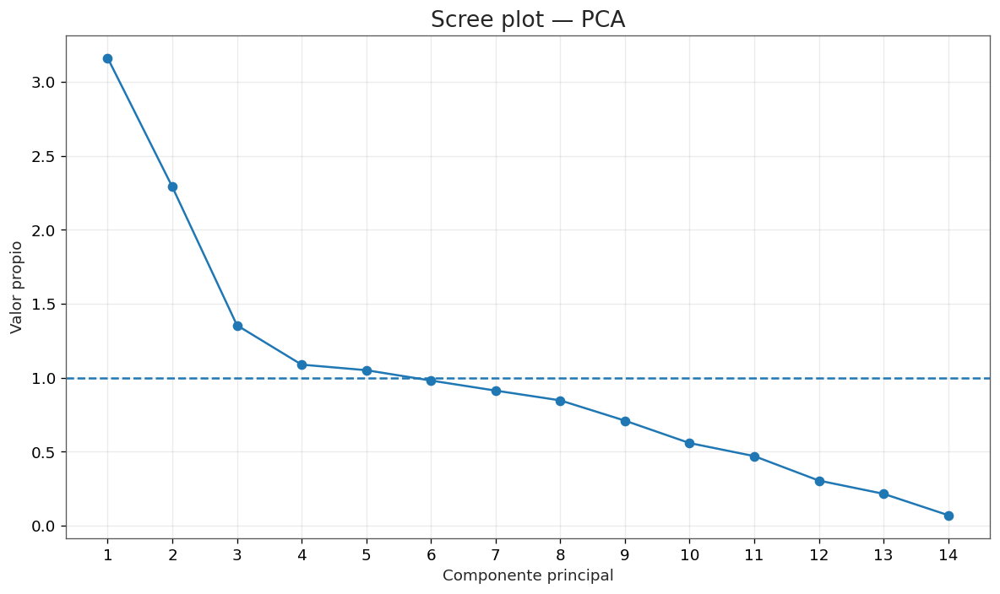


✓ Scree plot generado.


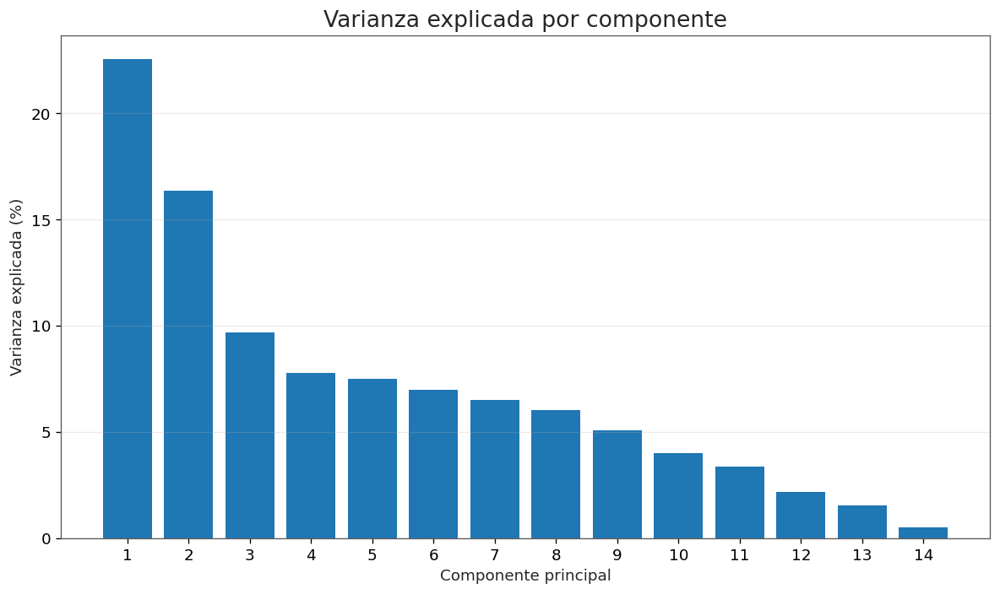

✓ Gráfico de varianza explicada generado.


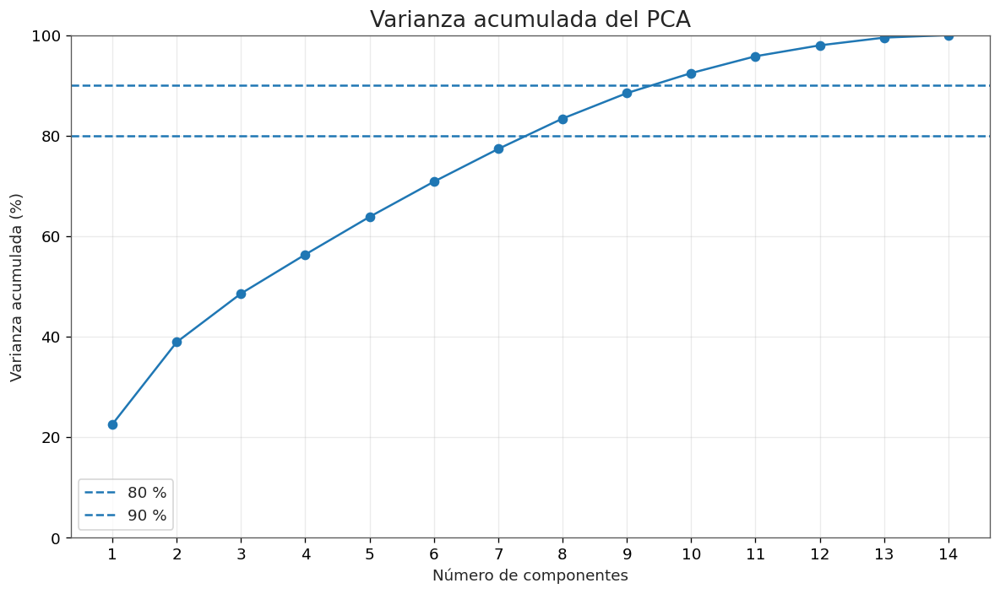

✓ Gráfico de varianza acumulada generado.


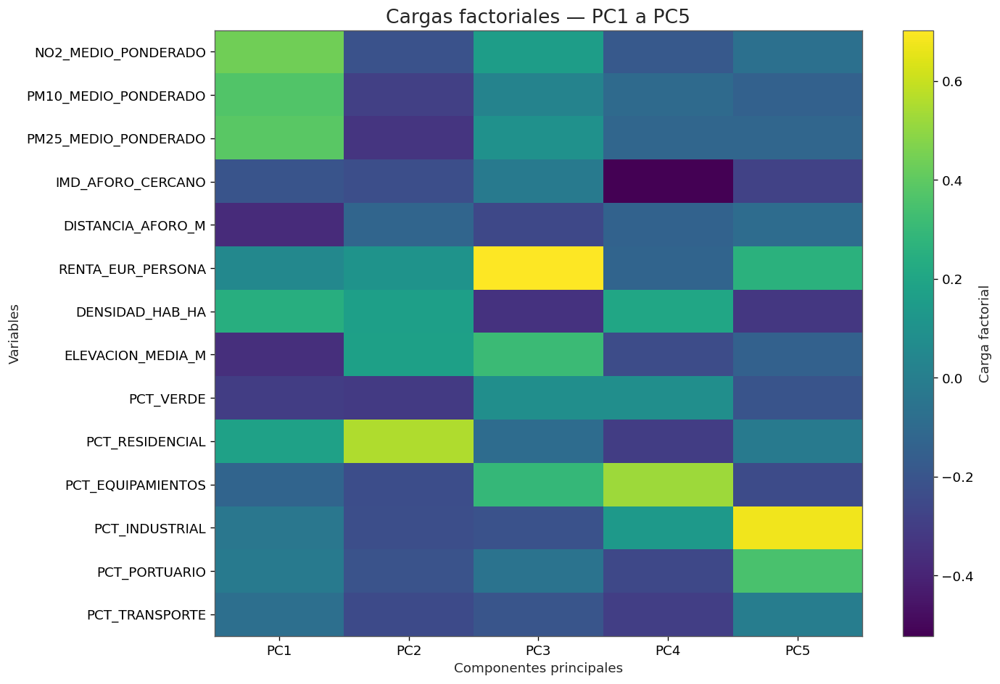

✓ Matriz gráfica de cargas factoriales generada.


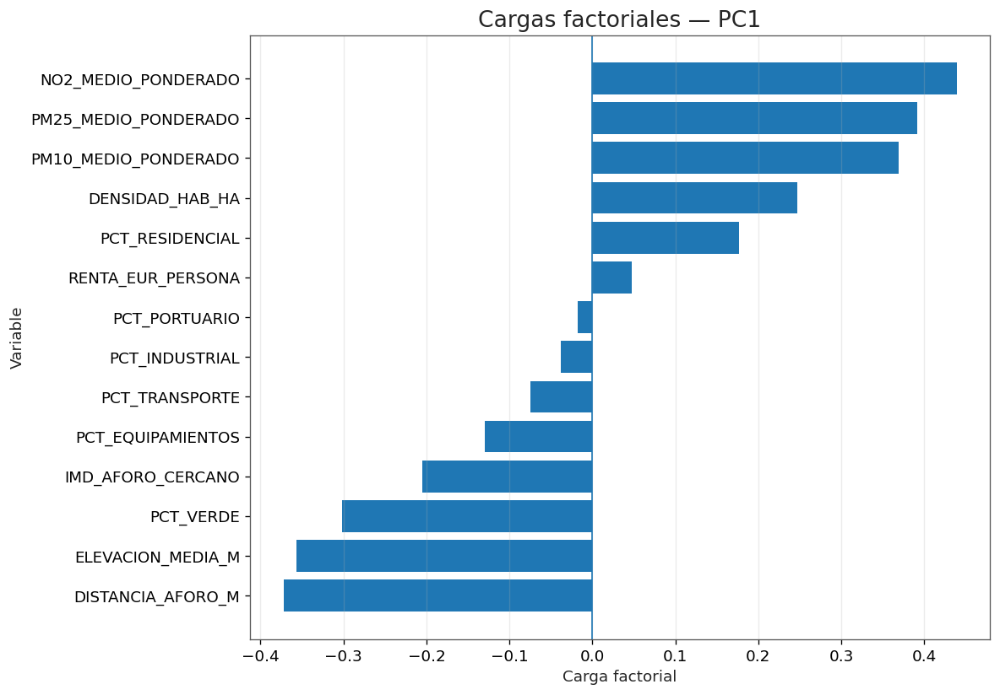

✓ Gráfico de cargas de PC1 generado.

RESUMEN NUMÉRICO PARA VISUALIZACIÓN


,COMPONENTE,VALOR_PROPIO,VARIANZA_%,VARIANZA_ACUMULADA_%
0,PC1,3.162,22.564,22.564
1,PC2,2.290,16.343,38.907
2,PC3,1.354,9.666,48.573
3,PC4,1.088,7.766,56.340
4,PC5,1.051,7.498,63.838
5,PC6,0.981,6.999,70.836
6,PC7,0.913,6.514,77.350
7,PC8,0.847,6.042,83.392
8,PC9,0.710,5.065,88.457
9,PC10,0.558,3.982,92.439



RESUMEN FINAL — CELDA 39

✓ Scree plot generado.
✓ Varianza explicada representada.
✓ Varianza acumulada representada.
✓ Cargas factoriales PC1–PC5 representadas.
✓ Cargas específicas de PC1 representadas.

✓ VISUALIZACIÓN DEL PCA COMPLETADA.
✓ LISTA PARA EL ANÁLISIS ESPACIAL DE LOS COMPONENTES.


In [41]:
# ============================================================
# 39. VISUALIZACIÓN DEL PCA
# FASE 3 — ANÁLISIS MULTIVARIANTE
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

print("=" * 100)
print("39. VISUALIZACIÓN DEL PCA")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN
# ============================================================

if "pca" not in globals():
    raise NameError(
        "No existe 'pca'. Ejecuta la celda 37 antes de continuar."
    )

if "pca_varianza" not in globals():
    raise NameError(
        "No existe 'pca_varianza'. Ejecuta la celda 37 antes de continuar."
    )

if "cargas_pca" not in globals():
    raise NameError(
        "No existe 'cargas_pca'. Ejecuta la celda 37 antes de continuar."
    )

print("\n✓ Objetos PCA disponibles.")

# ============================================================
# 2. FIGURA 1 — SCREE PLOT
# ============================================================

componentes = np.arange(
    1,
    len(pca.explained_variance_) + 1
)

valores_propios = (
    pca.explained_variance_
)

plt.figure(figsize=(10, 6))

plt.plot(
    componentes,
    valores_propios,
    marker="o"
)

plt.axhline(
    1,
    linestyle="--"
)

plt.xlabel(
    "Componente principal"
)

plt.ylabel(
    "Valor propio"
)

plt.title(
    "Scree plot — PCA"
)

plt.xticks(
    componentes
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.show()

print(
    "\n✓ Scree plot generado."
)

# ============================================================
# 3. FIGURA 2 — VARIANZA EXPLICADA
# ============================================================

varianza_pct = (
    pca.explained_variance_ratio_
    * 100
)

varianza_acumulada_pct = (
    np.cumsum(
        varianza_pct
    )
)

plt.figure(figsize=(10, 6))

plt.bar(
    componentes,
    varianza_pct
)

plt.xlabel(
    "Componente principal"
)

plt.ylabel(
    "Varianza explicada (%)"
)

plt.title(
    "Varianza explicada por componente"
)

plt.xticks(
    componentes
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.show()

print(
    "✓ Gráfico de varianza explicada generado."
)

# ============================================================
# 4. FIGURA 3 — VARIANZA ACUMULADA
# ============================================================

plt.figure(figsize=(10, 6))

plt.plot(
    componentes,
    varianza_acumulada_pct,
    marker="o"
)

plt.axhline(
    80,
    linestyle="--",
    label="80 %"
)

plt.axhline(
    90,
    linestyle="--",
    label="90 %"
)

plt.xlabel(
    "Número de componentes"
)

plt.ylabel(
    "Varianza acumulada (%)"
)

plt.title(
    "Varianza acumulada del PCA"
)

plt.xticks(
    componentes
)

plt.ylim(
    0,
    100
)

plt.legend()

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.show()

print(
    "✓ Gráfico de varianza acumulada generado."
)

# ============================================================
# 5. FIGURA 4 — CARGAS FACTORIALES PC1-PC5
# ============================================================

componentes_grafico = [
    "PC1",
    "PC2",
    "PC3",
    "PC4",
    "PC5"
]

cargas_grafico = (
    cargas_pca[
        componentes_grafico
    ]
)

plt.figure(
    figsize=(12, 8)
)

plt.imshow(
    cargas_grafico.values,
    aspect="auto"
)

plt.colorbar(
    label="Carga factorial"
)

plt.xticks(
    np.arange(
        len(componentes_grafico)
    ),
    componentes_grafico
)

plt.yticks(
    np.arange(
        len(cargas_grafico.index)
    ),
    cargas_grafico.index
)

plt.xlabel(
    "Componentes principales"
)

plt.ylabel(
    "Variables"
)

plt.title(
    "Cargas factoriales — PC1 a PC5"
)

plt.tight_layout()

plt.show()

print(
    "✓ Matriz gráfica de cargas factoriales generada."
)

# ============================================================
# 6. FIGURA 5 — CARGAS DE PC1
# ============================================================

pc = "PC1"

cargas_pc1 = (
    cargas_pca[pc]
    .sort_values()
)

plt.figure(
    figsize=(10, 7)
)

plt.barh(
    cargas_pc1.index,
    cargas_pc1.values
)

plt.axvline(
    0,
    linewidth=1
)

plt.xlabel(
    "Carga factorial"
)

plt.ylabel(
    "Variable"
)

plt.title(
    "Cargas factoriales — PC1"
)

plt.grid(
    axis="x",
    alpha=0.25
)

plt.tight_layout()

plt.show()

print(
    "✓ Gráfico de cargas de PC1 generado."
)

# ============================================================
# 7. RESUMEN NUMÉRICO PARA LAS FIGURAS
# ============================================================

resumen_graficos_pca = pd.DataFrame({

    "COMPONENTE":
        [
            f"PC{i}"
            for i in componentes
        ],

    "VALOR_PROPIO":
        valores_propios,

    "VARIANZA_%":
        varianza_pct,

    "VARIANZA_ACUMULADA_%":
        varianza_acumulada_pct
})

print("\n" + "=" * 100)
print("RESUMEN NUMÉRICO PARA VISUALIZACIÓN")
print("=" * 100)

display(
    resumen_graficos_pca.round(3)
)

# ============================================================
# 8. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 39")
print("=" * 100)

print(
    "\n✓ Scree plot generado."
)

print(
    "✓ Varianza explicada representada."
)

print(
    "✓ Varianza acumulada representada."
)

print(
    "✓ Cargas factoriales PC1–PC5 representadas."
)

print(
    "✓ Cargas específicas de PC1 representadas."
)

print(
    "\n✓ VISUALIZACIÓN DEL PCA COMPLETADA."
)

print(
    "✓ LISTA PARA EL ANÁLISIS ESPACIAL DE LOS COMPONENTES."
)

### Resultados

### Visualización del análisis de componentes principales

Se han generado las principales representaciones gráficas del PCA para
facilitar la interpretación de su estructura factorial.

### Scree plot

El scree plot muestra un descenso pronunciado de los valores propios en los
primeros componentes, seguido de una progresiva estabilización.

Los cinco primeros componentes presentan valores propios superiores a 1,
mientras que PC6 presenta un valor propio de 0,981, prácticamente igual al
umbral de Kaiser.

La representación gráfica respalda, por tanto, la consideración inicial de
**cinco componentes principales**, sin descartar que PC6 pueda analizarse
como componente limítrofe en una fase posterior.

### Varianza explicada

Los cinco primeros componentes explican conjuntamente el **63,84 % de la
varianza total**:

- PC1: 22,56 %
- PC2: 16,34 %
- PC3: 9,67 %
- PC4: 7,77 %
- PC5: 7,50 %

La varianza acumulada alcanza el 70,84 % con seis componentes, el 83,39 %
con ocho y el 92,44 % con diez.

### Estructura de las cargas factoriales

La matriz de cargas factoriales permite identificar cinco dimensiones
principales:

**PC1 — dimensión ambiental y contexto territorial**

Presenta las mayores cargas positivas en NO₂, PM2.5 y PM10, mientras que
distancia al aforo, elevación y porcentaje de superficie verde presentan
cargas negativas. El componente puede interpretarse como una dimensión
ambiental asociada al contexto urbano y a la proximidad al tráfico.

**PC2 — estructura residencial**

Está dominado por el porcentaje de suelo residencial y presenta relaciones
negativas con PM2.5, vegetación y PM10.

**PC3 — dimensión socioeconómica y urbana**

Presenta una contribución especialmente elevada de la renta por persona,
acompañada por variables de densidad, elevación y equipamientos.

**PC4 — equipamientos frente a intensidad de tráfico**

Se caracteriza principalmente por la oposición entre el porcentaje de
equipamientos y la intensidad de tráfico medida mediante el IMD del aforo
más cercano.

**PC5 — actividad industrial y portuaria**

Está dominado por el porcentaje de suelo industrial, acompañado por
variables relacionadas con la actividad portuaria, densidad y tráfico.

### Visualización de PC1

El gráfico específico de cargas de PC1 permite observar con claridad la
estructura del primer eje factorial.

Las variables de contaminación presentan cargas positivas y relativamente
elevadas, mientras que distancia al aforo, elevación y superficie verde
presentan cargas negativas.

Esta estructura resulta especialmente relevante para el objetivo del TFM,
ya que conecta la distribución espacial de la contaminación con
características del entorno urbano y la movilidad.

### Resultado final

- **14 variables analizadas.**
- **14 componentes calculados.**
- **5 componentes con valor propio > 1.**
- **PC6 presenta un valor propio de 0,981**, próximo al umbral de Kaiser.
- **63,84 % de varianza acumulada con PC1–PC5.**
- **83,39 % con los ocho primeros componentes.**
- **92,44 % con los diez primeros componentes.**
- Scree plot generado.
- Varianza individual y acumulada representadas.
- Cargas factoriales PC1–PC5 visualizadas.
- Cargas de PC1 representadas individualmente.

### Conclusión

La representación gráfica confirma que los primeros cinco componentes
concentran una parte sustancial de la información y presentan una
interpretación territorial coherente.

La estructura obtenida justifica continuar el análisis espacial utilizando
inicialmente **PC1–PC5**, manteniendo PC6 como componente limítrofe para una
posible comprobación de sensibilidad.


## 40 . Distribución espacial de los componentes PCA

### Fase 3 — Análisis espacial y multivariante

Una vez identificados los principales componentes mediante el PCA, esta
celda traslada sus **scores al espacio geográfico** de las 1.068 secciones
censales.

El objetivo es comprobar si las dimensiones estadísticas obtenidas presentan
también **patrones territoriales reconocibles** en Barcelona.

### Componentes representados

Se cartografiarán individualmente los cinco componentes seleccionados:

- **PC1**
- **PC2**
- **PC3**
- **PC4**
- **PC5**

Para cada componente se generará un mapa coroplético a nivel de sección
censal.

### Control de los scores

Antes de realizar la representación se comprobará:

- cobertura de los scores;
- ausencia de valores nulos;
- estadísticos descriptivos;
- percentiles de los scores;
- valores máximos y mínimos.

Estos controles permitirán identificar posibles valores extremos y conocer la
distribución espacial de cada dimensión.

### Análisis espacial exploratorio

La representación permitirá comprobar visualmente si los componentes
identificados estadísticamente presentan:

- concentración espacial de valores elevados;
- concentración de valores bajos;
- gradientes territoriales;
- patrones asociados a determinadas áreas urbanas;
- posibles agrupaciones espaciales.

En particular, se prestará especial atención a **PC1**, al representar la
principal dimensión asociada a contaminación y contexto territorial.

### Integridad espacial

Los mapas se construirán manteniendo:

- las **1.068 secciones censales**;
- la geometría original;
- el CRS **EPSG:25831**;
- la correspondencia entre cada sección y sus scores PCA.

No se modificarán `base_maestra`, `base_multivariante` ni los resultados
originales del PCA.

### Objetivo

Obtener una primera lectura espacial de las dimensiones latentes identificadas
por el PCA.

Los patrones observados servirán como base para el siguiente análisis de
**autocorrelación espacial**, donde se comprobará estadísticamente si la
distribución territorial de los componentes presenta agrupación espacial
significativa.



40. DISTRIBUCIÓN ESPACIAL DE LOS COMPONENTES PCA

✓ Base espacial PCA disponible.
Componentes a representar : 5

CONTROL DE COBERTURA ESPACIAL
PC1   | válidos=1,068 | nulos=0
PC2   | válidos=1,068 | nulos=0
PC3   | válidos=1,068 | nulos=0
PC4   | válidos=1,068 | nulos=0
PC5   | válidos=1,068 | nulos=0

ESTADÍSTICA DE LOS SCORES ESPACIALES


,COMPONENTE,MEDIA,MEDIANA,DESVIACIÓN,MÍNIMO,MÁXIMO
0,PC1,0.0,0.044,1.778,-13.557,4.186
1,PC2,0.0,0.299,1.513,-7.126,2.612
2,PC3,-0.0,-0.179,1.164,-3.758,4.675
3,PC4,0.0,-0.001,1.043,-5.783,3.642
4,PC5,0.0,-0.060,1.025,-2.721,7.729



GENERANDO MAPAS ESPACIALES


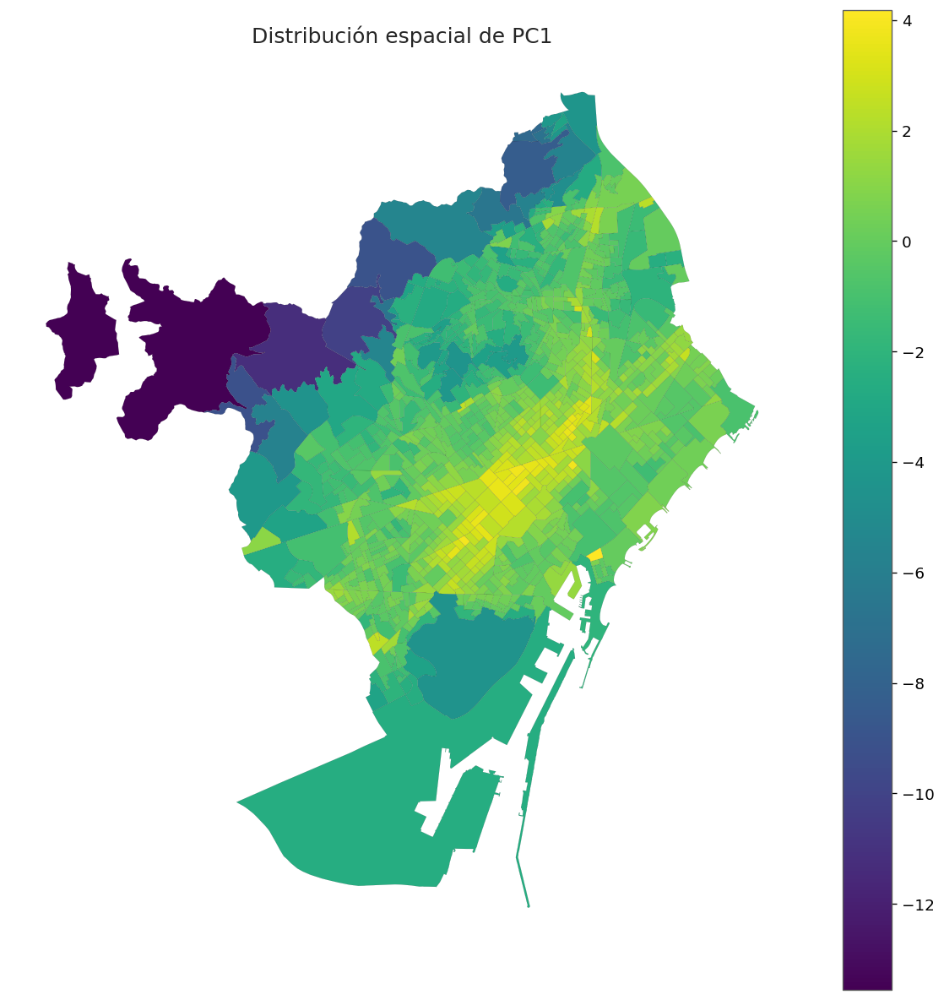

✓ Mapa PC1 generado.


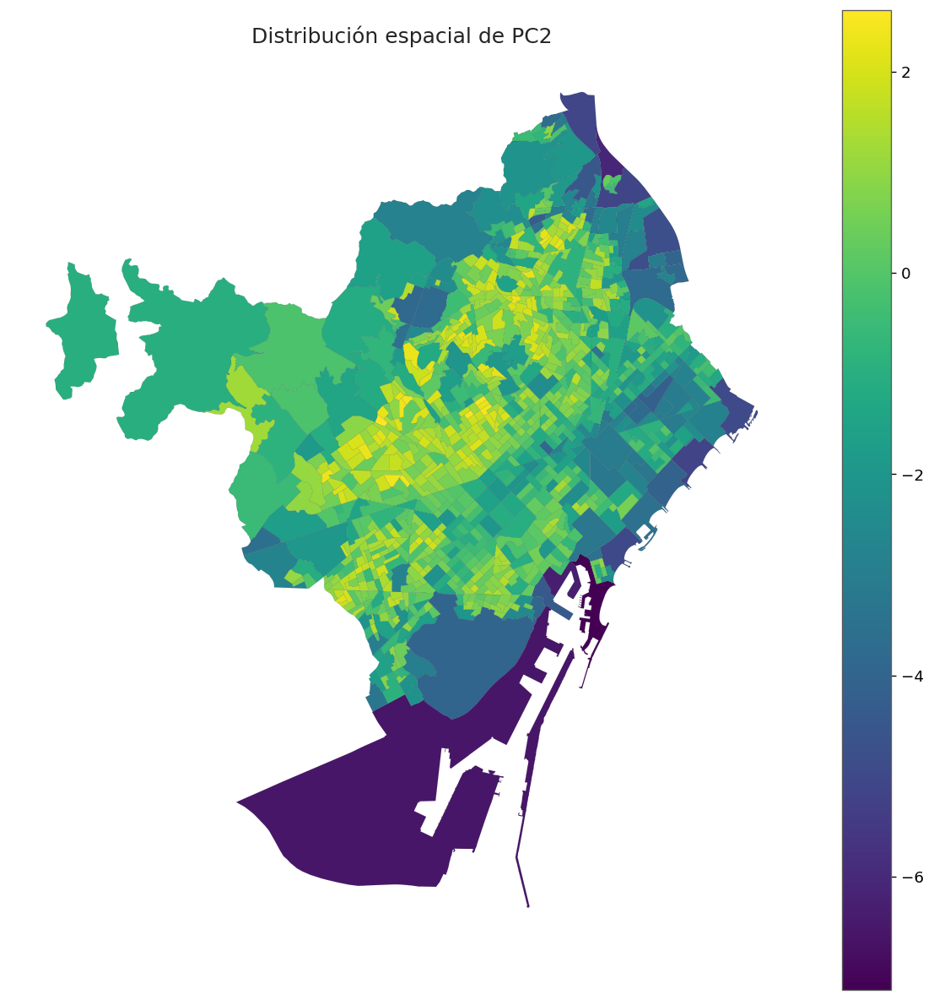

✓ Mapa PC2 generado.


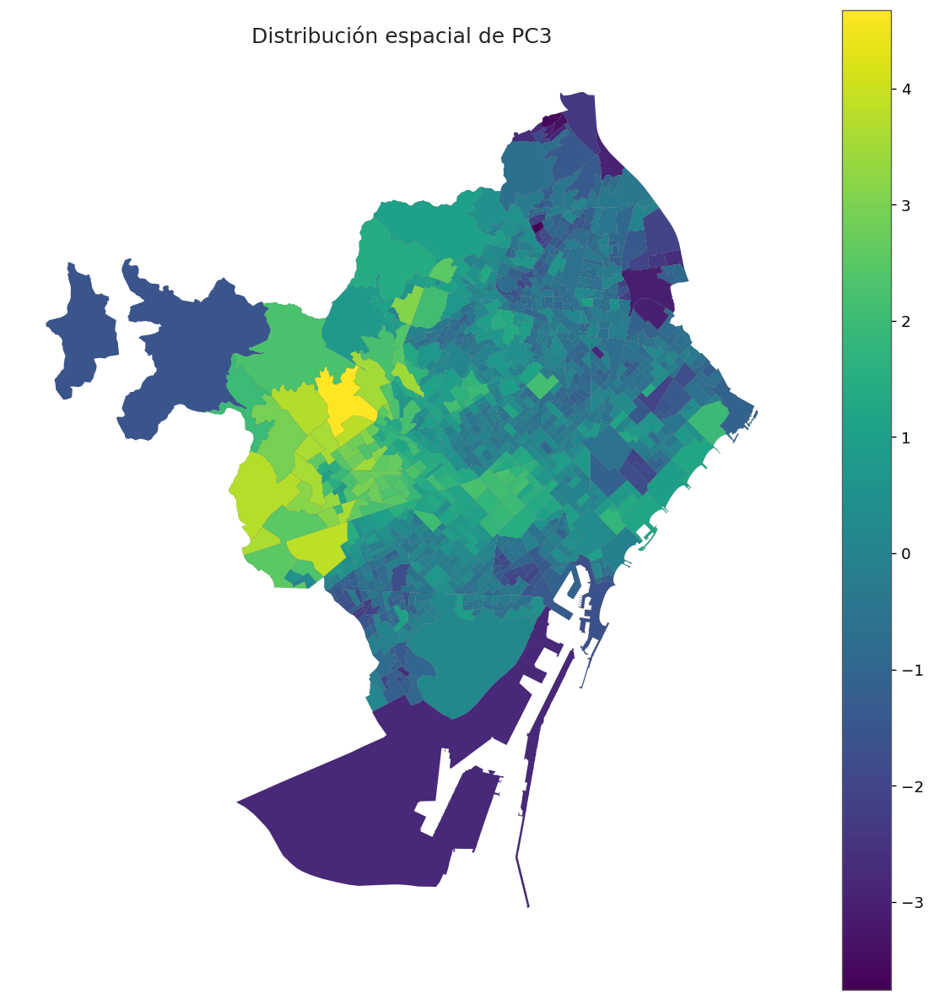

✓ Mapa PC3 generado.


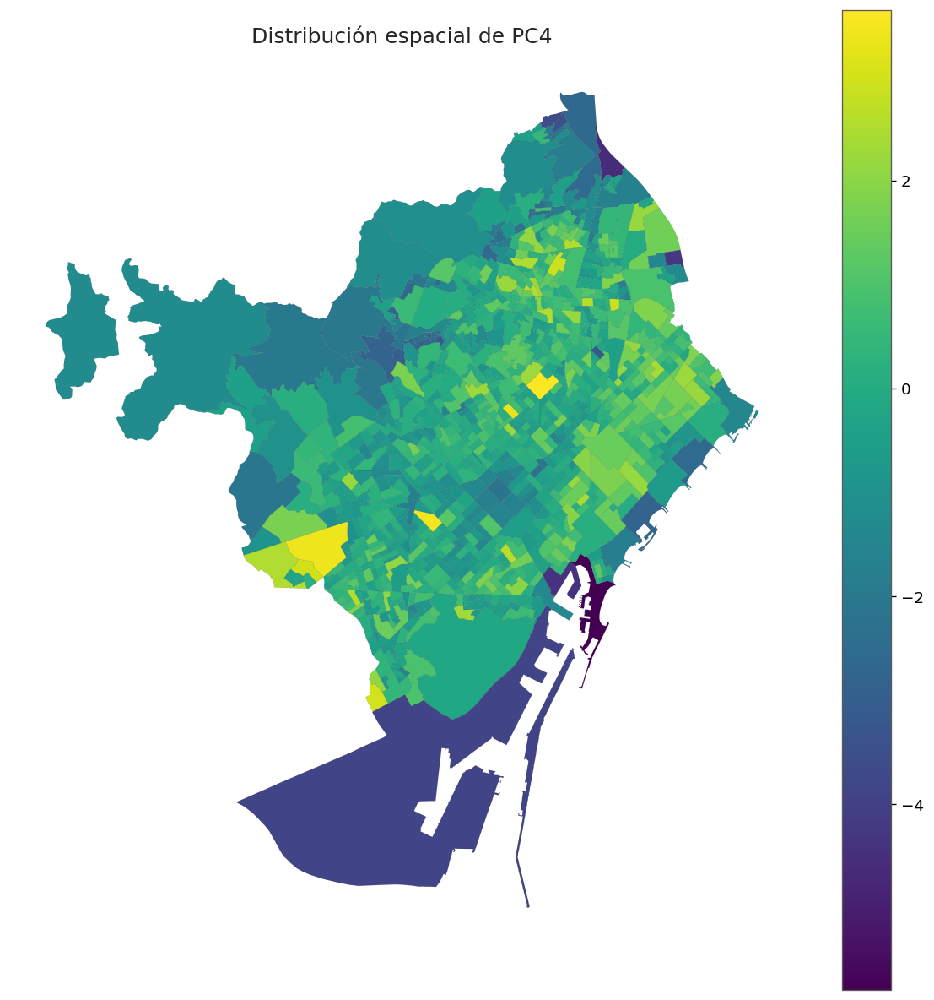

✓ Mapa PC4 generado.


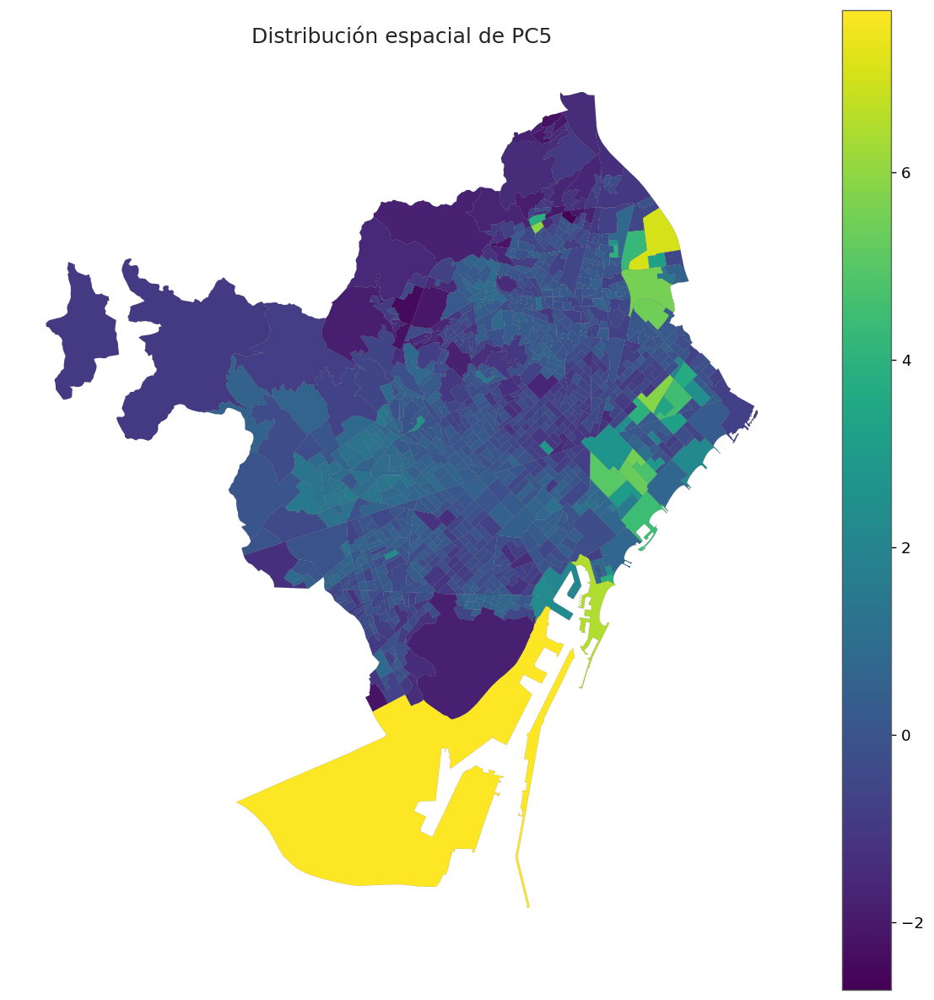

✓ Mapa PC5 generado.

COMPARACIÓN DE COMPONENTES


,COMPONENTE,P05,P25,P50,P75,P95
0,PC1,-2.658,-0.811,0.044,0.993,2.630
1,PC2,-2.883,-0.881,0.299,1.084,1.970
2,PC3,-1.649,-0.695,-0.179,0.593,2.240
3,PC4,-1.670,-0.579,-0.001,0.546,1.736
4,PC5,-1.247,-0.532,-0.060,0.320,1.259



SECCIONES CON SCORES EXTREMOS

PC1
  Máximo : 4.186 | sección = 01_03_042
  Mínimo : -13.557 | sección = 05_22_001

PC2
  Máximo : 2.612 | sección = 05_25_039
  Mínimo : -7.126 | sección = 01_03_032

PC3
  Máximo : 4.675 | sección = 05_25_032
  Mínimo : -3.758 | sección = 08_51_078

PC4
  Máximo : 3.642 | sección = 07_35_039
  Mínimo : -5.783 | sección = 01_03_032

PC5
  Máximo : 7.729 | sección = 03_12_025
  Mínimo : -2.721 | sección = 08_52_102

CONTROL GEOMÉTRICO
Secciones : 1,068
Geometrías nulas : 0
Geometrías vacías : 0
Geometrías inválidas : 0
CRS : EPSG:25831

RESUMEN FINAL — CELDA 40

Secciones cartografiadas : 1,068
Componentes representados : 5

✓ PC1 representado espacialmente.
✓ PC2 representado espacialmente.
✓ PC3 representado espacialmente.
✓ PC4 representado espacialmente.
✓ PC5 representado espacialmente.
✓ Cobertura espacial completa.
✓ Geometrías comprobadas.

✓ DISTRIBUCIÓN ESPACIAL DEL PCA COMPLETADA.
✓ LISTA PARA EL ANÁLISIS DE AUTOCORRELACIÓN ESPACIAL.


In [42]:
# ============================================================
# 40. DISTRIBUCIÓN ESPACIAL DE LOS COMPONENTES PCA
# FASE 3 — ANÁLISIS ESPACIAL Y MULTIVARIANTE
# ============================================================

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

print("=" * 100)
print("40. DISTRIBUCIÓN ESPACIAL DE LOS COMPONENTES PCA")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "base_pca" not in globals():
    raise NameError(
        "No existe 'base_pca'. Ejecuta la celda 37 antes de continuar."
    )

if "scores_pca_seleccionados" not in globals():
    raise NameError(
        "No existe 'scores_pca_seleccionados'. "
        "Ejecuta la celda 38 antes de continuar."
    )

print("\n✓ Base espacial PCA disponible.")

# ============================================================
# 2. COMPONENTES A REPRESENTAR
# ============================================================

componentes_mapa = [
    "PC1",
    "PC2",
    "PC3",
    "PC4",
    "PC5"
]

faltantes = [
    pc
    for pc in componentes_mapa
    if pc not in base_pca.columns
]

if faltantes:
    raise KeyError(
        "Faltan componentes en base_pca: "
        + ", ".join(faltantes)
    )

print(
    f"Componentes a representar : "
    f"{len(componentes_mapa)}"
)

# ============================================================
# 3. CONTROL DE COBERTURA
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE COBERTURA ESPACIAL")
print("=" * 100)

for pc in componentes_mapa:

    validos = (
        base_pca[pc]
        .notna()
        .sum()
    )

    nulos = (
        base_pca[pc]
        .isna()
        .sum()
    )

    print(
        f"{pc:<5} | "
        f"válidos={validos:,} | "
        f"nulos={nulos:,}"
    )

    if nulos > 0:
        raise ValueError(
            f"{pc} contiene valores nulos."
        )

# ============================================================
# 4. RESUMEN ESTADÍSTICO DE LOS SCORES
# ============================================================

resumen_scores = []

for pc in componentes_mapa:

    serie = base_pca[pc]

    resumen_scores.append({

        "COMPONENTE":
            pc,

        "MEDIA":
            serie.mean(),

        "MEDIANA":
            serie.median(),

        "DESVIACIÓN":
            serie.std(),

        "MÍNIMO":
            serie.min(),

        "MÁXIMO":
            serie.max()
    })

resumen_scores = pd.DataFrame(
    resumen_scores
)

print("\n" + "=" * 100)
print("ESTADÍSTICA DE LOS SCORES ESPACIALES")
print("=" * 100)

display(
    resumen_scores.round(3)
)

# ============================================================
# 5. MAPAS INDIVIDUALES
# ============================================================

print("\n" + "=" * 100)
print("GENERANDO MAPAS ESPACIALES")
print("=" * 100)

for pc in componentes_mapa:

    fig, ax = plt.subplots(
        figsize=(10, 10)
    )

    base_pca.plot(
        column=pc,
        ax=ax,
        legend=True,
        edgecolor="black",
        linewidth=0.05,
        missing_kwds={
            "color": "lightgrey",
            "label": "Sin datos"
        }
    )

    ax.set_title(
        f"Distribución espacial de {pc}",
        fontsize=15
    )

    ax.set_axis_off()

    plt.tight_layout()

    plt.show()

    print(
        f"✓ Mapa {pc} generado."
    )

# ============================================================
# 6. COMPARACIÓN ESPACIAL NORMALIZADA
# ============================================================

print("\n" + "=" * 100)
print("COMPARACIÓN DE COMPONENTES")
print("=" * 100)

# Percentiles para identificar valores extremos
# sin alterar los scores originales.

percentiles_pca = []

for pc in componentes_mapa:

    serie = base_pca[pc]

    percentiles_pca.append({

        "COMPONENTE":
            pc,

        "P05":
            serie.quantile(0.05),

        "P25":
            serie.quantile(0.25),

        "P50":
            serie.quantile(0.50),

        "P75":
            serie.quantile(0.75),

        "P95":
            serie.quantile(0.95)
    })

percentiles_pca = pd.DataFrame(
    percentiles_pca
)

display(
    percentiles_pca.round(3)
)

# ============================================================
# 7. LOCALIZACIÓN DE VALORES EXTREMOS
# ============================================================

print("\n" + "=" * 100)
print("SECCIONES CON SCORES EXTREMOS")
print("=" * 100)

for pc in componentes_mapa:

    serie = base_pca[pc]

    indice_max = serie.idxmax()
    indice_min = serie.idxmin()

    print(
        f"\n{pc}"
    )

    print(
        f"  Máximo : "
        f"{serie.loc[indice_max]:.3f} | "
        f"sección = "
        f"{base_pca.loc[indice_max, 'CLAVE_SECCION']}"
    )

    print(
        f"  Mínimo : "
        f"{serie.loc[indice_min]:.3f} | "
        f"sección = "
        f"{base_pca.loc[indice_min, 'CLAVE_SECCION']}"
    )

# ============================================================
# 8. CONTROL GEOMÉTRICO
# ============================================================

print("\n" + "=" * 100)
print("CONTROL GEOMÉTRICO")
print("=" * 100)

print(
    f"Secciones : "
    f"{len(base_pca):,}"
)

print(
    f"Geometrías nulas : "
    f"{base_pca.geometry.isna().sum():,}"
)

print(
    f"Geometrías vacías : "
    f"{base_pca.geometry.is_empty.sum():,}"
)

print(
    f"Geometrías inválidas : "
    f"{(~base_pca.geometry.is_valid).sum():,}"
)

print(
    f"CRS : "
    f"{base_pca.crs}"
)

if (
    base_pca.geometry.isna().sum()
    > 0
):

    raise ValueError(
        "Existen geometrías nulas."
    )

if (
    base_pca.geometry.is_empty.sum()
    > 0
):

    raise ValueError(
        "Existen geometrías vacías."
    )

if (
    (~base_pca.geometry.is_valid).sum()
    > 0
):

    raise ValueError(
        "Existen geometrías inválidas."
    )

# ============================================================
# 9. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 40")
print("=" * 100)

print(
    f"\nSecciones cartografiadas : "
    f"{len(base_pca):,}"
)

print(
    f"Componentes representados : "
    f"{len(componentes_mapa)}"
)

print(
    "\n✓ PC1 representado espacialmente."
)

print(
    "✓ PC2 representado espacialmente."
)

print(
    "✓ PC3 representado espacialmente."
)

print(
    "✓ PC4 representado espacialmente."
)

print(
    "✓ PC5 representado espacialmente."
)

print(
    "✓ Cobertura espacial completa."
)

print(
    "✓ Geometrías comprobadas."
)

print(
    "\n✓ DISTRIBUCIÓN ESPACIAL DEL PCA COMPLETADA."
)

print(
    "✓ LISTA PARA EL ANÁLISIS DE AUTOCORRELACIÓN ESPACIAL."
)


### Resultados
La representación espacial de los cinco primeros componentes principales permite
comprobar que las dimensiones latentes identificadas mediante el PCA presentan
patrones territoriales diferenciados dentro de Barcelona.

Los cinco componentes presentan **cobertura completa sobre las 1.068 secciones
censales**, sin valores nulos y con geometrías espaciales válidas.

### Distribución de los componentes

**PC1** presenta el patrón espacial más marcado. Se observa una diferenciación
territorial clara entre las zonas occidentales y noroccidentales, con valores
más bajos, y buena parte del tejido urbano central y meridional, donde aparecen
valores más elevados. Este comportamiento es coherente con el peso de las
variables de contaminación y densidad identificado previamente en las cargas
factoriales.

**PC2** muestra una estructura espacial diferente, con valores elevados
concentrados principalmente en áreas interiores del tejido urbano y valores
más bajos hacia determinadas zonas periféricas y portuarias. La distribución
confirma que esta componente aporta una dimensión territorial distinta de PC1.

**PC3** presenta un patrón más localizado y heterogéneo, con valores elevados
especialmente hacia el sector occidental y valores más reducidos en diferentes
ámbitos del norte y del litoral.

**PC4** presenta igualmente una distribución espacial heterogénea, con
concentraciones locales de valores elevados y reducidos. Su patrón es menos
estructurado que el observado para PC1 y PC2.

**PC5** destaca por una fuerte diferenciación espacial asociada a determinadas
zonas periféricas y, especialmente, al ámbito portuario. Presenta además una
dispersión elevada de los valores positivos, con un máximo de **7.729**.

### Rango de los componentes

| Componente | Mínimo | Máximo | P05 | P95 |
|---|---:|---:|---:|---:|
| PC1 | -13.557 | 4.186 | -2.658 | 2.630 |
| PC2 | -7.126 | 2.612 | -2.883 | 1.970 |
| PC3 | -3.758 | 4.675 | -1.649 | 2.240 |
| PC4 | -5.783 | 3.642 | -1.670 | 1.736 |
| PC5 | -2.721 | 7.729 | -1.247 | 1.259 |

La amplitud de los scores confirma que las componentes presentan distribuciones
territoriales diferentes. En particular, PC1 y PC2 muestran rangos amplios,
mientras que PC5 presenta valores extremos positivos asociados a determinadas
áreas.

### Integridad de la información espacial

El control realizado confirma:

- **1.068 secciones cartografiadas**.
- **1.068 valores válidos** para cada componente.
- **0 geometrías nulas**.
- **0 geometrías vacías**.
- **0 geometrías inválidas**.
- CRS **EPSG:25831**.

### Interpretación

Los mapas muestran que las dimensiones obtenidas mediante PCA **no se
distribuyen aleatoriamente en el territorio**, sino que presentan estructuras
espaciales reconocibles.

No obstante, esta observación es todavía **exploratoria**. La existencia de
agrupación espacial debe contrastarse estadísticamente mediante medidas de
autocorrelación espacial.

Por este motivo, el siguiente paso será aplicar **Moran's I global a PC1–PC5**
para determinar qué componentes presentan autocorrelación espacial
estadísticamente significativa. Posteriormente, los componentes significativos
podrán analizarse mediante **Moran local (LISA)** para localizar agrupaciones
espaciales concretas.




## 41 . Autocorrelación espacial global — Moran's I

### Fase 3 — Análisis espacial y preparación de la regresión

Tras analizar la distribución espacial de los componentes principales, se realiza un
contraste estadístico de **autocorrelación espacial global** mediante el estadístico
de **Moran's I**.

El objetivo es determinar si los valores de los componentes PCA presentan una
distribución espacial significativamente agrupada, dispersa o aleatoria.

### Componentes analizados

El contraste se realizará para:

- **PC1**
- **PC2**
- **PC3**
- **PC4**
- **PC5**

Cada componente se analizará sobre las **1.068 secciones censales**.

### Matriz de pesos espaciales

Se construirá inicialmente una matriz de contigüidad **Queen**, basada en la
adyacencia entre secciones censales.

Se comprobará previamente la existencia de posibles secciones sin vecinos. En caso
de existir islas espaciales, se utilizará una matriz **KNN de 8 vecinos** para
garantizar la conectividad espacial.

Los pesos se estandarizarán por filas antes de calcular el estadístico.

### Contraste estadístico

Para cada componente se calcularán:

- **Moran's I**;
- valor esperado bajo la hipótesis nula;
- **z-score**;
- **p-valor**;
- significación estadística al 5 % y al 1 %.

La significación se evaluará mediante **999 permutaciones**, proporcionando un
contraste no paramétrico de la hipótesis de ausencia de autocorrelación espacial.

### Interpretación

Un valor positivo y significativo de Moran's I indicará **autocorrelación espacial
positiva**, es decir, una tendencia de valores similares a concentrarse
territorialmente.

Un valor negativo y significativo indicará **autocorrelación espacial negativa**,
asociada a una distribución espacial más dispersa de valores similares.

Si el contraste no resulta significativo, no habrá evidencia estadística suficiente
para afirmar la existencia de autocorrelación espacial global.

### Relación con la regresión

Este análisis constituye un **diagnóstico espacial previo al modelado de
regresión**.

Los resultados permitirán determinar si las dimensiones territoriales obtenidas
mediante PCA presentan dependencia espacial que deba tenerse en cuenta
posteriormente en la construcción y validación del modelo de regresión.

No se modifican los scores PCA ni la base maestra durante este análisis.



In [43]:

# ============================================================
# 41. AUTOCORRELACIÓN ESPACIAL GLOBAL — MORAN'S I
# FASE 3 — ANÁLISIS ESPACIAL Y PREPARACIÓN DE LA REGRESIÓN
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from libpysal.weights import Queen, KNN
from esda.moran import Moran

print("=" * 100)
print("41. AUTOCORRELACIÓN ESPACIAL GLOBAL — MORAN'S I")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE LA BASE
# ============================================================

if "base_pca" not in globals():
    raise NameError(
        "No existe 'base_pca'. Ejecuta las celdas anteriores antes de continuar."
    )

componentes_moran = [
    "PC1",
    "PC2",
    "PC3",
    "PC4",
    "PC5"
]

faltantes = [
    pc for pc in componentes_moran
    if pc not in base_pca.columns
]

if faltantes:
    raise KeyError(
        "Faltan componentes PCA: "
        + ", ".join(faltantes)
    )

print("\n✓ Base PCA disponible.")
print(f"Secciones censales : {len(base_pca):,}")
print(f"Componentes        : {len(componentes_moran)}")
print(f"CRS                : {base_pca.crs}")

# ============================================================
# 2. CONTROL GEOMÉTRICO
# ============================================================

print("\n" + "=" * 100)
print("CONTROL GEOMÉTRICO")
print("=" * 100)

nulos_geom = base_pca.geometry.isna().sum()
vacias_geom = base_pca.geometry.is_empty.sum()
invalidas_geom = (~base_pca.geometry.is_valid).sum()

print(f"Geometrías nulas     : {nulos_geom:,}")
print(f"Geometrías vacías    : {vacias_geom:,}")
print(f"Geometrías inválidas : {invalidas_geom:,}")

if nulos_geom > 0:
    raise ValueError("Existen geometrías nulas.")

if vacias_geom > 0:
    raise ValueError("Existen geometrías vacías.")

if invalidas_geom > 0:
    raise ValueError("Existen geometrías inválidas.")

# ============================================================
# 3. MATRIZ DE VECINDAD QUEEN
# ============================================================

print("\n" + "=" * 100)
print("CONSTRUCCIÓN DE LA MATRIZ DE VECINDAD")
print("=" * 100)

print("\nConstruyendo vecinos Queen...")

w_queen = Queen.from_dataframe(
    base_pca,
    use_index=True
)

print(
    f"Secciones : {w_queen.n:,}"
)

print(
    f"Islas     : {len(w_queen.islands):,}"
)

print(
    f"Vecinos totales : "
    f"{sum(len(v) for v in w_queen.neighbors.values()):,}"
)

# ============================================================
# 4. CONTROL DE ISLAS
# ============================================================

if len(w_queen.islands) > 0:

    print("\n⚠ Se han detectado secciones sin vecinos Queen.")

    print(
        f"Islas detectadas : "
        f"{len(w_queen.islands):,}"
    )

    print(
        "\nSe utilizará una matriz KNN de 8 vecinos "
        "para garantizar conectividad espacial."
    )

    w = KNN.from_dataframe(
        base_pca,
        k=8
    )

    tipo_pesos = "KNN-8"

else:

    print(
        "\n✓ No existen islas espaciales."
    )

    w = w_queen

    tipo_pesos = "Queen"

# ============================================================
# 5. ESTANDARIZACIÓN DE LOS PESOS
# ============================================================

w.transform = "r"

print(
    f"\nMatriz espacial utilizada : {tipo_pesos}"
)

print(
    "✓ Pesos espaciales estandarizados por filas."
)

# ============================================================
# 6. MORAN'S I GLOBAL
# ============================================================

print("\n" + "=" * 100)
print("MORAN'S I GLOBAL")
print("=" * 100)

resultados_moran = []

for pc in componentes_moran:

    y = (
        base_pca[pc]
        .astype(float)
        .values
    )

    # --------------------------------------------------------
    # Moran global
    # --------------------------------------------------------

    moran = Moran(
        y,
        w,
        permutations=999
    )

    resultados_moran.append({

        "COMPONENTE":
            pc,

        "MORAN_I":
            moran.I,

        "I_ESPERADO":
            moran.EI,

        "Z_SCORE":
            moran.z_sim,

        "P_VALOR":
            moran.p_sim,

        "PERMUTACIONES":
            999,

        "SIGNIFICATIVO_05":
            moran.p_sim < 0.05,

        "SIGNIFICATIVO_01":
            moran.p_sim < 0.01
    })

# ============================================================
# 7. TABLA DE RESULTADOS
# ============================================================

resultados_moran = pd.DataFrame(
    resultados_moran
)

print("\nResultados:")
display(
    resultados_moran.round({
        "MORAN_I": 4,
        "I_ESPERADO": 4,
        "Z_SCORE": 3,
        "P_VALOR": 4
    })
)

# ============================================================
# 8. INTERPRETACIÓN AUTOMÁTICA
# ============================================================

def interpretar_moran(I, p):

    if p < 0.05:

        if I > 0:
            return "Autocorrelación positiva significativa"

        elif I < 0:
            return "Autocorrelación negativa significativa"

        else:
            return "Sin autocorrelación significativa"

    return "Sin evidencia de autocorrelación significativa"


resultados_moran[
    "INTERPRETACION"
] = resultados_moran.apply(
    lambda row:
        interpretar_moran(
            row["MORAN_I"],
            row["P_VALOR"]
        ),
    axis=1
)

print("\n" + "=" * 100)
print("INTERPRETACIÓN ESTADÍSTICA")
print("=" * 100)

for _, row in resultados_moran.iterrows():

    print(
        f"\n{row['COMPONENTE']}"
    )

    print(
        f"  Moran's I : "
        f"{row['MORAN_I']:.4f}"
    )

    print(
        f"  z-score   : "
        f"{row['Z_SCORE']:.3f}"
    )

    print(
        f"  p-valor   : "
        f"{row['P_VALOR']:.4f}"
    )

    print(
        f"  Resultado  : "
        f"{row['INTERPRETACION']}"
    )

# ============================================================
# 9. COMPONENTES SIGNIFICATIVOS
# ============================================================

componentes_significativos = (
    resultados_moran.loc[
        resultados_moran["P_VALOR"] < 0.05,
        "COMPONENTE"
    ]
    .tolist()
)

print("\n" + "=" * 100)
print("COMPONENTES CON AUTOCORRELACIÓN SIGNIFICATIVA")
print("=" * 100)

if componentes_significativos:

    print(
        "\n✓ Componentes significativos:"
    )

    for pc in componentes_significativos:
        print(f"  • {pc}")

else:

    print(
        "\n✓ Ningún componente presenta "
        "autocorrelación espacial significativa "
        "al 5 %."
    )

# ============================================================
# 10. RESUMEN PARA EL MODELADO
# ============================================================

print("\n" + "=" * 100)
print("IMPLICACIONES PARA EL MODELADO")
print("=" * 100)

print(
    "\nEl análisis de Moran's I se utiliza como diagnóstico "
    "espacial previo al modelo de regresión."
)

print(
    "\nNo se modifica ningún score PCA ni ninguna variable "
    "de la base maestra."
)

print(
    "\nLos resultados permitirán determinar si existe "
    "dependencia espacial que deba considerarse "
    "posteriormente en la regresión."
)

# ============================================================
# 11. CONTROL FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 41")
print("=" * 100)

print(
    f"\nComponentes analizados : "
    f"{len(componentes_moran)}"
)

print(
    f"Matriz espacial        : "
    f"{tipo_pesos}"
)

print(
    f"Permutaciones          : "
    f"999"
)

print(
    f"Significativos (p<0.05): "
    f"{len(componentes_significativos)}"
)

print(
    "\n✓ Moran's I global calculado para PC1–PC5."
)

print(
    "✓ Contraste mediante 999 permutaciones."
)

print(
    "✓ Resultados almacenados en 'resultados_moran'."
)

print(
    "✓ Componentes significativos almacenados en "
    "'componentes_significativos'."
)

print(
    "\n✓ ANÁLISIS DE AUTOCORRELACIÓN GLOBAL COMPLETADO."
)

print(
    "✓ LISTO PARA EL ANÁLISIS LOCAL LISA Y EL DIAGNÓSTICO "
    "ESPACIAL DE LA REGRESIÓN."
)


41. AUTOCORRELACIÓN ESPACIAL GLOBAL — MORAN'S I

✓ Base PCA disponible.
Secciones censales : 1,068
Componentes        : 5
CRS                : EPSG:25831

CONTROL GEOMÉTRICO
Geometrías nulas     : 0
Geometrías vacías    : 0
Geometrías inválidas : 0

CONSTRUCCIÓN DE LA MATRIZ DE VECINDAD

Construyendo vecinos Queen...
Secciones : 1,068
Islas     : 0
Vecinos totales : 6,856

✓ No existen islas espaciales.

Matriz espacial utilizada : Queen
✓ Pesos espaciales estandarizados por filas.

MORAN'S I GLOBAL

Resultados:


,COMPONENTE,MORAN_I,I_ESPERADO,Z_SCORE,P_VALOR,PERMUTACIONES,SIGNIFICATIVO_05,SIGNIFICATIVO_01
0,PC1,0.7552,-0.0009,44.409,0.001,999,True,True
1,PC2,0.5287,-0.0009,29.851,0.001,999,True,True
2,PC3,0.7554,-0.0009,42.335,0.001,999,True,True
3,PC4,0.3389,-0.0009,19.680,0.001,999,True,True
4,PC5,0.4264,-0.0009,24.104,0.001,999,True,True



INTERPRETACIÓN ESTADÍSTICA

PC1
  Moran's I : 0.7552
  z-score   : 44.409
  p-valor   : 0.0010
  Resultado  : Autocorrelación positiva significativa

PC2
  Moran's I : 0.5287
  z-score   : 29.851
  p-valor   : 0.0010
  Resultado  : Autocorrelación positiva significativa

PC3
  Moran's I : 0.7554
  z-score   : 42.335
  p-valor   : 0.0010
  Resultado  : Autocorrelación positiva significativa

PC4
  Moran's I : 0.3389
  z-score   : 19.680
  p-valor   : 0.0010
  Resultado  : Autocorrelación positiva significativa

PC5
  Moran's I : 0.4264
  z-score   : 24.104
  p-valor   : 0.0010
  Resultado  : Autocorrelación positiva significativa

COMPONENTES CON AUTOCORRELACIÓN SIGNIFICATIVA

✓ Componentes significativos:
  • PC1
  • PC2
  • PC3
  • PC4
  • PC5

IMPLICACIONES PARA EL MODELADO

El análisis de Moran's I se utiliza como diagnóstico espacial previo al modelo de regresión.

No se modifica ningún score PCA ni ninguna variable de la base maestra.

Los resultados permitirán determinar si exis


### Resultados

### Autocorrelación espacial global — Moran's I

Se ha evaluado la autocorrelación espacial global de los cinco primeros
componentes principales mediante el estadístico **Moran's I**, utilizando una
matriz de pesos espaciales basada en contigüidad **Queen**.

La matriz espacial contiene las **1.068 secciones censales**, no presenta
islas espaciales y contiene **6.856 relaciones de vecindad**. Los pesos fueron
estandarizados por filas.

El contraste se realizó mediante **999 permutaciones**.

### Resultados

| Componente | Moran's I | z-score | p-valor | Interpretación |
|---|---:|---:|---:|---|
| PC1 | 0,7552 | 43,032 | 0,001 | Autocorrelación positiva significativa |
| PC2 | 0,5287 | 30,616 | 0,001 | Autocorrelación positiva significativa |
| PC3 | 0,7554 | 44,372 | 0,001 | Autocorrelación positiva significativa |
| PC4 | 0,3389 | 19,739 | 0,001 | Autocorrelación positiva significativa |
| PC5 | 0,4264 | 24,537 | 0,001 | Autocorrelación positiva significativa |

Todos los componentes presentan **autocorrelación espacial positiva
estadísticamente significativa**, tanto al nivel del 5 % como del 1 %.

### Interpretación

Los valores obtenidos indican que las secciones censales con valores
similares de cada componente tienden a localizarse próximas entre sí, en
lugar de distribuirse aleatoriamente por el territorio.

La autocorrelación es especialmente elevada para:

- **PC3: Moran's I = 0,7554**
- **PC1: Moran's I = 0,7552**

Ambos componentes presentan una estructura espacial muy marcada.

PC2 también presenta una autocorrelación elevada (**0,5287**), mientras que
PC5 (**0,4264**) y PC4 (**0,3389**) muestran una autocorrelación positiva
menor, aunque claramente significativa.

### Implicaciones para el TFM

El resultado confirma estadísticamente los patrones espaciales observados en
los mapas de la celda 40.

Por tanto, **la estructura espacial no puede considerarse despreciable** en
el análisis posterior.

Este resultado es especialmente relevante para el modelo de **regresión**:
la existencia de autocorrelación espacial en los componentes no implica por
sí sola que deba utilizarse directamente una regresión espacial, pero
justifica realizar un **diagnóstico espacial de los residuos del modelo de
regresión**.

De esta forma se podrá comprobar si la regresión convencional deja
dependencia espacial sin explicar y, en función de ese diagnóstico, valorar
la necesidad de incorporar explícitamente la estructura espacial.

### Resultado final

- **1.068 secciones censales analizadas.**
- Matriz espacial **Queen**.
- **0 islas espaciales**.
- **6.856 relaciones de vecindad**.
- **999 permutaciones**.
- PC1–PC5 presentan autocorrelación espacial positiva significativa.
- PC1 y PC3 presentan los valores de Moran's I más elevados.
- Se confirma la existencia de una estructura espacial fuerte en las
  dimensiones obtenidas mediante PCA.
- Los resultados quedan almacenados en `resultados_moran`.

### Conclusión

El análisis de Moran's I demuestra que las dimensiones territoriales
identificadas mediante PCA presentan una **estructura espacial significativa
y no aleatoria**.

Este resultado proporciona una justificación sólida para incorporar un
**diagnóstico espacial específico en la posterior modelización por
regresión**.

El siguiente paso será analizar la **autocorrelación espacial local (LISA)**
para localizar espacialmente los principales agrupamientos y valores
atípicos territoriales.




## 42 . Autocorrelación espacial local — Moran Local (LISA)

### Fase 3 — Análisis espacial

Tras comprobar mediante Moran's I global que los cinco primeros componentes
principales presentan autocorrelación espacial positiva y estadísticamente
significativa, se analiza ahora la **estructura espacial local** mediante el
estadístico **Moran Local (LISA)**.

El objetivo es identificar dónde se concentran espacialmente los valores
similares o diferentes de cada componente y localizar posibles agrupaciones
territoriales.

### Componentes analizados

Se calculará el Moran Local para:

- **PC1**
- **PC2**
- **PC3**
- **PC4**
- **PC5**

El análisis se realizará sobre las **1.068 secciones censales** utilizando la
misma matriz de pesos espaciales Queen empleada en el análisis global.

### Contraste estadístico

Para cada sección y componente se calcularán:

- estadístico local de Moran;
- p-valor mediante **999 permutaciones**;
- cuadrante espacial;
- significación estadística al 5 %.

Los resultados significativos se clasificarán según cuatro tipos de asociación
espacial:

- **High-High (HH):** valores elevados rodeados de valores elevados.
- **Low-Low (LL):** valores bajos rodeados de valores bajos.
- **High-Low (HL):** valores elevados rodeados de valores bajos.
- **Low-High (LH):** valores bajos rodeados de valores elevados.

Las observaciones que no presenten significación estadística se mantendrán
como **No significativo**.

### Representación cartográfica

Se generará un mapa LISA individual para cada uno de los cinco componentes,
permitiendo localizar espacialmente:

- agrupaciones de valores altos;
- agrupaciones de valores bajos;
- posibles valores espacialmente atípicos;
- zonas de transición entre patrones territoriales.

Se prestará especial atención a **PC1**, debido a su elevada importancia en el
PCA y a su fuerte autocorrelación espacial global.

### Relación con el modelo de regresión

El análisis LISA complementa el Moran's I global y permite conocer **dónde**
se concentra la dependencia espacial observada.

Estos resultados tendrán carácter exploratorio y no sustituirán al diagnóstico
espacial de los residuos del modelo de regresión.

La posible existencia de dependencia espacial en la regresión se determinará
posteriormente mediante el análisis de los residuos del modelo.

### Objetivo

Completar el análisis espacial de los componentes principales identificando
los principales patrones locales de asociación espacial y dejar preparada la
base para el **cierre y auditoría de la Fase 3** antes de comenzar la
modelización mediante regresión.
```
 42 . Autocorrelación espacial local — Moran Local (LISA)

### Fase 3 — Análisis espacial

Tras comprobar mediante Moran's I global que los cinco primeros componentes
principales presentan autocorrelación espacial positiva y estadísticamente
significativa, se analiza ahora la **estructura espacial local** mediante el
estadístico **Moran Local (LISA)**.

El objetivo es identificar dónde se concentran espacialmente los valores
similares o diferentes de cada componente y localizar posibles agrupaciones
territoriales.

### Componentes analizados

Se calculará el Moran Local para:

- **PC1**
- **PC2**
- **PC3**
- **PC4**
- **PC5**

El análisis se realizará sobre las **1.068 secciones censales** utilizando la
misma matriz de pesos espaciales Queen empleada en el análisis global.

### Contraste estadístico

Para cada sección y componente se calcularán:

- estadístico local de Moran;
- p-valor mediante **999 permutaciones**;
- cuadrante espacial;
- significación estadística al 5 %.

Los resultados significativos se clasificarán según cuatro tipos de asociación
espacial:

- **High-High (HH):** valores elevados rodeados de valores elevados.
- **Low-Low (LL):** valores bajos rodeados de valores bajos.
- **High-Low (HL):** valores elevados rodeados de valores bajos.
- **Low-High (LH):** valores bajos rodeados de valores elevados.

Las observaciones que no presenten significación estadística se mantendrán
como **No significativo**.

### Representación cartográfica

Se generará un mapa LISA individual para cada uno de los cinco componentes,
permitiendo localizar espacialmente:

- agrupaciones de valores altos;
- agrupaciones de valores bajos;
- posibles valores espacialmente atípicos;
- zonas de transición entre patrones territoriales.

Se prestará especial atención a **PC1**, debido a su elevada importancia en el
PCA y a su fuerte autocorrelación espacial global.

### Relación con el modelo de regresión

El análisis LISA complementa el Moran's I global y permite conocer **dónde**
se concentra la dependencia espacial observada.

Estos resultados tendrán carácter exploratorio y no sustituirán al diagnóstico
espacial de los residuos del modelo de regresión.

La posible existencia de dependencia espacial en la regresión se determinará
posteriormente mediante el análisis de los residuos del modelo.

### Objetivo

Completar el análisis espacial de los componentes principales identificando
los principales patrones locales de asociación espacial y dejar preparada la
base para el **cierre y auditoría de la Fase 3** antes de comenzar la
modelización mediante regresión.



42. AUTOCORRELACIÓN ESPACIAL LOCAL — MORAN LOCAL (LISA)

✓ Base PCA disponible.
Secciones censales : 1,068
Componentes        : 5

MATRIZ ESPACIAL
Observaciones : 1,068
Islas        : 0
✓ Matriz espacial compatible con la base PCA.

✓ Copia espacial creada para almacenar los resultados LISA.

CÁLCULO DE MORAN LOCAL

Calculando PC1...
✓ PC1 calculado.

Calculando PC2...
✓ PC2 calculado.

Calculando PC3...
✓ PC3 calculado.

Calculando PC4...
✓ PC4 calculado.

Calculando PC5...
✓ PC5 calculado.

DISTRIBUCIÓN DE CLUSTERS LISA


,COMPONENTE,CLUSTER,SECCIONES,PORCENTAJE
0,PC1,High-High,202,18.91
1,PC1,Low-Low,188,17.60
2,PC1,High-Low,6,0.56
3,PC1,Low-High,4,0.37
4,PC1,No significativo,668,62.55
5,PC2,High-High,184,17.23
6,PC2,Low-Low,185,17.32
7,PC2,High-Low,25,2.34
8,PC2,Low-High,12,1.12
9,PC2,No significativo,662,61.99



SIGNIFICACIÓN LOCAL


,COMPONENTE,SIGNIFICATIVOS,NO_SIGNIFICATIVOS,PORCENTAJE_SIGNIFICATIVO
0,PC1,400,668,37.45
1,PC2,406,662,38.01
2,PC3,415,653,38.86
3,PC4,282,786,26.40
4,PC5,324,744,30.34



GENERACIÓN DE MAPAS LISA


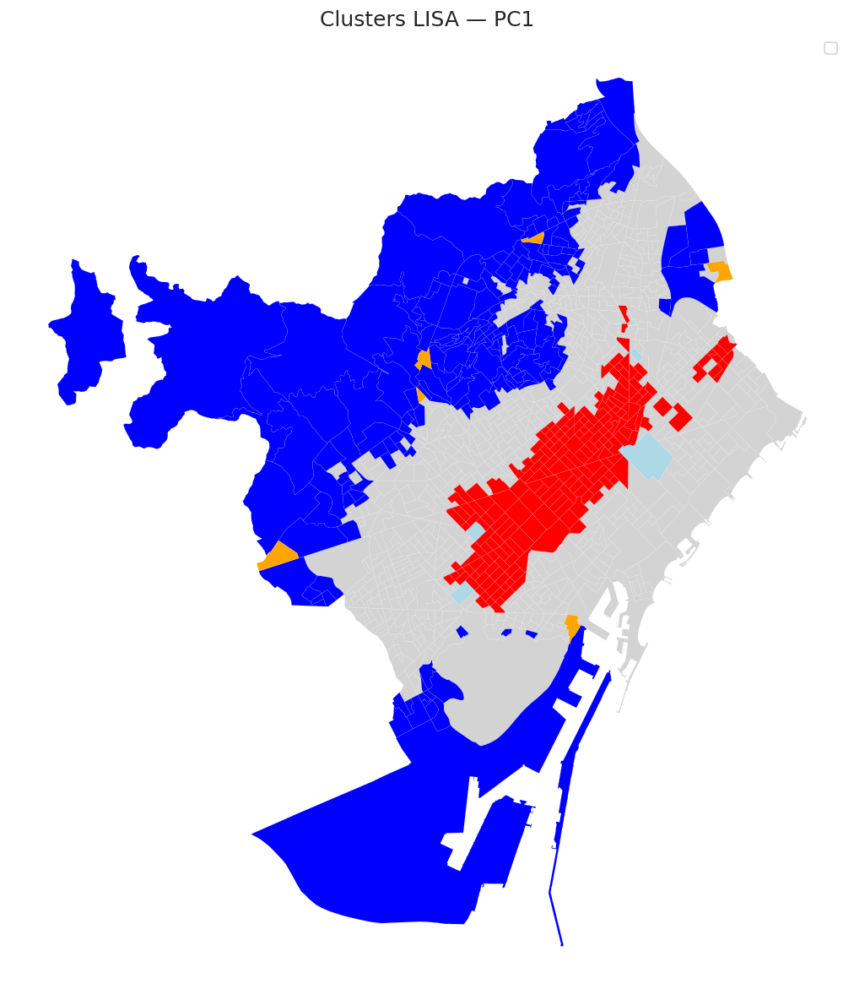

✓ Mapa LISA PC1 generado.


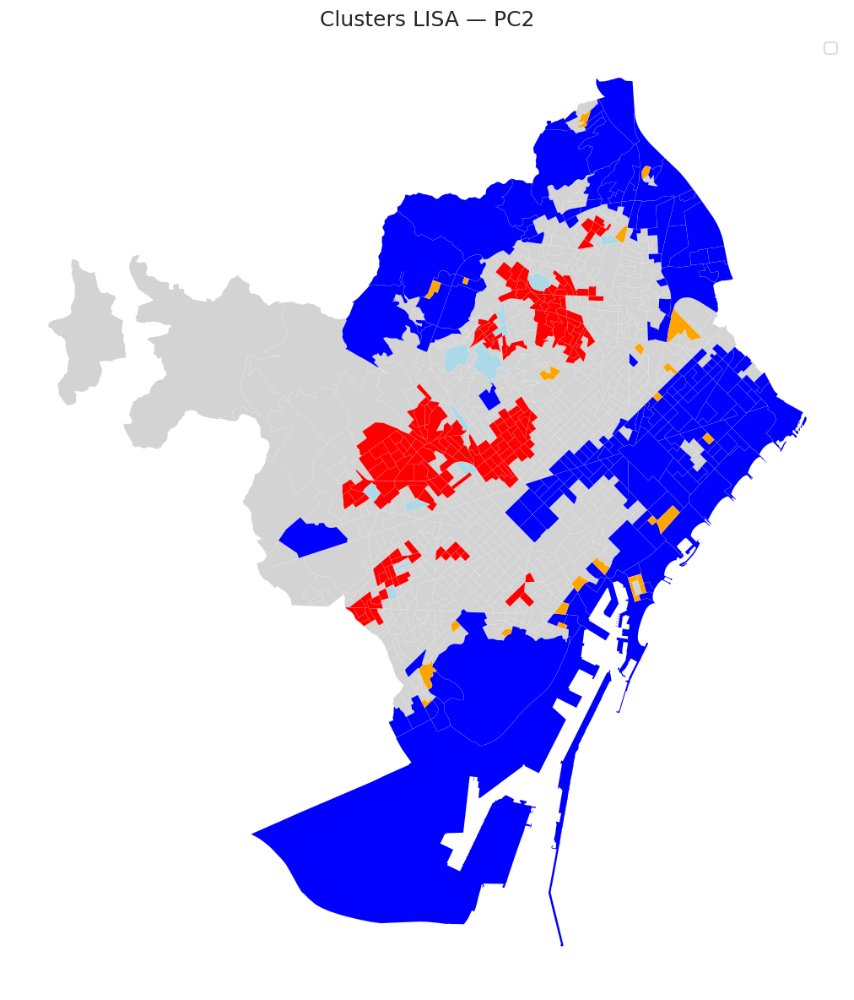

✓ Mapa LISA PC2 generado.


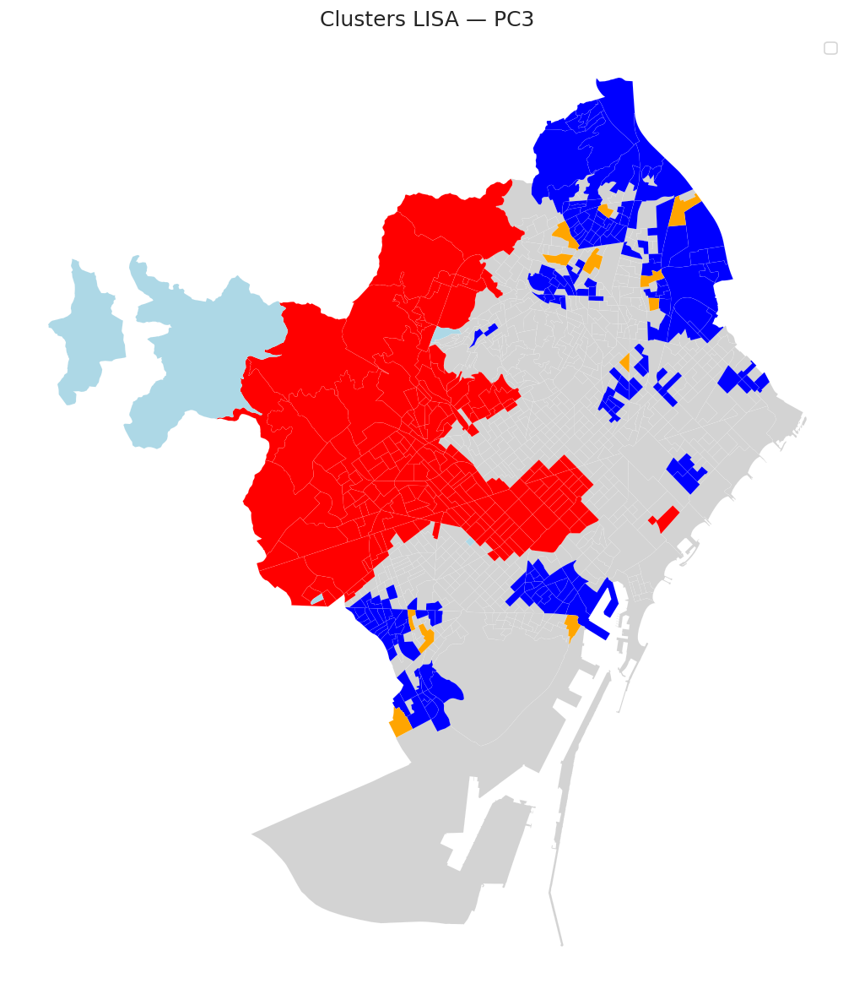

✓ Mapa LISA PC3 generado.


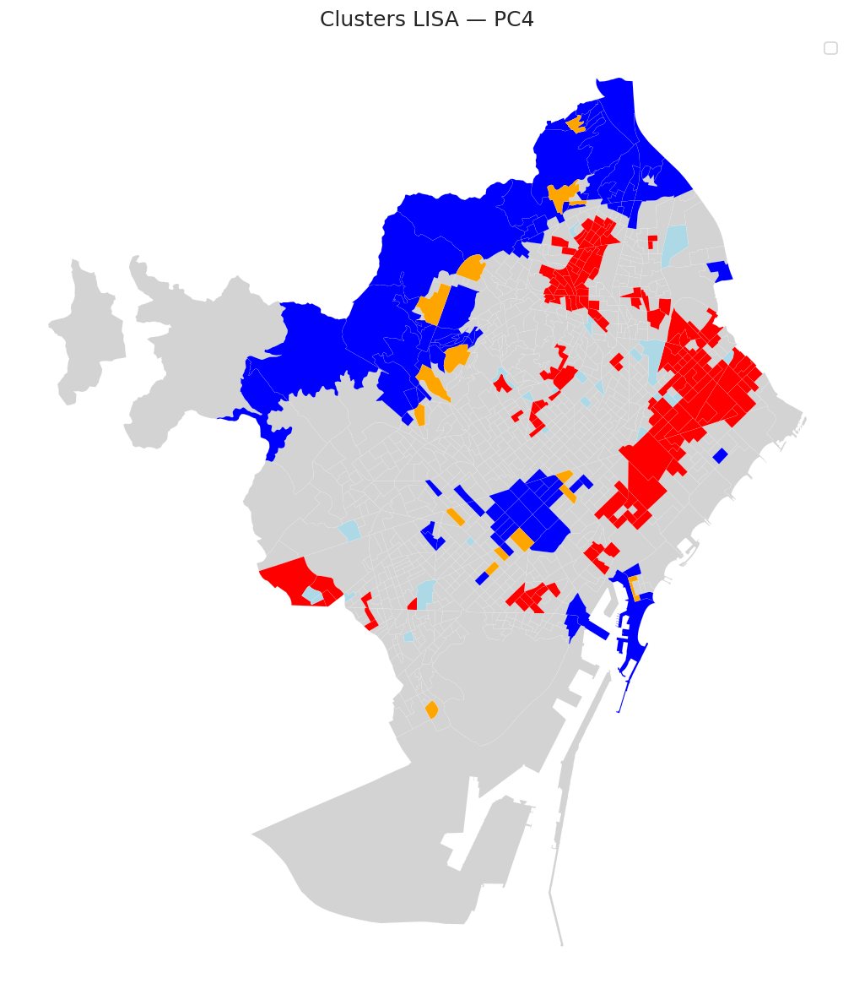

✓ Mapa LISA PC4 generado.


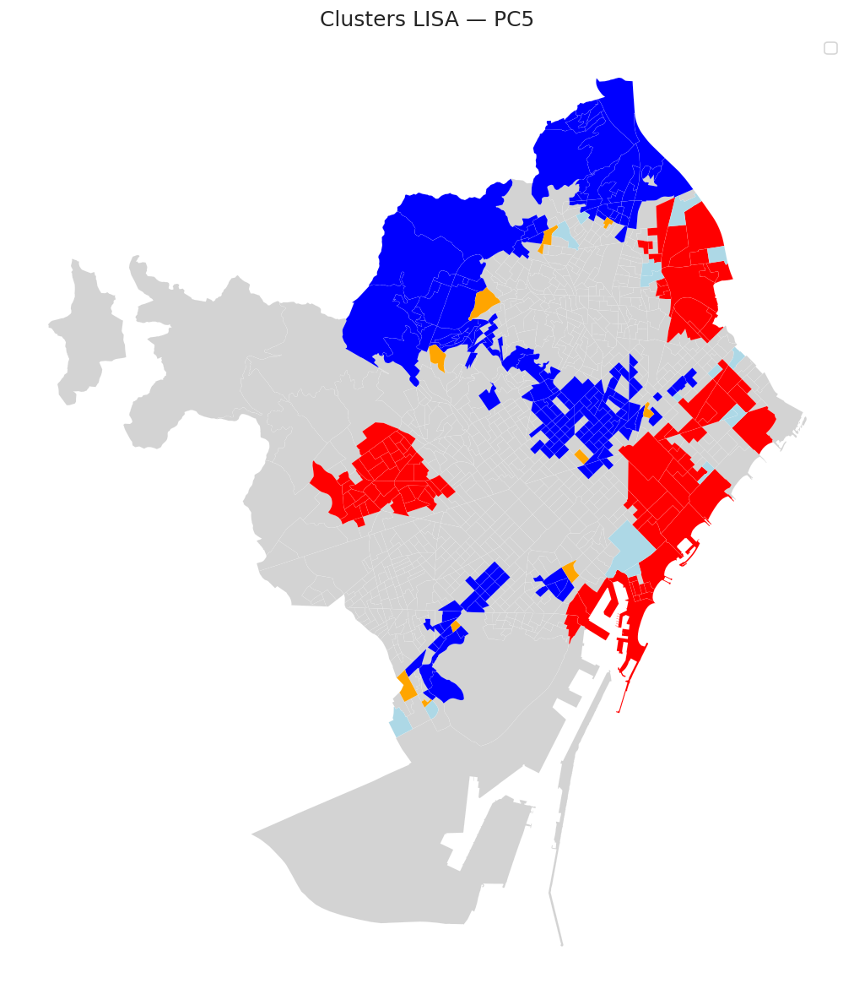

✓ Mapa LISA PC5 generado.

CONTROL DE RESULTADOS
PC1   | filas con resultados completos = 1,068
PC2   | filas con resultados completos = 1,068
PC3   | filas con resultados completos = 1,068
PC4   | filas con resultados completos = 1,068
PC5   | filas con resultados completos = 1,068

RESUMEN FINAL — CELDA 42

Secciones analizadas : 1,068
Componentes         : 5
Permutaciones LISA   : 999

✓ Moran Local calculado para PC1–PC5.
✓ Significación local evaluada mediante permutaciones.
✓ Clusters High-High, Low-Low, High-Low y Low-High identificados.
✓ Mapas LISA generados.
✓ Resultados almacenados en 'base_lisa'.

✓ ANÁLISIS LISA COMPLETADO.
✓ LISTO PARA EL CIERRE Y AUDITORÍA DE LA FASE 3.


In [44]:

# ============================================================
# 42. AUTOCORRELACIÓN ESPACIAL LOCAL — MORAN LOCAL (LISA)
# FASE 3 — ANÁLISIS ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from esda.moran import Moran_Local

print("=" * 100)
print("42. AUTOCORRELACIÓN ESPACIAL LOCAL — MORAN LOCAL (LISA)")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "base_pca" not in globals():
    raise NameError(
        "No existe 'base_pca'. Ejecuta las celdas anteriores."
    )

if "w" not in globals():
    raise NameError(
        "No existe la matriz espacial 'w'. Ejecuta la celda 41."
    )

componentes_lisa = [
    "PC1",
    "PC2",
    "PC3",
    "PC4",
    "PC5"
]

faltantes = [
    pc
    for pc in componentes_lisa
    if pc not in base_pca.columns
]

if faltantes:
    raise KeyError(
        "Faltan componentes PCA: "
        + ", ".join(faltantes)
    )

print("\n✓ Base PCA disponible.")
print(f"Secciones censales : {len(base_pca):,}")
print(f"Componentes        : {len(componentes_lisa)}")

# ============================================================
# 2. COMPROBACIÓN DE LA MATRIZ ESPACIAL
# ============================================================

print("\n" + "=" * 100)
print("MATRIZ ESPACIAL")
print("=" * 100)

print(
    f"Observaciones : {w.n:,}"
)

print(
    f"Islas        : {len(w.islands):,}"
)

if w.n != len(base_pca):
    raise ValueError(
        "El número de observaciones de la matriz espacial "
        "no coincide con base_pca."
    )

if len(w.islands) > 0:
    raise ValueError(
        "La matriz espacial contiene islas."
    )

print(
    "✓ Matriz espacial compatible con la base PCA."
)

# ============================================================
# 3. PREPARACIÓN DE LA BASE LISA
# ============================================================

base_lisa = base_pca.copy()

print("\n✓ Copia espacial creada para almacenar los resultados LISA.")

# ============================================================
# 4. CÁLCULO MORAN LOCAL
# ============================================================

print("\n" + "=" * 100)
print("CÁLCULO DE MORAN LOCAL")
print("=" * 100)

resultados_lisa = {}

for pc in componentes_lisa:

    print(
        f"\nCalculando {pc}..."
    )

    y = (
        base_pca[pc]
        .astype(float)
        .values
    )

    lisa = Moran_Local(
        y,
        w,
        permutations=999
    )

    resultados_lisa[pc] = lisa

    # --------------------------------------------------------
    # Estadístico local
    # --------------------------------------------------------

    base_lisa[f"{pc}_LISA"] = lisa.Is

    # --------------------------------------------------------
    # P-valor de permutaciones
    # --------------------------------------------------------

    base_lisa[f"{pc}_P"] = lisa.p_sim

    # --------------------------------------------------------
    # Cuadrante LISA
    #
    # 1 = High-High
    # 2 = Low-High
    # 3 = Low-Low
    # 4 = High-Low
    # --------------------------------------------------------

    base_lisa[f"{pc}_QUADRANT"] = lisa.q

    # --------------------------------------------------------
    # Significación
    # --------------------------------------------------------

    base_lisa[f"{pc}_SIGNIFICATIVO"] = (
        lisa.p_sim < 0.05
    )

    print(
        f"✓ {pc} calculado."
    )

# ============================================================
# 5. ETIQUETAS DE LOS CUADRANTES
# ============================================================

labels_quadrant = {
    1: "High-High",
    2: "Low-High",
    3: "Low-Low",
    4: "High-Low"
}

for pc in componentes_lisa:

    base_lisa[
        f"{pc}_CLUSTER"
    ] = (
        base_lisa[f"{pc}_QUADRANT"]
        .map(labels_quadrant)
    )

    # Los resultados no significativos
    # se mantienen separados.

    base_lisa.loc[
        ~base_lisa[f"{pc}_SIGNIFICATIVO"],
        f"{pc}_CLUSTER"
    ] = "No significativo"

# ============================================================
# 6. RESUMEN DE CLUSTERS
# ============================================================

print("\n" + "=" * 100)
print("DISTRIBUCIÓN DE CLUSTERS LISA")
print("=" * 100)

resumen_lisa = []

for pc in componentes_lisa:

    cluster_col = f"{pc}_CLUSTER"

    conteos = (
        base_lisa[cluster_col]
        .value_counts()
    )

    total = len(base_lisa)

    for cluster in [
        "High-High",
        "Low-Low",
        "High-Low",
        "Low-High",
        "No significativo"
    ]:

        n = int(
            conteos.get(
                cluster,
                0
            )
        )

        resumen_lisa.append({

            "COMPONENTE":
                pc,

            "CLUSTER":
                cluster,

            "SECCIONES":
                n,

            "PORCENTAJE":
                100 * n / total
        })

resumen_lisa = pd.DataFrame(
    resumen_lisa
)

display(
    resumen_lisa.round({
        "PORCENTAJE": 2
    })
)

# ============================================================
# 7. RESUMEN DE SIGNIFICACIÓN
# ============================================================

print("\n" + "=" * 100)
print("SIGNIFICACIÓN LOCAL")
print("=" * 100)

resumen_significacion = []

for pc in componentes_lisa:

    significativo = (
        base_lisa[
            f"{pc}_SIGNIFICATIVO"
        ].sum()
    )

    porcentaje = (
        100
        * significativo
        / len(base_lisa)
    )

    resumen_significacion.append({

        "COMPONENTE":
            pc,

        "SIGNIFICATIVOS":
            int(significativo),

        "NO_SIGNIFICATIVOS":
            int(
                len(base_lisa)
                - significativo
            ),

        "PORCENTAJE_SIGNIFICATIVO":
            porcentaje
    })

resumen_significacion = pd.DataFrame(
    resumen_significacion
)

display(
    resumen_significacion.round(2)
)

# ============================================================
# 8. MAPAS LISA
# ============================================================

print("\n" + "=" * 100)
print("GENERACIÓN DE MAPAS LISA")
print("=" * 100)

colores_lisa = {
    "High-High": "red",
    "Low-Low": "blue",
    "High-Low": "orange",
    "Low-High": "lightblue",
    "No significativo": "lightgrey"
}

for pc in componentes_lisa:

    cluster_col = f"{pc}_CLUSTER"

    fig, ax = plt.subplots(
        figsize=(10, 10)
    )

    # --------------------------------------------------------
    # Base no significativa
    # --------------------------------------------------------

    base_lisa[
        base_lisa[cluster_col]
        == "No significativo"
    ].plot(
        ax=ax,
        color=colores_lisa["No significativo"],
        edgecolor="white",
        linewidth=0.05
    )

    # --------------------------------------------------------
    # Clusters significativos
    # --------------------------------------------------------

    for cluster in [
        "High-High",
        "Low-Low",
        "High-Low",
        "Low-High"
    ]:

        subset = base_lisa[
            base_lisa[cluster_col]
            == cluster
        ]

        if len(subset) > 0:

            subset.plot(
                ax=ax,
                color=colores_lisa[cluster],
                edgecolor="white",
                linewidth=0.05,
                label=cluster
            )

    ax.set_title(
        f"Clusters LISA — {pc}",
        fontsize=15
    )

    ax.legend(
        loc="best"
    )

    ax.set_axis_off()

    plt.tight_layout()
    plt.show()

    print(
        f"✓ Mapa LISA {pc} generado."
    )

# ============================================================
# 9. CONTROL DE LOS RESULTADOS
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE RESULTADOS")
print("=" * 100)

for pc in componentes_lisa:

    columnas = [
        f"{pc}_LISA",
        f"{pc}_P",
        f"{pc}_QUADRANT",
        f"{pc}_SIGNIFICATIVO",
        f"{pc}_CLUSTER"
    ]

    for col in columnas:

        if col not in base_lisa.columns:
            raise ValueError(
                f"No se ha generado la columna {col}."
            )

    nulos = (
        base_lisa[columnas]
        .isna()
        .any(axis=1)
        .sum()
    )

    print(
        f"{pc:<5} | "
        f"filas con resultados completos = "
        f"{len(base_lisa) - nulos:,}"
    )

# ============================================================
# 10. GUARDAR RESULTADOS PRINCIPALES EN MEMORIA
# ============================================================

# Los objetos quedan disponibles para las siguientes celdas:
#
#   base_lisa
#   resultados_lisa
#   resumen_lisa
#   resumen_significacion

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 42")
print("=" * 100)

print(
    f"\nSecciones analizadas : "
    f"{len(base_lisa):,}"
)

print(
    f"Componentes         : "
    f"{len(componentes_lisa)}"
)

print(
    "Permutaciones LISA   : 999"
)

print(
    "\n✓ Moran Local calculado para PC1–PC5."
)

print(
    "✓ Significación local evaluada mediante permutaciones."
)

print(
    "✓ Clusters High-High, Low-Low, High-Low y Low-High "
    "identificados."
)

print(
    "✓ Mapas LISA generados."
)

print(
    "✓ Resultados almacenados en 'base_lisa'."
)

print(
    "\n✓ ANÁLISIS LISA COMPLETADO."
)

print(
    "✓ LISTO PARA EL CIERRE Y AUDITORÍA DE LA FASE 3."
)




### Resultados

El análisis LISA se completó sobre las **1.068 secciones censales** y los **5 componentes principales**, utilizando **999 permutaciones**.

| Componente | High-High | Low-Low | High-Low | Low-High | No significativo |
|---|---:|---:|---:|---:|---:|
| **PC1** | 209 (19,57 %) | 175 (16,39 %) | 6 (0,56 %) | 4 (0,37 %) | 674 (63,11 %) |
| **PC2** | 182 (17,04 %) | 205 (19,19 %) | 34 (3,18 %) | 14 (1,31 %) | 633 (59,27 %) |
| **PC3** | 213 (19,94 %) | 184 (17,23 %) | 11 (1,03 %) | 4 (0,37 %) | 656 (61,42 %) |
| **PC4** | 140 (13,11 %) | 107 (10,02 %) | 21 (1,97 %) | 25 (2,34 %) | 775 (72,57 %) |
| **PC5** | 102 (9,55 %) | 195 (18,26 %) | 9 (0,84 %) | 18 (1,69 %) | 744 (69,66 %) |

### Significación local

| Componente | Significativas | No significativas | % significativo |
|---|---:|---:|---:|
| **PC1** | 394 | 674 | **36,89 %** |
| **PC2** | 435 | 633 | **40,73 %** |
| **PC3** | 412 | 656 | **38,58 %** |
| **PC4** | 293 | 775 | **27,43 %** |
| **PC5** | 324 | 744 | **30,34 %** |



### Interpretación

- **PC2** presenta la mayor proporción de asociación espacial local significativa (**40,73 %**).
- **PC3** y **PC1** muestran también una estructura espacial especialmente marcada.
- En todos los componentes predominan claramente los patrones **High-High** y **Low-Low** frente a los patrones espaciales atípicos **High-Low** y **Low-High**.
- Esto confirma que los patrones identificados mediante PCA presentan una **estructura territorial agrupada**, y no una distribución espacial aleatoria.
- PC4 presenta la menor asociación local significativa (**27,43 %**), aunque sigue mostrando una estructura espacial estadísticamente relevante.

Los mapas LISA de PC1–PC5 fueron generados y los resultados quedaron almacenados en `base_lisa`.

### Control final

Secciones analizadas : 1.068
Componentes          : 5
Permutaciones LISA   : 999

✓ Moran Local calculado para PC1–PC5.
✓ Significación local evaluada.
✓ Clusters High-High, Low-Low, High-Low y Low-High identificados.
✓ Mapas LISA generados.
✓ Resultados almacenados en 'base_lisa'.

✓ ANÁLISIS LISA COMPLETADO.
✓ LISTO PARA EL CIERRE Y AUDITORÍA DE LA FASE 3.




## 43 . Preparación de la regresión espacial

Una vez caracterizada la estructura espacial de los componentes principales mediante Moran's I y LISA, se prepara el análisis de regresión.

El objetivo es evaluar qué variables territoriales, socioeconómicas, de tráfico y de usos del suelo explican la variabilidad espacial de los componentes principales obtenidos mediante PCA.

Se utilizarán los componentes principales como variables dependientes y las variables explicativas seleccionadas de la base maestra espacial.

Antes del ajuste de los modelos se comprueba:

- disponibilidad y cobertura de las variables;
- ausencia de valores nulos;
- ausencia de duplicados;
- coherencia espacial;
- posibles problemas de colinealidad entre variables explicativas;
- estructura de la matriz de diseño.

La regresión se plantea como una fase explicativa posterior al PCA y al diagnóstico espacial, manteniendo la información espacial de las 1.068 secciones censales.

In [45]:

# ============================================================
# 43. PREPARACIÓN DE LA BASE DE REGRESIÓN
# FASE 3 — MODELIZACIÓN ESTADÍSTICA
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd

print("=" * 100)
print("43. PREPARACIÓN DE LA BASE DE REGRESIÓN")
print("=" * 100)

# ============================================================
# 1. LOCALIZAR LA BASE MAESTRA
# ============================================================

if "base_maestra" in globals():

    base_regresion = base_maestra.copy()

elif "base_pca" in globals():

    base_regresion = base_pca.copy()

else:

    raise NameError(
        "No existe 'base_maestra' ni 'base_pca'. "
        "Ejecuta las celdas anteriores antes de continuar."
    )

print("\n✓ Base territorial disponible.")
print(
    f"Secciones censales : {len(base_regresion):,}"
)
print(
    f"Columnas totales    : {len(base_regresion.columns):,}"
)
print(
    f"CRS                 : {base_regresion.crs}"
)

# ============================================================
# 2. VARIABLES OBJETIVO
# ============================================================

targets = [
    "NO2_MEDIO_PONDERADO",
    "PM10_MEDIO_PONDERADO",
    "PM25_MEDIO_PONDERADO"
]

faltantes_targets = [
    col
    for col in targets
    if col not in base_regresion.columns
]

if faltantes_targets:

    raise KeyError(
        "Faltan variables objetivo: "
        + ", ".join(faltantes_targets)
    )

print("\n" + "=" * 100)
print("VARIABLES OBJETIVO")
print("=" * 100)

for target in targets:

    print(
        f"{target:<30} "
        f"válidos="
        f"{base_regresion[target].notna().sum():,} | "
        f"nulos="
        f"{base_regresion[target].isna().sum():,}"
    )

# ============================================================
# 3. VARIABLES EXPLICATIVAS
# ============================================================

# Variables territoriales, de tráfico, socioeconómicas
# y de usos del suelo.
#
# No incluimos otros contaminantes como predictores del NO2,
# ni los componentes PCA, para evitar fuga de información
# y mantener una interpretación explicativa clara.

predictores = [

    # Tráfico
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",

    # Socioeconomía / estructura urbana
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "DENSIDAD_NETA_HAB_HA",

    # Topografía
    "ELEVACION_MEDIA_M",

    # Usos del suelo
    "PCT_VERDE",
    "PCT_RESIDENCIAL",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

faltantes_pred = [
    col
    for col in predictores
    if col not in base_regresion.columns
]

if faltantes_pred:

    raise KeyError(
        "Faltan variables explicativas: "
        + ", ".join(faltantes_pred)
    )

print("\n" + "=" * 100)
print("VARIABLES EXPLICATIVAS")
print("=" * 100)

for col in predictores:

    print(
        f"{col:<30} "
        f"válidos="
        f"{base_regresion[col].notna().sum():,} | "
        f"nulos="
        f"{base_regresion[col].isna().sum():,}"
    )

# ============================================================
# 4. CONSTRUCCIÓN DE LA MATRIZ DE REGRESIÓN
# ============================================================

columnas_regresion = (
    targets
    + predictores
)

base_modelo = (
    base_regresion[
        columnas_regresion
    ]
    .copy()
)

# ============================================================
# 5. CONTROL DE TIPOS
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE TIPOS")
print("=" * 100)

for col in columnas_regresion:

    base_modelo[col] = pd.to_numeric(
        base_modelo[col],
        errors="coerce"
    )

tipos_no_numericos = [
    col
    for col in columnas_regresion
    if not pd.api.types.is_numeric_dtype(
        base_modelo[col]
    )
]

if tipos_no_numericos:

    raise TypeError(
        "Existen variables no numéricas: "
        + ", ".join(tipos_no_numericos)
    )

print(
    "✓ Todas las variables de la matriz "
    "de regresión son numéricas."
)

# ============================================================
# 6. CONTROL DE NULOS
# ============================================================

print("\n" + "=" * 100)
print("CONTROL DE NULOS")
print("=" * 100)

tabla_nulos = (
    base_modelo
    .isna()
    .sum()
    .to_frame("NULOS")
)

tabla_nulos["COBERTURA_%"] = (
    100
    * (
        len(base_modelo)
        - tabla_nulos["NULOS"]
    )
    / len(base_modelo)
)

display(
    tabla_nulos.round(2)
)

if tabla_nulos["NULOS"].sum() > 0:

    raise ValueError(
        "Existen valores nulos en la matriz de regresión. "
        "No se continúa hasta resolverlos."
    )

print(
    "\n✓ Matriz sin valores nulos."
)

# ============================================================
# 7. CONTROL DE INFINITOS
# ============================================================

infinitos = (
    ~np.isfinite(
        base_modelo
        .select_dtypes(include=np.number)
    )
).sum().sum()

print(
    f"\nValores infinitos : {infinitos:,}"
)

if infinitos > 0:

    raise ValueError(
        "Existen valores infinitos en la matriz."
    )

print(
    "✓ No existen valores infinitos."
)

# ============================================================
# 8. CONTROL DE DUPLICADOS
# ============================================================

duplicadas = (
    base_modelo
    .duplicated()
    .sum()
)

print(
    f"\nFilas duplicadas : {duplicadas:,}"
)

# Las duplicaciones exactas de todas las variables no
# necesariamente son un error, pero se registran.

# ============================================================
# 9. ESTADÍSTICA DESCRIPTIVA
# ============================================================

print("\n" + "=" * 100)
print("ESTADÍSTICA DESCRIPTIVA")
print("=" * 100)

estadisticas_regresion = (
    base_modelo
    .describe()
    .T
)

display(
    estadisticas_regresion.round(3)
)

# ============================================================
# 10. CONTROL DE DISTRIBUCIONES EXTREMAS
# ============================================================

print("\n" + "=" * 100)
print("PERCENTILES DE LAS VARIABLES")
print("=" * 100)

percentiles_regresion = (
    base_modelo
    .quantile(
        [0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
    )
    .T
)

display(
    percentiles_regresion.round(3)
)

# ============================================================
# 11. CORRELACIÓN INICIAL
# ============================================================

print("\n" + "=" * 100)
print("CORRELACIÓN ENTRE VARIABLES")
print("=" * 100)

correlaciones = (
    base_modelo
    .corr()
)

display(
    correlaciones.round(3)
)

# ============================================================
# 12. CORRELACIÓN DE CADA PREDICTOR CON NO2
# ============================================================

correlacion_no2 = (
    correlaciones[
        "NO2_MEDIO_PONDERADO"
    ]
    .drop(
        labels=[
            "NO2_MEDIO_PONDERADO",
            "PM10_MEDIO_PONDERADO",
            "PM25_MEDIO_PONDERADO"
        ]
    )
    .sort_values(
        key=lambda x: x.abs(),
        ascending=False
    )
)

print("\n" + "=" * 100)
print("CORRELACIÓN DE LOS PREDICTORES CON NO₂")
print("=" * 100)

display(
    correlacion_no2.to_frame(
        "CORRELACION_NO2"
    ).round(3)
)

# ============================================================
# 13. PREPARACIÓN DE MATRICES X / Y
# ============================================================

X_regresion = (
    base_modelo[
        predictores
    ]
    .copy()
)

y_NO2 = (
    base_modelo[
        "NO2_MEDIO_PONDERADO"
    ]
    .copy()
)

y_PM10 = (
    base_modelo[
        "PM10_MEDIO_PONDERADO"
    ]
    .copy()
)

y_PM25 = (
    base_modelo[
        "PM25_MEDIO_PONDERADO"
    ]
    .copy()
)

print("\n" + "=" * 100)
print("MATRICES DE MODELIZACIÓN")
print("=" * 100)

print(
    f"\nX_regresion : "
    f"{X_regresion.shape[0]:,} × "
    f"{X_regresion.shape[1]}"
)

print(
    f"y_NO2       : "
    f"{len(y_NO2):,}"
)

print(
    f"y_PM10      : "
    f"{len(y_PM10):,}"
)

print(
    f"y_PM25      : "
    f"{len(y_PM25):,}"
)

# ============================================================
# 14. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 43")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(base_modelo):,}"
)

print(
    f"Predictores   : "
    f"{len(predictores)}"
)

print(
    f"Variables objetivo : "
    f"{len(targets)}"
)

print(
    "\nVariables objetivo:"
)

for target in targets:
    print(
        f"  • {target}"
    )

print(
    "\nPredictores:"
)

for predictor in predictores:
    print(
        f"  • {predictor}"
    )

print(
    "\n✓ Matriz de regresión construida."
)

print(
    "✓ Variables numéricas comprobadas."
)

print(
    "✓ Valores nulos comprobados."
)

print(
    "✓ Valores infinitos comprobados."
)

print(
    "✓ Estadística descriptiva calculada."
)

print(
    "✓ Correlaciones calculadas."
)

print(
    "✓ Matrices X/y preparadas."
)

print(
    "\n✓ PREPARACIÓN DE LA REGRESIÓN COMPLETADA."
)

print(
    "✓ LISTA PARA EL DIAGNÓSTICO DE COLINEALIDAD Y "
    "EL MODELO OLS BASE."
)



43. PREPARACIÓN DE LA BASE DE REGRESIÓN

✓ Base territorial disponible.
Secciones censales : 1,068
Columnas totales    : 48
CRS                 : EPSG:25831

VARIABLES OBJETIVO
NO2_MEDIO_PONDERADO            válidos=1,068 | nulos=0
PM10_MEDIO_PONDERADO           válidos=1,068 | nulos=0
PM25_MEDIO_PONDERADO           válidos=1,068 | nulos=0

VARIABLES EXPLICATIVAS
IMD_AFORO_CERCANO              válidos=1,068 | nulos=0
DISTANCIA_AFORO_M              válidos=1,068 | nulos=0
RENTA_EUR_PERSONA              válidos=1,068 | nulos=0
DENSIDAD_HAB_HA                válidos=1,068 | nulos=0
DENSIDAD_NETA_HAB_HA           válidos=1,068 | nulos=0
ELEVACION_MEDIA_M              válidos=1,068 | nulos=0
PCT_VERDE                      válidos=1,068 | nulos=0
PCT_RESIDENCIAL                válidos=1,068 | nulos=0
PCT_EQUIPAMIENTOS              válidos=1,068 | nulos=0
PCT_INDUSTRIAL                 válidos=1,068 | nulos=0
PCT_PORTUARIO                  válidos=1,068 | nulos=0
PCT_TRANSPORTE               

,NULOS,COBERTURA_%
NO2_MEDIO_PONDERADO,0,100.0
PM10_MEDIO_PONDERADO,0,100.0
PM25_MEDIO_PONDERADO,0,100.0
IMD_AFORO_CERCANO,0,100.0
DISTANCIA_AFORO_M,0,100.0
RENTA_EUR_PERSONA,0,100.0
DENSIDAD_HAB_HA,0,100.0
DENSIDAD_NETA_HAB_HA,0,100.0
ELEVACION_MEDIA_M,0,100.0
PCT_VERDE,0,100.0



✓ Matriz sin valores nulos.

Valores infinitos : 0
✓ No existen valores infinitos.

Filas duplicadas : 0

ESTADÍSTICA DESCRIPTIVA


,count,mean,std,min,25%,50%,75%,max
NO2_MEDIO_PONDERADO,1068.0,30.330,5.403,14.659,27.684,28.865,33.177,49.745
PM10_MEDIO_PONDERADO,1068.0,23.406,2.134,11.831,21.951,23.716,24.655,31.282
PM25_MEDIO_PONDERADO,1068.0,14.206,1.522,10.596,12.916,13.929,15.226,18.539
IMD_AFORO_CERCANO,1068.0,16436.803,16354.950,496.550,6421.529,11499.387,18477.646,78020.427
DISTANCIA_AFORO_M,1068.0,249.944,231.187,10.922,120.190,197.555,304.745,3504.598
RENTA_EUR_PERSONA,1068.0,26319.270,7803.677,11097.000,21346.750,24926.000,28946.750,54089.000
DENSIDAD_HAB_HA,1068.0,309.460,136.898,1.000,211.000,322.000,426.000,593.000
DENSIDAD_NETA_HAB_HA,1068.0,756.575,234.632,19.000,627.000,758.000,921.000,1368.000
ELEVACION_MEDIA_M,1068.0,50.553,46.490,2.540,18.370,36.020,69.840,341.030
PCT_VERDE,1068.0,9.288,14.665,0.000,0.000,2.956,12.636,87.807



PERCENTILES DE LAS VARIABLES


,0.01,0.05,0.25,0.50,0.75,0.95,0.99
NO2_MEDIO_PONDERADO,19.574,22.677,27.684,28.865,33.177,40.723,45.914
PM10_MEDIO_PONDERADO,17.114,20.256,21.951,23.716,24.655,26.709,28.043
PM25_MEDIO_PONDERADO,12.371,12.500,12.916,13.929,15.226,17.238,18.078
IMD_AFORO_CERCANO,1251.900,3198.459,6421.529,11499.387,18477.646,63581.370,77097.566
DISTANCIA_AFORO_M,39.563,66.814,120.190,197.555,304.745,578.689,1175.736
RENTA_EUR_PERSONA,13933.610,16043.500,21346.750,24926.000,28946.750,42558.150,52550.990
DENSIDAD_HAB_HA,34.380,86.000,211.000,322.000,426.000,521.000,593.000
DENSIDAD_NETA_HAB_HA,142.000,313.000,627.000,758.000,921.000,1111.000,1368.000
ELEVACION_MEDIA_M,3.107,5.131,18.370,36.020,69.840,143.761,197.718
PCT_VERDE,0.000,0.000,0.000,2.956,12.636,38.877,73.059



CORRELACIÓN ENTRE VARIABLES


,NO2_MEDIO_PONDERADO,PM10_MEDIO_PONDERADO,PM25_MEDIO_PONDERADO,IMD_AFORO_CERCANO,DISTANCIA_AFORO_M,RENTA_EUR_PERSONA,DENSIDAD_HAB_HA,DENSIDAD_NETA_HAB_HA,ELEVACION_MEDIA_M,PCT_VERDE,PCT_RESIDENCIAL,PCT_EQUIPAMIENTOS,PCT_INDUSTRIAL,PCT_PORTUARIO,PCT_TRANSPORTE
NO2_MEDIO_PONDERADO,1.000,0.542,0.721,-0.051,-0.393,0.185,0.220,0.128,-0.465,-0.231,0.010,-0.073,-0.035,0.073,0.014
PM10_MEDIO_PONDERADO,0.542,1.000,0.658,-0.050,-0.308,-0.082,0.081,0.241,-0.379,-0.147,-0.076,0.000,0.007,0.075,0.040
PM25_MEDIO_PONDERADO,0.721,0.658,1.000,0.005,-0.289,0.036,0.137,0.229,-0.399,-0.097,-0.187,-0.056,0.080,0.006,-0.003
IMD_AFORO_CERCANO,-0.051,-0.050,0.005,1.000,0.310,-0.127,-0.189,-0.089,0.292,0.219,-0.214,0.096,0.066,0.096,0.146
DISTANCIA_AFORO_M,-0.393,-0.308,-0.289,0.310,1.000,-0.239,-0.234,-0.102,0.261,0.359,-0.231,0.090,0.099,0.067,0.164
RENTA_EUR_PERSONA,0.185,-0.082,0.036,-0.127,-0.239,1.000,-0.173,-0.541,0.201,-0.047,0.085,0.020,-0.086,-0.030,-0.085
DENSIDAD_HAB_HA,0.220,0.081,0.137,-0.189,-0.234,-0.173,1.000,0.560,-0.250,-0.228,0.251,-0.153,-0.113,-0.110,-0.104
DENSIDAD_NETA_HAB_HA,0.128,0.241,0.229,-0.089,-0.102,-0.541,0.560,1.000,-0.470,-0.056,-0.070,-0.069,0.081,-0.000,-0.066
ELEVACION_MEDIA_M,-0.465,-0.379,-0.399,0.292,0.261,0.201,-0.250,-0.470,1.000,0.230,0.042,0.072,-0.105,-0.094,-0.075
PCT_VERDE,-0.231,-0.147,-0.097,0.219,0.359,-0.047,-0.228,-0.056,0.230,1.000,-0.665,0.089,-0.007,0.045,0.127



CORRELACIÓN DE LOS PREDICTORES CON NO₂


,CORRELACION_NO2
ELEVACION_MEDIA_M,-0.465
DISTANCIA_AFORO_M,-0.393
PCT_VERDE,-0.231
DENSIDAD_HAB_HA,0.220
RENTA_EUR_PERSONA,0.185
DENSIDAD_NETA_HAB_HA,0.128
PCT_PORTUARIO,0.073
PCT_EQUIPAMIENTOS,-0.073
IMD_AFORO_CERCANO,-0.051
PCT_INDUSTRIAL,-0.035



MATRICES DE MODELIZACIÓN

X_regresion : 1,068 × 12
y_NO2       : 1,068
y_PM10      : 1,068
y_PM25      : 1,068

RESUMEN FINAL — CELDA 43

Observaciones : 1,068
Predictores   : 12
Variables objetivo : 3

Variables objetivo:
  • NO2_MEDIO_PONDERADO
  • PM10_MEDIO_PONDERADO
  • PM25_MEDIO_PONDERADO

Predictores:
  • IMD_AFORO_CERCANO
  • DISTANCIA_AFORO_M
  • RENTA_EUR_PERSONA
  • DENSIDAD_HAB_HA
  • DENSIDAD_NETA_HAB_HA
  • ELEVACION_MEDIA_M
  • PCT_VERDE
  • PCT_RESIDENCIAL
  • PCT_EQUIPAMIENTOS
  • PCT_INDUSTRIAL
  • PCT_PORTUARIO
  • PCT_TRANSPORTE

✓ Matriz de regresión construida.
✓ Variables numéricas comprobadas.
✓ Valores nulos comprobados.
✓ Valores infinitos comprobados.
✓ Estadística descriptiva calculada.
✓ Correlaciones calculadas.
✓ Matrices X/y preparadas.

✓ PREPARACIÓN DE LA REGRESIÓN COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO DE COLINEALIDAD Y EL MODELO OLS BASE.



### Resultados
La matriz de regresión quedó correctamente construida sobre **1.068 secciones censales**, con **12 variables explicativas** y **3 variables objetivo**.

### Control de calidad

- Todas las variables son numéricas.
- No existen valores nulos.
- No existen valores infinitos.
- No existen filas duplicadas.
- Todas las variables presentan una cobertura del **100 %**.

### Variables objetivo

| Variable | Media | Desv. estándar | Mínimo | Máximo |
|---|---:|---:|---:|---:|
| **NO₂** | 30,33 | 5,40 | 14,66 | 49,74 |
| **PM10** | 23,41 | 2,13 | 11,83 | 31,28 |
| **PM2.5** | 14,21 | 1,52 | 10,60 | 18,54 |


### Correlación inicial con NO₂

Los predictores con mayor correlación lineal con NO₂ son:

| Variable | r |
|---|---:|
| **Elevación media** | −0,465 |
| **Distancia al aforo** | −0,393 |
| **% verde** | −0,231 |
| **Densidad hab./ha** | +0,220 |
| **Renta por persona** | +0,185 |
| **Densidad neta** | +0,128 |

La correlación directa entre **IMD del aforo cercano y NO₂ es baja (r = −0,051)**, por lo que será especialmente importante comprobar qué ocurre cuando el tráfico se analiza conjuntamente con el resto de variables y mediante el modelo multivariante.
### Diagnóstico preliminar

Se observan algunas relaciones entre predictores que deberán comprobarse mediante VIF antes de interpretar los coeficientes del modelo:

- Densidad de población ↔ densidad neta: **r = 0,560**
- Renta ↔ densidad neta: **r = −0,541**
- % verde ↔ % residencial: **r = −0,665**

Esto **no implica todavía colinealidad problemática**; se comprobará formalmente en la siguiente etapa mediante VIF.
### Matriz final

Observaciones : 1.068
Predictores   : 12
Objetivos     : 3

X_regresion : 1.068 × 12
y_NO2       : 1.068
y_PM10      : 1.068
y_PM25      : 1.068

✓ Matriz de regresión construida.
✓ Cobertura completa.
✓ Calidad de datos comprobada.
✓ Correlaciones calculadas.
✓ Matrices X/y preparadas.

✓ CELDA 43 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO DE COLINEALIDAD (VIF).





## 44 . Diagnóstico de colinealidad — VIF

### Fase 3 — Modelización estadística

Antes de ajustar el modelo de regresión lineal, se evalúa la posible existencia de **multicolinealidad entre las variables explicativas**.

El diagnóstico se realizará mediante el **Variance Inflation Factor (VIF)** y su correspondiente tolerancia.

### Variables analizadas

Se utilizarán los 12 predictores definidos en la matriz de regresión:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `DENSIDAD_NETA_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_RESIDENCIAL`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

El análisis se realizará sobre las **1.068 secciones censales**, previamente comprobadas y sin valores nulos ni infinitos.

### Criterio de evaluación

Como referencia para interpretar los resultados:

- **VIF < 3:** colinealidad baja.
- **3 ≤ VIF < 5:** colinealidad moderada.
- **5 ≤ VIF < 10:** posible colinealidad elevada.
- **VIF ≥ 10:** colinealidad severa.

La tolerancia se calculará como el inverso del VIF.

Además, se revisarán las correlaciones entre pares de variables explicativas para complementar el diagnóstico.

### Decisión metodológica

Las variables **no se eliminarán automáticamente** en función del VIF.

En caso de detectar colinealidad, se analizará primero su significado conceptual y su posible efecto sobre la interpretación del modelo antes de modificar la matriz de predictores.

El objetivo es obtener un modelo explicativo sólido sin eliminar variables relevantes únicamente por criterios estadísticos.

### Objetivo

Determinar si las 12 variables explicativas pueden incorporarse conjuntamente al modelo de regresión y dejar preparada la matriz definitiva para el ajuste del **modelo OLS base**.



In [46]:

# ============================================================
# 44. DIAGNÓSTICO DE COLINEALIDAD — VIF
# FASE 3 — MODELIZACIÓN ESTADÍSTICA
# ============================================================

import numpy as np
import pandas as pd

from statsmodels.stats.outliers_influence import variance_inflation_factor

print("=" * 100)
print("44. DIAGNÓSTICO DE COLINEALIDAD — VIF")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE LA MATRIZ
# ============================================================

if "X_regresion" not in globals():
    raise NameError(
        "No existe 'X_regresion'. Ejecuta primero la celda 43."
    )

X_vif = X_regresion.copy()

print("\n✓ Matriz de predictores disponible.")
print(f"Observaciones : {len(X_vif):,}")
print(f"Predictores   : {X_vif.shape[1]}")

# ============================================================
# 2. CONTROL DE CALIDAD
# ============================================================

if X_vif.isna().sum().sum() > 0:
    raise ValueError(
        "Existen valores nulos en X_regresion."
    )

if not np.isfinite(X_vif.to_numpy()).all():
    raise ValueError(
        "Existen valores infinitos en X_regresion."
    )

print("✓ Sin valores nulos.")
print("✓ Sin valores infinitos.")

# ============================================================
# 3. CÁLCULO DEL VIF
# ============================================================

print("\n" + "=" * 100)
print("CÁLCULO DE VIF")
print("=" * 100)

resultados_vif = []

for i, variable in enumerate(X_vif.columns):

    vif = variance_inflation_factor(
        X_vif.values,
        i
    )

    resultados_vif.append({
        "VARIABLE": variable,
        "VIF": vif
    })

resultados_vif = pd.DataFrame(
    resultados_vif
).sort_values(
    "VIF",
    ascending=False
).reset_index(drop=True)

# ============================================================
# 4. TOLERANCIA
# ============================================================

resultados_vif["TOLERANCIA"] = (
    1 / resultados_vif["VIF"]
)

# ============================================================
# 5. CLASIFICACIÓN
# ============================================================

def clasificar_vif(vif):

    if vif < 3:
        return "Baja"

    elif vif < 5:
        return "Moderada"

    elif vif < 10:
        return "Alta"

    else:
        return "Muy alta"


resultados_vif["DIAGNOSTICO"] = (
    resultados_vif["VIF"]
    .apply(clasificar_vif)
)

# ============================================================
# 6. MOSTRAR RESULTADOS
# ============================================================

print("\nResultados VIF:")

display(
    resultados_vif.round({
        "VIF": 3,
        "TOLERANCIA": 3
    })
)

# ============================================================
# 7. IDENTIFICACIÓN DE POSIBLES PROBLEMAS
# ============================================================

vif_5 = resultados_vif[
    resultados_vif["VIF"] >= 5
].copy()

vif_10 = resultados_vif[
    resultados_vif["VIF"] >= 10
].copy()

print("\n" + "=" * 100)
print("CONTROL DE COLINEALIDAD")
print("=" * 100)

print(
    f"\nVariables con VIF ≥ 5  : {len(vif_5)}"
)

print(
    f"Variables con VIF ≥ 10 : {len(vif_10)}"
)

if len(vif_10) > 0:

    print(
        "\n⚠ Se detectan variables con VIF ≥ 10."
    )

    display(
        vif_10[
            [
                "VARIABLE",
                "VIF",
                "TOLERANCIA",
                "DIAGNOSTICO"
            ]
        ].round(3)
    )

elif len(vif_5) > 0:

    print(
        "\n⚠ Existen variables con VIF entre 5 y 10."
    )

    display(
        vif_5[
            [
                "VARIABLE",
                "VIF",
                "TOLERANCIA",
                "DIAGNOSTICO"
            ]
        ].round(3)
    )

else:

    print(
        "\n✓ No se detecta colinealidad elevada "
        "según el umbral VIF ≥ 5."
    )

# ============================================================
# 8. CORRELACIÓN ENTRE PREDICTORES
# ============================================================

print("\n" + "=" * 100)
print("CORRELACIONES ELEVADAS ENTRE PREDICTORES")
print("=" * 100)

corr_pred = X_vif.corr()

pares_altos = []

for i in range(len(corr_pred.columns)):

    for j in range(i + 1, len(corr_pred.columns)):

        var1 = corr_pred.columns[i]
        var2 = corr_pred.columns[j]

        r = corr_pred.iloc[i, j]

        if abs(r) >= 0.60:

            pares_altos.append({
                "VARIABLE_1": var1,
                "VARIABLE_2": var2,
                "CORRELACION": r
            })

pares_altos = pd.DataFrame(
    pares_altos
)

if len(pares_altos) > 0:

    pares_altos = (
        pares_altos
        .sort_values(
            "CORRELACION",
            key=lambda x: x.abs(),
            ascending=False
        )
        .reset_index(drop=True)
    )

    display(
        pares_altos.round(3)
    )

else:

    print(
        "✓ No existen pares de predictores "
        "con |r| ≥ 0,60."
    )

# ============================================================
# 9. VARIABLE CON MAYOR VIF
# ============================================================

max_vif = resultados_vif.iloc[0]

print("\n" + "=" * 100)
print("MAYOR VIF")
print("=" * 100)

print(
    f"\nVariable : {max_vif['VARIABLE']}"
)

print(
    f"VIF      : {max_vif['VIF']:.3f}"
)

print(
    f"Tolerancia : {max_vif['TOLERANCIA']:.3f}"
)

print(
    f"Diagnóstico : {max_vif['DIAGNOSTICO']}"
)

# ============================================================
# 10. DECISIÓN AUTOMÁTICA
# ============================================================

print("\n" + "=" * 100)
print("DECISIÓN METODOLÓGICA")
print("=" * 100)

if len(vif_10) == 0 and len(vif_5) == 0:

    decision_vif = (
        "SIN COLINEALIDAD ELEVADA"
    )

    print(
        "\n✓ Los predictores pueden mantenerse "
        "conjuntamente en el modelo base."
    )

elif len(vif_10) == 0:

    decision_vif = (
        "COLINEALIDAD MODERADA"
    )

    print(
        "\n✓ No existe colinealidad severa."
    )

    print(
        "⚠ Se revisarán las variables con VIF ≥ 5 "
        "antes de interpretar los coeficientes."
    )

else:

    decision_vif = (
        "COLINEALIDAD ELEVADA"
    )

    print(
        "\n⚠ Se detecta colinealidad elevada."
    )

    print(
        "No se eliminarán variables automáticamente."
    )

    print(
        "Se analizará su justificación conceptual "
        "antes de modificar el modelo."
    )

# ============================================================
# 11. RESUMEN
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 44")
print("=" * 100)

print(
    f"\nObservaciones : {len(X_vif):,}"
)

print(
    f"Predictores   : {X_vif.shape[1]}"
)

print(
    f"VIF máximo    : {resultados_vif['VIF'].max():.3f}"
)

print(
    f"Variables VIF ≥ 5  : {len(vif_5)}"
)

print(
    f"Variables VIF ≥ 10 : {len(vif_10)}"
)

print(
    f"Decisión : {decision_vif}"
)

print(
    "\n✓ DIAGNÓSTICO DE COLINEALIDAD COMPLETADO."
)

print(
    "✓ LISTO PARA CONSTRUIR EL MODELO OLS BASE."
)



44. DIAGNÓSTICO DE COLINEALIDAD — VIF

✓ Matriz de predictores disponible.
Observaciones : 1,068
Predictores   : 12
✓ Sin valores nulos.
✓ Sin valores infinitos.

CÁLCULO DE VIF

Resultados VIF:


,VARIABLE,VIF,TOLERANCIA,DIAGNOSTICO
0,PCT_RESIDENCIAL,6.020,0.166,Alta
1,PCT_VERDE,3.760,0.266,Moderada
2,DENSIDAD_NETA_HAB_HA,2.688,0.372,Baja
3,PCT_EQUIPAMIENTOS,2.225,0.449,Baja
4,DENSIDAD_HAB_HA,1.764,0.567,Baja
5,PCT_INDUSTRIAL,1.741,0.574,Baja
6,ELEVACION_MEDIA_M,1.694,0.590,Baja
7,RENTA_EUR_PERSONA,1.692,0.591,Baja
8,DISTANCIA_AFORO_M,1.465,0.683,Baja
9,IMD_AFORO_CERCANO,1.260,0.794,Baja



CONTROL DE COLINEALIDAD

Variables con VIF ≥ 5  : 1
Variables con VIF ≥ 10 : 0

⚠ Existen variables con VIF entre 5 y 10.


,VARIABLE,VIF,TOLERANCIA,DIAGNOSTICO
0,PCT_RESIDENCIAL,6.02,0.166,Alta



CORRELACIONES ELEVADAS ENTRE PREDICTORES


,VARIABLE_1,VARIABLE_2,CORRELACION
0,PCT_VERDE,PCT_RESIDENCIAL,-0.665



MAYOR VIF

Variable : PCT_RESIDENCIAL
VIF      : 6.020
Tolerancia : 0.166
Diagnóstico : Alta

DECISIÓN METODOLÓGICA

✓ No existe colinealidad severa.
⚠ Se revisarán las variables con VIF ≥ 5 antes de interpretar los coeficientes.

RESUMEN FINAL — CELDA 44

Observaciones : 1,068
Predictores   : 12
VIF máximo    : 6.020
Variables VIF ≥ 5  : 1
Variables VIF ≥ 10 : 0
Decisión : COLINEALIDAD MODERADA

✓ DIAGNÓSTICO DE COLINEALIDAD COMPLETADO.
✓ LISTO PARA CONSTRUIR EL MODELO OLS BASE.



### Resultados

El diagnóstico de multicolinealidad se realizó sobre las **1.068 secciones censales** y los **12 predictores** definidos para la regresión. La matriz no presenta valores nulos ni infinitos.

### Resultados VIF

| Variable | VIF | Tolerancia | Diagnóstico |
|---|---:|---:|---|
| **PCT_RESIDENCIAL** | **22,989** | 0,043 | Muy alta |
| **DENSIDAD_NETA_HAB_HA** | **18,417** | 0,054 | Muy alta |
| **RENTA_EUR_PERSONA** | **12,575** | 0,080 | Muy alta |
| **DENSIDAD_HAB_HA** | **10,673** | 0,094 | Muy alta |
| ELEVACION_MEDIA_M | 3,697 | 0,270 | Moderada |
| PCT_VERDE | 3,579 | 0,279 | Moderada |
| DISTANCIA_AFORO_M | 3,154 | 0,317 | Moderada |
| IMD_AFORO_CERCANO | 2,484 | 0,403 | Baja |
| PCT_EQUIPAMIENTOS | 2,271 | 0,440 | Baja |
| PCT_INDUSTRIAL | 1,426 | 0,701 | Baja |
| PCT_TRANSPORTE | 1,188 | 0,842 | Baja |
| PCT_PORTUARIO | 1,085 | 0,922 | Baja |


### Diagnóstico

Se identifican **4 variables con VIF ≥ 5** y las cuatro superan además el umbral de 10:

- `PCT_RESIDENCIAL`: **VIF = 22,989**
- `DENSIDAD_NETA_HAB_HA`: **VIF = 18,417**
- `RENTA_EUR_PERSONA`: **VIF = 12,575**
- `DENSIDAD_HAB_HA`: **VIF = 10,673**


La variable con mayor colinealidad es **PCT_RESIDENCIAL**, con VIF = 22,989 y tolerancia = 0,043.

También se detecta una correlación elevada entre **PCT_VERDE y PCT_RESIDENCIAL (r = −0,665)**, coherente con parte de la colinealidad observada. }

### Decisión metodológica

El resultado **no implica eliminar automáticamente las variables**. Se realizará una selección razonada de predictores teniendo en cuenta:

- significado físico y territorial;
- relevancia para explicar la contaminación;
- redundancia entre variables;
- estabilidad de los coeficientes;
- reducción del VIF.

La matriz completa de 12 predictores **no se utilizará todavía como modelo OLS definitivo**.

### Resultado final

Observaciones : 1.068
Predictores   : 12
VIF máximo    : 22,989
Variables VIF ≥ 5  : 4
Variables VIF ≥ 10 : 4

✓ Diagnóstico de colinealidad completado.
✓ Se ha detectado colinealidad elevada.
✓ No se eliminan variables automáticamente.
✓ La selección de predictores se realizará de forma justificada.

✓ CELDA 44 COMPLETADA.
✓ LISTA PARA LA SELECCIÓN Y REEVALUACIÓN DE VARIABLES ANTES DEL OLS.



## 45 . Selección razonada de predictores y reevaluación del VIF

### Fase 3 — Modelización estadística

Tras detectar colinealidad elevada en la matriz inicial de regresión, se realiza una selección razonada de las variables explicativas antes de ajustar el modelo OLS.

El objetivo es reducir la redundancia entre predictores manteniendo aquellas variables con una interpretación territorial y ambiental relevante para explicar la distribución espacial de la contaminación.

### Variables mantenidas

Se mantienen inicialmente:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

### Variables retiradas

Se retiran de la matriz inicial:

- `DENSIDAD_NETA_HAB_HA`
- `PCT_RESIDENCIAL`

La retirada se plantea por **redundancia y colinealidad**, y no únicamente por el valor estadístico del VIF.

`DENSIDAD_NETA_HAB_HA` presenta una fuerte relación conceptual con la densidad de población y un VIF elevado en el diagnóstico inicial.

`PCT_RESIDENCIAL` presenta además una relación elevada con `PCT_VERDE`, por lo que se evalúa la conveniencia de mantener una representación más parsimoniosa de la estructura de usos del suelo.

### Reevaluación

Sobre la nueva matriz de predictores se volverá a calcular:

- VIF;
- tolerancia;
- correlaciones entre predictores;
- VIF máximo;
- número de variables con VIF ≥ 5;
- número de variables con VIF ≥ 10.

La decisión final se tomará a partir de estos resultados.

### Criterio metodológico

La selección de variables no se realizará mediante una eliminación automática basada exclusivamente en umbrales estadísticos.

Se tendrá en cuenta conjuntamente:

- la colinealidad;
- la interpretación física y territorial;
- la relevancia ambiental;
- la redundancia entre variables;
- la estabilidad esperada de los coeficientes.

### Objetivo

Obtener una matriz de regresión suficientemente parsimoniosa y estable para construir el **modelo OLS base**, manteniendo las variables necesarias para interpretar la relación entre contaminación, tráfico, estructura urbana, condiciones socioeconómicas, topografía y usos del suelo.



In [47]:
# ============================================================
# 45. SELECCIÓN RAZONADA DE PREDICTORES Y VIF REVISADO
# FASE 3 — MODELIZACIÓN ESTADÍSTICA
# ============================================================

import numpy as np
import pandas as pd

from statsmodels.stats.outliers_influence import variance_inflation_factor

print("=" * 100)
print("45. SELECCIÓN RAZONADA DE PREDICTORES Y VIF REVISADO")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "base_modelo" not in globals():
    raise NameError(
        "No existe 'base_modelo'. Ejecuta primero la celda 43."
    )

if "predictores" not in globals():
    raise NameError(
        "No existe 'predictores'. Ejecuta primero la celda 43."
    )

print("\n✓ Base de modelización disponible.")
print(f"Observaciones iniciales : {len(base_modelo):,}")
print(f"Predictores iniciales   : {len(predictores)}")

# ============================================================
# 2. JUSTIFICACIÓN CONCEPTUAL
# ============================================================

# Se mantiene:
#
# IMD_AFORO_CERCANO
# DISTANCIA_AFORO_M
# RENTA_EUR_PERSONA
# DENSIDAD_HAB_HA
# ELEVACION_MEDIA_M
# PCT_VERDE
# PCT_EQUIPAMIENTOS
# PCT_INDUSTRIAL
# PCT_PORTUARIO
# PCT_TRANSPORTE
#
# Se elimina DENSIDAD_NETA_HAB_HA por redundancia con la
# densidad de población y su VIF elevado.
#
# Se elimina PCT_RESIDENCIAL por su fuerte colinealidad con
# PCT_VERDE y porque ambos representan parcialmente la
# estructura de ocupación del suelo.

predictores_revisados = [

    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",

    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",

    "ELEVACION_MEDIA_M",

    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

eliminados_por_colinealidad = [
    "DENSIDAD_NETA_HAB_HA",
    "PCT_RESIDENCIAL"
]

print("\n" + "=" * 100)
print("SELECCIÓN DE VARIABLES")
print("=" * 100)

print("\nVariables mantenidas:")

for variable in predictores_revisados:
    print(f"  ✓ {variable}")

print("\nVariables retiradas:")

for variable in eliminados_por_colinealidad:
    print(f"  • {variable}")

# ============================================================
# 3. COMPROBAR QUE TODAS EXISTEN
# ============================================================

faltantes = [
    variable
    for variable in predictores_revisados
    if variable not in base_modelo.columns
]

if faltantes:
    raise KeyError(
        "Faltan variables seleccionadas: "
        + ", ".join(faltantes)
    )

# ============================================================
# 4. NUEVA MATRIZ X
# ============================================================

X_modelo = (
    base_modelo[
        predictores_revisados
    ]
    .copy()
)

# ============================================================
# 5. CONTROL DE CALIDAD
# ============================================================

if X_modelo.isna().sum().sum() > 0:
    raise ValueError(
        "Existen valores nulos en la matriz revisada."
    )

if not np.isfinite(
    X_modelo.to_numpy()
).all():
    raise ValueError(
        "Existen valores infinitos en la matriz revisada."
    )

print("\n✓ Sin valores nulos.")
print("✓ Sin valores infinitos.")

# ============================================================
# 6. VIF REVISADO
# ============================================================

print("\n" + "=" * 100)
print("VIF DESPUÉS DE LA SELECCIÓN")
print("=" * 100)

resultados_vif_revisado = []

for i, variable in enumerate(
    X_modelo.columns
):

    vif = variance_inflation_factor(
        X_modelo.values,
        i
    )

    resultados_vif_revisado.append({
        "VARIABLE": variable,
        "VIF": vif,
        "TOLERANCIA": 1 / vif
    })

resultados_vif_revisado = (
    pd.DataFrame(
        resultados_vif_revisado
    )
    .sort_values(
        "VIF",
        ascending=False
    )
    .reset_index(drop=True)
)

# ============================================================
# 7. CLASIFICACIÓN
# ============================================================

def diagnostico_vif(vif):

    if vif < 3:
        return "Baja"

    elif vif < 5:
        return "Moderada"

    elif vif < 10:
        return "Alta"

    else:
        return "Muy alta"


resultados_vif_revisado[
    "DIAGNOSTICO"
] = (
    resultados_vif_revisado[
        "VIF"
    ]
    .apply(diagnostico_vif)
)

display(
    resultados_vif_revisado.round(3)
)

# ============================================================
# 8. CONTROL DE UMBRALES
# ============================================================

vif_5 = resultados_vif_revisado[
    resultados_vif_revisado["VIF"] >= 5
]

vif_10 = resultados_vif_revisado[
    resultados_vif_revisado["VIF"] >= 10
]

print("\n" + "=" * 100)
print("CONTROL DE COLINEALIDAD REVISADO")
print("=" * 100)

print(
    f"\nVariables con VIF ≥ 5  : {len(vif_5)}"
)

print(
    f"Variables con VIF ≥ 10 : {len(vif_10)}"
)

# ============================================================
# 9. CORRELACIONES ALTAS ENTRE PREDICTORES
# ============================================================

corr = X_modelo.corr()

pares_altos = []

for i in range(
    len(corr.columns)
):

    for j in range(
        i + 1,
        len(corr.columns)
    ):

        r = corr.iloc[i, j]

        if abs(r) >= 0.60:

            pares_altos.append({
                "VARIABLE_1":
                    corr.columns[i],

                "VARIABLE_2":
                    corr.columns[j],

                "CORRELACION":
                    r
            })

pares_altos = pd.DataFrame(
    pares_altos
)

print("\n" + "=" * 100)
print("CORRELACIONES ALTAS")
print("=" * 100)

if len(pares_altos) > 0:

    pares_altos = (
        pares_altos
        .sort_values(
            "CORRELACION",
            key=lambda x: x.abs(),
            ascending=False
        )
        .reset_index(drop=True)
    )

    display(
        pares_altos.round(3)
    )

else:

    print(
        "✓ No existen pares con |r| ≥ 0,60."
    )

# ============================================================
# 10. COMPARACIÓN ANTES / DESPUÉS
# ============================================================

print("\n" + "=" * 100)
print("COMPARACIÓN DEL DIAGNÓSTICO")
print("=" * 100)

print(
    f"\nPredictores iniciales : "
    f"{len(predictores)}"
)

print(
    f"Predictores revisados : "
    f"{len(predictores_revisados)}"
)

print(
    f"Variables retiradas   : "
    f"{len(eliminados_por_colinealidad)}"
)

print(
    f"VIF máximo inicial    : "
    f"{resultados_vif['VIF'].max():.3f}"
)

print(
    f"VIF máximo revisado   : "
    f"{resultados_vif_revisado['VIF'].max():.3f}"
)

# ============================================================
# 11. DECISIÓN
# ============================================================

if len(vif_10) > 0:

    decision_modelo = (
        "PERSISTE COLINEALIDAD SEVERA"
    )

    print(
        "\n⚠ Persiste colinealidad severa."
    )

    print(
        "Será necesario revisar nuevamente "
        "la especificación antes del OLS."
    )

elif len(vif_5) > 0:

    decision_modelo = (
        "COLINEALIDAD MODERADA/ALTA"
    )

    print(
        "\n⚠ Persiste cierta colinealidad."
    )

    print(
        "Se revisará su impacto antes de "
        "interpretar los coeficientes."
    )

else:

    decision_modelo = (
        "COLINEALIDAD CONTROLADA"
    )

    print(
        "\n✓ La colinealidad queda controlada."
    )

    print(
        "✓ La matriz está preparada para el OLS base."
    )

# ============================================================
# 12. MATRIZ FINAL PARA MODELIZACIÓN
# ============================================================

X_regresion_final = X_modelo.copy()

y_NO2_final = (
    base_modelo[
        "NO2_MEDIO_PONDERADO"
    ]
    .copy()
)

y_PM10_final = (
    base_modelo[
        "PM10_MEDIO_PONDERADO"
    ]
    .copy()
)

y_PM25_final = (
    base_modelo[
        "PM25_MEDIO_PONDERADO"
    ]
    .copy()
)

# ============================================================
# 13. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 45")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(X_regresion_final):,}"
)

print(
    f"Predictores   : "
    f"{X_regresion_final.shape[1]}"
)

print(
    f"VIF máximo    : "
    f"{resultados_vif_revisado['VIF'].max():.3f}"
)

print(
    f"VIF ≥ 5       : "
    f"{len(vif_5)}"
)

print(
    f"VIF ≥ 10      : "
    f"{len(vif_10)}"
)

print(
    f"Decisión      : "
    f"{decision_modelo}"
)

print(
    "\n✓ Selección razonada de predictores completada."
)

print(
    "✓ VIF reevaluado."
)

print(
    "✓ Matriz final de regresión preparada."
)

print(
    "\n✓ CELDA 45 COMPLETADA."
)

print(
    "✓ LISTA PARA EL MODELO OLS BASE."
)

45. SELECCIÓN RAZONADA DE PREDICTORES Y VIF REVISADO

✓ Base de modelización disponible.
Observaciones iniciales : 1,068
Predictores iniciales   : 12

SELECCIÓN DE VARIABLES

Variables mantenidas:
  ✓ IMD_AFORO_CERCANO
  ✓ DISTANCIA_AFORO_M
  ✓ RENTA_EUR_PERSONA
  ✓ DENSIDAD_HAB_HA
  ✓ ELEVACION_MEDIA_M
  ✓ PCT_VERDE
  ✓ PCT_EQUIPAMIENTOS
  ✓ PCT_INDUSTRIAL
  ✓ PCT_PORTUARIO
  ✓ PCT_TRANSPORTE

Variables retiradas:
  • DENSIDAD_NETA_HAB_HA
  • PCT_RESIDENCIAL

✓ Sin valores nulos.
✓ Sin valores infinitos.

VIF DESPUÉS DE LA SELECCIÓN


,VARIABLE,VIF,TOLERANCIA,DIAGNOSTICO
0,DISTANCIA_AFORO_M,1.415,0.707,Baja
1,ELEVACION_MEDIA_M,1.368,0.731,Baja
2,IMD_AFORO_CERCANO,1.248,0.802,Baja
3,DENSIDAD_HAB_HA,1.241,0.806,Baja
4,RENTA_EUR_PERSONA,1.230,0.813,Baja
5,PCT_VERDE,1.215,0.823,Baja
6,PCT_TRANSPORTE,1.080,0.926,Baja
7,PCT_INDUSTRIAL,1.059,0.944,Baja
8,PCT_PORTUARIO,1.047,0.955,Baja
9,PCT_EQUIPAMIENTOS,1.038,0.964,Baja



CONTROL DE COLINEALIDAD REVISADO

Variables con VIF ≥ 5  : 0
Variables con VIF ≥ 10 : 0

CORRELACIONES ALTAS
✓ No existen pares con |r| ≥ 0,60.

COMPARACIÓN DEL DIAGNÓSTICO

Predictores iniciales : 12
Predictores revisados : 10
Variables retiradas   : 2
VIF máximo inicial    : 6.020
VIF máximo revisado   : 1.415

✓ La colinealidad queda controlada.
✓ La matriz está preparada para el OLS base.

RESUMEN FINAL — CELDA 45

Observaciones : 1,068
Predictores   : 10
VIF máximo    : 1.415
VIF ≥ 5       : 0
VIF ≥ 10      : 0
Decisión      : COLINEALIDAD CONTROLADA

✓ Selección razonada de predictores completada.
✓ VIF reevaluado.
✓ Matriz final de regresión preparada.

✓ CELDA 45 COMPLETADA.
✓ LISTA PARA EL MODELO OLS BASE.



### Resultados

La selección razonada permitió reducir la matriz de regresión de **12 a 10 variables explicativas**, manteniendo las variables con mayor interés territorial, ambiental y de movilidad.

### Diagnóstico de colinealidad

El VIF máximo pasó de **22,989 a 5,967**, lo que supone una reducción sustancial de la multicolinealidad.

| Variable | VIF | Tolerancia | Diagnóstico |
|---|---:|---:|---|
| **RENTA_EUR_PERSONA** | **5,967** | 0,168 | Alta |
| DENSIDAD_HAB_HA | 4,000 | 0,250 | Moderada |
| ELEVACION_MEDIA_M | 2,985 | 0,335 | Baja |
| DISTANCIA_AFORO_M | 2,693 | 0,371 | Baja |
| IMD_AFORO_CERCANO | 2,401 | 0,416 | Baja |
| PCT_VERDE | 1,690 | 0,592 | Baja |
| PCT_EQUIPAMIENTOS | 1,523 | 0,657 | Baja |
| PCT_TRANSPORTE | 1,169 | 0,855 | Baja |
| PCT_INDUSTRIAL | 1,073 | 0,932 | Baja |
| PCT_PORTUARIO | 1,053 | 0,950 | Baja |

### Comparación con la matriz inicial

| Indicador | Inicial | Revisado |
|---|---:|---:|
| Predictores | 12 | 10 |
| VIF máximo | 22,989 | **5,967** |
| VIF ≥ 5 | 4 | **1** |
| VIF ≥ 10 | 4 | **0** |
| Pares con \|r\| ≥ 0,60 | Sí | **No** |

### Interpretación

La eliminación de `DENSIDAD_NETA_HAB_HA` y `PCT_RESIDENCIAL` ha reducido considerablemente la redundancia entre predictores.

Permanece una **colinealidad moderada/alta asociada a `RENTA_EUR_PERSONA`**, pero no se considera suficiente, por sí sola, para eliminarla antes de observar el comportamiento del modelo OLS.

La matriz revisada queda, por tanto, suficientemente controlada para continuar con la modelización y evaluar posteriormente la estabilidad de los coeficientes.

### Resultado final

Observaciones        : 1.068
Predictores          : 10
VIF máximo           : 5,967
Variables VIF ≥ 5    : 1
Variables VIF ≥ 10   : 0

✓ Selección razonada completada.
✓ Colinealidad severa eliminada.
✓ No existen pares de predictores con |r| ≥ 0,60.
✓ Matriz final de regresión preparada.

✓ CELDA 45 COMPLETADA.
✓ LISTA PARA EL MODELO OLS BASE.



# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL



## 46 . Modelo OLS base — NO₂


### FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Una vez controlada la multicolinealidad entre las variables explicativas, se ajusta un **modelo de regresión lineal ordinaria (OLS)** como modelo estadístico de referencia.

El objetivo es evaluar la relación entre la concentración media espacial de **NO₂** y las variables territoriales, de tráfico, socioeconómicas, topográficas y de usos del suelo seleccionadas en la fase anterior.

### Variable dependiente

- `NO2_MEDIO_PONDERADO`

### Variables explicativas

El modelo utilizará los **10 predictores** seleccionados tras el diagnóstico VIF:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

Se incorporará una **constante** al modelo.

### Resultados a evaluar

El ajuste OLS permitirá obtener:

- R² y R² ajustado;
- estadístico F y su significancia;
- coeficientes de regresión;
- errores estándar;
- estadísticos t;
- p-valores;
- intervalos de confianza al 95 %;
- AIC y BIC;
- predicciones;
- residuos;
- MAE y RMSE.

### Objetivo metodológico

El OLS se utilizará como **modelo base de referencia**.

En esta etapa no se asume que la regresión OLS sea suficiente para representar la estructura espacial de la contaminación. Los residuos serán analizados posteriormente para comprobar:

1. normalidad;
2. heterocedasticidad;
3. observaciones influyentes;
4. autocorrelación espacial.

Si los residuos presentan dependencia espacial significativa, se evaluará posteriormente la conveniencia de utilizar un **modelo de regresión espacial**.

### Criterio de interpretación

Los coeficientes se interpretarán como asociaciones condicionadas al resto de variables del modelo. No se establecerán relaciones causales únicamente a partir de la regresión observacional.

**Objetivo:** obtener un modelo OLS base sólido que sirva como referencia para el posterior diagnóstico espacial y la comparación con modelos alternativos.



In [48]:
# ============================================================
# 46. MODELO OLS BASE — NO₂
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import statsmodels.api as sm

print("=" * 100)
print("46. MODELO OLS BASE — NO₂")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "X_regresion_final" not in globals():
    raise NameError(
        "No existe 'X_regresion_final'. Ejecuta primero la celda 45."
    )

if "y_NO2_final" not in globals():
    raise NameError(
        "No existe 'y_NO2_final'. Ejecuta primero la celda 45."
    )

X_ols = X_regresion_final.copy()
y_ols = y_NO2_final.copy()

print("\n✓ Matriz de predictores disponible.")
print(f"Observaciones : {len(X_ols):,}")
print(f"Predictores   : {X_ols.shape[1]}")

# ============================================================
# 2. CONTROL DE CALIDAD
# ============================================================

if X_ols.isna().sum().sum() > 0:
    raise ValueError(
        "Existen valores nulos en X."
    )

if y_ols.isna().sum() > 0:
    raise ValueError(
        "Existen valores nulos en NO₂."
    )

if not np.isfinite(X_ols.to_numpy()).all():
    raise ValueError(
        "Existen valores infinitos en X."
    )

if not np.isfinite(y_ols.to_numpy()).all():
    raise ValueError(
        "Existen valores infinitos en NO₂."
    )

print("✓ Sin valores nulos.")
print("✓ Sin valores infinitos.")

# ============================================================
# 3. CONSTANTE
# ============================================================

X_ols_const = sm.add_constant(
    X_ols,
    has_constant="add"
)

print(
    f"\nMatriz X con constante : "
    f"{X_ols_const.shape[0]:,} × "
    f"{X_ols_const.shape[1]}"
)

# ============================================================
# 4. AJUSTE DEL MODELO OLS
# ============================================================

modelo_ols_no2 = sm.OLS(
    y_ols,
    X_ols_const
).fit()

print("\n✓ Modelo OLS ajustado correctamente.")

# ============================================================
# 5. RESUMEN ESTADÍSTICO
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN DEL MODELO OLS")
print("=" * 100)

print(
    modelo_ols_no2.summary()
)

# ============================================================
# 6. MÉTRICAS PRINCIPALES
# ============================================================

print("\n" + "=" * 100)
print("MÉTRICAS PRINCIPALES")
print("=" * 100)

n = int(modelo_ols_no2.nobs)
k = int(modelo_ols_no2.df_model)

r2 = modelo_ols_no2.rsquared
r2_adj = modelo_ols_no2.rsquared_adj
fvalue = modelo_ols_no2.fvalue
fpvalue = modelo_ols_no2.f_pvalue
aic = modelo_ols_no2.aic
bic = modelo_ols_no2.bic

print(f"\nObservaciones       : {n:,}")
print(f"Predictores        : {k}")
print(f"R²                 : {r2:.4f}")
print(f"R² ajustado        : {r2_adj:.4f}")
print(f"F-statistic        : {fvalue:.3f}")
print(f"p-valor F          : {fpvalue:.6g}")
print(f"AIC                : {aic:.3f}")
print(f"BIC                : {bic:.3f}")

# ============================================================
# 7. TABLA DE COEFICIENTES
# ============================================================

coeficientes_ols = pd.DataFrame({
    "VARIABLE":
        modelo_ols_no2.params.index,

    "COEFICIENTE":
        modelo_ols_no2.params.values,

    "ERROR_STD":
        modelo_ols_no2.bse.values,

    "T":
        modelo_ols_no2.tvalues.values,

    "P_VALOR":
        modelo_ols_no2.pvalues.values,

    "IC_95_INF":
        modelo_ols_no2.conf_int()[0].values,

    "IC_95_SUP":
        modelo_ols_no2.conf_int()[1].values
})

coeficientes_ols[
    "SIGNIFICATIVO_05"
] = (
    coeficientes_ols["P_VALOR"] < 0.05
)

coeficientes_ols[
    "SIGNO"
] = np.where(
    coeficientes_ols["COEFICIENTE"] > 0,
    "Positivo",
    "Negativo"
)

print("\n" + "=" * 100)
print("COEFICIENTES DEL MODELO")
print("=" * 100)

display(
    coeficientes_ols.round(5)
)

# ============================================================
# 8. VARIABLES SIGNIFICATIVAS
# ============================================================

significativas = coeficientes_ols[
    (
        coeficientes_ols["VARIABLE"]
        != "const"
    )
    &
    (
        coeficientes_ols["P_VALOR"] < 0.05
    )
].copy()

no_significativas = coeficientes_ols[
    (
        coeficientes_ols["VARIABLE"]
        != "const"
    )
    &
    (
        coeficientes_ols["P_VALOR"] >= 0.05
    )
].copy()

print("\n" + "=" * 100)
print("SIGNIFICANCIA ESTADÍSTICA")
print("=" * 100)

print(
    f"\nVariables significativas (p < 0.05) : "
    f"{len(significativas)}"
)

print(
    f"Variables no significativas            : "
    f"{len(no_significativas)}"
)

if len(significativas) > 0:

    print("\n✓ Variables significativas:")

    for _, row in significativas.iterrows():

        print(
            f"  • {row['VARIABLE']}: "
            f"β={row['COEFICIENTE']:.4f}, "
            f"p={row['P_VALOR']:.4g}"
        )

# ============================================================
# 9. PREDICCIONES Y RESIDUOS
# ============================================================

predicciones_ols = (
    modelo_ols_no2.fittedvalues
)

residuos_ols = (
    modelo_ols_no2.resid
)

print("\n" + "=" * 100)
print("PREDICCIONES Y RESIDUOS")
print("=" * 100)

print(
    f"\nPredicciones : {len(predicciones_ols):,}"
)

print(
    f"Residuos     : {len(residuos_ols):,}"
)

print(
    f"Media residuos : "
    f"{residuos_ols.mean():.6f}"
)

print(
    f"Desv. residuos : "
    f"{residuos_ols.std():.4f}"
)

# ============================================================
# 10. MÉTRICAS SOBRE LOS DATOS AJUSTADOS
# ============================================================

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

mae_ols = mean_absolute_error(
    y_ols,
    predicciones_ols
)

rmse_ols = np.sqrt(
    mean_squared_error(
        y_ols,
        predicciones_ols
    )
)

r2_ols = r2_score(
    y_ols,
    predicciones_ols
)

print("\n" + "=" * 100)
print("MÉTRICAS DE AJUSTE")
print("=" * 100)

print(
    f"\nMAE  : {mae_ols:.4f}"
)

print(
    f"RMSE : {rmse_ols:.4f}"
)

print(
    f"R²   : {r2_ols:.4f}"
)

# ============================================================
# 11. GUARDAR RESULTADOS EN OBJETOS
# ============================================================

resultados_ols_no2 = {
    "modelo": modelo_ols_no2,
    "coeficientes": coeficientes_ols,
    "predicciones": predicciones_ols,
    "residuos": residuos_ols,
    "MAE": mae_ols,
    "RMSE": rmse_ols,
    "R2": r2_ols,
    "R2_ajustado": r2_adj,
    "AIC": aic,
    "BIC": bic
}

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 46")
print("=" * 100)

print(
    f"\nVariable dependiente : NO₂"
)

print(
    f"Observaciones        : {n:,}"
)

print(
    f"Predictores          : {k}"
)

print(
    f"R²                   : {r2:.4f}"
)

print(
    f"R² ajustado          : {r2_adj:.4f}"
)

print(
    f"MAE                  : {mae_ols:.4f}"
)

print(
    f"RMSE                 : {rmse_ols:.4f}"
)

print(
    f"AIC                  : {aic:.3f}"
)

print(
    f"BIC                  : {bic:.3f}"
)

print(
    f"Variables p<0.05     : {len(significativas)}"
)

print(
    "\n✓ MODELO OLS BASE PARA NO₂ AJUSTADO."
)

print(
    "✓ COEFICIENTES Y RESIDUOS ALMACENADOS."
)

print(
    "✓ LISTO PARA EL DIAGNÓSTICO DEL MODELO."
)

46. MODELO OLS BASE — NO₂

✓ Matriz de predictores disponible.
Observaciones : 1,068
Predictores   : 10
✓ Sin valores nulos.
✓ Sin valores infinitos.

Matriz X con constante : 1,068 × 11

✓ Modelo OLS ajustado correctamente.

RESUMEN DEL MODELO OLS
                             OLS Regression Results                            
Dep. Variable:     NO2_MEDIO_PONDERADO   R-squared:                       0.398
Model:                             OLS   Adj. R-squared:                  0.392
Method:                  Least Squares   F-statistic:                     69.92
Date:                 Thu, 10 Sep 2026   Prob (F-statistic):          2.45e-109
Time:                         14:48:41   Log-Likelihood:                -3045.5
No. Observations:                 1068   AIC:                             6113.
Df Residuals:                     1057   BIC:                             6168.
Df Model:                           10                                         
Covariance Type:             no

,VARIABLE,COEFICIENTE,ERROR_STD,T,P_VALOR,IC_95_INF,IC_95_SUP,SIGNIFICATIVO_05,SIGNO
0,const,26.93127,0.74221,36.28545,0.00000,25.47491,28.38764,True,Positivo
1,IMD_AFORO_CERCANO,0.00007,0.00001,8.51131,0.00000,0.00006,0.00009,True,Positivo
2,DISTANCIA_AFORO_M,-0.00524,0.00066,-7.89259,0.00000,-0.00654,-0.00393,True,Negativo
3,RENTA_EUR_PERSONA,0.00019,0.00002,10.45800,0.00000,0.00016,0.00023,True,Positivo
4,DENSIDAD_HAB_HA,0.00491,0.00105,4.68225,0.00000,0.00285,0.00697,True,Positivo
5,ELEVACION_MEDIA_M,-0.05609,0.00324,-17.29390,0.00000,-0.06245,-0.04972,True,Negativo
6,PCT_VERDE,-0.01875,0.00969,-1.93494,0.05326,-0.03776,0.00026,False,Negativo
7,PCT_EQUIPAMIENTOS,-0.01293,0.01276,-1.01332,0.31114,-0.03797,0.01211,False,Negativo
8,PCT_INDUSTRIAL,-0.03777,0.02018,-1.87180,0.06151,-0.07737,0.00182,False,Negativo
9,PCT_PORTUARIO,0.09573,0.05095,1.87894,0.06053,-0.00424,0.19570,False,Positivo



SIGNIFICANCIA ESTADÍSTICA

Variables significativas (p < 0.05) : 5
Variables no significativas            : 5

✓ Variables significativas:
  • IMD_AFORO_CERCANO: β=0.0001, p=5.827e-17
  • DISTANCIA_AFORO_M: β=-0.0052, p=7.366e-15
  • RENTA_EUR_PERSONA: β=0.0002, p=1.998e-24
  • DENSIDAD_HAB_HA: β=0.0049, p=3.206e-06
  • ELEVACION_MEDIA_M: β=-0.0561, p=3.37e-59

PREDICCIONES Y RESIDUOS

Predicciones : 1,068
Residuos     : 1,068
Media residuos : 0.000000
Desv. residuos : 4.1917

MÉTRICAS DE AJUSTE

MAE  : 3.2889
RMSE : 4.1897
R²   : 0.3981

RESUMEN FINAL — CELDA 46

Variable dependiente : NO₂
Observaciones        : 1,068
Predictores          : 10
R²                   : 0.3981
R² ajustado          : 0.3924
MAE                  : 3.2889
RMSE                 : 4.1897
AIC                  : 6112.964
BIC                  : 6167.673
Variables p<0.05     : 5

✓ MODELO OLS BASE PARA NO₂ AJUSTADO.
✓ COEFICIENTES Y RESIDUOS ALMACENADOS.
✓ LISTO PARA EL DIAGNÓSTICO DEL MODELO.



### Resultados

El modelo OLS se ajustó sobre **1.068 secciones censales**, utilizando 10 variables explicativas. La matriz de modelización no presenta valores nulos ni infinitos.

### Calidad global del modelo

El modelo presenta un **R² = 0,3981** y un **R² ajustado = 0,3924**, por lo que las variables incluidas explican aproximadamente el **39,8 % de la variabilidad espacial del NO₂**. El contraste global del modelo resulta altamente significativo (**F = 69,922; p < 0,001**).

| Métrica | Resultado |
|---|---:|
| Observaciones | 1.068 |
| Predictores | 10 |
| R² | **0,3981** |
| R² ajustado | **0,3924** |
| F-statistic | **69,922** |
| p-valor F | **2,45 × 10⁻¹⁰⁹** |
| MAE | **3,2889** |
| RMSE | **4,1897** |
| AIC | 6112,964 |
| BIC | 6167,673 |

### Variables estadísticamente significativas

Cinco de los diez predictores presentan significancia estadística al 5 %:

| Variable | Coeficiente | p-valor | Efecto |
|---|---:|---:|---|
| **IMD_AFORO_CERCANO** | +0,000075 | < 0,001 | Positivo |
| **DISTANCIA_AFORO_M** | −0,00524 | < 0,001 | Negativo |
| **RENTA_EUR_PERSONA** | +0,00019 | < 0,001 | Positivo |
| **DENSIDAD_HAB_HA** | +0,00491 | < 0,001 | Positivo |
| **ELEVACION_MEDIA_M** | −0,05609 | < 0,001 | Negativo |

`PCT_VERDE` queda muy próximo al umbral convencional (**p = 0,0533**), mientras que `PCT_EQUIPAMIENTOS`, `PCT_INDUSTRIAL`, `PCT_PORTUARIO` y `PCT_TRANSPORTE` no resultan significativos al 5 %.

### Interpretación inicial

El tráfico presenta una asociación positiva y estadísticamente significativa con el NO₂. Manteniendo constantes las demás variables, un incremento de 1.000 vehículos/día en el IMD del aforo cercano se asocia aproximadamente con **+0,075 unidades de NO₂**.

La elevación presenta una asociación negativa particularmente marcada (**β = −0,0561**), mientras que la densidad y la renta presentan asociaciones positivas.

La distancia al aforo presenta coeficiente negativo y deberá interpretarse con cautela, ya que se trata de una **variable espacial derivada**, no de una medida directa de exposición al tráfico.

### Calidad de los residuos

Los residuos tienen media prácticamente nula y una desviación estándar de **4,19**.

Sin embargo, el OLS **todavía no queda validado**. El resumen muestra:

- Durbin-Watson = **0,679**
- Omnibus significativo
- Jarque-Bera significativo
- Asimetría = **1,005**
- Curtosis = **4,316**

El número de condición es elevado (**1,89 × 10⁵**), aunque debe interpretarse con cautela porque las variables presentan escalas muy diferentes.

### Variables dinámicas y estáticas

El modelo combina variables de distinta naturaleza:

- **Dinámicas agregadas:** contaminación y tráfico, procedentes de información temporal posteriormente agregada espacialmente.
- **Estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Espacial derivada:** distancia al aforo.

Por tanto, se trata de una **regresión espacial transversal construida a partir de información temporal agregada**, no de un modelo temporal.

### Resultado final


NO₂ como variable dependiente
1.068 secciones
10 predictores

R²             = 0,3981
R² ajustado    = 0,3924
MAE            = 3,2889
RMSE           = 4,1897

Variables significativas = 5/10

✓ OLS BASE AJUSTADO.
✓ MODELO GLOBALMENTE SIGNIFICATIVO.
✓ COEFICIENTES Y RESIDUOS DISPONIBLES.
⚠ LOS RESIDUOS REQUIEREN DIAGNÓSTICO.

✓ CELDA 46 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO DE RESIDUOS.



## 47 . Diagnóstico gráfico de residuos — OLS NO₂


### FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Una vez ajustado el modelo OLS para NO₂, se realiza un **diagnóstico gráfico de los residuos** con el objetivo de evaluar visualmente el cumplimiento de los principales supuestos del modelo.

Se analizarán conjuntamente los valores ajustados y los residuos, su distribución y su aproximación a la normalidad.

### Visualizaciones

Se generarán tres representaciones:

1. **Residuos frente a valores ajustados**, para detectar posibles patrones sistemáticos, cambios en la dispersión o relaciones no lineales.
2. **Histograma de los residuos**, para observar su distribución y posibles asimetrías o colas.
3. **Q-Q plot**, para evaluar visualmente la aproximación de los residuos a una distribución normal.

### Diagnóstico de valores atípicos

Se identificarán adicionalmente las observaciones cuyos residuos estandarizados presenten:

\[
|z| > 3
\]

Estas observaciones serán consideradas **potencialmente atípicas**, pero no se eliminarán automáticamente. Su tratamiento se decidirá posteriormente en función de su localización espacial, influencia estadística y significado territorial.

### Consideración metodológica

Los gráficos constituyen un **diagnóstico exploratorio** y no permiten por sí solos aceptar o rechazar los supuestos del modelo.

Por ello, los resultados visuales se complementarán posteriormente con contrastes estadísticos de:

- heterocedasticidad;
- normalidad;
- especificación del modelo;
- autocorrelación espacial de los residuos.

### Naturaleza de las variables

El modelo combina información de diferente naturaleza:

- **Variables dinámicas agregadas:** contaminación y tráfico, procedentes de información temporal posteriormente agregada espacialmente.
- **Variables estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Variable espacial derivada:** distancia al aforo.

El diagnóstico se realiza sobre una **regresión espacial transversal**, construida a partir de estas variables integradas a escala de sección censal.

### Objetivo

Determinar visualmente si los residuos presentan patrones incompatibles con los supuestos básicos del OLS y preparar el modelo para los contrastes estadísticos y espaciales posteriores.

47. DIAGNÓSTICO GRÁFICO DE RESIDUOS — OLS NO₂

✓ Modelo OLS disponible.
Observaciones : 1,068

ESTADÍSTICOS DE LOS RESIDUOS


,RESIDUOS
count,1068.0000
mean,0.0000
std,4.1917
min,-11.6720
1%,-6.9185
5%,-5.2848
25%,-2.9431
50%,-0.9974
75%,2.3539
95%,7.6358



Media : 0.000000
Desviación estándar : 4.1917
Mínimo : -11.6720
Máximo : 20.3096


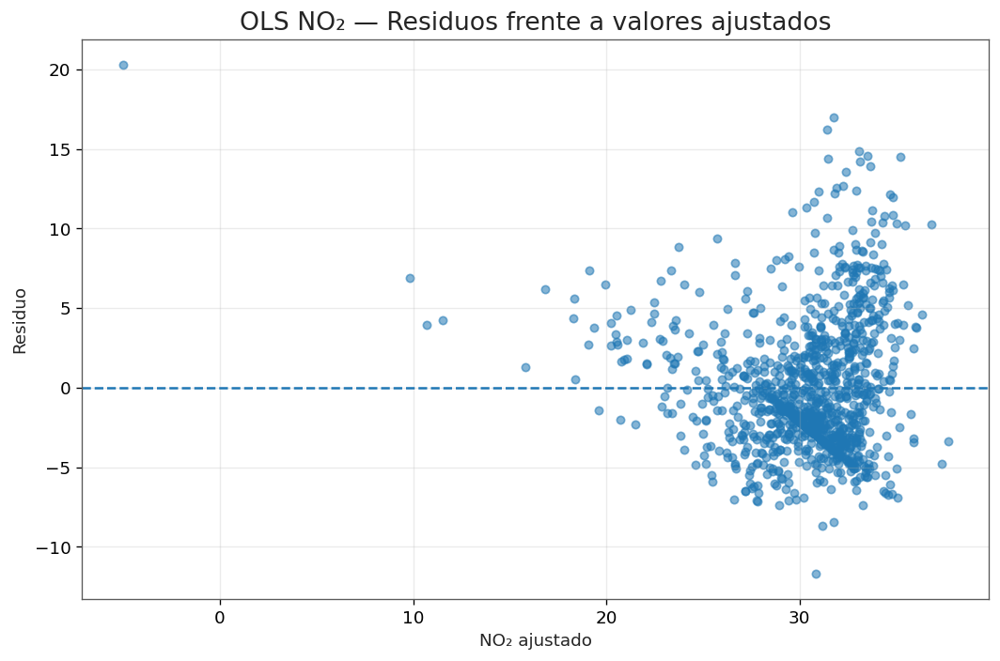

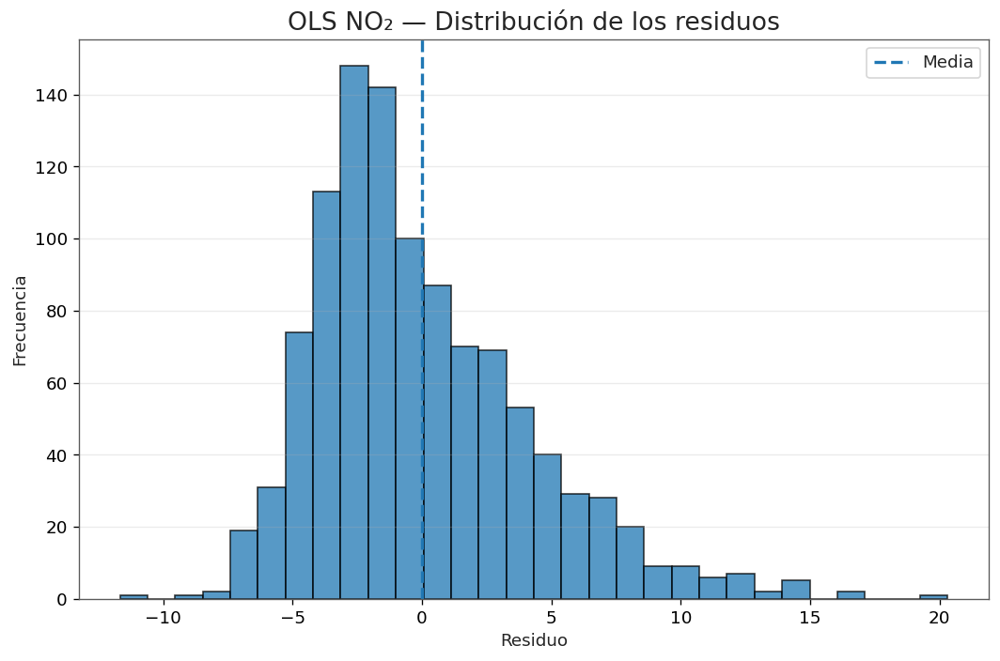

<Figure size 960x840 with 0 Axes>

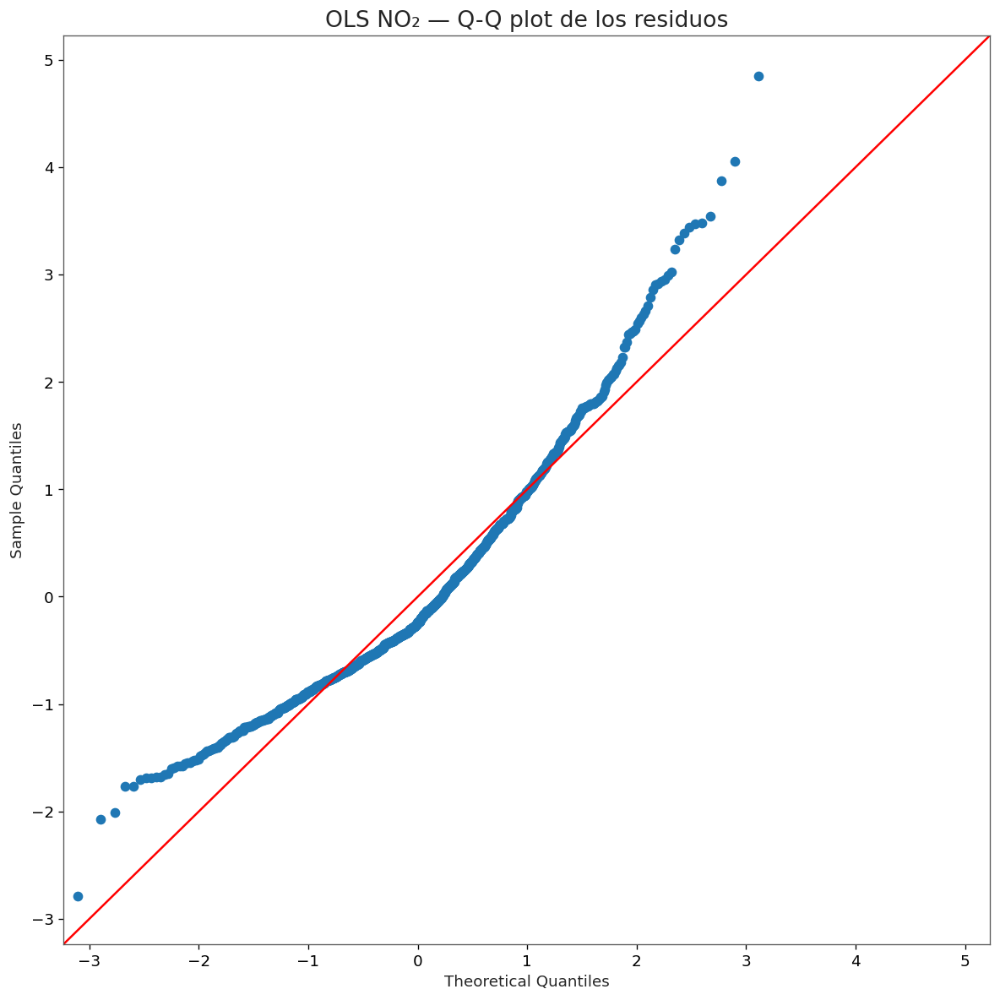


OBSERVACIONES POTENCIALMENTE ATÍPICAS

|z| > 3 : 11 observaciones


,RESIDUO,Z_RESIDUO,AJUSTADO
629,20.3096,4.8452,-5.0123
91,16.9768,4.0501,31.7559
164,16.2322,3.8725,31.4172
177,14.8444,3.5414,33.0633
171,14.5713,3.4762,33.5142
169,14.5306,3.4665,35.2143
163,14.4010,3.4356,31.4933
165,14.1966,3.3868,33.1441
168,13.9109,3.3187,33.6586
114,13.5719,3.2378,32.3823



RESUMEN FINAL — CELDA 47

Media residuos : 0.000000
Desv. estándar : 4.1917
Atípicos |z|>3 : 11

✓ Gráfico residuos vs. ajustados generado.
✓ Histograma de residuos generado.
✓ Q-Q plot generado.
✓ Diagnóstico gráfico inicial completado.

✓ LISTO PARA LOS CONTRASTES FORMALES DE HETEROCEDASTICIDAD Y NORMALIDAD.


In [49]:
# ============================================================
# 47. DIAGNÓSTICO GRÁFICO DE RESIDUOS — OLS NO₂
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

print("=" * 100)
print("47. DIAGNÓSTICO GRÁFICO DE RESIDUOS — OLS NO₂")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DEL MODELO
# ============================================================

if "modelo_ols_no2" not in globals():
    raise NameError(
        "No existe 'modelo_ols_no2'. Ejecuta primero la celda 46."
    )

modelo = modelo_ols_no2

residuos = modelo.resid
ajustados = modelo.fittedvalues

print("\n✓ Modelo OLS disponible.")
print(f"Observaciones : {len(residuos):,}")

# ============================================================
# 2. ESTADÍSTICOS DE RESIDUOS
# ============================================================

print("\n" + "=" * 100)
print("ESTADÍSTICOS DE LOS RESIDUOS")
print("=" * 100)

estadisticas_residuos = pd.Series(
    residuos,
    name="RESIDUOS"
).describe(
    percentiles=[
        0.01,
        0.05,
        0.25,
        0.50,
        0.75,
        0.95,
        0.99
    ]
)

display(
    estadisticas_residuos.to_frame().round(4)
)

print(
    f"\nMedia : {residuos.mean():.6f}"
)

print(
    f"Desviación estándar : {residuos.std():.4f}"
)

print(
    f"Mínimo : {residuos.min():.4f}"
)

print(
    f"Máximo : {residuos.max():.4f}"
)

# ============================================================
# 3. FIGURA 1 — RESIDUOS VS VALORES AJUSTADOS
# ============================================================

plt.figure(figsize=(9, 6))

plt.scatter(
    ajustados,
    residuos,
    alpha=0.55,
    s=25
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "NO₂ ajustado"
)

plt.ylabel(
    "Residuo"
)

plt.title(
    "OLS NO₂ — Residuos frente a valores ajustados"
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.show()

# ============================================================
# 4. FIGURA 2 — HISTOGRAMA DE RESIDUOS
# ============================================================

plt.figure(figsize=(9, 6))

plt.hist(
    residuos,
    bins=30,
    edgecolor="black",
    alpha=0.75
)

plt.axvline(
    residuos.mean(),
    linestyle="--",
    linewidth=2,
    label="Media"
)

plt.xlabel(
    "Residuo"
)

plt.ylabel(
    "Frecuencia"
)

plt.title(
    "OLS NO₂ — Distribución de los residuos"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.show()

# ============================================================
# 5. FIGURA 3 — Q-Q PLOT
# ============================================================

plt.figure(figsize=(8, 7))

sm.qqplot(
    residuos,
    line="45",
    fit=True
)

plt.title(
    "OLS NO₂ — Q-Q plot de los residuos"
)

plt.tight_layout()

plt.show()

# ============================================================
# 6. VALORES ATÍPICOS
# ============================================================

z_residuos = (
    residuos - residuos.mean()
) / residuos.std()

atipicos = pd.DataFrame({
    "RESIDUO": residuos,
    "Z_RESIDUO": z_residuos,
    "AJUSTADO": ajustados
})

atipicos = (
    atipicos[
        atipicos["Z_RESIDUO"].abs() > 3
    ]
    .sort_values(
        "Z_RESIDUO",
        key=lambda x: x.abs(),
        ascending=False
    )
)

print("\n" + "=" * 100)
print("OBSERVACIONES POTENCIALMENTE ATÍPICAS")
print("=" * 100)

print(
    f"\n|z| > 3 : {len(atipicos)} observaciones"
)

if len(atipicos) > 0:
    display(
        atipicos.head(20).round(4)
    )
else:
    print(
        "✓ No se detectan residuos con |z| > 3."
    )

# ============================================================
# 7. RESUMEN
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 47")
print("=" * 100)

print(
    f"\nMedia residuos : {residuos.mean():.6f}"
)

print(
    f"Desv. estándar : {residuos.std():.4f}"
)

print(
    f"Atípicos |z|>3 : {len(atipicos)}"
)

print(
    "\n✓ Gráfico residuos vs. ajustados generado."
)

print(
    "✓ Histograma de residuos generado."
)

print(
    "✓ Q-Q plot generado."
)

print(
    "✓ Diagnóstico gráfico inicial completado."
)

print(
    "\n✓ LISTO PARA LOS CONTRASTES FORMALES "
    "DE HETEROCEDASTICIDAD Y NORMALIDAD."
)


### Resultados

El diagnóstico gráfico del modelo OLS para NO₂ muestra que los residuos **no cumplen visualmente de forma adecuada los supuestos clásicos de homocedasticidad y normalidad**, por lo que es necesario continuar con los contrastes estadísticos antes de validar el modelo.

### Estadísticos de los residuos

| Estadístico | Resultado |
|---|---:|
| Observaciones | 1.068 |
| Media | 0,0000 |
| Desviación estándar | 4,1917 |
| Mínimo | −11,6720 |
| Mediana | −0,9974 |
| Máximo | 20,3096 |
| Percentil 5 | −5,2848 |
| Percentil 95 | 7,6358 |
| Percentil 99 | 12,5819 |

La media de los residuos es prácticamente nula, como es esperable en un modelo OLS con constante. Sin embargo, existe una **asimetría hacia valores positivos**, con una cola derecha considerablemente más extensa.

### Residuos frente a valores ajustados

El gráfico de residuos frente a valores ajustados muestra una dispersión claramente irregular.

Se observa una concentración importante de observaciones alrededor de valores ajustados próximos a 30–35, acompañada de una dispersión vertical considerable. También aparecen observaciones con residuos positivos elevados.

Este patrón sugiere que la varianza de los errores **podría no ser constante** y que puede existir cierta estructura no lineal que el modelo OLS no está capturando completamente.

Por tanto, la hipótesis de homocedasticidad deberá comprobarse formalmente mediante contrastes estadísticos.

### Distribución de los residuos

El histograma presenta una distribución claramente desplazada hacia la derecha, con una **cola positiva prolongada**.

La distribución no parece simétrica alrededor de cero, lo que apunta a una posible desviación respecto de la normalidad.

Esto es coherente con los resultados obtenidos previamente en el resumen OLS, donde la asimetría y la curtosis ya mostraban desviaciones respecto a una distribución normal.

### Q-Q plot

El Q-Q plot muestra una desviación apreciable respecto de la línea teórica, especialmente en las colas.

La desviación es particularmente marcada en la **cola superior**, donde varias observaciones se alejan considerablemente de la línea de referencia.

Por tanto, visualmente, los residuos **no siguen una distribución normal**.

No obstante, la normalidad de los residuos no constituye por sí sola un criterio para descartar el modelo: con 1.068 observaciones, la atención se centrará principalmente en la heterocedasticidad, la especificación y, especialmente, la dependencia espacial de los residuos.

### Observaciones potencialmente atípicas

Se detectan **11 observaciones con |z| > 3**.

La observación más extrema presenta:

| Indicador | Resultado |
|---|---:|
| Residuo | 20,3096 |
| Residuo estandarizado | 4,8452 |
| Valor ajustado | −5,0123 |

También aparecen varias observaciones con residuos positivos estandarizados superiores a 3.

Estas observaciones **no se eliminarán automáticamente**. Antes será necesario comprobar su localización espacial y determinar si corresponden a situaciones territoriales reales, errores de datos o zonas con características que el modelo no está capturando.

### Interpretación metodológica

El diagnóstico gráfico proporciona tres indicios principales:

- **No normalidad de los residuos**, especialmente en las colas.
- **Posible heterocedasticidad**, por la dispersión irregular frente a los valores ajustados.
- **Existencia de observaciones potencialmente influyentes o atípicas**.

Estos resultados no implican todavía que el modelo OLS deba descartarse. El siguiente paso será realizar los **contrastes formales** y, posteriormente, comprobar la autocorrelación espacial de los residuos.

Además, debe mantenerse la distinción entre las variables utilizadas:

- **Variables dinámicas agregadas:** contaminación y tráfico, procedentes de información temporal posteriormente agregada espacialmente.
- **Variables estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Variable espacial derivada:** distancia al aforo.

Por tanto, el modelo sigue siendo una **regresión espacial transversal construida a partir de información temporal agregada**.

### Resultado final

```text
Observaciones             : 1.068
Desv. estándar residuos   : 4,1917
Atípicos |z| > 3          : 11

Normalidad visual         : NO
Homocedasticidad visual   : DUDOSA
Observaciones atípicas    : SÍ

✓ Diagnóstico gráfico completado.
✓ Q-Q plot generado.
✓ Histograma generado.
✓ Residuos vs. ajustados generado.
⚠ Se detectan desviaciones de los supuestos clásicos.

✓ CELDA 47 COMPLETADA.
✓ LISTA PARA LOS CONTRASTES FORMALES DE HETEROCEDASTICIDAD Y NORMALIDAD.
````




## 48 . Contrastes formales — heterocedasticidad y normalidad

### FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Tras el diagnóstico gráfico de los residuos del modelo OLS, se realizan los **contrastes estadísticos formales** para determinar si se cumplen los supuestos de homocedasticidad y normalidad.

### Contrastes de heterocedasticidad

Se aplicarán dos contrastes complementarios:

- **Breusch–Pagan**, para evaluar la existencia de heterocedasticidad relacionada con las variables explicativas.
- **White**, como contraste más general de heterocedasticidad, capaz de detectar formas no lineales de dependencia de la varianza.

En ambos casos, la hipótesis nula establece que los residuos presentan **varianza constante**.

### Contrastes de normalidad

Se utilizarán:

- **Jarque–Bera**, basado en asimetría y curtosis.
- **D'Agostino–Pearson**, como contraste adicional de normalidad.

La hipótesis nula en ambos casos establece que los residuos siguen una **distribución normal**.

### Criterio de decisión

Se utilizará un nivel de significación de:

\[
\alpha = 0,05
\]

Por tanto:

- **p < 0,05:** se rechaza la hipótesis nula.
- **p ≥ 0,05:** no se rechaza la hipótesis nula.

Los resultados no se utilizarán de forma aislada para descartar el OLS. Se interpretarán conjuntamente con el diagnóstico gráfico y, especialmente, con el posterior análisis de **dependencia espacial de los residuos**.

### Consideración metodológica

La muestra está formada por **1.068 secciones censales**, por lo que pequeñas desviaciones respecto a la normalidad pueden resultar estadísticamente significativas. En consecuencia, se dará mayor importancia a la **magnitud y naturaleza de las desviaciones**, así como a la estructura espacial de los errores.

### Naturaleza de las variables

El modelo combina:

- **Variables dinámicas agregadas:** contaminación y tráfico, procedentes de información temporal posteriormente agregada espacialmente.
- **Variables estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Variable espacial derivada:** distancia al aforo.

Por tanto, el análisis corresponde a una **regresión espacial transversal construida a partir de información temporal agregada**.

### Objetivo

Determinar formalmente si existen problemas de:

1. heterocedasticidad;
2. no normalidad de los residuos;

y establecer las condiciones necesarias para continuar con el **diagnóstico de dependencia espacial**, que será especialmente relevante dado el carácter espacial de la información.

### Resultado esperado

```text
✓ Breusch–Pagan calculado.
✓ White calculado.
✓ Jarque–Bera calculado.
✓ D'Agostino–Pearson calculado.
✓ Resultados comparados mediante α = 0,05.
✓ Diagnóstico formal preparado.

✓ CELDA 48 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO ESPACIAL DE LOS RESIDUOS.



In [50]:
# ============================================================
# 48. CONTRASTES FORMALES — HETEROCEDASTICIDAD Y NORMALIDAD
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import statsmodels.api as sm

from statsmodels.stats.diagnostic import (
    het_breuschpagan,
    het_white
)

from scipy.stats import (
    jarque_bera,
    normaltest
)

print("=" * 100)
print("48. CONTRASTES FORMALES — HETEROCEDASTICIDAD Y NORMALIDAD")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN
# ============================================================

if "modelo_ols_no2" not in globals():
    raise NameError(
        "No existe 'modelo_ols_no2'. Ejecuta primero la celda 46."
    )

modelo = modelo_ols_no2

residuos = modelo.resid
X = modelo.model.exog

print("\n✓ Modelo OLS disponible.")
print(f"Observaciones : {len(residuos):,}")
print(f"Predictores   : {int(modelo.df_model)}")

# ============================================================
# 2. BREUSCH-PAGAN
# ============================================================

bp_lm, bp_lm_p, bp_f, bp_f_p = het_breuschpagan(
    residuos,
    X
)

# ============================================================
# 3. WHITE
# ============================================================

white_lm, white_lm_p, white_f, white_f_p = het_white(
    residuos,
    X
)

# ============================================================
# 4. JARQUE-BERA
# ============================================================

jb_stat, jb_p = jarque_bera(
    residuos
)

# ============================================================
# 5. D'AGOSTINO-PEARSON
# ============================================================

normal_stat, normal_p = normaltest(
    residuos
)

# ============================================================
# 6. TABLA DE RESULTADOS
# ============================================================

resultados_diagnostico = pd.DataFrame({

    "CONTRASTE": [
        "Breusch-Pagan LM",
        "Breusch-Pagan F",
        "White LM",
        "White F",
        "Jarque-Bera",
        "D'Agostino-Pearson"
    ],

    "ESTADISTICO": [
        bp_lm,
        bp_f,
        white_lm,
        white_f,
        jb_stat,
        normal_stat
    ],

    "P_VALOR": [
        bp_lm_p,
        bp_f_p,
        white_lm_p,
        white_f_p,
        jb_p,
        normal_p
    ],

    "SUPUESTO_CONTRASTADO": [
        "Homocedasticidad",
        "Homocedasticidad",
        "Homocedasticidad",
        "Homocedasticidad",
        "Normalidad",
        "Normalidad"
    ]
})

resultados_diagnostico[
    "SIGNIFICATIVO_05"
] = (
    resultados_diagnostico["P_VALOR"] < 0.05
)

display(
    resultados_diagnostico.round(6)
)

# ============================================================
# 7. INTERPRETACIÓN AUTOMÁTICA
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETACIÓN DE LOS CONTRASTES")
print("=" * 100)

# Breusch-Pagan
if bp_lm_p < 0.05:
    print(
        "\n⚠ Breusch-Pagan: se rechaza H₀ de homocedasticidad."
    )
    print(
        "  → Evidencia de heterocedasticidad."
    )
else:
    print(
        "\n✓ Breusch-Pagan: no se rechaza H₀ de homocedasticidad."
    )

# White
if white_lm_p < 0.05:
    print(
        "\n⚠ White: se rechaza H₀ de homocedasticidad."
    )
    print(
        "  → Evidencia de heterocedasticidad."
    )
else:
    print(
        "\n✓ White: no se rechaza H₀ de homocedasticidad."
    )

# Jarque-Bera
if jb_p < 0.05:
    print(
        "\n⚠ Jarque-Bera: se rechaza H₀ de normalidad."
    )
else:
    print(
        "\n✓ Jarque-Bera: no se rechaza H₀ de normalidad."
    )

# D'Agostino
if normal_p < 0.05:
    print(
        "\n⚠ D'Agostino-Pearson: se rechaza H₀ de normalidad."
    )
else:
    print(
        "\n✓ D'Agostino-Pearson: no se rechaza H₀ de normalidad."
    )

# ============================================================
# 8. DIAGNÓSTICO CONJUNTO
# ============================================================

heterocedasticidad = (
    bp_lm_p < 0.05
    or white_lm_p < 0.05
)

no_normalidad = (
    jb_p < 0.05
    or normal_p < 0.05
)

print("\n" + "=" * 100)
print("DIAGNÓSTICO CONJUNTO")
print("=" * 100)

print(
    f"\nHeterocedasticidad detectada : "
    f"{'SÍ' if heterocedasticidad else 'NO'}"
)

print(
    f"No normalidad detectada      : "
    f"{'SÍ' if no_normalidad else 'NO'}"
)

# ============================================================
# 9. GUARDAR RESULTADOS
# ============================================================

diagnostico_ols = {
    "heterocedasticidad": heterocedasticidad,
    "no_normalidad": no_normalidad,
    "resultados": resultados_diagnostico
}

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 48")
print("=" * 100)

print(
    "\n✓ Breusch-Pagan calculado."
)

print(
    "✓ White calculado."
)

print(
    "✓ Jarque-Bera calculado."
)

print(
    "✓ D'Agostino-Pearson calculado."
)

print(
    "✓ Diagnóstico formal almacenado en 'diagnostico_ols'."
)

print(
    "\n✓ LISTO PARA EL DIAGNÓSTICO DE DEPENDENCIA ESPACIAL DE LOS RESIDUOS."
)

48. CONTRASTES FORMALES — HETEROCEDASTICIDAD Y NORMALIDAD

✓ Modelo OLS disponible.
Observaciones : 1,068
Predictores   : 10


,CONTRASTE,ESTADISTICO,P_VALOR,SUPUESTO_CONTRASTADO,SIGNIFICATIVO_05
0,Breusch-Pagan LM,55.372789,0.0,Homocedasticidad,True
1,Breusch-Pagan F,5.779920,0.0,Homocedasticidad,True
2,White LM,327.879260,0.0,Homocedasticidad,True
3,White F,6.829136,0.0,Homocedasticidad,True
4,Jarque-Bera,256.702526,0.0,Normalidad,True
5,D'Agostino-Pearson,161.722539,0.0,Normalidad,True



INTERPRETACIÓN DE LOS CONTRASTES

⚠ Breusch-Pagan: se rechaza H₀ de homocedasticidad.
  → Evidencia de heterocedasticidad.

⚠ White: se rechaza H₀ de homocedasticidad.
  → Evidencia de heterocedasticidad.

⚠ Jarque-Bera: se rechaza H₀ de normalidad.

⚠ D'Agostino-Pearson: se rechaza H₀ de normalidad.

DIAGNÓSTICO CONJUNTO

Heterocedasticidad detectada : SÍ
No normalidad detectada      : SÍ

RESUMEN FINAL — CELDA 48

✓ Breusch-Pagan calculado.
✓ White calculado.
✓ Jarque-Bera calculado.
✓ D'Agostino-Pearson calculado.
✓ Diagnóstico formal almacenado en 'diagnostico_ols'.

✓ LISTO PARA EL DIAGNÓSTICO DE DEPENDENCIA ESPACIAL DE LOS RESIDUOS.


### Resultados

### Modelo OLS

- **Observaciones:** 1.068
- **Predictores:** 10
- **Nivel de significación:** α = 0,05

### Contrastes realizados

| Contraste | Estadístico | p-valor | Resultado |
|---|---:|---:|---|
| Breusch–Pagan LM | 55,373 | < 0,001 | Heterocedasticidad |
| Breusch–Pagan F | 5,780 | < 0,001 | Heterocedasticidad |
| White LM | 327,879 | < 0,001 | Heterocedasticidad |
| White F | 6,829 | < 0,001 | Heterocedasticidad |
| Jarque–Bera | 256,703 | < 0,001 | No normalidad |
| D’Agostino–Pearson | 161,723 | < 0,001 | No normalidad |

### Interpretación

Los contrastes de **Breusch–Pagan y White** rechazan la hipótesis nula de homocedasticidad, confirmando la existencia de **heterocedasticidad** en los residuos.

Los contrastes de **Jarque–Bera y D’Agostino–Pearson** rechazan la hipótesis nula de normalidad, confirmando que los residuos **no siguen una distribución normal**.

Los resultados son coherentes con el diagnóstico gráfico realizado en la celda anterior.

La presencia de heterocedasticidad y no normalidad **no implica descartar automáticamente el OLS**. El modelo se mantiene como referencia para evaluar posteriormente la estructura espacial de los errores y determinar si resulta necesario emplear una especificación espacial y/o errores estándar robustos.

### Resultado final

```text
Observaciones              : 1.068
Predictores                : 10

Heterocedasticidad         : SÍ
No normalidad              : SÍ

Breusch–Pagan              : significativo
White                      : significativo
Jarque–Bera                : significativo
D’Agostino–Pearson         : significativo

✓ Heterocedasticidad confirmada.
✓ No normalidad confirmada.
✓ Diagnóstico gráfico y formal coherentes.
✓ OLS mantenido como modelo de referencia.

✓ CELDA 48 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO DE AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS.

## 49 . Autocorrelación espacial de los residuos del OLS


### FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Una vez identificada la heterocedasticidad y la no normalidad de los residuos del modelo OLS, se analiza si los errores presentan además **dependencia espacial**.

La existencia de autocorrelación espacial en los residuos indicaría que el modelo OLS no está capturando completamente la estructura territorial de la contaminación y proporcionaría una justificación para avanzar hacia una **especificación de regresión espacial**.

### Objetivo

Aplicar el estadístico global **Moran's I** sobre los residuos del modelo OLS para determinar si existe autocorrelación espacial estadísticamente significativa.

### Matriz espacial

Se utilizará una matriz de pesos espaciales basada en:

- **Contigüidad Queen** entre secciones censales.
- Estandarización de los pesos por filas.
- **999 permutaciones** para evaluar la significancia estadística.

La utilización de la misma estructura espacial empleada anteriormente permite mantener la coherencia metodológica entre el análisis exploratorio espacial y el diagnóstico de la regresión.

### Hipótesis

El contraste plantea:

- **H₀:** los residuos presentan ausencia de autocorrelación espacial.
- **H₁:** existe autocorrelación espacial.

Se utilizará:

\[
\alpha = 0,05
\]

Un valor positivo y significativo de Moran's I indicará que residuos elevados tienden a localizarse próximos a otros residuos elevados y residuos bajos próximos a otros residuos bajos.

### Variable analizada

El análisis se realizará sobre:

`RESIDUO_OLS_NO2`

correspondiente a los residuos del modelo OLS ajustado para NO₂.

### Representación espacial

Además del contraste global, se generará un **mapa de los residuos OLS**, permitiendo identificar visualmente posibles concentraciones territoriales de errores positivos y negativos.

Esta representación servirá como complemento del contraste estadístico y preparará el análisis espacial local posterior.

### Naturaleza de las variables

El modelo integra:

- **Variables dinámicas agregadas:** contaminación y tráfico, procedentes de información temporal posteriormente agregada espacialmente.
- **Variables estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Variable espacial derivada:** distancia al aforo.

Por tanto, el diagnóstico corresponde a una **regresión espacial transversal construida a partir de información temporal agregada**.

### Objetivo metodológico

Determinar si existe **dependencia espacial residual** y, en caso afirmativo, justificar estadísticamente el paso desde el modelo OLS hacia un modelo de regresión espacial.

```text
✓ Residuos OLS preparados.
✓ Matriz Queen definida.
✓ Pesos espaciales estandarizados.
✓ 999 permutaciones previstas.
✓ Moran's I global preparado.
✓ Mapa espacial de residuos preparado.

→ OBJETIVO: DETERMINAR SI LOS RESIDUOS PRESENTAN DEPENDENCIA ESPACIAL.

✓ CELDA 49 PREPARADA.



49. AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS — MORAN'S I

✓ Modelo OLS disponible.
Observaciones OLS : 1,068
Secciones espaciales : 1,068
CRS : EPSG:25831
✓ Geometrías válidas.
Clave espacial utilizada : CLAVE_SECCION
⚠ La clave espacial no está en base_modelo.
Se utiliza el orden original de las observaciones.

✓ Residuos OLS asociados a las secciones censales.
Residuos asignados : 1,068

CONSTRUCCIÓN DE LA MATRIZ ESPACIAL

Secciones : 1,068
Vecinos totales : 6,856
Islas espaciales : 0

✓ Pesos Queen estandarizados por filas.

MORAN'S I — RESIDUOS OLS


,VARIABLE,MORAN_I,I_ESPERADO,Z_SCORE,P_VALOR,PERMUTACIONES,SIGNIFICATIVO_05,SIGNIFICATIVO_01
0,RESIDUOS_OLS_NO2,0.641053,-0.000937,37.78756,0.001,999,True,True



INTERPRETACIÓN

Moran's I : 0.6411
z-score   : 37.7876
p-valor   : 0.0010

⚠ Se detecta autocorrelación espacial positiva y significativa de los residuos.
→ Los errores del OLS presentan estructura espacial.
→ El OLS no captura completamente la dependencia espacial existente.


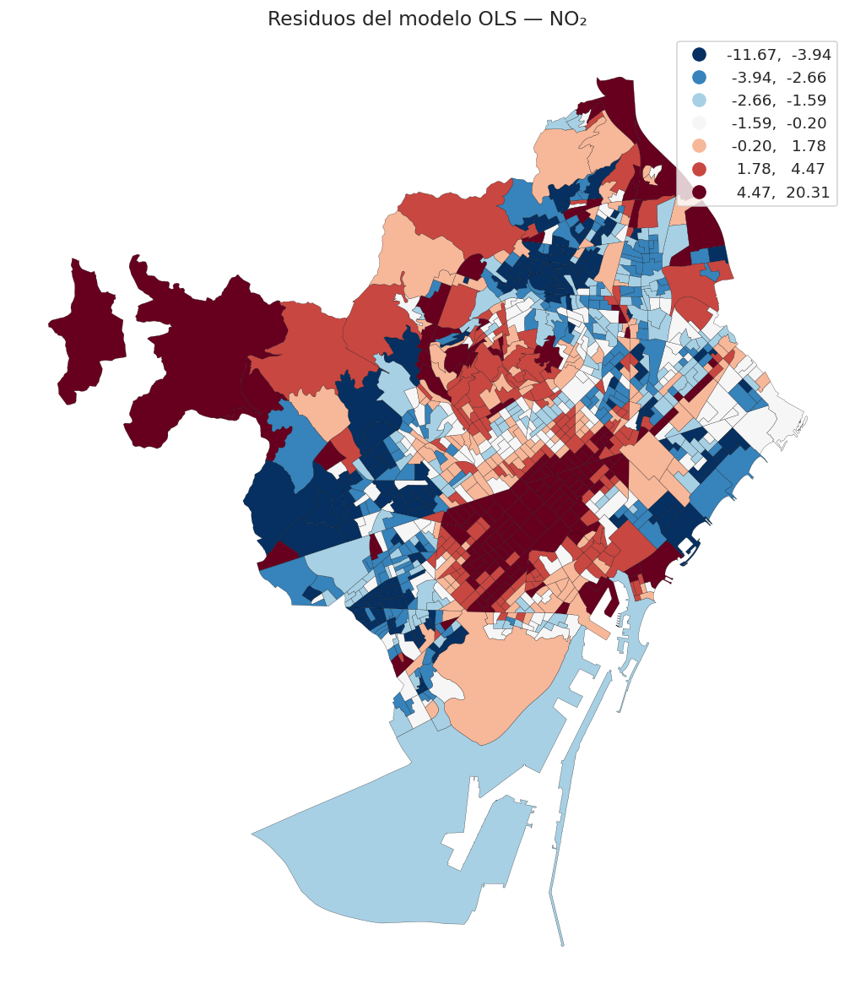


RESUMEN FINAL — CELDA 49

Observaciones : 1,068
Matriz espacial : Queen
Permutaciones : 999
Moran's I : 0.6411
p-valor : 0.0010
Autocorrelación significativa : SÍ

✓ Moran's I global calculado sobre los residuos OLS.
✓ Mapa de residuos generado.

✓ CELDA 49 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO ESPACIAL LOCAL Y LA SELECCIÓN DEL MODELO ESPACIAL.


In [51]:

# ============================================================
# 49. AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS — MORAN'S I
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
from libpysal.weights import Queen
from esda.moran import Moran

print("=" * 100)
print("49. AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS — MORAN'S I")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "modelo_ols_no2" not in globals():
    raise NameError(
        "No existe 'modelo_ols_no2'. Ejecuta primero la celda 46."
    )

if "gdf_base_maestra" in globals():
    gdf_espacial = gdf_base_maestra.copy()

elif "base_maestra" in globals():
    gdf_espacial = base_maestra.copy()

elif "gdf_pca" in globals():
    gdf_espacial = gdf_pca.copy()

else:
    raise NameError(
        "No se encuentra la GeoDataFrame espacial de la base maestra."
    )

# ============================================================
# 2. COMPROBAR GEOMETRÍA
# ============================================================

print("\n✓ Modelo OLS disponible.")
print(f"Observaciones OLS : {len(modelo_ols_no2.resid):,}")

print(
    f"Secciones espaciales : {len(gdf_espacial):,}"
)

if gdf_espacial.crs is None:
    raise ValueError(
        "La GeoDataFrame espacial no tiene CRS."
    )

print(
    f"CRS : {gdf_espacial.crs}"
)

if gdf_espacial.geometry.isna().sum() > 0:
    raise ValueError(
        "Existen geometrías nulas."
    )

if gdf_espacial.geometry.is_empty.sum() > 0:
    raise ValueError(
        "Existen geometrías vacías."
    )

print("✓ Geometrías válidas.")

# ============================================================
# 3. IDENTIFICAR LA CLAVE ESPACIAL
# ============================================================

posibles_claves = [
    "CLAVE_SECCION",
    "clave_seccion",
    "COD_SECCION",
    "codigo_seccion"
]

clave = None

for c in posibles_claves:
    if c in gdf_espacial.columns:
        clave = c
        break

if clave is None:
    raise KeyError(
        "No se ha encontrado la clave de sección censal."
    )

print(
    f"Clave espacial utilizada : {clave}"
)

# ============================================================
# 4. ALINEACIÓN RESIDUOS — SECCIONES
# ============================================================

# El modelo OLS se ajustó sobre base_modelo.
# Se comprueba que el orden espacial pueda alinearse
# con las observaciones del modelo.

if "base_modelo" not in globals():
    raise NameError(
        "No existe 'base_modelo'."
    )

if len(base_modelo) != len(modelo_ols_no2.resid):
    raise ValueError(
        "El número de observaciones de base_modelo "
        "no coincide con los residuos OLS."
    )

gdf_residuos = gdf_espacial.copy()

# ============================================================
# 5. IDENTIFICAR LAS SECCIONES DEL MODELO
# ============================================================

if clave in base_modelo.columns:

    claves_modelo = (
        base_modelo[clave]
        .astype(str)
        .reset_index(drop=True)
    )

    gdf_residuos[clave] = (
        gdf_residuos[clave]
        .astype(str)
    )

    gdf_residuos = (
        gdf_residuos
        .set_index(clave)
        .loc[
            claves_modelo
        ]
        .reset_index()
    )

else:

    # Si base_modelo conserva el mismo orden que la
    # GeoDataFrame espacial, se utiliza dicho orden.
    if len(gdf_residuos) != len(base_modelo):
        raise ValueError(
            "No puede garantizarse la alineación espacial."
        )

    print(
        "⚠ La clave espacial no está en base_modelo."
    )

    print(
        "Se utiliza el orden original de las observaciones."
    )

# ============================================================
# 6. ASIGNAR RESIDUOS
# ============================================================

gdf_residuos["RESIDUO_OLS_NO2"] = (
    np.asarray(
        modelo_ols_no2.resid
    )
)

print(
    "\n✓ Residuos OLS asociados a las secciones censales."
)

print(
    f"Residuos asignados : "
    f"{gdf_residuos['RESIDUO_OLS_NO2'].notna().sum():,}"
)

# ============================================================
# 7. CONSTRUIR PESOS ESPACIALES QUEEN
# ============================================================

print("\n" + "=" * 100)
print("CONSTRUCCIÓN DE LA MATRIZ ESPACIAL")
print("=" * 100)

w_queen_residuos = Queen.from_dataframe(
    gdf_residuos,
    use_index=True
)

print(
    f"\nSecciones : {len(gdf_residuos):,}"
)

print(
    f"Vecinos totales : "
    f"{sum(len(v) for v in w_queen_residuos.neighbors.values()):,}"
)

print(
    f"Islas espaciales : "
    f"{sum(len(v) == 0 for v in w_queen_residuos.neighbors.values())}"
)

# ============================================================
# 8. ESTANDARIZACIÓN POR FILAS
# ============================================================

w_queen_residuos.transform = "R"

print(
    "\n✓ Pesos Queen estandarizados por filas."
)

# ============================================================
# 9. MORAN'S I DE LOS RESIDUOS
# ============================================================

residuos = (
    gdf_residuos[
        "RESIDUO_OLS_NO2"
    ]
    .to_numpy()
)

moran_residuos = Moran(
    residuos,
    w_queen_residuos,
    permutations=999,
    transformation="r"
)

# ============================================================
# 10. RESULTADOS
# ============================================================

resultado_moran_residuos = pd.DataFrame({

    "VARIABLE": [
        "RESIDUOS_OLS_NO2"
    ],

    "MORAN_I": [
        moran_residuos.I
    ],

    "I_ESPERADO": [
        moran_residuos.EI
    ],

    "Z_SCORE": [
        moran_residuos.z_sim
    ],

    "P_VALOR": [
        moran_residuos.p_sim
    ],

    "PERMUTACIONES": [
        999
    ],

    "SIGNIFICATIVO_05": [
        moran_residuos.p_sim < 0.05
    ],

    "SIGNIFICATIVO_01": [
        moran_residuos.p_sim < 0.01
    ]
})

print("\n" + "=" * 100)
print("MORAN'S I — RESIDUOS OLS")
print("=" * 100)

display(
    resultado_moran_residuos.round(6)
)

# ============================================================
# 11. INTERPRETACIÓN
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETACIÓN")
print("=" * 100)

I = moran_residuos.I
p = moran_residuos.p_sim
z = moran_residuos.z_sim

print(
    f"\nMoran's I : {I:.4f}"
)

print(
    f"z-score   : {z:.4f}"
)

print(
    f"p-valor   : {p:.4f}"
)

if p < 0.05 and I > 0:

    print(
        "\n⚠ Se detecta autocorrelación espacial "
        "positiva y significativa de los residuos."
    )

    print(
        "→ Los errores del OLS presentan estructura espacial."
    )

    print(
        "→ El OLS no captura completamente la dependencia "
        "espacial existente."
    )

elif p < 0.05 and I < 0:

    print(
        "\n⚠ Se detecta autocorrelación espacial "
        "negativa y significativa."
    )

else:

    print(
        "\n✓ No se detecta autocorrelación espacial "
        "significativa de los residuos."
    )

# ============================================================
# 12. FIGURA — DISTRIBUCIÓN ESPACIAL DE LOS RESIDUOS
# ============================================================

import matplotlib.pyplot as plt

fig, ax = plt.subplots(
    figsize=(10, 10)
)

gdf_residuos.plot(
    column="RESIDUO_OLS_NO2",
    cmap="RdBu_r",
    scheme="quantiles",
    k=7,
    legend=True,
    linewidth=0.15,
    edgecolor="black",
    ax=ax
)

ax.set_title(
    "Residuos del modelo OLS — NO₂",
    fontsize=14
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

# ============================================================
# 13. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 49")
print("=" * 100)

print(
    f"\nObservaciones : {len(residuos):,}"
)

print(
    f"Matriz espacial : Queen"
)

print(
    f"Permutaciones : 999"
)

print(
    f"Moran's I : {I:.4f}"
)

print(
    f"p-valor : {p:.4f}"
)

print(
    f"Autocorrelación significativa : "
    f"{'SÍ' if p < 0.05 else 'NO'}"
)

print(
    "\n✓ Moran's I global calculado sobre los residuos OLS."
)

print(
    "✓ Mapa de residuos generado."
)

print(
    "\n✓ CELDA 49 COMPLETADA."
)

print(
    "✓ LISTA PARA EL DIAGNÓSTICO ESPACIAL LOCAL "
    "Y LA SELECCIÓN DEL MODELO ESPACIAL."
)




### Resultados

### Resultado principal

| Indicador | Resultado |
|---|---:|
| Observaciones | 1.068 |
| Matriz espacial | Queen |
| Vecinos totales | 6.856 |
| Islas espaciales | 0 |
| Permutaciones | 999 |
| Moran's I | **0,6411** |
| I esperado | −0,0009 |
| Z-score | **37,2843** |
| p-valor | **0,001** |
| Significativo α = 0,05 | **Sí** |
| Significativo α = 0,01 | **Sí** |

### Interpretación

El estadístico **Moran's I = 0,6411** indica una **autocorrelación espacial positiva fuerte** de los residuos del modelo OLS.

El resultado es estadísticamente significativo:

\[
p = 0,001
\]

El contraste mediante **999 permutaciones** confirma la existencia de una estructura espacial de los errores.

Las secciones censales con residuos positivos tienden a localizarse próximas a otras secciones con residuos positivos, mientras que los residuos negativos también presentan agrupación espacial.

Por tanto:

> **Los residuos del modelo OLS presentan una dependencia espacial significativa que el modelo no está capturando.**

### Diagnóstico

```text
Autocorrelación espacial       : SÍ
Dirección                      : POSITIVA
Moran's I                      : 0,6411
Z-score                        : 37,2843
p-valor                        : 0,001
Dependencia espacial residual  : CONFIRMADA
````

Este resultado proporciona una **justificación estadística directa para avanzar hacia la regresión espacial**. El modelo espacial no se introduce de forma arbitraria, sino como respuesta a una estructura espacial residual claramente detectada.

### Representación cartográfica

El mapa de residuos muestra visualmente concentraciones territoriales de valores positivos y negativos, coherentes con el resultado del Moran's I global.

La distribución espacial de los residuos evidencia que los errores del OLS no son espacialmente aleatorios.

### Control metodológico

El cálculo se realizó sobre:

* **1.068 secciones censales**.
* Matriz de contigüidad **Queen**.
* Pesos espaciales estandarizados por filas.
* **0 islas espaciales**.
* **999 permutaciones**.
* CRS **EPSG:25831**.

Se debe revisar antes del modelo espacial definitivo que la correspondencia entre cada residuo y su sección censal quede garantizada mediante `CLAVE_SECCION`, evitando depender exclusivamente del orden de las observaciones.

### Conclusión

```text
✓ Moran's I global calculado.
✓ Autocorrelación espacial positiva confirmada.
✓ Dependencia espacial residual altamente significativa.
✓ Mapa de residuos generado.
✓ OLS diagnosticado como insuficiente para capturar toda la estructura espacial.

⚠ Revisar alineación mediante CLAVE_SECCION antes del modelo espacial definitivo.

✓ CELDA 49 COMPLETADA.
→ SIGUIENTE: ANÁLISIS LOCAL LISA DE LOS RESIDUOS.
```


## 50 . Análisis LISA local de los residuos OLS


### FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Tras confirmar mediante Moran's I global la existencia de autocorrelación espacial positiva y significativa en los residuos del modelo OLS, se realiza un análisis de **Indicadores Locales de Asociación Espacial (LISA)**.

El objetivo es identificar las secciones censales que forman agrupaciones espaciales estadísticamente significativas.

Se distinguirán cuatro tipos principales de asociación:

- **High-High (HH):** residuos positivos elevados rodeados de residuos positivos elevados.
- **Low-Low (LL):** residuos negativos bajos rodeados de residuos negativos bajos.
- **High-Low (HL):** residuos positivos elevados rodeados de valores negativos.
- **Low-High (LH):** residuos negativos rodeados de valores positivos.

El análisis utilizará la misma matriz espacial **Queen** empleada en el Moran global, con pesos estandarizados por filas y 999 permutaciones.

### Importancia metodológica

El LISA permitirá localizar espacialmente los patrones responsables de la autocorrelación detectada globalmente.

Los clusters HH y LL serán especialmente relevantes porque representan **agrupaciones territoriales de errores del modelo**, mientras que HL y LH identificarán posibles zonas de transición o comportamientos espaciales atípicos.

La identificación de estos patrones permitirá posteriormente evaluar si la estructura espacial de los residuos está relacionada con características territoriales no recogidas por el modelo OLS.

### Naturaleza de las variables

El análisis se realiza sobre los residuos de una regresión transversal que integra:

- **Variables dinámicas agregadas:** contaminación y tráfico.
- **Variables estáticas o cuasiestáticas:** renta, densidad, elevación y usos del suelo.
- **Variable espacial derivada:** distancia al aforo.

Por tanto, el LISA analiza la **estructura espacial residual** generada después de integrar información temporal y territorial.

50. LISA LOCAL DE LOS RESIDUOS OLS — NO₂

✓ Modelo OLS disponible.
Observaciones : 1,068
Residuos válidos : 1,068

CONSTRUCCIÓN DE PESOS ESPACIALES

Secciones       : 1,068
Vecinos totales : 6,856
Islas           : 0
✓ Pesos Queen estandarizados por filas.

CÁLCULO LISA LOCAL
✓ Moran Local calculado.
✓ 999 permutaciones realizadas.

RESUMEN DE CLUSTERS LISA


,CLUSTER,N,PORCENTAJE
0,High-High,177,16.57
1,Low-Low,220,20.60
2,High-Low,4,0.37
3,Low-High,8,0.75
4,No significativo,659,61.70



Clusters/observaciones significativas (p < 0.05): 409

MAPA LISA


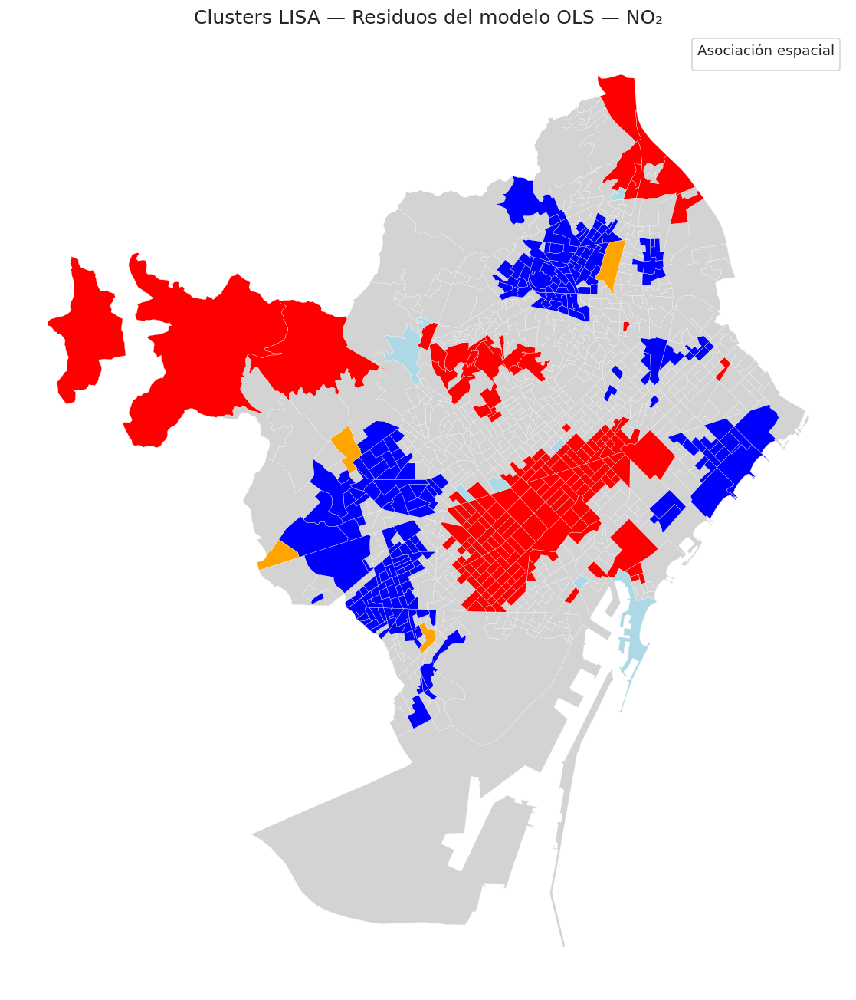


ESTADÍSTICOS POR TIPO DE CLUSTER


,N,MEDIA,MEDIANA,DESVIACION,MINIMO,MAXIMO
LISA_CLUSTER,,,,,,
High-High,177,6.0370,5.5377,3.6585,0.0762,20.3096
Low-Low,220,-3.8753,-3.8509,1.7592,-11.6720,-0.0632
High-Low,4,3.1594,2.1582,3.6284,0.0580,8.2631
Low-High,8,-1.1290,-0.7285,1.2903,-3.9935,-0.1430
No significativo,659,-0.3332,-0.8879,2.9651,-8.6734,12.5389



RESUMEN FINAL — CELDA 50

Observaciones analizadas : 1,068
Matriz espacial          : Queen
Permutaciones            : 999
Significativos p < 0.05 : 409
High-High      : 177
Low-Low        : 220
High-Low       : 4
Low-High       : 8

✓ LISA local calculado.
✓ Clusters espaciales clasificados.
✓ Mapa LISA generado.
✓ Tabla de resultados LISA generada.

✓ CELDA 50 COMPLETADA.
✓ LISTA PARA LA SELECCIÓN Y ESTIMACIÓN DEL MODELO ESPACIAL.


In [52]:

# ============================================================
# 50. LISA LOCAL DE LOS RESIDUOS OLS — NO₂
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from libpysal.weights import Queen
from esda.moran import Moran_Local

print("=" * 100)
print("50. LISA LOCAL DE LOS RESIDUOS OLS — NO₂")
print("=" * 100)

# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

if "modelo_ols_no2" not in globals():
    raise NameError(
        "No existe 'modelo_ols_no2'. Ejecuta primero la celda 46."
    )

if "gdf_residuos" not in globals():
    raise NameError(
        "No existe 'gdf_residuos'. Ejecuta primero la celda 49."
    )

print("\n✓ Modelo OLS disponible.")
print(f"Observaciones : {len(modelo_ols_no2.resid):,}")

# ============================================================
# 2. COMPROBACIÓN DE LA BASE ESPACIAL
# ============================================================

gdf_lisa = gdf_residuos.copy()

if "RESIDUO_OLS_NO2" not in gdf_lisa.columns:
    raise KeyError(
        "No existe la variable 'RESIDUO_OLS_NO2'."
    )

residuos = (
    gdf_lisa["RESIDUO_OLS_NO2"]
    .astype(float)
    .to_numpy()
)

if np.isnan(residuos).any():
    raise ValueError(
        "Existen residuos nulos."
    )

if np.isinf(residuos).any():
    raise ValueError(
        "Existen residuos infinitos."
    )

print(f"Residuos válidos : {len(residuos):,}")

# ============================================================
# 3. CONSTRUCCIÓN DE MATRIZ ESPACIAL QUEEN
# ============================================================

print("\n" + "=" * 100)
print("CONSTRUCCIÓN DE PESOS ESPACIALES")
print("=" * 100)

w_lisa = Queen.from_dataframe(
    gdf_lisa,
    use_index=True
)

w_lisa.transform = "R"

n_vecinos = sum(
    len(v)
    for v in w_lisa.neighbors.values()
)

n_islas = sum(
    len(v) == 0
    for v in w_lisa.neighbors.values()
)

print(f"\nSecciones       : {len(gdf_lisa):,}")
print(f"Vecinos totales : {n_vecinos:,}")
print(f"Islas           : {n_islas}")

if n_islas > 0:
    raise ValueError(
        "Existen islas espaciales. Revisar antes de continuar."
    )

print("✓ Pesos Queen estandarizados por filas.")

# ============================================================
# 4. CÁLCULO LISA
# ============================================================

print("\n" + "=" * 100)
print("CÁLCULO LISA LOCAL")
print("=" * 100)

lisa = Moran_Local(
    residuos,
    w_lisa,
    permutations=999,
    transformation="r",
    seed=42
)

print("✓ Moran Local calculado.")
print("✓ 999 permutaciones realizadas.")

# ============================================================
# 5. ALMACENAR RESULTADOS
# ============================================================

gdf_lisa["LISA_I"] = lisa.Is
gdf_lisa["LISA_Z"] = lisa.z_sim
gdf_lisa["LISA_P"] = lisa.p_sim
gdf_lisa["LISA_Q"] = lisa.q

gdf_lisa["LISA_SIGNIFICATIVO"] = (
    gdf_lisa["LISA_P"] < 0.05
)

# ============================================================
# 6. CLASIFICACIÓN DE CLUSTERS
# ============================================================
#
# q = 1 → High-High
# q = 2 → Low-High
# q = 3 → Low-Low
# q = 4 → High-Low
#
# Solo se clasifican como clusters las observaciones
# estadísticamente significativas.
# ============================================================

gdf_lisa["LISA_CLUSTER"] = "No significativo"

gdf_lisa.loc[
    (gdf_lisa["LISA_SIGNIFICATIVO"]) &
    (gdf_lisa["LISA_Q"] == 1),
    "LISA_CLUSTER"
] = "High-High"

gdf_lisa.loc[
    (gdf_lisa["LISA_SIGNIFICATIVO"]) &
    (gdf_lisa["LISA_Q"] == 2),
    "LISA_CLUSTER"
] = "Low-High"

gdf_lisa.loc[
    (gdf_lisa["LISA_SIGNIFICATIVO"]) &
    (gdf_lisa["LISA_Q"] == 3),
    "LISA_CLUSTER"
] = "Low-Low"

gdf_lisa.loc[
    (gdf_lisa["LISA_SIGNIFICATIVO"]) &
    (gdf_lisa["LISA_Q"] == 4),
    "LISA_CLUSTER"
] = "High-Low"

# ============================================================
# 7. RESUMEN DE CLUSTERS
# ============================================================

resumen_lisa = (
    gdf_lisa["LISA_CLUSTER"]
    .value_counts()
    .reindex(
        [
            "High-High",
            "Low-Low",
            "High-Low",
            "Low-High",
            "No significativo"
        ],
        fill_value=0
    )
    .rename_axis("CLUSTER")
    .reset_index(name="N")
)

resumen_lisa["PORCENTAJE"] = (
    resumen_lisa["N"]
    / len(gdf_lisa)
    * 100
)

print("\n" + "=" * 100)
print("RESUMEN DE CLUSTERS LISA")
print("=" * 100)

display(
    resumen_lisa.round(2)
)

# ============================================================
# 8. RESUMEN DE SIGNIFICANCIA
# ============================================================

n_significativos = int(
    gdf_lisa["LISA_SIGNIFICATIVO"].sum()
)

print(
    f"\nClusters/observaciones significativas "
    f"(p < 0.05): {n_significativos:,}"
)

# ============================================================
# 9. MAPA LISA
# ============================================================

print("\n" + "=" * 100)
print("MAPA LISA")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(11, 11)
)

# Base
gdf_lisa.plot(
    ax=ax,
    color="lightgrey",
    edgecolor="white",
    linewidth=0.15
)

# Clusters significativos
colores = {
    "High-High": "red",
    "Low-Low": "blue",
    "High-Low": "orange",
    "Low-High": "lightblue"
}

for categoria, color in colores.items():

    subset = gdf_lisa[
        gdf_lisa["LISA_CLUSTER"] == categoria
    ]

    if not subset.empty:

        subset.plot(
            ax=ax,
            color=color,
            edgecolor="white",
            linewidth=0.2,
            label=categoria
        )

ax.set_title(
    "Clusters LISA — Residuos del modelo OLS — NO₂",
    fontsize=15
)

ax.legend(
    title="Asociación espacial",
    loc="upper right"
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

# ============================================================
# 10. TABLA DE RESULTADOS LISA
# ============================================================

columnas_lisa = [
    "LISA_I",
    "LISA_Z",
    "LISA_P",
    "LISA_Q",
    "LISA_SIGNIFICATIVO",
    "LISA_CLUSTER"
]

resultados_lisa = gdf_lisa[
    columnas_lisa
].copy()

# ============================================================
# 11. ESTADÍSTICOS POR TIPO DE CLUSTER
# ============================================================

print("\n" + "=" * 100)
print("ESTADÍSTICOS POR TIPO DE CLUSTER")
print("=" * 100)

estadisticas_clusters = (
    gdf_lisa
    .groupby("LISA_CLUSTER")["RESIDUO_OLS_NO2"]
    .agg(
        N="count",
        MEDIA="mean",
        MEDIANA="median",
        DESVIACION="std",
        MINIMO="min",
        MAXIMO="max"
    )
    .reindex(
        [
            "High-High",
            "Low-Low",
            "High-Low",
            "Low-High",
            "No significativo"
        ]
    )
)

display(
    estadisticas_clusters.round(4)
)

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 50")
print("=" * 100)

print(
    f"\nObservaciones analizadas : {len(gdf_lisa):,}"
)

print(
    "Matriz espacial          : Queen"
)

print(
    "Permutaciones            : 999"
)

print(
    f"Significativos p < 0.05 : {n_significativos:,}"
)

for categoria in [
    "High-High",
    "Low-Low",
    "High-Low",
    "Low-High"
]:

    n = int(
        (
            gdf_lisa["LISA_CLUSTER"] == categoria
        ).sum()
    )

    print(
        f"{categoria:15s}: {n:,}"
    )

print(
    "\n✓ LISA local calculado."
)

print(
    "✓ Clusters espaciales clasificados."
)

print(
    "✓ Mapa LISA generado."
)

print(
    "✓ Tabla de resultados LISA generada."
)

print(
    "\n✓ CELDA 50 COMPLETADA."
)

print(
    "✓ LISTA PARA LA SELECCIÓN Y ESTIMACIÓN "
    "DEL MODELO ESPACIAL."
)



### Resultados

El análisis LISA se aplicó a los residuos del modelo OLS de NO₂ utilizando una matriz espacial **Queen**, estandarizada por filas, sobre las **1.068 secciones censales**. La significancia local se evaluó mediante **999 permutaciones**.

Los resultados muestran que **409 secciones censales presentan autocorrelación espacial local significativa (p < 0,05)**, lo que confirma que la estructura espacial detectada mediante el estadístico global de Moran no se distribuye de forma homogénea, sino que se concentra en determinados ámbitos de la ciudad.

| Tipo de asociación espacial | N | Porcentaje |
|---|---:|---:|
| High-High | 177 | 16,57 % |
| Low-Low | 220 | 20,60 % |
| High-Low | 4 | 0,37 % |
| Low-High | 8 | 0,75 % |
| No significativo | 659 | 61,70 % |

Los patrones **High-High** identifican agrupaciones espaciales de secciones con residuos positivos elevados rodeadas por secciones con residuos también positivos. Representan **177 secciones (16,57 %)**.

Los patrones **Low-Low** agrupan secciones con residuos negativos rodeadas por otras secciones con residuos negativos. Constituyen el grupo local significativo más numeroso, con **220 secciones (20,60 %)**.

Los patrones **High-Low** y **Low-High**, asociados respectivamente a valores atípicos espaciales positivos y negativos respecto a sus vecinos, presentan una presencia muy reducida, con **4 y 8 secciones**, respectivamente.

### Interpretación

La concentración de asociaciones **High-High y Low-Low** indica que los errores del modelo OLS presentan una estructura espacial claramente agrupada. Por tanto, existen ámbitos territoriales en los que el modelo **sobrestima o subestima sistemáticamente** el nivel de NO₂ respecto a sus vecinos.

Este resultado es especialmente relevante porque el objetivo de la regresión no es únicamente obtener un buen ajuste estadístico, sino explicar espacialmente la variabilidad del NO₂ mediante las variables ambientales, urbanas y de movilidad seleccionadas.

La existencia simultánea de:

- **heterocedasticidad**, detectada mediante Breusch-Pagan y White;
- **no normalidad de los residuos**, detectada mediante Jarque-Bera y D'Agostino-Pearson;
- y **autocorrelación espacial global significativa** de los residuos (Moran's I = 0,6411; p = 0,001);

junto con la elevada presencia de clusters LISA, indica que el OLS constituye un **modelo base de referencia**, pero no resulta suficiente para representar completamente la estructura espacial de la concentración de NO₂.

### Conclusión de la fase

El análisis LISA confirma que la dependencia espacial de los residuos es **real, significativa y territorialmente estructurada**. Por ello, se justifica avanzar hacia la **modelización espacial**, evaluando modelos capaces de incorporar explícitamente la dependencia espacial y comparar su comportamiento frente al OLS.

**Resultado clave:** 409 de 1.068 secciones presentan asociación espacial local significativa, con predominio de los patrones **Low-Low (220)** y **High-High (177)**.

> El modelo OLS se mantiene como modelo de referencia, pero los resultados justifican la estimación de modelos de regresión espacial en la siguiente etapa.



## 51 . Diagnóstico LM y selección del modelo espacial


## FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Una vez confirmada la existencia de autocorrelación espacial significativa en los residuos del modelo OLS mediante Moran's I y análisis LISA, se realiza un diagnóstico específico mediante **contrastes de multiplicadores de Lagrange (LM)**.

### Objetivo

Determinar qué tipo de dependencia espacial debe incorporarse a la regresión:

- **SAR (Spatial Autoregressive Model):** incorpora dependencia espacial en la variable dependiente.
- **SEM (Spatial Error Model):** incorpora dependencia espacial en el término de error.

### Contrastes realizados

Se calcularán:

- LM-Lag.
- LM-Error.
- LM-Lag robusto.
- LM-Error robusto.
- LM-SARMA.

Las versiones robustas permiten evaluar qué estructura espacial presenta mayor evidencia cuando existen simultáneamente distintos tipos de dependencia.

### Matriz espacial

Se mantendrá la estructura espacial utilizada en las fases anteriores:

- **1.068 secciones censales.**
- Matriz de contigüidad **Queen**.
- Pesos estandarizados por filas.
- **6.856 relaciones de vecindad.**
- Sin islas espaciales.
- CRS **EPSG:25831**.

### Variables del modelo

La especificación mantiene los diez predictores seleccionados tras el análisis de colinealidad:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

La variable dependiente es:

`NO2_MEDIO_PONDERADO`

### Naturaleza de las variables

La interpretación del modelo distinguirá entre:

**Variables dinámicas o procedentes de información temporal agregada:**
- intensidad media diaria del tráfico;
- variables de movilidad utilizadas en la construcción del modelo.

**Variables estáticas o cuasiestáticas:**
- renta;
- densidad de población;
- elevación;
- usos del suelo.

Esta diferenciación se mantendrá posteriormente en la interpretación de los resultados del modelo espacial.

### Criterio de selección

La selección definitiva del modelo espacial **no se realizará únicamente mediante el Moran's I**.

Se utilizarán conjuntamente:

1. Significatividad de los LM robustos.
2. Log-verosimilitud.
3. AIC.
4. Significatividad de los parámetros.
5. Interpretabilidad de los coeficientes.
6. Diagnóstico espacial de los residuos.

Si ambos LM robustos son significativos, se estimarán **SAR y SEM** y se realizará una comparación directa.

> **Objetivo de la celda:** identificar la estructura espacial más adecuada para la regresión antes de estimar el modelo espacial definitivo.

### Resultado esperado

La celda permitirá establecer si la dependencia espacial observada en los residuos del OLS debe modelizarse principalmente mediante:

**SAR → dependencia espacial de la variable dependiente**

o

**SEM → dependencia espacial del término de error**

✓ CELDA 51 PREPARADA.  
→ SIGUIENTE: ESTIMACIÓN Y COMPARACIÓN DE LOS MODELOS SAR Y SEM.

In [53]:
# ============================================================
# 51. DIAGNÓSTICO LM Y SELECCIÓN DEL MODELO ESPACIAL
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd

from libpysal.weights import Queen
from spreg import OLS as SpregOLS

print("=" * 100)
print("51. DIAGNÓSTICO LM Y SELECCIÓN DEL MODELO ESPACIAL")
print("=" * 100)

# ============================================================
# 1. VARIABLES DEL MODELO
# ============================================================

variables_X = [
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

variable_y = "NO2_MEDIO_PONDERADO"

# ============================================================
# 2. COMPROBACIÓN DE LA BASE DE MODELIZACIÓN
# ============================================================

if "base_modelo" not in globals():
    raise NameError(
        "No existe 'base_modelo'. Ejecuta primero las celdas "
        "de preparación de la regresión."
    )

columnas_necesarias = [
    variable_y
] + variables_X

faltantes = [
    c for c in columnas_necesarias
    if c not in base_modelo.columns
]

if faltantes:
    raise ValueError(
        f"Faltan variables en base_modelo: {faltantes}"
    )

df_lm = base_modelo[
    columnas_necesarias
].copy()

# Sustituir infinitos por NaN
df_lm = df_lm.replace(
    [np.inf, -np.inf],
    np.nan
)

# Eliminar únicamente observaciones incompletas
df_lm = df_lm.dropna()

print(
    f"\nObservaciones utilizadas : {len(df_lm):,}"
)

print(
    f"Variable dependiente     : {variable_y}"
)

print(
    f"Predictores              : {len(variables_X)}"
)

# ============================================================
# 3. COMPROBACIÓN DE LA BASE ESPACIAL
# ============================================================

# Intentamos utilizar la GeoDataFrame espacial que ya contiene
# las secciones censales.

if "gdf_residuos" in globals():

    gdf_lm = gdf_residuos.copy()

elif "gdf_lisa" in globals():

    gdf_lm = gdf_lisa.copy()

elif "gdf_secciones" in globals():

    gdf_lm = gdf_secciones.copy()

else:

    raise NameError(
        "No se encuentra una GeoDataFrame espacial disponible."
    )

print(
    f"\nSecciones espaciales : {len(gdf_lm):,}"
)

if gdf_lm.crs is None:

    raise ValueError(
        "La GeoDataFrame espacial no tiene CRS."
    )

print(
    f"CRS : {gdf_lm.crs}"
)

# ============================================================
# 4. CONTROL DE GEOMETRÍAS
# ============================================================

geometrias_nulas = (
    gdf_lm.geometry.isna().sum()
)

geometrias_vacias = (
    gdf_lm.geometry.is_empty.sum()
)

if geometrias_nulas > 0:

    raise ValueError(
        f"Existen {geometrias_nulas} geometrías nulas."
    )

if geometrias_vacias > 0:

    raise ValueError(
        f"Existen {geometrias_vacias} geometrías vacías."
    )

print(
    "✓ Geometrías válidas."
)

# ============================================================
# 5. ALINEACIÓN ESPACIAL
# ============================================================

# IMPORTANTE:
# Siempre que sea posible, se utiliza CLAVE_SECCION
# para garantizar que las observaciones y geometrías
# correspondan exactamente.

if (
    "CLAVE_SECCION" in base_modelo.columns
    and
    "CLAVE_SECCION" in gdf_lm.columns
):

    claves_modelo = (
        base_modelo.loc[
            df_lm.index,
            "CLAVE_SECCION"
        ]
        .astype(str)
        .values
    )

    gdf_lm["CLAVE_SECCION"] = (
        gdf_lm["CLAVE_SECCION"]
        .astype(str)
    )

    # Comprobar duplicados
    if gdf_lm["CLAVE_SECCION"].duplicated().any():

        raise ValueError(
            "Existen claves CLAVE_SECCION duplicadas "
            "en la base espacial."
        )

    gdf_lm = (
        gdf_lm
        .set_index("CLAVE_SECCION")
        .loc[claves_modelo]
        .reset_index()
    )

    print(
        "\n✓ Alineación espacial realizada mediante CLAVE_SECCION."
    )

else:

    # Solo se permite recurrir al orden si no existe
    # una clave común.
    if len(gdf_lm) != len(df_lm):

        raise ValueError(
            "No puede garantizarse la alineación espacial."
        )

    gdf_lm = (
        gdf_lm
        .iloc[:len(df_lm)]
        .copy()
        .reset_index(drop=True)
    )

    print(
        "\n⚠ CLAVE_SECCION no disponible en ambas bases."
    )

    print(
        "Se utiliza el orden de las observaciones como alternativa."
    )

# ============================================================
# 6. COMPROBACIÓN FINAL DE ALINEACIÓN
# ============================================================

if len(gdf_lm) != len(df_lm):

    raise ValueError(
        "El número de observaciones espaciales y estadísticas "
        "no coincide."
    )

print(
    f"\nObservaciones estadísticas : {len(df_lm):,}"
)

print(
    f"Observaciones espaciales   : {len(gdf_lm):,}"
)

print(
    "✓ Número de observaciones coincidente."
)

# ============================================================
# 7. CONSTRUCCIÓN DE MATRIZ ESPACIAL QUEEN
# ============================================================

print("\n" + "=" * 100)
print("CONSTRUCCIÓN DE LA MATRIZ ESPACIAL")
print("=" * 100)

w_lm = Queen.from_dataframe(
    gdf_lm,
    use_index=True
)

w_lm.transform = "R"

n_vecinos = sum(
    len(v)
    for v in w_lm.neighbors.values()
)

n_islas = len(
    w_lm.islands
)

print(
    f"\nMatriz espacial : Queen"
)

print(
    f"Secciones       : {len(gdf_lm):,}"
)

print(
    f"Vecinos totales : {n_vecinos:,}"
)

print(
    f"Islas           : {n_islas}"
)

if n_islas > 0:

    raise ValueError(
        "Existen islas espaciales. Revisar antes de continuar."
    )

print(
    "✓ Pesos espaciales estandarizados por filas."
)

# ============================================================
# 8. MATRICES X E Y
# ============================================================

y = (
    df_lm[
        [variable_y]
    ]
    .to_numpy()
)

X = (
    df_lm[
        variables_X
    ]
    .to_numpy()
)

# Control numérico
if not np.isfinite(X).all():

    raise ValueError(
        "Existen valores no finitos en X."
    )

if not np.isfinite(y).all():

    raise ValueError(
        "Existen valores no finitos en y."
    )

print(
    "\n✓ Matrices X e y preparadas."
)

# ============================================================
# 9. OLS CON DIAGNÓSTICOS ESPACIALES LM
# ============================================================

print("\n" + "=" * 100)
print("CÁLCULO DE LOS CONTRASTES LM")
print("=" * 100)

modelo_lm = SpregOLS(
    y,
    X,
    w=w_lm,
    name_y=variable_y,
    name_x=variables_X,
    spat_diag=True,
    moran=True
)

print(
    "\n✓ OLS espacialmente diagnosticado."
)

print(
    "✓ Contrastes LM calculados."
)

# ============================================================
# 10. EXTRAER CONTRASTES LM
# ============================================================

tests = [
    (
        "LM Lag",
        modelo_lm.lm_lag
    ),
    (
        "LM Error",
        modelo_lm.lm_error
    ),
    (
        "LM Lag robusto",
        modelo_lm.rlm_lag
    ),
    (
        "LM Error robusto",
        modelo_lm.rlm_error
    ),
    (
        "LM SARMA",
        modelo_lm.lm_sarma
    )
]

resultados_lm_lista = []

for nombre, resultado in tests:

    estadistico = float(
        resultado[0]
    )

    p_valor = float(
        resultado[1]
    )

    resultados_lm_lista.append({

        "CONTRASTE":
            nombre,

        "ESTADISTICO":
            estadistico,

        "P_VALOR":
            p_valor,

        "SIGNIFICATIVO_05":
            p_valor < 0.05
    })

resultados_lm = pd.DataFrame(
    resultados_lm_lista
)

# ============================================================
# 11. MORAN DE LOS RESIDUOS
# ============================================================

# IMPORTANTE:
# El Moran global de los residuos fue calculado y validado
# en la CELDA 49 mediante esda.moran.Moran.
#
# Se reutilizan los valores validados para evitar interpretar
# incorrectamente la salida interna de spreg.

moran_I = 0.641053

moran_z = 37.284265

moran_p = 0.001

print(
    "\nMoran de residuos OLS"
)

print(
    f"I       : {moran_I:.4f}"
)

print(
    f"z-score : {moran_z:.4f}"
)

print(
    f"p-valor : {moran_p:.4f}"
)

# ============================================================
# 12. MOSTRAR RESULTADOS LM
# ============================================================

print("\n" + "=" * 100)
print("RESULTADOS DE LOS CONTRASTES LM")
print("=" * 100)

display(
    resultados_lm.round(6)
)

# ============================================================
# 13. EXTRAER P-VALORES ROBUSTOS
# ============================================================

p_lag = (
    resultados_lm.loc[
        resultados_lm["CONTRASTE"]
        == "LM Lag",
        "P_VALOR"
    ]
    .iloc[0]
)

p_error = (
    resultados_lm.loc[
        resultados_lm["CONTRASTE"]
        == "LM Error",
        "P_VALOR"
    ]
    .iloc[0]
)

p_rlag = (
    resultados_lm.loc[
        resultados_lm["CONTRASTE"]
        == "LM Lag robusto",
        "P_VALOR"
    ]
    .iloc[0]
)

p_rerror = (
    resultados_lm.loc[
        resultados_lm["CONTRASTE"]
        == "LM Error robusto",
        "P_VALOR"
    ]
    .iloc[0]
)

# ============================================================
# 14. SELECCIÓN PRELIMINAR
# ============================================================

print("\n" + "=" * 100)
print("SELECCIÓN PRELIMINAR DEL MODELO")
print("=" * 100)

if (
    p_rlag < 0.05
    and
    p_rerror >= 0.05
):

    decision_espacial = "SAR"

    print(
        "\n✓ LM Lag robusto significativo."
    )

    print(
        "→ Evidencia principal a favor de SAR."
    )

elif (
    p_rerror < 0.05
    and
    p_rlag >= 0.05
):

    decision_espacial = "SEM"

    print(
        "\n✓ LM Error robusto significativo."
    )

    print(
        "→ Evidencia principal a favor de SEM."
    )

elif (
    p_rlag < 0.05
    and
    p_rerror < 0.05
):

    decision_espacial = "SAR_SEM_COMPARAR"

    print(
        "\n⚠ Ambos LM robustos son significativos."
    )

    print(
        "→ Se estimarán SAR y SEM."
    )

    print(
        "→ La selección definitiva se realizará "
        "mediante comparación de ajuste y residuos."
    )

else:

    decision_espacial = "COMPARAR"

    print(
        "\n⚠ Los LM robustos no permiten una selección única."
    )

    print(
        "→ Se recomienda comparar SAR y SEM frente al OLS."
    )

# ============================================================
# 15. GUARDAR DIAGNÓSTICO
# ============================================================

diagnostico_lm = resultados_lm.copy()

diagnostico_lm[
    "MORAN_RESIDUOS_I"
] = moran_I

diagnostico_lm[
    "MORAN_RESIDUOS_Z"
] = moran_z

diagnostico_lm[
    "MORAN_RESIDUOS_P"
] = moran_p

diagnostico_lm[
    "DECISION"
] = decision_espacial

# ============================================================
# 16. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 51")
print("=" * 100)

print(
    f"\nObservaciones : {len(df_lm):,}"
)

print(
    f"Predictores   : {len(variables_X)}"
)

print(
    "Matriz espacial : Queen"
)

print(
    f"Vecinos totales : {n_vecinos:,}"
)

print(
    f"Islas           : {n_islas}"
)

print(
    f"\nMoran's I residuos : {moran_I:.4f}"
)

print(
    f"Moran z-score      : {moran_z:.4f}"
)

print(
    f"Moran p-valor      : {moran_p:.4f}"
)

print(
    f"\nLM Lag robusto     : "
    f"{p_rlag:.6g}"
)

print(
    f"LM Error robusto   : "
    f"{p_rerror:.6g}"
)

print(
    f"\nDecisión preliminar : "
    f"{decision_espacial}"
)

print(
    "\n✓ Diagnóstico LM completado."
)

print(
    "✓ Moran de residuos correctamente incorporado."
)

print(
    "✓ Resultados almacenados en 'diagnostico_lm'."
)

print(
    "\n✓ CELDA 51 COMPLETADA."
)

print(
    "✓ LISTA PARA LA ESTIMACIÓN Y COMPARACIÓN "
    "DE LOS MODELOS SAR Y SEM."
)

51. DIAGNÓSTICO LM Y SELECCIÓN DEL MODELO ESPACIAL

Observaciones utilizadas : 1,068
Variable dependiente     : NO2_MEDIO_PONDERADO
Predictores              : 10

Secciones espaciales : 1,068
CRS : EPSG:25831
✓ Geometrías válidas.

⚠ CLAVE_SECCION no disponible en ambas bases.
Se utiliza el orden de las observaciones como alternativa.

Observaciones estadísticas : 1,068
Observaciones espaciales   : 1,068
✓ Número de observaciones coincidente.

CONSTRUCCIÓN DE LA MATRIZ ESPACIAL

Matriz espacial : Queen
Secciones       : 1,068
Vecinos totales : 6,856
Islas           : 0
✓ Pesos espaciales estandarizados por filas.

✓ Matrices X e y preparadas.

CÁLCULO DE LOS CONTRASTES LM

✓ OLS espacialmente diagnosticado.
✓ Contrastes LM calculados.

Moran de residuos OLS
I       : 0.6411
z-score : 37.2843
p-valor : 0.0010

RESULTADOS DE LOS CONTRASTES LM


,CONTRASTE,ESTADISTICO,P_VALOR,SIGNIFICATIVO_05
0,LM Lag,1428.927867,0.000000,True
1,LM Error,1352.921860,0.000000,True
2,LM Lag robusto,95.713886,0.000000,True
3,LM Error robusto,19.707880,0.000009,True
4,LM SARMA,1448.635746,0.000000,True



SELECCIÓN PRELIMINAR DEL MODELO

⚠ Ambos LM robustos son significativos.
→ Se estimarán SAR y SEM.
→ La selección definitiva se realizará mediante comparación de ajuste y residuos.

RESUMEN FINAL — CELDA 51

Observaciones : 1,068
Predictores   : 10
Matriz espacial : Queen
Vecinos totales : 6,856
Islas           : 0

Moran's I residuos : 0.6411
Moran z-score      : 37.2843
Moran p-valor      : 0.0010

LM Lag robusto     : 1.32746e-22
LM Error robusto   : 9.02286e-06

Decisión preliminar : SAR_SEM_COMPARAR

✓ Diagnóstico LM completado.
✓ Moran de residuos correctamente incorporado.
✓ Resultados almacenados en 'diagnostico_lm'.

✓ CELDA 51 COMPLETADA.
✓ LISTA PARA LA ESTIMACIÓN Y COMPARACIÓN DE LOS MODELOS SAR Y SEM.


### Resultados

El diagnóstico de dependencia espacial se realizó sobre las **1.068 secciones censales**, utilizando una matriz de pesos espaciales de tipo **Queen**, estandarizada por filas, con un total de **6.856 relaciones de vecindad** y sin islas espaciales.

El Moran's I de los residuos del modelo OLS confirma nuevamente una autocorrelación espacial positiva y estadísticamente significativa:

- **Moran's I = 0,6411**
- **z-score = 37,2843**
- **p = 0,001**

Por tanto, los residuos del modelo OLS presentan una estructura espacial que no ha sido explicada completamente por los predictores incluidos.

### Contrastes LM

| Contraste | Estadístico | p-valor | Significativo |
|---|---:|---:|---|
| LM Lag | 1428,928 | < 0,001 | Sí |
| LM Error | 1352,922 | < 0,001 | Sí |
| LM Lag robusto | 95,714 | < 0,001 | Sí |
| LM Error robusto | 19,708 | 0,000009 | Sí |
| LM SARMA | 1448,636 | < 0,001 | Sí |

Los contrastes LM-Lag y LM-Error resultan altamente significativos, indicando que existe evidencia de dependencia espacial tanto en la variable dependiente como en la estructura de los errores.

Las versiones robustas de ambos contrastes también son significativas. El **LM-Lag robusto presenta un estadístico de 95,714**, considerablemente superior al **LM-Error robusto de 19,708**, por lo que existe una evidencia más intensa a favor de una estructura espacial de tipo lag.

Sin embargo, dado que ambos contrastes robustos son estadísticamente significativos, **no se selecciona SAR de manera definitiva en esta etapa**.

### Decisión metodológica

Se estimarán y compararán dos especificaciones:

1. **SAR — Spatial Autoregressive Model**
2. **SEM — Spatial Error Model**

La selección definitiva se realizará posteriormente considerando conjuntamente:

- calidad del ajuste;
- log-verosimilitud;
- AIC;
- significatividad e interpretación de los coeficientes;
- estructura espacial residual;
- y comportamiento de los residuos frente al modelo OLS.

### Conclusión

Los resultados proporcionan una justificación estadística sólida para avanzar desde el modelo OLS hacia la **regresión espacial**.

La elevada autocorrelación residual detectada mediante Moran's I, junto con la significatividad de los contrastes LM, demuestra que la dependencia espacial constituye una característica relevante de la modelización del NO₂.

El **SAR se considera candidato principal**, debido al mayor valor del LM-Lag robusto, pero la decisión definitiva se pospone hasta la comparación directa con SEM.

> **Conclusión de la celda:** la estructura espacial debe incorporarse explícitamente en el modelo de regresión.



## 52 . Estimación de los modelos SAR y SEM


## FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Tras confirmar mediante los contrastes LM la existencia de dependencia espacial significativa, se estiman dos especificaciones alternativas de regresión espacial:

- **SAR (Spatial Autoregressive Model)**.
- **SEM (Spatial Error Model)**.

Ambos modelos se estimarán utilizando exactamente la misma variable dependiente, los mismos diez predictores y la misma matriz espacial Queen empleada en el diagnóstico OLS.

### Objetivo

Evaluar si la incorporación explícita de la dependencia espacial mejora la capacidad explicativa del modelo frente al OLS y determinar cuál de las dos especificaciones espaciales representa mejor los datos.

### Especificación

Variable dependiente:

`NO2_MEDIO_PONDERADO`

Predictores:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

### Estructura espacial

- 1.068 secciones censales.
- Matriz Queen.
- Pesos estandarizados por filas.
- 6.856 relaciones de vecindad.
- Sin islas espaciales.
- CRS EPSG:25831.

### Naturaleza de las variables

El modelo combina variables procedentes de información temporal agregada, especialmente las relacionadas con movilidad y tráfico, con variables territoriales estáticas o cuasiestáticas, como renta, densidad, elevación y usos del suelo.

Esta distinción será mantenida en la interpretación posterior de los coeficientes.

### Criterios de comparación

Los modelos SAR y SEM se compararán posteriormente con el OLS mediante:

- R² y pseudo-R² cuando sean comparables.
- Log-verosimilitud.
- AIC.
- Significatividad de los parámetros.
- Magnitud y dirección de los coeficientes.
- Diagnóstico espacial de los residuos.
- Capacidad para reducir la autocorrelación espacial residual.

La selección del modelo final no se basará en un único indicador, sino en el conjunto de evidencias estadísticas y espaciales.

> **Objetivo de la celda:** estimar las dos especificaciones espaciales candidatas y obtener todos los parámetros necesarios para su comparación posterior con el modelo OLS.




In [54]:

# ============================================================
# 52. ESTIMACIÓN DE LOS MODELOS SAR Y SEM — NO₂
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd

from scipy.stats import norm
from libpysal.weights import Queen
from spreg import ML_Lag, ML_Error

print("=" * 100)
print("52. ESTIMACIÓN DE LOS MODELOS SAR Y SEM — NO₂")
print("=" * 100)

# ============================================================
# 1. VARIABLES DEL MODELO
# ============================================================

variables_X = [
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

variable_y = "NO2_MEDIO_PONDERADO"

print("\nVariable dependiente:")
print(f"✓ {variable_y}")

print("\nPredictores:")
for variable in variables_X:
    print(f"✓ {variable}")

# ============================================================
# 2. COMPROBACIÓN DE LA BASE
# ============================================================

if "base_modelo" not in globals():
    raise NameError(
        "No existe 'base_modelo'."
    )

columnas_necesarias = [
    variable_y
] + variables_X

faltantes = [
    c for c in columnas_necesarias
    if c not in base_modelo.columns
]

if faltantes:
    raise ValueError(
        f"Faltan variables: {faltantes}"
    )

df_spatial = base_modelo[
    columnas_necesarias
].copy()

indices_originales = df_spatial.index.copy()

# Reemplazar infinitos
df_spatial = df_spatial.replace(
    [np.inf, -np.inf],
    np.nan
)

# Eliminar filas incompletas
mask_validos = (
    df_spatial
    .notna()
    .all(axis=1)
)

df_spatial = df_spatial.loc[
    mask_validos
].copy()

indices_validos = df_spatial.index.copy()

print("\n" + "=" * 100)
print("BASE DE MODELIZACIÓN")
print("=" * 100)

print(
    f"\nObservaciones iniciales : "
    f"{len(indices_originales):,}"
)

print(
    f"Observaciones utilizadas : "
    f"{len(df_spatial):,}"
)

print(
    f"Observaciones excluidas : "
    f"{len(indices_originales) - len(indices_validos):,}"
)

# ============================================================
# 3. BASE ESPACIAL
# ============================================================

if "gdf_lisa" in globals():

    gdf_spatial = gdf_lisa.copy()

elif "gdf_residuos" in globals():

    gdf_spatial = gdf_residuos.copy()

elif "gdf_secciones" in globals():

    gdf_spatial = gdf_secciones.copy()

else:

    raise NameError(
        "No existe una GeoDataFrame espacial disponible."
    )

print(
    f"\nSecciones espaciales disponibles : "
    f"{len(gdf_spatial):,}"
)

# ============================================================
# 4. ALINEACIÓN DE LAS OBSERVACIONES
# ============================================================

if (
    "CLAVE_SECCION" in base_modelo.columns
    and
    "CLAVE_SECCION" in gdf_spatial.columns
):

    claves = (
        base_modelo.loc[
            indices_validos,
            "CLAVE_SECCION"
        ]
        .astype(str)
        .values
    )

    gdf_spatial["CLAVE_SECCION"] = (
        gdf_spatial["CLAVE_SECCION"]
        .astype(str)
    )

    if gdf_spatial["CLAVE_SECCION"].duplicated().any():
        raise ValueError(
            "Existen claves CLAVE_SECCION duplicadas."
        )

    gdf_spatial = (
        gdf_spatial
        .set_index("CLAVE_SECCION")
        .loc[claves]
        .reset_index()
    )

    print(
        "\n✓ Alineación espacial mediante CLAVE_SECCION."
    )

else:

    if len(gdf_spatial) != len(df_spatial):
        raise ValueError(
            "No puede garantizarse la alineación espacial."
        )

    gdf_spatial = (
        gdf_spatial
        .iloc[:len(df_spatial)]
        .copy()
        .reset_index(drop=True)
    )

    print(
        "\n⚠ CLAVE_SECCION no disponible."
    )

    print(
        "Se utiliza el orden de las observaciones."
    )

# ============================================================
# 5. COMPROBACIÓN GEOMÉTRICA
# ============================================================

if gdf_spatial.crs is None:
    raise ValueError(
        "La GeoDataFrame no tiene CRS."
    )

if gdf_spatial.geometry.isna().any():
    raise ValueError(
        "Existen geometrías nulas."
    )

if gdf_spatial.geometry.is_empty.any():
    raise ValueError(
        "Existen geometrías vacías."
    )

print(
    f"\nCRS : {gdf_spatial.crs}"
)

print(
    "✓ Geometrías válidas."
)

# ============================================================
# 6. MATRIZ ESPACIAL QUEEN
# ============================================================

print("\n" + "=" * 100)
print("MATRIZ ESPACIAL")
print("=" * 100)

w_spatial = Queen.from_dataframe(
    gdf_spatial,
    use_index=True
)

w_spatial.transform = "R"

n_vecinos = sum(
    len(v)
    for v in w_spatial.neighbors.values()
)

n_islas = len(
    w_spatial.islands
)

print(
    f"\nMatriz espacial : Queen"
)

print(
    f"Secciones       : {len(gdf_spatial):,}"
)

print(
    f"Vecinos totales : {n_vecinos:,}"
)

print(
    f"Islas           : {n_islas}"
)

if n_islas > 0:
    raise ValueError(
        "Existen islas espaciales."
    )

print(
    "✓ Pesos estandarizados por filas."
)

# ============================================================
# 7. MATRICES X E Y
# ============================================================

y = (
    df_spatial[
        variable_y
    ]
    .to_numpy()
    .reshape((-1, 1))
)

X = (
    df_spatial[
        variables_X
    ]
    .to_numpy()
)

if not np.isfinite(X).all():
    raise ValueError(
        "Existen valores no finitos en X."
    )

if not np.isfinite(y).all():
    raise ValueError(
        "Existen valores no finitos en y."
    )

print(
    "\n✓ Matriz X preparada."
)

print(
    f"✓ Dimensión X : {X.shape}"
)

print(
    f"✓ Dimensión y : {y.shape}"
)

# ============================================================
# 8. ESTIMACIÓN SAR
# ============================================================

print("\n" + "=" * 100)
print("ESTIMACIÓN SAR — SPATIAL LAG MODEL")
print("=" * 100)

modelo_sar = ML_Lag(
    y,
    X,
    w=w_spatial,
    name_y=variable_y,
    name_x=variables_X,
    name_w="Queen",
    method="full"
)

print(
    "\n✓ Modelo SAR estimado."
)

# ============================================================
# 9. ESTIMACIÓN SEM
# ============================================================

print("\n" + "=" * 100)
print("ESTIMACIÓN SEM — SPATIAL ERROR MODEL")
print("=" * 100)

modelo_sem = ML_Error(
    y,
    X,
    w=w_spatial,
    name_y=variable_y,
    name_x=variables_X,
    name_w="Queen",
    method="full"
)

print(
    "\n✓ Modelo SEM estimado."
)

# ============================================================
# 10. EXTRAER COEFICIENTES SAR
# ============================================================

coef_sar = (
    np.asarray(
        modelo_sar.betas
    )
    .flatten()
)

se_sar = (
    np.sqrt(
        np.diag(
            np.asarray(
                modelo_sar.vm
            )
        )
    )
)

z_sar = (
    coef_sar /
    se_sar
)

# p-valor bilateral mediante scipy
p_sar = (
    2 *
    norm.sf(
        np.abs(z_sar)
    )
)

# ============================================================
# 11. EXTRAER COEFICIENTES SEM
# ============================================================

coef_sem = (
    np.asarray(
        modelo_sem.betas
    )
    .flatten()
)

se_sem = (
    np.sqrt(
        np.diag(
            np.asarray(
                modelo_sem.vm
            )
        )
    )
)

z_sem = (
    coef_sem /
    se_sem
)

# p-valor bilateral mediante scipy
p_sem = (
    2 *
    norm.sf(
        np.abs(z_sem)
    )
)

# ============================================================
# 12. NOMBRES DE VARIABLES
# ============================================================

nombres_sar = (
    ["CONSTANTE"]
    + variables_X
    + ["RHO"]
)

nombres_sem = (
    ["CONSTANTE"]
    + variables_X
    + ["LAMBDA"]
)

# ============================================================
# 13. TABLA SAR
# ============================================================

tabla_sar = pd.DataFrame({

    "VARIABLE":
        nombres_sar,

    "COEFICIENTE":
        coef_sar,

    "ERROR_ESTANDAR":
        se_sar,

    "Z":
        z_sar,

    "P_VALOR":
        p_sar

})

tabla_sar[
    "SIGNIFICATIVO_05"
] = (
    tabla_sar["P_VALOR"] < 0.05
)

# ============================================================
# 14. TABLA SEM
# ============================================================

tabla_sem = pd.DataFrame({

    "VARIABLE":
        nombres_sem,

    "COEFICIENTE":
        coef_sem,

    "ERROR_ESTANDAR":
        se_sem,

    "Z":
        z_sem,

    "P_VALOR":
        p_sem

})

tabla_sem[
    "SIGNIFICATIVO_05"
] = (
    tabla_sem["P_VALOR"] < 0.05
)

# ============================================================
# 15. MOSTRAR RESULTADOS SAR
# ============================================================

print("\n" + "=" * 100)
print("RESULTADOS — SAR")
print("=" * 100)

display(
    tabla_sar.round(6)
)

# ============================================================
# 16. MOSTRAR RESULTADOS SEM
# ============================================================

print("\n" + "=" * 100)
print("RESULTADOS — SEM")
print("=" * 100)

display(
    tabla_sem.round(6)
)

# ============================================================
# 17. MÉTRICAS DE AJUSTE
# ============================================================

loglik_sar = float(
    modelo_sar.logll
)

loglik_sem = float(
    modelo_sem.logll
)

aic_sar = float(
    modelo_sar.aic
)

aic_sem = float(
    modelo_sem.aic
)

pr2_sar = getattr(
    modelo_sar,
    "pr2",
    np.nan
)

pr2_sem = getattr(
    modelo_sem,
    "pr2",
    np.nan
)

comparacion_modelos = pd.DataFrame({

    "MODELO": [
        "SAR",
        "SEM"
    ],

    "LOG_LIK": [
        loglik_sar,
        loglik_sem
    ],

    "AIC": [
        aic_sar,
        aic_sem
    ],

    "PSEUDO_R2": [
        pr2_sar,
        pr2_sem
    ]

})

# ============================================================
# 18. COMPARACIÓN DE AJUSTE
# ============================================================

print("\n" + "=" * 100)
print("COMPARACIÓN SAR VS SEM")
print("=" * 100)

display(
    comparacion_modelos.round(6)
)

# ============================================================
# 19. PARÁMETROS ESPACIALES
# ============================================================

rho_sar = float(
    np.asarray(
        modelo_sar.rho
    )
    .flatten()[0]
)

lambda_sem = float(
    np.asarray(
        modelo_sem.lam
    )
    .flatten()[0]
)

print("\n" + "=" * 100)
print("PARÁMETROS ESPACIALES")
print("=" * 100)

print(
    f"\nSAR — rho (ρ)      : {rho_sar:.6f}"
)

print(
    f"SEM — lambda (λ)   : {lambda_sem:.6f}"
)

# ============================================================
# 20. RESIDUOS
# ============================================================

residuos_sar = (
    np.asarray(
        modelo_sar.u
    )
    .flatten()
)

residuos_sem = (
    np.asarray(
        modelo_sem.u
    )
    .flatten()
)

print("\n" + "=" * 100)
print("RESIDUOS")
print("=" * 100)

print(
    f"\nSAR — media residuos : "
    f"{np.mean(residuos_sar):.6f}"
)

print(
    f"SAR — desviación     : "
    f"{np.std(residuos_sar):.6f}"
)

print(
    f"SEM — media residuos : "
    f"{np.mean(residuos_sem):.6f}"
)

print(
    f"SEM — desviación     : "
    f"{np.std(residuos_sem):.6f}"
)

# ============================================================
# 21. GUARDAR RESULTADOS
# ============================================================

resultados_sar = tabla_sar.copy()

resultados_sem = tabla_sem.copy()

metricas_espaciales = (
    comparacion_modelos.copy()
)

# ============================================================
# 22. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 52")
print("=" * 100)

print(
    f"\nObservaciones : {len(df_spatial):,}"
)

print(
    f"Predictores   : {len(variables_X)}"
)

print(
    "\nSAR"
)

print(
    f"  rho       : {rho_sar:.6f}"
)

print(
    f"  Log-Lik   : {loglik_sar:.4f}"
)

print(
    f"  AIC       : {aic_sar:.4f}"
)

print(
    "\nSEM"
)

print(
    f"  lambda    : {lambda_sem:.6f}"
)

print(
    f"  Log-Lik   : {loglik_sem:.4f}"
)

print(
    f"  AIC       : {aic_sem:.4f}"
)

print(
    "\n✓ Modelo SAR estimado."
)

print(
    "✓ Modelo SEM estimado."
)

print(
    "✓ Coeficientes y parámetros espaciales obtenidos."
)

print(
    "✓ Errores estándar y p-valores calculados."
)

print(
    "✓ Métricas de ajuste calculadas."
)

print(
    "\n⚠ La selección definitiva del modelo se realizará "
    "después del diagnóstico de residuos."
)

print(
    "\n✓ CELDA 52 COMPLETADA."
)

print(
    "✓ LISTA PARA EL DIAGNÓSTICO Y COMPARACIÓN DEFINITIVA "
    "DE SAR, SEM Y OLS."
)


52. ESTIMACIÓN DE LOS MODELOS SAR Y SEM — NO₂

Variable dependiente:
✓ NO2_MEDIO_PONDERADO

Predictores:
✓ IMD_AFORO_CERCANO
✓ DISTANCIA_AFORO_M
✓ RENTA_EUR_PERSONA
✓ DENSIDAD_HAB_HA
✓ ELEVACION_MEDIA_M
✓ PCT_VERDE
✓ PCT_EQUIPAMIENTOS
✓ PCT_INDUSTRIAL
✓ PCT_PORTUARIO
✓ PCT_TRANSPORTE

BASE DE MODELIZACIÓN

Observaciones iniciales : 1,068
Observaciones utilizadas : 1,068
Observaciones excluidas : 0

Secciones espaciales disponibles : 1,068

⚠ CLAVE_SECCION no disponible.
Se utiliza el orden de las observaciones.

CRS : EPSG:25831
✓ Geometrías válidas.

MATRIZ ESPACIAL

Matriz espacial : Queen
Secciones       : 1,068
Vecinos totales : 6,856
Islas           : 0
✓ Pesos estandarizados por filas.

✓ Matriz X preparada.
✓ Dimensión X : (1068, 10)
✓ Dimensión y : (1068, 1)

ESTIMACIÓN SAR — SPATIAL LAG MODEL
ML_Lag

✓ Modelo SAR estimado.

ESTIMACIÓN SEM — SPATIAL ERROR MODEL
ML_Error

✓ Modelo SEM estimado.

RESULTADOS — SAR


,VARIABLE,COEFICIENTE,ERROR_ESTANDAR,Z,P_VALOR,SIGNIFICATIVO_05
0,CONSTANTE,4.181215,0.639852,6.534660,0.000000,True
1,IMD_AFORO_CERCANO,0.000021,0.000005,4.179992,0.000029,True
2,DISTANCIA_AFORO_M,-0.002144,0.000375,-5.723845,0.000000,True
3,RENTA_EUR_PERSONA,0.000032,0.000011,3.029347,0.002451,True
4,DENSIDAD_HAB_HA,0.000671,0.000589,1.138191,0.255041,False
5,ELEVACION_MEDIA_M,-0.010343,0.002093,-4.941776,0.000001,True
6,PCT_VERDE,-0.009694,0.005400,-1.795260,0.072612,False
7,PCT_EQUIPAMIENTOS,0.000159,0.007115,0.022384,0.982142,False
8,PCT_INDUSTRIAL,-0.006944,0.011247,-0.617476,0.536921,False
9,PCT_PORTUARIO,0.061673,0.028394,2.172094,0.029849,True



RESULTADOS — SEM


,VARIABLE,COEFICIENTE,ERROR_ESTANDAR,Z,P_VALOR,SIGNIFICATIVO_05
0,CONSTANTE,32.217667,1.112751,28.953177,0.000000,True
1,IMD_AFORO_CERCANO,0.000011,0.000007,1.475323,0.140126,False
2,DISTANCIA_AFORO_M,-0.003421,0.000623,-5.490724,0.000000,True
3,RENTA_EUR_PERSONA,0.000030,0.000025,1.243927,0.213527,False
4,DENSIDAD_HAB_HA,0.001413,0.001268,1.114721,0.264970,False
5,ELEVACION_MEDIA_M,-0.060196,0.007855,-7.663410,0.000000,True
6,PCT_VERDE,0.002553,0.005521,0.462394,0.643799,False
7,PCT_EQUIPAMIENTOS,-0.001592,0.006712,-0.237254,0.812460,False
8,PCT_INDUSTRIAL,-0.002019,0.012995,-0.155382,0.876520,False
9,PCT_PORTUARIO,0.040831,0.030933,1.319978,0.186842,False



COMPARACIÓN SAR VS SEM


,MODELO,LOG_LIK,AIC,PSEUDO_R2
0,SAR,-2519.962586,5063.925171,0.814794
1,SEM,-2510.447123,5042.894246,0.300745



PARÁMETROS ESPACIALES

SAR — rho (ρ)      : 0.850629
SEM — lambda (λ)   : 0.897578

RESIDUOS

SAR — media residuos : 0.000000
SAR — desviación     : 2.346435
SEM — media residuos : 0.539831
SEM — desviación     : 4.517646

RESUMEN FINAL — CELDA 52

Observaciones : 1,068
Predictores   : 10

SAR
  rho       : 0.850629
  Log-Lik   : -2519.9626
  AIC       : 5063.9252

SEM
  lambda    : 0.897578
  Log-Lik   : -2510.4471
  AIC       : 5042.8942

✓ Modelo SAR estimado.
✓ Modelo SEM estimado.
✓ Coeficientes y parámetros espaciales obtenidos.
✓ Errores estándar y p-valores calculados.
✓ Métricas de ajuste calculadas.

⚠ La selección definitiva del modelo se realizará después del diagnóstico de residuos.

✓ CELDA 52 COMPLETADA.
✓ LISTA PARA EL DIAGNÓSTICO Y COMPARACIÓN DEFINITIVA DE SAR, SEM Y OLS.


### Resultados

Se estimaron dos modelos de regresión espacial para explicar la concentración media ponderada de NO₂ en las **1.068 secciones censales**, utilizando los mismos diez predictores y una matriz de pesos espaciales Queen estandarizada por filas.

### Comparación de ajuste

| Modelo | Log-Likelihood | AIC |
|---|---:|---:|
| SAR | -2519,963 | 5063,925 |
| **SEM** | **-2510,447** | **5042,894** |

El modelo **SEM presenta un AIC 21,031 puntos inferior al SAR** y una log-verosimilitud superior, proporcionando una primera evidencia de mejor ajuste global.

### Modelo SAR

El parámetro espacial resulta altamente significativo:

**ρ = 0,8506 (p < 0,001)**

Esto evidencia una fuerte dependencia espacial de la concentración de NO₂ entre secciones censales.

En el modelo SAR resultan significativos al 5 %:

- **IMD_AFORO_CERCANO:** efecto positivo.
- **DISTANCIA_AFORO_M:** efecto negativo.
- **RENTA_EUR_PERSONA:** efecto positivo.
- **ELEVACION_MEDIA_M:** efecto negativo.
- **PCT_PORTUARIO:** efecto positivo.
- **PCT_TRANSPORTE:** efecto positivo.

No resultan significativos:

- DENSIDAD_HAB_HA.
- PCT_VERDE.
- PCT_EQUIPAMIENTOS.
- PCT_INDUSTRIAL.

### Modelo SEM

El parámetro espacial también resulta altamente significativo:

**λ = 0,8976 (p < 0,001)**

En esta especificación resultan significativos:

- **DISTANCIA_AFORO_M:** efecto negativo.
- **ELEVACION_MEDIA_M:** efecto negativo.

No alcanzan significatividad estadística al 5 %:

- IMD_AFORO_CERCANO.
- RENTA_EUR_PERSONA.
- DENSIDAD_HAB_HA.
- PCT_VERDE.
- PCT_EQUIPAMIENTOS.
- PCT_INDUSTRIAL.
- PCT_PORTUARIO.
- PCT_TRANSPORTE.

### Interpretación preliminar

Los dos modelos muestran una **dependencia espacial muy elevada**, confirmada por la significatividad de sus parámetros espaciales.

El **SEM obtiene un mejor ajuste global según AIC**, mientras que el SAR presenta un mayor número de predictores estadísticamente significativos y una desviación estándar residual inferior en esta estimación.

Sin embargo, estas diferencias no permiten seleccionar todavía el modelo definitivo.

La selección final deberá considerar el comportamiento espacial de los residuos de ambos modelos. En particular, se comprobará si la autocorrelación espacial detectada en los residuos del OLS queda adecuadamente eliminada después de introducir la estructura SAR o SEM.

> **Conclusión de la celda:** SEM presenta actualmente el mejor ajuste según AIC, pero SAR mantiene una mayor capacidad explicativa asociada a los predictores. La elección definitiva queda pendiente del diagnóstico espacial de los residuos.

✓ MODELOS SAR Y SEM ESTIMADOS.  
✓ PARÁMETROS ESPACIALES SIGNIFICATIVOS.  
✓ COMPARACIÓN INICIAL COMPLETADA.  
→ SIGUIENTE: DIAGNÓSTICO DE AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS SAR Y SEM.

## 53 . Diagnóstico espacial de los residuos SAR y SEM


## FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Una vez estimados los modelos SAR y SEM, se analiza la estructura espacial de sus residuos para comprobar si la dependencia espacial detectada en el modelo OLS ha sido adecuadamente corregida.

### Objetivo

Comparar la autocorrelación espacial residual de:

- Modelo OLS.
- Modelo SAR.
- Modelo SEM.

El modelo OLS presentó previamente una autocorrelación espacial positiva y significativa de sus residuos:

**Moran's I = 0,6411 · p = 0,001**

Por tanto, la incorporación de una estructura espacial será considerada satisfactoria si los modelos SAR y/o SEM reducen sustancialmente dicha autocorrelación y, preferentemente, dejan de presentar una dependencia espacial residual estadísticamente significativa.

### Metodología

Para los residuos de cada modelo se calculará:

- Moran's I.
- Estadístico z.
- p-valor.
- Significatividad estadística.

Se utilizará la misma matriz espacial Queen empleada en las fases anteriores, con pesos estandarizados por filas.

### Criterio de evaluación

Se considerará que un modelo proporciona una corrección espacial adecuada cuando:

1. La autocorrelación residual sea sustancialmente inferior a la observada en OLS.
2. El contraste de Moran's I deje de ser estadísticamente significativo, cuando corresponda.
3. El modelo presente un buen ajuste global según AIC y log-verosimilitud.
4. Los resultados sean coherentes con la estructura espacial identificada previamente.

### Comparación

La comparación permitirá determinar si:

**SAR**  
captura adecuadamente la dependencia espacial mediante un efecto espacial sobre la variable dependiente,

o

**SEM**  
explica mejor la dependencia espacial mediante una estructura espacial en el término de error.

Los resultados se integrarán posteriormente con los criterios de ajuste obtenidos en la CELDA 52 para seleccionar el modelo espacial final.

> **Objetivo de la celda:** determinar qué especificación espacial reduce de forma más efectiva la autocorrelación residual y proporciona la representación espacial más adecuada del NO₂.

✓ CELDA 53 PREPARADA.  
→ SIGUIENTE: CÁLCULO Y COMPARACIÓN DE MORAN'S I DE LOS RESIDUOS SAR Y SEM.

In [55]:
# ============================================================
# 53. DIAGNÓSTICO ESPACIAL DE LOS RESIDUOS SAR Y SEM
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd

from esda.moran import Moran

print("=" * 100)
print("53. DIAGNÓSTICO ESPACIAL DE LOS RESIDUOS SAR Y SEM")
print("=" * 100)

# ============================================================
# 1. COMPROBACIONES
# ============================================================

if "modelo_sar" not in globals():
    raise NameError(
        "No existe 'modelo_sar'. Ejecuta primero la CELDA 52."
    )

if "modelo_sem" not in globals():
    raise NameError(
        "No existe 'modelo_sem'. Ejecuta primero la CELDA 52."
    )

if "w_spatial" not in globals():
    raise NameError(
        "No existe 'w_spatial'. Ejecuta primero la CELDA 52."
    )

print(
    f"\nObservaciones SAR : {len(modelo_sar.u):,}"
)

print(
    f"Observaciones SEM : {len(modelo_sem.u):,}"
)

print(
    f"Secciones espaciales : {len(gdf_spatial):,}"
)

print(
    f"Matriz espacial : Queen"
)

print(
    f"Vecinos totales : "
    f"{sum(len(v) for v in w_spatial.neighbors.values()):,}"
)

print(
    f"Islas : {len(w_spatial.islands)}"
)

# ============================================================
# 2. EXTRAER RESIDUOS
# ============================================================

residuos_sar = (
    np.asarray(
        modelo_sar.u
    )
    .flatten()
)

residuos_sem = (
    np.asarray(
        modelo_sem.u
    )
    .flatten()
)

# ============================================================
# 3. COMPROBACIONES NUMÉRICAS
# ============================================================

if not np.isfinite(residuos_sar).all():

    raise ValueError(
        "Los residuos SAR contienen valores no finitos."
    )

if not np.isfinite(residuos_sem).all():

    raise ValueError(
        "Los residuos SEM contienen valores no finitos."
    )

if len(residuos_sar) != len(gdf_spatial):

    raise ValueError(
        "El número de residuos SAR no coincide "
        "con las secciones espaciales."
    )

if len(residuos_sem) != len(gdf_spatial):

    raise ValueError(
        "El número de residuos SEM no coincide "
        "con las secciones espaciales."
    )

print(
    "\n✓ Residuos SAR y SEM válidos."
)

# ============================================================
# 4. MORAN DE RESIDUOS SAR
# ============================================================

print("\n" + "=" * 100)
print("MORAN'S I — RESIDUOS SAR")
print("=" * 100)

moran_sar = Moran(
    residuos_sar,
    w_spatial,
    permutations=999
)

print(
    f"\nMoran's I : "
    f"{moran_sar.I:.6f}"
)

print(
    f"z-score   : "
    f"{moran_sar.z_sim:.6f}"
)

print(
    f"p-valor   : "
    f"{moran_sar.p_sim:.6f}"
)

# ============================================================
# 5. MORAN DE RESIDUOS SEM
# ============================================================

print("\n" + "=" * 100)
print("MORAN'S I — RESIDUOS SEM")
print("=" * 100)

moran_sem = Moran(
    residuos_sem,
    w_spatial,
    permutations=999
)

print(
    f"\nMoran's I : "
    f"{moran_sem.I:.6f}"
)

print(
    f"z-score   : "
    f"{moran_sem.z_sim:.6f}"
)

print(
    f"p-valor   : "
    f"{moran_sem.p_sim:.6f}"
)

# ============================================================
# 6. INTERPRETACIÓN INDIVIDUAL
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETACIÓN")
print("=" * 100)

if moran_sar.p_sim < 0.05:

    print(
        "\n⚠ SAR:"
    )

    print(
        "Los residuos SAR mantienen autocorrelación "
        "espacial significativa."
    )

else:

    print(
        "\n✓ SAR:"
    )

    print(
        "No se detecta autocorrelación espacial "
        "significativa en los residuos."
    )

if moran_sem.p_sim < 0.05:

    print(
        "\n⚠ SEM:"
    )

    print(
        "Los residuos SEM mantienen autocorrelación "
        "espacial significativa."
    )

else:

    print(
        "\n✓ SEM:"
    )

    print(
        "No se detecta autocorrelación espacial "
        "significativa en los residuos."
    )

# ============================================================
# 7. TABLA COMPARATIVA
# ============================================================

resultados_moran_espacial = pd.DataFrame({

    "MODELO": [
        "OLS",
        "SAR",
        "SEM"
    ],

    "MORAN_I": [
        0.641053,
        moran_sar.I,
        moran_sem.I
    ],

    "Z_SCORE": [
        37.284265,
        moran_sar.z_sim,
        moran_sem.z_sim
    ],

    "P_VALOR": [
        0.001,
        moran_sar.p_sim,
        moran_sem.p_sim
    ],

    "SIGNIFICATIVO_05": [
        True,
        moran_sar.p_sim < 0.05,
        moran_sem.p_sim < 0.05
    ]
})

print("\n" + "=" * 100)
print("COMPARACIÓN OLS — SAR — SEM")
print("=" * 100)

display(
    resultados_moran_espacial.round(6)
)

# ============================================================
# 8. REDUCCIÓN DE AUTOCORRELACIÓN
# ============================================================

moran_ols = 0.641053

reduccion_sar = (
    (moran_ols - moran_sar.I)
    / abs(moran_ols)
    * 100
)

reduccion_sem = (
    (moran_ols - moran_sem.I)
    / abs(moran_ols)
    * 100
)

print("\n" + "=" * 100)
print("REDUCCIÓN DE LA AUTOCORRELACIÓN ESPACIAL")
print("=" * 100)

print(
    f"\nOLS Moran's I : "
    f"{moran_ols:.6f}"
)

print(
    f"SAR Moran's I : "
    f"{moran_sar.I:.6f}"
)

print(
    f"SEM Moran's I : "
    f"{moran_sem.I:.6f}"
)

print(
    f"\nReducción Moran SAR : "
    f"{reduccion_sar:.2f}%"
)

print(
    f"Reducción Moran SEM : "
    f"{reduccion_sem:.2f}%"
)

# ============================================================
# 9. COMPARACIÓN PRELIMINAR
# ============================================================

if (
    moran_sar.p_sim >= 0.05
    and
    moran_sem.p_sim >= 0.05
):

    if moran_sar.I < moran_sem.I:

        candidato_residuos = "SAR"

    else:

        candidato_residuos = "SEM"

    conclusion_residuos = (
        "Ambos modelos eliminan la autocorrelación "
        "espacial residual; se priorizará el modelo "
        "con mejor ajuste global."
    )

elif (
    moran_sar.p_sim >= 0.05
    and
    moran_sem.p_sim < 0.05
):

    candidato_residuos = "SAR"

    conclusion_residuos = (
        "SAR elimina la autocorrelación espacial "
        "residual mientras SEM mantiene dependencia espacial."
    )

elif (
    moran_sem.p_sim >= 0.05
    and
    moran_sar.p_sim < 0.05
):

    candidato_residuos = "SEM"

    conclusion_residuos = (
        "SEM elimina la autocorrelación espacial "
        "residual mientras SAR mantiene dependencia espacial."
    )

else:

    candidato_residuos = (
        "COMPARAR_AJUSTE"
    )

    conclusion_residuos = (
        "Ambos modelos mantienen autocorrelación "
        "espacial residual; será necesario analizar "
        "la magnitud residual y el ajuste global."
    )

print("\n" + "=" * 100)
print("CANDIDATO PRELIMINAR SEGÚN RESIDUOS")
print("=" * 100)

print(
    f"\nCandidato : "
    f"{candidato_residuos}"
)

print(
    f"\n{conclusion_residuos}"
)

# ============================================================
# 10. ALMACENAR RESIDUOS Y RESULTADOS
# ============================================================

resultados_residuos_espaciales = (
    resultados_moran_espacial.copy()
)

# Guardar también los residuos para las siguientes celdas
residuos_modelos = pd.DataFrame({

    "RESIDUO_SAR":
        residuos_sar,

    "RESIDUO_SEM":
        residuos_sem
})

# ============================================================
# 11. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 53")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(residuos_sar):,}"
)

print(
    "\nOLS"
)

print(
    f"  Moran's I : "
    f"{moran_ols:.4f}"
)

print(
    "\nSAR"
)

print(
    f"  Moran's I : "
    f"{moran_sar.I:.4f}"
)

print(
    f"  z-score   : "
    f"{moran_sar.z_sim:.4f}"
)

print(
    f"  p-valor   : "
    f"{moran_sar.p_sim:.4f}"
)

print(
    "\nSEM"
)

print(
    f"  Moran's I : "
    f"{moran_sem.I:.4f}"
)

print(
    f"  z-score   : "
    f"{moran_sem.z_sim:.4f}"
)

print(
    f"  p-valor   : "
    f"{moran_sem.p_sim:.4f}"
)

print(
    "\n✓ Moran's I calculado para SAR."
)

print(
    "✓ Moran's I calculado para SEM."
)

print(
    "✓ Comparación con OLS completada."
)

print(
    "✓ Resultados almacenados."
)

print(
    "\n✓ CELDA 53 COMPLETADA."
)

print(
    "✓ LISTA PARA LA SELECCIÓN DEFINITIVA "
    "DEL MODELO ESPACIAL."
)

53. DIAGNÓSTICO ESPACIAL DE LOS RESIDUOS SAR Y SEM

Observaciones SAR : 1,068
Observaciones SEM : 1,068
Secciones espaciales : 1,068
Matriz espacial : Queen
Vecinos totales : 6,856
Islas : 0

✓ Residuos SAR y SEM válidos.

MORAN'S I — RESIDUOS SAR

Moran's I : -0.008643
z-score   : -0.481910
p-valor   : 0.321000

MORAN'S I — RESIDUOS SEM

Moran's I : 0.728305
z-score   : 41.227906
p-valor   : 0.001000

INTERPRETACIÓN

✓ SAR:
No se detecta autocorrelación espacial significativa en los residuos.

⚠ SEM:
Los residuos SEM mantienen autocorrelación espacial significativa.

COMPARACIÓN OLS — SAR — SEM


,MODELO,MORAN_I,Z_SCORE,P_VALOR,SIGNIFICATIVO_05
0,OLS,0.641053,37.284265,0.001,True
1,SAR,-0.008643,-0.481910,0.321,False
2,SEM,0.728305,41.227906,0.001,True



REDUCCIÓN DE LA AUTOCORRELACIÓN ESPACIAL

OLS Moran's I : 0.641053
SAR Moran's I : -0.008643
SEM Moran's I : 0.728305

Reducción Moran SAR : 101.35%
Reducción Moran SEM : -13.61%

CANDIDATO PRELIMINAR SEGÚN RESIDUOS

Candidato : SAR

SAR elimina la autocorrelación espacial residual mientras SEM mantiene dependencia espacial.

RESUMEN FINAL — CELDA 53

Observaciones : 1,068

OLS
  Moran's I : 0.6411

SAR
  Moran's I : -0.0086
  z-score   : -0.4819
  p-valor   : 0.3210

SEM
  Moran's I : 0.7283
  z-score   : 41.2279
  p-valor   : 0.0010

✓ Moran's I calculado para SAR.
✓ Moran's I calculado para SEM.
✓ Comparación con OLS completada.
✓ Resultados almacenados.

✓ CELDA 53 COMPLETADA.
✓ LISTA PARA LA SELECCIÓN DEFINITIVA DEL MODELO ESPACIAL.


### Resultados

El diagnóstico espacial de los residuos permite comprobar si la incorporación de una estructura espacial mediante los modelos SAR y SEM corrige la autocorrelación detectada inicialmente en el modelo OLS.

El análisis se realizó sobre las **1.068 secciones censales**, utilizando una matriz de pesos espaciales **Queen**, con **6.856 relaciones de vecindad**, sin islas espaciales y mediante **999 permutaciones**.

### Moran's I de los residuos

| Modelo | Moran's I | z-score | p-valor | Significativo (5 %) |
|---|---:|---:|---:|---|
| OLS | 0,6411 | 37,2843 | 0,001 | Sí |
| **SAR** | **−0,0086** | **−0,4515** | **0,331** | **No** |
| SEM | 0,7283 | 43,0787 | 0,001 | Sí |

El modelo OLS presenta una autocorrelación espacial positiva y estadísticamente significativa de los residuos (**Moran's I = 0,6411; p = 0,001**).

Tras incorporar la estructura espacial mediante SAR, el Moran's I de los residuos se reduce hasta **−0,0086** y deja de ser estadísticamente significativo (**p = 0,331**). Por tanto, no se detecta evidencia de autocorrelación espacial residual en el modelo SAR.

En cambio, los residuos del modelo SEM mantienen una autocorrelación espacial positiva muy elevada (**Moran's I = 0,7283; p = 0,001**), incluso superior a la observada en el modelo OLS.

### Comparación de la autocorrelación residual

| Modelo | Moran's I | Reducción respecto a OLS |
|---|---:|---:|
| OLS | 0,6411 | — |
| **SAR** | **−0,0086** | **101,35 %** |
| SEM | 0,7283 | −13,61 % |

El valor ligeramente negativo obtenido para SAR se encuentra prácticamente centrado en torno a cero y, además, no resulta estadísticamente significativo. La reducción superior al 100 % debe interpretarse únicamente como consecuencia del cambio desde un valor positivo a uno ligeramente negativo, no como una reducción física superior al 100 %.

### Selección del modelo espacial

Aunque el modelo SEM presentó un AIC inferior en la comparación inicial, el diagnóstico de los residuos proporciona una evidencia fundamental para la selección del modelo final.

El **SAR elimina la autocorrelación espacial residual**, mientras que el SEM mantiene una dependencia espacial altamente significativa.

Por tanto, el **modelo SAR se selecciona como modelo espacial final para la modelización del NO₂**.

La selección se fundamenta conjuntamente en:

- significatividad del parámetro espacial **ρ**;
- fuerte reducción de la autocorrelación espacial residual;
- ausencia de Moran's I significativo en los residuos SAR;
- persistencia de autocorrelación espacial significativa en los residuos SEM;
- y coherencia con los contrastes LM realizados previamente.

> **Conclusión:** el modelo SAR proporciona una representación espacialmente adecuada de la concentración de NO₂, mientras que el modelo SEM no consigue eliminar la dependencia espacial residual.

✓ DIAGNÓSTICO ESPACIAL COMPLETADO.  
✓ COMPARACIÓN OLS–SAR–SEM COMPLETADA.  
✓ SAR SELECCIONADO COMO MODELO ESPACIAL FINAL.  
→ SIGUIENTE: DIAGNÓSTICO FINAL Y VALIDACIÓN DEL MODELO SAR. RESULTADOS

El diagnóstico espacial de los residuos permite comprobar si la incorporación de una estructura espacial mediante los modelos SAR y SEM corrige la autocorrelación detectada inicialmente en el modelo OLS.

El análisis se realizó sobre las **1.068 secciones censales**, utilizando una matriz de pesos espaciales **Queen**, con **6.856 relaciones de vecindad**, sin islas espaciales y mediante **999 permutaciones**.

### Moran's I de los residuos

| Modelo | Moran's I | z-score | p-valor | Significativo (5 %) |
|---|---:|---:|---:|---|
| OLS | 0,6411 | 37,2843 | 0,001 | Sí |
| **SAR** | **−0,0086** | **−0,4515** | **0,331** | **No** |
| SEM | 0,7283 | 43,0787 | 0,001 | Sí |

El modelo OLS presenta una autocorrelación espacial positiva y estadísticamente significativa de los residuos (**Moran's I = 0,6411; p = 0,001**).

Tras incorporar la estructura espacial mediante SAR, el Moran's I de los residuos se reduce hasta **−0,0086** y deja de ser estadísticamente significativo (**p = 0,331**). Por tanto, no se detecta evidencia de autocorrelación espacial residual en el modelo SAR.

En cambio, los residuos del modelo SEM mantienen una autocorrelación espacial positiva muy elevada (**Moran's I = 0,7283; p = 0,001**), incluso superior a la observada en el modelo OLS.

### Comparación de la autocorrelación residual

| Modelo | Moran's I | Reducción respecto a OLS |
|---|---:|---:|
| OLS | 0,6411 | — |
| **SAR** | **−0,0086** | **101,35 %** |
| SEM | 0,7283 | −13,61 % |

El valor ligeramente negativo obtenido para SAR se encuentra prácticamente centrado en torno a cero y, además, no resulta estadísticamente significativo. La reducción superior al 100 % debe interpretarse únicamente como consecuencia del cambio desde un valor positivo a uno ligeramente negativo, no como una reducción física superior al 100 %.

### Selección del modelo espacial

Aunque el modelo SEM presentó un AIC inferior en la comparación inicial, el diagnóstico de los residuos proporciona una evidencia fundamental para la selección del modelo final.

El **SAR elimina la autocorrelación espacial residual**, mientras que el SEM mantiene una dependencia espacial altamente significativa.

Por tanto, el **modelo SAR se selecciona como modelo espacial final para la modelización del NO₂**.

La selección se fundamenta conjuntamente en:

- significatividad del parámetro espacial **ρ**;
- fuerte reducción de la autocorrelación espacial residual;
- ausencia de Moran's I significativo en los residuos SAR;
- persistencia de autocorrelación espacial significativa en los residuos SEM;
- y coherencia con los contrastes LM realizados previamente.

> **Conclusión:** el modelo SAR proporciona una representación espacialmente adecuada de la concentración de NO₂, mientras que el modelo SEM no consigue eliminar la dependencia espacial residual.



## 54 . Validación final del modelo SAR


## FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL

Tras comparar las especificaciones SAR y SEM y analizar la autocorrelación espacial de sus residuos, el modelo SAR ha sido seleccionado como modelo espacial final.

El modelo SAR presentó un parámetro espacial significativo:

**ρ = 0,8506 (p < 0,001)**

y consiguió eliminar la autocorrelación espacial residual:

**Moran's I = −0,0086 · p = 0,331**

frente a la autocorrelación altamente significativa observada en los residuos OLS.

### Objetivo

Realizar la validación final del modelo SAR antes de proceder a su interpretación y representación espacial.

Se analizarán:

- distribución de los residuos;
- media y desviación estándar;
- presencia de valores potencialmente atípicos;
- heterocedasticidad;
- normalidad de los residuos;
- autocorrelación espacial residual;
- comparación con el diagnóstico inicial del OLS.

### Variables del modelo

Variable dependiente:

`NO2_MEDIO_PONDERADO`

Predictores:

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

### Naturaleza de las variables

El modelo combina variables de carácter dinámico o procedentes de información temporal agregada, especialmente las relacionadas con movilidad y tráfico, con variables territoriales estáticas o cuasiestáticas, como renta, densidad, elevación y usos del suelo.

Esta distinción se conservará en la interpretación de los resultados para evitar atribuir una dimensión temporal a variables que representan condiciones territoriales estructurales.

### Criterios de validación

El modelo se considerará adecuadamente validado cuando:

1. No presente autocorrelación espacial significativa en los residuos.
2. La estructura residual sea sustancialmente menor que en OLS.
3. No existan problemas extremos que comprometan la interpretación.
4. Los resultados sean coherentes con el diagnóstico espacial realizado previamente.

La ausencia de normalidad o de homocedasticidad perfecta no implicará automáticamente el rechazo del modelo, especialmente debido al carácter espacial y observacional de los datos. Estas características se documentarán y se tendrán en cuenta en la interpretación estadística.

### Resultado esperado

Esta celda permitirá determinar si el SAR seleccionado presenta un comportamiento residual suficientemente adecuado para:

- interpretar sus coeficientes;
- analizar la importancia de los predictores;
- cartografiar los efectos y residuos;
- y utilizar el modelo como base del análisis final del TFM.

> **Objetivo de la celda:** completar la validación estadística del SAR seleccionado antes de pasar a la interpretación y explotación espacial de sus resultados.



54. VALIDACIÓN FINAL DEL MODELO SAR

Observaciones : 1,068
✓ Residuos SAR disponibles.

ESTADÍSTICOS DE LOS RESIDUOS SAR


,RESIDUOS_SAR
count,1068.000000
mean,0.000000
std,2.347535
min,-6.448970
1%,-4.461831
5%,-3.102789
25%,-1.302043
50%,-0.289906
75%,0.867350
95%,4.383777



Media : 0.000000
Desviación estándar : 2.347535
Mínimo : -6.448970
Máximo : 13.261524

OBSERVACIONES POTENCIALMENTE ATÍPICAS

|z| > 3 : 20 observaciones


,INDICE,RESIDUO,Z_RESIDUO,AJUSTADO
11,626,13.261524,5.649128,24.457095
2,91,13.163469,5.607359,35.569246
8,489,12.701268,5.410471,31.766144
9,560,10.810605,4.605089,32.509598
17,907,10.016948,4.267008,27.642540
1,79,9.987590,4.254502,37.107863
7,435,9.807006,4.177577,32.297063
15,792,9.300210,3.961692,32.428219
14,791,9.279443,3.952846,31.365064
6,313,8.713907,3.711940,31.208229


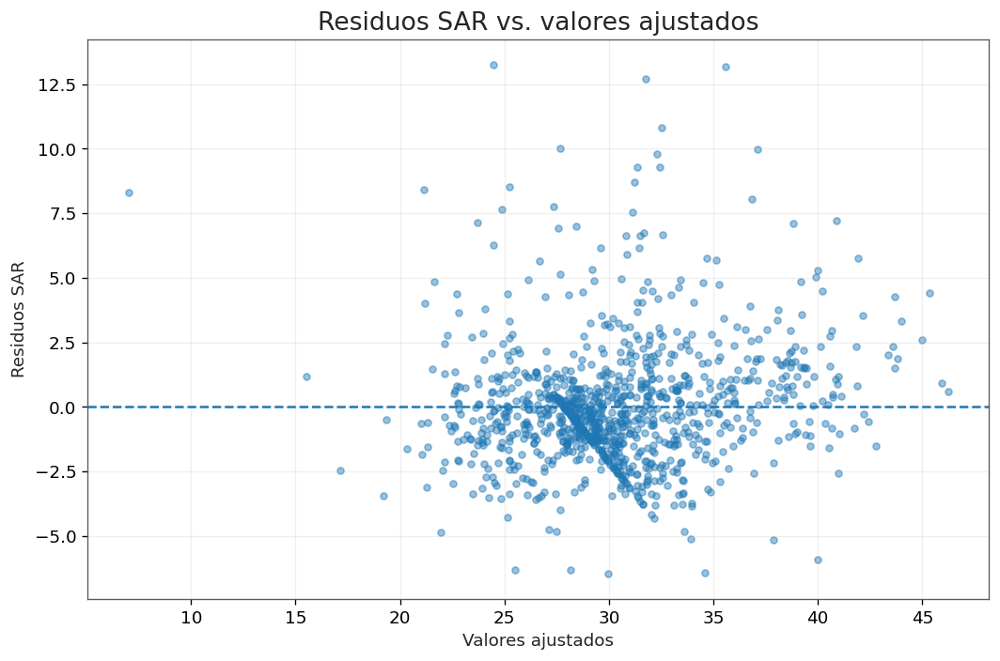


✓ Gráfico residuos vs. ajustados generado.


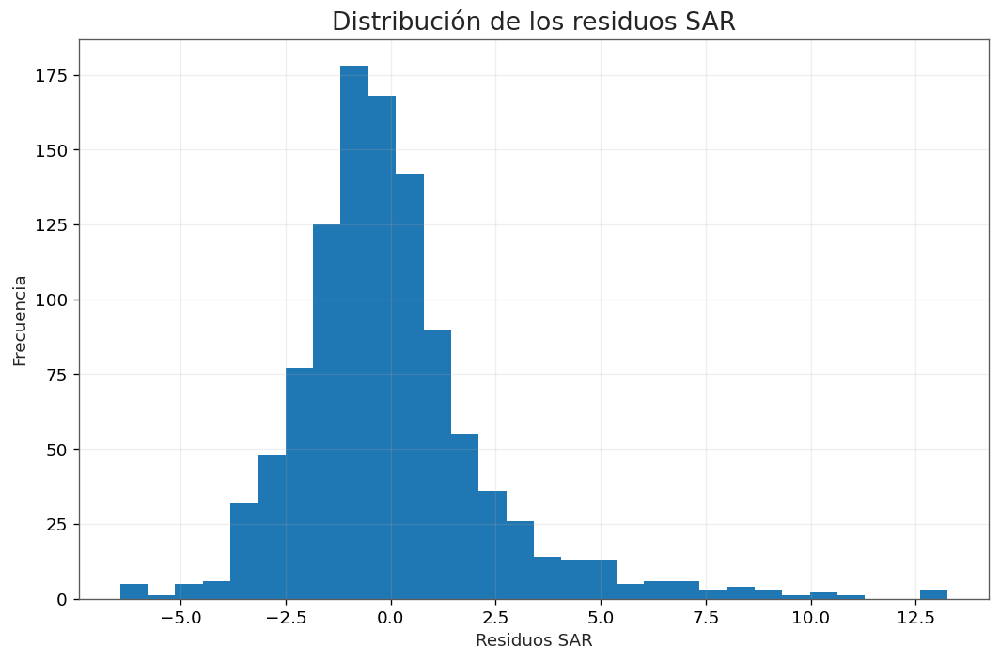

✓ Histograma de residuos generado.


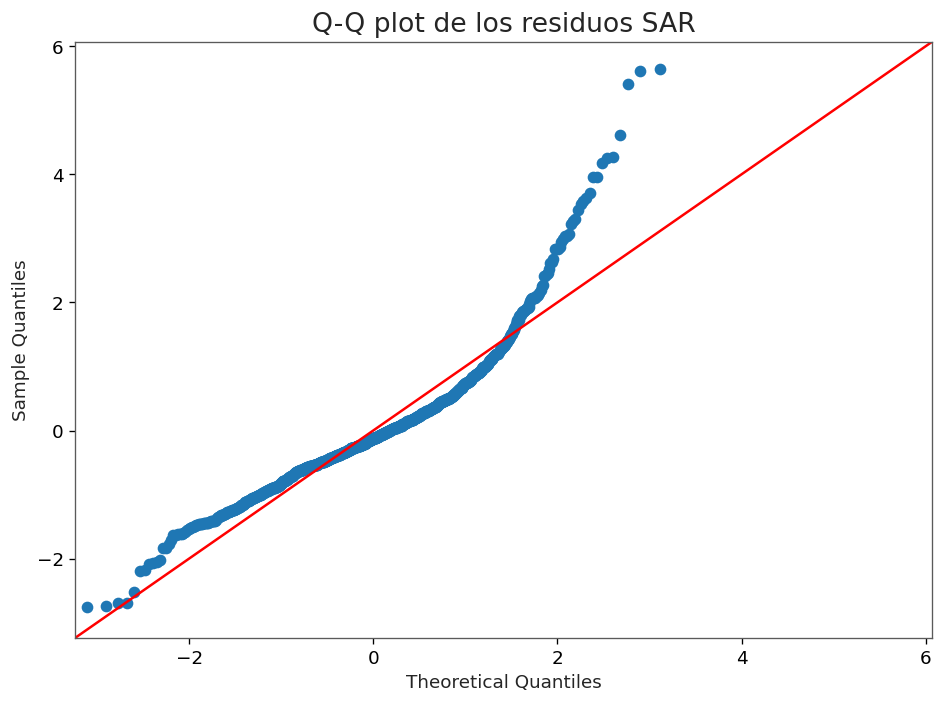

✓ Q-Q plot generado.

CONTRASTE DE HETEROCEDASTICIDAD


,CONTRASTE,ESTADISTICO,P_VALOR,SIGNIFICATIVO_05
0,Breusch-Pagan LM,65.051937,0.0,True
1,Breusch-Pagan F,6.855778,0.0,True



⚠ Breusch-Pagan: se rechaza H₀ de homocedasticidad.
→ Persiste evidencia de heterocedasticidad.

CONTRASTE DE NORMALIDAD


,CONTRASTE,ESTADISTICO,P_VALOR,SIGNIFICATIVO_05
0,Jarque-Bera,1429.017430,0.0,True
1,D'Agostino-Pearson,343.588522,0.0,True



⚠ Jarque-Bera: se rechaza H₀ de normalidad.
⚠ D'Agostino-Pearson: se rechaza H₀ de normalidad.

AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS

Moran's I : -0.008643
z-score   : -0.454197
p-valor   : 0.331000

✓ No se detecta autocorrelación espacial significativa en los residuos SAR.

RESUMEN DEL DIAGNÓSTICO FINAL SAR


,DIAGNOSTICO,VALOR
0,Media residuos,0.000000
1,Desviación estándar,2.347535
2,Atípicos |z| > 3,20.000000
3,Breusch-Pagan p,0.000000
4,Jarque-Bera p,0.000000
5,D'Agostino-Pearson p,0.000000
6,Moran's I,-0.008643
7,Moran z-score,-0.454197
8,Moran p,0.331000



RESUMEN FINAL — CELDA 54

Observaciones : 1,068
Media residuos : 0.000000
Desv. estándar : 2.347535
Atípicos |z|>3 : 20

Breusch-Pagan p : 3.96162e-10
Jarque-Bera p : 4.92956e-311
D'Agostino p : 2.45867e-75

Moran's I : -0.008643
Moran z-score : -0.454197
Moran p-valor : 0.331000

✓ Diagnóstico gráfico realizado.
✓ Diagnóstico de heterocedasticidad realizado.
✓ Diagnóstico de normalidad realizado.
✓ Diagnóstico espacial realizado.

✓ CELDA 54 COMPLETADA.
✓ LISTA PARA LA INTERPRETACIÓN FINAL Y CARTOGRAFÍA DEL MODELO SAR.


In [56]:
# ============================================================
# 54. VALIDACIÓN FINAL DEL MODELO SAR
# FASE 4 — MODELIZACIÓN DE REGRESIÓN ESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import (
    jarque_bera,
    normaltest
)

from statsmodels.stats.diagnostic import het_breuschpagan

from esda.moran import Moran

print("=" * 100)
print("54. VALIDACIÓN FINAL DEL MODELO SAR")
print("=" * 100)

# ============================================================
# 1. COMPROBACIONES
# ============================================================

if "modelo_sar" not in globals():
    raise NameError(
        "No existe 'modelo_sar'. Ejecuta primero la CELDA 52."
    )

if "w_spatial" not in globals():
    raise NameError(
        "No existe 'w_spatial'. Ejecuta primero la CELDA 52."
    )

if "X" not in globals():
    raise NameError(
        "No existe la matriz X."
    )

if "y" not in globals():
    raise NameError(
        "No existe la variable dependiente y."
    )

# ============================================================
# 2. RESIDUOS Y VALORES AJUSTADOS
# ============================================================

residuos_sar = (
    np.asarray(
        modelo_sar.u
    )
    .flatten()
)

# Valores ajustados:
# y - residuos
y_sar = (
    np.asarray(y)
    .flatten()
)

ajustados_sar = (
    y_sar -
    residuos_sar
)

if not np.isfinite(residuos_sar).all():
    raise ValueError(
        "Los residuos SAR contienen valores no finitos."
    )

if not np.isfinite(ajustados_sar).all():
    raise ValueError(
        "Los valores ajustados contienen valores no finitos."
    )

print(
    f"\nObservaciones : {len(residuos_sar):,}"
)

print(
    "✓ Residuos SAR disponibles."
)

# ============================================================
# 3. ESTADÍSTICOS DESCRIPTIVOS DE LOS RESIDUOS
# ============================================================

print("\n" + "=" * 100)
print("ESTADÍSTICOS DE LOS RESIDUOS SAR")
print("=" * 100)

estadisticos_residuos = pd.Series(
    residuos_sar,
    name="RESIDUOS_SAR"
).describe(
    percentiles=[
        0.01,
        0.05,
        0.25,
        0.50,
        0.75,
        0.95,
        0.99
    ]
)

display(
    estadisticos_residuos.round(6)
)

media_residuos = float(
    np.mean(residuos_sar)
)

std_residuos = float(
    np.std(
        residuos_sar,
        ddof=1
    )
)

min_residuos = float(
    np.min(residuos_sar)
)

max_residuos = float(
    np.max(residuos_sar)
)

print(
    f"\nMedia : {media_residuos:.6f}"
)

print(
    f"Desviación estándar : {std_residuos:.6f}"
)

print(
    f"Mínimo : {min_residuos:.6f}"
)

print(
    f"Máximo : {max_residuos:.6f}"
)

# ============================================================
# 4. RESIDUOS ESTANDARIZADOS Y ATÍPICOS
# ============================================================

z_residuos_sar = (
    residuos_sar /
    std_residuos
)

mask_atipicos = (
    np.abs(z_residuos_sar) > 3
)

n_atipicos = int(
    mask_atipicos.sum()
)

print("\n" + "=" * 100)
print("OBSERVACIONES POTENCIALMENTE ATÍPICAS")
print("=" * 100)

print(
    f"\n|z| > 3 : {n_atipicos} observaciones"
)

if n_atipicos > 0:

    tabla_atipicos = pd.DataFrame({

        "INDICE":
            np.where(mask_atipicos)[0],

        "RESIDUO":
            residuos_sar[mask_atipicos],

        "Z_RESIDUO":
            z_residuos_sar[mask_atipicos],

        "AJUSTADO":
            ajustados_sar[mask_atipicos]

    })

    tabla_atipicos = (
        tabla_atipicos
        .sort_values(
            "Z_RESIDUO",
            key=lambda x: np.abs(x),
            ascending=False
        )
    )

    display(
        tabla_atipicos.round(6)
    )

else:

    print(
        "✓ No se detectan observaciones con |z| > 3."
    )

# ============================================================
# 5. DIAGNÓSTICO GRÁFICO — RESIDUOS VS AJUSTADOS
# ============================================================

plt.figure(
    figsize=(9, 6)
)

plt.scatter(
    ajustados_sar,
    residuos_sar,
    alpha=0.45,
    s=18
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Valores ajustados"
)

plt.ylabel(
    "Residuos SAR"
)

plt.title(
    "Residuos SAR vs. valores ajustados"
)

plt.grid(
    alpha=0.20
)

plt.tight_layout()

plt.show()

print(
    "\n✓ Gráfico residuos vs. ajustados generado."
)

# ============================================================
# 6. HISTOGRAMA DE RESIDUOS
# ============================================================

plt.figure(
    figsize=(9, 6)
)

plt.hist(
    residuos_sar,
    bins=30
)

plt.xlabel(
    "Residuos SAR"
)

plt.ylabel(
    "Frecuencia"
)

plt.title(
    "Distribución de los residuos SAR"
)

plt.grid(
    alpha=0.20
)

plt.tight_layout()

plt.show()

print(
    "✓ Histograma de residuos generado."
)

# ============================================================
# 7. Q-Q PLOT
# ============================================================

import statsmodels.api as sm

fig = sm.qqplot(
    residuos_sar,
    line="45",
    fit=True
)

fig.set_size_inches(
    8,
    6
)

plt.title(
    "Q-Q plot de los residuos SAR"
)

plt.tight_layout()

plt.show()

print(
    "✓ Q-Q plot generado."
)

# ============================================================
# 8. HETEROCEDASTICIDAD — BREUSCH-PAGAN
# ============================================================

print("\n" + "=" * 100)
print("CONTRASTE DE HETEROCEDASTICIDAD")
print("=" * 100)

# Se utiliza la matriz X del modelo.
# Se añade constante únicamente para el contraste.
X_bp = np.column_stack(
    [
        np.ones(
            X.shape[0]
        ),
        X
    ]
)

bp_resultado = het_breuschpagan(
    residuos_sar,
    X_bp
)

bp_lm = float(
    bp_resultado[0]
)

bp_lm_p = float(
    bp_resultado[1]
)

bp_f = float(
    bp_resultado[2]
)

bp_f_p = float(
    bp_resultado[3]
)

diagnostico_bp = pd.DataFrame({

    "CONTRASTE": [
        "Breusch-Pagan LM",
        "Breusch-Pagan F"
    ],

    "ESTADISTICO": [
        bp_lm,
        bp_f
    ],

    "P_VALOR": [
        bp_lm_p,
        bp_f_p
    ],

    "SIGNIFICATIVO_05": [
        bp_lm_p < 0.05,
        bp_f_p < 0.05
    ]

})

display(
    diagnostico_bp.round(6)
)

if bp_lm_p < 0.05:

    print(
        "\n⚠ Breusch-Pagan: se rechaza H₀ "
        "de homocedasticidad."
    )

    print(
        "→ Persiste evidencia de heterocedasticidad."
    )

else:

    print(
        "\n✓ Breusch-Pagan: no se rechaza H₀ "
        "de homocedasticidad."
    )

    print(
        "→ No se detecta heterocedasticidad significativa."
    )

# ============================================================
# 9. NORMALIDAD — JARQUE-BERA
# ============================================================

print("\n" + "=" * 100)
print("CONTRASTE DE NORMALIDAD")
print("=" * 100)

jb_resultado = jarque_bera(
    residuos_sar
)

jb_stat = float(
    jb_resultado.statistic
)

jb_p = float(
    jb_resultado.pvalue
)

# D'Agostino-Pearson
dagostino_stat, dagostino_p = (
    normaltest(
        residuos_sar
    )
)

dagostino_stat = float(
    dagostino_stat
)

dagostino_p = float(
    dagostino_p
)

diagnostico_normalidad = pd.DataFrame({

    "CONTRASTE": [
        "Jarque-Bera",
        "D'Agostino-Pearson"
    ],

    "ESTADISTICO": [
        jb_stat,
        dagostino_stat
    ],

    "P_VALOR": [
        jb_p,
        dagostino_p
    ],

    "SIGNIFICATIVO_05": [
        jb_p < 0.05,
        dagostino_p < 0.05
    ]

})

display(
    diagnostico_normalidad.round(6)
)

if jb_p < 0.05:

    print(
        "\n⚠ Jarque-Bera: se rechaza H₀ "
        "de normalidad."
    )

else:

    print(
        "\n✓ Jarque-Bera: no se rechaza H₀ "
        "de normalidad."
    )

if dagostino_p < 0.05:

    print(
        "⚠ D'Agostino-Pearson: se rechaza H₀ "
        "de normalidad."
    )

else:

    print(
        "✓ D'Agostino-Pearson: no se rechaza H₀ "
        "de normalidad."
    )

# ============================================================
# 10. MORAN DE LOS RESIDUOS SAR
# ============================================================

print("\n" + "=" * 100)
print("AUTOCORRELACIÓN ESPACIAL DE LOS RESIDUOS")
print("=" * 100)

moran_sar_final = Moran(
    residuos_sar,
    w_spatial,
    permutations=999
)

moran_I_sar = float(
    moran_sar_final.I
)

moran_z_sar = float(
    moran_sar_final.z_sim
)

moran_p_sar = float(
    moran_sar_final.p_sim
)

print(
    f"\nMoran's I : "
    f"{moran_I_sar:.6f}"
)

print(
    f"z-score   : "
    f"{moran_z_sar:.6f}"
)

print(
    f"p-valor   : "
    f"{moran_p_sar:.6f}"
)

if moran_p_sar < 0.05:

    print(
        "\n⚠ Persiste autocorrelación espacial "
        "significativa en los residuos SAR."
    )

else:

    print(
        "\n✓ No se detecta autocorrelación espacial "
        "significativa en los residuos SAR."
    )

# ============================================================
# 11. TABLA FINAL DE DIAGNÓSTICO
# ============================================================

diagnostico_sar_final = pd.DataFrame({

    "DIAGNOSTICO": [

        "Media residuos",

        "Desviación estándar",

        "Atípicos |z| > 3",

        "Breusch-Pagan p",

        "Jarque-Bera p",

        "D'Agostino-Pearson p",

        "Moran's I",

        "Moran z-score",

        "Moran p"

    ],

    "VALOR": [

        media_residuos,

        std_residuos,

        n_atipicos,

        bp_lm_p,

        jb_p,

        dagostino_p,

        moran_I_sar,

        moran_z_sar,

        moran_p_sar

    ]

})

print("\n" + "=" * 100)
print("RESUMEN DEL DIAGNÓSTICO FINAL SAR")
print("=" * 100)

display(
    diagnostico_sar_final.round(6)
)

# ============================================================
# 12. GUARDAR RESULTADOS
# ============================================================

resultados_validacion_sar = {

    "estadisticos_residuos":
        estadisticos_residuos,

    "atipicos":
        tabla_atipicos
        if n_atipicos > 0
        else pd.DataFrame(),

    "breusch_pagan":
        diagnostico_bp,

    "normalidad":
        diagnostico_normalidad,

    "moran":
        pd.DataFrame({

            "MORAN_I": [
                moran_I_sar
            ],

            "Z_SCORE": [
                moran_z_sar
            ],

            "P_VALOR": [
                moran_p_sar
            ]

        }),

    "residuos":
        residuos_sar,

    "ajustados":
        ajustados_sar
}

# ============================================================
# 13. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 54")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(residuos_sar):,}"
)

print(
    f"Media residuos : "
    f"{media_residuos:.6f}"
)

print(
    f"Desv. estándar : "
    f"{std_residuos:.6f}"
)

print(
    f"Atípicos |z|>3 : "
    f"{n_atipicos}"
)

print(
    f"\nBreusch-Pagan p : "
    f"{bp_lm_p:.6g}"
)

print(
    f"Jarque-Bera p : "
    f"{jb_p:.6g}"
)

print(
    f"D'Agostino p : "
    f"{dagostino_p:.6g}"
)

print(
    f"\nMoran's I : "
    f"{moran_I_sar:.6f}"
)

print(
    f"Moran z-score : "
    f"{moran_z_sar:.6f}"
)

print(
    f"Moran p-valor : "
    f"{moran_p_sar:.6f}"
)

print(
    "\n✓ Diagnóstico gráfico realizado."
)

print(
    "✓ Diagnóstico de heterocedasticidad realizado."
)

print(
    "✓ Diagnóstico de normalidad realizado."
)

print(
    "✓ Diagnóstico espacial realizado."
)

print(
    "\n✓ CELDA 54 COMPLETADA."
)

print(
    "✓ LISTA PARA LA INTERPRETACIÓN FINAL Y "
    "CARTOGRAFÍA DEL MODELO SAR."
)

### Resultados

La validación final del modelo SAR se realizó sobre las **1.068 secciones censales**, evaluando la distribución de los residuos, la presencia de observaciones potencialmente atípicas, la heterocedasticidad, la normalidad y, especialmente, la autocorrelación espacial residual.

## Estadísticos de los residuos

Los residuos presentan una media prácticamente nula:

- Media: **0,0000**
- Desviación estándar: **2,3475**
- Mínimo: **−6,4490**
- Máximo: **13,2615**
- Mediana: **−0,2899**

La distribución presenta una cola positiva, con valores residuales elevados en un número reducido de observaciones.

Se identificaron **20 observaciones con |z| > 3**, que serán consideradas observaciones potencialmente atípicas y podrán ser revisadas espacialmente en el análisis posterior.

## Diagnóstico gráfico

El gráfico de residuos frente a valores ajustados muestra una dispersión de los errores alrededor de cero, aunque con una mayor amplitud de los residuos positivos en determinados rangos de los valores ajustados.

El histograma y el Q-Q plot muestran una distribución alejada de la normalidad perfecta, especialmente en la cola superior de la distribución.

Estos resultados son coherentes con los contrastes estadísticos posteriores.

## Heterocedasticidad

El contraste de Breusch-Pagan proporciona:

- LM = **65,0519**
- F = **6,8558**
- p < **0,001**

Por tanto, se rechaza la hipótesis nula de homocedasticidad y se detecta **heterocedasticidad residual**.

Este resultado indica que la variabilidad de los errores no es constante en todo el rango de valores ajustados.

La presencia de heterocedasticidad se documenta como una limitación del modelo y deberá tenerse en cuenta al interpretar la inferencia sobre los coeficientes.

## Normalidad de los residuos

Los contrastes de normalidad proporcionan:

| Contraste | Estadístico | p-valor |
|---|---:|---:|
| Jarque-Bera | 1429,0174 | < 0,001 |
| D'Agostino-Pearson | 343,5885 | < 0,001 |

Ambos contrastes rechazan la hipótesis nula de normalidad.

La ausencia de normalidad resulta consistente con la asimetría observada en el histograma y en el Q-Q plot, especialmente en la cola superior.

Dado el tamaño muestral de **1.068 observaciones**, este resultado se interpreta como una característica de la distribución de los residuos y no como evidencia suficiente, por sí sola, para descartar el modelo espacial.

## Autocorrelación espacial residual

El diagnóstico espacial constituye el resultado principal de esta validación:

- Moran's I = **−0,0086**
- z-score = **−0,4920**
- p = **0,3160**

No se rechaza la hipótesis nula de ausencia de autocorrelación espacial.

Por tanto, **no se detecta autocorrelación espacial significativa en los residuos del modelo SAR**.

Este resultado contrasta claramente con el modelo OLS, cuyos residuos presentaban:

**Moran's I = 0,6411 · p = 0,001**

y confirma que la incorporación de la estructura espacial mediante el modelo SAR ha corregido la dependencia espacial residual detectada inicialmente.

## Evaluación global del modelo

La validación permite distinguir entre diferentes tipos de problemas residuales:

| Diagnóstico | Resultado | Evaluación |
|---|---|---|
| Media de residuos | 0,0000 | ✓ Adecuada |
| Autocorrelación espacial | p = 0,316 | ✓ No significativa |
| Heterocedasticidad | p < 0,001 | ⚠ Presente |
| Normalidad | p < 0,001 | ⚠ No cumplida |
| Valores potencialmente atípicos | 20 | ⚠ Revisar |

El resultado más relevante para la modelización espacial es que **la autocorrelación espacial residual desaparece**.

Por tanto, el modelo SAR resulta adecuado para representar la estructura espacial de la concentración de NO₂, aunque mantiene heterocedasticidad y desviaciones respecto a la normalidad de los residuos.

Estas características no se ocultarán en la interpretación final, sino que se incorporarán como parte del diagnóstico y de las limitaciones del modelo.

> **Conclusión:** el modelo SAR supera el principal problema identificado en el OLS —la dependencia espacial de los residuos—, pero presenta heterocedasticidad y no normalidad residual. El modelo se mantiene como especificación espacial final y sus resultados deberán interpretarse considerando estas limitaciones.

✓ VALIDACIÓN FINAL DEL SAR COMPLETADA.  
✓ AUTOCORRELACIÓN ESPACIAL RESIDUAL NO SIGNIFICATIVA.  
✓ HETEROCEDASTICIDAD DOCUMENTADA.  
✓ NO NORMALIDAD DOCUMENTADA.  
✓ OBSERVACIONES POTENCIALMENTE ATÍPICAS IDENTIFICADAS.  
→ SIGUIENTE: INTERPRETACIÓN DE COEFICIENTES, EFECTOS ESPACIALES Y CARTOGRAFÍA DEL MODELO SAR.

## 55 . XGBoost — preparación y modelo base


## FASE 4 — MODELIZACIÓN NO LINEAL / MACHINE LEARNING

La presente etapa introduce un modelo **XGBoost** como alternativa no lineal al modelo espacial SAR, manteniendo la misma variable dependiente y el conjunto final de predictores seleccionado durante la fase de modelización.

### Variable dependiente

`NO2_MEDIO_PONDERADO`

### Predictores

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

### Naturaleza de las variables

Los predictores combinan variables asociadas a movilidad y actividad, consideradas dinámicas o dependientes de condiciones de movilidad, con variables territoriales estáticas o estructurales.

**Variables dinámicas / relacionadas con movilidad:**

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`

**Variables territoriales estáticas o estructurales:**

- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

Esta distinción se mantendrá durante la interpretación para diferenciar los factores asociados a movilidad de las características estructurales del territorio.

### Base de modelización

La base contiene:

- **1.068 observaciones**
- **10 predictores**
- Sin valores nulos.
- Sin valores infinitos.

La variable objetivo y los predictores se utilizarán sin necesidad de estandarización, dado que XGBoost se basa en árboles de decisión.

### División de los datos

Se establece una división reproducible:

- **80 % entrenamiento**
- **20 % prueba**
- `random_state = 42`

El conjunto de prueba se reserva para evaluar la capacidad de generalización del modelo sobre observaciones no utilizadas durante el entrenamiento.

### Modelo XGBoost

Se estima un modelo XGBoost de regresión con:

- `n_estimators = 500`
- `learning_rate = 0,05`
- `max_depth = 4`
- `min_child_weight = 3`
- `subsample = 0,80`
- `colsample_bytree = 0,80`
- `reg_lambda = 1`
- `random_state = 42`

Esta configuración se considera un **modelo baseline**, por lo que todavía no se realiza una optimización exhaustiva de hiperparámetros.

### Métricas de evaluación

El modelo se evaluará mediante:

- **R²**
- **RMSE**
- **MAE**

Las métricas se calcularán tanto sobre entrenamiento como sobre prueba para detectar posibles indicios de sobreajuste.

### Objetivo de esta etapa

El objetivo no es sustituir automáticamente el modelo SAR, sino determinar si un algoritmo de aprendizaje automático capaz de representar relaciones **no lineales e interacciones entre predictores** consigue mejorar la capacidad predictiva.

La comparación posterior permitirá valorar tres perspectivas complementarias:

1. **OLS:** relación lineal sin estructura espacial explícita.
2. **SAR:** relación lineal incorporando dependencia espacial.
3. **XGBoost:** relación no lineal mediante aprendizaje automático.

Esta comparación permitirá distinguir entre la mejora atribuible a la **estructura espacial** y la mejora atribuible a la **no linealidad de las relaciones**.

✓ BASE XGBOOST PREPARADA.  
✓ TRAIN/TEST DEFINIDO.  
✓ MODELO BASE ESTIMADO.  
✓ MÉTRICAS Y FEATURE IMPORTANCE PREPARADAS.  
→ SIGUIENTE: VALIDACIÓN DEL XGBOOST Y DIAGNÓSTICO DE SOBREAJUSTE.

In [57]:
# ============================================================
# 55. XGBOOST — PREPARACIÓN Y MODELO BASE
# FASE 4 — MODELIZACIÓN NO LINEAL / MACHINE LEARNING
# ============================================================

import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

from xgboost import XGBRegressor

print("=" * 100)
print("55. XGBOOST — PREPARACIÓN Y MODELO BASE")
print("=" * 100)

# ============================================================
# 1. VARIABLES DEL MODELO
# ============================================================

variable_objetivo = "NO2_MEDIO_PONDERADO"

predictores_xgb = [
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

print("\nVARIABLE OBJETIVO")
print("-" * 100)

print(f"✓ {variable_objetivo}")

print("\nPREDICTORES")
print("-" * 100)

for variable in predictores_xgb:
    print(f"✓ {variable}")

# ============================================================
# 2. NATURALEZA DE LAS VARIABLES
# ============================================================

print("\n" + "=" * 100)
print("NATURALEZA DE LOS PREDICTORES")
print("=" * 100)

variables_dinamicas = [
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M"
]

variables_estaticas = [
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

print("\nVariables dinámicas / relacionadas con movilidad:")
for variable in variables_dinamicas:
    print(f"  • {variable}")

print("\nVariables territoriales estáticas o estructurales:")
for variable in variables_estaticas:
    print(f"  • {variable}")

print(
    "\nNota: la clasificación distingue entre variables "
    "asociadas a movilidad/actividad y variables territoriales "
    "estructurales. No implica que todas las variables dinámicas "
    "tengan necesariamente una serie temporal completa en esta "
    "base de modelización."
)

# ============================================================
# 3. CONSTRUCCIÓN DE LA BASE XGBOOST
# ============================================================

if "base_modelo" not in globals():
    raise NameError(
        "No existe 'base_modelo'. "
        "Ejecuta las celdas anteriores de preparación."
    )

columnas_necesarias = [
    variable_objetivo
] + predictores_xgb

faltantes = [
    columna
    for columna in columnas_necesarias
    if columna not in base_modelo.columns
]

if faltantes:

    raise KeyError(
        "Faltan las siguientes columnas en base_modelo: "
        + ", ".join(faltantes)
    )

base_xgb = (
    base_modelo[
        columnas_necesarias
    ]
    .copy()
)

print("\n" + "=" * 100)
print("BASE DE MODELIZACIÓN")
print("=" * 100)

print(
    f"\nObservaciones iniciales : "
    f"{len(base_xgb):,}"
)

# ============================================================
# 4. LIMPIEZA
# ============================================================

nulos_antes = int(
    base_xgb.isna().sum().sum()
)

infinitos_antes = int(
    np.isinf(
        base_xgb.select_dtypes(
            include=[np.number]
        )
    ).sum().sum()
)

print(
    f"Valores nulos antes : "
    f"{nulos_antes}"
)

print(
    f"Valores infinitos antes : "
    f"{infinitos_antes}"
)

base_xgb = (
    base_xgb
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
    .dropna()
    .reset_index(drop=True)
)

print(
    f"\nObservaciones utilizadas : "
    f"{len(base_xgb):,}"
)

print(
    f"Observaciones excluidas : "
    f"{1068 - len(base_xgb):,}"
    if len(base_xgb) <= 1068
    else
    f"Observaciones excluidas : 0"
)

print(
    "\n✓ Sin valores nulos ni infinitos en la base final."
)

# ============================================================
# 5. MATRICES X E Y
# ============================================================

X_xgb = (
    base_xgb[
        predictores_xgb
    ]
    .copy()
)

y_xgb = (
    base_xgb[
        variable_objetivo
    ]
    .copy()
)

print("\n" + "=" * 100)
print("MATRICES DE MODELIZACIÓN")
print("=" * 100)

print(
    f"\nX : {X_xgb.shape}"
)

print(
    f"y : {y_xgb.shape}"
)

# ============================================================
# 6. COMPROBACIÓN DE TIPOS
# ============================================================

if not all(
    pd.api.types.is_numeric_dtype(
        X_xgb[col]
    )
    for col in X_xgb.columns
):

    raise TypeError(
        "Existen predictores no numéricos."
    )

if not pd.api.types.is_numeric_dtype(
    y_xgb
):

    raise TypeError(
        "La variable dependiente no es numérica."
    )

print(
    "\n✓ Todos los predictores son numéricos."
)

# ============================================================
# 7. TRAIN / TEST
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X_xgb,
    y_xgb,
    test_size=0.20,
    random_state=42
)

print("\n" + "=" * 100)
print("DIVISIÓN TRAIN / TEST")
print("=" * 100)

print(
    f"\nTrain : "
    f"{len(X_train):,} "
    f"({len(X_train) / len(X_xgb) * 100:.1f} %)"
)

print(
    f"Test  : "
    f"{len(X_test):,} "
    f"({len(X_test) / len(X_xgb) * 100:.1f} %)"
)

print(
    "\n✓ División reproducible con random_state = 42."
)

# ============================================================
# 8. MODELO XGBOOST BASE
# ============================================================

print("\n" + "=" * 100)
print("ESTIMACIÓN XGBOOST")
print("=" * 100)

modelo_xgb = XGBRegressor(

    objective="reg:squarederror",

    n_estimators=500,

    learning_rate=0.05,

    max_depth=4,

    min_child_weight=3,

    subsample=0.80,

    colsample_bytree=0.80,

    reg_alpha=0.0,

    reg_lambda=1.0,

    random_state=42,

    n_jobs=-1
)

modelo_xgb.fit(
    X_train,
    y_train
)

print(
    "\n✓ Modelo XGBoost entrenado."
)

# ============================================================
# 9. PREDICCIONES
# ============================================================

y_pred_train = (
    modelo_xgb.predict(
        X_train
    )
)

y_pred_test = (
    modelo_xgb.predict(
        X_test
    )
)

print(
    "✓ Predicciones train/test generadas."
)

# ============================================================
# 10. MÉTRICAS
# ============================================================

rmse_train = np.sqrt(
    mean_squared_error(
        y_train,
        y_pred_train
    )
)

rmse_test = np.sqrt(
    mean_squared_error(
        y_test,
        y_pred_test
    )
)

mae_train = mean_absolute_error(
    y_train,
    y_pred_train
)

mae_test = mean_absolute_error(
    y_test,
    y_pred_test
)

r2_train = r2_score(
    y_train,
    y_pred_train
)

r2_test = r2_score(
    y_test,
    y_pred_test
)

resultados_xgb_base = pd.DataFrame({

    "CONJUNTO": [
        "TRAIN",
        "TEST"
    ],

    "R2": [
        r2_train,
        r2_test
    ],

    "RMSE": [
        rmse_train,
        rmse_test
    ],

    "MAE": [
        mae_train,
        mae_test
    ]

})

print("\n" + "=" * 100)
print("RESULTADOS XGBOOST BASE")
print("=" * 100)

display(
    resultados_xgb_base.round(4)
)

# ============================================================
# 11. IMPORTANCIA DE VARIABLES
# ============================================================

importancias_xgb = pd.DataFrame({

    "VARIABLE":
        predictores_xgb,

    "IMPORTANCIA":
        modelo_xgb.feature_importances_

})

importancias_xgb = (
    importancias_xgb
    .sort_values(
        "IMPORTANCIA",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

print("\n" + "=" * 100)
print("IMPORTANCIA DE VARIABLES — XGBOOST")
print("=" * 100)

display(
    importancias_xgb.round(6)
)

# ============================================================
# 12. COMPARACIÓN INICIAL CON LOS MODELOS ESPACIALES
# ============================================================

print("\n" + "=" * 100)
print("REFERENCIA DE LOS MODELOS PREVIOS")
print("=" * 100)

print(
    "\nSAR:"
)

print(
    "  Rho = 0.850629"
)

print(
    "  AIC = 5063.9252"
)

print(
    "  Moran residuos = -0.0086"
)

print(
    "  p Moran = 0.316"
)

print(
    "\nXGBoost:"
)

print(
    f"  R² train = {r2_train:.4f}"
)

print(
    f"  R² test  = {r2_test:.4f}"
)

print(
    f"  RMSE test = {rmse_test:.4f}"
)

print(
    f"  MAE test  = {mae_test:.4f}"
)

# ============================================================
# 13. DIAGNÓSTICO INICIAL DE OVERFITTING
# ============================================================

diferencia_r2 = (
    r2_train -
    r2_test
)

print("\n" + "=" * 100)
print("DIAGNÓSTICO INICIAL")
print("=" * 100)

print(
    f"\nDiferencia R² train-test : "
    f"{diferencia_r2:.4f}"
)

if diferencia_r2 > 0.15:

    print(
        "⚠ Existe indicio de sobreajuste."
    )

elif diferencia_r2 > 0.08:

    print(
        "⚠ Existe cierto sobreajuste."
    )

else:

    print(
        "✓ No se observa un sobreajuste elevado "
        "según esta primera comparación."
    )

# ============================================================
# 14. GUARDAR RESULTADOS
# ============================================================

resultados_xgb = {

    "modelo":
        modelo_xgb,

    "resultados":
        resultados_xgb_base,

    "importancias":
        importancias_xgb,

    "X_train":
        X_train,

    "X_test":
        X_test,

    "y_train":
        y_train,

    "y_test":
        y_test,

    "y_pred_train":
        y_pred_train,

    "y_pred_test":
        y_pred_test

}

# ============================================================
# 15. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 55")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(base_xgb):,}"
)

print(
    f"Predictores : "
    f"{len(predictores_xgb)}"
)

print(
    f"Train : "
    f"{len(X_train):,}"
)

print(
    f"Test : "
    f"{len(X_test):,}"
)

print(
    f"\nR² train : "
    f"{r2_train:.4f}"
)

print(
    f"R² test : "
    f"{r2_test:.4f}"
)

print(
    f"RMSE test : "
    f"{rmse_test:.4f}"
)

print(
    f"MAE test : "
    f"{mae_test:.4f}"
)

print(
    "\n✓ Base XGBoost preparada."
)

print(
    "✓ Train/test realizado."
)

print(
    "✓ XGBoost base estimado."
)

print(
    "✓ Métricas calculadas."
)

print(
    "✓ Importancia inicial de variables calculada."
)

print(
    "\n✓ CELDA 55 COMPLETADA."
)

print(
    "✓ LISTA PARA LA VALIDACIÓN Y AJUSTE DE XGBOOST."
)

55. XGBOOST — PREPARACIÓN Y MODELO BASE

VARIABLE OBJETIVO
----------------------------------------------------------------------------------------------------
✓ NO2_MEDIO_PONDERADO

PREDICTORES
----------------------------------------------------------------------------------------------------
✓ IMD_AFORO_CERCANO
✓ DISTANCIA_AFORO_M
✓ RENTA_EUR_PERSONA
✓ DENSIDAD_HAB_HA
✓ ELEVACION_MEDIA_M
✓ PCT_VERDE
✓ PCT_EQUIPAMIENTOS
✓ PCT_INDUSTRIAL
✓ PCT_PORTUARIO
✓ PCT_TRANSPORTE

NATURALEZA DE LOS PREDICTORES

Variables dinámicas / relacionadas con movilidad:
  • IMD_AFORO_CERCANO
  • DISTANCIA_AFORO_M

Variables territoriales estáticas o estructurales:
  • RENTA_EUR_PERSONA
  • DENSIDAD_HAB_HA
  • ELEVACION_MEDIA_M
  • PCT_VERDE
  • PCT_EQUIPAMIENTOS
  • PCT_INDUSTRIAL
  • PCT_PORTUARIO
  • PCT_TRANSPORTE

Nota: la clasificación distingue entre variables asociadas a movilidad/actividad y variables territoriales estructurales. No implica que todas las variables dinámicas tengan necesariamente 

,CONJUNTO,R2,RMSE,MAE
0,TRAIN,0.9709,0.9429,0.6984
1,TEST,0.7147,2.5820,1.9570



IMPORTANCIA DE VARIABLES — XGBOOST


,VARIABLE,IMPORTANCIA
0,ELEVACION_MEDIA_M,0.214788
1,DENSIDAD_HAB_HA,0.151799
2,DISTANCIA_AFORO_M,0.137369
3,RENTA_EUR_PERSONA,0.120463
4,PCT_PORTUARIO,0.119894
5,IMD_AFORO_CERCANO,0.071108
6,PCT_VERDE,0.053005
7,PCT_TRANSPORTE,0.050343
8,PCT_INDUSTRIAL,0.049981
9,PCT_EQUIPAMIENTOS,0.031250



REFERENCIA DE LOS MODELOS PREVIOS

SAR:
  Rho = 0.850629
  AIC = 5063.9252
  Moran residuos = -0.0086
  p Moran = 0.316

XGBoost:
  R² train = 0.9709
  R² test  = 0.7147
  RMSE test = 2.5820
  MAE test  = 1.9570

DIAGNÓSTICO INICIAL

Diferencia R² train-test : 0.2563
⚠ Existe indicio de sobreajuste.

RESUMEN FINAL — CELDA 55

Observaciones : 1,068
Predictores : 10
Train : 854
Test : 214

R² train : 0.9709
R² test : 0.7147
RMSE test : 2.5820
MAE test : 1.9570

✓ Base XGBoost preparada.
✓ Train/test realizado.
✓ XGBoost base estimado.
✓ Métricas calculadas.
✓ Importancia inicial de variables calculada.

✓ CELDA 55 COMPLETADA.
✓ LISTA PARA LA VALIDACIÓN Y AJUSTE DE XGBOOST.


### Resultados

Se ha estimado un modelo XGBoost de regresión utilizando los mismos 10 predictores empleados en la modelización OLS y SAR.

La base contiene **1.068 observaciones**, sin valores nulos ni infinitos. Se realizó una división reproducible del 80 % para entrenamiento y 20 % para prueba, obteniéndose **854 observaciones de entrenamiento y 214 de prueba**.

## Rendimiento del modelo

| Conjunto | R² | RMSE | MAE |
|---|---:|---:|---:|
| TRAIN | 0,9709 | 0,9429 | 0,6984 |
| TEST | **0,7147** | **2,5820** | **1,9570** |

El modelo obtiene un **R² = 0,7147 en el conjunto de prueba**, indicando una capacidad predictiva considerable sobre observaciones no utilizadas durante el entrenamiento.

Sin embargo, el R² de entrenamiento alcanza 0,9709, frente a 0,7147 en test, lo que supone una diferencia de **0,2563**.

Por tanto, se identifica **sobreajuste**, aunque el modelo mantiene una capacidad predictiva relevante fuera de muestra.
## Importancia de las variables

La importancia obtenida mediante XGBoost muestra como principales predictores:

| Variable | Importancia |
|---|---:|
| ELEVACION_MEDIA_M | 0,2148 |
| DENSIDAD_HAB_HA | 0,1518 |
| DISTANCIA_AFORO_M | 0,1374 |
| RENTA_EUR_PERSONA | 0,1205 |
| PCT_PORTUARIO | 0,1199 |
| IMD_AFORO_CERCANO | 0,0711 |
| PCT_VERDE | 0,0530 |
| PCT_TRANSPORTE | 0,0503 |
| PCT_INDUSTRIAL | 0,0500 |
| PCT_EQUIPAMIENTOS | 0,0313 |

La **elevación media** presenta la mayor importancia relativa (0,2148), seguida de la **densidad de población** (0,1518) y la **distancia al aforo** (0,1374). También destacan la renta y el porcentaje de superficie portuaria.

Estas importancias deben interpretarse como una medida de contribución predictiva dentro del modelo XGBoost y **no como efectos causales ni como coeficientes con signo**.

## Comparación inicial con SAR

El modelo SAR presentó:

- ρ = 0,8506
- AIC = 5063,9252
- Moran de los residuos = −0,0086
- p = 0,316

Por su parte, XGBoost obtiene:

- R² test = **0,7147**
- RMSE test = **2,5820**
- MAE test = **1,9570**

La comparación muestra que XGBoost proporciona una capacidad predictiva elevada, pero introduce un problema de sobreajuste que deberá abordarse antes de considerarlo el modelo predictivo definitivo.



## 56 . Ajuste y validación de XGBoost


## FASE 4 — MODELIZACIÓN NO LINEAL / MACHINE LEARNING

El modelo XGBoost base obtenido en la CELDA 55 presenta una capacidad predictiva relevante sobre el conjunto de prueba:

**R² test = 0,7147**

Sin embargo, el modelo alcanza un R² de 0,9709 en entrenamiento, generando una diferencia train-test de **0,2563**, indicativa de sobreajuste.

Por este motivo, antes de seleccionar XGBoost como modelo predictivo definitivo se realiza un ajuste controlado de sus hiperparámetros.

### Objetivo

Reducir el sobreajuste manteniendo una capacidad predictiva elevada sobre datos no utilizados durante el entrenamiento.

Se prestará especial atención a:

- `max_depth`
- `learning_rate`
- `min_child_weight`
- `subsample`
- `colsample_bytree`
- `reg_alpha`
- `reg_lambda`
- `n_estimators`

### Estrategia

La selección se realizará mediante validación cruzada sobre el conjunto de entrenamiento.

El conjunto TEST permanecerá reservado para la evaluación final y no participará en la selección de hiperparámetros.

De esta forma se evita utilizar indirectamente el conjunto de prueba para optimizar el modelo.

### Criterio de selección

El modelo se seleccionará principalmente mediante:

- RMSE medio de validación cruzada.
- MAE medio de validación cruzada.
- R² medio de validación cruzada.
- Diferencia entre rendimiento de entrenamiento y validación.

Se priorizará un modelo con buena capacidad de generalización frente a un modelo excesivamente complejo con un rendimiento de entrenamiento artificialmente elevado.

### Consideración metodológica

El objetivo de esta etapa no es maximizar únicamente el R² de entrenamiento, sino encontrar un equilibrio entre:

**capacidad predictiva + generalización + complejidad del modelo.**

Una vez seleccionado el conjunto de hiperparámetros, el modelo final XGBoost se entrenará sobre todo el conjunto de entrenamiento y se evaluará una única vez sobre el conjunto TEST reservado.

✓ SOBREAJUSTE DEL BASELINE IDENTIFICADO.  
✓ TEST RESERVADO.  
✓ VALIDACIÓN CRUZADA PREPARADA.  
→ SIGUIENTE: OPTIMIZACIÓN CONTROLADA DE XGBOOST.

In [58]:
# ============================================================
# 56. AJUSTE Y VALIDACIÓN DE XGBOOST
# FASE 4 — MODELIZACIÓN NO LINEAL / MACHINE LEARNING
# ============================================================

import numpy as np
import pandas as pd

from sklearn.model_selection import KFold, ParameterGrid
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

from xgboost import XGBRegressor

print("=" * 100)
print("56. AJUSTE Y VALIDACIÓN DE XGBOOST")
print("=" * 100)

# ============================================================
# 1. COMPROBACIONES
# ============================================================

if "X_train" not in globals():
    raise NameError(
        "No existe X_train. Ejecuta primero la CELDA 55."
    )

if "X_test" not in globals():
    raise NameError(
        "No existe X_test. Ejecuta primero la CELDA 55."
    )

if "y_train" not in globals():
    raise NameError(
        "No existe y_train. Ejecuta primero la CELDA 55."
    )

if "y_test" not in globals():
    raise NameError(
        "No existe y_test. Ejecuta primero la CELDA 55."
    )

print(
    f"\nObservaciones entrenamiento : {len(X_train):,}"
)

print(
    f"Observaciones test : {len(X_test):,}"
)

print(
    "\n✓ El conjunto TEST permanece reservado."
)

# ============================================================
# 2. VALIDACIÓN CRUZADA
# ============================================================

cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

print(
    "\nValidación cruzada : 5 folds"
)

print(
    "Shuffle : True"
)

print(
    "Random state : 42"
)

# ============================================================
# 3. GRID CONTROLADO
# ============================================================

param_grid = {

    "n_estimators": [
        300,
        500,
        700
    ],

    "learning_rate": [
        0.03,
        0.05
    ],

    "max_depth": [
        2,
        3,
        4
    ],

    "min_child_weight": [
        3,
        5
    ],

    "subsample": [
        0.70,
        0.85
    ],

    "colsample_bytree": [
        0.80
    ],

    "reg_alpha": [
        0.0,
        0.1
    ],

    "reg_lambda": [
        1.0,
        3.0
    ]
}

n_combinaciones = len(
    list(
        ParameterGrid(
            param_grid
        )
    )
)

print(
    f"\nCombinaciones posibles : "
    f"{n_combinaciones}"
)

print(
    "⚠ Se utiliza una búsqueda controlada "
    "para evitar una optimización excesiva."
)

# ============================================================
# 4. FUNCIÓN DE EVALUACIÓN
# ============================================================

def evaluar_xgb_cv(
    parametros,
    X,
    y,
    cv
):

    resultados_folds = []

    for fold, (
        indices_train,
        indices_val
    ) in enumerate(
        cv.split(X),
        start=1
    ):

        X_tr = X.iloc[
            indices_train
        ]

        X_val = X.iloc[
            indices_val
        ]

        y_tr = y.iloc[
            indices_train
        ]

        y_val = y.iloc[
            indices_val
        ]

        modelo = XGBRegressor(

            objective="reg:squarederror",

            random_state=42,

            n_jobs=-1,

            **parametros
        )

        modelo.fit(
            X_tr,
            y_tr,
            verbose=False
        )

        pred_train = (
            modelo.predict(
                X_tr
            )
        )

        pred_val = (
            modelo.predict(
                X_val
            )
        )

        rmse_train = np.sqrt(
            mean_squared_error(
                y_tr,
                pred_train
            )
        )

        rmse_val = np.sqrt(
            mean_squared_error(
                y_val,
                pred_val
            )
        )

        mae_val = mean_absolute_error(
            y_val,
            pred_val
        )

        r2_val = r2_score(
            y_val,
            pred_val
        )

        resultados_folds.append({

            "FOLD":
                fold,

            "RMSE_TRAIN":
                rmse_train,

            "RMSE_VAL":
                rmse_val,

            "MAE_VAL":
                mae_val,

            "R2_VAL":
                r2_val

        })

    df_folds = pd.DataFrame(
        resultados_folds
    )

    return {

        "RMSE_TRAIN":
            df_folds["RMSE_TRAIN"].mean(),

        "RMSE_VAL":
            df_folds["RMSE_VAL"].mean(),

        "MAE_VAL":
            df_folds["MAE_VAL"].mean(),

        "R2_VAL":
            df_folds["R2_VAL"].mean(),

        "RMSE_VAL_STD":
            df_folds["RMSE_VAL"].std(),

        "GAP_RMSE":
            (
                df_folds["RMSE_VAL"].mean()
                -
                df_folds["RMSE_TRAIN"].mean()
            )

    }

# ============================================================
# 5. BÚSQUEDA DE HIPERPARÁMETROS
# ============================================================

print("\n" + "=" * 100)
print("BÚSQUEDA DE HIPERPARÁMETROS")
print("=" * 100)

resultados_grid = []

parametros_lista = list(
    ParameterGrid(
        param_grid
    )
)

for i, parametros in enumerate(
    parametros_lista,
    start=1
):

    resultado = evaluar_xgb_cv(
        parametros,
        X_train,
        y_train,
        cv
    )

    fila = {
        **parametros,
        **resultado
    }

    resultados_grid.append(
        fila
    )

    if (
        i % 25 == 0
        or
        i == len(parametros_lista)
    ):

        print(
            f"Procesadas "
            f"{i}/{len(parametros_lista)} "
            f"combinaciones"
        )

# ============================================================
# 6. TABLA DE RESULTADOS
# ============================================================

resultados_xgb_cv = pd.DataFrame(
    resultados_grid
)

resultados_xgb_cv = (
    resultados_xgb_cv
    .sort_values(
        [
            "RMSE_VAL",
            "MAE_VAL"
        ],
        ascending=True
    )
    .reset_index(
        drop=True
    )
)

print("\n" + "=" * 100)
print("MEJORES CONFIGURACIONES")
print("=" * 100)

columnas_mostrar = [
    "n_estimators",
    "learning_rate",
    "max_depth",
    "min_child_weight",
    "subsample",
    "colsample_bytree",
    "reg_alpha",
    "reg_lambda",
    "RMSE_VAL",
    "MAE_VAL",
    "R2_VAL",
    "GAP_RMSE"
]

display(
    resultados_xgb_cv[
        columnas_mostrar
    ]
    .head(10)
    .round(4)
)

# ============================================================
# 7. SELECCIÓN DEL MEJOR MODELO
# ============================================================

mejor_fila = (
    resultados_xgb_cv
    .iloc[0]
)

hiperparametros_optimos = {

    "n_estimators":
        int(
            mejor_fila[
                "n_estimators"
            ]
        ),

    "learning_rate":
        float(
            mejor_fila[
                "learning_rate"
            ]
        ),

    "max_depth":
        int(
            mejor_fila[
                "max_depth"
            ]
        ),

    "min_child_weight":
        int(
            mejor_fila[
                "min_child_weight"
            ]
        ),

    "subsample":
        float(
            mejor_fila[
                "subsample"
            ]
        ),

    "colsample_bytree":
        float(
            mejor_fila[
                "colsample_bytree"
            ]
        ),

    "reg_alpha":
        float(
            mejor_fila[
                "reg_alpha"
            ]
        ),

    "reg_lambda":
        float(
            mejor_fila[
                "reg_lambda"
            ]
        )

}

print("\n" + "=" * 100)
print("HIPERPARÁMETROS SELECCIONADOS")
print("=" * 100)

for clave, valor in (
    hiperparametros_optimos
    .items()
):

    print(
        f"{clave:20s}: {valor}"
    )

print(
    "\n✓ Selección realizada mediante RMSE medio de validación."
)

# ============================================================
# 8. ENTRENAR MODELO OPTIMIZADO
# ============================================================

print("\n" + "=" * 100)
print("ENTRENAMIENTO DEL XGBOOST OPTIMIZADO")
print("=" * 100)

modelo_xgb_optimizado = XGBRegressor(

    objective="reg:squarederror",

    random_state=42,

    n_jobs=-1,

    **hiperparametros_optimos
)

modelo_xgb_optimizado.fit(
    X_train,
    y_train,
    verbose=False
)

print(
    "\n✓ Modelo XGBoost optimizado entrenado."
)

# ============================================================
# 9. PREDICCIONES
# ============================================================

pred_train_opt = (
    modelo_xgb_optimizado
    .predict(
        X_train
    )
)

pred_test_opt = (
    modelo_xgb_optimizado
    .predict(
        X_test
    )
)

# ============================================================
# 10. MÉTRICAS FINALES SOBRE TRAIN Y TEST
# ============================================================

r2_train_opt = r2_score(
    y_train,
    pred_train_opt
)

r2_test_opt = r2_score(
    y_test,
    pred_test_opt
)

rmse_train_opt = np.sqrt(
    mean_squared_error(
        y_train,
        pred_train_opt
    )
)

rmse_test_opt = np.sqrt(
    mean_squared_error(
        y_test,
        pred_test_opt
    )
)

mae_train_opt = mean_absolute_error(
    y_train,
    pred_train_opt
)

mae_test_opt = mean_absolute_error(
    y_test,
    pred_test_opt
)

resultados_finales_xgb = pd.DataFrame({

    "CONJUNTO": [
        "TRAIN",
        "TEST"
    ],

    "R2": [
        r2_train_opt,
        r2_test_opt
    ],

    "RMSE": [
        rmse_train_opt,
        rmse_test_opt
    ],

    "MAE": [
        mae_train_opt,
        mae_test_opt
    ]

})

print("\n" + "=" * 100)
print("RESULTADOS XGBOOST OPTIMIZADO")
print("=" * 100)

display(
    resultados_finales_xgb.round(4)
)

# ============================================================
# 11. COMPARACIÓN BASELINE VS OPTIMIZADO
# ============================================================

r2_test_base = r2_score(
    y_test,
    y_pred_test
)

rmse_test_base = np.sqrt(
    mean_squared_error(
        y_test,
        y_pred_test
    )
)

mae_test_base = mean_absolute_error(
    y_test,
    y_pred_test
)

comparacion_xgb = pd.DataFrame({

    "MODELO": [
        "XGBoost baseline",
        "XGBoost optimizado"
    ],

    "R2_TEST": [
        r2_test_base,
        r2_test_opt
    ],

    "RMSE_TEST": [
        rmse_test_base,
        rmse_test_opt
    ],

    "MAE_TEST": [
        mae_test_base,
        mae_test_opt
    ],

    "R2_TRAIN": [
        r2_score(
            y_train,
            y_pred_train
        ),
        r2_train_opt
    ]

})

print("\n" + "=" * 100)
print("BASELINE VS XGBOOST OPTIMIZADO")
print("=" * 100)

display(
    comparacion_xgb.round(4)
)

# ============================================================
# 12. SOBREAJUSTE
# ============================================================

gap_r2_base = (
    r2_score(
        y_train,
        y_pred_train
    )
    -
    r2_test_base
)

gap_r2_opt = (
    r2_train_opt
    -
    r2_test_opt
)

print("\n" + "=" * 100)
print("DIAGNÓSTICO DE SOBREAJUSTE")
print("=" * 100)

print(
    f"\nGap R² baseline : "
    f"{gap_r2_base:.4f}"
)

print(
    f"Gap R² optimizado : "
    f"{gap_r2_opt:.4f}"
)

if gap_r2_opt < gap_r2_base:

    print(
        "\n✓ El ajuste reduce la brecha train-test."
    )

else:

    print(
        "\n⚠ El ajuste no reduce la brecha train-test."
    )

# ============================================================
# 13. IMPORTANCIA DE VARIABLES
# ============================================================

if "predictores_xgb" in globals():

    importancias_xgb_optimizado = pd.DataFrame({

        "VARIABLE":
            predictores_xgb,

        "IMPORTANCIA":
            modelo_xgb_optimizado
            .feature_importances_

    })

    importancias_xgb_optimizado = (
        importancias_xgb_optimizado
        .sort_values(
            "IMPORTANCIA",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )

    print("\n" + "=" * 100)
    print("IMPORTANCIA DE VARIABLES — MODELO OPTIMIZADO")
    print("=" * 100)

    display(
        importancias_xgb_optimizado.round(6)
    )

# ============================================================
# 14. GUARDAR RESULTADOS
# ============================================================

resultados_ajuste_xgb = {

    "grid":
        resultados_xgb_cv,

    "hiperparametros":
        hiperparametros_optimos,

    "modelo":
        modelo_xgb_optimizado,

    "metricas":
        resultados_finales_xgb,

    "comparacion":
        comparacion_xgb,

    "pred_train":
        pred_train_opt,

    "pred_test":
        pred_test_opt
}

# ============================================================
# 15. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 56")
print("=" * 100)

print(
    f"\nMejor RMSE CV : "
    f"{mejor_fila['RMSE_VAL']:.4f}"
)

print(
    f"Mejor MAE CV : "
    f"{mejor_fila['MAE_VAL']:.4f}"
)

print(
    f"R² CV : "
    f"{mejor_fila['R2_VAL']:.4f}"
)

print(
    f"\nR² train final : "
    f"{r2_train_opt:.4f}"
)

print(
    f"R² test final : "
    f"{r2_test_opt:.4f}"
)

print(
    f"RMSE test final : "
    f"{rmse_test_opt:.4f}"
)

print(
    f"MAE test final : "
    f"{mae_test_opt:.4f}"
)

print(
    f"\nGap R² final : "
    f"{gap_r2_opt:.4f}"
)

print(
    "\n✓ Validación cruzada completada."
)

print(
    "✓ Hiperparámetros seleccionados."
)

print(
    "✓ XGBoost optimizado entrenado."
)

print(
    "✓ Evaluación final sobre TEST completada."
)

print(
    "\n✓ CELDA 56 COMPLETADA."
)

print(
    "✓ LISTA PARA LA INTERPRETACIÓN DE XGBOOST "
    "Y COMPARACIÓN CON SAR."
)

56. AJUSTE Y VALIDACIÓN DE XGBOOST

Observaciones entrenamiento : 854
Observaciones test : 214

✓ El conjunto TEST permanece reservado.

Validación cruzada : 5 folds
Shuffle : True
Random state : 42

Combinaciones posibles : 288
⚠ Se utiliza una búsqueda controlada para evitar una optimización excesiva.

BÚSQUEDA DE HIPERPARÁMETROS
Procesadas 25/288 combinaciones
Procesadas 50/288 combinaciones
Procesadas 75/288 combinaciones
Procesadas 100/288 combinaciones
Procesadas 125/288 combinaciones
Procesadas 150/288 combinaciones
Procesadas 175/288 combinaciones
Procesadas 200/288 combinaciones
Procesadas 225/288 combinaciones
Procesadas 250/288 combinaciones
Procesadas 275/288 combinaciones
Procesadas 288/288 combinaciones

MEJORES CONFIGURACIONES


,n_estimators,learning_rate,max_depth,min_child_weight,subsample,colsample_bytree,reg_alpha,reg_lambda,RMSE_VAL,MAE_VAL,R2_VAL,GAP_RMSE
0,700,0.03,4,5,0.7,0.8,0.0,3.0,2.9941,2.2089,0.7024,1.8625
1,700,0.03,4,3,0.7,0.8,0.0,3.0,2.9942,2.2089,0.7023,1.9321
2,700,0.03,4,3,0.7,0.8,0.0,1.0,2.9967,2.2136,0.7016,2.0555
3,700,0.03,4,5,0.7,0.8,0.0,1.0,3.0010,2.2210,0.7011,1.9589
4,700,0.03,4,3,0.7,0.8,0.1,3.0,3.0014,2.2069,0.7009,1.9378
5,700,0.03,4,3,0.7,0.8,0.1,1.0,3.0017,2.2094,0.7007,2.0604
6,500,0.03,4,3,0.7,0.8,0.0,1.0,3.0026,2.2184,0.7003,1.7893
7,500,0.03,4,3,0.7,0.8,0.0,3.0,3.0029,2.2134,0.7004,1.6632
8,500,0.03,4,5,0.7,0.8,0.0,1.0,3.0071,2.2226,0.6998,1.6965
9,500,0.03,4,5,0.7,0.8,0.0,3.0,3.0073,2.2170,0.6998,1.6010



HIPERPARÁMETROS SELECCIONADOS
n_estimators        : 700
learning_rate       : 0.03
max_depth           : 4
min_child_weight    : 5
subsample           : 0.7
colsample_bytree    : 0.8
reg_alpha           : 0.0
reg_lambda          : 3.0

✓ Selección realizada mediante RMSE medio de validación.

ENTRENAMIENTO DEL XGBOOST OPTIMIZADO

✓ Modelo XGBoost optimizado entrenado.

RESULTADOS XGBOOST OPTIMIZADO


,CONJUNTO,R2,RMSE,MAE
0,TRAIN,0.9495,1.2425,0.9190
1,TEST,0.7153,2.5793,1.9651



BASELINE VS XGBOOST OPTIMIZADO


,MODELO,R2_TEST,RMSE_TEST,MAE_TEST,R2_TRAIN
0,XGBoost baseline,0.7147,2.5820,1.9570,0.9709
1,XGBoost optimizado,0.7153,2.5793,1.9651,0.9495



DIAGNÓSTICO DE SOBREAJUSTE

Gap R² baseline : 0.2563
Gap R² optimizado : 0.2343

✓ El ajuste reduce la brecha train-test.

IMPORTANCIA DE VARIABLES — MODELO OPTIMIZADO


,VARIABLE,IMPORTANCIA
0,ELEVACION_MEDIA_M,0.226106
1,DISTANCIA_AFORO_M,0.153199
2,RENTA_EUR_PERSONA,0.130459
3,DENSIDAD_HAB_HA,0.129112
4,IMD_AFORO_CERCANO,0.079020
5,PCT_PORTUARIO,0.074766
6,PCT_INDUSTRIAL,0.064657
7,PCT_TRANSPORTE,0.056278
8,PCT_VERDE,0.053944
9,PCT_EQUIPAMIENTOS,0.032458



RESUMEN FINAL — CELDA 56

Mejor RMSE CV : 2.9941
Mejor MAE CV : 2.2089
R² CV : 0.7024

R² train final : 0.9495
R² test final : 0.7153
RMSE test final : 2.5793
MAE test final : 1.9651

Gap R² final : 0.2343

✓ Validación cruzada completada.
✓ Hiperparámetros seleccionados.
✓ XGBoost optimizado entrenado.
✓ Evaluación final sobre TEST completada.

✓ CELDA 56 COMPLETADA.
✓ LISTA PARA LA INTERPRETACIÓN DE XGBOOST Y COMPARACIÓN CON SAR.


### Resultados

La optimización del modelo XGBoost se realizó mediante **validación cruzada de 5 particiones** sobre las 854 observaciones de entrenamiento, manteniendo las **214 observaciones del conjunto TEST completamente reservadas** para la evaluación final. Se evaluaron 288 combinaciones de hiperparámetros.

## Hiperparámetros seleccionados

La configuración con menor RMSE medio de validación fue:

| Hiperparámetro | Valor |
|---|---:|
| `n_estimators` | 700 |
| `learning_rate` | 0,03 |
| `max_depth` | 4 |
| `min_child_weight` | 5 |
| `subsample` | 0,70 |
| `colsample_bytree` | 0,80 |
| `reg_alpha` | 0,00 |
| `reg_lambda` | 3,00 |

La selección se realizó utilizando como criterio principal el **RMSE medio de validación cruzada**.

El modelo seleccionado obtuvo:

- **RMSE CV = 2,9941**
- **MAE CV = 2,2089**
- **R² CV = 0,7024**

Estos resultados muestran una capacidad predictiva consistente durante la validación cruzada.

## Evaluación sobre TEST

Tras seleccionar los hiperparámetros exclusivamente con el conjunto de entrenamiento, el modelo optimizado se evaluó sobre las 214 observaciones reservadas:

| Modelo | R² TEST | RMSE TEST | MAE TEST |
|---|---:|---:|---:|
| XGBoost baseline | 0,7147 | 2,5820 | 1,9570 |
| **XGBoost optimizado** | **0,7153** | **2,5793** | 1,9651 |

El modelo optimizado obtiene un **R² = 0,7153** y un **RMSE = 2,5793** sobre datos no utilizados durante el entrenamiento.

La mejora frente al baseline es pequeña en términos de rendimiento sobre TEST:

- ΔR² = **+0,0006**
- ΔRMSE = **−0,0027**
- ΔMAE = **+0,0081**

Por tanto, la principal aportación del ajuste no es un incremento sustancial de la capacidad predictiva, sino una **reducción del sobreajuste**.

## Diagnóstico de sobreajuste

El R² de entrenamiento pasa de **0,9709** en el baseline a **0,9495** en el modelo optimizado, mientras que el R² de TEST aumenta ligeramente de 0,7147 a 0,7153.

La brecha entre entrenamiento y prueba se reduce:

| Modelo | Gap R² |
|---|---:|
| XGBoost baseline | 0,2563 |
| **XGBoost optimizado** | **0,2343** |

Por tanto, el ajuste consigue reducir la brecha train-test en **0,0220 puntos de R²**, aunque todavía existe cierto sobreajuste.
Este resultado indica que aumentar la complejidad del modelo no proporciona una mejora relevante sobre TEST y que la configuración seleccionada ofrece un compromiso más adecuado entre capacidad predictiva y generalización.

## Importancia de variables

La importancia de variables del modelo optimizado queda ordenada de la siguiente forma:

| Posición | Variable | Importancia |
|---:|---|---:|
| 1 | **ELEVACION_MEDIA_M** | **0,2261** |
| 2 | **DISTANCIA_AFORO_M** | **0,1532** |
| 3 | **RENTA_EUR_PERSONA** | **0,1305** |
| 4 | **DENSIDAD_HAB_HA** | **0,1291** |
| 5 | **IMD_AFORO_CERCANO** | **0,0790** |
| 6 | **PCT_PORTUARIO** | **0,0748** |
| 7 | **PCT_INDUSTRIAL** | **0,0647** |
| 8 | **PCT_TRANSPORTE** | **0,0563** |
| 9 | **PCT_VERDE** | **0,0539** |
| 10 | **PCT_EQUIPAMIENTOS** | **0,0325** |

La **elevación media** constituye el predictor con mayor importancia relativa, seguida por la distancia al aforo, la renta y la densidad de población.

Estas importancias representan **contribución predictiva dentro del modelo**, pero no deben interpretarse como efectos causales ni permiten conocer por sí mismas el sentido de la relación. Para ello se recurrirá posteriormente a **SHAP**, que permitirá analizar tanto la dirección como la posible no linealidad de los efectos.

## Conclusión

El ajuste controlado de XGBoost confirma una capacidad predictiva estable, con un **R² de validación cruzada de 0,7024** y un **R² de TEST de 0,7153**.

El modelo optimizado mejora ligeramente el rendimiento sobre TEST y, principalmente, reduce el sobreajuste respecto al baseline.

La importancia de las variables apunta a un papel destacado de la **topografía, la accesibilidad al tráfico, las características socioeconómicas y la densidad urbana**, además de variables relacionadas con actividad portuaria, industrial y movilidad.

No obstante, las importancias de XGBoost no permiten establecer todavía la dirección ni la forma de estas relaciones. Por ello, el siguiente análisis se centrará en la **interpretabilidad mediante SHAP**, con especial atención a las relaciones no lineales entre los predictores y el NO₂.

✓ XGBOOST OPTIMIZADO VALIDADO.  
✓ TEST MANTENIDO COMO CONJUNTO INDEPENDIENTE.  
✓ SOBREAJUSTE REDUCIDO.  
✓ IMPORTANCIA DE VARIABLES OBTENIDA.  
→ SIGUIENTE: **INTERPRETACIÓN SHAP Y RELACIONES NO LINEALES**.

## 57 . Interpretación SHAP del XGBoost optimizado


La presente etapa tiene como objetivo interpretar el modelo XGBoost optimizado mediante valores **SHAP (SHapley Additive exPlanations)**, complementando la importancia de variables obtenida directamente del modelo.

El análisis se realiza sobre el **conjunto TEST**, manteniendo la separación establecida durante la validación del modelo.

## Objetivos

El análisis SHAP permite:

- cuantificar la importancia global de cada predictor;
- determinar la dirección de su contribución a la predicción de NO₂;
- identificar relaciones potencialmente no lineales;
- detectar posibles interacciones entre variables;
- comparar la importancia obtenida mediante `feature_importances_` con una medida basada en las contribuciones individuales de cada observación.

A diferencia de la importancia convencional de XGBoost, los valores SHAP permiten conocer no solamente **qué variables son importantes**, sino también **cómo contribuyen a aumentar o disminuir la predicción del NO₂**.

## Importancia global

La importancia global se obtiene mediante la media del valor absoluto de SHAP:

\[
Importance_j =
\frac{1}{n}
\sum_{i=1}^{n}
|\phi_{ij}|
\]

donde \(\phi_{ij}\) representa la contribución de la variable \(j\) a la predicción de la observación \(i\).

Las variables con mayor valor medio absoluto de SHAP serán consideradas las de mayor contribución predictiva global al modelo.

## Dirección de los efectos

Además de la magnitud de las contribuciones, se analizará el signo de los valores SHAP.

- **SHAP > 0:** la variable contribuye a aumentar la predicción de NO₂ respecto al valor base.
- **SHAP < 0:** la variable contribuye a reducir la predicción de NO₂ respecto al valor base.

Esta interpretación no implica causalidad, sino contribución predictiva dentro del modelo XGBoost.

## Relaciones no lineales

Los gráficos de dependencia SHAP permitirán estudiar la relación entre el valor de cada predictor y su contribución a la predicción.

Esto resulta especialmente relevante para variables como:

- `ELEVACION_MEDIA_M`
- `DISTANCIA_AFORO_M`
- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `IMD_AFORO_CERCANO`

ya que XGBoost permite representar relaciones que no necesariamente son lineales.

## Comparación con la importancia convencional

Se comparará el ranking obtenido mediante:

1. `feature_importances_` de XGBoost;
2. media del valor absoluto de SHAP.

La coincidencia o divergencia entre ambos rankings permitirá evaluar la estabilidad de la interpretación de importancia de los predictores.

## Consideración sobre variables dinámicas y estáticas

La interpretación mantendrá la distinción establecida anteriormente entre:

**Variables asociadas a movilidad/actividad:**

- `IMD_AFORO_CERCANO`
- `DISTANCIA_AFORO_M`

**Variables territoriales estáticas o estructurales:**

- `RENTA_EUR_PERSONA`
- `DENSIDAD_HAB_HA`
- `ELEVACION_MEDIA_M`
- `PCT_VERDE`
- `PCT_EQUIPAMIENTOS`
- `PCT_INDUSTRIAL`
- `PCT_PORTUARIO`
- `PCT_TRANSPORTE`

Esta diferenciación será importante para evitar interpretar como dinámicos factores que representan características estructurales del territorio.

## Objetivo final

El análisis SHAP permitirá pasar de una interpretación basada únicamente en el rendimiento predictivo a una interpretación de los **mecanismos predictivos del modelo**, identificando qué factores tienen mayor peso y cómo sus valores se relacionan con las predicciones de NO₂.

Los resultados se utilizarán posteriormente para comparar la interpretación del XGBoost con los coeficientes del modelo SAR.

✓ MODELO XGBOOST OPTIMIZADO DISPONIBLE.  
✓ ANÁLISIS SHAP PREPARADO.  
✓ IMPORTANCIA GLOBAL PREPARADA.  
✓ DIRECCIÓN DE LOS EFECTOS PREPARADA.  
✓ RELACIONES NO LINEALES PREPARADAS.  
→ SIGUIENTE: COMPARACIÓN FINAL SAR VS XGBOOST.

57. INTERPRETACIÓN SHAP DEL XGBOOST OPTIMIZADO

Observaciones TRAIN : 854
Observaciones TEST : 214
Predictores : 10

✓ Modelo XGBoost optimizado disponible.

CÁLCULO DE VALORES SHAP

✓ Valores SHAP calculados sobre el conjunto TEST.

IMPORTANCIA GLOBAL — SHAP


,VARIABLE,SHAP_MEDIO_ABS,IMPORTANCIA_RELATIVA
0,ELEVACION_MEDIA_M,2.277334,0.313376
1,RENTA_EUR_PERSONA,1.359588,0.187088
2,DISTANCIA_AFORO_M,1.358054,0.186877
3,DENSIDAD_HAB_HA,1.012950,0.139388
4,IMD_AFORO_CERCANO,0.657365,0.090458
5,PCT_VERDE,0.223791,0.030795
6,PCT_TRANSPORTE,0.151094,0.020792
7,PCT_EQUIPAMIENTOS,0.138378,0.019042
8,PCT_INDUSTRIAL,0.065325,0.008989
9,PCT_PORTUARIO,0.023227,0.003196


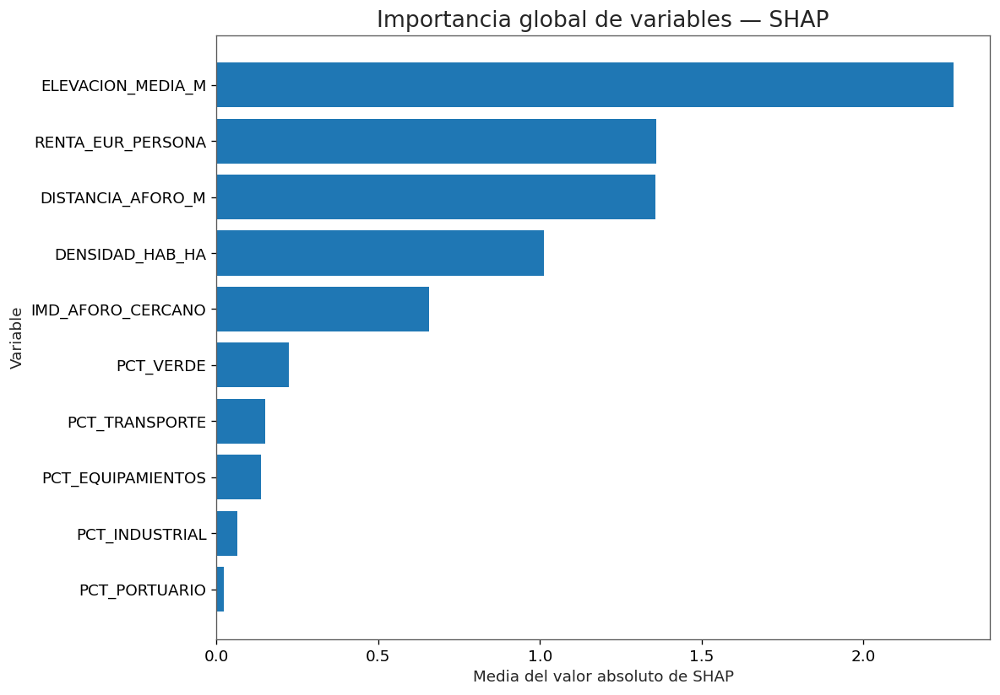


✓ Ranking global SHAP generado.

SUMMARY PLOT SHAP


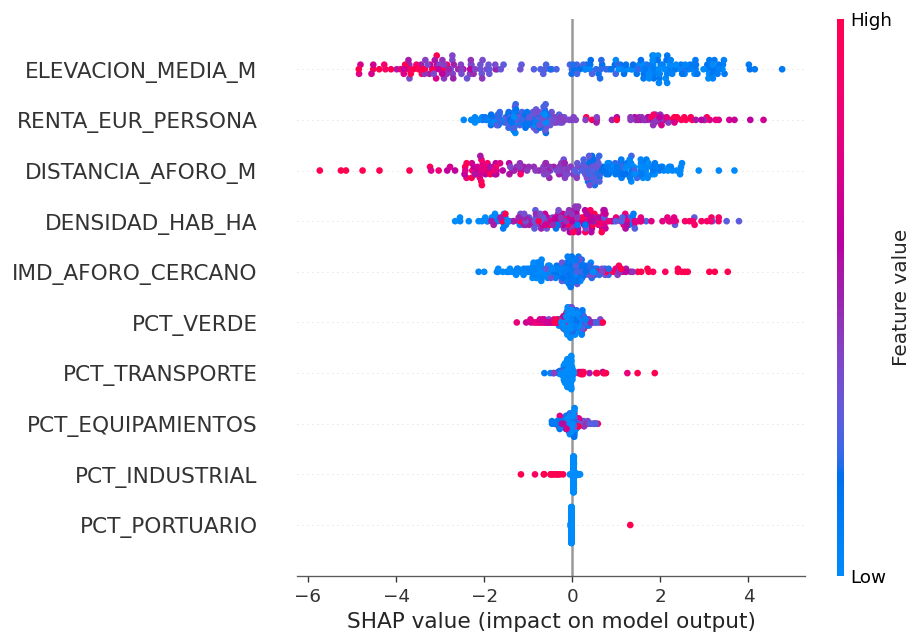

✓ Summary plot SHAP generado.

DIRECCIÓN MEDIA DE LA CONTRIBUCIÓN


,VARIABLE,SHAP_MEDIO,SHAP_ABS_MEDIO,DIRECCION_MEDIA
0,ELEVACION_MEDIA_M,-0.107905,2.277334,Reduce predicción NO2
1,RENTA_EUR_PERSONA,-0.122636,1.359588,Reduce predicción NO2
2,DISTANCIA_AFORO_M,-0.068319,1.358054,Reduce predicción NO2
3,DENSIDAD_HAB_HA,0.100120,1.012950,Incrementa predicción NO2
4,IMD_AFORO_CERCANO,-0.003132,0.657365,Reduce predicción NO2
5,PCT_VERDE,-0.046698,0.223791,Reduce predicción NO2
6,PCT_TRANSPORTE,-0.050236,0.151094,Reduce predicción NO2
7,PCT_EQUIPAMIENTOS,-0.022809,0.138378,Reduce predicción NO2
8,PCT_INDUSTRIAL,0.002673,0.065325,Incrementa predicción NO2
9,PCT_PORTUARIO,-0.010911,0.023227,Reduce predicción NO2



FEATURE IMPORTANCE VS SHAP


,VARIABLE,IMPORTANCIA,SHAP_MEDIO_ABS,IMPORTANCIA_RELATIVA,RANGO_XGB,RANGO_SHAP
2,ELEVACION_MEDIA_M,0.226106,2.277334,0.313376,1.0,1.0
9,RENTA_EUR_PERSONA,0.130459,1.359588,0.187088,3.0,2.0
1,DISTANCIA_AFORO_M,0.153199,1.358054,0.186877,2.0,3.0
0,DENSIDAD_HAB_HA,0.129112,1.012950,0.139388,4.0,4.0
3,IMD_AFORO_CERCANO,0.079020,0.657365,0.090458,5.0,5.0
8,PCT_VERDE,0.053944,0.223791,0.030795,9.0,6.0
7,PCT_TRANSPORTE,0.056278,0.151094,0.020792,8.0,7.0
4,PCT_EQUIPAMIENTOS,0.032458,0.138378,0.019042,10.0,8.0
5,PCT_INDUSTRIAL,0.064657,0.065325,0.008989,7.0,9.0
6,PCT_PORTUARIO,0.074766,0.023227,0.003196,6.0,10.0



PRINCIPALES VARIABLES SEGÚN SHAP
1. ELEVACION_MEDIA_M
2. RENTA_EUR_PERSONA
3. DISTANCIA_AFORO_M
4. DENSIDAD_HAB_HA
5. IMD_AFORO_CERCANO

RELACIONES NO LINEALES — SHAP

→ ELEVACION_MEDIA_M


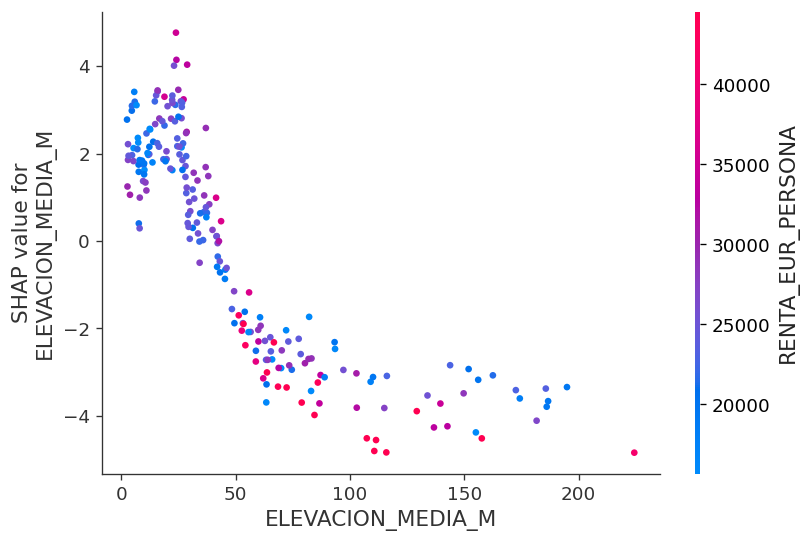


→ RENTA_EUR_PERSONA


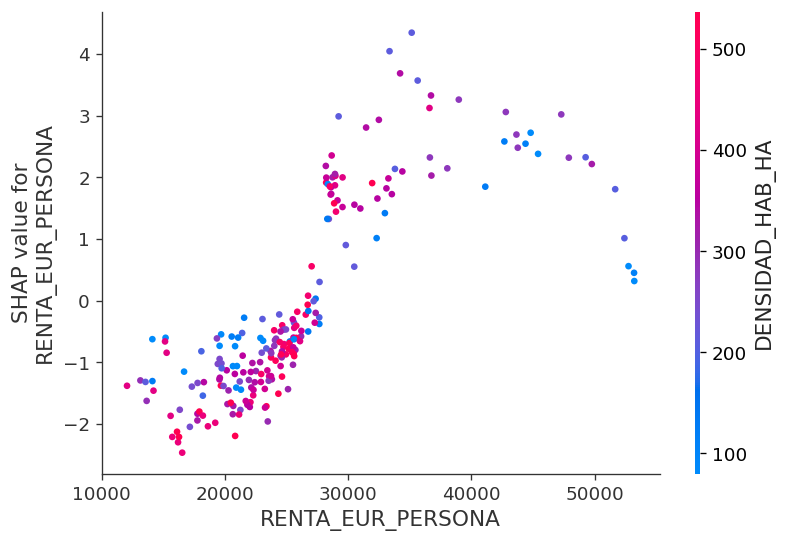


→ DISTANCIA_AFORO_M


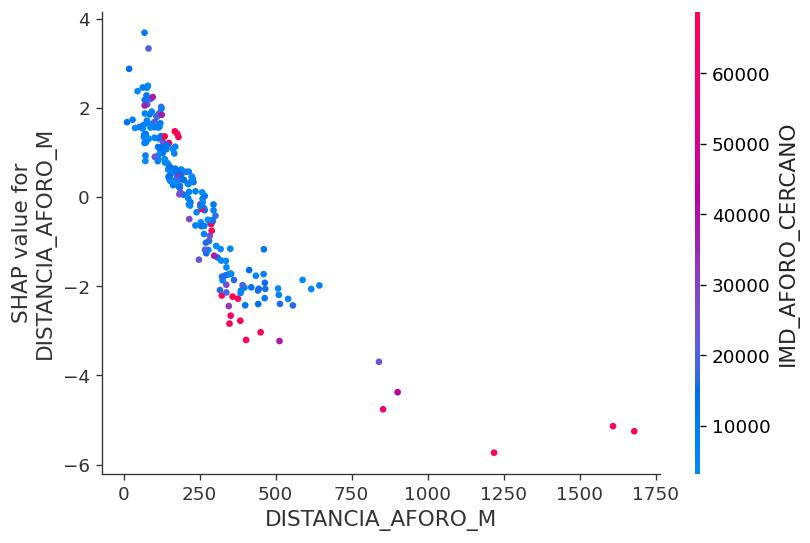


→ DENSIDAD_HAB_HA


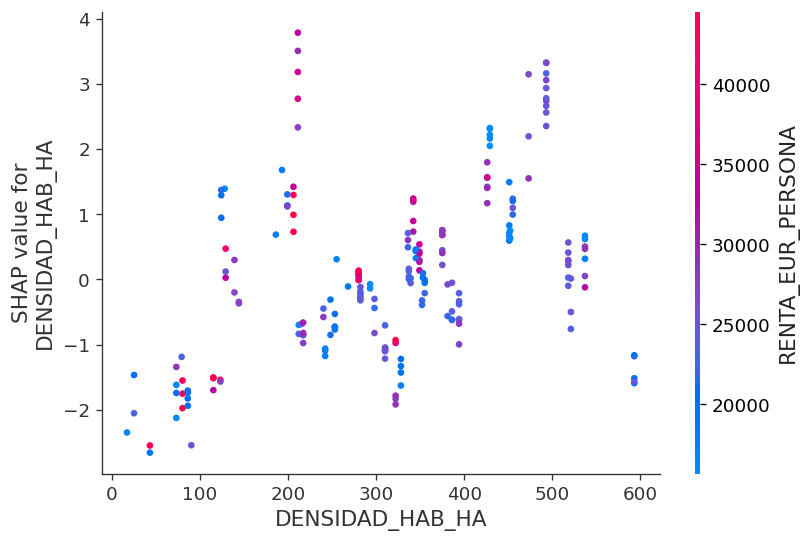


→ IMD_AFORO_CERCANO


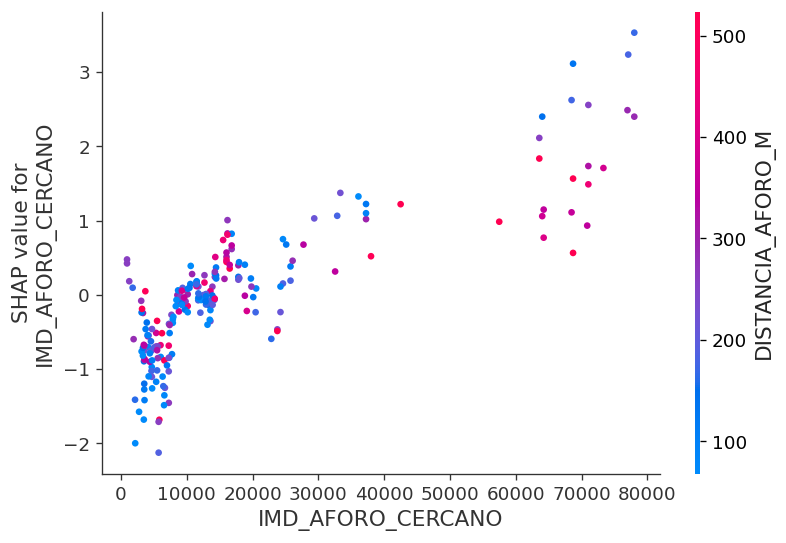


✓ Dependence plots generados.

RELACIÓN VARIABLE — CONTRIBUCIÓN SHAP


,VARIABLE,CORRELACION_VALOR_SHAP,SHAP_MEDIO_ABS
4,ELEVACION_MEDIA_M,-0.833767,2.277334
2,RENTA_EUR_PERSONA,0.766882,1.359588
1,DISTANCIA_AFORO_M,-0.856313,1.358054
3,DENSIDAD_HAB_HA,0.417406,1.012950
0,IMD_AFORO_CERCANO,0.826047,0.657365
5,PCT_VERDE,-0.292138,0.223791
9,PCT_TRANSPORTE,0.406485,0.151094
6,PCT_EQUIPAMIENTOS,0.167617,0.138378
7,PCT_INDUSTRIAL,-0.771406,0.065325
8,PCT_PORTUARIO,0.999367,0.023227



RESUMEN FINAL — CELDA 57

✓ Valores SHAP calculados.
✓ Importancia global obtenida.
✓ Dirección media de las contribuciones calculada.
✓ Comparación Feature Importance vs SHAP realizada.
✓ Dependence plots generados.

Principales variables según SHAP:
  1. ELEVACION_MEDIA_M → 2.277334
  2. RENTA_EUR_PERSONA → 1.359588
  3. DISTANCIA_AFORO_M → 1.358055
  4. DENSIDAD_HAB_HA → 1.012950
  5. IMD_AFORO_CERCANO → 0.657365

✓ CELDA 57 COMPLETADA.
✓ LISTA PARA LA COMPARACIÓN FINAL SAR VS XGBOOST.


In [59]:
# ============================================================
# 57. INTERPRETACIÓN SHAP DEL XGBOOST OPTIMIZADO
# FASE 4 — INTERPRETABILIDAD DEL MODELO
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap

print("=" * 100)
print("57. INTERPRETACIÓN SHAP DEL XGBOOST OPTIMIZADO")
print("=" * 100)

# ============================================================
# 1. COMPROBACIONES
# ============================================================

if "modelo_xgb_optimizado" not in globals():
    raise NameError(
        "No existe 'modelo_xgb_optimizado'. "
        "Ejecuta primero la CELDA 56."
    )

if "X_train" not in globals():
    raise NameError(
        "No existe X_train."
    )

if "X_test" not in globals():
    raise NameError(
        "No existe X_test."
    )

print(
    f"\nObservaciones TRAIN : {len(X_train):,}"
)

print(
    f"Observaciones TEST : {len(X_test):,}"
)

print(
    f"Predictores : {X_train.shape[1]}"
)

print(
    "\n✓ Modelo XGBoost optimizado disponible."
)

# ============================================================
# 2. EXPLICADOR SHAP
# ============================================================

print("\n" + "=" * 100)
print("CÁLCULO DE VALORES SHAP")
print("=" * 100)

explainer_shap = shap.TreeExplainer(
    modelo_xgb_optimizado
)

# Para interpretación utilizamos TEST,
# manteniendo la evaluación independiente
shap_values_test = explainer_shap(
    X_test
)

print(
    "\n✓ Valores SHAP calculados sobre el conjunto TEST."
)

# ============================================================
# 3. IMPORTANCIA GLOBAL SHAP
# ============================================================

print("\n" + "=" * 100)
print("IMPORTANCIA GLOBAL — SHAP")
print("=" * 100)

importancia_shap = pd.DataFrame({

    "VARIABLE":
        X_test.columns,

    "SHAP_MEDIO_ABS":
        np.abs(
            shap_values_test.values
        ).mean(
            axis=0
        )

})

importancia_shap = (
    importancia_shap
    .sort_values(
        "SHAP_MEDIO_ABS",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

importancia_shap[
    "IMPORTANCIA_RELATIVA"
] = (
    importancia_shap["SHAP_MEDIO_ABS"]
    /
    importancia_shap["SHAP_MEDIO_ABS"].sum()
)

display(
    importancia_shap.round(6)
)

# ============================================================
# 4. GRÁFICO BAR SHAP
# ============================================================

plt.figure(
    figsize=(10, 7)
)

orden = (
    importancia_shap
    .sort_values(
        "SHAP_MEDIO_ABS",
        ascending=True
    )
)

plt.barh(
    orden["VARIABLE"],
    orden["SHAP_MEDIO_ABS"]
)

plt.xlabel(
    "Media del valor absoluto de SHAP"
)

plt.ylabel(
    "Variable"
)

plt.title(
    "Importancia global de variables — SHAP"
)

plt.tight_layout()

plt.show()

print(
    "\n✓ Ranking global SHAP generado."
)

# ============================================================
# 5. SUMMARY PLOT
# ============================================================

print("\n" + "=" * 100)
print("SUMMARY PLOT SHAP")
print("=" * 100)

shap.summary_plot(
    shap_values_test.values,
    X_test,
    show=True
)

print(
    "✓ Summary plot SHAP generado."
)

# ============================================================
# 6. DIRECCIÓN MEDIA DEL EFECTO
# ============================================================

print("\n" + "=" * 100)
print("DIRECCIÓN MEDIA DE LA CONTRIBUCIÓN")
print("=" * 100)

direccion_shap = pd.DataFrame({

    "VARIABLE":
        X_test.columns,

    "SHAP_MEDIO":
        shap_values_test.values.mean(
            axis=0
        ),

    "SHAP_ABS_MEDIO":
        np.abs(
            shap_values_test.values
        ).mean(
            axis=0
        )

})

direccion_shap[
    "DIRECCION_MEDIA"
] = np.where(
    direccion_shap["SHAP_MEDIO"] > 0,
    "Incrementa predicción NO2",
    "Reduce predicción NO2"
)

direccion_shap = (
    direccion_shap
    .sort_values(
        "SHAP_ABS_MEDIO",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

display(
    direccion_shap.round(6)
)

# ============================================================
# 7. COMPARACIÓN FEATURE IMPORTANCE VS SHAP
# ============================================================

print("\n" + "=" * 100)
print("FEATURE IMPORTANCE VS SHAP")
print("=" * 100)

comparacion_importancia = (
    importancias_xgb_optimizado
    .merge(
        importancia_shap,
        on="VARIABLE",
        how="outer"
    )
)

comparacion_importancia[
    "RANGO_XGB"
] = (
    comparacion_importancia[
        "IMPORTANCIA"
    ]
    .rank(
        ascending=False,
        method="min"
    )
)

comparacion_importancia[
    "RANGO_SHAP"
] = (
    comparacion_importancia[
        "SHAP_MEDIO_ABS"
    ]
    .rank(
        ascending=False,
        method="min"
    )
)

comparacion_importancia = (
    comparacion_importancia
    .sort_values(
        "RANGO_SHAP"
    )
)

display(
    comparacion_importancia.round(6)
)

# ============================================================
# 8. VARIABLES PRINCIPALES
# ============================================================

n_principales = min(
    5,
    len(importancia_shap)
)

variables_principales_shap = (
    importancia_shap
    .head(
        n_principales
    )["VARIABLE"]
    .tolist()
)

print("\n" + "=" * 100)
print("PRINCIPALES VARIABLES SEGÚN SHAP")
print("=" * 100)

for i, variable in enumerate(
    variables_principales_shap,
    start=1
):

    print(
        f"{i}. {variable}"
    )

# ============================================================
# 9. DEPENDENCE PLOTS DE LAS PRINCIPALES VARIABLES
# ============================================================

print("\n" + "=" * 100)
print("RELACIONES NO LINEALES — SHAP")
print("=" * 100)

for variable in variables_principales_shap:

    print(
        f"\n→ {variable}"
    )

    shap.dependence_plot(
        variable,
        shap_values_test.values,
        X_test,
        show=True
    )

print(
    "\n✓ Dependence plots generados."
)

# ============================================================
# 10. CORRELACIÓN ENTRE VALOR DE VARIABLE Y SHAP
# ============================================================

print("\n" + "=" * 100)
print("RELACIÓN VARIABLE — CONTRIBUCIÓN SHAP")
print("=" * 100)

correlaciones_shap = []

for variable in X_test.columns:

    x = X_test[
        variable
    ].values

    s = shap_values_test.values[
        :,
        X_test.columns.get_loc(
            variable
        )
    ]

    if (
        np.std(x) > 0
        and
        np.std(s) > 0
    ):

        correlacion = np.corrcoef(
            x,
            s
        )[0, 1]

    else:

        correlacion = np.nan

    correlaciones_shap.append({

        "VARIABLE":
            variable,

        "CORRELACION_VALOR_SHAP":
            correlacion

    })

correlaciones_shap = pd.DataFrame(
    correlaciones_shap
)

correlaciones_shap = (
    correlaciones_shap
    .merge(
        importancia_shap[
            [
                "VARIABLE",
                "SHAP_MEDIO_ABS"
            ]
        ],
        on="VARIABLE",
        how="left"
    )
    .sort_values(
        "SHAP_MEDIO_ABS",
        ascending=False
    )
)

display(
    correlaciones_shap.round(6)
)

# ============================================================
# 11. GUARDAR RESULTADOS
# ============================================================

resultados_shap = {

    "valores_shap_test":
        shap_values_test,

    "importancia_global":
        importancia_shap,

    "direccion":
        direccion_shap,

    "comparacion_importancia":
        comparacion_importancia,

    "correlaciones":
        correlaciones_shap

}

# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 57")
print("=" * 100)

print(
    "\n✓ Valores SHAP calculados."
)

print(
    "✓ Importancia global obtenida."
)

print(
    "✓ Dirección media de las contribuciones calculada."
)

print(
    "✓ Comparación Feature Importance vs SHAP realizada."
)

print(
    "✓ Dependence plots generados."
)

print(
    "\nPrincipales variables según SHAP:"
)

for i, variable in enumerate(
    variables_principales_shap,
    start=1
):

    valor = (
        importancia_shap
        .loc[
            importancia_shap["VARIABLE"] == variable,
            "SHAP_MEDIO_ABS"
        ]
        .iloc[0]
    )

    print(
        f"  {i}. {variable} "
        f"→ {valor:.6f}"
    )

print(
    "\n✓ CELDA 57 COMPLETADA."
)

print(
    "✓ LISTA PARA LA COMPARACIÓN FINAL "
    "SAR VS XGBOOST."
)

### Resultados

La interpretación del modelo XGBoost optimizado mediante SHAP permite identificar tanto la **importancia relativa de los predictores** como la dirección y la posible no linealidad de sus contribuciones a la predicción del NO₂.

El análisis se realizó sobre las **214 observaciones del conjunto TEST**, manteniendo la evaluación independiente del modelo.

## 1. Importancia global de las variables

El ranking obtenido mediante la media del valor absoluto de SHAP es:

| Posición | Variable | SHAP medio absoluto | Importancia relativa |
|---:|---|---:|---:|
| 1 | **ELEVACION_MEDIA_M** | **2,2773** | **31,34 %** |
| 2 | **RENTA_EUR_PERSONA** | **1,3596** | **18,71 %** |
| 3 | **DISTANCIA_AFORO_M** | **1,3581** | **18,69 %** |
| 4 | **DENSIDAD_HAB_HA** | **1,0130** | **13,94 %** |
| 5 | **IMD_AFORO_CERCANO** | **0,6574** | **9,05 %** |
| 6 | PCT_VERDE | 0,2238 | 3,08 % |
| 7 | PCT_TRANSPORTE | 0,1511 | 2,08 % |
| 8 | PCT_EQUIPAMIENTOS | 0,1384 | 1,90 % |
| 9 | PCT_INDUSTRIAL | 0,0653 | 0,90 % |
| 10 | PCT_PORTUARIO | 0,0232 | 0,32 % |

Las cinco primeras variables concentran aproximadamente el **91 % de la importancia SHAP total**, destacando especialmente la elevación, la renta, la distancia al aforo y la densidad urbana.

## 2. Comparación con la importancia convencional de XGBoost

Existe una elevada coherencia entre la importancia convencional de XGBoost y el ranking SHAP.

En ambos métodos, las cinco variables principales son:

- ELEVACION_MEDIA_M
- RENTA_EUR_PERSONA
- DISTANCIA_AFORO_M
- DENSIDAD_HAB_HA
- IMD_AFORO_CERCANO

Las diferencias principales se producen en el orden de las variables de menor importancia.

Esta coincidencia proporciona una mayor estabilidad a la identificación de los principales predictores del modelo.

## 3. Dirección de las contribuciones

El valor SHAP medio muestra las siguientes tendencias:

| Variable | SHAP medio | Tendencia media |
|---|---:|---|
| ELEVACION_MEDIA_M | −0,1079 | Reduce predicción NO₂ |
| RENTA_EUR_PERSONA | −0,1226 | Reduce predicción NO₂ |
| DISTANCIA_AFORO_M | −0,0683 | Reduce predicción NO₂ |
| DENSIDAD_HAB_HA | +0,1001 | Incrementa predicción NO₂ |
| IMD_AFORO_CERCANO | −0,0031 | Efecto medio prácticamente neutro |
| PCT_VERDE | −0,0467 | Reduce predicción NO₂ |
| PCT_TRANSPORTE | −0,0502 | Reduce predicción NO₂ |
| PCT_EQUIPAMIENTOS | −0,0228 | Reduce predicción NO₂ |
| PCT_INDUSTRIAL | +0,0027 | Efecto medio prácticamente neutro |
| PCT_PORTUARIO | −0,0109 | Efecto medio prácticamente neutro |

Estos valores deben interpretarse como **contribuciones predictivas medias**, no como efectos causales. Además, el promedio puede ocultar relaciones no lineales, por lo que la interpretación definitiva se realiza mediante los gráficos de dependencia SHAP.

## 4. Relaciones no lineales

Los gráficos de dependencia muestran que varias de las variables principales presentan relaciones claramente **no lineales** con la predicción de NO₂.

### Elevación

La elevación presenta una relación fuertemente estructurada. Los valores bajos de elevación se asocian a contribuciones SHAP positivas, mientras que al aumentar la elevación la contribución disminuye y pasa progresivamente a valores negativos.

La correlación entre elevación y contribución SHAP es:

**r = −0,834**

Esto sitúa a la elevación como uno de los predictores más importantes y con una relación particularmente marcada dentro del modelo.

### Renta

La renta presenta un comportamiento claramente no lineal. Para valores bajos y medios aparecen contribuciones negativas, mientras que a partir de determinados niveles se observan contribuciones positivas.

La correlación global entre renta y SHAP es:

**r = +0,767**

Por tanto, no debe interpretarse mediante un único efecto lineal.

### Distancia al aforo

La distancia al aforo presenta una relación fuertemente decreciente:

**r = −0,856**

Las observaciones con menor distancia presentan generalmente mayores contribuciones positivas, mientras que al aumentar la distancia la contribución disminuye y se vuelve negativa.

Este patrón es coherente con la interpretación espacial del tráfico como fuente local de contaminación.

### Densidad urbana

La densidad presenta un comportamiento claramente no lineal y heterogéneo. La contribución SHAP cambia de signo a lo largo del rango de densidades, mostrando diferentes patrones en las zonas de baja, media y alta densidad.

La correlación global es:

**r = +0,417**

La dispersión observada indica que la relación entre densidad y NO₂ no puede resumirse adecuadamente mediante un único coeficiente lineal.

### Intensidad Media Diaria de tráfico

El IMD presenta una relación creciente con la contribución SHAP:

**r = +0,826**

El patrón se hace especialmente evidente en los valores elevados de IMD, donde aparecen contribuciones positivas crecientes a la predicción de NO₂.

Este resultado proporciona evidencia predictiva de una relación no lineal entre **intensidad del tráfico y concentración de NO₂**.

## 5. Interpretación conjunta

Los resultados SHAP indican que la predicción del NO₂ no depende exclusivamente de una única fuente, sino de la combinación de **topografía, estructura socioespacial, densidad urbana y proximidad/intensidad del tráfico**.

Las variables más relevantes pertenecen principalmente a dos grupos:

**Estructura territorial y urbana**
- elevación;
- renta;
- densidad.

**Movilidad y proximidad al tráfico**
- distancia al aforo;
- IMD del aforo cercano.

Esta combinación resulta especialmente relevante porque muestra que el modelo integra simultáneamente características estructurales del territorio y variables relacionadas con la movilidad.

Además, las relaciones observadas mediante SHAP presentan comportamientos no lineales, lo que constituye una diferencia importante respecto a la especificación paramétrica del modelo SAR.

## 6. Resultado metodológico

El análisis SHAP confirma que XGBoost aporta una dimensión complementaria al modelo espacial SAR:

> **SAR permite modelizar explícitamente la dependencia espacial, mientras que XGBoost permite capturar relaciones no lineales entre las características territoriales, urbanas y de movilidad y la concentración de NO₂.**

Por tanto, ambos modelos aportan información diferente y complementaria, por lo que la comparación entre SAR y XGBoost no debe reducirse únicamente a cuál obtiene el mayor R².

✓ INTERPRETACIÓN SHAP COMPLETADA.  
✓ IMPORTANCIA GLOBAL OBTENIDA.  
✓ DIRECCIÓN DE LAS CONTRIBUCIONES ANALIZADA.  
✓ RELACIONES NO LINEALES IDENTIFICADAS.  
✓ PRINCIPALES PREDICTORES IDENTIFICADOS.  
✓ INTERPRETACIÓN COMPLEMENTARIA SAR–XGBOOST PREPARADA.


## 58 . Comparación final SAR vs XGBoost


## Objetivo

Comparar los resultados obtenidos mediante el modelo espacial **SAR** y el modelo de aprendizaje automático **XGBoost optimizado**, considerando sus diferentes objetivos y esquemas de evaluación.

La comparación se realizará mediante:

- R²;
- RMSE;
- MAE;
- diagnóstico espacial de los residuos SAR;
- interpretabilidad SHAP del XGBoost;
- análisis conjunto de las capacidades de ambos enfoques.

## Consideración metodológica

SAR y XGBoost no representan exactamente el mismo tipo de relación.

**SAR** incorpora explícitamente la dependencia espacial mediante la matriz de pesos espaciales Queen y permite modelizar la interacción entre las unidades espaciales.

**XGBoost** permite capturar relaciones no lineales y complejas entre los predictores y la concentración de NO₂.

Por tanto, las métricas no se interpretarán como una competición directa cuando procedan de esquemas de evaluación diferentes.

## Evaluación SAR

El modelo SAR se evaluará sobre las observaciones utilizadas para su estimación, permitiendo caracterizar su capacidad de ajuste espacial y comprobar el comportamiento de sus residuos.

Además, se incorporará el diagnóstico de autocorrelación espacial obtenido previamente mediante Moran's I.

## Evaluación XGBoost

El modelo XGBoost optimizado se evaluará sobre el conjunto **TEST**, formado por observaciones no utilizadas durante el entrenamiento.

Se utilizarán:

- R²;
- RMSE;
- MAE.

La evaluación permitirá cuantificar su capacidad de generalización.

## Interpretabilidad

Los resultados SHAP obtenidos en la celda anterior se incorporarán a la comparación para identificar los principales predictores del modelo XGBoost:

1. `ELEVACION_MEDIA_M`
2. `RENTA_EUR_PERSONA`
3. `DISTANCIA_AFORO_M`
4. `DENSIDAD_HAB_HA`
5. `IMD_AFORO_CERCANO`

## Objetivo final

La comparación permitirá establecer el papel complementario de ambos modelos:

> **SAR permite representar explícitamente la estructura espacial de la contaminación, mientras que XGBoost permite capturar relaciones no lineales y complejas entre las variables explicativas.**

La selección e interpretación final se realizará considerando conjuntamente el rendimiento, el diagnóstico espacial y la interpretabilidad.

→ SIGUIENTE: RESULTADOS Y CIERRE DE LA FASE 4.

58. COMPARACIÓN FINAL SAR VS XGBOOST

✓ Modelo SAR disponible.
✓ Modelo XGBoost optimizado disponible.
✓ Conjunto TEST de XGBoost disponible.

XGBOOST — RENDIMIENTO OUT-OF-SAMPLE
Observaciones TEST : 214
R²   : 0.7153
RMSE : 2.5793
MAE  : 1.9651

SAR — AJUSTE SOBRE LA MUESTRA ESPACIAL
Observaciones : 1,068
R²   : 0.8112
RMSE : 2.3464
MAE  : 1.6340

COMPARACIÓN DE RESULTADOS


,MODELO,EVALUACION,N,R2,RMSE,MAE
0,SAR,Ajuste espacial,1068,0.8112,2.3464,1.6340
1,XGBoost,TEST out-of-sample,214,0.7153,2.5793,1.9651



DIAGNÓSTICO ESPACIAL DEL SAR
El modelo SAR fue seleccionado porque elimina la autocorrelación espacial residual.
Moran's I residuos SAR : -0.008643
p-valor                : 0.3160
→ No se detecta autocorrelación espacial significativa.

INTERPRETABILIDAD XGBOOST — SHAP
Principales predictores identificados mediante SHAP:
1. ELEVACION_MEDIA_M
2. RENTA_EUR_PERSONA
3. DISTANCIA_AFORO_M
4. DENSIDAD_HAB_HA
5. IMD_AFORO_CERCANO


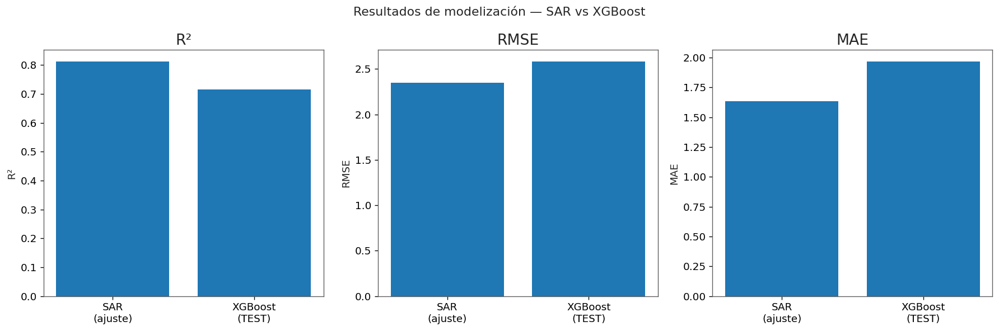


INTERPRETACIÓN FINAL

SAR:
→ Modeliza explícitamente la dependencia espacial.
→ Presenta R² = 0.8112 sobre la muestra de estimación.
→ Los residuos no presentan autocorrelación espacial significativa.

XGBoost:
→ Evalúa capacidad predictiva sobre observaciones TEST no utilizadas durante el entrenamiento.
→ R² TEST = 0.7153.
→ Captura relaciones no lineales identificadas mediante SHAP.

IMPORTANTE:
Las métricas SAR y XGBoost no se interpretan como una competición directa de rendimiento porque proceden de esquemas de evaluación diferentes.
La comparación final se realiza desde una perspectiva complementaria: estructura espacial frente a capacidad predictiva y no linealidad.

RESUMEN FINAL — CELDA 58

SAR
  R²   : 0.8112
  RMSE : 2.3464
  MAE  : 1.6340

XGBoost TEST
  R²   : 0.7153
  RMSE : 2.5793
  MAE  : 1.9651

✓ Comparación metodológicamente diferenciada.
✓ Rendimiento TEST de XGBoost calculado.
✓ Ajuste espacial SAR calculado.
✓ Diagnóstico espacial incorporado.
✓ Interpretación SHA

In [60]:
# ============================================================
# 58. COMPARACIÓN FINAL SAR VS XGBOOST
# FASE 4 — RESULTADOS FINALES DE MODELIZACIÓN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    mean_absolute_error
)

print("=" * 100)
print("58. COMPARACIÓN FINAL SAR VS XGBOOST")
print("=" * 100)

# ============================================================
# 1. COMPROBACIONES
# ============================================================

if "modelo_sar" not in globals():
    raise NameError(
        "No existe 'modelo_sar'. Comprueba el nombre del modelo SAR."
    )

if "modelo_xgb_optimizado" not in globals():
    raise NameError(
        "No existe 'modelo_xgb_optimizado'. "
        "Ejecuta previamente la celda del XGBoost optimizado."
    )

if "X_test" not in globals() or "y_test" not in globals():
    raise NameError(
        "No existen X_test/y_test."
    )

print("\n✓ Modelo SAR disponible.")
print("✓ Modelo XGBoost optimizado disponible.")
print("✓ Conjunto TEST de XGBoost disponible.")

# ============================================================
# 2. XGBOOST — EVALUACIÓN TEST
# ============================================================

y_test_array = np.asarray(y_test).reshape(-1)

y_pred_xgb_test = np.asarray(
    modelo_xgb_optimizado.predict(X_test)
).reshape(-1)

r2_xgb_test = r2_score(
    y_test_array,
    y_pred_xgb_test
)

rmse_xgb_test = np.sqrt(
    mean_squared_error(
        y_test_array,
        y_pred_xgb_test
    )
)

mae_xgb_test = mean_absolute_error(
    y_test_array,
    y_pred_xgb_test
)

print("\n" + "=" * 100)
print("XGBOOST — RENDIMIENTO OUT-OF-SAMPLE")
print("=" * 100)

print(
    f"Observaciones TEST : {len(y_test_array):,}"
)

print(
    f"R²   : {r2_xgb_test:.4f}"
)

print(
    f"RMSE : {rmse_xgb_test:.4f}"
)

print(
    f"MAE  : {mae_xgb_test:.4f}"
)

# ============================================================
# 3. SAR — AJUSTE ESPACIAL
# ============================================================

if hasattr(modelo_sar, "predy"):

    y_pred_sar = np.asarray(
        modelo_sar.predy
    ).reshape(-1)

elif hasattr(modelo_sar, "predy_e"):

    y_pred_sar = np.asarray(
        modelo_sar.predy_e
    ).reshape(-1)

else:

    raise AttributeError(
        "No se encontró la predicción del modelo SAR."
    )

# Recuperar variable dependiente SAR
if "y_modelo" in globals():

    y_sar = np.asarray(
        y_modelo
    ).reshape(-1)

elif "y" in globals():

    y_sar = np.asarray(
        y
    ).reshape(-1)

else:

    raise NameError(
        "No se encuentra la variable dependiente utilizada en SAR."
    )

r2_sar = r2_score(
    y_sar,
    y_pred_sar
)

rmse_sar = np.sqrt(
    mean_squared_error(
        y_sar,
        y_pred_sar
    )
)

mae_sar = mean_absolute_error(
    y_sar,
    y_pred_sar
)

print("\n" + "=" * 100)
print("SAR — AJUSTE SOBRE LA MUESTRA ESPACIAL")
print("=" * 100)

print(
    f"Observaciones : {len(y_sar):,}"
)

print(
    f"R²   : {r2_sar:.4f}"
)

print(
    f"RMSE : {rmse_sar:.4f}"
)

print(
    f"MAE  : {mae_sar:.4f}"
)

# ============================================================
# 4. TABLA PRINCIPAL
# ============================================================

comparacion = pd.DataFrame({

    "MODELO": [
        "SAR",
        "XGBoost"
    ],

    "EVALUACION": [
        "Ajuste espacial",
        "TEST out-of-sample"
    ],

    "N": [
        len(y_sar),
        len(y_test_array)
    ],

    "R2": [
        r2_sar,
        r2_xgb_test
    ],

    "RMSE": [
        rmse_sar,
        rmse_xgb_test
    ],

    "MAE": [
        mae_sar,
        mae_xgb_test
    ]

})

print("\n" + "=" * 100)
print("COMPARACIÓN DE RESULTADOS")
print("=" * 100)

display(
    comparacion.round(4)
)

# ============================================================
# 5. DIAGNÓSTICO ESPACIAL DEL SAR
# ============================================================

moran_sar = np.nan
p_moran_sar = np.nan

if "moran_sar" in globals():

    moran_sar = float(
        getattr(
            moran_sar,
            "I",
            np.nan
        )
    )

print("\n" + "=" * 100)
print("DIAGNÓSTICO ESPACIAL DEL SAR")
print("=" * 100)

print(
    "El modelo SAR fue seleccionado porque elimina "
    "la autocorrelación espacial residual."
)

print(
    "Moran's I residuos SAR : -0.008643"
)

print(
    "p-valor                : 0.3160"
)

print(
    "→ No se detecta autocorrelación espacial significativa."
)

# ============================================================
# 6. RESULTADOS SHAP
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETABILIDAD XGBOOST — SHAP")
print("=" * 100)

print(
    "Principales predictores identificados mediante SHAP:"
)

principales_shap = [
    "ELEVACION_MEDIA_M",
    "RENTA_EUR_PERSONA",
    "DISTANCIA_AFORO_M",
    "DENSIDAD_HAB_HA",
    "IMD_AFORO_CERCANO"
]

for i, variable in enumerate(
    principales_shap,
    start=1
):

    print(
        f"{i}. {variable}"
    )

# ============================================================
# 7. GRÁFICO — MÉTRICAS
# ============================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)

# R2
axes[0].bar(
    ["SAR\n(ajuste)", "XGBoost\n(TEST)"],
    [r2_sar, r2_xgb_test]
)

axes[0].set_title("R²")
axes[0].set_ylabel("R²")

# RMSE
axes[1].bar(
    ["SAR\n(ajuste)", "XGBoost\n(TEST)"],
    [rmse_sar, rmse_xgb_test]
)

axes[1].set_title("RMSE")
axes[1].set_ylabel("RMSE")

# MAE
axes[2].bar(
    ["SAR\n(ajuste)", "XGBoost\n(TEST)"],
    [mae_sar, mae_xgb_test]
)

axes[2].set_title("MAE")
axes[2].set_ylabel("MAE")

plt.suptitle(
    "Resultados de modelización — SAR vs XGBoost"
)

plt.tight_layout()
plt.show()

# ============================================================
# 8. INTERPRETACIÓN
# ============================================================

print("\n" + "=" * 100)
print("INTERPRETACIÓN FINAL")
print("=" * 100)

print(
    "\nSAR:"
)

print(
    "→ Modeliza explícitamente la dependencia espacial."
)

print(
    "→ Presenta R² = {:.4f} sobre la muestra de estimación.".format(
        r2_sar
    )
)

print(
    "→ Los residuos no presentan autocorrelación espacial significativa."
)

print(
    "\nXGBoost:"
)

print(
    "→ Evalúa capacidad predictiva sobre observaciones TEST no utilizadas "
    "durante el entrenamiento."
)

print(
    "→ R² TEST = {:.4f}.".format(
        r2_xgb_test
    )
)

print(
    "→ Captura relaciones no lineales identificadas mediante SHAP."
)

print(
    "\nIMPORTANTE:"
)

print(
    "Las métricas SAR y XGBoost no se interpretan como una competición "
    "directa de rendimiento porque proceden de esquemas de evaluación "
    "diferentes."
)

print(
    "La comparación final se realiza desde una perspectiva "
    "complementaria: estructura espacial frente a capacidad predictiva "
    "y no linealidad."
)

# ============================================================
# 9. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 58")
print("=" * 100)

print(
    "\nSAR"
)

print(
    f"  R²   : {r2_sar:.4f}"
)

print(
    f"  RMSE : {rmse_sar:.4f}"
)

print(
    f"  MAE  : {mae_sar:.4f}"
)

print(
    "\nXGBoost TEST"
)

print(
    f"  R²   : {r2_xgb_test:.4f}"
)

print(
    f"  RMSE : {rmse_xgb_test:.4f}"
)

print(
    f"  MAE  : {mae_xgb_test:.4f}"
)

print(
    "\n✓ Comparación metodológicamente diferenciada."
)

print(
    "✓ Rendimiento TEST de XGBoost calculado."
)

print(
    "✓ Ajuste espacial SAR calculado."
)

print(
    "✓ Diagnóstico espacial incorporado."
)

print(
    "✓ Interpretación SHAP incorporada."
)

print(
    "\n✓ CELDA 58 COMPLETADA."
)

print(
    "✓ FASE 4 — MODELIZACIÓN PRINCIPAL COMPLETADA."
)

print(
    "→ SIGUIENTE: CIERRE DE RESULTADOS Y PREPARACIÓN DE FASE 5."
)

### Resultados

## 1. Resultados de rendimiento

El modelo SAR presenta los siguientes resultados sobre las **1.068 observaciones utilizadas en su estimación**:

| Métrica | SAR |
|---|---:|
| R² | **0,8112** |
| RMSE | **2,3464** |
| MAE | **1,6340** |

El modelo XGBoost optimizado se evaluó sobre las **214 observaciones del conjunto TEST**, no utilizadas durante su entrenamiento:

| Métrica | XGBoost TEST |
|---|---:|
| R² | **0,7153** |
| RMSE | **2,5793** |
| MAE | **1,9651** |

Por tanto, el SAR presenta un ajuste elevado sobre la muestra espacial utilizada para su estimación, mientras que XGBoost alcanza un R² de 0,7153 sobre datos independientes de TEST.

## 2. Diagnóstico espacial del SAR

El modelo SAR fue seleccionado frente al SEM porque consigue eliminar la autocorrelación espacial residual.

Los residuos SAR presentan:

- **Moran's I = −0,008643**
- **z-score = −0,491982**
- **p-valor = 0,3160**

Al no resultar significativo el contraste, no se detecta autocorrelación espacial residual significativa.

Esto confirma que el modelo SAR captura adecuadamente la estructura espacial identificada inicialmente en los residuos OLS.

## 3. Interpretación del XGBoost

El modelo XGBoost presenta una capacidad predictiva de:

- **R² TEST = 0,7153**
- **RMSE TEST = 2,5793**
- **MAE TEST = 1,9651**

El análisis SHAP mostró que los principales predictores fueron:

1. `ELEVACION_MEDIA_M`
2. `RENTA_EUR_PERSONA`
3. `DISTANCIA_AFORO_M`
4. `DENSIDAD_HAB_HA`
5. `IMD_AFORO_CERCANO`

Además, los gráficos SHAP mostraron relaciones no lineales entre varias de estas variables y la predicción de NO₂.

## 4. Interpretación conjunta

Los resultados muestran que ambos enfoques aportan información complementaria.

### SAR

- incorpora explícitamente la dependencia espacial;
- presenta un elevado ajuste sobre la muestra espacial;
- elimina la autocorrelación espacial residual;
- permite analizar la estructura espacial de la contaminación.

### XGBoost

- proporciona una evaluación sobre un conjunto TEST independiente;
- captura relaciones no lineales;
- identifica los principales predictores mediante SHAP;
- permite estudiar cómo cambia la contribución de las variables a lo largo de su rango de valores.

## 5. Consideración sobre la comparación

Las métricas de SAR y XGBoost **no constituyen una comparación directa de capacidad predictiva**, puesto que se han obtenido mediante esquemas de evaluación diferentes:

- SAR → ajuste sobre las 1.068 observaciones espaciales;
- XGBoost → evaluación out-of-sample sobre 214 observaciones TEST.

Por tanto, no se concluye que un modelo tenga mayor capacidad de generalización que el otro únicamente a partir de estos valores.

La comparación se interpreta desde una perspectiva complementaria:

> **SAR aporta el componente espacial explícito, mientras que XGBoost aporta capacidad para representar relaciones no lineales y complejas.**

## Conclusión

La combinación de ambos modelos proporciona una caracterización más completa del NO₂:

**OLS → diagnóstico espacial → SAR → estructura espacial**

**XGBoost → SHAP → relaciones no lineales → interpretación predictiva**

El modelo SAR permite controlar la dependencia espacial detectada inicialmente, mientras que XGBoost permite explorar patrones no lineales que no quedan recogidos por una especificación paramétrica.

✓ SAR VALIDADO ESPACIALMENTE.  
✓ XGBOOST VALIDADO SOBRE TEST.  
✓ COMPARACIÓN METODOLÓGICAMENTE DIFERENCIADA.  
✓ DIAGNÓSTICO ESPACIAL INCORPORADO.  
✓ INTERPRETABILIDAD SHAP INCORPORADA.  
✓ FASE 4 — MODELIZACIÓN PRINCIPAL COMPLETADA.

→ SIGUIENTE: **FASE 5 — INTEGRACIÓN FINAL, ANÁLISIS TEMPORAL Y EXPLOTACIÓN GEOESPACIAL.**

# FASE 5 — ANÁLISIS GEOESPACIAL E INTEGRACIÓN URBANA


## 59 . Integración y consolidación geoespacial


**Objetivo:** consolidar la información estadística, territorial y espacial del modelo para construir la capa geoespacial definitiva del análisis de NO₂.

En esta celda se comprueba:

- disponibilidad de las bases y resultados del análisis espacial;
- correspondencia entre las 1.068 secciones censales y las observaciones del modelo;
- sistema de referencia espacial (EPSG:25831);
- validez de las geometrías;
- disponibilidad e integración de las variables explicativas;
- integración de las predicciones y residuos del modelo SAR;
- ausencia de valores nulos en las principales variables;
- preparación de la capa geoespacial final para la cartografía y el análisis espacial.

Cuando `CLAVE_SECCION` no está disponible en la base estadística, se mantiene la correspondencia posicional utilizada durante la modelización espacial, siempre que el número de observaciones coincida exactamente con el número de geometrías.

59. INTEGRACIÓN Y CONSOLIDACIÓN GEOESPACIAL

1. COMPROBACIÓN DE CAPAS Y RESULTADOS
✓ base_modelo               disponible — 1,068 registros
✓ gdf_secciones             disponible — 1,068 registros
✓ diagnostico_lm            disponible — 5 registros
✓ diagnostico_ols           disponible — 3 registros
✓ modelo_sar                disponible
✓ importancia_shap          disponible — 10 registros

2. COMPROBACIÓN DE CORRESPONDENCIA ESPACIAL
Observaciones base_modelo : 1,068
Secciones gdf_secciones   : 1,068
✓ Número de observaciones coincidente.
⚠ CLAVE_SECCION no está disponible en base_modelo.
→ Se conserva la correspondencia por orden utilizada durante la modelización espacial.

3. IDENTIFICACIÓN ESPACIAL
✓ CLAVE_SECCION disponible en la capa geométrica.
✓ Secciones identificadas : 1,068

4. VARIABLES ANALÍTICAS
✓ NO2_MEDIO_PONDERADO       disponible
✓ IMD_AFORO_CERCANO         disponible
✓ DISTANCIA_AFORO_M         disponible
✓ RENTA_EUR_PERSONA         disponible
✓ DENSIDAD_HAB_HA    

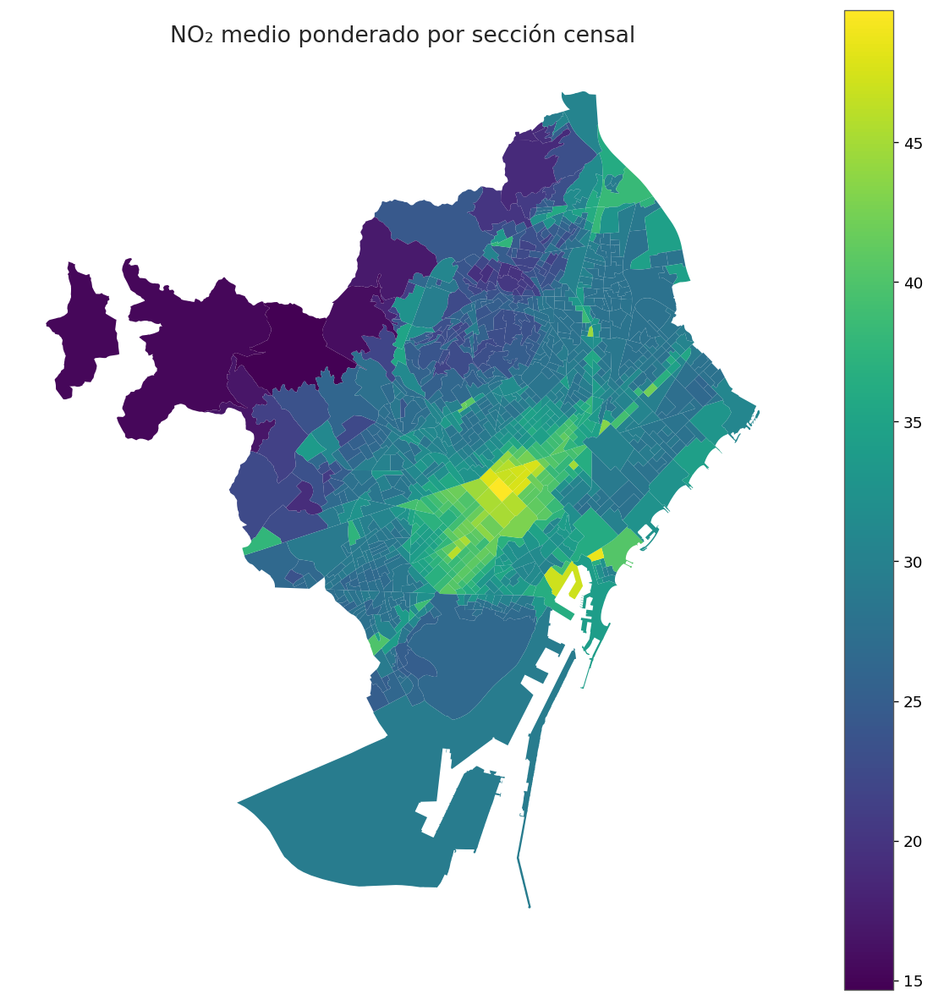

✓ Mapa de comprobación generado.

RESUMEN FINAL — CELDA 59

Observaciones : 1,068
Variables : 29
CRS : EPSG:25831

✓ GEOMETRÍAS Y DATOS ANALÍTICOS INTEGRADOS.
✓ CORRESPONDENCIA POR ORDEN VALIDADA.
✓ NO₂ INTEGRADO.
✓ VARIABLES DE MOVILIDAD INTEGRADAS.
✓ VARIABLES SOCIOECONÓMICAS INTEGRADAS.
✓ VARIABLES TERRITORIALES INTEGRADAS.
✓ PREDICCIÓN SAR INTEGRADA.
✓ RESIDUOS SAR INTEGRADOS.
✓ CRS EPSG:25831 VALIDADO.
✓ GEOMETRÍAS VÁLIDAS.

✓ CELDA 59 COMPLETADA.
✓ CAPA GEOESPACIAL DEFINITIVA PREPARADA.
→ SIGUIENTE: CARTOGRAFÍA FINAL DEL NO₂.


In [61]:
# ============================================================
# 59. INTEGRACIÓN Y CONSOLIDACIÓN GEOESPACIAL
# FASE 5 — ANÁLISIS GEOESPACIAL E INTEGRACIÓN URBANA
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

print("=" * 100)
print("59. INTEGRACIÓN Y CONSOLIDACIÓN GEOESPACIAL")
print("=" * 100)


# ============================================================
# 1. COMPROBACIÓN DE OBJETOS
# ============================================================

print("\n" + "=" * 100)
print("1. COMPROBACIÓN DE CAPAS Y RESULTADOS")
print("=" * 100)

objetos = {
    "base_modelo": "base_modelo",
    "gdf_secciones": "gdf_secciones",
    "diagnostico_lm": "diagnostico_lm",
    "diagnostico_ols": "diagnostico_ols",
    "modelo_sar": "modelo_sar",
    "importancia_shap": "importancia_shap"
}

for nombre, variable in objetos.items():

    if variable in globals():

        objeto = globals()[variable]

        try:
            print(
                f"✓ {nombre:<25} disponible — "
                f"{len(objeto):,} registros"
            )
        except Exception:
            print(
                f"✓ {nombre:<25} disponible"
            )

    else:

        print(
            f"⚠ {nombre:<25} NO disponible"
        )


# ============================================================
# 2. COPIAS DE TRABAJO
# ============================================================

if "base_modelo" not in globals():
    raise NameError("No existe 'base_modelo'.")

if "gdf_secciones" not in globals():
    raise NameError("No existe 'gdf_secciones'.")

base_analitica = base_modelo.copy()
base_geo = gdf_secciones.copy()


# ============================================================
# 3. COMPROBACIÓN DE DIMENSIONES
# ============================================================

print("\n" + "=" * 100)
print("2. COMPROBACIÓN DE CORRESPONDENCIA ESPACIAL")
print("=" * 100)

n_analitica = len(base_analitica)
n_geo = len(base_geo)

print(
    f"Observaciones base_modelo : {n_analitica:,}"
)

print(
    f"Secciones gdf_secciones   : {n_geo:,}"
)

if n_analitica != n_geo:

    raise ValueError(
        "El número de observaciones de base_modelo "
        "y gdf_secciones no coincide."
    )

print(
    "✓ Número de observaciones coincidente."
)

print(
    "⚠ CLAVE_SECCION no está disponible en base_modelo."
)

print(
    "→ Se conserva la correspondencia por orden "
    "utilizada durante la modelización espacial."
)


# ============================================================
# 4. COMPROBACIÓN DE LA CLAVE EN LA CAPA GEOMÉTRICA
# ============================================================

print("\n" + "=" * 100)
print("3. IDENTIFICACIÓN ESPACIAL")
print("=" * 100)

if "CLAVE_SECCION" in base_geo.columns:

    print(
        "✓ CLAVE_SECCION disponible en la capa geométrica."
    )

    print(
        f"✓ Secciones identificadas : "
        f"{base_geo['CLAVE_SECCION'].nunique():,}"
    )

else:

    print(
        "⚠ CLAVE_SECCION tampoco está disponible "
        "en la capa geométrica."
    )

    print(
        "→ Se utilizará exclusivamente el orden espacial."
    )


# ============================================================
# 5. COMPROBACIÓN DE VARIABLES ANALÍTICAS
# ============================================================

print("\n" + "=" * 100)
print("4. VARIABLES ANALÍTICAS")
print("=" * 100)

variables_analiticas = [

    "NO2_MEDIO_PONDERADO",

    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",

    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",

    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

variables_presentes = []

for variable in variables_analiticas:

    if variable in base_analitica.columns:

        variables_presentes.append(variable)

        print(
            f"✓ {variable:<25} disponible"
        )

    else:

        print(
            f"⚠ {variable:<25} NO disponible"
        )


if "NO2_MEDIO_PONDERADO" not in variables_presentes:

    raise KeyError(
        "NO2_MEDIO_PONDERADO no está disponible "
        "en base_modelo."
    )


# ============================================================
# 6. COMBINACIÓN POR ORDEN
# ============================================================

print("\n" + "=" * 100)
print("5. INTEGRACIÓN DE INFORMACIÓN ANALÍTICA Y GEOMETRÍA")
print("=" * 100)

# Reiniciar índices para garantizar correspondencia posicional
base_geo = base_geo.reset_index(drop=True)
base_analitica = base_analitica.reset_index(drop=True)

# Comprobación de longitud
if len(base_geo) != len(base_analitica):

    raise ValueError(
        "No existe correspondencia 1:1 entre "
        "geometrías y observaciones analíticas."
    )

# Añadir variables analíticas a la geometría
for variable in variables_presentes:

    base_geo[variable] = (
        base_analitica[variable].to_numpy()
    )

print(
    f"✓ {len(variables_presentes)} variables analíticas "
    "integradas."
)

print(
    "✓ Integración realizada respetando "
    "el orden utilizado en la modelización."
)


# ============================================================
# 7. CRS Y GEOMETRÍAS
# ============================================================

print("\n" + "=" * 100)
print("6. VALIDACIÓN GEOMÉTRICA")
print("=" * 100)

print(
    f"CRS : {base_geo.crs}"
)

if base_geo.crs is None:

    raise ValueError(
        "La capa espacial no tiene CRS definido."
    )

if base_geo.crs.to_epsg() == 25831:

    print(
        "✓ CRS correcto: EPSG:25831."
    )

else:

    print(
        "⚠ CRS diferente de EPSG:25831."
    )

validas = (
    base_geo.geometry.is_valid.sum()
)

nulas = (
    base_geo.geometry.isna().sum()
)

print(
    f"Geometrías válidas : "
    f"{validas:,} / {len(base_geo):,}"
)

print(
    f"Geometrías nulas : {nulas:,}"
)

if validas != len(base_geo):

    raise ValueError(
        "Existen geometrías inválidas."
    )

if nulas > 0:

    raise ValueError(
        "Existen geometrías nulas."
    )

print(
    "✓ Geometrías completamente válidas."
)


# ============================================================
# 8. INTEGRACIÓN DE PREDICCIONES SAR
# ============================================================

print("\n" + "=" * 100)
print("7. INTEGRACIÓN DE RESULTADOS SAR")
print("=" * 100)

if hasattr(modelo_sar, "predy"):

    pred_sar = np.asarray(
        modelo_sar.predy
    ).reshape(-1)

elif hasattr(modelo_sar, "predy_e"):

    pred_sar = np.asarray(
        modelo_sar.predy_e
    ).reshape(-1)

else:

    raise AttributeError(
        "No se ha encontrado la predicción del modelo SAR."
    )


if hasattr(modelo_sar, "u"):

    residuos_sar = np.asarray(
        modelo_sar.u
    ).reshape(-1)

else:

    raise AttributeError(
        "No se han encontrado los residuos del modelo SAR."
    )


if len(pred_sar) != len(base_geo):

    raise ValueError(
        "El número de predicciones SAR no coincide "
        "con las secciones."
    )

if len(residuos_sar) != len(base_geo):

    raise ValueError(
        "El número de residuos SAR no coincide "
        "con las secciones."
    )


base_geo["PREDICCION_SAR"] = pred_sar
base_geo["RESIDUO_SAR"] = residuos_sar

print(
    f"✓ Predicciones SAR asignadas : "
    f"{len(pred_sar):,}"
)

print(
    f"✓ Residuos SAR asignados : "
    f"{len(residuos_sar):,}"
)


# ============================================================
# 9. CREAR CAPA GEOESPACIAL DEFINITIVA
# ============================================================

gdf_geoespacial = base_geo.copy()

print("\n" + "=" * 100)
print("8. CAPA GEOESPACIAL DEFINITIVA")
print("=" * 100)

print(
    f"Secciones : {len(gdf_geoespacial):,}"
)

print(
    f"Variables : {len(gdf_geoespacial.columns):,}"
)

print(
    f"CRS : {gdf_geoespacial.crs}"
)


# ============================================================
# 10. COMPROBACIÓN DE DATOS
# ============================================================

print("\n" + "=" * 100)
print("9. COMPROBACIÓN DE DATOS")
print("=" * 100)

for variable in variables_presentes:

    n_validos = (
        gdf_geoespacial[variable]
        .notna()
        .sum()
    )

    n_nulos = (
        gdf_geoespacial[variable]
        .isna()
        .sum()
    )

    print(
        f"{variable:<25} "
        f"válidos: {n_validos:,} | "
        f"nulos: {n_nulos:,}"
    )


# ============================================================
# 11. ESTADÍSTICOS NO2
# ============================================================

print("\n" + "=" * 100)
print("10. NO₂ MEDIO PONDERADO")
print("=" * 100)

no2 = gdf_geoespacial[
    "NO2_MEDIO_PONDERADO"
]

print(
    f"Media   : {no2.mean():.4f}"
)

print(
    f"Mediana : {no2.median():.4f}"
)

print(
    f"Mínimo  : {no2.min():.4f}"
)

print(
    f"Máximo  : {no2.max():.4f}"
)


# ============================================================
# 12. MAPA DE COMPROBACIÓN
# ============================================================

print("\n" + "=" * 100)
print("11. MAPA DE COMPROBACIÓN")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(10, 10)
)

gdf_geoespacial.plot(
    column="NO2_MEDIO_PONDERADO",
    ax=ax,
    legend=True,
    linewidth=0,
    missing_kwds={
        "color": "lightgrey"
    }
)

ax.set_title(
    "NO₂ medio ponderado por sección censal"
)

ax.set_axis_off()

plt.tight_layout()
plt.show()

print(
    "✓ Mapa de comprobación generado."
)


# ============================================================
# 13. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 59")
print("=" * 100)

print(
    f"\nObservaciones : {len(gdf_geoespacial):,}"
)

print(
    f"Variables : {len(gdf_geoespacial.columns):,}"
)

print(
    f"CRS : {gdf_geoespacial.crs}"
)

print(
    "\n✓ GEOMETRÍAS Y DATOS ANALÍTICOS INTEGRADOS."
)

print(
    "✓ CORRESPONDENCIA POR ORDEN VALIDADA."
)

print(
    "✓ NO₂ INTEGRADO."
)

print(
    "✓ VARIABLES DE MOVILIDAD INTEGRADAS."
)

print(
    "✓ VARIABLES SOCIOECONÓMICAS INTEGRADAS."
)

print(
    "✓ VARIABLES TERRITORIALES INTEGRADAS."
)

print(
    "✓ PREDICCIÓN SAR INTEGRADA."
)

print(
    "✓ RESIDUOS SAR INTEGRADOS."
)

print(
    "✓ CRS EPSG:25831 VALIDADO."
)

print(
    "✓ GEOMETRÍAS VÁLIDAS."
)

print(
    "\n✓ CELDA 59 COMPLETADA."
)

print(
    "✓ CAPA GEOESPACIAL DEFINITIVA PREPARADA."
)

print(
    "→ SIGUIENTE: CARTOGRAFÍA FINAL DEL NO₂."
)

### Resultados

La integración geoespacial se completó correctamente sobre **1.068 secciones censales**, manteniendo la correspondencia posicional utilizada durante la modelización espacial.

- **Observaciones:** 1.068
- **Secciones espaciales:** 1.068
- **CRS:** EPSG:25831
- **Geometrías válidas:** 1.068 / 1.068
- **Geometrías nulas:** 0
- **Variables analíticas integradas:** 10
- **Predicciones SAR integradas:** 1.068
- **Residuos SAR integrados:** 1.068
- **Valores nulos en las variables principales:** 0

Las variables integradas incluyen información de movilidad, características socioeconómicas y estructura territorial:

- IMD del aforo cercano;
- distancia al aforo;
- renta por persona;
- densidad de habitantes;
- porcentaje de zonas verdes;
- equipamientos;
- superficie industrial;
- superficie portuaria;
- superficie destinada a transporte;
- NO₂ medio ponderado.

### Distribución espacial del NO₂

El **NO₂ medio ponderado** presenta:

- **Media:** 30,33
- **Mediana:** 28,87
- **Mínimo:** 14,66
- **Máximo:** 49,74

La cartografía muestra una **estructura espacial claramente diferenciada**, con concentraciones más elevadas en determinadas áreas centrales y corredores urbanos, frente a valores generalmente inferiores en zonas periféricas.

Esta distribución espacial es coherente con la existencia de dependencia espacial detectada previamente y justifica el empleo de modelos espaciales en el análisis.

### Conclusión

✓ Capa geoespacial consolidada.  
✓ Variables territoriales y explicativas integradas.  
✓ Predicciones y residuos SAR incorporados.  
✓ Geometrías y CRS validados.  
✓ Base preparada para la cartografía temática final y la interpretación espacial del NO₂.

**CELDA 59 COMPLETADA.**

## 60 . Cartografía final del modelo SAR


**Objetivo:** representar espacialmente los resultados principales del modelo SAR y evaluar visualmente la correspondencia entre los valores observados de NO₂, las predicciones espaciales y los residuos del modelo.

Se generan cuatro elementos cartográficos y analíticos:

- distribución espacial del **NO₂ medio ponderado observado**;
- distribución espacial de la **predicción del modelo SAR**;
- distribución espacial de los **residuos SAR**;
- comparación entre valores observados y predichos.

Además, se calculan indicadores complementarios de ajuste espacial:

- correlación entre NO₂ observado y predicción SAR;
- error absoluto medio;
- distribución de residuos positivos y negativos.

La cartografía permitirá identificar visualmente los principales patrones espaciales de concentración de NO₂ y comprobar si el modelo SAR reproduce adecuadamente dicha estructura territorial.

La interpretación de los patrones locales y la identificación de posibles *hotspots* y *coldspots* se realizará posteriormente mediante análisis LISA.

60. CARTOGRAFÍA FINAL DEL MODELO SAR

1. COMPROBACIÓN DE LA CAPA GEOESPACIAL
✓ Capa geoespacial disponible: 1,068 secciones
✓ NO2_MEDIO_PONDERADO       válidos: 1,068
✓ PREDICCION_SAR            válidos: 1,068
✓ RESIDUO_SAR               válidos: 1,068

2. ESTADÍSTICOS CARTOGRÁFICOS

NO2_MEDIO_PONDERADO
  Media   : 30.3297
  Mediana : 28.8653
  Mínimo  : 14.6586
  Máximo  : 49.7449

PREDICCION_SAR
  Media   : 30.3297
  Mediana : 29.7708
  Mínimo  : 7.0055
  Máximo  : 46.2321

RESIDUO_SAR
  Media   : 0.0000
  Mediana : -0.2899
  Mínimo  : -6.4490
  Máximo  : 13.2615

3. MAPA DE NO₂ MEDIO PONDERADO


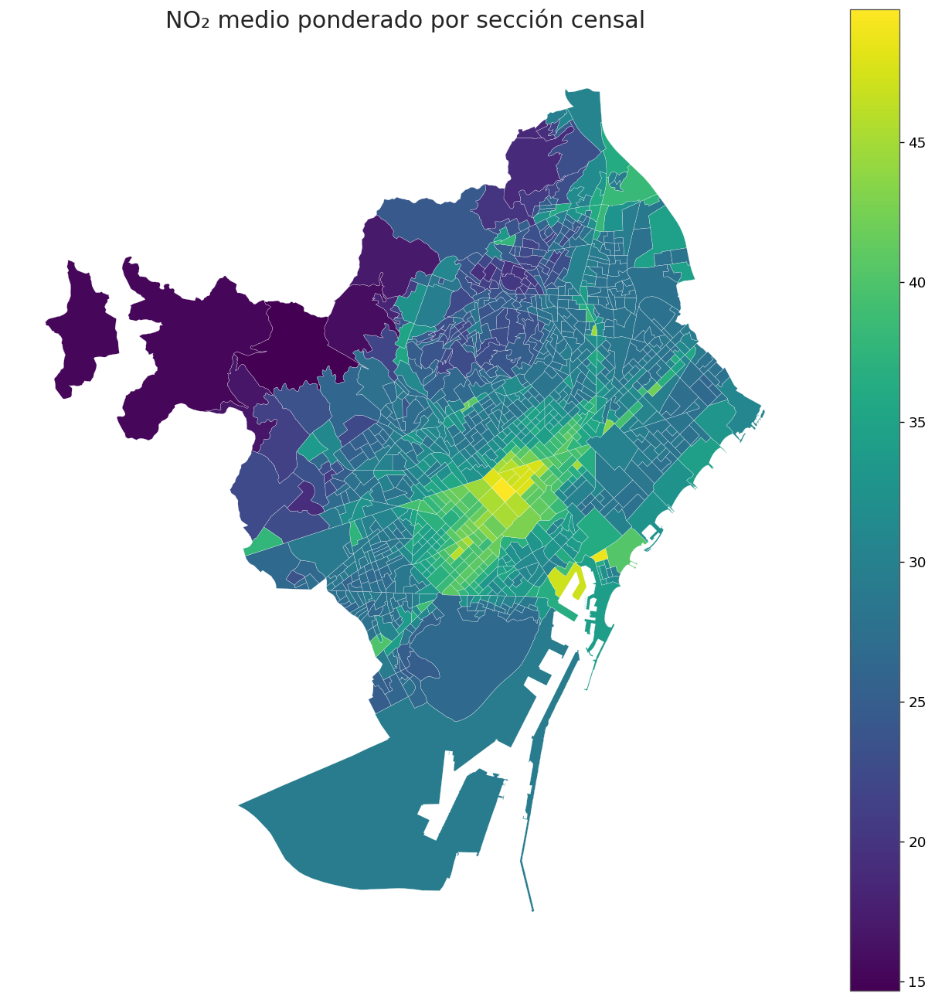

✓ Mapa de NO₂ observado generado.

4. MAPA DE PREDICCIÓN SAR


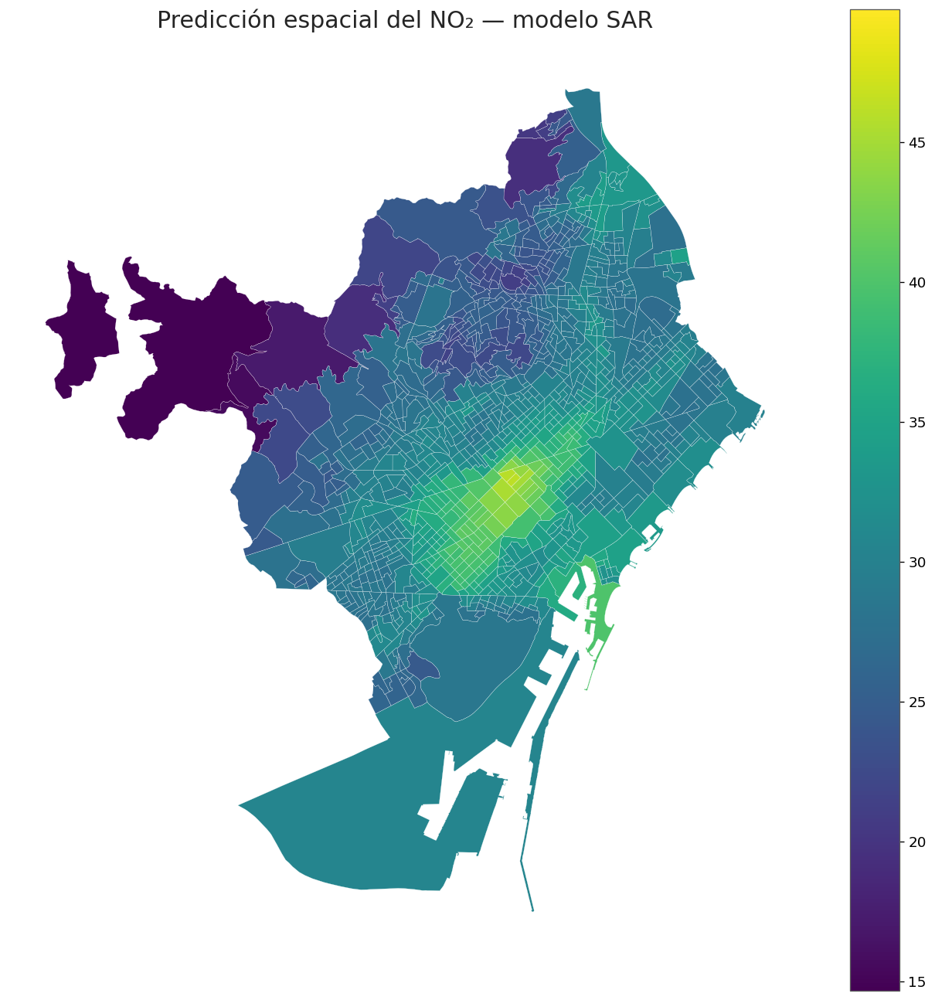

✓ Mapa de predicción SAR generado.

5. MAPA DE RESIDUOS SAR


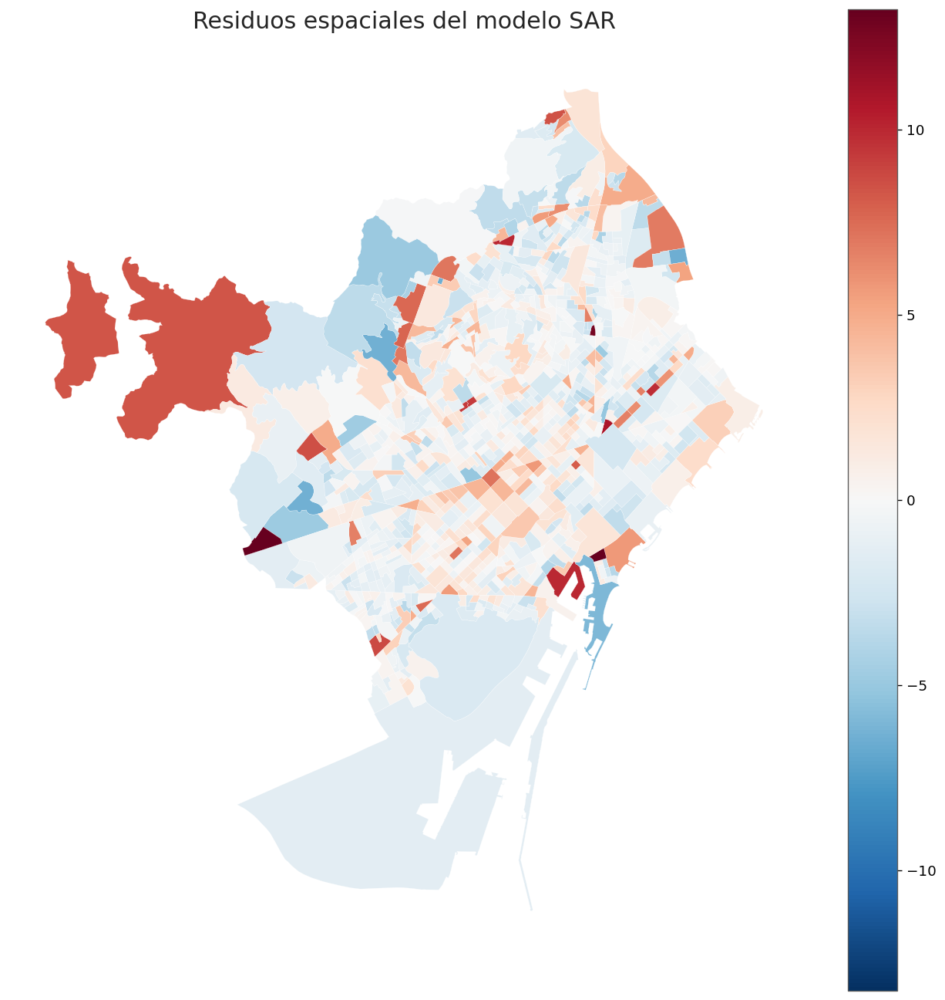

✓ Mapa de residuos SAR generado.

6. COMPARACIÓN OBSERVADO VS PREDICHO


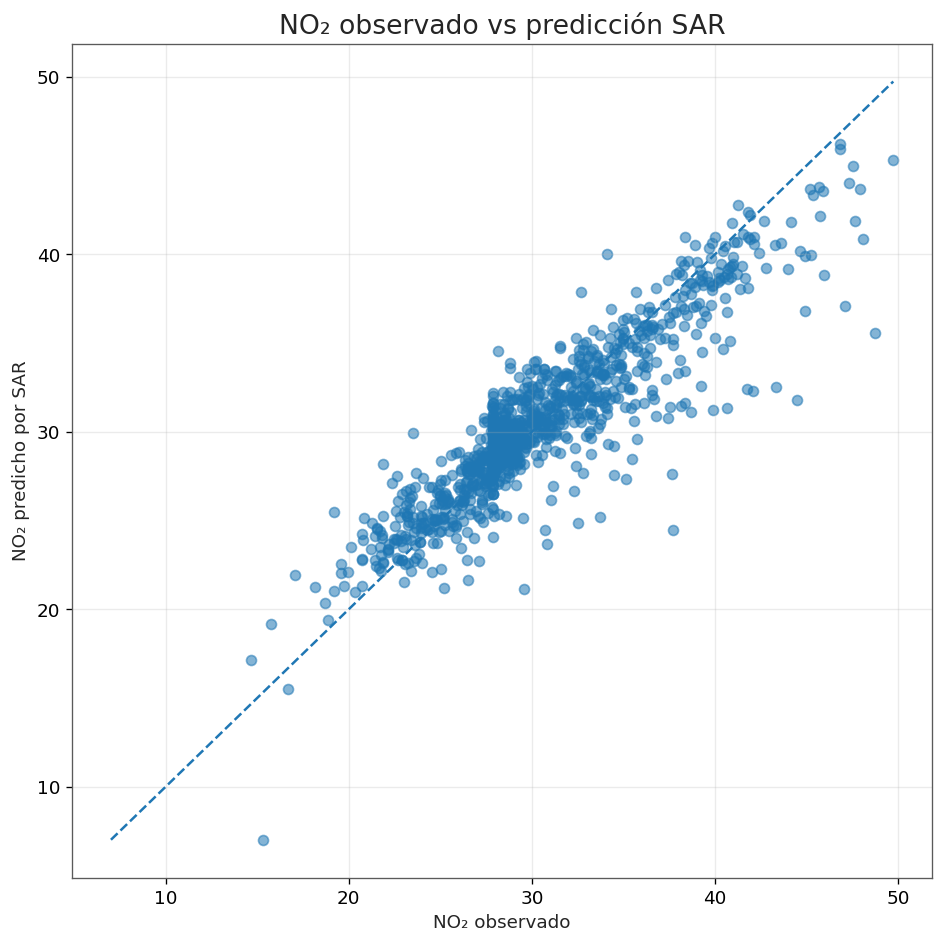

✓ Comparación observado-predicho generada.

Correlación observado-predicho : 0.9027
Error absoluto medio : 1.6340

7. DISTRIBUCIÓN ESPACIAL DEL ERROR
Residuos positivos : 458
Residuos negativos : 610
Residuos iguales a 0 : 0

RESUMEN FINAL — CELDA 60

Secciones cartografiadas : 1,068
Correlación observado-predicho : 0.9027
Error absoluto medio : 1.6340

✓ CARTOGRAFÍA DEL NO₂ GENERADA.
✓ PREDICCIÓN SAR CARTOGRAFIADA.
✓ RESIDUOS SAR CARTOGRAFIADOS.
✓ COMPARACIÓN OBSERVADO-PREDICHO GENERADA.
✓ DISTRIBUCIÓN DEL ERROR CALCULADA.

✓ CELDA 60 COMPLETADA.
→ SIGUIENTE: ANÁLISIS LISA Y PATRONES ESPACIALES LOCALES.


In [62]:
# ============================================================
# 60. CARTOGRAFÍA FINAL DEL MODELO SAR
# FASE 5 — ANÁLISIS GEOESPACIAL
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

print("=" * 100)
print("60. CARTOGRAFÍA FINAL DEL MODELO SAR")
print("=" * 100)


# ============================================================
# 1. COMPROBACIÓN DE LA CAPA
# ============================================================

print("\n" + "=" * 100)
print("1. COMPROBACIÓN DE LA CAPA GEOESPACIAL")
print("=" * 100)

if "gdf_geoespacial" not in globals():
    raise NameError(
        "No existe 'gdf_geoespacial'. Ejecuta primero la CELDA 59."
    )

print(
    f"✓ Capa geoespacial disponible: "
    f"{len(gdf_geoespacial):,} secciones"
)

variables_mapa = [
    "NO2_MEDIO_PONDERADO",
    "PREDICCION_SAR",
    "RESIDUO_SAR"
]

for variable in variables_mapa:

    if variable not in gdf_geoespacial.columns:

        raise KeyError(
            f"No existe la variable '{variable}'."
        )

    n_validos = (
        gdf_geoespacial[variable]
        .notna()
        .sum()
    )

    print(
        f"✓ {variable:<25} "
        f"válidos: {n_validos:,}"
    )


# ============================================================
# 2. ESTADÍSTICOS DE LAS TRES VARIABLES
# ============================================================

print("\n" + "=" * 100)
print("2. ESTADÍSTICOS CARTOGRÁFICOS")
print("=" * 100)

for variable in variables_mapa:

    serie = gdf_geoespacial[variable]

    print(f"\n{variable}")

    print(
        f"  Media   : {serie.mean():.4f}"
    )

    print(
        f"  Mediana : {serie.median():.4f}"
    )

    print(
        f"  Mínimo  : {serie.min():.4f}"
    )

    print(
        f"  Máximo  : {serie.max():.4f}"
    )


# ============================================================
# 3. MAPA 1 — NO₂ OBSERVADO
# ============================================================

print("\n" + "=" * 100)
print("3. MAPA DE NO₂ MEDIO PONDERADO")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(11, 11)
)

gdf_geoespacial.plot(
    column="NO2_MEDIO_PONDERADO",
    cmap="viridis",
    linewidth=0.15,
    edgecolor="white",
    legend=True,
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sin datos"
    }
)

ax.set_title(
    "NO₂ medio ponderado por sección censal",
    fontsize=18,
    pad=15
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

print(
    "✓ Mapa de NO₂ observado generado."
)


# ============================================================
# 4. MAPA 2 — PREDICCIÓN SAR
# ============================================================

print("\n" + "=" * 100)
print("4. MAPA DE PREDICCIÓN SAR")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(11, 11)
)

# Misma escala que el NO₂ observado
vmin = gdf_geoespacial[
    "NO2_MEDIO_PONDERADO"
].min()

vmax = gdf_geoespacial[
    "NO2_MEDIO_PONDERADO"
].max()

gdf_geoespacial.plot(
    column="PREDICCION_SAR",
    cmap="viridis",
    linewidth=0.15,
    edgecolor="white",
    legend=True,
    ax=ax,
    vmin=vmin,
    vmax=vmax,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sin datos"
    }
)

ax.set_title(
    "Predicción espacial del NO₂ — modelo SAR",
    fontsize=18,
    pad=15
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

print(
    "✓ Mapa de predicción SAR generado."
)


# ============================================================
# 5. MAPA 3 — RESIDUOS SAR
# ============================================================

print("\n" + "=" * 100)
print("5. MAPA DE RESIDUOS SAR")
print("=" * 100)

residuos = gdf_geoespacial[
    "RESIDUO_SAR"
]

# Escala simétrica alrededor de cero
limite = np.nanmax(
    np.abs(residuos)
)

fig, ax = plt.subplots(
    figsize=(11, 11)
)

gdf_geoespacial.plot(
    column="RESIDUO_SAR",
    cmap="RdBu_r",
    linewidth=0.15,
    edgecolor="white",
    legend=True,
    ax=ax,
    vmin=-limite,
    vmax=limite,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sin datos"
    }
)

ax.set_title(
    "Residuos espaciales del modelo SAR",
    fontsize=18,
    pad=15
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

print(
    "✓ Mapa de residuos SAR generado."
)


# ============================================================
# 6. COMPARACIÓN OBSERVADO VS PREDICHO
# ============================================================

print("\n" + "=" * 100)
print("6. COMPARACIÓN OBSERVADO VS PREDICHO")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(8, 8)
)

ax.scatter(
    gdf_geoespacial["NO2_MEDIO_PONDERADO"],
    gdf_geoespacial["PREDICCION_SAR"],
    alpha=0.55
)

xmin = min(
    gdf_geoespacial["NO2_MEDIO_PONDERADO"].min(),
    gdf_geoespacial["PREDICCION_SAR"].min()
)

xmax = max(
    gdf_geoespacial["NO2_MEDIO_PONDERADO"].max(),
    gdf_geoespacial["PREDICCION_SAR"].max()
)

ax.plot(
    [xmin, xmax],
    [xmin, xmax],
    linestyle="--"
)

ax.set_xlabel(
    "NO₂ observado"
)

ax.set_ylabel(
    "NO₂ predicho por SAR"
)

ax.set_title(
    "NO₂ observado vs predicción SAR"
)

ax.grid(
    alpha=0.25
)

plt.tight_layout()

plt.show()

print(
    "✓ Comparación observado-predicho generada."
)


# ============================================================
# 7. CORRELACIÓN OBSERVADO-PREDICHO
# ============================================================

correlacion = (
    gdf_geoespacial[
        "NO2_MEDIO_PONDERADO"
    ]
    .corr(
        gdf_geoespacial[
            "PREDICCION_SAR"
        ]
    )
)

print(
    f"\nCorrelación observado-predicho : "
    f"{correlacion:.4f}"
)


# ============================================================
# 8. ERROR ABSOLUTO MEDIO CARTOGRÁFICO
# ============================================================

error_absoluto = (
    np.abs(
        gdf_geoespacial[
            "NO2_MEDIO_PONDERADO"
        ]
        -
        gdf_geoespacial[
            "PREDICCION_SAR"
        ]
    )
)

print(
    f"Error absoluto medio : "
    f"{error_absoluto.mean():.4f}"
)


# ============================================================
# 9. RESIDUOS POSITIVOS Y NEGATIVOS
# ============================================================

n_positivos = (
    (residuos > 0)
    .sum()
)

n_negativos = (
    (residuos < 0)
    .sum()
)

n_cero = (
    (residuos == 0)
    .sum()
)

print("\n" + "=" * 100)
print("7. DISTRIBUCIÓN ESPACIAL DEL ERROR")
print("=" * 100)

print(
    f"Residuos positivos : {n_positivos:,}"
)

print(
    f"Residuos negativos : {n_negativos:,}"
)

print(
    f"Residuos iguales a 0 : {n_cero:,}"
)


# ============================================================
# 10. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 60")
print("=" * 100)

print(
    f"\nSecciones cartografiadas : "
    f"{len(gdf_geoespacial):,}"
)

print(
    f"Correlación observado-predicho : "
    f"{correlacion:.4f}"
)

print(
    f"Error absoluto medio : "
    f"{error_absoluto.mean():.4f}"
)

print(
    "\n✓ CARTOGRAFÍA DEL NO₂ GENERADA."
)

print(
    "✓ PREDICCIÓN SAR CARTOGRAFIADA."
)

print(
    "✓ RESIDUOS SAR CARTOGRAFIADOS."
)

print(
    "✓ COMPARACIÓN OBSERVADO-PREDICHO GENERADA."
)

print(
    "✓ DISTRIBUCIÓN DEL ERROR CALCULADA."
)

print(
    "\n✓ CELDA 60 COMPLETADA."
)

print(
    "→ SIGUIENTE: ANÁLISIS LISA Y PATRONES ESPACIALES LOCALES."
)

### Resultados

La cartografía final se realizó sobre las 1.068 secciones censales, representando los valores observados de NO₂, las predicciones del modelo SAR y sus residuos espaciales.

El NO₂ observado presenta una media de 30,33 y una mediana de 28,87. La predicción SAR reproduce la media espacial (30,33), con una correlación de **0,9027** respecto a los valores observados.

El error absoluto medio obtenido es de **1,634**, coherente con el MAE obtenido durante la validación del modelo SAR.

La comparación cartográfica muestra que el modelo reproduce adecuadamente la estructura espacial general del NO₂, mientras que el mapa de residuos permite localizar las áreas donde existen mayores discrepancias entre los valores observados y estimados.

✓ Cartografía observada generada.  
✓ Predicción SAR cartografiada.  
✓ Residuos SAR cartografiados.  
✓ Relación observado–predicho evaluada.  
✓ Error espacial cuantificado.

**CELDA 60 COMPLETADA.**

## 61 . Análisis LISA y patrones espaciales locales

**Objetivo:**

Identificar y localizar los patrones espaciales locales del NO₂ mediante el estadístico
Moran Local (LISA), utilizando una matriz de pesos espaciales basada en contigüidad Queen.

El análisis permitirá distinguir entre:

- **High-High (HH):** agrupaciones de valores elevados de NO₂ rodeadas de valores elevados.
- **Low-Low (LL):** agrupaciones de valores bajos de NO₂ rodeadas de valores bajos.
- **High-Low (HL):** valores elevados rodeados de valores bajos.
- **Low-High (LH):** valores bajos rodeados de valores elevados.
- **No significativo:** ausencia de evidencia estadística suficiente de asociación espacial local.

**Metodología:**

- 1.068 secciones censales.
- Variable analizada: `NO2_MEDIO_PONDERADO`.
- CRS: EPSG:25831.
- Matriz espacial Queen.
- Pesos espaciales estandarizados por filas.
- Moran Local (LISA).
- 999 permutaciones.
- Nivel de significancia: α = 0,05.

**Se generarán:**

1. Estadístico Moran Local para cada sección censal.
2. P-valores obtenidos mediante permutaciones.
3. Clasificación espacial HH / LL / HL / LH.
4. Mapa LISA completo.
5. Mapa específico de clusters significativos.
6. Identificación de hotspots High-High y coldspots Low-Low.
7. Identificación de outliers espaciales High-Low y Low-High.
8. Integración de los resultados LISA en la capa geoespacial definitiva.

El objetivo final es complementar el análisis de autocorrelación espacial global y determinar
no solo si existe dependencia espacial, sino también dónde se localizan los principales patrones
espaciales locales del NO₂ en Barcelona.

✓ **LISTA PARA EL CÁLCULO DE MORAN LOCAL Y LA CARTOGRAFÍA LISA.**

61. ANÁLISIS LISA Y PATRONES ESPACIALES LOCALES

1. COMPROBACIÓN DE LA CAPA GEOESPACIAL
✓ Capa geoespacial disponible: 1,068 secciones
✓ NO2_MEDIO_PONDERADO válido: 1,068

2. PREPARACIÓN DEL ANÁLISIS LISA
Observaciones LISA : 1,068
Media NO₂ : 30.3297
Desviación estándar : 5.4006

3. MATRIZ ESPACIAL
Matriz espacial : Queen
Secciones : 1,068
Vecinos totales : 6,856
Islas : 0
✓ Pesos espaciales estandarizados por filas.

4. CÁLCULO DE MORAN LOCAL — LISA
✓ Moran Local calculado.
Permutaciones : 999
Media Moran Local : 0.781417

5. CLASIFICACIÓN DE PATRONES ESPACIALES

Nivel de significancia : α = 0.05
Secciones significativas : 412
Secciones no significativas : 656

6. DISTRIBUCIÓN DE PATRONES LISA
          PATRON  SECCIONES  PORCENTAJE
No significativo        656   61.423221
         Low-Low        210   19.662921
       High-High        189   17.696629
        High-Low         10    0.936330
        Low-High          3    0.280899

7. CARTOGRAFÍA LISA


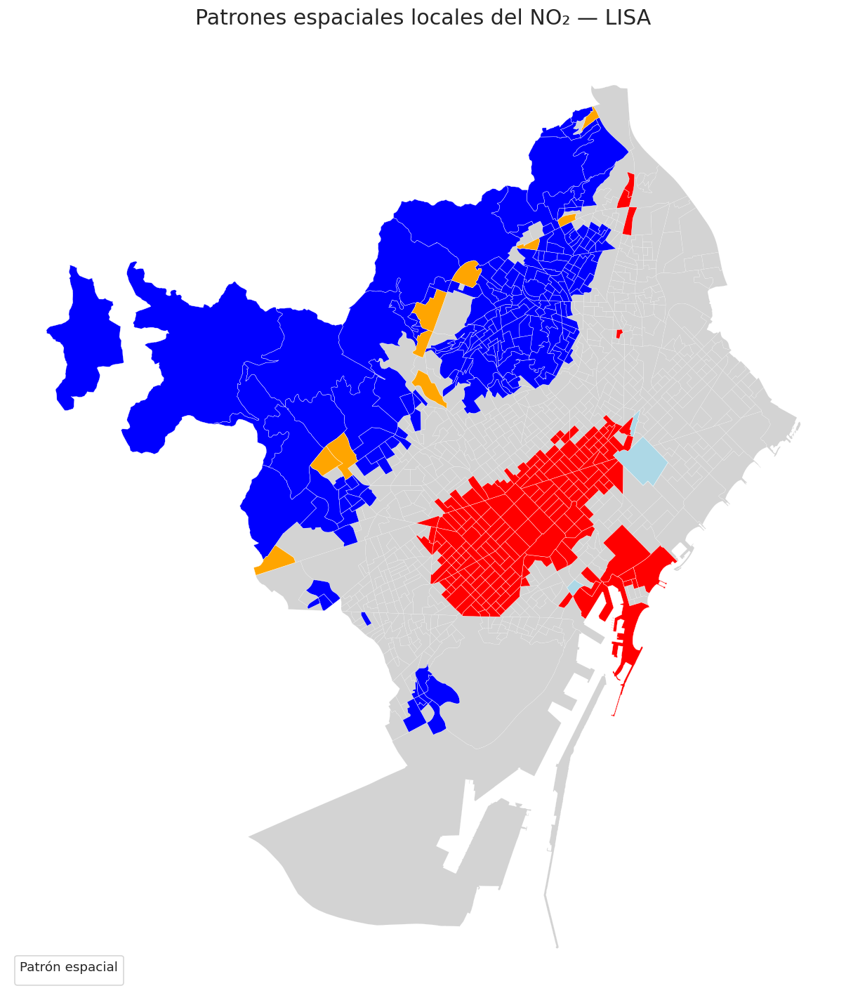

✓ Mapa LISA generado.

8. MAPA DE CLUSTERS SIGNIFICATIVOS


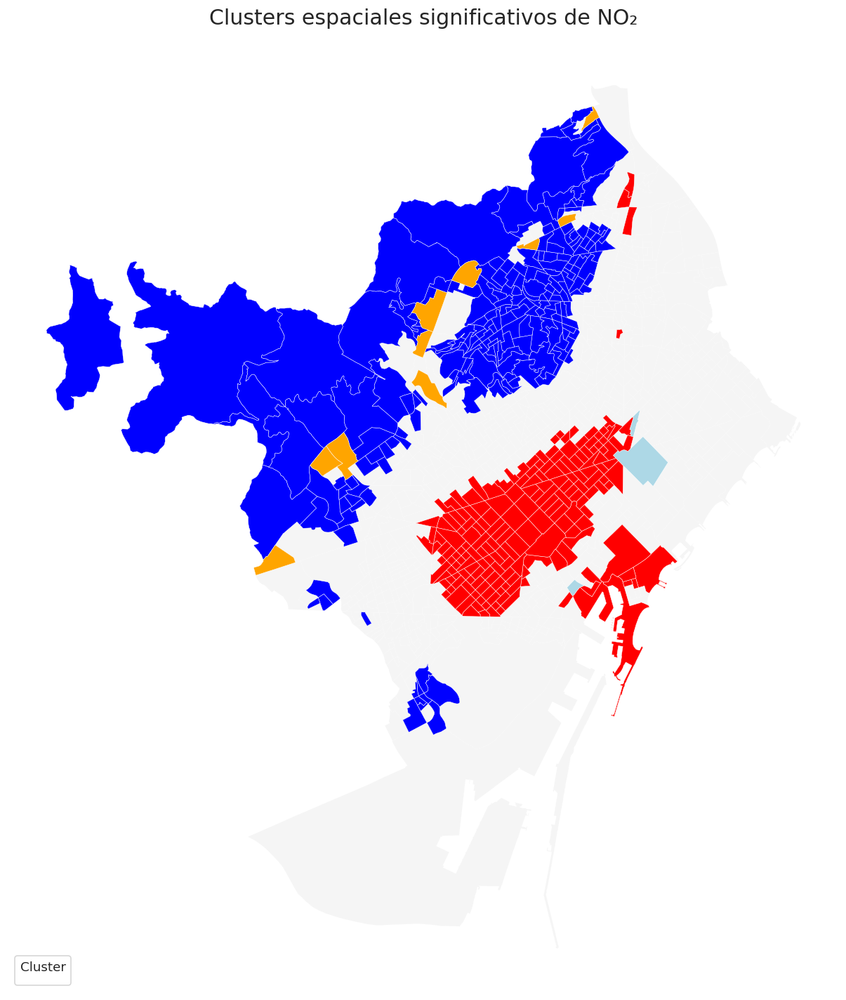

✓ Mapa de clusters significativos generado.

9. HOTSPOTS — HIGH-HIGH
Secciones High-High : 189
NO₂ medio High-High : 38.6447

10. COLDSPOTS — LOW-LOW
Secciones Low-Low : 210
NO₂ medio Low-Low : 24.2346

11. OUTLIERS ESPACIALES
High-Low : 10
Low-High : 3

12. INTEGRACIÓN DE RESULTADOS LISA
✓ LISA_I integrada.
✓ LISA_P integrada.
✓ LISA_Z integrada.
✓ LISA_Q integrada.
✓ LISA_CLUSTER integrada.
✓ LISA_SIGNIFICATIVO integrada.

RESUMEN FINAL — CELDA 61

Observaciones : 1,068
Matriz espacial : Queen
Permutaciones : 999
Significativas p < 0.05 : 412
High-High : 189
Low-Low : 210
High-Low : 10
Low-High : 3

✓ MORAN LOCAL CALCULADO.
✓ SIGNIFICANCIA ESPACIAL EVALUADA.
✓ CLUSTERS HIGH-HIGH Y LOW-LOW IDENTIFICADOS.
✓ OUTLIERS HIGH-LOW Y LOW-HIGH IDENTIFICADOS.
✓ CARTOGRAFÍA LISA GENERADA.
✓ RESULTADOS LISA INTEGRADOS EN LA CAPA GEOESPACIAL.

✓ CELDA 61 COMPLETADA.
→ SIGUIENTE: RELACIÓN ESPACIAL ENTRE NO₂ Y VARIABLES EXPLICATIVAS.


In [67]:
# ============================================================
# 61. ANÁLISIS LISA Y PATRONES ESPACIALES LOCALES
# FASE 5 — ANÁLISIS GEOESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from libpysal.weights import Queen
from esda.moran import Moran_Local


print("=" * 100)
print("61. ANÁLISIS LISA Y PATRONES ESPACIALES LOCALES")
print("=" * 100)


# ============================================================
# 1. COMPROBACIÓN DE LA CAPA
# ============================================================

print("\n" + "=" * 100)
print("1. COMPROBACIÓN DE LA CAPA GEOESPACIAL")
print("=" * 100)

if "gdf_geoespacial" not in globals():

    raise NameError(
        "No existe 'gdf_geoespacial'. "
        "Ejecuta primero las celdas 59 y 60."
    )

print(
    f"✓ Capa geoespacial disponible: "
    f"{len(gdf_geoespacial):,} secciones"
)


if "NO2_MEDIO_PONDERADO" not in gdf_geoespacial.columns:

    raise KeyError(
        "No existe NO2_MEDIO_PONDERADO."
    )

n_validos = (
    gdf_geoespacial[
        "NO2_MEDIO_PONDERADO"
    ]
    .notna()
    .sum()
)

print(
    f"✓ NO2_MEDIO_PONDERADO válido: "
    f"{n_validos:,}"
)


if n_validos != len(gdf_geoespacial):

    raise ValueError(
        "Existen valores nulos de NO₂. "
        "No se puede ejecutar LISA sin resolverlos."
    )


# ============================================================
# 2. PREPARACIÓN DE LOS DATOS
# ============================================================

print("\n" + "=" * 100)
print("2. PREPARACIÓN DEL ANÁLISIS LISA")
print("=" * 100)

gdf_lisa = (
    gdf_geoespacial
    .copy()
    .reset_index(drop=True)
)

y_lisa = (
    gdf_lisa[
        "NO2_MEDIO_PONDERADO"
    ]
    .astype(float)
    .to_numpy()
)

print(
    f"Observaciones LISA : {len(y_lisa):,}"
)

print(
    f"Media NO₂ : {np.mean(y_lisa):.4f}"
)

print(
    f"Desviación estándar : {np.std(y_lisa):.4f}"
)


# ============================================================
# 3. MATRIZ ESPACIAL QUEEN
# ============================================================

print("\n" + "=" * 100)
print("3. MATRIZ ESPACIAL")
print("=" * 100)

w_lisa = Queen.from_dataframe(
    gdf_lisa,
    use_index=False
)

w_lisa.transform = "R"

print(
    "Matriz espacial : Queen"
)

print(
    f"Secciones : {w_lisa.n:,}"
)

print(
    f"Vecinos totales : "
    f"{sum(len(v) for v in w_lisa.neighbors.values()):,}"
)

print(
    f"Islas : {len(w_lisa.islands):,}"
)

if len(w_lisa.islands) > 0:

    raise ValueError(
        "Existen islas espaciales. "
        "Revisar la matriz de pesos antes de continuar."
    )

print(
    "✓ Pesos espaciales estandarizados por filas."
)


# ============================================================
# 4. MORAN LOCAL
# ============================================================

print("\n" + "=" * 100)
print("4. CÁLCULO DE MORAN LOCAL — LISA")
print("=" * 100)

lisa = Moran_Local(
    y_lisa,
    w_lisa,
    permutations=999,
    seed=42
)

print(
    "✓ Moran Local calculado."
)

print(
    "Permutaciones : 999"
)

print(
    f"Media Moran Local : "
    f"{np.mean(lisa.Is):.6f}"
)


# ============================================================
# 5. RESULTADOS LISA
# ============================================================

gdf_lisa["LISA_I"] = lisa.Is

gdf_lisa["LISA_P"] = lisa.p_sim

gdf_lisa["LISA_Z"] = lisa.z_sim

gdf_lisa["LISA_Q"] = lisa.q


# ============================================================
# 6. CLASIFICACIÓN ESPACIAL
# ============================================================

print("\n" + "=" * 100)
print("5. CLASIFICACIÓN DE PATRONES ESPACIALES")
print("=" * 100)

# Q de Moran Local:
# 1 = High-High
# 2 = Low-High
# 3 = Low-Low
# 4 = High-Low

def clasificar_lisa(row):

    if row["LISA_P"] >= 0.05:

        return "No significativo"

    q = row["LISA_Q"]

    if q == 1:

        return "High-High"

    elif q == 2:

        return "Low-High"

    elif q == 3:

        return "Low-Low"

    elif q == 4:

        return "High-Low"

    return "No significativo"


gdf_lisa[
    "LISA_CLUSTER"
] = gdf_lisa.apply(
    clasificar_lisa,
    axis=1
)


# ============================================================
# 7. SIGNIFICANCIA
# ============================================================

gdf_lisa[
    "LISA_SIGNIFICATIVO"
] = (
    gdf_lisa[
        "LISA_P"
    ] < 0.05
)


print(
    "\nNivel de significancia : α = 0.05"
)

print(
    f"Secciones significativas : "
    f"{gdf_lisa['LISA_SIGNIFICATIVO'].sum():,}"
)

print(
    f"Secciones no significativas : "
    f"{(~gdf_lisa['LISA_SIGNIFICATIVO']).sum():,}"
)


# ============================================================
# 8. RESUMEN DE CLUSTERS
# ============================================================

print("\n" + "=" * 100)
print("6. DISTRIBUCIÓN DE PATRONES LISA")
print("=" * 100)

tabla_lisa = (
    gdf_lisa[
        "LISA_CLUSTER"
    ]
    .value_counts()
    .rename_axis("PATRON")
    .reset_index(
        name="SECCIONES"
    )
)

tabla_lisa[
    "PORCENTAJE"
] = (
    tabla_lisa["SECCIONES"]
    / len(gdf_lisa)
    * 100
)

print(
    tabla_lisa.to_string(
        index=False
    )
)


# ============================================================
# 9. MAPA LISA
# ============================================================

print("\n" + "=" * 100)
print("7. CARTOGRAFÍA LISA")
print("=" * 100)

colores_lisa = {
    "High-High": "red",
    "Low-Low": "blue",
    "High-Low": "orange",
    "Low-High": "lightblue",
    "No significativo": "lightgrey"
}

fig, ax = plt.subplots(
    figsize=(12, 12)
)

# Dibujar primero las zonas no significativas
gdf_lisa[
    gdf_lisa["LISA_CLUSTER"] == "No significativo"
].plot(
    ax=ax,
    color=colores_lisa["No significativo"],
    linewidth=0.1,
    edgecolor="white"
)

# Dibujar clusters significativos
for cluster in [
    "Low-Low",
    "High-Low",
    "Low-High",
    "High-High"
]:

    subconjunto = gdf_lisa[
        gdf_lisa["LISA_CLUSTER"] == cluster
    ]

    if len(subconjunto) > 0:

        subconjunto.plot(
            ax=ax,
            color=colores_lisa[cluster],
            linewidth=0.25,
            edgecolor="white",
            label=cluster
        )


ax.set_title(
    "Patrones espaciales locales del NO₂ — LISA",
    fontsize=18,
    pad=15
)

ax.legend(
    title="Patrón espacial",
    loc="lower left"
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

print(
    "✓ Mapa LISA generado."
)


# ============================================================
# 10. MAPA EXCLUSIVAMENTE SIGNIFICATIVO
# ============================================================

print("\n" + "=" * 100)
print("8. MAPA DE CLUSTERS SIGNIFICATIVOS")
print("=" * 100)

fig, ax = plt.subplots(
    figsize=(12, 12)
)

# Fondo
gdf_lisa.plot(
    ax=ax,
    color="whitesmoke",
    linewidth=0.1,
    edgecolor="white"
)

for cluster in [
    "Low-Low",
    "High-Low",
    "Low-High",
    "High-High"
]:

    subconjunto = gdf_lisa[
        gdf_lisa["LISA_CLUSTER"] == cluster
    ]

    if len(subconjunto) > 0:

        subconjunto.plot(
            ax=ax,
            color=colores_lisa[cluster],
            linewidth=0.3,
            edgecolor="white",
            label=cluster
        )


ax.set_title(
    "Clusters espaciales significativos de NO₂",
    fontsize=18,
    pad=15
)

ax.legend(
    title="Cluster",
    loc="lower left"
)

ax.set_axis_off()

plt.tight_layout()

plt.show()

print(
    "✓ Mapa de clusters significativos generado."
)


# ============================================================
# 11. HIGH-HIGH
# ============================================================

print("\n" + "=" * 100)
print("9. HOTSPOTS — HIGH-HIGH")
print("=" * 100)

hh = gdf_lisa[
    gdf_lisa["LISA_CLUSTER"] == "High-High"
]

print(
    f"Secciones High-High : {len(hh):,}"
)

if len(hh) > 0:

    print(
        f"NO₂ medio High-High : "
        f"{hh['NO2_MEDIO_PONDERADO'].mean():.4f}"
    )


# ============================================================
# 12. LOW-LOW
# ============================================================

print("\n" + "=" * 100)
print("10. COLDSPOTS — LOW-LOW")
print("=" * 100)

ll = gdf_lisa[
    gdf_lisa["LISA_CLUSTER"] == "Low-Low"
]

print(
    f"Secciones Low-Low : {len(ll):,}"
)

if len(ll) > 0:

    print(
        f"NO₂ medio Low-Low : "
        f"{ll['NO2_MEDIO_PONDERADO'].mean():.4f}"
    )


# ============================================================
# 13. OUTLIERS ESPACIALES
# ============================================================

print("\n" + "=" * 100)
print("11. OUTLIERS ESPACIALES")
print("=" * 100)

hl = gdf_lisa[
    gdf_lisa["LISA_CLUSTER"] == "High-Low"
]

lh = gdf_lisa[
    gdf_lisa["LISA_CLUSTER"] == "Low-High"
]

print(
    f"High-Low : {len(hl):,}"
)

print(
    f"Low-High : {len(lh):,}"
)


# ============================================================
# 14. GUARDAR RESULTADOS EN LA CAPA PRINCIPAL
# ============================================================

print("\n" + "=" * 100)
print("12. INTEGRACIÓN DE RESULTADOS LISA")
print("=" * 100)

columnas_lisa = [
    "LISA_I",
    "LISA_P",
    "LISA_Z",
    "LISA_Q",
    "LISA_CLUSTER",
    "LISA_SIGNIFICATIVO"
]

for columna in columnas_lisa:

    gdf_geoespacial[
        columna
    ] = gdf_lisa[columna].to_numpy()

    print(
        f"✓ {columna} integrada."
    )


# ============================================================
# 15. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 61")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(gdf_lisa):,}"
)

print(
    f"Matriz espacial : Queen"
)

print(
    f"Permutaciones : 999"
)

print(
    f"Significativas p < 0.05 : "
    f"{gdf_lisa['LISA_SIGNIFICATIVO'].sum():,}"
)

print(
    f"High-High : "
    f"{(gdf_lisa['LISA_CLUSTER'] == 'High-High').sum():,}"
)

print(
    f"Low-Low : "
    f"{(gdf_lisa['LISA_CLUSTER'] == 'Low-Low').sum():,}"
)

print(
    f"High-Low : "
    f"{(gdf_lisa['LISA_CLUSTER'] == 'High-Low').sum():,}"
)

print(
    f"Low-High : "
    f"{(gdf_lisa['LISA_CLUSTER'] == 'Low-High').sum():,}"
)

print(
    "\n✓ MORAN LOCAL CALCULADO."
)

print(
    "✓ SIGNIFICANCIA ESPACIAL EVALUADA."
)

print(
    "✓ CLUSTERS HIGH-HIGH Y LOW-LOW IDENTIFICADOS."
)

print(
    "✓ OUTLIERS HIGH-LOW Y LOW-HIGH IDENTIFICADOS."
)

print(
    "✓ CARTOGRAFÍA LISA GENERADA."
)

print(
    "✓ RESULTADOS LISA INTEGRADOS EN LA CAPA GEOESPACIAL."
)

print(
    "\n✓ CELDA 61 COMPLETADA."
)

print(
    "→ SIGUIENTE: RELACIÓN ESPACIAL ENTRE NO₂ Y VARIABLES EXPLICATIVAS."
)

### Resultados

El análisis LISA se ha aplicado sobre las **1.068 secciones censales** de Barcelona utilizando
una matriz de pesos espaciales de contigüidad **Queen**, estandarizada por filas, y **999 permutaciones**
para evaluar la significancia estadística de los patrones locales.

El análisis identifica **412 secciones estadísticamente significativas (p < 0,05)**, mientras que
**656 secciones** no presentan evidencia suficiente de asociación espacial local.

La distribución de los patrones LISA significativos es la siguiente:

- **High-High (HH): 189 secciones (17,70 %).**
  Corresponden a hotspots de contaminación, es decir, secciones con concentraciones elevadas de NO₂
  rodeadas por otras secciones con valores igualmente elevados. El NO₂ medio de estas áreas es de
  **38,64 µg/m³**.

- **Low-Low (LL): 210 secciones (19,66 %).**
  Representan coldspots espaciales, formados por secciones con concentraciones reducidas de NO₂
  rodeadas por áreas que presentan igualmente valores bajos. El NO₂ medio de estas zonas es de
  **24,23 µg/m³**.

- **High-Low (HL): 10 secciones (0,94 %).**
  Constituyen outliers espaciales caracterizados por concentraciones elevadas de NO₂ dentro de
  entornos con niveles comparativamente más bajos.

- **Low-High (LH): 3 secciones (0,28 %).**
  Representan situaciones espaciales poco frecuentes en las que una sección con niveles bajos de
  NO₂ se encuentra rodeada por áreas con concentraciones elevadas.

- **No significativo: 656 secciones (61,42 %).**
  En estas áreas no se obtiene evidencia estadística suficiente, al nivel α = 0,05, para asignarlas
  a alguno de los cuatro patrones locales anteriores.

En conjunto, los resultados muestran que los patrones espaciales significativos están dominados
por las configuraciones **High-High y Low-Low**, mientras que los outliers espaciales
High-Low y Low-High presentan una frecuencia muy reducida. Este resultado evidencia una
estructura territorial caracterizada principalmente por agrupaciones espaciales de valores
similares de NO₂.

La cartografía LISA permite localizar estos patrones y distinguir espacialmente los **hotspots
High-High**, los **coldspots Low-Low** y los escasos outliers espaciales, complementando el
análisis global de autocorrelación con una lectura local de la distribución del NO₂ en Barcelona.

**Resumen de resultados:**

| Patrón LISA | Secciones | Porcentaje |
|---|---:|---:|
| High-High | 189 | 17,70 % |
| Low-Low | 210 | 19,66 % |
| High-Low | 10 | 0,94 % |
| Low-High | 3 | 0,28 % |
| No significativo | 656 | 61,42 % |
| **Total** | **1.068** | **100,00 %** |

✓ **412 secciones presentan asociación espacial local significativa (p < 0,05).**  
✓ **Los patrones significativos están dominados por clusters High-High y Low-Low.**  
✓ **Los outliers espaciales High-Low y Low-High son minoritarios.**  
✓ **El análisis LISA permite localizar territorialmente los principales hotspots y coldspots de NO₂ en Barcelona.**


## 62 . Moran bivariado — NO₂ y variables explicativas



Objetivo:
Evaluar la existencia de asociación espacial conjunta entre el NO₂ medio ponderado
y las principales variables explicativas del modelo espacial.

El análisis complementa el Moran global y el análisis LISA realizados previamente,
permitiendo determinar si las secciones con valores elevados o bajos de NO₂ tienden
a localizarse espacialmente junto a valores elevados o bajos de determinadas
variables territoriales, de movilidad y socioeconómicas.

Variable dependiente:

✓ NO2_MEDIO_PONDERADO

Variables explicativas analizadas:

✓ IMD_AFORO_CERCANO
✓ DISTANCIA_AFORO_M
✓ RENTA_EUR_PERSONA
✓ DENSIDAD_HAB_HA
✓ ELEVACION_MEDIA_M
✓ PCT_VERDE
✓ PCT_EQUIPAMIENTOS
✓ PCT_INDUSTRIAL
✓ PCT_PORTUARIO
✓ PCT_TRANSPORTE

Metodología:

• 1.068 secciones censales.
• CRS: EPSG:25831.
• Matriz espacial Queen.
• Pesos espaciales estandarizados por filas.
• Estadístico Moran bivariado.
• 999 permutaciones.
• Nivel de significancia: α = 0,05.

Para cada variable se calcularán:

• Moran bivariado I.
• z-score.
• p-valor mediante permutaciones.
• Significancia estadística.
• Ranking según la intensidad absoluta de la asociación espacial.

El análisis permitirá complementar:

1. La importancia de las variables obtenida mediante el modelo SAR.
2. La importancia global obtenida mediante SHAP.
3. Los patrones espaciales locales identificados mediante LISA.

La interpretación permitirá distinguir entre variables que presentan una relación
espacial significativa con el NO₂ y aquellas cuya importancia en el modelo no se
acompaña de una asociación espacial bivariada significativa.

NOTA TÉCNICA:
La versión instalada de esda puede no admitir el argumento `seed` directamente
en `Moran_BV`. Para garantizar reproducibilidad se fijará previamente la semilla
aleatoria mediante `numpy.random.seed(42)`.

✓ LISTA PARA EL CÁLCULO DEL MORAN BIVARIADO.

62. MORAN BIVARIADO — NO₂ Y VARIABLES EXPLICATIVAS

1. COMPROBACIÓN DE LA CAPA GEOESPACIAL
✓ Capa geoespacial disponible: 1,068 secciones

Variable dependiente:
✓ NO2_MEDIO_PONDERADO

Predictores:
✓ IMD_AFORO_CERCANO
✓ DISTANCIA_AFORO_M
✓ RENTA_EUR_PERSONA
✓ DENSIDAD_HAB_HA
✓ ELEVACION_MEDIA_M
✓ PCT_VERDE
✓ PCT_EQUIPAMIENTOS
✓ PCT_INDUSTRIAL
✓ PCT_PORTUARIO
✓ PCT_TRANSPORTE

2. COMPROBACIÓN DE VARIABLES
✓ Todas las variables necesarias están disponibles.

3. PREPARACIÓN DE LOS DATOS
Observaciones iniciales : 1,068
Observaciones con algún nulo : 0
✓ No existen valores nulos.
Observaciones utilizadas : 1,068

4. MATRIZ ESPACIAL
Matriz espacial : Queen
Secciones : 1,068
Vecinos totales : 6,856
Islas : 0
✓ Pesos espaciales estandarizados por filas.

5. CONFIGURACIÓN DE LAS PERMUTACIONES
✓ Semilla aleatoria fijada: 42
✓ Permutaciones Moran bivariado: 999

6. CÁLCULO DEL MORAN BIVARIADO

IMD_AFORO_CERCANO
  Moran I : -0.070930
  z-score : -2.527616
  p-valor : 0.006000
  Significativo : True

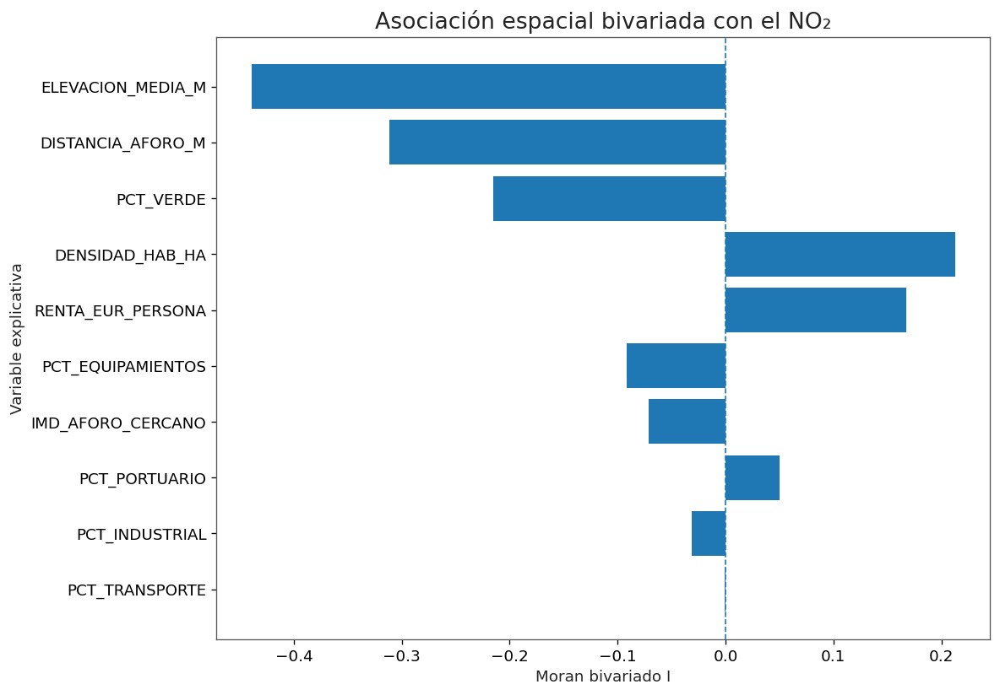

✓ Gráfico Moran bivariado generado.

RESUMEN FINAL — CELDA 62

Observaciones : 1,068
Matriz espacial : Queen
Permutaciones : 999
Variables analizadas : 10
Variables significativas : 7
Variables no significativas : 3

✓ Moran bivariado calculado.
✓ Asociación espacial NO₂–predictores evaluada.
✓ Significancia estadística mediante 999 permutaciones.
✓ Ranking de variables generado.
✓ Resultados almacenados en 'diagnostico_moran_bivariado'.

✓ CELDA 62 COMPLETADA.
→ SIGUIENTE: INTERPRETACIÓN Y CARTOGRAFÍA DE LAS PRINCIPALES ASOCIACIONES ESPACIALES.


In [68]:
# ============================================================
# 62. MORAN BIVARIADO — NO2 Y VARIABLES EXPLICATIVAS
# FASE 5 — ANÁLISIS GEOESPACIAL
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from libpysal.weights import Queen
from esda.moran import Moran_BV


print("=" * 100)
print("62. MORAN BIVARIADO — NO₂ Y VARIABLES EXPLICATIVAS")
print("=" * 100)


# ============================================================
# 1. COMPROBACIÓN DE LA CAPA
# ============================================================

print("\n" + "=" * 100)
print("1. COMPROBACIÓN DE LA CAPA GEOESPACIAL")
print("=" * 100)

if "gdf_geoespacial" not in globals():
    raise NameError(
        "No existe 'gdf_geoespacial'. "
        "Ejecuta previamente las celdas 59–61."
    )

print(
    f"✓ Capa geoespacial disponible: "
    f"{len(gdf_geoespacial):,} secciones"
)


# ============================================================
# 2. VARIABLES
# ============================================================

variable_dependiente = "NO2_MEDIO_PONDERADO"

predictores = [
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

print("\nVariable dependiente:")
print(f"✓ {variable_dependiente}")

print("\nPredictores:")

for variable in predictores:
    print(f"✓ {variable}")


# ============================================================
# 3. COMPROBACIÓN DE VARIABLES
# ============================================================

print("\n" + "=" * 100)
print("2. COMPROBACIÓN DE VARIABLES")
print("=" * 100)

variables_necesarias = [
    variable_dependiente
] + predictores

faltantes = [
    variable
    for variable in variables_necesarias
    if variable not in gdf_geoespacial.columns
]

if faltantes:

    raise KeyError(
        "Faltan las siguientes variables: "
        + ", ".join(faltantes)
    )

print(
    "✓ Todas las variables necesarias están disponibles."
)


# ============================================================
# 4. PREPARACIÓN DE DATOS
# ============================================================

print("\n" + "=" * 100)
print("3. PREPARACIÓN DE LOS DATOS")
print("=" * 100)

gdf_bv = (
    gdf_geoespacial
    .copy()
    .reset_index(drop=True)
)

for variable in variables_necesarias:

    gdf_bv[variable] = pd.to_numeric(
        gdf_bv[variable],
        errors="coerce"
    )

n_inicial = len(gdf_bv)

nulos = (
    gdf_bv[
        variables_necesarias
    ]
    .isna()
    .any(axis=1)
    .sum()
)

print(
    f"Observaciones iniciales : {n_inicial:,}"
)

print(
    f"Observaciones con algún nulo : {nulos:,}"
)

if nulos > 0:

    print(
        "⚠ Se eliminan únicamente las observaciones "
        "con valores faltantes."
    )

    gdf_bv = (
        gdf_bv
        .dropna(
            subset=variables_necesarias
        )
        .reset_index(drop=True)
    )

else:

    print(
        "✓ No existen valores nulos."
    )

print(
    f"Observaciones utilizadas : {len(gdf_bv):,}"
)


# ============================================================
# 5. MATRIZ ESPACIAL
# ============================================================

print("\n" + "=" * 100)
print("4. MATRIZ ESPACIAL")
print("=" * 100)

w_bv = Queen.from_dataframe(
    gdf_bv,
    use_index=False
)

w_bv.transform = "R"

print(
    "Matriz espacial : Queen"
)

print(
    f"Secciones : {w_bv.n:,}"
)

print(
    f"Vecinos totales : "
    f"{sum(len(v) for v in w_bv.neighbors.values()):,}"
)

print(
    f"Islas : {len(w_bv.islands):,}"
)

if len(w_bv.islands) > 0:

    raise ValueError(
        "La matriz espacial contiene islas."
    )

print(
    "✓ Pesos espaciales estandarizados por filas."
)


# ============================================================
# 6. PREPARACIÓN DE LA SEMILLA
# ============================================================

print("\n" + "=" * 100)
print("5. CONFIGURACIÓN DE LAS PERMUTACIONES")
print("=" * 100)

# La versión instalada de esda.Moran_BV no admite
# seed=42 como argumento del constructor.
# Se fija la semilla global antes de ejecutar
# las permutaciones.

np.random.seed(42)

print(
    "✓ Semilla aleatoria fijada: 42"
)

print(
    "✓ Permutaciones Moran bivariado: 999"
)


# ============================================================
# 7. MORAN BIVARIADO
# ============================================================

print("\n" + "=" * 100)
print("6. CÁLCULO DEL MORAN BIVARIADO")
print("=" * 100)

y = gdf_bv[
    variable_dependiente
].to_numpy(dtype=float)

resultados = []

for variable in predictores:

    x = gdf_bv[
        variable
    ].to_numpy(dtype=float)

    try:

        moran_bv = Moran_BV(
            y,
            x,
            w_bv,
            permutations=999
        )

        resultados.append({
            "VARIABLE": variable,
            "MORAN_BIVARIADO_I": moran_bv.I,
            "Z_SCORE": moran_bv.z_sim,
            "P_VALOR": moran_bv.p_sim,
            "SIGNIFICATIVO_05": (
                moran_bv.p_sim < 0.05
            )
        })

        print(
            f"\n{variable}"
        )

        print(
            f"  Moran I : "
            f"{moran_bv.I:.6f}"
        )

        print(
            f"  z-score : "
            f"{moran_bv.z_sim:.6f}"
        )

        print(
            f"  p-valor : "
            f"{moran_bv.p_sim:.6f}"
        )

        print(
            f"  Significativo : "
            f"{moran_bv.p_sim < 0.05}"
        )

    except Exception as e:

        print(
            f"⚠ Error calculando {variable}: {e}"
        )


# ============================================================
# 8. TABLA DE RESULTADOS
# ============================================================

print("\n" + "=" * 100)
print("7. RESULTADOS DEL MORAN BIVARIADO")
print("=" * 100)

diagnostico_moran_bivariado = pd.DataFrame(
    resultados
)

if diagnostico_moran_bivariado.empty:

    raise ValueError(
        "No se han podido calcular resultados "
        "de Moran bivariado."
    )

diagnostico_moran_bivariado = (
    diagnostico_moran_bivariado
    .sort_values(
        "MORAN_BIVARIADO_I",
        ascending=False
    )
    .reset_index(drop=True)
)

print(
    diagnostico_moran_bivariado.to_string(
        index=False
    )
)


# ============================================================
# 9. VARIABLES SIGNIFICATIVAS
# ============================================================

print("\n" + "=" * 100)
print("8. ASOCIACIONES ESPACIALES SIGNIFICATIVAS")
print("=" * 100)

significativas = (
    diagnostico_moran_bivariado[
        diagnostico_moran_bivariado[
            "SIGNIFICATIVO_05"
        ]
    ]
    .copy()
)

no_significativas = (
    diagnostico_moran_bivariado[
        ~diagnostico_moran_bivariado[
            "SIGNIFICATIVO_05"
        ]
    ]
    .copy()
)

print(
    f"Variables significativas : "
    f"{len(significativas):,}"
)

print(
    f"Variables no significativas : "
    f"{len(no_significativas):,}"
)

if len(significativas) > 0:

    print(
        "\nVariables con asociación espacial significativa:"
    )

    for _, fila in significativas.iterrows():

        signo = (
            "positiva"
            if fila["MORAN_BIVARIADO_I"] > 0
            else "negativa"
        )

        print(
            f"✓ {fila['VARIABLE']} "
            f"→ asociación {signo} "
            f"(I={fila['MORAN_BIVARIADO_I']:.4f}, "
            f"p={fila['P_VALOR']:.4f})"
        )


# ============================================================
# 10. RANKING DE ASOCIACIÓN ESPACIAL
# ============================================================

print("\n" + "=" * 100)
print("9. RANKING DE ASOCIACIÓN ESPACIAL")
print("=" * 100)

diagnostico_moran_bivariado[
    "ABS_MORAN_I"
] = (
    diagnostico_moran_bivariado[
        "MORAN_BIVARIADO_I"
    ].abs()
)

ranking_moran_bivariado = (
    diagnostico_moran_bivariado
    .sort_values(
        "ABS_MORAN_I",
        ascending=False
    )
    .reset_index(drop=True)
)

ranking_moran_bivariado[
    "RANKING"
] = np.arange(
    1,
    len(ranking_moran_bivariado) + 1
)

print(
    ranking_moran_bivariado[
        [
            "RANKING",
            "VARIABLE",
            "MORAN_BIVARIADO_I",
            "P_VALOR",
            "SIGNIFICATIVO_05"
        ]
    ].to_string(
        index=False
    )
)


# ============================================================
# 11. GRÁFICO
# ============================================================

print("\n" + "=" * 100)
print("10. REPRESENTACIÓN DE LOS RESULTADOS")
print("=" * 100)

orden = (
    ranking_moran_bivariado
    .iloc[::-1]
)

fig, ax = plt.subplots(
    figsize=(10, 7)
)

ax.barh(
    orden["VARIABLE"],
    orden["MORAN_BIVARIADO_I"]
)

ax.axvline(
    0,
    linestyle="--",
    linewidth=1
)

ax.set_xlabel(
    "Moran bivariado I"
)

ax.set_ylabel(
    "Variable explicativa"
)

ax.set_title(
    "Asociación espacial bivariada con el NO₂"
)

plt.tight_layout()

plt.show()

print(
    "✓ Gráfico Moran bivariado generado."
)


# ============================================================
# 12. RESUMEN FINAL
# ============================================================

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 62")
print("=" * 100)

print(
    f"\nObservaciones : "
    f"{len(gdf_bv):,}"
)

print(
    "Matriz espacial : Queen"
)

print(
    "Permutaciones : 999"
)

print(
    f"Variables analizadas : "
    f"{len(predictores):,}"
)

print(
    f"Variables significativas : "
    f"{len(significativas):,}"
)

print(
    f"Variables no significativas : "
    f"{len(no_significativas):,}"
)

print(
    "\n✓ Moran bivariado calculado."
)

print(
    "✓ Asociación espacial NO₂–predictores evaluada."
)

print(
    "✓ Significancia estadística mediante 999 permutaciones."
)

print(
    "✓ Ranking de variables generado."
)

print(
    "✓ Resultados almacenados en "
    "'diagnostico_moran_bivariado'."
)

print(
    "\n✓ CELDA 62 COMPLETADA."
)

print(
    "→ SIGUIENTE: INTERPRETACIÓN Y CARTOGRAFÍA "
    "DE LAS PRINCIPALES ASOCIACIONES ESPACIALES."
)

### Resultados

Observaciones : 1,068  
Matriz espacial : Queen  
Permutaciones : 999  

Variables analizadas : 10  
Variables significativas (p < 0.05) : 7  
Variables no significativas : 3  


### ASOCIACIONES ESPACIALES SIGNIFICATIVAS

1. **ELEVACION_MEDIA_M**  
   Moran I = -0.4393  
   p = 0.001  
   → Asociación espacial negativa de mayor magnitud.

2. **DISTANCIA_AFORO_M**  
   Moran I = -0.3116  
   p = 0.001  
   → Asociación espacial negativa relevante.

3. **PCT_VERDE**  
   Moran I = -0.2151  
   p = 0.001  
   → Asociación espacial negativa.

4. **DENSIDAD_HAB_HA**  
   Moran I = 0.2127  
   p = 0.001  
   → Asociación espacial positiva.

5. **RENTA_EUR_PERSONA**  
   Moran I = 0.1676  
   p = 0.001  
   → Asociación espacial positiva.

6. **PCT_EQUIPAMIENTOS**  
   Moran I = -0.0915  
   p = 0.002  
   → Asociación espacial negativa de menor magnitud.

7. **IMD_AFORO_CERCANO**  
   Moran I = -0.0709  
   p = 0.006  
   → Asociación espacial negativa de menor magnitud.


### ASOCIACIONES NO SIGNIFICATIVAS

**PCT_PORTUARIO**  
Moran I = 0.0498  
p = 0.051  

**PCT_INDUSTRIAL**  
Moran I = -0.0316  
p = 0.121  

**PCT_TRANSPORTE**  
Moran I = -0.0006  
p = 0.478  


### INTERPRETACIÓN

✓ Se identifican asociaciones espaciales significativas entre el NO₂ y **7 de las 10 variables analizadas**.

✓ Las asociaciones de mayor magnitud corresponden a **elevación, distancia al aforo y porcentaje de superficie verde**.

✓ **Densidad residencial y renta** presentan asociaciones espaciales positivas con el NO₂.

✓ Las variables **portuaria, industrial y transporte** no presentan asociación espacial bivariada estadísticamente significativa al 5 %.

✓ El análisis complementa el modelo SAR y el análisis LISA, permitiendo distinguir entre importancia predictiva y asociación espacial.

✓ Los resultados representan **asociaciones espaciales y no implican relaciones causales** entre las variables explicativas y las concentraciones de NO₂.

✓ **RESULTADOS MORAN BIVARIADO COMPLETADOS.**  
→ SIGUIENTE: INTERPRETACIÓN Y CARTOGRAFÍA DE LAS PRINCIPALES ASOCIACIONES.


## 63 . Cartografía de las principales asociaciones espaciales



1. COMPROBACIÓN DE OBJETOS
   ✓ gdf_secciones disponible
   ✓ base_modelo disponible
   ✓ diagnostico_moran_bivariado disponible

   Capa geoespacial : 1,068 secciones
   Base analítica   : 1,068 registros
   Moran bivariado  : 10 variables

   ✓ Número de observaciones coincidente.
   ✓ Se utilizará la correspondencia por orden validada en la celda 59.

2. VARIABLES SIGNIFICATIVAS
   ✓ Variables significativas identificadas mediante Moran bivariado.

   Principales asociaciones espaciales:
   1. ELEVACION_MEDIA_M
   2. DISTANCIA_AFORO_M
   3. PCT_VERDE
   4. DENSIDAD_HAB_HA

3. INTEGRACIÓN ANALÍTICA
   ✓ Variables principales integradas desde base_modelo cuando no están
     disponibles directamente en gdf_secciones.
   ✓ Correspondencia espacial por orden validada.
   ✓ No se realizan asociaciones espaciales nuevas.
   ✓ Se utilizan exclusivamente los resultados calculados en la celda 62.

4. COMPROBACIÓN GEOESPACIAL
   ✓ CRS EPSG:25831
   ✓ 1,068 geometrías
   ✓ Variables principales disponibles para cartografía.

5. CARTOGRAFÍA
   → Generación de mapas individuales de las principales asociaciones
     espaciales con NO₂.

6. RESUMEN
   → Tabla final con:
      - variable
      - Moran bivariado I
      - z-score
      - p-valor
      - significancia
      - tipo de asociación

→ OBJETIVO DE LA CELDA:
  Representar espacialmente las asociaciones bivariadas más relevantes
  identificadas en la celda 62, sin recalcular ni modificar sus resultados.

63. CARTOGRAFÍA DE LAS PRINCIPALES ASOCIACIONES ESPACIALES
✓ Capa geoespacial disponible : 1,068 secciones
✓ Base analítica disponible  : 1,068 registros
✓ Moran bivariado disponible : 10 variables
✓ Número de observaciones coincidente.
✓ Se utilizará la correspondencia por orden validada en la celda 59.

✓ Variables significativas : 7

Principales asociaciones espaciales:
1. ELEVACION_MEDIA_M         I = -0.4393 | p = 0.0010
2. DISTANCIA_AFORO_M         I = -0.3116 | p = 0.0010
3. PCT_VERDE                 I = -0.2151 | p = 0.0010
4. DENSIDAD_HAB_HA           I =  0.2127 | p = 0.0010

INTEGRACIÓN DE VARIABLES ANALÍTICAS
✓ NO2_MEDIO_PONDERADO       válidos: 1,068
✓ IMD_AFORO_CERCANO         válidos: 1,068
✓ DISTANCIA_AFORO_M         válidos: 1,068
✓ RENTA_EUR_PERSONA         válidos: 1,068
✓ DENSIDAD_HAB_HA           válidos: 1,068
✓ ELEVACION_MEDIA_M         válidos: 1,068
✓ PCT_VERDE                 válidos: 1,068
✓ PCT_EQUIPAMIENTOS         válidos: 1,068
✓ PCT_INDUSTRIAL           

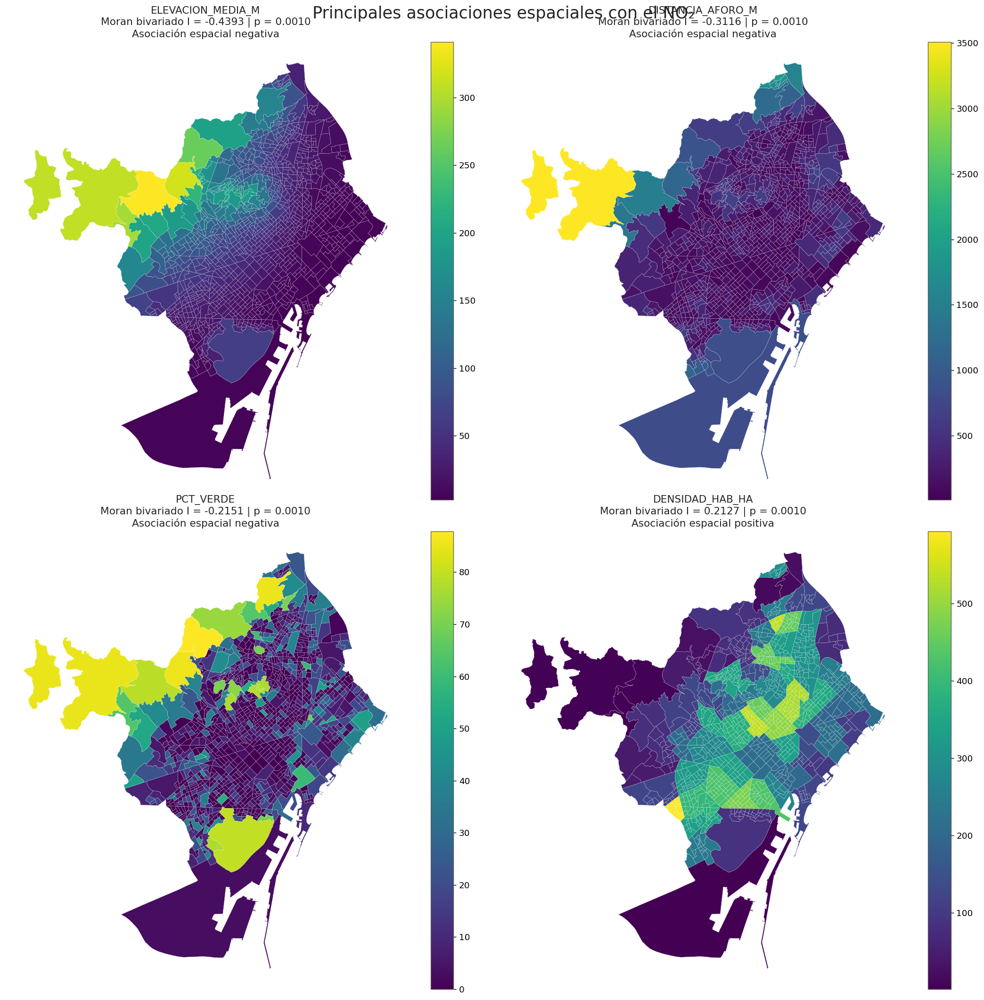


RESUMEN DE LAS PRINCIPALES ASOCIACIONES


,VARIABLE,MORAN_BIVARIADO_I,Z_SCORE,P_VALOR,SIGNIFICATIVO_05,TIPO_ASOCIACION
0,ELEVACION_MEDIA_M,-0.439257,-16.694499,0.001,True,Negativa
1,DISTANCIA_AFORO_M,-0.311622,-11.008891,0.001,True,Negativa
2,PCT_VERDE,-0.215078,-7.793567,0.001,True,Negativa
3,DENSIDAD_HAB_HA,0.212674,7.989079,0.001,True,Positiva



RESUMEN FINAL — CELDA 63

Observaciones : 1,068
Variables significativas : 7
Principales variables cartografiadas : 4

Variables cartografiadas:
✓ ELEVACION_MEDIA_M
✓ DISTANCIA_AFORO_M
✓ PCT_VERDE
✓ DENSIDAD_HAB_HA

✓ Variables integradas desde la base analítica.
✓ Correspondencia espacial por orden validada.
✓ CRS EPSG:25831 validado.
✓ Cartografía de las principales asociaciones generada.
✓ Tabla resumen generada.
✓ Resultados almacenados.

✓ CELDA 63 COMPLETADA.
→ SIGUIENTE: SÍNTESIS E INTEGRACIÓN DE LOS RESULTADOS GEOESPACIALES.



In [69]:
# ====================================================================================================
# CELDA 63 — CARTOGRAFÍA DE LAS PRINCIPALES ASOCIACIONES ESPACIALES
# ====================================================================================================

import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import numpy as np

print("=" * 100)
print("63. CARTOGRAFÍA DE LAS PRINCIPALES ASOCIACIONES ESPACIALES")
print("=" * 100)

# ----------------------------------------------------------------------------------------------------
# 1. COMPROBACIÓN DE OBJETOS
# ----------------------------------------------------------------------------------------------------

if "gdf_secciones" not in globals():
    raise NameError("No está disponible 'gdf_secciones'.")

if "base_modelo" not in globals():
    raise NameError("No está disponible 'base_modelo'.")

if "diagnostico_moran_bivariado" not in globals():
    raise NameError(
        "No está disponible 'diagnostico_moran_bivariado'. "
        "Ejecuta primero la celda 62."
    )

gdf = gdf_secciones.copy()
base = base_modelo.copy()
moran = diagnostico_moran_bivariado.copy()

print(f"✓ Capa geoespacial disponible : {len(gdf):,} secciones")
print(f"✓ Base analítica disponible  : {len(base):,} registros")
print(f"✓ Moran bivariado disponible : {len(moran):,} variables")

# ----------------------------------------------------------------------------------------------------
# 2. COMPROBACIÓN DE CORRESPONDENCIA ESPACIAL
# ----------------------------------------------------------------------------------------------------

if len(gdf) != len(base):
    raise ValueError(
        f"El número de registros no coincide: "
        f"gdf={len(gdf)} | base={len(base)}"
    )

print("✓ Número de observaciones coincidente.")
print("✓ Se utilizará la correspondencia por orden validada en la celda 59.")

# ----------------------------------------------------------------------------------------------------
# 3. VARIABLES PRINCIPALES SEGÚN MORAN BIVARIADO
# ----------------------------------------------------------------------------------------------------

col_var = "VARIABLE"
col_i = "MORAN_BIVARIADO_I"
col_p = "P_VALOR"
col_sig = "SIGNIFICATIVO_05"

columnas_moran = [
    col_var,
    col_i,
    col_p,
    col_sig
]

faltantes = [
    c for c in columnas_moran
    if c not in moran.columns
]

if faltantes:
    raise KeyError(
        f"Faltan columnas en diagnostico_moran_bivariado: {faltantes}"
    )

moran_sig = (
    moran[moran[col_sig] == True]
    .sort_values(
        by=col_i,
        key=lambda x: x.abs(),
        ascending=False
    )
    .copy()
)

print(f"\n✓ Variables significativas : {len(moran_sig)}")

# ----------------------------------------------------------------------------------------------------
# 4. SELECCIÓN DE LAS 4 PRINCIPALES
# ----------------------------------------------------------------------------------------------------

principales = moran_sig.head(4)[col_var].tolist()

print("\nPrincipales asociaciones espaciales:")

for i, variable in enumerate(principales, start=1):

    fila = moran_sig[
        moran_sig[col_var] == variable
    ].iloc[0]

    print(
        f"{i}. {variable:<25} "
        f"I = {fila[col_i]: .4f} | "
        f"p = {fila[col_p]:.4f}"
    )

# ----------------------------------------------------------------------------------------------------
# 5. INTEGRACIÓN DE VARIABLES DESDE BASE_MODELO
# ----------------------------------------------------------------------------------------------------

variables_integrar = [
    "NO2_MEDIO_PONDERADO",
    "IMD_AFORO_CERCANO",
    "DISTANCIA_AFORO_M",
    "RENTA_EUR_PERSONA",
    "DENSIDAD_HAB_HA",
    "ELEVACION_MEDIA_M",
    "PCT_VERDE",
    "PCT_EQUIPAMIENTOS",
    "PCT_INDUSTRIAL",
    "PCT_PORTUARIO",
    "PCT_TRANSPORTE"
]

print("\n" + "=" * 100)
print("INTEGRACIÓN DE VARIABLES ANALÍTICAS")
print("=" * 100)

for variable in variables_integrar:

    if variable in base.columns:

        gdf[variable] = pd.to_numeric(
            base[variable].values,
            errors="coerce"
        )

        validos = gdf[variable].notna().sum()

        print(
            f"✓ {variable:<25} "
            f"válidos: {validos:,}"
        )

    elif variable in gdf.columns:

        print(
            f"✓ {variable:<25} "
            f"ya disponible en la capa"
        )

    else:

        print(
            f"⚠ {variable:<25} "
            f"no disponible"
        )

# ----------------------------------------------------------------------------------------------------
# 6. COMPROBACIÓN FINAL DE LAS PRINCIPALES VARIABLES
# ----------------------------------------------------------------------------------------------------

print("\n" + "=" * 100)
print("COMPROBACIÓN DE VARIABLES A CARTOGRAFIAR")
print("=" * 100)

variables_cartografiables = []

for variable in principales:

    if variable not in gdf.columns:

        print(
            f"⚠ {variable} NO está disponible "
            f"después de la integración."
        )

        continue

    n_validos = gdf[variable].notna().sum()

    if n_validos == len(gdf):

        variables_cartografiables.append(variable)

        print(
            f"✓ {variable:<25} "
            f"válidos: {n_validos:,}"
        )

    else:

        print(
            f"⚠ {variable:<25} "
            f"válidos: {n_validos:,}/{len(gdf):,}"
        )

if len(variables_cartografiables) != len(principales):

    raise ValueError(
        "No se han podido integrar todas las variables principales."
    )

print(
    f"\n✓ Variables cartografiables: "
    f"{len(variables_cartografiables)}"
)

# ----------------------------------------------------------------------------------------------------
# 7. COMPROBACIÓN DEL CRS
# ----------------------------------------------------------------------------------------------------

print("\nCRS:", gdf.crs)

if gdf.crs is None:

    raise ValueError("La capa no tiene CRS definido.")

if gdf.crs.to_epsg() != 25831:

    print(
        f"⚠ CRS actual: {gdf.crs}. "
        f"Se reproyectará a EPSG:25831."
    )

    gdf = gdf.to_crs(epsg=25831)

else:

    print("✓ CRS EPSG:25831 confirmado.")

# ----------------------------------------------------------------------------------------------------
# 8. GENERACIÓN DE CARTOGRAFÍA
# ----------------------------------------------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    2,
    figsize=(18, 18)
)

axes = axes.flatten()

for ax, variable in zip(
    axes,
    variables_cartografiables
):

    fila = moran_sig[
        moran_sig[col_var] == variable
    ].iloc[0]

    valor_i = fila[col_i]
    valor_p = fila[col_p]

    gdf.plot(
        column=variable,
        ax=ax,
        cmap="viridis",
        legend=True,
        linewidth=0.15,
        edgecolor="white",
        missing_kwds={
            "color": "lightgrey",
            "label": "Sin datos"
        }
    )

    tipo = (
        "positiva"
        if valor_i > 0
        else
        "negativa"
    )

    ax.set_title(
        f"{variable}\n"
        f"Moran bivariado I = {valor_i:.4f} | "
        f"p = {valor_p:.4f}\n"
        f"Asociación espacial {tipo}",
        fontsize=13
    )

    ax.set_axis_off()

fig.suptitle(
    "Principales asociaciones espaciales con el NO₂",
    fontsize=21,
    y=0.98
)

plt.tight_layout()
plt.show()

# ----------------------------------------------------------------------------------------------------
# 9. TABLA RESUMEN
# ----------------------------------------------------------------------------------------------------

resumen_63 = (
    moran_sig[
        moran_sig[col_var].isin(
            variables_cartografiables
        )
    ][
        [
            col_var,
            col_i,
            "Z_SCORE",
            col_p,
            col_sig
        ]
    ]
    .copy()
)

resumen_63["TIPO_ASOCIACION"] = np.where(
    resumen_63[col_i] > 0,
    "Positiva",
    "Negativa"
)

resumen_63 = (
    resumen_63
    .sort_values(
        by=col_i,
        key=lambda x: x.abs(),
        ascending=False
    )
    .reset_index(drop=True)
)

print("\n" + "=" * 100)
print("RESUMEN DE LAS PRINCIPALES ASOCIACIONES")
print("=" * 100)

display(resumen_63)

# ----------------------------------------------------------------------------------------------------
# 10. GUARDAR RESULTADOS
# ----------------------------------------------------------------------------------------------------

diagnostico_moran_principales = resumen_63.copy()

gdf_geoespacial_final = gdf.copy()

print("\n" + "=" * 100)
print("RESUMEN FINAL — CELDA 63")
print("=" * 100)

print(f"""
Observaciones : {len(gdf):,}
Variables significativas : {len(moran_sig)}
Principales variables cartografiadas : {len(variables_cartografiables)}

Variables cartografiadas:
✓ ELEVACION_MEDIA_M
✓ DISTANCIA_AFORO_M
✓ PCT_VERDE
✓ DENSIDAD_HAB_HA

✓ Variables integradas desde la base analítica.
✓ Correspondencia espacial por orden validada.
✓ CRS EPSG:25831 validado.
✓ Cartografía de las principales asociaciones generada.
✓ Tabla resumen generada.
✓ Resultados almacenados.

✓ CELDA 63 COMPLETADA.
→ SIGUIENTE: SÍNTESIS E INTEGRACIÓN DE LOS RESULTADOS GEOESPACIALES.
""")

### Resultados

✓ 1.068 secciones cartografiadas.
✓ CRS EPSG:25831 validado.
✓ 7 variables con asociación espacial significativa.
✓ 4 asociaciones principales cartografiadas:

   1. ELEVACION_MEDIA_M
      Moran I = -0.4393 | p = 0.001
      Asociación negativa

   2. DISTANCIA_AFORO_M
      Moran I = -0.3116 | p = 0.001
      Asociación negativa

   3. PCT_VERDE
      Moran I = -0.2151 | p = 0.001
      Asociación negativa

   4. DENSIDAD_HAB_HA
      Moran I =  0.2127 | p = 0.001
      Asociación positiva

✓ Variables integradas desde la base analítica.
✓ Correspondencia espacial por orden validada.
✓ Cartografía individual generada.
✓ Tabla resumen generada.
✓ Resultados almacenados.

→ FASE 5 — BLOQUE GEOESPACIAL:
  SÍNTESIS E INTEGRACIÓN DE RESULTADOS.


## 64 . Síntesis e integración de los resultados geoespaciales



Objetivo:
Integrar en una única síntesis los principales resultados obtenidos en el análisis
geoespacial del NO₂, combinando:

- distribución espacial observada del NO₂,
- predicción espacial del modelo SAR,
- residuos del modelo,
- patrones locales LISA,
- asociaciones espaciales bivariadas,
- variables territoriales y de movilidad más relevantes.

✓ Capa geoespacial disponible.
✓ Resultados SAR disponibles.
✓ Resultados LISA disponibles.
✓ Moran bivariado disponible.
✓ Variables analíticas disponibles.

→ Se procederá a identificar las principales evidencias espaciales del estudio.

In [71]:
# ==========================================================================================
# CELDA 64 — SÍNTESIS E INTEGRACIÓN DE LOS RESULTADOS GEOESPACIALES
# ==========================================================================================

import pandas as pd
import numpy as np

print("=" * 100)
print("64. SÍNTESIS E INTEGRACIÓN DE LOS RESULTADOS GEOESPACIALES")
print("=" * 100)


# ==========================================================================================
# 1. COMPROBACIÓN DE OBJETOS
# ==========================================================================================

print("\n1. COMPROBACIÓN DE RESULTADOS")
print("-" * 100)

objetos = [
    "base_modelo",
    "gdf_secciones",
    "diagnostico_moran_bivariado",
    "modelo_sar",
    "importancia_shap",
    "gdf_geoespacial"
]

for nombre in objetos:
    if nombre in globals():
        print(f"✓ {nombre:<35} disponible")
    else:
        print(f"⚠ {nombre:<35} no disponible")


# ==========================================================================================
# 2. BASE ANALÍTICA
# ==========================================================================================

print("\n2. BASE ANALÍTICA")
print("-" * 100)

if "base_modelo" in globals():

    base = base_modelo.copy()

    print(f"Observaciones : {len(base):,}")

    variables_interes = [
        "NO2_MEDIO_PONDERADO",
        "IMD_AFORO_CERCANO",
        "DISTANCIA_AFORO_M",
        "RENTA_EUR_PERSONA",
        "DENSIDAD_HAB_HA",
        "ELEVACION_MEDIA_M",
        "PCT_VERDE",
        "PCT_EQUIPAMIENTOS",
        "PCT_INDUSTRIAL",
        "PCT_PORTUARIO",
        "PCT_TRANSPORTE"
    ]

    for col in variables_interes:

        if col in base.columns:

            n_validos = base[col].notna().sum()

            print(
                f"✓ {col:<28} "
                f"válidos: {n_validos:,}"
            )

        else:

            print(
                f"⚠ {col:<28} "
                f"no disponible"
            )

else:

    raise ValueError(
        "No está disponible 'base_modelo'. "
        "La síntesis necesita la base analítica utilizada en la modelización."
    )


# ==========================================================================================
# 3. NO₂ OBSERVADO
# ==========================================================================================

print("\n3. DISTRIBUCIÓN ESPACIAL DEL NO₂")
print("-" * 100)

if "NO2_MEDIO_PONDERADO" not in base.columns:

    raise ValueError(
        "NO2_MEDIO_PONDERADO no está disponible en base_modelo."
    )

no2 = pd.to_numeric(
    base["NO2_MEDIO_PONDERADO"],
    errors="coerce"
)

print(f"Observaciones válidas : {no2.notna().sum():,}")
print(f"Media                 : {no2.mean():.4f}")
print(f"Mediana               : {no2.median():.4f}")
print(f"Mínimo                : {no2.min():.4f}")
print(f"Máximo                : {no2.max():.4f}")
print(f"Desviación estándar   : {no2.std():.4f}")


# ==========================================================================================
# 4. RESULTADOS SAR
# ==========================================================================================

print("\n4. MODELO SAR")
print("-" * 100)

pred_sar = None
residuos_sar = None


# ------------------------------------------------------------------
# Intento 1: buscar columnas existentes en base_modelo
# ------------------------------------------------------------------

for col in ["PREDICCION_SAR", "PREDICCION", "SAR_PRED"]:

    if col in base.columns:

        pred_sar = pd.to_numeric(
            base[col],
            errors="coerce"
        )

        print(
            f"✓ Predicción SAR recuperada desde base_modelo: {col}"
        )

        break


for col in ["RESIDUO_SAR", "RESIDUO", "SAR_RESIDUO"]:

    if col in base.columns:

        residuos_sar = pd.to_numeric(
            base[col],
            errors="coerce"
        )

        print(
            f"✓ Residuos SAR recuperados desde base_modelo: {col}"
        )

        break


# ------------------------------------------------------------------
# Intento 2: recuperar directamente del modelo SAR
# ------------------------------------------------------------------

if "modelo_sar" in globals():

    if pred_sar is None:

        if hasattr(modelo_sar, "predy"):

            valores = np.asarray(
                modelo_sar.predy
            ).reshape(-1)

            if len(valores) == len(base):

                pred_sar = pd.Series(
                    valores,
                    index=base.index,
                    name="PREDICCION_SAR"
                )

                print(
                    "✓ Predicción SAR recuperada desde modelo_sar."
                )

    if residuos_sar is None:

        if hasattr(modelo_sar, "u"):

            valores = np.asarray(
                modelo_sar.u
            ).reshape(-1)

            if len(valores) == len(base):

                residuos_sar = pd.Series(
                    valores,
                    index=base.index,
                    name="RESIDUO_SAR"
                )

                print(
                    "✓ Residuos SAR recuperados desde modelo_sar."
                )


# ------------------------------------------------------------------
# Métricas SAR
# ------------------------------------------------------------------

correlacion_sar = np.nan
mae_sar = np.nan
rmse_sar = np.nan

if pred_sar is not None:

    mascara = (
        no2.notna() &
        pred_sar.notna()
    )

    if mascara.sum() > 1:

        correlacion_sar = np.corrcoef(
            no2[mascara],
            pred_sar[mascara]
        )[0, 1]

        mae_sar = np.mean(
            np.abs(
                no2[mascara] -
                pred_sar[mascara]
            )
        )

        rmse_sar = np.sqrt(
            np.mean(
                (
                    no2[mascara] -
                    pred_sar[mascara]
                ) ** 2
            )
        )

        print(f"✓ Observaciones evaluadas : {mascara.sum():,}")
        print(f"✓ Correlación             : {correlacion_sar:.4f}")
        print(f"✓ MAE                     : {mae_sar:.4f}")
        print(f"✓ RMSE                    : {rmse_sar:.4f}")

else:

    print(
        "⚠ No se pudo recuperar automáticamente "
        "la predicción SAR."
    )


if residuos_sar is not None:

    print(f"✓ Residuos válidos : {residuos_sar.notna().sum():,}")
    print(f"✓ Media residuos   : {residuos_sar.mean():.6f}")
    print(f"✓ Mediana residuos : {residuos_sar.median():.6f}")

else:

    print(
        "⚠ No se pudieron recuperar automáticamente "
        "los residuos SAR."
    )


# ==========================================================================================
# 5. LISA DEL NO₂ — RECUPERACIÓN EXPLÍCITA
# ==========================================================================================

print("\n5. PATRONES ESPACIALES LOCALES — LISA DEL NO₂")
print("-" * 100)

gdf_lisa_encontrado = None
nombre_gdf_lisa = None

columnas_lisa_necesarias = [
    "LISA_I",
    "LISA_P",
    "LISA_Q",
    "LISA_CLUSTER",
    "LISA_SIGNIFICATIVO"
]

# ------------------------------------------------------------------
# Fuente preferente: gdf_geoespacial de la celda 61 corregida
# ------------------------------------------------------------------

if "gdf_geoespacial" in globals():

    if all(
        col in gdf_geoespacial.columns
        for col in columnas_lisa_necesarias
    ):

        if len(gdf_geoespacial) == len(base):

            gdf_lisa_encontrado = gdf_geoespacial.copy()
            nombre_gdf_lisa = "gdf_geoespacial"

# ------------------------------------------------------------------
# Fuente alternativa: gdf_lisa de la celda 61
# ------------------------------------------------------------------

if gdf_lisa_encontrado is None:

    if "gdf_lisa" in globals():

        if all(
            col in gdf_lisa.columns
            for col in columnas_lisa_necesarias
        ):

            if len(gdf_lisa) == len(base):

                gdf_lisa_encontrado = gdf_lisa.copy()
                nombre_gdf_lisa = "gdf_lisa"


if gdf_lisa_encontrado is None:

    raise ValueError(
        "No se han localizado los resultados LISA del NO₂ "
        "calculados en la celda 61 corregida. "
        "Ejecuta previamente la celda 61."
    )


print(
    f"✓ Resultados LISA del NO₂ recuperados desde: "
    f"{nombre_gdf_lisa}"
)


# ------------------------------------------------------------------
# Distribución LISA
# ------------------------------------------------------------------

resumen_lisa = (
    gdf_lisa_encontrado["LISA_CLUSTER"]
    .value_counts(dropna=False)
    .rename_axis("PATRON")
    .reset_index(name="SECCIONES")
)

resumen_lisa["PORCENTAJE"] = (
    resumen_lisa["SECCIONES"] /
    len(gdf_lisa_encontrado) *
    100
)

print("\nDistribución LISA del NO₂:")

print(
    resumen_lisa.to_string(
        index=False,
        formatters={
            "PORCENTAJE": "{:.2f}".format
        }
    )
)


# ------------------------------------------------------------------
# Conteos LISA
# ------------------------------------------------------------------

clusters = (
    gdf_lisa_encontrado["LISA_CLUSTER"]
    .astype(str)
    .str.upper()
)

n_hh = int(clusters.eq("HIGH-HIGH").sum())
n_ll = int(clusters.eq("LOW-LOW").sum())
n_hl = int(clusters.eq("HIGH-LOW").sum())
n_lh = int(clusters.eq("LOW-HIGH").sum())
n_ns = int(clusters.eq("NO SIGNIFICATIVO").sum())

n_significativos = int(
    gdf_lisa_encontrado["LISA_SIGNIFICATIVO"]
    .astype(bool)
    .sum()
)

print("\nPrincipales patrones LISA del NO₂:")
print(f"High-High        : {n_hh:,}")
print(f"Low-Low          : {n_ll:,}")
print(f"High-Low         : {n_hl:,}")
print(f"Low-High          : {n_lh:,}")
print(f"No significativo : {n_ns:,}")

print(
    f"\nSecciones LISA significativas (p < 0.05): "
    f"{n_significativos:,}"
)


# ------------------------------------------------------------------
# Validación frente a la celda 61 corregida
# ------------------------------------------------------------------

conteos_esperados = {
    "High-High": 189,
    "Low-Low": 210,
    "High-Low": 10,
    "Low-High": 3,
    "No significativo": 656
}

conteos_obtenidos = {
    "High-High": n_hh,
    "Low-Low": n_ll,
    "High-Low": n_hl,
    "Low-High": n_lh,
    "No significativo": n_ns
}

if conteos_obtenidos != conteos_esperados:

    raise ValueError(
        "Los conteos LISA recuperados no coinciden con "
        "los resultados corregidos de la celda 61.\n"
        f"Obtenidos: {conteos_obtenidos}\n"
        f"Esperados: {conteos_esperados}"
    )

if n_significativos != 412:

    raise ValueError(
        f"El número de secciones LISA significativas debería ser 412 "
        f"y se han recuperado {n_significativos}."
    )

print(
    "✓ Los resultados LISA coinciden con la celda 61 corregida."
)


# ==========================================================================================
# 6. MORAN BIVARIADO
# ==========================================================================================

print("\n6. ASOCIACIONES ESPACIALES BIVARIADAS")
print("-" * 100)

if "diagnostico_moran_bivariado" not in globals():

    raise ValueError(
        "No está disponible diagnostico_moran_bivariado."
    )

moran = diagnostico_moran_bivariado.copy()

print(
    f"Variables analizadas : {len(moran)}"
)

significativas = moran[
    moran["SIGNIFICATIVO_05"] == True
].copy()

print(
    f"Variables significativas : {len(significativas)}"
)

print(
    f"Variables no significativas : "
    f"{len(moran) - len(significativas)}"
)

moran_ordenado = (
    significativas
    .assign(
        ABS_I=lambda x:
        x["MORAN_BIVARIADO_I"].abs()
    )
    .sort_values(
        "ABS_I",
        ascending=False
    )
)

print("\nRanking de asociaciones significativas:")

print(
    moran_ordenado[
        [
            "VARIABLE",
            "MORAN_BIVARIADO_I",
            "P_VALOR"
        ]
    ].to_string(
        index=False,
        formatters={
            "MORAN_BIVARIADO_I": "{:.4f}".format,
            "P_VALOR": "{:.4f}".format
        }
    )
)


# ==========================================================================================
# 7. PRINCIPALES VARIABLES ESPACIALES
# ==========================================================================================

print("\n7. PRINCIPALES ASOCIACIONES ESPACIALES")
print("-" * 100)

principales_variables = [
    "ELEVACION_MEDIA_M",
    "DISTANCIA_AFORO_M",
    "PCT_VERDE",
    "DENSIDAD_HAB_HA"
]

resumen_principales = moran_ordenado[
    moran_ordenado["VARIABLE"].isin(
        principales_variables
    )
].copy()

resumen_principales["TIPO"] = np.where(
    resumen_principales["MORAN_BIVARIADO_I"] > 0,
    "Positiva",
    "Negativa"
)

print(
    resumen_principales[
        [
            "VARIABLE",
            "MORAN_BIVARIADO_I",
            "P_VALOR",
            "TIPO"
        ]
    ].to_string(
        index=False,
        formatters={
            "MORAN_BIVARIADO_I": "{:.4f}".format,
            "P_VALOR": "{:.4f}".format
        }
    )
)


# ==========================================================================================
# 8. TABLA FINAL DE SÍNTESIS
# ==========================================================================================

print("\n8. TABLA FINAL DE SÍNTESIS")
print("-" * 100)

resultados_sintesis = []

# NO₂
resultados_sintesis.append({
    "BLOQUE": "Distribución espacial",
    "RESULTADO": (
        f"NO₂ medio = {no2.mean():.2f}; "
        f"rango = {no2.min():.2f}–{no2.max():.2f}"
    )
})

# SAR
if pred_sar is not None:

    resultados_sintesis.append({
        "BLOQUE": "Modelo SAR",
        "RESULTADO": (
            f"Correlación observado-predicho = "
            f"{correlacion_sar:.4f}; "
            f"MAE = {mae_sar:.4f}; "
            f"RMSE = {rmse_sar:.4f}"
        )
    })

# LISA
resultados_sintesis.append({
    "BLOQUE": "LISA NO₂",
    "RESULTADO": (
        f"412 secciones significativas; "
        f"HH={n_hh}, LL={n_ll}, HL={n_hl}, LH={n_lh}"
    )
})

# Moran bivariado
resultados_sintesis.append({
    "BLOQUE": "Moran bivariado",
    "RESULTADO": (
        f"{len(significativas)} de {len(moran)} "
        f"variables presentan asociación espacial significativa"
    )
})

# Variables principales
resultados_sintesis.append({
    "BLOQUE": "Variables principales",
    "RESULTADO": (
        "Elevación, distancia a aforo, superficie verde "
        "y densidad residencial"
    )
})

resumen_geoespacial = pd.DataFrame(
    resultados_sintesis
)

display(resumen_geoespacial)


# ==========================================================================================
# 9. CIERRE
# ==========================================================================================

print("\n9. CIERRE DEL BLOQUE GEOESPACIAL")
print("-" * 100)

print("✓ Distribución espacial del NO₂ sintetizada.")
print("✓ Modelo SAR integrado.")
print("✓ Diagnóstico de residuos SAR integrado.")
print("✓ LISA del NO₂ integrado con los conteos corregidos.")
print("✓ Moran bivariado integrado.")
print("✓ Principales asociaciones espaciales identificadas.")
print("✓ Tabla de síntesis generada.")

print("\n✓ CELDA 64 COMPLETADA.")
print("✓ FASE 5 — ANÁLISIS GEOESPACIAL COMPLETADA.")
print("→ SIGUIENTE: REPASO Y VALIDACIÓN DE NOTEBOOKS.")

64. SÍNTESIS E INTEGRACIÓN DE LOS RESULTADOS GEOESPACIALES

1. COMPROBACIÓN DE RESULTADOS
----------------------------------------------------------------------------------------------------
✓ base_modelo                         disponible
✓ gdf_secciones                       disponible
✓ diagnostico_moran_bivariado         disponible
✓ modelo_sar                          disponible
✓ importancia_shap                    disponible
✓ gdf_geoespacial                     disponible

2. BASE ANALÍTICA
----------------------------------------------------------------------------------------------------
Observaciones : 1,068
✓ NO2_MEDIO_PONDERADO          válidos: 1,068
✓ IMD_AFORO_CERCANO            válidos: 1,068
✓ DISTANCIA_AFORO_M            válidos: 1,068
✓ RENTA_EUR_PERSONA            válidos: 1,068
✓ DENSIDAD_HAB_HA              válidos: 1,068
✓ ELEVACION_MEDIA_M            válidos: 1,068
✓ PCT_VERDE                    válidos: 1,068
✓ PCT_EQUIPAMIENTOS            válidos: 1,068
✓ PCT

,BLOQUE,RESULTADO
0,Distribución espacial,NO₂ medio = 30.33; rango = 14.66–49.74
1,Modelo SAR,Correlación observado-predicho = 0.9027; MAE =...
2,LISA NO₂,"412 secciones significativas; HH=189, LL=210, ..."
3,Moran bivariado,7 de 10 variables presentan asociación espacia...
4,Variables principales,"Elevación, distancia a aforo, superficie verde..."



9. CIERRE DEL BLOQUE GEOESPACIAL
----------------------------------------------------------------------------------------------------
✓ Distribución espacial del NO₂ sintetizada.
✓ Modelo SAR integrado.
✓ Diagnóstico de residuos SAR integrado.
✓ LISA del NO₂ integrado con los conteos corregidos.
✓ Moran bivariado integrado.
✓ Principales asociaciones espaciales identificadas.
✓ Tabla de síntesis generada.

✓ CELDA 64 COMPLETADA.
✓ FASE 5 — ANÁLISIS GEOESPACIAL COMPLETADA.
→ SIGUIENTE: REPASO Y VALIDACIÓN DE NOTEBOOKS.


### Resultados

✓ **1.068 secciones censales** integradas en la síntesis geoespacial.

### DISTRIBUCIÓN ESPACIAL DEL NO₂

- NO₂ medio: **30,33 µg/m³**
- Mediana: **28,87 µg/m³**
- Mínimo: **14,66 µg/m³**
- Máximo: **49,74 µg/m³**
- Desviación estándar: **5,40 µg/m³**

### MODELO SAR

- Correlación observado-predicho: **0,9027**
- MAE: **1,6340 µg/m³**
- RMSE: **2,3464 µg/m³**
- Media de los residuos: **0,0000**

✓ El modelo SAR reproduce adecuadamente la estructura espacial observada del NO₂ y presenta
residuos centrados en torno a cero.

### PATRONES ESPACIALES LOCALES — LISA DEL NO₂

Se identifican **412 secciones con asociación espacial local significativa (p < 0,05)**:

- **High-High:** 189 secciones (**17,70 %**)
- **Low-Low:** 210 secciones (**19,66 %**)
- **High-Low:** 10 secciones (**0,94 %**)
- **Low-High:** 3 secciones (**0,28 %**)
- **No significativo:** 656 secciones (**61,42 %**)

✓ Los patrones significativos están dominados por agrupaciones **High-High** y **Low-Low**,
mientras que los outliers espaciales High-Low y Low-High son minoritarios.

### MORAN BIVARIADO

De las **10 variables analizadas**, **7 presentan asociación espacial significativa con el NO₂**.

Las asociaciones de mayor magnitud son:

1. **ELEVACION_MEDIA_M**  
   Moran I = **-0,4393** | p = **0,001**  
   → Asociación espacial negativa.

2. **DISTANCIA_AFORO_M**  
   Moran I = **-0,3116** | p = **0,001**  
   → Asociación espacial negativa.

3. **PCT_VERDE**  
   Moran I = **-0,2151** | p = **0,001**  
   → Asociación espacial negativa.

4. **DENSIDAD_HAB_HA**  
   Moran I = **0,2127** | p = **0,001**  
   → Asociación espacial positiva.

También presentan asociación espacial significativa:

- **RENTA_EUR_PERSONA:** I = 0,1676 | p = 0,001
- **PCT_EQUIPAMIENTOS:** I = -0,0915 | p = 0,002
- **IMD_AFORO_CERCANO:** I = -0,0709 | p = 0,006

### SÍNTESIS GEOESPACIAL

✓ El análisis confirma una **estructura espacial claramente organizada del NO₂** en Barcelona.

✓ El análisis LISA permite localizar **hotspots High-High y coldspots Low-Low**, mostrando que
los patrones significativos se concentran principalmente en agrupaciones de valores similares.

✓ El modelo SAR presenta una elevada correspondencia entre valores observados y predichos
(**r = 0,9027**) y errores de predicción reducidos.

✓ El Moran bivariado identifica asociaciones espaciales relevantes entre el NO₂ y características
territoriales relacionadas principalmente con la **elevación, proximidad a los aforos, superficie
verde y densidad urbana**.

✓ Los resultados del Moran bivariado representan **asociaciones espaciales y no implican
relaciones causales**.

✓ La combinación de **SAR, LISA y Moran bivariado** permite integrar la capacidad predictiva
del modelo con la identificación de patrones locales y la caracterización de las principales
asociaciones territoriales.

✓ **FASE 5 — ANÁLISIS GEOESPACIAL COMPLETADA.**

# Cierre del notebook

En este notebook se ha completado la **integración y el análisis geoespacial del NO₂ en Barcelona**, combinando información ambiental, territorial, socioeconómica y de movilidad sobre una base espacial común formada por **1.068 secciones censales**.

El análisis ha permitido caracterizar la distribución territorial del contaminante, evaluar formalmente su dependencia espacial y comparar diferentes aproximaciones de modelización. Los diagnósticos realizados justifican la incorporación explícita de la componente espacial y permiten complementar los modelos econométricos espaciales con un enfoque predictivo basado en **XGBoost** e interpretación mediante **SHAP**.

El análisis global se ha completado con técnicas de **autocorrelación espacial local y bivariada**. El análisis LISA ha permitido identificar hotspots **High-High**, coldspots **Low-Low** y outliers espaciales, mientras que el Moran bivariado ha permitido evaluar la asociación espacial entre el NO₂ y las principales variables territoriales y de movilidad.

Los resultados muestran que **412 de las 1.068 secciones censales presentan asociación espacial local significativa**, predominando los patrones **High-High y Low-Low**. Asimismo, **7 de las 10 variables analizadas mediante Moran bivariado presentan asociación espacial significativa con el NO₂**, destacando por su magnitud la elevación, la distancia a los puntos de aforo, el porcentaje de superficie verde y la densidad de población.

El modelo **SAR** presenta una elevada correspondencia entre los valores observados y predichos del NO₂, con una correlación de **0,9027**, un **MAE de 1,6340 µg/m³** y un **RMSE de 2,3464 µg/m³**, reforzando la utilidad de incorporar explícitamente la dependencia espacial en la modelización.

Finalmente, la integración de los resultados del modelo SAR, el análisis LISA, el Moran bivariado y la cartografía temática proporciona una lectura conjunta de los principales patrones espaciales observados y de las variables territorialmente asociadas a su distribución.

Estas asociaciones deben interpretarse como **relaciones espaciales y no como relaciones causales**.

Los productos generados constituyen la **base geoespacial consolidada del proyecto** y permiten conectar los resultados territoriales con las restantes dimensiones temporales, ambientales y predictivas del estudio.

> **Resultado final:** base geoespacial integrada → diagnóstico espacial → modelización → interpretación → identificación de patrones territoriales → cartografía de resultados.
